In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib import patches
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

import os
import math
import random

import keras
from keras.models import Sequential
from keras.layers import Input, Dense, Conv1D, Conv2D, Flatten, MaxPooling1D, MaxPooling2D
from keras.layers import Dropout
from keras.callbacks import EarlyStopping
from keras.regularizers import l2

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.metrics import roc_curve, roc_auc_score, auc

import scipy.stats as st
from scipy.stats import poisson
from scipy.interpolate import interp1d
from scipy.stats import norm

In [2]:
from sklearn.neighbors import KernelDensity # paquete necesario
from sklearn.model_selection import GridSearchCV

import scipy.integrate as integrate

In [3]:
import xgboost
from xgboost import XGBRegressor, XGBClassifier

In [4]:
#####################################
# IMPORT AUXILIARY/CUSTOM FUNCTIONS #
#####################################

from AUX_MLL_BL import max_num_bins, Z_BL_asimov, BL_test_fast, BL_test_fsolve, MLL_test_fast, MLL_test_fsolve, KDE_fitter, MLL_test_fast, MLL_test_fsolve


# AUX FUNCTION TO FIND SOLUTIONS

def dx(fn, x, delta=0.001):
    return (fn(x+delta) - fn(x))/delta

def solvecross(fn, value, x=-45, maxtries=1000, maxerr=0.00001):
    for tries in range(maxtries):
        err = fn(x) - value
        if abs(err) < maxerr:
            return x
        slope = dx(fn, x)
        x -= err/slope
        if x < -47 or x > -44:
            x = random.uniform(-47, -44) 
    raise ValueError('no solution found')

### DATA

In [5]:
mDM_mDM = [10, 20, 35, 50, 100, 200, 500]

S_cross1045_mDM = [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]

print(S_cross1045_mDM)

filefolder = '../../data2024/processed/'

[4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]


In [6]:
##############
# PARAMETERS #
##############

tot_B = 634.55+2.26+0.01+0.6+5.34

f_ER = 634.55 / tot_B
f_AC = 2.26 / tot_B
f_CNNS = 0.01 / tot_B
f_RN = 0.6 / tot_B
f_WALL = 5.34 / tot_B

f_ER + f_AC + f_CNNS + f_RN + f_WALL



cross_factor = np.logspace(-47,-44,10) / 1e-45

S_expected_mDM = []
for i in range(len(S_cross1045_mDM)):
    S_expected_mDM.append( [max(1, round(S_cross1045_mDM[i] * fac)) for fac in cross_factor] )


# DISCOVERY: 'discovery', EXCLUSION: 'exclusion'
D_or_E = 'exclusion'

# requested number of pseudo experiments
num_pseudo = 2000

# number of expected background events per ensemble
B_expected = round(tot_B)

print('B_expected: ', B_expected)
print('S_cross1045_mDM: ', S_cross1045_mDM)
print('S_expected_mDM (from cross=1e-47 to 1e-44): ', S_expected_mDM)

B_expected:  643
S_cross1045_mDM:  [4.714, 85.417, 178.749, 191.536, 139.035, 78.757, 33.257]
S_expected_mDM (from cross=1e-47 to 1e-44):  [[1, 1, 1, 1, 1, 2, 5, 10, 22, 47], [1, 2, 4, 9, 18, 40, 85, 184, 396, 854], [2, 4, 8, 18, 39, 83, 179, 385, 830, 1787], [2, 4, 9, 19, 41, 89, 192, 413, 889, 1915], [1, 3, 6, 14, 30, 65, 139, 300, 645, 1390], [1, 2, 4, 8, 17, 37, 79, 170, 366, 788], [1, 1, 2, 3, 7, 15, 33, 72, 154, 333]]


In [7]:
###############
# BACKGROUNDS # 
###############

B_pbot_ER = np.loadtxt(filefolder + 'ER/pbot.txt')
B_ptop_ER = np.loadtxt(filefolder + 'ER/ptop.txt')
B_ppeakS1_ER = np.loadtxt(filefolder + 'ER/ppeakS1.txt')
B_ppeakS2_ER = np.loadtxt(filefolder + 'ER/ppeakS2.txt')

print('B_pbot_ER.shape: ', B_pbot_ER.shape)
print('B_ptop_ER.shape: ', B_ptop_ER.shape)
print('B_ppeakS1_ER.shape :', B_ppeakS1_ER.shape)
print('B_ppeakS2_ER.shape: ', B_ppeakS2_ER.shape)


B_pbot_AC = np.loadtxt(filefolder + 'AC/pbot.txt')
B_ptop_AC = np.loadtxt(filefolder + 'AC/ptop.txt')
B_ppeakS1_AC = np.loadtxt(filefolder + 'AC/ppeakS1.txt')
B_ppeakS2_AC = np.loadtxt(filefolder + 'AC/ppeakS2.txt')

print('\nB_pbot_AC.shape: ', B_pbot_AC.shape)
print('B_ptop_AC.shape: ', B_ptop_AC.shape)
print('B_ppeakS1_AC.shape :', B_ppeakS1_AC.shape)
print('B_ppeakS2_AC.shape: ', B_ppeakS2_AC.shape)


B_pbot_CNNS = np.loadtxt(filefolder + 'CNNS/pbot.txt')
B_ptop_CNNS = np.loadtxt(filefolder + 'CNNS/ptop.txt')
B_ppeakS1_CNNS = np.loadtxt(filefolder + 'CNNS/ppeakS1.txt')
B_ppeakS2_CNNS = np.loadtxt(filefolder + 'CNNS/ppeakS2.txt')

print('\nB_pbot_CNNS.shape: ', B_pbot_CNNS.shape)
print('B_ptop_CNNS.shape: ', B_ptop_CNNS.shape)
print('B_ppeakS1_CNNS.shape :', B_ppeakS1_CNNS.shape)
print('B_ppeakS2_CNNS.shape: ', B_ppeakS2_CNNS.shape)


B_pbot_RN = np.loadtxt(filefolder + 'RN/pbot.txt')
B_ptop_RN = np.loadtxt(filefolder + 'RN/ptop.txt')
B_ppeakS1_RN = np.loadtxt(filefolder + 'RN/ppeakS1.txt')
B_ppeakS2_RN = np.loadtxt(filefolder + 'RN/ppeakS2.txt')

print('\nB_pbot_RN.shape: ', B_pbot_RN.shape)
print('B_ptop_RN.shape: ', B_ptop_RN.shape)
print('B_ppeakS1_RN.shape :', B_ppeakS1_RN.shape)
print('B_ppeakS2_RN.shape: ', B_ppeakS2_RN.shape)


B_pbot_WALL = np.loadtxt(filefolder + 'WALL/pbot.txt')
B_ptop_WALL = np.loadtxt(filefolder + 'WALL/ptop.txt')
B_ppeakS1_WALL = np.loadtxt(filefolder + 'WALL/ppeakS1.txt')
B_ppeakS2_WALL = np.loadtxt(filefolder + 'WALL/ppeakS2.txt')

print('\nB_pbot_WALL.shape: ', B_pbot_WALL.shape)
print('B_ptop_WALL.shape: ', B_ptop_WALL.shape)
print('B_ppeakS1_WALL.shape :', B_ppeakS1_WALL.shape)
print('B_ppeakS2_WALL.shape: ', B_ppeakS2_WALL.shape)

B_pbot_ER.shape:  (35549,)
B_ptop_ER.shape:  (35549,)
B_ppeakS1_ER.shape : (35549, 8)
B_ppeakS2_ER.shape:  (35549, 8)

B_pbot_AC.shape:  (3998,)
B_ptop_AC.shape:  (3998,)
B_ppeakS1_AC.shape : (3998, 8)
B_ppeakS2_AC.shape:  (3998, 8)

B_pbot_CNNS.shape:  (99,)
B_ptop_CNNS.shape:  (99,)
B_ppeakS1_CNNS.shape : (99, 8)
B_ppeakS2_CNNS.shape:  (99, 8)

B_pbot_RN.shape:  (2610,)
B_ptop_RN.shape:  (2610,)
B_ppeakS1_RN.shape : (2610, 8)
B_ppeakS2_RN.shape:  (2610, 8)

B_pbot_WALL.shape:  (4642,)
B_ptop_WALL.shape:  (4642,)
B_ppeakS1_WALL.shape : (4642, 8)
B_ppeakS2_WALL.shape:  (4642, 8)


## Loop over the masses

## 1. 16 variables + time diff


#########################

mDM =  10 GeV


S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)
 NUM_DAT:  20487 

NUM_DAT_ER:  20225
NUM_DAT_AC:  72
NUM_DAT_CNNS:  1
NUM_DAT_RN:  19
NUM_DAT_WALL:  170

B_pbot.shape:  (20487,)
B_ptop.shape:  (20487,)
B_ppeakS1.shape : (20487, 8)
B_ppeakS2.shape:  (20487, 8)

S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)


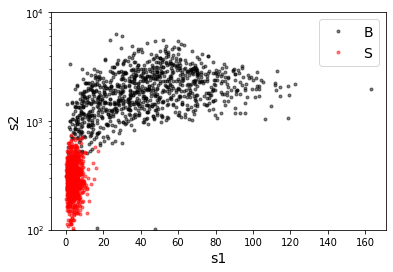

B_pdiffT.shape:  (20487,)
S_pdiffT.shape:  (20487,)


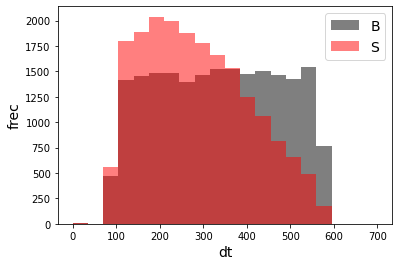

B_pbot.shape:  (20487,)
B_ptop.shape:  (20487,)
B_ppeakS1.shape : (20487, 7)
B_ppeakS2.shape:  (20487, 7)
S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 7)
S_ppeakS2.shape:  (20487, 7)
X_mon_B.shape:  (20487, 17)
X_mon_S.shape:  (20487, 17)
X_mon.shape:  (40974, 17)

X_mon_train :  (26120, 17)
y_mon_train :  (26120,)
X_mon_val :  (4610, 17)
y_mon_val :  (4610,)
X_mon_test :  (10244, 17)
y_mon_test :  (10244,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68351	validation_1-logloss:0.68355
[1]	validation_0-logloss:0.67407	validation_1-logloss:0.67414
[2]	validation_0-logloss:0.66480	validation_1-logloss:0.66491
[3]	validation_0-logloss:0.65573	validation_1-logloss:0.65587
[4]	validation_0-logloss:0.64682	validation_1-logloss:0.64700
[5]	validation_0-logloss:0.63806	validation_1-logloss:0.63829
[6]	validation_0-logloss:0.62947	validation_1-logloss:0.62974
[7]	validation_0-logloss:0.62106	validation_1-logloss:0.62136
[8]	validation_0-logloss:0.61278	validation_1-logloss:0.61313
[9]	validation_0-logloss:0.60467	validation_1-logloss:0.60505
[10]	validation_0-logloss:0.59670	validation_1-logloss:0.59712
[11]	validation_0-logloss:0.58889	validation_1-logloss:0.58934
[12]	validation_0-logloss:0.58120	validation_1-logloss:0.58170
[13]	validation_0-logloss:0.57363	validation_1-logloss:0.57417
[14]	validation_0-logloss:0.56620	validation_1-logloss:0.56676
[15]	validation_0-logloss:0.55889	validation_1-logloss:0.55949
[1

[130]	validation_0-logloss:0.15871	validation_1-logloss:0.16185
[131]	validation_0-logloss:0.15720	validation_1-logloss:0.16036
[132]	validation_0-logloss:0.15568	validation_1-logloss:0.15884
[133]	validation_0-logloss:0.15417	validation_1-logloss:0.15734
[134]	validation_0-logloss:0.15268	validation_1-logloss:0.15585
[135]	validation_0-logloss:0.15124	validation_1-logloss:0.15443
[136]	validation_0-logloss:0.14979	validation_1-logloss:0.15298
[137]	validation_0-logloss:0.14835	validation_1-logloss:0.15155
[138]	validation_0-logloss:0.14693	validation_1-logloss:0.15013
[139]	validation_0-logloss:0.14555	validation_1-logloss:0.14877
[140]	validation_0-logloss:0.14419	validation_1-logloss:0.14742
[141]	validation_0-logloss:0.14285	validation_1-logloss:0.14609
[142]	validation_0-logloss:0.14152	validation_1-logloss:0.14478
[143]	validation_0-logloss:0.14020	validation_1-logloss:0.14348
[144]	validation_0-logloss:0.13889	validation_1-logloss:0.14218
[145]	validation_0-logloss:0.13758	valid

[259]	validation_0-logloss:0.05300	validation_1-logloss:0.05706
[260]	validation_0-logloss:0.05261	validation_1-logloss:0.05669
[261]	validation_0-logloss:0.05222	validation_1-logloss:0.05632
[262]	validation_0-logloss:0.05185	validation_1-logloss:0.05594
[263]	validation_0-logloss:0.05146	validation_1-logloss:0.05558
[264]	validation_0-logloss:0.05109	validation_1-logloss:0.05521
[265]	validation_0-logloss:0.05072	validation_1-logloss:0.05486
[266]	validation_0-logloss:0.05036	validation_1-logloss:0.05450
[267]	validation_0-logloss:0.05000	validation_1-logloss:0.05416
[268]	validation_0-logloss:0.04964	validation_1-logloss:0.05381
[269]	validation_0-logloss:0.04928	validation_1-logloss:0.05347
[270]	validation_0-logloss:0.04893	validation_1-logloss:0.05313
[271]	validation_0-logloss:0.04858	validation_1-logloss:0.05280
[272]	validation_0-logloss:0.04824	validation_1-logloss:0.05247
[273]	validation_0-logloss:0.04790	validation_1-logloss:0.05214
[274]	validation_0-logloss:0.04757	valid

[388]	validation_0-logloss:0.02470	validation_1-logloss:0.03029
[389]	validation_0-logloss:0.02459	validation_1-logloss:0.03019
[390]	validation_0-logloss:0.02448	validation_1-logloss:0.03009
[391]	validation_0-logloss:0.02437	validation_1-logloss:0.02999
[392]	validation_0-logloss:0.02426	validation_1-logloss:0.02989
[393]	validation_0-logloss:0.02415	validation_1-logloss:0.02979
[394]	validation_0-logloss:0.02405	validation_1-logloss:0.02970
[395]	validation_0-logloss:0.02394	validation_1-logloss:0.02962
[396]	validation_0-logloss:0.02384	validation_1-logloss:0.02953
[397]	validation_0-logloss:0.02374	validation_1-logloss:0.02943
[398]	validation_0-logloss:0.02364	validation_1-logloss:0.02934
[399]	validation_0-logloss:0.02353	validation_1-logloss:0.02925
[400]	validation_0-logloss:0.02344	validation_1-logloss:0.02916
[401]	validation_0-logloss:0.02334	validation_1-logloss:0.02908
[402]	validation_0-logloss:0.02324	validation_1-logloss:0.02899
[403]	validation_0-logloss:0.02315	valid

[517]	validation_0-logloss:0.01632	validation_1-logloss:0.02368
[518]	validation_0-logloss:0.01628	validation_1-logloss:0.02366
[519]	validation_0-logloss:0.01625	validation_1-logloss:0.02364
[520]	validation_0-logloss:0.01621	validation_1-logloss:0.02362
[521]	validation_0-logloss:0.01618	validation_1-logloss:0.02359
[522]	validation_0-logloss:0.01614	validation_1-logloss:0.02357
[523]	validation_0-logloss:0.01611	validation_1-logloss:0.02354
[524]	validation_0-logloss:0.01607	validation_1-logloss:0.02351
[525]	validation_0-logloss:0.01604	validation_1-logloss:0.02349
[526]	validation_0-logloss:0.01600	validation_1-logloss:0.02346
[527]	validation_0-logloss:0.01596	validation_1-logloss:0.02346
[528]	validation_0-logloss:0.01592	validation_1-logloss:0.02344
[529]	validation_0-logloss:0.01589	validation_1-logloss:0.02341
[530]	validation_0-logloss:0.01585	validation_1-logloss:0.02339
[531]	validation_0-logloss:0.01581	validation_1-logloss:0.02337
[532]	validation_0-logloss:0.01578	valid

[646]	validation_0-logloss:0.01304	validation_1-logloss:0.02235
[647]	validation_0-logloss:0.01303	validation_1-logloss:0.02234
[648]	validation_0-logloss:0.01302	validation_1-logloss:0.02233
[649]	validation_0-logloss:0.01300	validation_1-logloss:0.02232
[650]	validation_0-logloss:0.01299	validation_1-logloss:0.02232
[651]	validation_0-logloss:0.01296	validation_1-logloss:0.02232
[652]	validation_0-logloss:0.01295	validation_1-logloss:0.02231
[653]	validation_0-logloss:0.01294	validation_1-logloss:0.02231
[654]	validation_0-logloss:0.01293	validation_1-logloss:0.02231
[655]	validation_0-logloss:0.01290	validation_1-logloss:0.02230
[656]	validation_0-logloss:0.01289	validation_1-logloss:0.02229
[657]	validation_0-logloss:0.01288	validation_1-logloss:0.02229
[658]	validation_0-logloss:0.01286	validation_1-logloss:0.02228
[659]	validation_0-logloss:0.01283	validation_1-logloss:0.02228
[660]	validation_0-logloss:0.01281	validation_1-logloss:0.02227
[661]	validation_0-logloss:0.01280	valid

[775]	validation_0-logloss:0.01135	validation_1-logloss:0.02191
[776]	validation_0-logloss:0.01134	validation_1-logloss:0.02191
[777]	validation_0-logloss:0.01133	validation_1-logloss:0.02190
[778]	validation_0-logloss:0.01132	validation_1-logloss:0.02191
[779]	validation_0-logloss:0.01131	validation_1-logloss:0.02190
[780]	validation_0-logloss:0.01129	validation_1-logloss:0.02190
[781]	validation_0-logloss:0.01128	validation_1-logloss:0.02190
[782]	validation_0-logloss:0.01127	validation_1-logloss:0.02190
[783]	validation_0-logloss:0.01125	validation_1-logloss:0.02189
[784]	validation_0-logloss:0.01125	validation_1-logloss:0.02189
[785]	validation_0-logloss:0.01124	validation_1-logloss:0.02189
[786]	validation_0-logloss:0.01123	validation_1-logloss:0.02189
[787]	validation_0-logloss:0.01121	validation_1-logloss:0.02189
[788]	validation_0-logloss:0.01120	validation_1-logloss:0.02189
[789]	validation_0-logloss:0.01119	validation_1-logloss:0.02189
[790]	validation_0-logloss:0.01118	valid

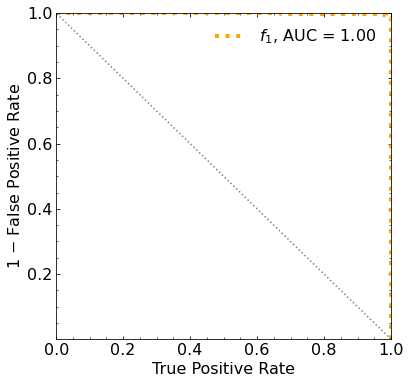

Classification score:


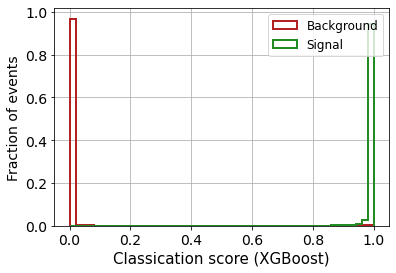


 ROC-AUC =  0.9991557784654135
At least 5 B events per bin, range = [[0, 1]]:
# bins:  2 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  2
range of our data:  [[0, 1]]
number of bins we are going to use:  2
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.118


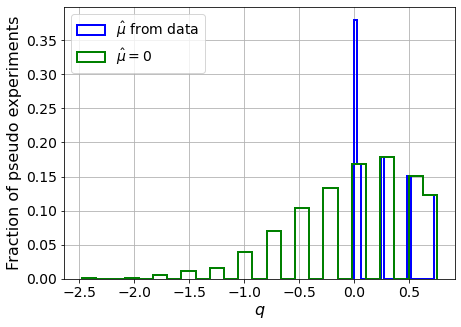

muhat mean:  0.5167581732910655
Z_bins:  0.1871655772272212
std Z_bins:  0.7137295787458826
Z_bins mu=0:  0.08985874003673405
std Z_bins mu=0:  3.052507682295487

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.124


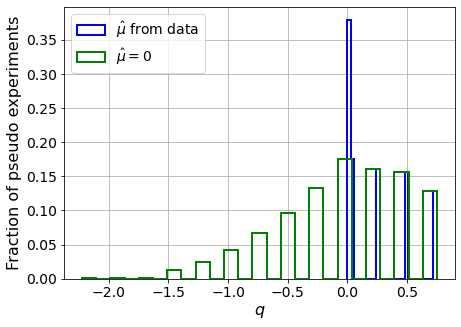

muhat mean:  0.5189603195590501
Z_bins:  0.1871655772272212
std Z_bins:  0.7246475112789814
Z_bins mu=0:  0.08985874003673405
std Z_bins mu=0:  3.085275345609306

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.102


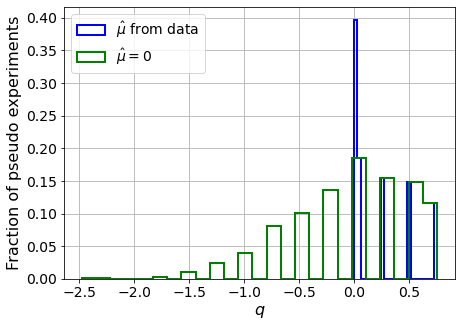

muhat mean:  0.6224676981684261
Z_bins:  0.18698936538499222
std Z_bins:  0.7100365854645446
Z_bins mu=0:  0.08918024993463741
std Z_bins mu=0:  3.112868121481033

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1135


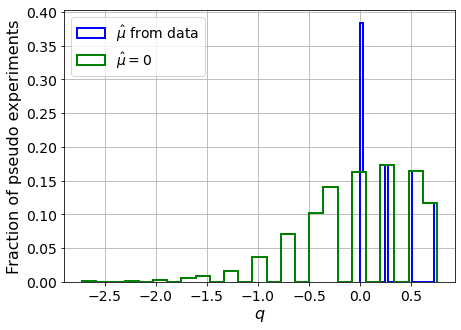

muhat mean:  0.5152851841026305
Z_bins:  0.18719761497840784
std Z_bins:  0.7095777420331493
Z_bins mu=0:  0.0899815522182176
std Z_bins mu=0:  3.0665153585698297

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.096


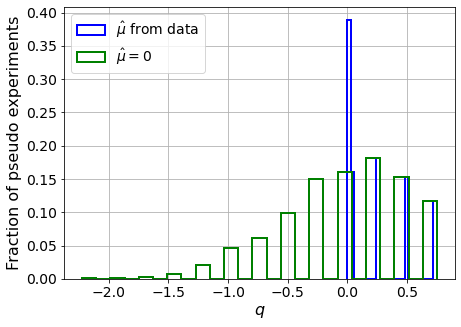

muhat mean:  0.5225577899434227
Z_bins:  0.18714955826292012
std Z_bins:  0.7065299659858856
Z_bins mu=0:  0.0897972709590003
std Z_bins mu=0:  3.0117675449877748

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1095


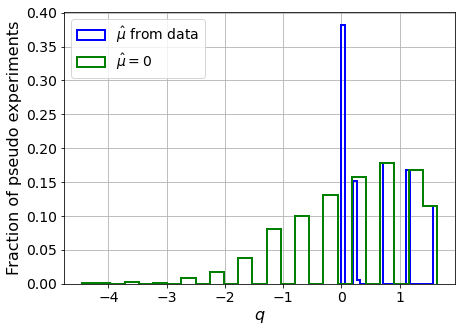

muhat mean:  0.2572801970918383
Z_bins:  0.5123064204293646
std Z_bins:  0.5611021701485246
Z_bins mu=0:  0.48529537510563675
std Z_bins mu=0:  1.0699267425578063

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.121


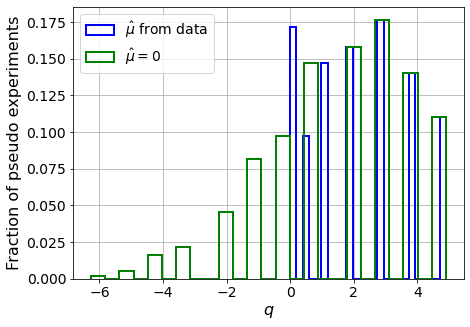

muhat mean:  0.13832758327361852
Z_bins:  1.3706521185927543
std Z_bins:  0.5749038728221851
Z_bins mu=0:  1.3607655574197512
std Z_bins mu=0:  0.845247156657737

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.115


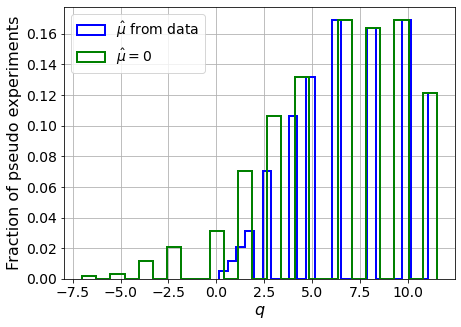

muhat mean:  0.048313469518978726
Z_bins:  2.5469482453467336
std Z_bins:  0.5905476844369665
Z_bins mu=0:  2.541650842334018
std Z_bins mu=0:  0.7288460614758449

--------

B_expected:  643
S_expected:  22

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.103


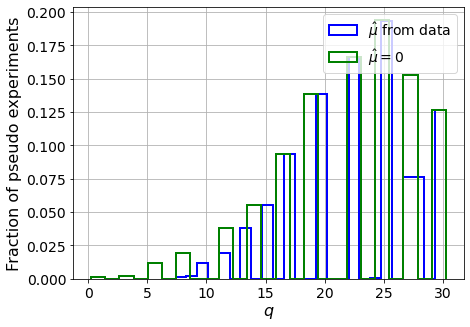

muhat mean:  0.019021021662939116
Z_bins:  4.6988026202184185
std Z_bins:  0.5532006820497113
Z_bins mu=0:  4.695940296880818
std Z_bins mu=0:  0.6279471572312293

--------

B_expected:  643
S_expected:  47

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.133


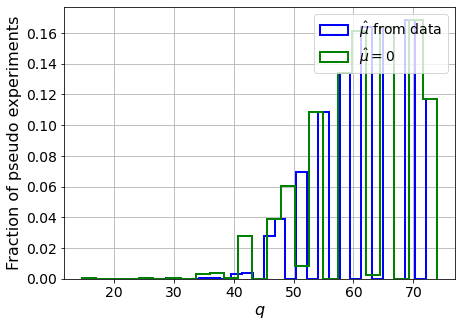

muhat mean:  0.011078783975187325
Z_bins:  7.880274075944389
std Z_bins:  0.5056853628945219
Z_bins mu=0:  7.878562399615376
std Z_bins mu=0:  0.5521146293000004

--------


 FINAL RESULT:

[[0.1871655772272212, 0.7137295787458826, 0.5167581732910655, 0.08985874003673405, 3.052507682295487], [0.1871655772272212, 0.7246475112789814, 0.5189603195590501, 0.08985874003673405, 3.085275345609306], [0.18698936538499222, 0.7100365854645446, 0.6224676981684261, 0.08918024993463741, 3.112868121481033], [0.18719761497840784, 0.7095777420331493, 0.5152851841026305, 0.0899815522182176, 3.0665153585698297], [0.18714955826292012, 0.7065299659858856, 0.5225577899434227, 0.0897972709590003, 3.0117675449877748], [0.5123064204293646, 0.5611021701485246, 0.2572801970918383, 0.48529537510563675, 1.0699267425578063], [1.3706521185927543, 0.5749038728221851, 0.13832758327361852, 1.3607655574197512, 0.845247156657737], [2.5469482453467336, 0.5905476844369665, 0.048313469518978726, 2.541650842334018, 0.7288460

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 387.79145309
 293.78508962 199.98621281 105.15212516   9.18827047 -83.0539323 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 287

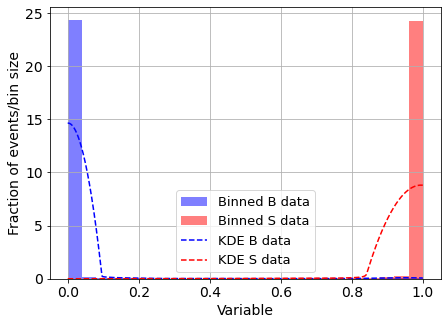

KDE Kernel:  epanechnikov
Background bandwidth:  0.0964296357589577
Signal bandwidth:  0.15753186734235153
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


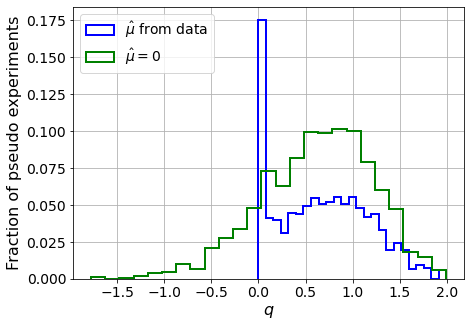

muhat mean:  -4.719512139405841
Z_bins:  0.8207805104229734
std Z_bins:  0.3001318988809528
Z_bins mu=0:  0.8207805104229734
std Z_bins mu=0:  0.35979563466848435

--------

B_expected:  643
S_expected:  1



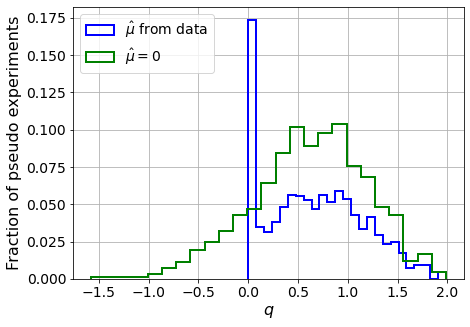

muhat mean:  -3.2433934119878605
Z_bins:  0.8073202550806945
std Z_bins:  0.30067176819542557
Z_bins mu=0:  0.8073202550806945
std Z_bins mu=0:  0.35763024871487975

--------

B_expected:  643
S_expected:  1



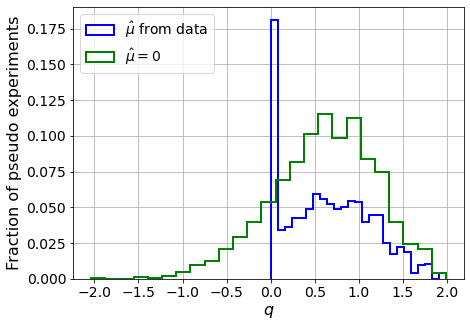

muhat mean:  -2.5648483074487607
Z_bins:  0.796848294396947
std Z_bins:  0.3042821114648504
Z_bins mu=0:  0.796848294396947
std Z_bins mu=0:  0.36726575922920873

--------

B_expected:  643
S_expected:  1



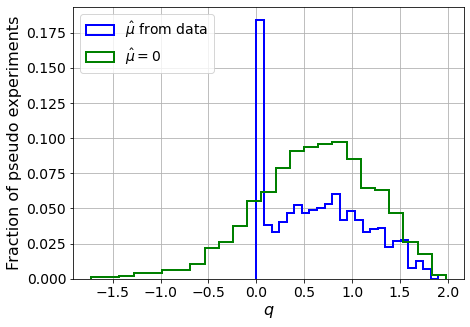

muhat mean:  -4.75707157331941
Z_bins:  0.8033477793697138
std Z_bins:  0.30993993565021777
Z_bins mu=0:  0.8033477793697138
std Z_bins mu=0:  0.3750040725290821

--------

B_expected:  643
S_expected:  1



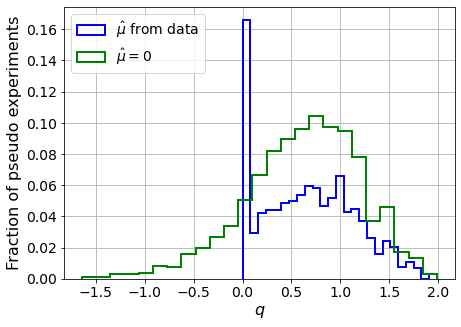

muhat mean:  -3.030739636433803
Z_bins:  0.8177883055667541
std Z_bins:  0.292701854448139
Z_bins mu=0:  0.8177883055667541
std Z_bins mu=0:  0.3548388069622916

--------

B_expected:  643
S_expected:  2



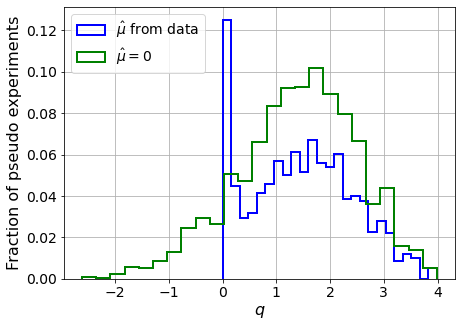

muhat mean:  -1.9002157696923982
Z_bins:  1.2153212900788937
std Z_bins:  0.39543817799325426
Z_bins mu=0:  1.2153212900788937
std Z_bins mu=0:  0.45690146362545786

--------

B_expected:  643
S_expected:  5



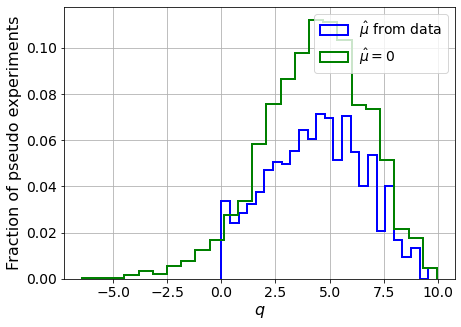

muhat mean:  -0.5026504238071019
Z_bins:  2.114429828913065
std Z_bins:  0.5172547333110442
Z_bins mu=0:  2.114429828913065
std Z_bins mu=0:  0.5706208624312148

--------

B_expected:  643
S_expected:  10



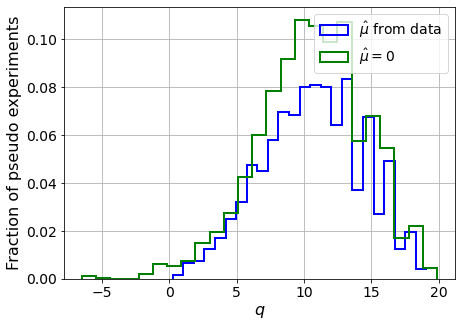

muhat mean:  -0.266536442670324
Z_bins:  3.292942175172267
std Z_bins:  0.5670256730382004
Z_bins mu=0:  3.292942175172267
std Z_bins mu=0:  0.5986245060517654

--------

B_expected:  643
S_expected:  22



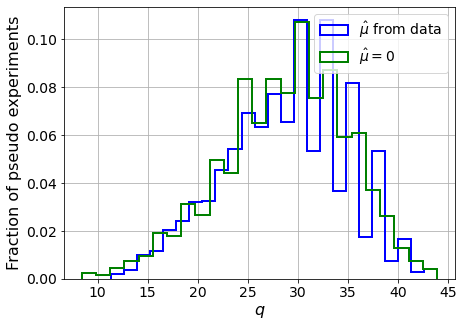

muhat mean:  -0.0946627491943421
Z_bins:  5.426638458738096
std Z_bins:  0.5603929494248203
Z_bins mu=0:  5.426638458738096
std Z_bins mu=0:  0.576219391797766

--------

B_expected:  643
S_expected:  47



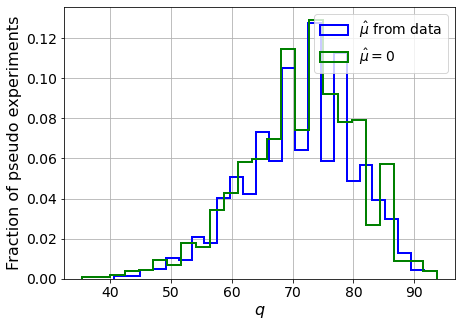

muhat mean:  -0.058029402849605845
Z_bins:  8.509961350215756
std Z_bins:  0.5334420180722506
Z_bins mu=0:  8.509961350215756
std Z_bins mu=0:  0.5478253949095545

--------


 FINAL RESULT:

[[0.8207805104229734, 0.3001318988809528, -4.719512139405841, 0.8207805104229734, 0.35979563466848435], [0.8073202550806945, 0.30067176819542557, -3.2433934119878605, 0.8073202550806945, 0.35763024871487975], [0.796848294396947, 0.3042821114648504, -2.5648483074487607, 0.796848294396947, 0.36726575922920873], [0.8033477793697138, 0.30993993565021777, -4.75707157331941, 0.8033477793697138, 0.3750040725290821], [0.8177883055667541, 0.292701854448139, -3.030739636433803, 0.8177883055667541, 0.3548388069622916], [1.2153212900788937, 0.39543817799325426, -1.9002157696923982, 1.2153212900788937, 0.45690146362545786], [2.114429828913065, 0.5172547333110442, -0.5026504238071019, 2.114429828913065, 0.5706208624312148], [3.292942175172267, 0.5670256730382004, -0.266536442670324, 3.292942175172267, 0.59862450

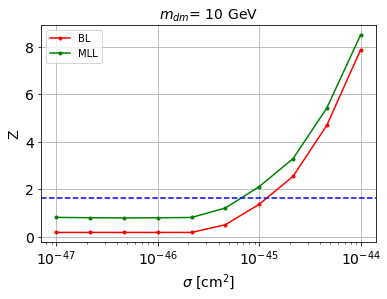


cross_BL_164:  1.1921380553095506e-45
cross_BL_164_up:  7.642175232881826e-46
cross_BL_164_down:  1.7476913269870204e-45

cross_MLL_164:  6.6697726162710664e-46
cross_MLL_164_up:  4.744754400893837e-46
cross_MLL_164_down:  1.0295484785935365e-45

#########################


#########################

mDM =  20 GeV


S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)
 NUM_DAT:  27311 

NUM_DAT_ER:  26962
NUM_DAT_AC:  96
NUM_DAT_CNNS:  1
NUM_DAT_RN:  25
NUM_DAT_WALL:  227

B_pbot.shape:  (27311,)
B_ptop.shape:  (27311,)
B_ppeakS1.shape : (27311, 8)
B_ppeakS2.shape:  (27311, 8)

S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)


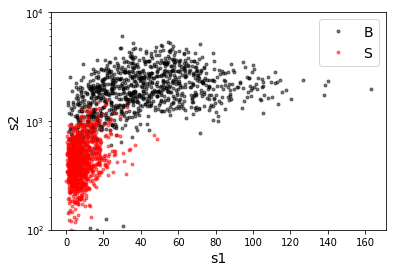

B_pdiffT.shape:  (27311,)
S_pdiffT.shape:  (27311,)


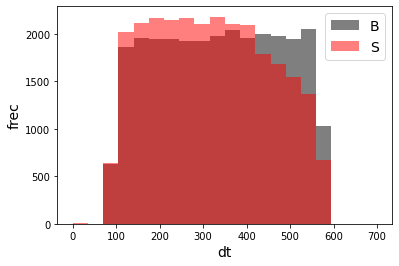

B_pbot.shape:  (27311,)
B_ptop.shape:  (27311,)
B_ppeakS1.shape : (27311, 7)
B_ppeakS2.shape:  (27311, 7)
S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 7)
S_ppeakS2.shape:  (27311, 7)
X_mon_B.shape:  (27311, 17)
X_mon_S.shape:  (27311, 17)
X_mon.shape:  (54622, 17)

X_mon_train :  (34821, 17)
y_mon_train :  (34821,)
X_mon_val :  (6145, 17)
y_mon_val :  (6145,)
X_mon_test :  (13656, 17)
y_mon_test :  (13656,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68437	validation_1-logloss:0.68438
[1]	validation_0-logloss:0.67576	validation_1-logloss:0.67578
[2]	validation_0-logloss:0.66729	validation_1-logloss:0.66731
[3]	validation_0-logloss:0.65901	validation_1-logloss:0.65905
[4]	validation_0-logloss:0.65084	validation_1-logloss:0.65091
[5]	validation_0-logloss:0.64289	validation_1-logloss:0.64295
[6]	validation_0-logloss:0.63502	validation_1-logloss:0.63511
[7]	validation_0-logloss:0.62735	validation_1-logloss:0.62745
[8]	validation_0-logloss:0.61979	validation_1-logloss:0.61990
[9]	validation_0-logloss:0.61240	validation_1-logloss:0.61252
[10]	validation_0-logloss:0.60511	validation_1-logloss:0.60524
[11]	validation_0-logloss:0.59798	validation_1-logloss:0.59812
[12]	validation_0-logloss:0.59095	validation_1-logloss:0.59110
[13]	validation_0-logloss:0.58404	validation_1-logloss:0.58420
[14]	validation_0-logloss:0.57729	validation_1-logloss:0.57746
[15]	validation_0-logloss:0.57063	validation_1-logloss:0.57081
[1

[130]	validation_0-logloss:0.20390	validation_1-logloss:0.20513
[131]	validation_0-logloss:0.20252	validation_1-logloss:0.20375
[132]	validation_0-logloss:0.20115	validation_1-logloss:0.20239
[133]	validation_0-logloss:0.19980	validation_1-logloss:0.20106
[134]	validation_0-logloss:0.19844	validation_1-logloss:0.19970
[135]	validation_0-logloss:0.19710	validation_1-logloss:0.19837
[136]	validation_0-logloss:0.19579	validation_1-logloss:0.19706
[137]	validation_0-logloss:0.19450	validation_1-logloss:0.19578
[138]	validation_0-logloss:0.19322	validation_1-logloss:0.19451
[139]	validation_0-logloss:0.19196	validation_1-logloss:0.19326
[140]	validation_0-logloss:0.19071	validation_1-logloss:0.19202
[141]	validation_0-logloss:0.18948	validation_1-logloss:0.19081
[142]	validation_0-logloss:0.18825	validation_1-logloss:0.18957
[143]	validation_0-logloss:0.18706	validation_1-logloss:0.18839
[144]	validation_0-logloss:0.18582	validation_1-logloss:0.18717
[145]	validation_0-logloss:0.18465	valid

[259]	validation_0-logloss:0.10555	validation_1-logloss:0.10884
[260]	validation_0-logloss:0.10517	validation_1-logloss:0.10846
[261]	validation_0-logloss:0.10480	validation_1-logloss:0.10812
[262]	validation_0-logloss:0.10445	validation_1-logloss:0.10778
[263]	validation_0-logloss:0.10410	validation_1-logloss:0.10745
[264]	validation_0-logloss:0.10375	validation_1-logloss:0.10712
[265]	validation_0-logloss:0.10341	validation_1-logloss:0.10679
[266]	validation_0-logloss:0.10307	validation_1-logloss:0.10645
[267]	validation_0-logloss:0.10272	validation_1-logloss:0.10612
[268]	validation_0-logloss:0.10239	validation_1-logloss:0.10579
[269]	validation_0-logloss:0.10206	validation_1-logloss:0.10548
[270]	validation_0-logloss:0.10171	validation_1-logloss:0.10515
[271]	validation_0-logloss:0.10138	validation_1-logloss:0.10483
[272]	validation_0-logloss:0.10103	validation_1-logloss:0.10450
[273]	validation_0-logloss:0.10072	validation_1-logloss:0.10419
[274]	validation_0-logloss:0.10037	valid

[388]	validation_0-logloss:0.07758	validation_1-logloss:0.08304
[389]	validation_0-logloss:0.07747	validation_1-logloss:0.08294
[390]	validation_0-logloss:0.07735	validation_1-logloss:0.08283
[391]	validation_0-logloss:0.07724	validation_1-logloss:0.08273
[392]	validation_0-logloss:0.07713	validation_1-logloss:0.08263
[393]	validation_0-logloss:0.07701	validation_1-logloss:0.08254
[394]	validation_0-logloss:0.07691	validation_1-logloss:0.08244
[395]	validation_0-logloss:0.07679	validation_1-logloss:0.08235
[396]	validation_0-logloss:0.07668	validation_1-logloss:0.08226
[397]	validation_0-logloss:0.07656	validation_1-logloss:0.08218
[398]	validation_0-logloss:0.07647	validation_1-logloss:0.08208
[399]	validation_0-logloss:0.07635	validation_1-logloss:0.08199
[400]	validation_0-logloss:0.07624	validation_1-logloss:0.08189
[401]	validation_0-logloss:0.07614	validation_1-logloss:0.08181
[402]	validation_0-logloss:0.07602	validation_1-logloss:0.08172
[403]	validation_0-logloss:0.07591	valid

[517]	validation_0-logloss:0.06783	validation_1-logloss:0.07598
[518]	validation_0-logloss:0.06778	validation_1-logloss:0.07596
[519]	validation_0-logloss:0.06773	validation_1-logloss:0.07592
[520]	validation_0-logloss:0.06769	validation_1-logloss:0.07591
[521]	validation_0-logloss:0.06765	validation_1-logloss:0.07589
[522]	validation_0-logloss:0.06760	validation_1-logloss:0.07586
[523]	validation_0-logloss:0.06755	validation_1-logloss:0.07583
[524]	validation_0-logloss:0.06750	validation_1-logloss:0.07581
[525]	validation_0-logloss:0.06745	validation_1-logloss:0.07578
[526]	validation_0-logloss:0.06741	validation_1-logloss:0.07576
[527]	validation_0-logloss:0.06736	validation_1-logloss:0.07573
[528]	validation_0-logloss:0.06732	validation_1-logloss:0.07570
[529]	validation_0-logloss:0.06728	validation_1-logloss:0.07567
[530]	validation_0-logloss:0.06724	validation_1-logloss:0.07566
[531]	validation_0-logloss:0.06719	validation_1-logloss:0.07563
[532]	validation_0-logloss:0.06714	valid

[646]	validation_0-logloss:0.06356	validation_1-logloss:0.07369
[647]	validation_0-logloss:0.06352	validation_1-logloss:0.07367
[648]	validation_0-logloss:0.06349	validation_1-logloss:0.07366
[649]	validation_0-logloss:0.06346	validation_1-logloss:0.07366
[650]	validation_0-logloss:0.06342	validation_1-logloss:0.07364
[651]	validation_0-logloss:0.06341	validation_1-logloss:0.07364
[652]	validation_0-logloss:0.06337	validation_1-logloss:0.07362
[653]	validation_0-logloss:0.06334	validation_1-logloss:0.07360
[654]	validation_0-logloss:0.06332	validation_1-logloss:0.07359
[655]	validation_0-logloss:0.06328	validation_1-logloss:0.07358
[656]	validation_0-logloss:0.06327	validation_1-logloss:0.07358
[657]	validation_0-logloss:0.06324	validation_1-logloss:0.07357
[658]	validation_0-logloss:0.06321	validation_1-logloss:0.07355
[659]	validation_0-logloss:0.06318	validation_1-logloss:0.07354
[660]	validation_0-logloss:0.06317	validation_1-logloss:0.07354
[661]	validation_0-logloss:0.06313	valid

[775]	validation_0-logloss:0.06059	validation_1-logloss:0.07278
[776]	validation_0-logloss:0.06057	validation_1-logloss:0.07276
[777]	validation_0-logloss:0.06055	validation_1-logloss:0.07277
[778]	validation_0-logloss:0.06052	validation_1-logloss:0.07277
[779]	validation_0-logloss:0.06049	validation_1-logloss:0.07275
[780]	validation_0-logloss:0.06046	validation_1-logloss:0.07275
[781]	validation_0-logloss:0.06043	validation_1-logloss:0.07273
[782]	validation_0-logloss:0.06041	validation_1-logloss:0.07273
[783]	validation_0-logloss:0.06040	validation_1-logloss:0.07273
[784]	validation_0-logloss:0.06037	validation_1-logloss:0.07272
[785]	validation_0-logloss:0.06036	validation_1-logloss:0.07272
[786]	validation_0-logloss:0.06033	validation_1-logloss:0.07272
[787]	validation_0-logloss:0.06029	validation_1-logloss:0.07271
[788]	validation_0-logloss:0.06026	validation_1-logloss:0.07272
[789]	validation_0-logloss:0.06024	validation_1-logloss:0.07272
[790]	validation_0-logloss:0.06023	valid

[904]	validation_0-logloss:0.05784	validation_1-logloss:0.07246
[905]	validation_0-logloss:0.05783	validation_1-logloss:0.07246
[906]	validation_0-logloss:0.05782	validation_1-logloss:0.07246
[907]	validation_0-logloss:0.05781	validation_1-logloss:0.07246
[908]	validation_0-logloss:0.05779	validation_1-logloss:0.07245
[909]	validation_0-logloss:0.05777	validation_1-logloss:0.07245
[910]	validation_0-logloss:0.05774	validation_1-logloss:0.07244
[911]	validation_0-logloss:0.05772	validation_1-logloss:0.07243
[912]	validation_0-logloss:0.05770	validation_1-logloss:0.07243
[913]	validation_0-logloss:0.05770	validation_1-logloss:0.07243
[914]	validation_0-logloss:0.05768	validation_1-logloss:0.07243
[915]	validation_0-logloss:0.05766	validation_1-logloss:0.07243
[916]	validation_0-logloss:0.05764	validation_1-logloss:0.07243
[917]	validation_0-logloss:0.05764	validation_1-logloss:0.07243
[918]	validation_0-logloss:0.05763	validation_1-logloss:0.07243
[919]	validation_0-logloss:0.05761	valid

[1032]	validation_0-logloss:0.05557	validation_1-logloss:0.07212
[1033]	validation_0-logloss:0.05555	validation_1-logloss:0.07212
[1034]	validation_0-logloss:0.05554	validation_1-logloss:0.07212
[1035]	validation_0-logloss:0.05553	validation_1-logloss:0.07212
[1036]	validation_0-logloss:0.05553	validation_1-logloss:0.07211
[1037]	validation_0-logloss:0.05552	validation_1-logloss:0.07211
[1038]	validation_0-logloss:0.05551	validation_1-logloss:0.07212
[1039]	validation_0-logloss:0.05550	validation_1-logloss:0.07212
[1040]	validation_0-logloss:0.05548	validation_1-logloss:0.07211
[1041]	validation_0-logloss:0.05546	validation_1-logloss:0.07211
[1042]	validation_0-logloss:0.05543	validation_1-logloss:0.07212
[1043]	validation_0-logloss:0.05540	validation_1-logloss:0.07211
[1044]	validation_0-logloss:0.05538	validation_1-logloss:0.07212
[1045]	validation_0-logloss:0.05538	validation_1-logloss:0.07211
[1046]	validation_0-logloss:0.05535	validation_1-logloss:0.07212
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.05344	validation_1-logloss:0.07201
[1160]	validation_0-logloss:0.05342	validation_1-logloss:0.07200
[1161]	validation_0-logloss:0.05339	validation_1-logloss:0.07201
[1162]	validation_0-logloss:0.05339	validation_1-logloss:0.07201
[1163]	validation_0-logloss:0.05337	validation_1-logloss:0.07201
[1164]	validation_0-logloss:0.05337	validation_1-logloss:0.07201
[1165]	validation_0-logloss:0.05334	validation_1-logloss:0.07201
[1166]	validation_0-logloss:0.05333	validation_1-logloss:0.07201
[1167]	validation_0-logloss:0.05332	validation_1-logloss:0.07201
[1168]	validation_0-logloss:0.05331	validation_1-logloss:0.07202
[1169]	validation_0-logloss:0.05331	validation_1-logloss:0.07202
[1170]	validation_0-logloss:0.05329	validation_1-logloss:0.07201
[1171]	validation_0-logloss:0.05328	validation_1-logloss:0.07200
[1172]	validation_0-logloss:0.05325	validation_1-logloss:0.07200
[1173]	validation_0-logloss:0.05323	validation_1-logloss:0.07201
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.05134	validation_1-logloss:0.07196
[1287]	validation_0-logloss:0.05131	validation_1-logloss:0.07195
[1288]	validation_0-logloss:0.05128	validation_1-logloss:0.07194
[1289]	validation_0-logloss:0.05127	validation_1-logloss:0.07194
[1290]	validation_0-logloss:0.05126	validation_1-logloss:0.07194
[1291]	validation_0-logloss:0.05124	validation_1-logloss:0.07194
[1292]	validation_0-logloss:0.05124	validation_1-logloss:0.07194
[1293]	validation_0-logloss:0.05122	validation_1-logloss:0.07194
[1294]	validation_0-logloss:0.05120	validation_1-logloss:0.07194
[1295]	validation_0-logloss:0.05117	validation_1-logloss:0.07194
[1296]	validation_0-logloss:0.05114	validation_1-logloss:0.07194
[1297]	validation_0-logloss:0.05113	validation_1-logloss:0.07194
[1298]	validation_0-logloss:0.05111	validation_1-logloss:0.07193
[1299]	validation_0-logloss:0.05110	validation_1-logloss:0.07194
[1300]	validation_0-logloss:0.05108	validation_1-logloss:0.07193
[1301]	validation_0-loglo

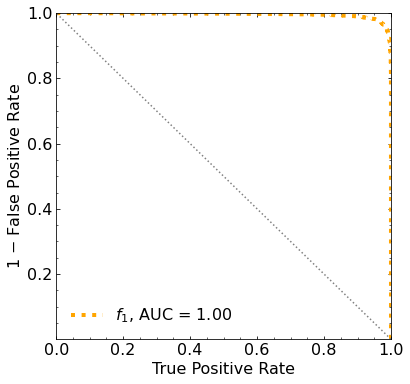

Classification score:


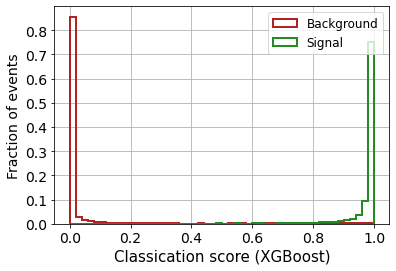


 ROC-AUC =  0.9951693851177765
At least 5 B events per bin, range = [[0, 1]]:
# bins:  7 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  7
range of our data:  [[0, 1]]
number of bins we are going to use:  7
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.688


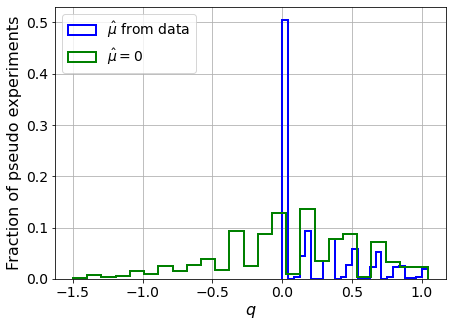

muhat mean:  0.1448309015914713
Z_bins:  0.1920958087534172
std Z_bins:  0.7529353874733875
Z_bins mu=0:  0.1704208907384451
std Z_bins mu=0:  1.4716081707231852

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.675


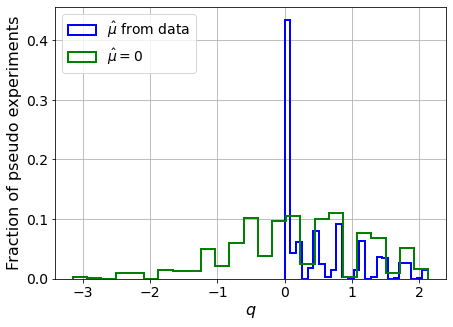

muhat mean:  0.19402399961835276
Z_bins:  0.43216576514871996
std Z_bins:  0.6933200983513189
Z_bins mu=0:  0.4170315552878585
std Z_bins mu=0:  1.180640792961466

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6855


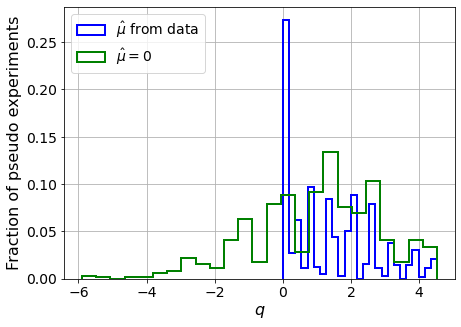

muhat mean:  0.03431283966660815
Z_bins:  1.151151785595851
std Z_bins:  0.5472391149877708
Z_bins mu=0:  1.151151785595851
std Z_bins mu=0:  0.8019014803301192

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6975


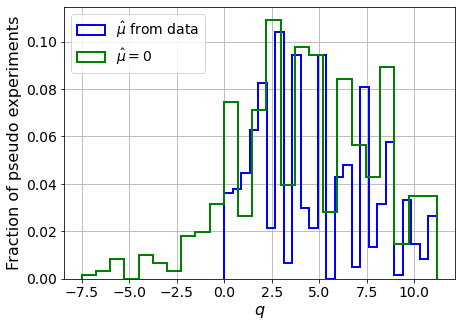

muhat mean:  0.011005832412513116
Z_bins:  2.0134316014451623
std Z_bins:  0.7289722174139996
Z_bins mu=0:  2.010746435759136
std Z_bins mu=0:  0.8909975359021207

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6935


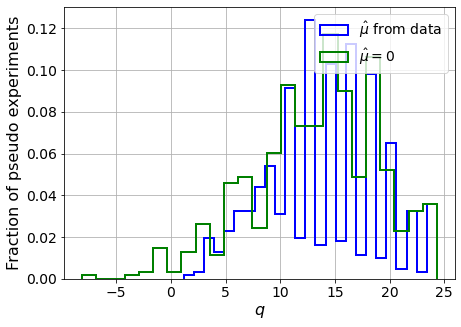

muhat mean:  0.002394874727347979
Z_bins:  3.753728535217084
std Z_bins:  0.6705459054611409
Z_bins mu=0:  3.753728535217084
std Z_bins mu=0:  0.7659266054862764

--------

B_expected:  643
S_expected:  40

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6785


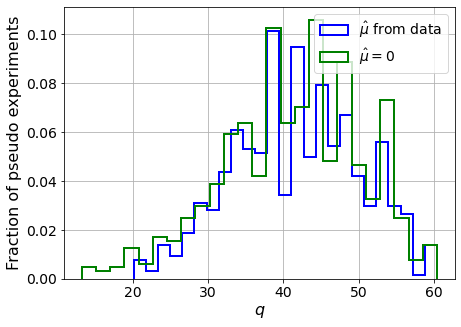

muhat mean:  0.013146025089010088
Z_bins:  6.456484825739117
std Z_bins:  0.6447160618226504
Z_bins mu=0:  6.455420322387542
std Z_bins mu=0:  0.7072870764522436

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6915


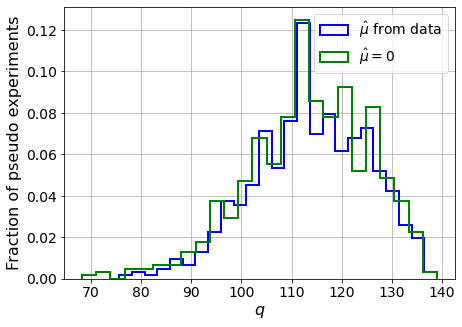

muhat mean:  0.0017901239387163865
Z_bins:  10.657441446928058
std Z_bins:  0.5334335071179731
Z_bins mu=0:  10.657032050862378
std Z_bins mu=0:  0.5653225819920183

--------

B_expected:  643
S_expected:  184

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.7005


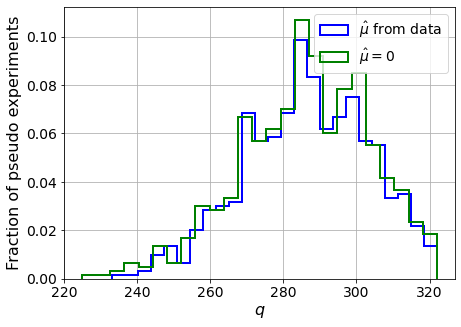

muhat mean:  0.00023880771124581724
Z_bins:  16.92481481827348
std Z_bins:  0.5012266022033667
Z_bins mu=0:  16.924695509736345
std Z_bins mu=0:  0.5235162013717521

--------

B_expected:  643
S_expected:  396

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.69


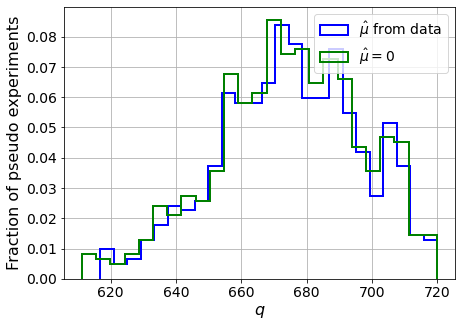

muhat mean:  0.0006019590518038235
Z_bins:  25.988026656282926
std Z_bins:  0.41479807380862666
Z_bins mu=0:  25.987883398337058
std Z_bins mu=0:  0.4289289415170904

--------

B_expected:  643
S_expected:  854

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6865


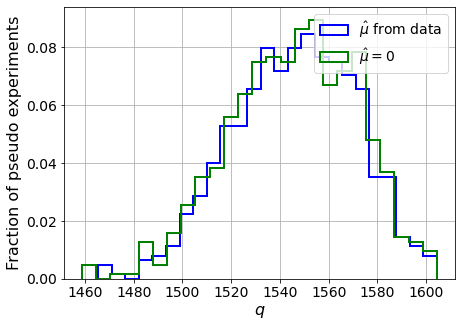

muhat mean:  0.00016785488494739439
Z_bins:  39.334629235607416
std Z_bins:  0.3204960416946887
Z_bins mu=0:  39.334441610925495
std Z_bins mu=0:  0.32874213796439045

--------


 FINAL RESULT:

[[0.1920958087534172, 0.7529353874733875, 0.1448309015914713, 0.1704208907384451, 1.4716081707231852], [0.43216576514871996, 0.6933200983513189, 0.19402399961835276, 0.4170315552878585, 1.180640792961466], [1.151151785595851, 0.5472391149877708, 0.03431283966660815, 1.151151785595851, 0.8019014803301192], [2.0134316014451623, 0.7289722174139996, 0.011005832412513116, 2.010746435759136, 0.8909975359021207], [3.753728535217084, 0.6705459054611409, 0.002394874727347979, 3.753728535217084, 0.7659266054862764], [6.456484825739117, 0.6447160618226504, 0.013146025089010088, 6.455420322387542, 0.7072870764522436], [10.657441446928058, 0.5334335071179731, 0.0017901239387163865, 10.657032050862378, 0.5653225819920183], [16.92481481827348, 0.5012266022033667, 0.00023880771124581724, 16.924695509736345, 0.

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 397.67278565 319.55578139
 239.99508249 159.97604118  76.80461483 -10.80235751 -89.78218414]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 434.03161753 379.240742   315.74922358
 247

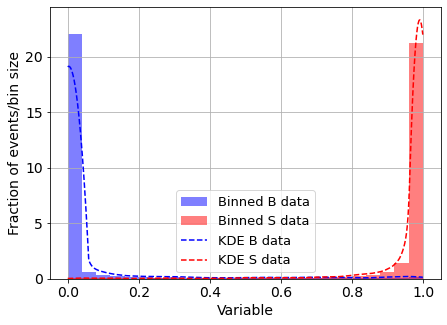

KDE Kernel:  epanechnikov
Background bandwidth:  0.059027261020128646
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



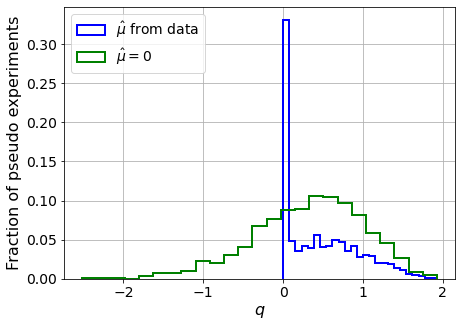

muhat mean:  -2.185253689798191
Z_bins:  0.6263633809568828
std Z_bins:  0.3711137026810675
Z_bins mu=0:  0.6263633809568828
std Z_bins mu=0:  0.550525246399577

--------

B_expected:  643
S_expected:  2



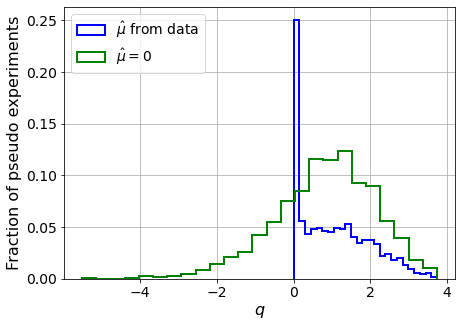

muhat mean:  -0.9246626162495204
Z_bins:  0.9620311016201487
std Z_bins:  0.48196042697958863
Z_bins mu=0:  0.9620311016201487
std Z_bins mu=0:  0.6805929417522438

--------

B_expected:  643
S_expected:  4



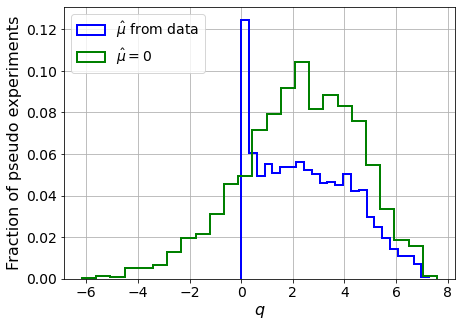

muhat mean:  -0.45776548334583367
Z_bins:  1.5512562747082068
std Z_bins:  0.5812310718571366
Z_bins mu=0:  1.5512562747082068
std Z_bins mu=0:  0.7296866311121024

--------

B_expected:  643
S_expected:  9



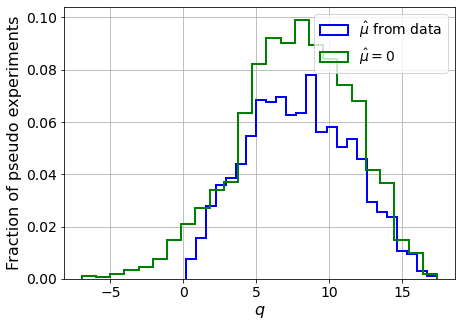

muhat mean:  -0.6172467182107543
Z_bins:  2.8107247135362337
std Z_bins:  0.6262860361018522
Z_bins mu=0:  2.8107247135362337
std Z_bins mu=0:  0.7055258861797755

--------

B_expected:  643
S_expected:  18



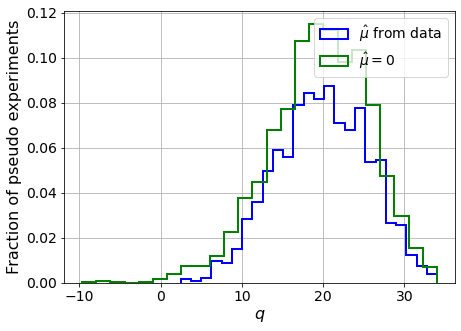

muhat mean:  -0.20332923684495044
Z_bins:  4.463470961573422
std Z_bins:  0.6259587326112425
Z_bins mu=0:  4.463470961573422
std Z_bins mu=0:  0.686557143577616

--------

B_expected:  643
S_expected:  40



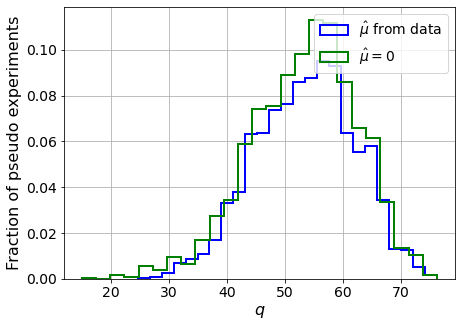

muhat mean:  -0.07023479670820286
Z_bins:  7.348429840787911
std Z_bins:  0.5831508493936721
Z_bins mu=0:  7.348429840787911
std Z_bins mu=0:  0.6213759527230479

--------

B_expected:  643
S_expected:  85



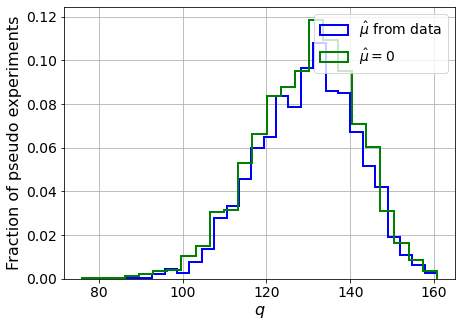

muhat mean:  -0.021746466816614046
Z_bins:  11.42492652048057
std Z_bins:  0.5145025789285844
Z_bins mu=0:  11.42492652048057
std Z_bins mu=0:  0.5383694210054774

--------

B_expected:  643
S_expected:  184



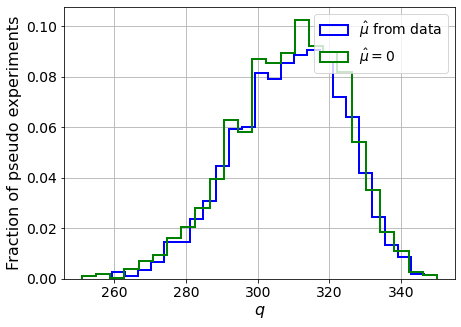

muhat mean:  -0.011575851610469435
Z_bins:  17.603337089374573
std Z_bins:  0.4318087575604536
Z_bins mu=0:  17.60256693269374
std Z_bins mu=0:  0.44562503236263995

--------

B_expected:  643
S_expected:  396



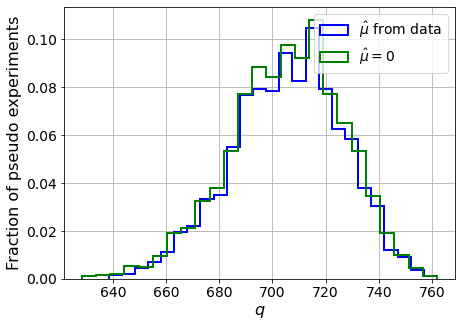

muhat mean:  -0.005947459724782607
Z_bins:  26.581816144297456
std Z_bins:  0.38851158057068136
Z_bins mu=0:  26.581764781512575
std Z_bins mu=0:  0.3987846314954759

--------

B_expected:  643
S_expected:  854



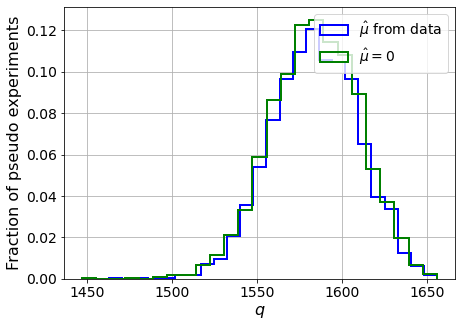

muhat mean:  -0.0028185815902500425
Z_bins:  39.80375287455508
std Z_bins:  0.3212617041970827
Z_bins mu=0:  39.80325658626504
std Z_bins mu=0:  0.32752003505805827

--------


 FINAL RESULT:

[[0.6263633809568828, 0.3711137026810675, -2.185253689798191, 0.6263633809568828, 0.550525246399577], [0.9620311016201487, 0.48196042697958863, -0.9246626162495204, 0.9620311016201487, 0.6805929417522438], [1.5512562747082068, 0.5812310718571366, -0.45776548334583367, 1.5512562747082068, 0.7296866311121024], [2.8107247135362337, 0.6262860361018522, -0.6172467182107543, 2.8107247135362337, 0.7055258861797755], [4.463470961573422, 0.6259587326112425, -0.20332923684495044, 4.463470961573422, 0.686557143577616], [7.348429840787911, 0.5831508493936721, -0.07023479670820286, 7.348429840787911, 0.6213759527230479], [11.42492652048057, 0.5145025789285844, -0.021746466816614046, 11.42492652048057, 0.5383694210054774], [17.603337089374573, 0.4318087575604536, -0.011575851610469435, 17.60256693269374, 0.445

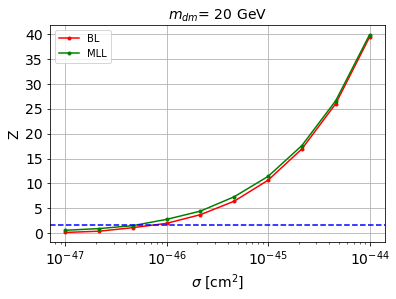


cross_BL_164:  7.172024351992003e-47
cross_BL_164_up:  4.2923298588336504e-47
cross_BL_164_down:  1.163824751870734e-46

cross_MLL_164:  4.899522441860332e-47
cross_MLL_164_up:  2.6805893575604877e-47
cross_MLL_164_down:  7.088624451164456e-47

#########################


#########################

mDM =  35 GeV


S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)
 NUM_DAT:  29071 

NUM_DAT_ER:  28699
NUM_DAT_AC:  102
NUM_DAT_CNNS:  1
NUM_DAT_RN:  27
NUM_DAT_WALL:  242

B_pbot.shape:  (29071,)
B_ptop.shape:  (29071,)
B_ppeakS1.shape : (29071, 8)
B_ppeakS2.shape:  (29071, 8)

S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)


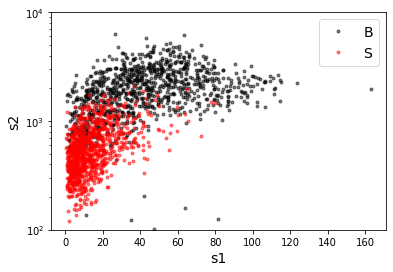

B_pdiffT.shape:  (29071,)
S_pdiffT.shape:  (29071,)


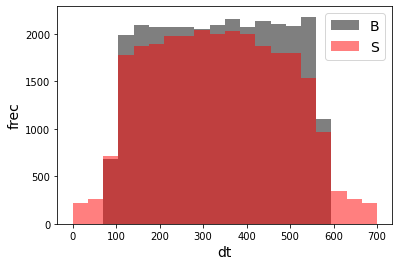

B_pbot.shape:  (29071,)
B_ptop.shape:  (29071,)
B_ppeakS1.shape : (29071, 7)
B_ppeakS2.shape:  (29071, 7)
S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 7)
S_ppeakS2.shape:  (29071, 7)
X_mon_B.shape:  (29071, 17)
X_mon_S.shape:  (29071, 17)
X_mon.shape:  (58142, 17)

X_mon_train :  (37065, 17)
y_mon_train :  (37065,)
X_mon_val :  (6541, 17)
y_mon_val :  (6541,)
X_mon_test :  (14536, 17)
y_mon_test :  (14536,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68564	validation_1-logloss:0.68564
[1]	validation_0-logloss:0.67829	validation_1-logloss:0.67827
[2]	validation_0-logloss:0.67104	validation_1-logloss:0.67105
[3]	validation_0-logloss:0.66397	validation_1-logloss:0.66398
[4]	validation_0-logloss:0.65700	validation_1-logloss:0.65703
[5]	validation_0-logloss:0.65017	validation_1-logloss:0.65020
[6]	validation_0-logloss:0.64347	validation_1-logloss:0.64350
[7]	validation_0-logloss:0.63689	validation_1-logloss:0.63692
[8]	validation_0-logloss:0.63044	validation_1-logloss:0.63046
[9]	validation_0-logloss:0.62410	validation_1-logloss:0.62411
[10]	validation_0-logloss:0.61786	validation_1-logloss:0.61788
[11]	validation_0-logloss:0.61175	validation_1-logloss:0.61177
[12]	validation_0-logloss:0.60575	validation_1-logloss:0.60580
[13]	validation_0-logloss:0.59986	validation_1-logloss:0.59991
[14]	validation_0-logloss:0.59405	validation_1-logloss:0.59411
[15]	validation_0-logloss:0.58839	validation_1-logloss:0.58845
[1

[130]	validation_0-logloss:0.27027	validation_1-logloss:0.27233
[131]	validation_0-logloss:0.26908	validation_1-logloss:0.27115
[132]	validation_0-logloss:0.26782	validation_1-logloss:0.26993
[133]	validation_0-logloss:0.26659	validation_1-logloss:0.26870
[134]	validation_0-logloss:0.26544	validation_1-logloss:0.26755
[135]	validation_0-logloss:0.26419	validation_1-logloss:0.26636
[136]	validation_0-logloss:0.26306	validation_1-logloss:0.26525
[137]	validation_0-logloss:0.26188	validation_1-logloss:0.26412
[138]	validation_0-logloss:0.26072	validation_1-logloss:0.26295
[139]	validation_0-logloss:0.25955	validation_1-logloss:0.26183
[140]	validation_0-logloss:0.25837	validation_1-logloss:0.26070
[141]	validation_0-logloss:0.25731	validation_1-logloss:0.25965
[142]	validation_0-logloss:0.25613	validation_1-logloss:0.25852
[143]	validation_0-logloss:0.25503	validation_1-logloss:0.25747
[144]	validation_0-logloss:0.25400	validation_1-logloss:0.25645
[145]	validation_0-logloss:0.25293	valid

[259]	validation_0-logloss:0.17850	validation_1-logloss:0.18479
[260]	validation_0-logloss:0.17811	validation_1-logloss:0.18442
[261]	validation_0-logloss:0.17775	validation_1-logloss:0.18407
[262]	validation_0-logloss:0.17739	validation_1-logloss:0.18374
[263]	validation_0-logloss:0.17702	validation_1-logloss:0.18338
[264]	validation_0-logloss:0.17666	validation_1-logloss:0.18305
[265]	validation_0-logloss:0.17631	validation_1-logloss:0.18274
[266]	validation_0-logloss:0.17595	validation_1-logloss:0.18239
[267]	validation_0-logloss:0.17559	validation_1-logloss:0.18204
[268]	validation_0-logloss:0.17524	validation_1-logloss:0.18172
[269]	validation_0-logloss:0.17492	validation_1-logloss:0.18141
[270]	validation_0-logloss:0.17458	validation_1-logloss:0.18109
[271]	validation_0-logloss:0.17425	validation_1-logloss:0.18079
[272]	validation_0-logloss:0.17388	validation_1-logloss:0.18047
[273]	validation_0-logloss:0.17354	validation_1-logloss:0.18016
[274]	validation_0-logloss:0.17322	valid

[388]	validation_0-logloss:0.14858	validation_1-logloss:0.15807
[389]	validation_0-logloss:0.14843	validation_1-logloss:0.15794
[390]	validation_0-logloss:0.14825	validation_1-logloss:0.15779
[391]	validation_0-logloss:0.14812	validation_1-logloss:0.15768
[392]	validation_0-logloss:0.14798	validation_1-logloss:0.15758
[393]	validation_0-logloss:0.14787	validation_1-logloss:0.15749
[394]	validation_0-logloss:0.14770	validation_1-logloss:0.15735
[395]	validation_0-logloss:0.14757	validation_1-logloss:0.15722
[396]	validation_0-logloss:0.14744	validation_1-logloss:0.15712
[397]	validation_0-logloss:0.14726	validation_1-logloss:0.15694
[398]	validation_0-logloss:0.14713	validation_1-logloss:0.15685
[399]	validation_0-logloss:0.14703	validation_1-logloss:0.15677
[400]	validation_0-logloss:0.14691	validation_1-logloss:0.15668
[401]	validation_0-logloss:0.14672	validation_1-logloss:0.15651
[402]	validation_0-logloss:0.14661	validation_1-logloss:0.15639
[403]	validation_0-logloss:0.14646	valid

[517]	validation_0-logloss:0.13482	validation_1-logloss:0.14661
[518]	validation_0-logloss:0.13473	validation_1-logloss:0.14654
[519]	validation_0-logloss:0.13466	validation_1-logloss:0.14649
[520]	validation_0-logloss:0.13454	validation_1-logloss:0.14638
[521]	validation_0-logloss:0.13447	validation_1-logloss:0.14635
[522]	validation_0-logloss:0.13436	validation_1-logloss:0.14626
[523]	validation_0-logloss:0.13429	validation_1-logloss:0.14621
[524]	validation_0-logloss:0.13419	validation_1-logloss:0.14613
[525]	validation_0-logloss:0.13412	validation_1-logloss:0.14607
[526]	validation_0-logloss:0.13400	validation_1-logloss:0.14598
[527]	validation_0-logloss:0.13393	validation_1-logloss:0.14594
[528]	validation_0-logloss:0.13383	validation_1-logloss:0.14587
[529]	validation_0-logloss:0.13376	validation_1-logloss:0.14582
[530]	validation_0-logloss:0.13367	validation_1-logloss:0.14574
[531]	validation_0-logloss:0.13360	validation_1-logloss:0.14570
[532]	validation_0-logloss:0.13349	valid

[646]	validation_0-logloss:0.12578	validation_1-logloss:0.13988
[647]	validation_0-logloss:0.12572	validation_1-logloss:0.13983
[648]	validation_0-logloss:0.12563	validation_1-logloss:0.13978
[649]	validation_0-logloss:0.12557	validation_1-logloss:0.13975
[650]	validation_0-logloss:0.12553	validation_1-logloss:0.13972
[651]	validation_0-logloss:0.12548	validation_1-logloss:0.13969
[652]	validation_0-logloss:0.12542	validation_1-logloss:0.13964
[653]	validation_0-logloss:0.12536	validation_1-logloss:0.13959
[654]	validation_0-logloss:0.12528	validation_1-logloss:0.13952
[655]	validation_0-logloss:0.12521	validation_1-logloss:0.13947
[656]	validation_0-logloss:0.12516	validation_1-logloss:0.13943
[657]	validation_0-logloss:0.12513	validation_1-logloss:0.13941
[658]	validation_0-logloss:0.12504	validation_1-logloss:0.13934
[659]	validation_0-logloss:0.12499	validation_1-logloss:0.13931
[660]	validation_0-logloss:0.12493	validation_1-logloss:0.13926
[661]	validation_0-logloss:0.12487	valid

[775]	validation_0-logloss:0.11895	validation_1-logloss:0.13507
[776]	validation_0-logloss:0.11891	validation_1-logloss:0.13506
[777]	validation_0-logloss:0.11886	validation_1-logloss:0.13502
[778]	validation_0-logloss:0.11881	validation_1-logloss:0.13500
[779]	validation_0-logloss:0.11877	validation_1-logloss:0.13497
[780]	validation_0-logloss:0.11873	validation_1-logloss:0.13496
[781]	validation_0-logloss:0.11870	validation_1-logloss:0.13493
[782]	validation_0-logloss:0.11864	validation_1-logloss:0.13489
[783]	validation_0-logloss:0.11861	validation_1-logloss:0.13487
[784]	validation_0-logloss:0.11857	validation_1-logloss:0.13487
[785]	validation_0-logloss:0.11853	validation_1-logloss:0.13484
[786]	validation_0-logloss:0.11848	validation_1-logloss:0.13481
[787]	validation_0-logloss:0.11845	validation_1-logloss:0.13478
[788]	validation_0-logloss:0.11841	validation_1-logloss:0.13476
[789]	validation_0-logloss:0.11836	validation_1-logloss:0.13473
[790]	validation_0-logloss:0.11832	valid

[904]	validation_0-logloss:0.11344	validation_1-logloss:0.13191
[905]	validation_0-logloss:0.11338	validation_1-logloss:0.13188
[906]	validation_0-logloss:0.11335	validation_1-logloss:0.13187
[907]	validation_0-logloss:0.11331	validation_1-logloss:0.13184
[908]	validation_0-logloss:0.11326	validation_1-logloss:0.13180
[909]	validation_0-logloss:0.11322	validation_1-logloss:0.13179
[910]	validation_0-logloss:0.11319	validation_1-logloss:0.13178
[911]	validation_0-logloss:0.11314	validation_1-logloss:0.13176
[912]	validation_0-logloss:0.11308	validation_1-logloss:0.13173
[913]	validation_0-logloss:0.11305	validation_1-logloss:0.13173
[914]	validation_0-logloss:0.11302	validation_1-logloss:0.13171
[915]	validation_0-logloss:0.11297	validation_1-logloss:0.13167
[916]	validation_0-logloss:0.11292	validation_1-logloss:0.13162
[917]	validation_0-logloss:0.11288	validation_1-logloss:0.13161
[918]	validation_0-logloss:0.11284	validation_1-logloss:0.13157
[919]	validation_0-logloss:0.11281	valid

[1032]	validation_0-logloss:0.10858	validation_1-logloss:0.12947
[1033]	validation_0-logloss:0.10854	validation_1-logloss:0.12945
[1034]	validation_0-logloss:0.10851	validation_1-logloss:0.12943
[1035]	validation_0-logloss:0.10847	validation_1-logloss:0.12940
[1036]	validation_0-logloss:0.10845	validation_1-logloss:0.12938
[1037]	validation_0-logloss:0.10843	validation_1-logloss:0.12938
[1038]	validation_0-logloss:0.10839	validation_1-logloss:0.12936
[1039]	validation_0-logloss:0.10836	validation_1-logloss:0.12934
[1040]	validation_0-logloss:0.10831	validation_1-logloss:0.12934
[1041]	validation_0-logloss:0.10828	validation_1-logloss:0.12932
[1042]	validation_0-logloss:0.10826	validation_1-logloss:0.12931
[1043]	validation_0-logloss:0.10824	validation_1-logloss:0.12932
[1044]	validation_0-logloss:0.10818	validation_1-logloss:0.12929
[1045]	validation_0-logloss:0.10815	validation_1-logloss:0.12927
[1046]	validation_0-logloss:0.10811	validation_1-logloss:0.12926
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.10486	validation_1-logloss:0.12802
[1160]	validation_0-logloss:0.10483	validation_1-logloss:0.12800
[1161]	validation_0-logloss:0.10481	validation_1-logloss:0.12797
[1162]	validation_0-logloss:0.10477	validation_1-logloss:0.12799
[1163]	validation_0-logloss:0.10476	validation_1-logloss:0.12799
[1164]	validation_0-logloss:0.10473	validation_1-logloss:0.12798
[1165]	validation_0-logloss:0.10472	validation_1-logloss:0.12798
[1166]	validation_0-logloss:0.10469	validation_1-logloss:0.12799
[1167]	validation_0-logloss:0.10466	validation_1-logloss:0.12796
[1168]	validation_0-logloss:0.10461	validation_1-logloss:0.12794
[1169]	validation_0-logloss:0.10458	validation_1-logloss:0.12792
[1170]	validation_0-logloss:0.10456	validation_1-logloss:0.12791
[1171]	validation_0-logloss:0.10454	validation_1-logloss:0.12791
[1172]	validation_0-logloss:0.10451	validation_1-logloss:0.12790
[1173]	validation_0-logloss:0.10447	validation_1-logloss:0.12789
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.10174	validation_1-logloss:0.12689
[1287]	validation_0-logloss:0.10172	validation_1-logloss:0.12688
[1288]	validation_0-logloss:0.10171	validation_1-logloss:0.12688
[1289]	validation_0-logloss:0.10168	validation_1-logloss:0.12687
[1290]	validation_0-logloss:0.10166	validation_1-logloss:0.12688
[1291]	validation_0-logloss:0.10162	validation_1-logloss:0.12685
[1292]	validation_0-logloss:0.10159	validation_1-logloss:0.12684
[1293]	validation_0-logloss:0.10156	validation_1-logloss:0.12681
[1294]	validation_0-logloss:0.10155	validation_1-logloss:0.12681
[1295]	validation_0-logloss:0.10153	validation_1-logloss:0.12680
[1296]	validation_0-logloss:0.10152	validation_1-logloss:0.12678
[1297]	validation_0-logloss:0.10149	validation_1-logloss:0.12678
[1298]	validation_0-logloss:0.10146	validation_1-logloss:0.12678
[1299]	validation_0-logloss:0.10143	validation_1-logloss:0.12676
[1300]	validation_0-logloss:0.10142	validation_1-logloss:0.12676
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.09895	validation_1-logloss:0.12589
[1414]	validation_0-logloss:0.09893	validation_1-logloss:0.12588
[1415]	validation_0-logloss:0.09892	validation_1-logloss:0.12587
[1416]	validation_0-logloss:0.09890	validation_1-logloss:0.12586
[1417]	validation_0-logloss:0.09887	validation_1-logloss:0.12586
[1418]	validation_0-logloss:0.09886	validation_1-logloss:0.12586
[1419]	validation_0-logloss:0.09885	validation_1-logloss:0.12586
[1420]	validation_0-logloss:0.09882	validation_1-logloss:0.12585
[1421]	validation_0-logloss:0.09879	validation_1-logloss:0.12582
[1422]	validation_0-logloss:0.09877	validation_1-logloss:0.12582
[1423]	validation_0-logloss:0.09876	validation_1-logloss:0.12581
[1424]	validation_0-logloss:0.09874	validation_1-logloss:0.12581
[1425]	validation_0-logloss:0.09871	validation_1-logloss:0.12581
[1426]	validation_0-logloss:0.09868	validation_1-logloss:0.12579
[1427]	validation_0-logloss:0.09865	validation_1-logloss:0.12579
[1428]	validation_0-loglo

[1540]	validation_0-logloss:0.09640	validation_1-logloss:0.12523
[1541]	validation_0-logloss:0.09638	validation_1-logloss:0.12522
[1542]	validation_0-logloss:0.09635	validation_1-logloss:0.12521
[1543]	validation_0-logloss:0.09635	validation_1-logloss:0.12521
[1544]	validation_0-logloss:0.09632	validation_1-logloss:0.12522
[1545]	validation_0-logloss:0.09628	validation_1-logloss:0.12521
[1546]	validation_0-logloss:0.09627	validation_1-logloss:0.12521
[1547]	validation_0-logloss:0.09624	validation_1-logloss:0.12520
[1548]	validation_0-logloss:0.09623	validation_1-logloss:0.12519
[1549]	validation_0-logloss:0.09621	validation_1-logloss:0.12519
[1550]	validation_0-logloss:0.09618	validation_1-logloss:0.12518
[1551]	validation_0-logloss:0.09615	validation_1-logloss:0.12517
[1552]	validation_0-logloss:0.09614	validation_1-logloss:0.12517
[1553]	validation_0-logloss:0.09612	validation_1-logloss:0.12518
[1554]	validation_0-logloss:0.09609	validation_1-logloss:0.12518
[1555]	validation_0-loglo

[1667]	validation_0-logloss:0.09376	validation_1-logloss:0.12466
[1668]	validation_0-logloss:0.09374	validation_1-logloss:0.12466
[1669]	validation_0-logloss:0.09372	validation_1-logloss:0.12466
[1670]	validation_0-logloss:0.09371	validation_1-logloss:0.12466
[1671]	validation_0-logloss:0.09369	validation_1-logloss:0.12466
[1672]	validation_0-logloss:0.09365	validation_1-logloss:0.12465
[1673]	validation_0-logloss:0.09364	validation_1-logloss:0.12465
[1674]	validation_0-logloss:0.09361	validation_1-logloss:0.12464
[1675]	validation_0-logloss:0.09359	validation_1-logloss:0.12463
[1676]	validation_0-logloss:0.09356	validation_1-logloss:0.12462
[1677]	validation_0-logloss:0.09355	validation_1-logloss:0.12462
[1678]	validation_0-logloss:0.09354	validation_1-logloss:0.12461
[1679]	validation_0-logloss:0.09351	validation_1-logloss:0.12461
[1680]	validation_0-logloss:0.09349	validation_1-logloss:0.12461
[1681]	validation_0-logloss:0.09348	validation_1-logloss:0.12461
[1682]	validation_0-loglo

[1794]	validation_0-logloss:0.09107	validation_1-logloss:0.12423
[1795]	validation_0-logloss:0.09106	validation_1-logloss:0.12423
[1796]	validation_0-logloss:0.09105	validation_1-logloss:0.12423
[1797]	validation_0-logloss:0.09102	validation_1-logloss:0.12421
[1798]	validation_0-logloss:0.09101	validation_1-logloss:0.12422
[1799]	validation_0-logloss:0.09098	validation_1-logloss:0.12422
[1800]	validation_0-logloss:0.09097	validation_1-logloss:0.12421
[1801]	validation_0-logloss:0.09096	validation_1-logloss:0.12421
[1802]	validation_0-logloss:0.09094	validation_1-logloss:0.12421
[1803]	validation_0-logloss:0.09091	validation_1-logloss:0.12420
[1804]	validation_0-logloss:0.09090	validation_1-logloss:0.12420
[1805]	validation_0-logloss:0.09087	validation_1-logloss:0.12419
[1806]	validation_0-logloss:0.09085	validation_1-logloss:0.12420
[1807]	validation_0-logloss:0.09082	validation_1-logloss:0.12421
[1808]	validation_0-logloss:0.09079	validation_1-logloss:0.12420
[1809]	validation_0-loglo

[1921]	validation_0-logloss:0.08876	validation_1-logloss:0.12395
[1922]	validation_0-logloss:0.08875	validation_1-logloss:0.12395
[1923]	validation_0-logloss:0.08874	validation_1-logloss:0.12395
[1924]	validation_0-logloss:0.08873	validation_1-logloss:0.12395
[1925]	validation_0-logloss:0.08871	validation_1-logloss:0.12394
[1926]	validation_0-logloss:0.08869	validation_1-logloss:0.12394
[1927]	validation_0-logloss:0.08867	validation_1-logloss:0.12392
[1928]	validation_0-logloss:0.08865	validation_1-logloss:0.12393
[1929]	validation_0-logloss:0.08862	validation_1-logloss:0.12392
[1930]	validation_0-logloss:0.08861	validation_1-logloss:0.12391
[1931]	validation_0-logloss:0.08860	validation_1-logloss:0.12392
[1932]	validation_0-logloss:0.08858	validation_1-logloss:0.12391
[1933]	validation_0-logloss:0.08857	validation_1-logloss:0.12391
[1934]	validation_0-logloss:0.08855	validation_1-logloss:0.12391
[1935]	validation_0-logloss:0.08854	validation_1-logloss:0.12390
[1936]	validation_0-loglo

[2048]	validation_0-logloss:0.08651	validation_1-logloss:0.12362
[2049]	validation_0-logloss:0.08651	validation_1-logloss:0.12361
[2050]	validation_0-logloss:0.08649	validation_1-logloss:0.12361
[2051]	validation_0-logloss:0.08648	validation_1-logloss:0.12361
[2052]	validation_0-logloss:0.08647	validation_1-logloss:0.12361
[2053]	validation_0-logloss:0.08646	validation_1-logloss:0.12361
[2054]	validation_0-logloss:0.08644	validation_1-logloss:0.12361
[2055]	validation_0-logloss:0.08643	validation_1-logloss:0.12361
[2056]	validation_0-logloss:0.08642	validation_1-logloss:0.12361
[2057]	validation_0-logloss:0.08641	validation_1-logloss:0.12362
[2058]	validation_0-logloss:0.08639	validation_1-logloss:0.12360
[2059]	validation_0-logloss:0.08639	validation_1-logloss:0.12361
[2060]	validation_0-logloss:0.08638	validation_1-logloss:0.12361
[2061]	validation_0-logloss:0.08635	validation_1-logloss:0.12362
[2062]	validation_0-logloss:0.08633	validation_1-logloss:0.12362
[2063]	validation_0-loglo

[2175]	validation_0-logloss:0.08456	validation_1-logloss:0.12341
[2176]	validation_0-logloss:0.08454	validation_1-logloss:0.12341
[2177]	validation_0-logloss:0.08452	validation_1-logloss:0.12341
[2178]	validation_0-logloss:0.08451	validation_1-logloss:0.12340
[2179]	validation_0-logloss:0.08448	validation_1-logloss:0.12340
[2180]	validation_0-logloss:0.08446	validation_1-logloss:0.12338
[2181]	validation_0-logloss:0.08444	validation_1-logloss:0.12338
[2182]	validation_0-logloss:0.08440	validation_1-logloss:0.12337
[2183]	validation_0-logloss:0.08438	validation_1-logloss:0.12336
[2184]	validation_0-logloss:0.08436	validation_1-logloss:0.12336
[2185]	validation_0-logloss:0.08435	validation_1-logloss:0.12337
[2186]	validation_0-logloss:0.08431	validation_1-logloss:0.12335
[2187]	validation_0-logloss:0.08430	validation_1-logloss:0.12336
[2188]	validation_0-logloss:0.08428	validation_1-logloss:0.12334
[2189]	validation_0-logloss:0.08426	validation_1-logloss:0.12334
[2190]	validation_0-loglo

[2302]	validation_0-logloss:0.08246	validation_1-logloss:0.12318
[2303]	validation_0-logloss:0.08244	validation_1-logloss:0.12318
[2304]	validation_0-logloss:0.08242	validation_1-logloss:0.12318
[2305]	validation_0-logloss:0.08240	validation_1-logloss:0.12317
[2306]	validation_0-logloss:0.08238	validation_1-logloss:0.12317
[2307]	validation_0-logloss:0.08235	validation_1-logloss:0.12316
[2308]	validation_0-logloss:0.08235	validation_1-logloss:0.12317
[2309]	validation_0-logloss:0.08233	validation_1-logloss:0.12317
[2310]	validation_0-logloss:0.08231	validation_1-logloss:0.12315
[2311]	validation_0-logloss:0.08229	validation_1-logloss:0.12314
[2312]	validation_0-logloss:0.08228	validation_1-logloss:0.12314
[2313]	validation_0-logloss:0.08227	validation_1-logloss:0.12314
[2314]	validation_0-logloss:0.08225	validation_1-logloss:0.12313
[2315]	validation_0-logloss:0.08223	validation_1-logloss:0.12313
[2316]	validation_0-logloss:0.08221	validation_1-logloss:0.12312
[2317]	validation_0-loglo

[2429]	validation_0-logloss:0.08040	validation_1-logloss:0.12296
[2430]	validation_0-logloss:0.08038	validation_1-logloss:0.12296
[2431]	validation_0-logloss:0.08037	validation_1-logloss:0.12296
[2432]	validation_0-logloss:0.08035	validation_1-logloss:0.12295
[2433]	validation_0-logloss:0.08034	validation_1-logloss:0.12294
[2434]	validation_0-logloss:0.08032	validation_1-logloss:0.12295
[2435]	validation_0-logloss:0.08031	validation_1-logloss:0.12295
[2436]	validation_0-logloss:0.08030	validation_1-logloss:0.12295
[2437]	validation_0-logloss:0.08028	validation_1-logloss:0.12294
[2438]	validation_0-logloss:0.08027	validation_1-logloss:0.12295
[2439]	validation_0-logloss:0.08026	validation_1-logloss:0.12295
[2440]	validation_0-logloss:0.08025	validation_1-logloss:0.12296
[2441]	validation_0-logloss:0.08024	validation_1-logloss:0.12296
[2442]	validation_0-logloss:0.08023	validation_1-logloss:0.12296
[2443]	validation_0-logloss:0.08022	validation_1-logloss:0.12297
[2444]	validation_0-loglo

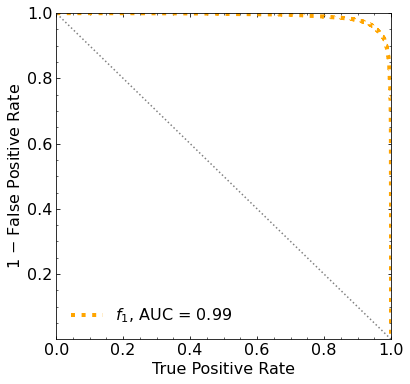

Classification score:


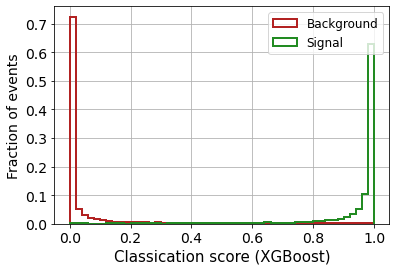


 ROC-AUC =  0.9905477048208217
At least 5 B events per bin, range = [[0, 1]]:
# bins:  10 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  10
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6815


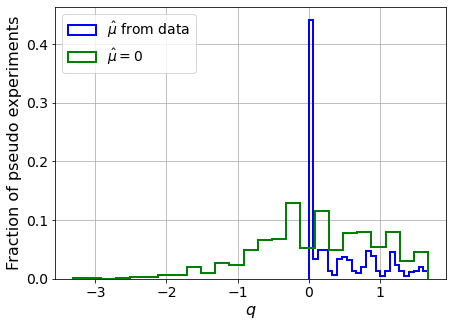

muhat mean:  0.2787273888241269
Z_bins:  0.41060224166718434
std Z_bins:  0.6101128222262929
Z_bins mu=0:  0.39059851226875336
std Z_bins mu=0:  1.1052430367991855

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6765


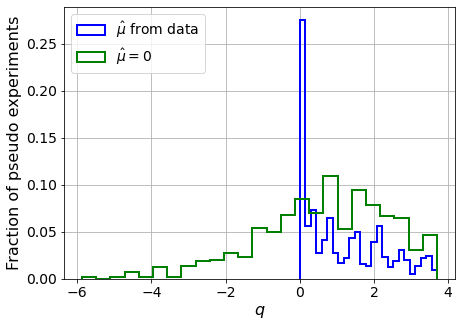

muhat mean:  0.17591636000124344
Z_bins:  0.8956314163002211
std Z_bins:  0.6049510063079162
Z_bins mu=0:  0.886812982335746
std Z_bins mu=0:  0.9870736797578252

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.68


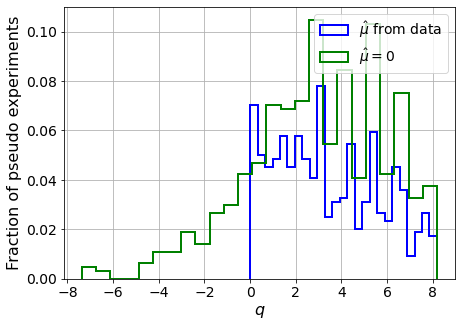

muhat mean:  0.06846025845635328
Z_bins:  1.7625335222913332
std Z_bins:  0.636730347289492
Z_bins mu=0:  1.7589870917210342
std Z_bins mu=0:  0.8438397604445342

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.684


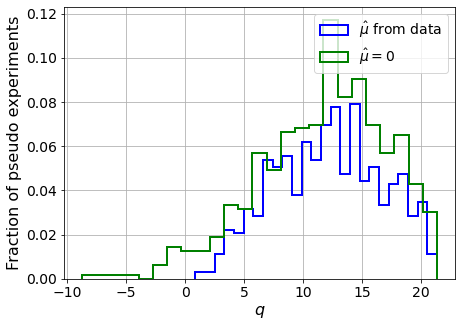

muhat mean:  0.03475710462674104
Z_bins:  3.505245793583548
std Z_bins:  0.6473299574360214
Z_bins mu=0:  3.5039350947406476
std Z_bins mu=0:  0.7693412253671071

--------

B_expected:  643
S_expected:  39

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6765


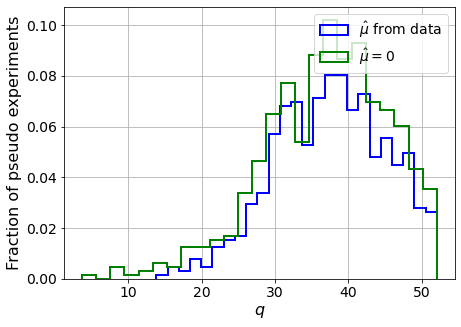

muhat mean:  0.017948291403341178
Z_bins:  6.143679347741969
std Z_bins:  0.6115461478989832
Z_bins mu=0:  6.142492506670455
std Z_bins mu=0:  0.6858883909993077

--------

B_expected:  643
S_expected:  83

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.661


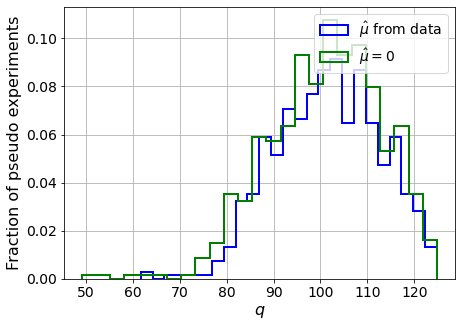

muhat mean:  0.009184781023317235
Z_bins:  10.082504742036539
std Z_bins:  0.5455440868877325
Z_bins mu=0:  10.077709739937948
std Z_bins mu=0:  0.5871026631250702

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6845


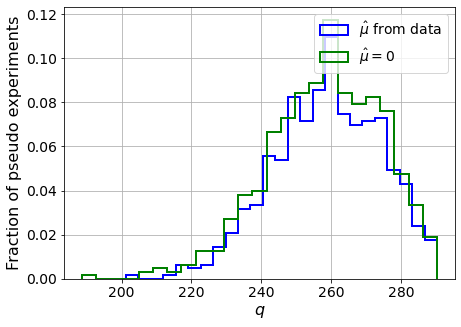

muhat mean:  0.004152926834212205
Z_bins:  16.11521131007964
std Z_bins:  0.47437153682830696
Z_bins mu=0:  16.11435520574346
std Z_bins mu=0:  0.501159301288843

--------

B_expected:  643
S_expected:  385

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.684


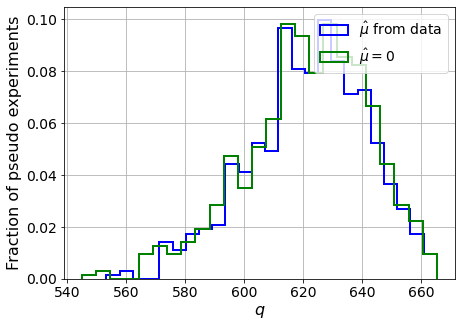

muhat mean:  0.0015989674231299178
Z_bins:  24.96289102272717
std Z_bins:  0.3994323407913963
Z_bins mu=0:  24.962744162235815
std Z_bins mu=0:  0.41654822308096157

--------

B_expected:  643
S_expected:  830

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.661


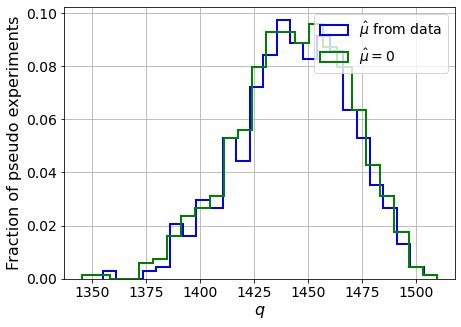

muhat mean:  0.0004659390374271235
Z_bins:  38.01390388593979
std Z_bins:  0.3370765139385342
Z_bins mu=0:  38.01378118795385
std Z_bins mu=0:  0.345841358572317

--------

B_expected:  643
S_expected:  1787

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.6895


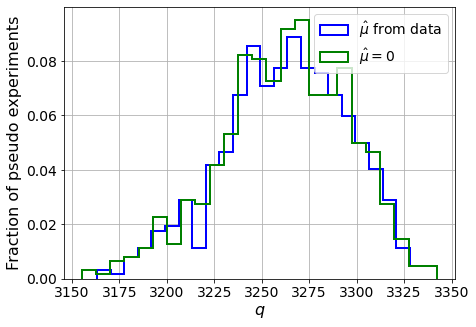

muhat mean:  0.00024463492801502504
Z_bins:  57.13471793052637
std Z_bins:  0.2887350788595462
Z_bins mu=0:  57.13471793052637
std Z_bins mu=0:  0.2948393250304371

--------


 FINAL RESULT:

[[0.41060224166718434, 0.6101128222262929, 0.2787273888241269, 0.39059851226875336, 1.1052430367991855], [0.8956314163002211, 0.6049510063079162, 0.17591636000124344, 0.886812982335746, 0.9870736797578252], [1.7625335222913332, 0.636730347289492, 0.06846025845635328, 1.7589870917210342, 0.8438397604445342], [3.505245793583548, 0.6473299574360214, 0.03475710462674104, 3.5039350947406476, 0.7693412253671071], [6.143679347741969, 0.6115461478989832, 0.017948291403341178, 6.142492506670455, 0.6858883909993077], [10.082504742036539, 0.5455440868877325, 0.009184781023317235, 10.077709739937948, 0.5871026631250702], [16.11521131007964, 0.47437153682830696, 0.004152926834212205, 16.11435520574346, 0.501159301288843], [24.96289102272717, 0.3994323407913963, 0.0015989674231299178, 24.962744162235815, 0.4165

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 389.57677718 331.96528942 270.56013372
 204.35347312 135.44067482  65.35332268 -10.86703461 -90.73308393]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 301.61189701 251.69086564
 195

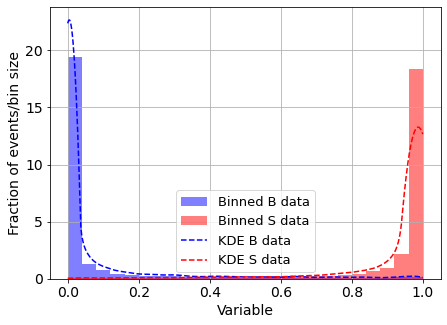

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



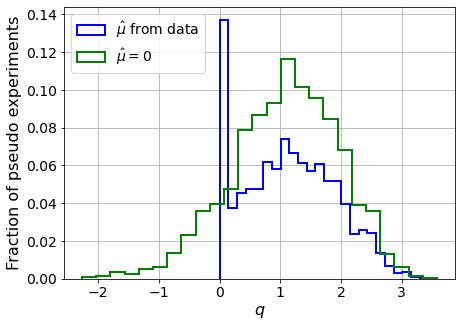

muhat mean:  -2.064943577152352
Z_bins:  1.0646479485833509
std Z_bins:  0.3584282576994925
Z_bins mu=0:  1.0646479485833509
std Z_bins mu=0:  0.41309514643773815

--------

B_expected:  643
S_expected:  4



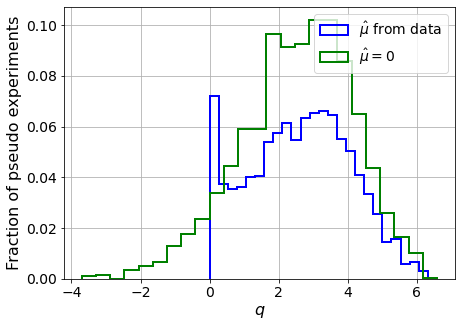

muhat mean:  -0.9429381360096563
Z_bins:  1.6357893804725652
std Z_bins:  0.4487665526169292
Z_bins mu=0:  1.6357893804725652
std Z_bins mu=0:  0.4966903156189254

--------

B_expected:  643
S_expected:  8



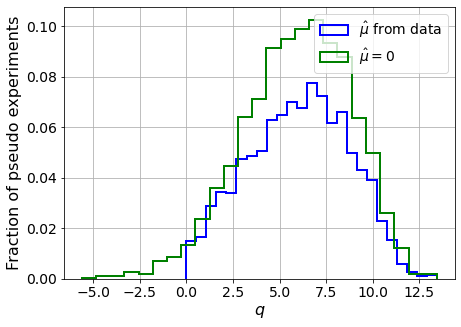

muhat mean:  -0.4858474724601112
Z_bins:  2.473831928255321
std Z_bins:  0.5421060203126611
Z_bins mu=0:  2.473831928255321
std Z_bins mu=0:  0.5782670779601855

--------

B_expected:  643
S_expected:  18



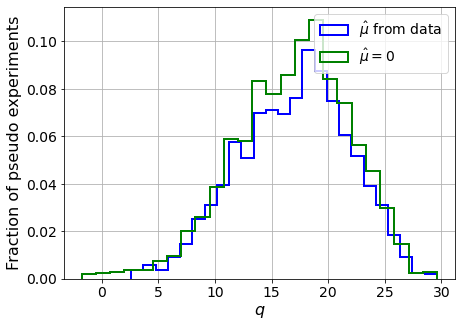

muhat mean:  -0.20879735809365144
Z_bins:  4.168658545580527
std Z_bins:  0.5835108166014924
Z_bins mu=0:  4.168658545580527
std Z_bins mu=0:  0.6067918378208889

--------

B_expected:  643
S_expected:  39



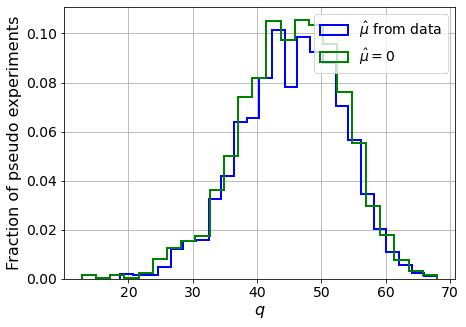

muhat mean:  -0.10122399663002847
Z_bins:  6.764554258507405
std Z_bins:  0.5773807209978121
Z_bins mu=0:  6.764554258507405
std Z_bins mu=0:  0.5907202612823298

--------

B_expected:  643
S_expected:  83



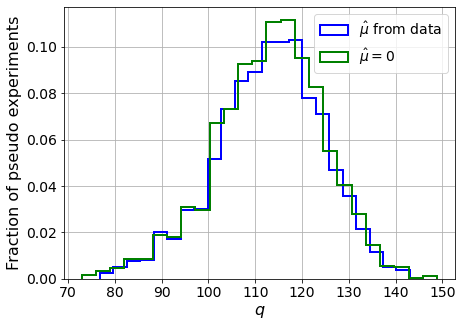

muhat mean:  -0.04749395304581301
Z_bins:  10.66539264902128
std Z_bins:  0.5354306213729654
Z_bins mu=0:  10.66539264902128
std Z_bins mu=0:  0.5438998678411111

--------

B_expected:  643
S_expected:  179



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


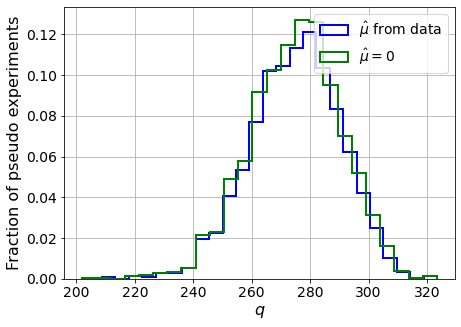

muhat mean:  -0.021203076546574304
Z_bins:  16.601722090730895
std Z_bins:  0.46579616924416084
Z_bins mu=0:  16.601722090730895
std Z_bins mu=0:  0.4704042678906053

--------

B_expected:  643
S_expected:  385



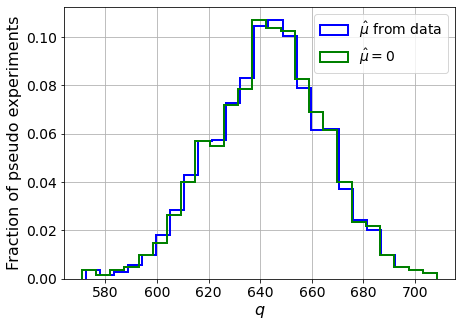

muhat mean:  -0.010206737082918306
Z_bins:  25.374493374274017
std Z_bins:  0.4316707522364313
Z_bins mu=0:  25.374493374274017
std Z_bins mu=0:  0.4342492565856913

--------

B_expected:  643
S_expected:  830



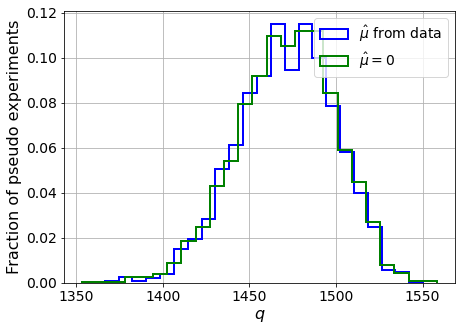

muhat mean:  -0.004628604638462245
Z_bins:  38.36903936461541
std Z_bins:  0.36542071842688306
Z_bins mu=0:  38.36903936461541
std Z_bins mu=0:  0.3671599205774869

--------

B_expected:  643
S_expected:  1787



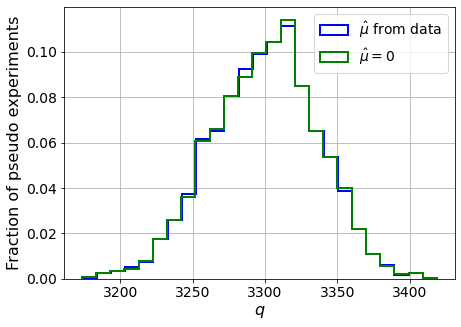

muhat mean:  -0.0024233310333831443
Z_bins:  57.45938386716302
std Z_bins:  0.31899502961788917
Z_bins mu=0:  57.45938386716302
std Z_bins mu=0:  0.32032286342106414

--------


 FINAL RESULT:

[[1.0646479485833509, 0.3584282576994925, -2.064943577152352, 1.0646479485833509, 0.41309514643773815], [1.6357893804725652, 0.4487665526169292, -0.9429381360096563, 1.6357893804725652, 0.4966903156189254], [2.473831928255321, 0.5421060203126611, -0.4858474724601112, 2.473831928255321, 0.5782670779601855], [4.168658545580527, 0.5835108166014924, -0.20879735809365144, 4.168658545580527, 0.6067918378208889], [6.764554258507405, 0.5773807209978121, -0.10122399663002847, 6.764554258507405, 0.5907202612823298], [10.66539264902128, 0.5354306213729654, -0.04749395304581301, 10.66539264902128, 0.5438998678411111], [16.601722090730895, 0.46579616924416084, -0.021203076546574304, 16.601722090730895, 0.4704042678906053], [25.374493374274017, 0.4316707522364313, -0.010206737082918306, 25.374493374274017, 0.

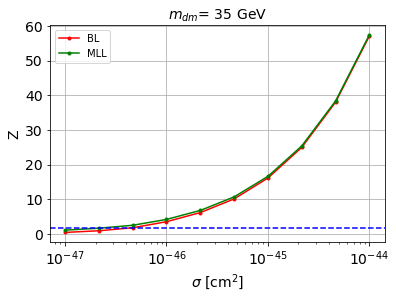


cross_BL_164:  4.164388018547998e-47
cross_BL_164_up:  2.4268628526436137e-47
cross_BL_164_down:  5.8293530394912795e-47

cross_MLL_164:  2.162758944728191e-47
cross_MLL_164_up:  1.2862115111904193e-47
cross_MLL_164_down:  3.436279580475698e-47

#########################


#########################

mDM =  50 GeV


S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)
 NUM_DAT:  31106 

NUM_DAT_ER:  30709
NUM_DAT_AC:  109
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  258

B_pbot.shape:  (31106,)
B_ptop.shape:  (31106,)
B_ppeakS1.shape : (31106, 8)
B_ppeakS2.shape:  (31106, 8)

S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)


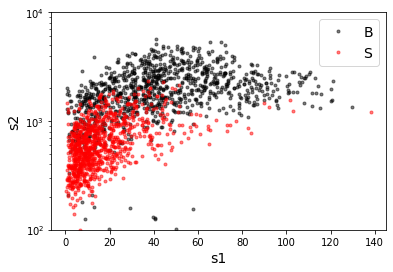

B_pdiffT.shape:  (31106,)
S_pdiffT.shape:  (31106,)


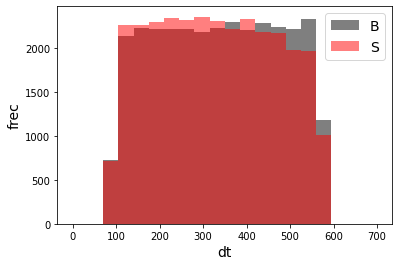

B_pbot.shape:  (31106,)
B_ptop.shape:  (31106,)
B_ppeakS1.shape : (31106, 7)
B_ppeakS2.shape:  (31106, 7)
S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 7)
S_ppeakS2.shape:  (31106, 7)
X_mon_B.shape:  (31106, 17)
X_mon_S.shape:  (31106, 17)
X_mon.shape:  (62212, 17)

X_mon_train :  (39660, 17)
y_mon_train :  (39660,)
X_mon_val :  (6999, 17)
y_mon_val :  (6999,)
X_mon_test :  (15553, 17)
y_mon_test :  (15553,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68589	validation_1-logloss:0.68588
[1]	validation_0-logloss:0.67880	validation_1-logloss:0.67878
[2]	validation_0-logloss:0.67183	validation_1-logloss:0.67182
[3]	validation_0-logloss:0.66501	validation_1-logloss:0.66498
[4]	validation_0-logloss:0.65831	validation_1-logloss:0.65830
[5]	validation_0-logloss:0.65173	validation_1-logloss:0.65172
[6]	validation_0-logloss:0.64529	validation_1-logloss:0.64526
[7]	validation_0-logloss:0.63897	validation_1-logloss:0.63893
[8]	validation_0-logloss:0.63274	validation_1-logloss:0.63269
[9]	validation_0-logloss:0.62666	validation_1-logloss:0.62659
[10]	validation_0-logloss:0.62068	validation_1-logloss:0.62060
[11]	validation_0-logloss:0.61481	validation_1-logloss:0.61472
[12]	validation_0-logloss:0.60901	validation_1-logloss:0.60893
[13]	validation_0-logloss:0.60334	validation_1-logloss:0.60327
[14]	validation_0-logloss:0.59774	validation_1-logloss:0.59769
[15]	validation_0-logloss:0.59228	validation_1-logloss:0.59222
[1

[130]	validation_0-logloss:0.28272	validation_1-logloss:0.28229
[131]	validation_0-logloss:0.28148	validation_1-logloss:0.28108
[132]	validation_0-logloss:0.28028	validation_1-logloss:0.27987
[133]	validation_0-logloss:0.27904	validation_1-logloss:0.27864
[134]	validation_0-logloss:0.27780	validation_1-logloss:0.27741
[135]	validation_0-logloss:0.27657	validation_1-logloss:0.27617
[136]	validation_0-logloss:0.27541	validation_1-logloss:0.27503
[137]	validation_0-logloss:0.27421	validation_1-logloss:0.27384
[138]	validation_0-logloss:0.27305	validation_1-logloss:0.27266
[139]	validation_0-logloss:0.27187	validation_1-logloss:0.27151
[140]	validation_0-logloss:0.27069	validation_1-logloss:0.27035
[141]	validation_0-logloss:0.26952	validation_1-logloss:0.26920
[142]	validation_0-logloss:0.26836	validation_1-logloss:0.26804
[143]	validation_0-logloss:0.26720	validation_1-logloss:0.26689
[144]	validation_0-logloss:0.26613	validation_1-logloss:0.26583
[145]	validation_0-logloss:0.26507	valid

[259]	validation_0-logloss:0.18981	validation_1-logloss:0.19049
[260]	validation_0-logloss:0.18945	validation_1-logloss:0.19014
[261]	validation_0-logloss:0.18906	validation_1-logloss:0.18978
[262]	validation_0-logloss:0.18869	validation_1-logloss:0.18939
[263]	validation_0-logloss:0.18831	validation_1-logloss:0.18902
[264]	validation_0-logloss:0.18796	validation_1-logloss:0.18868
[265]	validation_0-logloss:0.18758	validation_1-logloss:0.18835
[266]	validation_0-logloss:0.18722	validation_1-logloss:0.18801
[267]	validation_0-logloss:0.18684	validation_1-logloss:0.18765
[268]	validation_0-logloss:0.18649	validation_1-logloss:0.18733
[269]	validation_0-logloss:0.18615	validation_1-logloss:0.18701
[270]	validation_0-logloss:0.18581	validation_1-logloss:0.18669
[271]	validation_0-logloss:0.18546	validation_1-logloss:0.18638
[272]	validation_0-logloss:0.18513	validation_1-logloss:0.18609
[273]	validation_0-logloss:0.18481	validation_1-logloss:0.18579
[274]	validation_0-logloss:0.18446	valid

[388]	validation_0-logloss:0.15906	validation_1-logloss:0.16214
[389]	validation_0-logloss:0.15891	validation_1-logloss:0.16200
[390]	validation_0-logloss:0.15876	validation_1-logloss:0.16190
[391]	validation_0-logloss:0.15861	validation_1-logloss:0.16178
[392]	validation_0-logloss:0.15843	validation_1-logloss:0.16163
[393]	validation_0-logloss:0.15828	validation_1-logloss:0.16148
[394]	validation_0-logloss:0.15814	validation_1-logloss:0.16136
[395]	validation_0-logloss:0.15800	validation_1-logloss:0.16126
[396]	validation_0-logloss:0.15787	validation_1-logloss:0.16114
[397]	validation_0-logloss:0.15773	validation_1-logloss:0.16102
[398]	validation_0-logloss:0.15758	validation_1-logloss:0.16090
[399]	validation_0-logloss:0.15746	validation_1-logloss:0.16082
[400]	validation_0-logloss:0.15734	validation_1-logloss:0.16071
[401]	validation_0-logloss:0.15720	validation_1-logloss:0.16059
[402]	validation_0-logloss:0.15703	validation_1-logloss:0.16045
[403]	validation_0-logloss:0.15689	valid

[517]	validation_0-logloss:0.14465	validation_1-logloss:0.15062
[518]	validation_0-logloss:0.14455	validation_1-logloss:0.15055
[519]	validation_0-logloss:0.14449	validation_1-logloss:0.15052
[520]	validation_0-logloss:0.14441	validation_1-logloss:0.15044
[521]	validation_0-logloss:0.14431	validation_1-logloss:0.15034
[522]	validation_0-logloss:0.14423	validation_1-logloss:0.15027
[523]	validation_0-logloss:0.14416	validation_1-logloss:0.15021
[524]	validation_0-logloss:0.14406	validation_1-logloss:0.15013
[525]	validation_0-logloss:0.14398	validation_1-logloss:0.15007
[526]	validation_0-logloss:0.14389	validation_1-logloss:0.15000
[527]	validation_0-logloss:0.14383	validation_1-logloss:0.14996
[528]	validation_0-logloss:0.14375	validation_1-logloss:0.14990
[529]	validation_0-logloss:0.14368	validation_1-logloss:0.14983
[530]	validation_0-logloss:0.14359	validation_1-logloss:0.14976
[531]	validation_0-logloss:0.14350	validation_1-logloss:0.14969
[532]	validation_0-logloss:0.14340	valid

[646]	validation_0-logloss:0.13639	validation_1-logloss:0.14506
[647]	validation_0-logloss:0.13636	validation_1-logloss:0.14505
[648]	validation_0-logloss:0.13629	validation_1-logloss:0.14502
[649]	validation_0-logloss:0.13624	validation_1-logloss:0.14499
[650]	validation_0-logloss:0.13620	validation_1-logloss:0.14496
[651]	validation_0-logloss:0.13616	validation_1-logloss:0.14493
[652]	validation_0-logloss:0.13611	validation_1-logloss:0.14490
[653]	validation_0-logloss:0.13605	validation_1-logloss:0.14487
[654]	validation_0-logloss:0.13599	validation_1-logloss:0.14482
[655]	validation_0-logloss:0.13593	validation_1-logloss:0.14480
[656]	validation_0-logloss:0.13590	validation_1-logloss:0.14477
[657]	validation_0-logloss:0.13584	validation_1-logloss:0.14475
[658]	validation_0-logloss:0.13579	validation_1-logloss:0.14470
[659]	validation_0-logloss:0.13574	validation_1-logloss:0.14470
[660]	validation_0-logloss:0.13569	validation_1-logloss:0.14469
[661]	validation_0-logloss:0.13564	valid

[775]	validation_0-logloss:0.13097	validation_1-logloss:0.14258
[776]	validation_0-logloss:0.13093	validation_1-logloss:0.14257
[777]	validation_0-logloss:0.13091	validation_1-logloss:0.14254
[778]	validation_0-logloss:0.13086	validation_1-logloss:0.14252
[779]	validation_0-logloss:0.13081	validation_1-logloss:0.14250
[780]	validation_0-logloss:0.13079	validation_1-logloss:0.14250
[781]	validation_0-logloss:0.13076	validation_1-logloss:0.14249
[782]	validation_0-logloss:0.13070	validation_1-logloss:0.14247
[783]	validation_0-logloss:0.13068	validation_1-logloss:0.14245
[784]	validation_0-logloss:0.13065	validation_1-logloss:0.14245
[785]	validation_0-logloss:0.13063	validation_1-logloss:0.14244
[786]	validation_0-logloss:0.13059	validation_1-logloss:0.14243
[787]	validation_0-logloss:0.13057	validation_1-logloss:0.14242
[788]	validation_0-logloss:0.13053	validation_1-logloss:0.14240
[789]	validation_0-logloss:0.13050	validation_1-logloss:0.14239
[790]	validation_0-logloss:0.13048	valid

[904]	validation_0-logloss:0.12698	validation_1-logloss:0.14087
[905]	validation_0-logloss:0.12696	validation_1-logloss:0.14085
[906]	validation_0-logloss:0.12693	validation_1-logloss:0.14086
[907]	validation_0-logloss:0.12690	validation_1-logloss:0.14085
[908]	validation_0-logloss:0.12688	validation_1-logloss:0.14085
[909]	validation_0-logloss:0.12684	validation_1-logloss:0.14083
[910]	validation_0-logloss:0.12681	validation_1-logloss:0.14082
[911]	validation_0-logloss:0.12680	validation_1-logloss:0.14082
[912]	validation_0-logloss:0.12677	validation_1-logloss:0.14082
[913]	validation_0-logloss:0.12675	validation_1-logloss:0.14081
[914]	validation_0-logloss:0.12671	validation_1-logloss:0.14080
[915]	validation_0-logloss:0.12667	validation_1-logloss:0.14079
[916]	validation_0-logloss:0.12665	validation_1-logloss:0.14078
[917]	validation_0-logloss:0.12662	validation_1-logloss:0.14078
[918]	validation_0-logloss:0.12660	validation_1-logloss:0.14077
[919]	validation_0-logloss:0.12657	valid

[1032]	validation_0-logloss:0.12380	validation_1-logloss:0.14005
[1033]	validation_0-logloss:0.12376	validation_1-logloss:0.14005
[1034]	validation_0-logloss:0.12375	validation_1-logloss:0.14005
[1035]	validation_0-logloss:0.12373	validation_1-logloss:0.14004
[1036]	validation_0-logloss:0.12370	validation_1-logloss:0.14003
[1037]	validation_0-logloss:0.12368	validation_1-logloss:0.14002
[1038]	validation_0-logloss:0.12366	validation_1-logloss:0.14001
[1039]	validation_0-logloss:0.12364	validation_1-logloss:0.14001
[1040]	validation_0-logloss:0.12362	validation_1-logloss:0.14000
[1041]	validation_0-logloss:0.12361	validation_1-logloss:0.14001
[1042]	validation_0-logloss:0.12358	validation_1-logloss:0.14000
[1043]	validation_0-logloss:0.12354	validation_1-logloss:0.13998
[1044]	validation_0-logloss:0.12352	validation_1-logloss:0.13998
[1045]	validation_0-logloss:0.12351	validation_1-logloss:0.13998
[1046]	validation_0-logloss:0.12349	validation_1-logloss:0.13998
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.12093	validation_1-logloss:0.13937
[1160]	validation_0-logloss:0.12090	validation_1-logloss:0.13935
[1161]	validation_0-logloss:0.12088	validation_1-logloss:0.13935
[1162]	validation_0-logloss:0.12085	validation_1-logloss:0.13935
[1163]	validation_0-logloss:0.12084	validation_1-logloss:0.13935
[1164]	validation_0-logloss:0.12082	validation_1-logloss:0.13934
[1165]	validation_0-logloss:0.12080	validation_1-logloss:0.13933
[1166]	validation_0-logloss:0.12077	validation_1-logloss:0.13933
[1167]	validation_0-logloss:0.12076	validation_1-logloss:0.13932
[1168]	validation_0-logloss:0.12075	validation_1-logloss:0.13933
[1169]	validation_0-logloss:0.12071	validation_1-logloss:0.13931
[1170]	validation_0-logloss:0.12069	validation_1-logloss:0.13931
[1171]	validation_0-logloss:0.12068	validation_1-logloss:0.13930
[1172]	validation_0-logloss:0.12064	validation_1-logloss:0.13929
[1173]	validation_0-logloss:0.12062	validation_1-logloss:0.13929
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.11826	validation_1-logloss:0.13885
[1287]	validation_0-logloss:0.11825	validation_1-logloss:0.13886
[1288]	validation_0-logloss:0.11822	validation_1-logloss:0.13885
[1289]	validation_0-logloss:0.11820	validation_1-logloss:0.13884
[1290]	validation_0-logloss:0.11819	validation_1-logloss:0.13884
[1291]	validation_0-logloss:0.11818	validation_1-logloss:0.13884
[1292]	validation_0-logloss:0.11816	validation_1-logloss:0.13883
[1293]	validation_0-logloss:0.11813	validation_1-logloss:0.13882
[1294]	validation_0-logloss:0.11811	validation_1-logloss:0.13882
[1295]	validation_0-logloss:0.11809	validation_1-logloss:0.13881
[1296]	validation_0-logloss:0.11807	validation_1-logloss:0.13881
[1297]	validation_0-logloss:0.11806	validation_1-logloss:0.13881
[1298]	validation_0-logloss:0.11804	validation_1-logloss:0.13880
[1299]	validation_0-logloss:0.11803	validation_1-logloss:0.13880
[1300]	validation_0-logloss:0.11801	validation_1-logloss:0.13878
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.11592	validation_1-logloss:0.13853
[1414]	validation_0-logloss:0.11591	validation_1-logloss:0.13852
[1415]	validation_0-logloss:0.11589	validation_1-logloss:0.13852
[1416]	validation_0-logloss:0.11586	validation_1-logloss:0.13851
[1417]	validation_0-logloss:0.11585	validation_1-logloss:0.13851
[1418]	validation_0-logloss:0.11583	validation_1-logloss:0.13849
[1419]	validation_0-logloss:0.11582	validation_1-logloss:0.13850
[1420]	validation_0-logloss:0.11580	validation_1-logloss:0.13850
[1421]	validation_0-logloss:0.11579	validation_1-logloss:0.13850
[1422]	validation_0-logloss:0.11577	validation_1-logloss:0.13850
[1423]	validation_0-logloss:0.11576	validation_1-logloss:0.13850
[1424]	validation_0-logloss:0.11574	validation_1-logloss:0.13849
[1425]	validation_0-logloss:0.11572	validation_1-logloss:0.13849
[1426]	validation_0-logloss:0.11571	validation_1-logloss:0.13849
[1427]	validation_0-logloss:0.11569	validation_1-logloss:0.13848
[1428]	validation_0-loglo

[1540]	validation_0-logloss:0.11372	validation_1-logloss:0.13819
[1541]	validation_0-logloss:0.11371	validation_1-logloss:0.13819
[1542]	validation_0-logloss:0.11370	validation_1-logloss:0.13819
[1543]	validation_0-logloss:0.11368	validation_1-logloss:0.13819
[1544]	validation_0-logloss:0.11367	validation_1-logloss:0.13818
[1545]	validation_0-logloss:0.11366	validation_1-logloss:0.13818
[1546]	validation_0-logloss:0.11365	validation_1-logloss:0.13818
[1547]	validation_0-logloss:0.11364	validation_1-logloss:0.13819
[1548]	validation_0-logloss:0.11362	validation_1-logloss:0.13818
[1549]	validation_0-logloss:0.11361	validation_1-logloss:0.13819
[1550]	validation_0-logloss:0.11360	validation_1-logloss:0.13818
[1551]	validation_0-logloss:0.11359	validation_1-logloss:0.13818
[1552]	validation_0-logloss:0.11357	validation_1-logloss:0.13818
[1553]	validation_0-logloss:0.11356	validation_1-logloss:0.13818
[1554]	validation_0-logloss:0.11354	validation_1-logloss:0.13818
[1555]	validation_0-loglo

[1667]	validation_0-logloss:0.11163	validation_1-logloss:0.13788
[1668]	validation_0-logloss:0.11161	validation_1-logloss:0.13788
[1669]	validation_0-logloss:0.11160	validation_1-logloss:0.13788
[1670]	validation_0-logloss:0.11159	validation_1-logloss:0.13788
[1671]	validation_0-logloss:0.11157	validation_1-logloss:0.13787
[1672]	validation_0-logloss:0.11156	validation_1-logloss:0.13787
[1673]	validation_0-logloss:0.11155	validation_1-logloss:0.13786
[1674]	validation_0-logloss:0.11153	validation_1-logloss:0.13786
[1675]	validation_0-logloss:0.11152	validation_1-logloss:0.13786
[1676]	validation_0-logloss:0.11150	validation_1-logloss:0.13786
[1677]	validation_0-logloss:0.11148	validation_1-logloss:0.13786
[1678]	validation_0-logloss:0.11146	validation_1-logloss:0.13786
[1679]	validation_0-logloss:0.11145	validation_1-logloss:0.13785
[1680]	validation_0-logloss:0.11144	validation_1-logloss:0.13785
[1681]	validation_0-logloss:0.11142	validation_1-logloss:0.13786
[1682]	validation_0-loglo

[1794]	validation_0-logloss:0.10956	validation_1-logloss:0.13774
[1795]	validation_0-logloss:0.10953	validation_1-logloss:0.13773
[1796]	validation_0-logloss:0.10950	validation_1-logloss:0.13772
[1797]	validation_0-logloss:0.10950	validation_1-logloss:0.13772
[1798]	validation_0-logloss:0.10948	validation_1-logloss:0.13773
[1799]	validation_0-logloss:0.10947	validation_1-logloss:0.13773
[1800]	validation_0-logloss:0.10946	validation_1-logloss:0.13773
[1801]	validation_0-logloss:0.10944	validation_1-logloss:0.13772
[1802]	validation_0-logloss:0.10942	validation_1-logloss:0.13773
[1803]	validation_0-logloss:0.10940	validation_1-logloss:0.13773
[1804]	validation_0-logloss:0.10939	validation_1-logloss:0.13773
[1805]	validation_0-logloss:0.10938	validation_1-logloss:0.13773
[1806]	validation_0-logloss:0.10937	validation_1-logloss:0.13772
[1807]	validation_0-logloss:0.10935	validation_1-logloss:0.13772
[1808]	validation_0-logloss:0.10934	validation_1-logloss:0.13772
[1809]	validation_0-loglo

[1921]	validation_0-logloss:0.10761	validation_1-logloss:0.13762
[1922]	validation_0-logloss:0.10760	validation_1-logloss:0.13762
[1923]	validation_0-logloss:0.10758	validation_1-logloss:0.13761
[1924]	validation_0-logloss:0.10756	validation_1-logloss:0.13761
[1925]	validation_0-logloss:0.10753	validation_1-logloss:0.13762
[1926]	validation_0-logloss:0.10752	validation_1-logloss:0.13762
[1927]	validation_0-logloss:0.10750	validation_1-logloss:0.13762
[1928]	validation_0-logloss:0.10748	validation_1-logloss:0.13762
[1929]	validation_0-logloss:0.10747	validation_1-logloss:0.13762
[1930]	validation_0-logloss:0.10746	validation_1-logloss:0.13762
[1931]	validation_0-logloss:0.10744	validation_1-logloss:0.13762
[1932]	validation_0-logloss:0.10743	validation_1-logloss:0.13762
[1933]	validation_0-logloss:0.10741	validation_1-logloss:0.13763
[1934]	validation_0-logloss:0.10738	validation_1-logloss:0.13762
[1935]	validation_0-logloss:0.10737	validation_1-logloss:0.13763
[1936]	validation_0-loglo

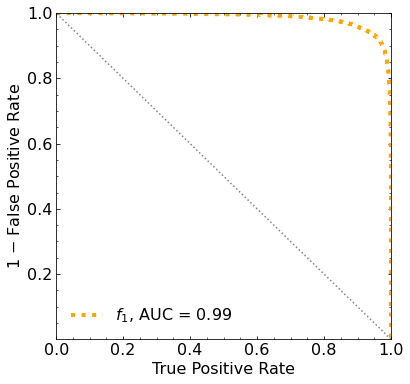

Classification score:


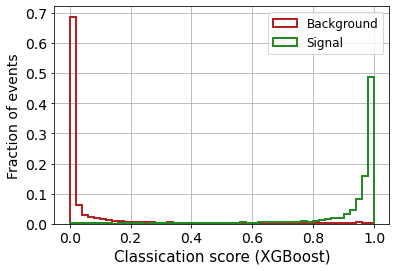


 ROC-AUC =  0.9852330411965198
At least 5 B events per bin, range = [[0, 1]]:
# bins:  14 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  14
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2775


/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


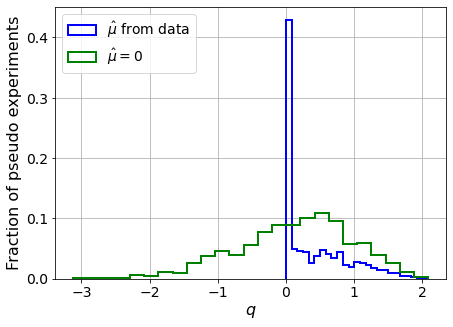

muhat mean:  0.1556270485154491
Z_bins:  0.46449761616874696
std Z_bins:  0.5257782663597361
Z_bins mu=0:  0.46449761616874696
std Z_bins mu=0:  0.9029518459405409

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.286


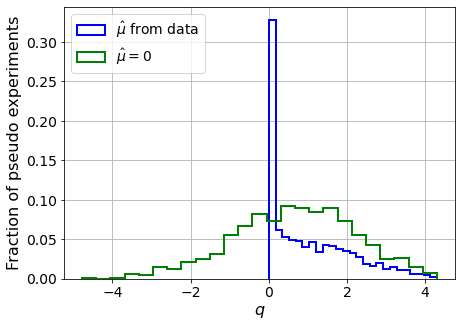

muhat mean:  0.05683798264442528
Z_bins:  0.8527033866417312
std Z_bins:  0.6204804996394366
Z_bins mu=0:  0.8526183624945943
std Z_bins mu=0:  0.9072422655079403

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.281


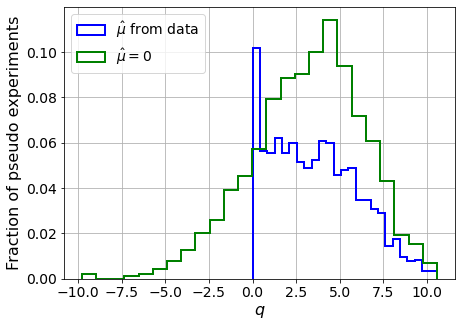

muhat mean:  0.003879468627517063
Z_bins:  1.8580804428943356
std Z_bins:  0.6647936592088342
Z_bins mu=0:  1.8580804428943356
std Z_bins mu=0:  0.8524169853797435

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.274


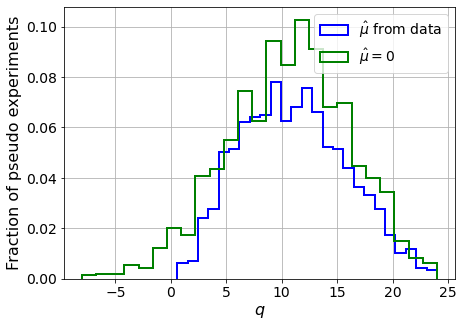

muhat mean:  0.01848633626709336
Z_bins:  3.3053991934716906
std Z_bins:  0.7151285919962802
Z_bins mu=0:  3.3045047505165304
std Z_bins mu=0:  0.8241376160523141

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.269


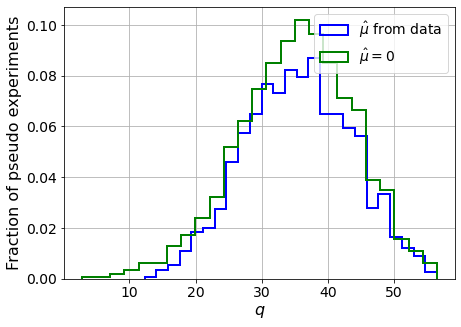

muhat mean:  0.001992279296900901
Z_bins:  5.96226262319527
std Z_bins:  0.6726151668702947
Z_bins mu=0:  5.96226039174961
std Z_bins mu=0:  0.7310860100835862

--------

B_expected:  643
S_expected:  89

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.272


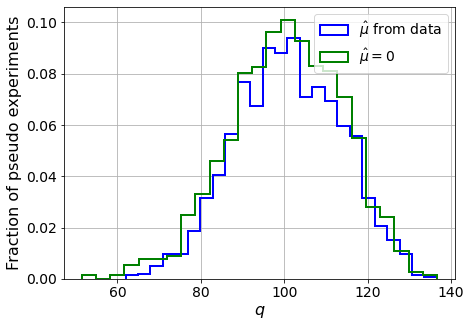

muhat mean:  0.002725609137829845
Z_bins:  10.042845456346557
std Z_bins:  0.629340816244818
Z_bins mu=0:  10.042785229789335
std Z_bins mu=0:  0.6660552062031816

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2935


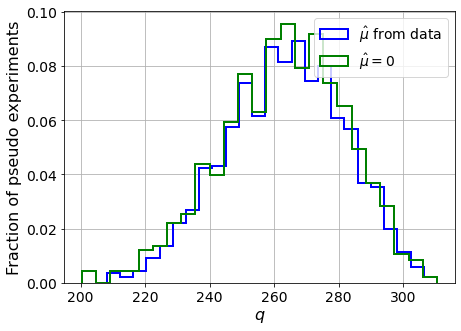

muhat mean:  0.0003300183926662066
Z_bins:  16.239845664386106
std Z_bins:  0.5668200363218955
Z_bins mu=0:  16.237073766085878
std Z_bins mu=0:  0.5905219143325778

--------

B_expected:  643
S_expected:  413

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2805


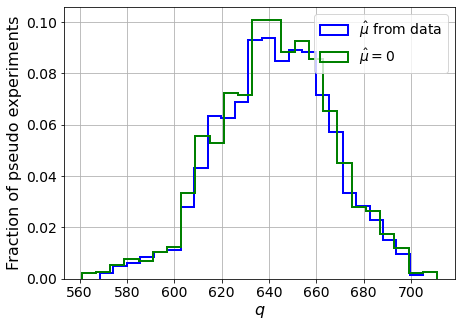

muhat mean:  0.00024364803632358285
Z_bins:  25.35489879565587
std Z_bins:  0.47216860050553267
Z_bins mu=0:  25.35487434097781
std Z_bins mu=0:  0.4851842400385213

--------

B_expected:  643
S_expected:  889

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2685


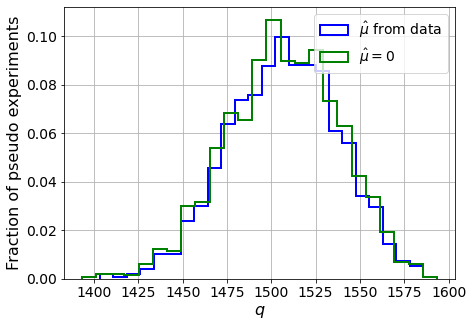

muhat mean:  0.000166143764091888
Z_bins:  38.81996526695638
std Z_bins:  0.3976999711916981
Z_bins mu=0:  38.81821085098608
std Z_bins mu=0:  0.4059877137950654

--------

B_expected:  643
S_expected:  1915

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.285


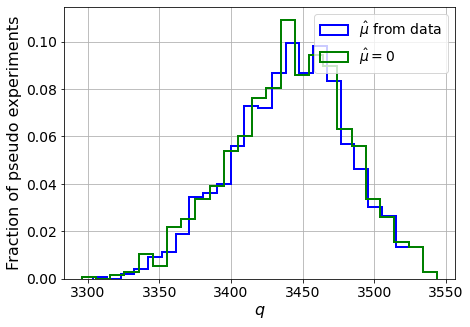

muhat mean:  6.207530343938452e-05
Z_bins:  58.672258888183336
std Z_bins:  0.34405681520331766
Z_bins mu=0:  58.67078811217752
std Z_bins mu=0:  0.34929364527838613

--------


 FINAL RESULT:

[[0.46449761616874696, 0.5257782663597361, 0.1556270485154491, 0.46449761616874696, 0.9029518459405409], [0.8527033866417312, 0.6204804996394366, 0.05683798264442528, 0.8526183624945943, 0.9072422655079403], [1.8580804428943356, 0.6647936592088342, 0.003879468627517063, 1.8580804428943356, 0.8524169853797435], [3.3053991934716906, 0.7151285919962802, 0.01848633626709336, 3.3045047505165304, 0.8241376160523141], [5.96226262319527, 0.6726151668702947, 0.001992279296900901, 5.96226039174961, 0.7310860100835862], [10.042845456346557, 0.629340816244818, 0.002725609137829845, 10.042785229789335, 0.6660552062031816], [16.239845664386106, 0.5668200363218955, 0.0003300183926662066, 16.237073766085878, 0.5905219143325778], [25.35489879565587, 0.47216860050553267, 0.00024364803632358285, 25.35487434097781,

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 381.56464964 338.66704439 286.92539339 232.54365831
 173.97548705 108.86629248  43.33497485 -28.95911879 -97.68259086]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 278.04861936 235.99468282
 184

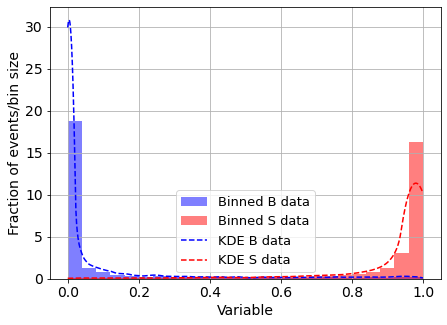

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



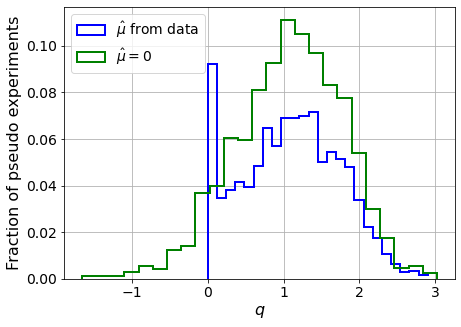

muhat mean:  -2.6635062009984565
Z_bins:  1.056776780234037
std Z_bins:  0.3074101479324244
Z_bins mu=0:  1.056776780234037
std Z_bins mu=0:  0.3338704729998018

--------

B_expected:  643
S_expected:  4



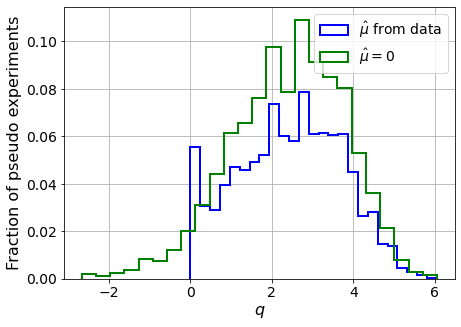

muhat mean:  -1.387189626943887
Z_bins:  1.5838951276805346
std Z_bins:  0.40639397706851144
Z_bins mu=0:  1.5838951276805346
std Z_bins mu=0:  0.43638873883784823

--------

B_expected:  643
S_expected:  9



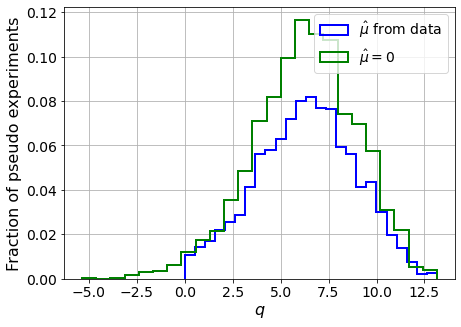

muhat mean:  -0.5981418261178213
Z_bins:  2.525715586734124
std Z_bins:  0.508923285873161
Z_bins mu=0:  2.525715586734124
std Z_bins mu=0:  0.5312205419797017

--------

B_expected:  643
S_expected:  19



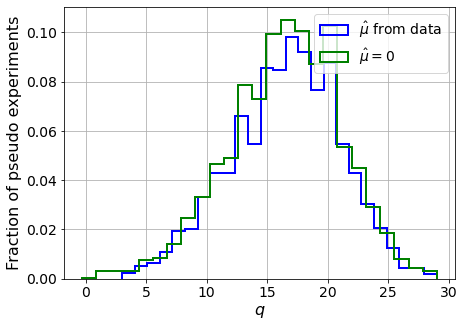

muhat mean:  -0.2972344983354722
Z_bins:  4.099399879787577
std Z_bins:  0.5514750594255516
Z_bins mu=0:  4.099399879787577
std Z_bins mu=0:  0.5633249285926935

--------

B_expected:  643
S_expected:  41



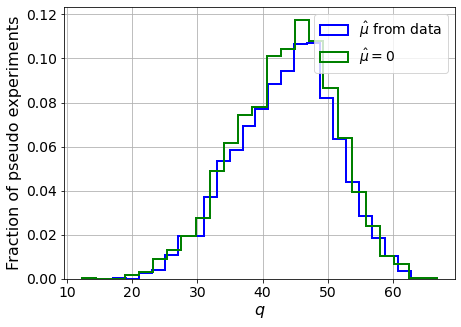

muhat mean:  -0.1390517749590524
Z_bins:  6.649955588504059
std Z_bins:  0.5741327003298393
Z_bins mu=0:  6.649955588504059
std Z_bins mu=0:  0.5804587340727491

--------

B_expected:  643
S_expected:  89



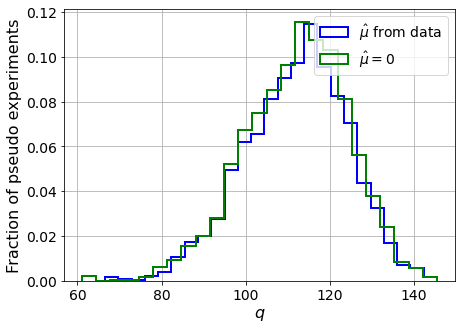

muhat mean:  -0.05922759096350536
Z_bins:  10.633060604629447
std Z_bins:  0.5709710222382165
Z_bins mu=0:  10.633060604629447
std Z_bins mu=0:  0.5775393405985123

--------

B_expected:  643
S_expected:  192



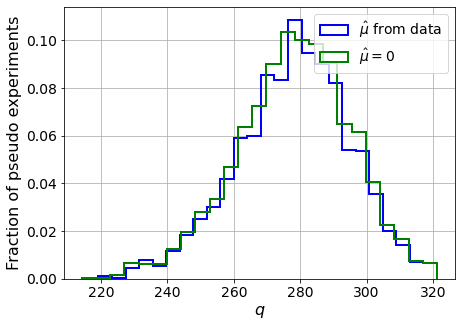

muhat mean:  -0.029796569620421386
Z_bins:  16.696269393587922
std Z_bins:  0.5107785595180708
Z_bins mu=0:  16.696269393587922
std Z_bins mu=0:  0.5138085719254544

--------

B_expected:  643
S_expected:  413



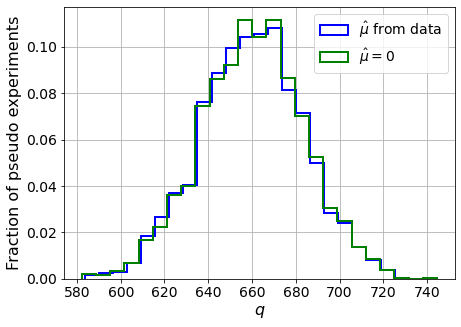

muhat mean:  -0.0130849105350761
Z_bins:  25.70118858842499
std Z_bins:  0.458291060028923
Z_bins mu=0:  25.70118858842499
std Z_bins mu=0:  0.45986246133496494

--------

B_expected:  643
S_expected:  889



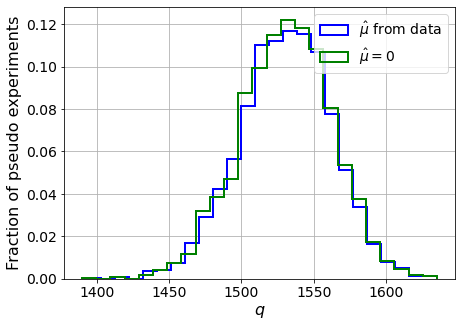

muhat mean:  -0.006021419419134353
Z_bins:  39.1294897177771
std Z_bins:  0.40765803323546895
Z_bins mu=0:  39.1294897177771
std Z_bins mu=0:  0.4090084969707243

--------

B_expected:  643
S_expected:  1915



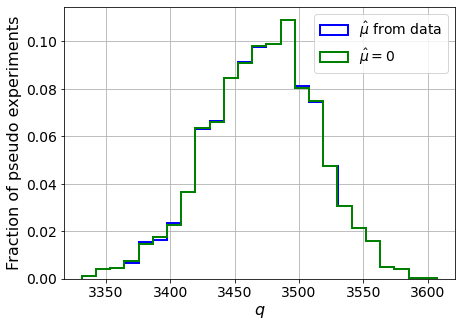

muhat mean:  -0.0029304396716573187
Z_bins:  58.94064561063537
std Z_bins:  0.359690997766939
Z_bins mu=0:  58.94064561063537
std Z_bins mu=0:  0.3605234087010216

--------


 FINAL RESULT:

[[1.056776780234037, 0.3074101479324244, -2.6635062009984565, 1.056776780234037, 0.3338704729998018], [1.5838951276805346, 0.40639397706851144, -1.387189626943887, 1.5838951276805346, 0.43638873883784823], [2.525715586734124, 0.508923285873161, -0.5981418261178213, 2.525715586734124, 0.5312205419797017], [4.099399879787577, 0.5514750594255516, -0.2972344983354722, 4.099399879787577, 0.5633249285926935], [6.649955588504059, 0.5741327003298393, -0.1390517749590524, 6.649955588504059, 0.5804587340727491], [10.633060604629447, 0.5709710222382165, -0.05922759096350536, 10.633060604629447, 0.5775393405985123], [16.696269393587922, 0.5107785595180708, -0.029796569620421386, 16.696269393587922, 0.5138085719254544], [25.70118858842499, 0.458291060028923, -0.0130849105350761, 25.70118858842499, 0.45986246133

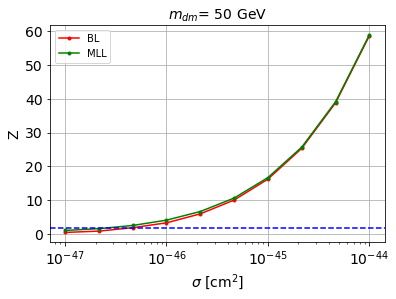


cross_BL_164:  3.929723302158781e-47
cross_BL_164_up:  2.4339208919402607e-47
cross_BL_164_down:  5.932757476475655e-47

cross_MLL_164:  2.255226791059627e-47
cross_MLL_164_up:  1.4023013522120133e-47
cross_MLL_164_down:  3.288664951450769e-47

#########################


#########################

mDM =  100 GeV


S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)
 NUM_DAT:  32010 

NUM_DAT_ER:  31600
NUM_DAT_AC:  113
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  266

B_pbot.shape:  (32010,)
B_ptop.shape:  (32010,)
B_ppeakS1.shape : (32010, 8)
B_ppeakS2.shape:  (32010, 8)

S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)


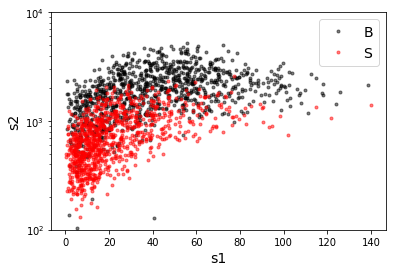

B_pdiffT.shape:  (32010,)
S_pdiffT.shape:  (32010,)


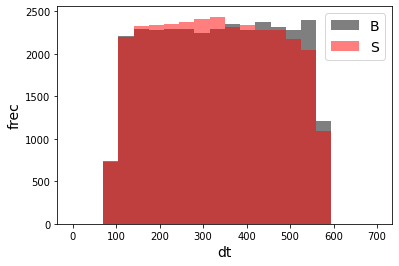

B_pbot.shape:  (32010,)
B_ptop.shape:  (32010,)
B_ppeakS1.shape : (32010, 7)
B_ppeakS2.shape:  (32010, 7)
S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 7)
S_ppeakS2.shape:  (32010, 7)
X_mon_B.shape:  (32010, 17)
X_mon_S.shape:  (32010, 17)
X_mon.shape:  (64020, 17)

X_mon_train :  (40812, 17)
y_mon_train :  (40812,)
X_mon_val :  (7203, 17)
y_mon_val :  (7203,)
X_mon_test :  (16005, 17)
y_mon_test :  (16005,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68645	validation_1-logloss:0.68655
[1]	validation_0-logloss:0.67990	validation_1-logloss:0.68007
[2]	validation_0-logloss:0.67345	validation_1-logloss:0.67372
[3]	validation_0-logloss:0.66712	validation_1-logloss:0.66748
[4]	validation_0-logloss:0.66086	validation_1-logloss:0.66131
[5]	validation_0-logloss:0.65478	validation_1-logloss:0.65532
[6]	validation_0-logloss:0.64879	validation_1-logloss:0.64939
[7]	validation_0-logloss:0.64295	validation_1-logloss:0.64362
[8]	validation_0-logloss:0.63714	validation_1-logloss:0.63788
[9]	validation_0-logloss:0.63147	validation_1-logloss:0.63227
[10]	validation_0-logloss:0.62592	validation_1-logloss:0.62682
[11]	validation_0-logloss:0.62047	validation_1-logloss:0.62141
[12]	validation_0-logloss:0.61512	validation_1-logloss:0.61611
[13]	validation_0-logloss:0.60988	validation_1-logloss:0.61096
[14]	validation_0-logloss:0.60470	validation_1-logloss:0.60583
[15]	validation_0-logloss:0.59963	validation_1-logloss:0.60077
[1

[130]	validation_0-logloss:0.30506	validation_1-logloss:0.31293
[131]	validation_0-logloss:0.30380	validation_1-logloss:0.31171
[132]	validation_0-logloss:0.30259	validation_1-logloss:0.31056
[133]	validation_0-logloss:0.30139	validation_1-logloss:0.30939
[134]	validation_0-logloss:0.30022	validation_1-logloss:0.30827
[135]	validation_0-logloss:0.29903	validation_1-logloss:0.30713
[136]	validation_0-logloss:0.29788	validation_1-logloss:0.30601
[137]	validation_0-logloss:0.29674	validation_1-logloss:0.30491
[138]	validation_0-logloss:0.29562	validation_1-logloss:0.30382
[139]	validation_0-logloss:0.29449	validation_1-logloss:0.30273
[140]	validation_0-logloss:0.29338	validation_1-logloss:0.30166
[141]	validation_0-logloss:0.29222	validation_1-logloss:0.30053
[142]	validation_0-logloss:0.29113	validation_1-logloss:0.29951
[143]	validation_0-logloss:0.29002	validation_1-logloss:0.29843
[144]	validation_0-logloss:0.28897	validation_1-logloss:0.29744
[145]	validation_0-logloss:0.28794	valid

[259]	validation_0-logloss:0.21304	validation_1-logloss:0.22434
[260]	validation_0-logloss:0.21263	validation_1-logloss:0.22395
[261]	validation_0-logloss:0.21225	validation_1-logloss:0.22358
[262]	validation_0-logloss:0.21183	validation_1-logloss:0.22318
[263]	validation_0-logloss:0.21147	validation_1-logloss:0.22284
[264]	validation_0-logloss:0.21110	validation_1-logloss:0.22249
[265]	validation_0-logloss:0.21075	validation_1-logloss:0.22216
[266]	validation_0-logloss:0.21038	validation_1-logloss:0.22182
[267]	validation_0-logloss:0.21001	validation_1-logloss:0.22145
[268]	validation_0-logloss:0.20965	validation_1-logloss:0.22113
[269]	validation_0-logloss:0.20930	validation_1-logloss:0.22078
[270]	validation_0-logloss:0.20893	validation_1-logloss:0.22045
[271]	validation_0-logloss:0.20856	validation_1-logloss:0.22011
[272]	validation_0-logloss:0.20823	validation_1-logloss:0.21980
[273]	validation_0-logloss:0.20786	validation_1-logloss:0.21943
[274]	validation_0-logloss:0.20753	valid

[388]	validation_0-logloss:0.18075	validation_1-logloss:0.19476
[389]	validation_0-logloss:0.18058	validation_1-logloss:0.19462
[390]	validation_0-logloss:0.18043	validation_1-logloss:0.19447
[391]	validation_0-logloss:0.18025	validation_1-logloss:0.19434
[392]	validation_0-logloss:0.18006	validation_1-logloss:0.19417
[393]	validation_0-logloss:0.17990	validation_1-logloss:0.19403
[394]	validation_0-logloss:0.17971	validation_1-logloss:0.19386
[395]	validation_0-logloss:0.17957	validation_1-logloss:0.19373
[396]	validation_0-logloss:0.17940	validation_1-logloss:0.19357
[397]	validation_0-logloss:0.17923	validation_1-logloss:0.19345
[398]	validation_0-logloss:0.17906	validation_1-logloss:0.19331
[399]	validation_0-logloss:0.17890	validation_1-logloss:0.19317
[400]	validation_0-logloss:0.17873	validation_1-logloss:0.19301
[401]	validation_0-logloss:0.17855	validation_1-logloss:0.19286
[402]	validation_0-logloss:0.17838	validation_1-logloss:0.19269
[403]	validation_0-logloss:0.17825	valid

[517]	validation_0-logloss:0.16413	validation_1-logloss:0.18161
[518]	validation_0-logloss:0.16405	validation_1-logloss:0.18154
[519]	validation_0-logloss:0.16395	validation_1-logloss:0.18147
[520]	validation_0-logloss:0.16388	validation_1-logloss:0.18142
[521]	validation_0-logloss:0.16378	validation_1-logloss:0.18134
[522]	validation_0-logloss:0.16367	validation_1-logloss:0.18126
[523]	validation_0-logloss:0.16357	validation_1-logloss:0.18119
[524]	validation_0-logloss:0.16347	validation_1-logloss:0.18111
[525]	validation_0-logloss:0.16338	validation_1-logloss:0.18107
[526]	validation_0-logloss:0.16329	validation_1-logloss:0.18102
[527]	validation_0-logloss:0.16320	validation_1-logloss:0.18093
[528]	validation_0-logloss:0.16309	validation_1-logloss:0.18087
[529]	validation_0-logloss:0.16299	validation_1-logloss:0.18081
[530]	validation_0-logloss:0.16289	validation_1-logloss:0.18075
[531]	validation_0-logloss:0.16283	validation_1-logloss:0.18071
[532]	validation_0-logloss:0.16274	valid

[646]	validation_0-logloss:0.15514	validation_1-logloss:0.17627
[647]	validation_0-logloss:0.15509	validation_1-logloss:0.17625
[648]	validation_0-logloss:0.15504	validation_1-logloss:0.17622
[649]	validation_0-logloss:0.15497	validation_1-logloss:0.17619
[650]	validation_0-logloss:0.15491	validation_1-logloss:0.17615
[651]	validation_0-logloss:0.15485	validation_1-logloss:0.17611
[652]	validation_0-logloss:0.15480	validation_1-logloss:0.17610
[653]	validation_0-logloss:0.15478	validation_1-logloss:0.17608
[654]	validation_0-logloss:0.15473	validation_1-logloss:0.17605
[655]	validation_0-logloss:0.15468	validation_1-logloss:0.17603
[656]	validation_0-logloss:0.15463	validation_1-logloss:0.17600
[657]	validation_0-logloss:0.15459	validation_1-logloss:0.17599
[658]	validation_0-logloss:0.15454	validation_1-logloss:0.17595
[659]	validation_0-logloss:0.15450	validation_1-logloss:0.17593
[660]	validation_0-logloss:0.15443	validation_1-logloss:0.17589
[661]	validation_0-logloss:0.15438	valid

[775]	validation_0-logloss:0.14912	validation_1-logloss:0.17353
[776]	validation_0-logloss:0.14908	validation_1-logloss:0.17351
[777]	validation_0-logloss:0.14904	validation_1-logloss:0.17351
[778]	validation_0-logloss:0.14901	validation_1-logloss:0.17349
[779]	validation_0-logloss:0.14897	validation_1-logloss:0.17347
[780]	validation_0-logloss:0.14893	validation_1-logloss:0.17345
[781]	validation_0-logloss:0.14891	validation_1-logloss:0.17344
[782]	validation_0-logloss:0.14887	validation_1-logloss:0.17341
[783]	validation_0-logloss:0.14884	validation_1-logloss:0.17340
[784]	validation_0-logloss:0.14879	validation_1-logloss:0.17339
[785]	validation_0-logloss:0.14875	validation_1-logloss:0.17338
[786]	validation_0-logloss:0.14871	validation_1-logloss:0.17336
[787]	validation_0-logloss:0.14867	validation_1-logloss:0.17334
[788]	validation_0-logloss:0.14863	validation_1-logloss:0.17332
[789]	validation_0-logloss:0.14859	validation_1-logloss:0.17330
[790]	validation_0-logloss:0.14855	valid

[904]	validation_0-logloss:0.14478	validation_1-logloss:0.17223
[905]	validation_0-logloss:0.14476	validation_1-logloss:0.17223
[906]	validation_0-logloss:0.14472	validation_1-logloss:0.17224
[907]	validation_0-logloss:0.14469	validation_1-logloss:0.17223
[908]	validation_0-logloss:0.14465	validation_1-logloss:0.17222
[909]	validation_0-logloss:0.14462	validation_1-logloss:0.17220
[910]	validation_0-logloss:0.14458	validation_1-logloss:0.17220
[911]	validation_0-logloss:0.14456	validation_1-logloss:0.17220
[912]	validation_0-logloss:0.14453	validation_1-logloss:0.17219
[913]	validation_0-logloss:0.14451	validation_1-logloss:0.17219
[914]	validation_0-logloss:0.14449	validation_1-logloss:0.17220
[915]	validation_0-logloss:0.14445	validation_1-logloss:0.17219
[916]	validation_0-logloss:0.14442	validation_1-logloss:0.17218
[917]	validation_0-logloss:0.14440	validation_1-logloss:0.17218
[918]	validation_0-logloss:0.14437	validation_1-logloss:0.17216
[919]	validation_0-logloss:0.14435	valid

[1032]	validation_0-logloss:0.14119	validation_1-logloss:0.17156
[1033]	validation_0-logloss:0.14116	validation_1-logloss:0.17155
[1034]	validation_0-logloss:0.14114	validation_1-logloss:0.17154
[1035]	validation_0-logloss:0.14110	validation_1-logloss:0.17154
[1036]	validation_0-logloss:0.14108	validation_1-logloss:0.17152
[1037]	validation_0-logloss:0.14105	validation_1-logloss:0.17153
[1038]	validation_0-logloss:0.14103	validation_1-logloss:0.17152
[1039]	validation_0-logloss:0.14101	validation_1-logloss:0.17153
[1040]	validation_0-logloss:0.14100	validation_1-logloss:0.17153
[1041]	validation_0-logloss:0.14097	validation_1-logloss:0.17152
[1042]	validation_0-logloss:0.14093	validation_1-logloss:0.17151
[1043]	validation_0-logloss:0.14091	validation_1-logloss:0.17150
[1044]	validation_0-logloss:0.14088	validation_1-logloss:0.17149
[1045]	validation_0-logloss:0.14084	validation_1-logloss:0.17148
[1046]	validation_0-logloss:0.14082	validation_1-logloss:0.17147
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.13808	validation_1-logloss:0.17131
[1160]	validation_0-logloss:0.13805	validation_1-logloss:0.17131
[1161]	validation_0-logloss:0.13803	validation_1-logloss:0.17131
[1162]	validation_0-logloss:0.13801	validation_1-logloss:0.17131
[1163]	validation_0-logloss:0.13800	validation_1-logloss:0.17131
[1164]	validation_0-logloss:0.13797	validation_1-logloss:0.17132
[1165]	validation_0-logloss:0.13796	validation_1-logloss:0.17132
[1166]	validation_0-logloss:0.13793	validation_1-logloss:0.17132
[1167]	validation_0-logloss:0.13791	validation_1-logloss:0.17131
[1168]	validation_0-logloss:0.13789	validation_1-logloss:0.17132
[1169]	validation_0-logloss:0.13786	validation_1-logloss:0.17132
[1170]	validation_0-logloss:0.13784	validation_1-logloss:0.17133
[1171]	validation_0-logloss:0.13781	validation_1-logloss:0.17133
[1172]	validation_0-logloss:0.13779	validation_1-logloss:0.17131
[1173]	validation_0-logloss:0.13777	validation_1-logloss:0.17131
[1174]	validation_0-loglo

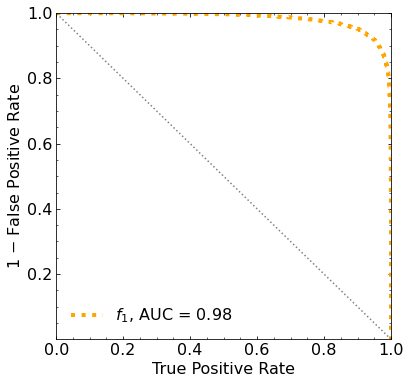

Classification score:


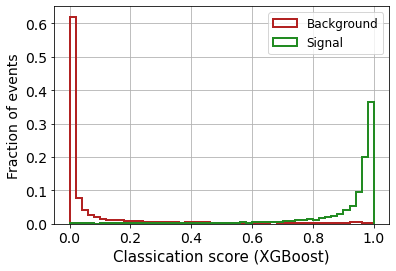


 ROC-AUC =  0.9822729955730448
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1055


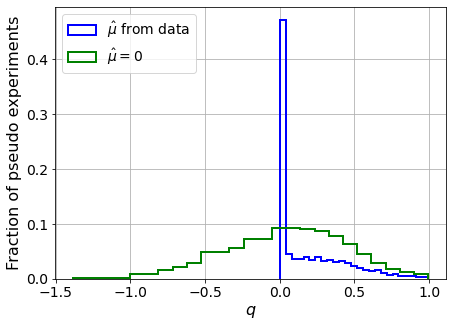

muhat mean:  0.04059190648991822
Z_bins:  0.25028698297343144
std Z_bins:  0.47070634637986697
Z_bins mu=0:  0.25028698297343144
std Z_bins mu=0:  0.8060202954332156

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.102


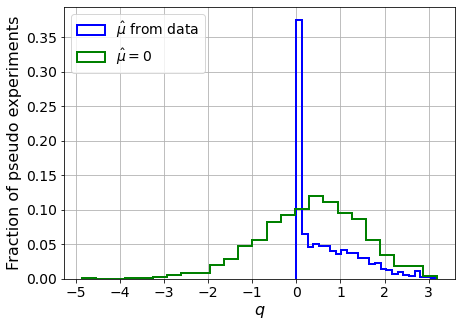

muhat mean:  0.05393630944784493
Z_bins:  0.6481704209131811
std Z_bins:  0.567266281270979
Z_bins mu=0:  0.6481704209131811
std Z_bins mu=0:  0.8812409457524278

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.107


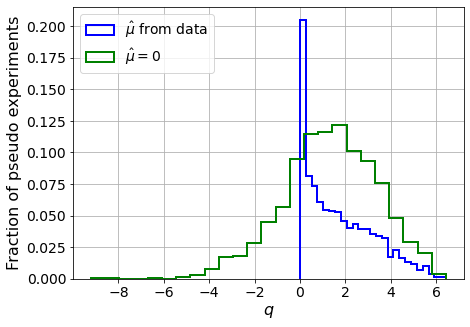

muhat mean:  0.02483709929295782
Z_bins:  1.1919031315303679
std Z_bins:  0.6370593518588026
Z_bins mu=0:  1.1918992061048697
std Z_bins mu=0:  0.8742725587336594

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.109


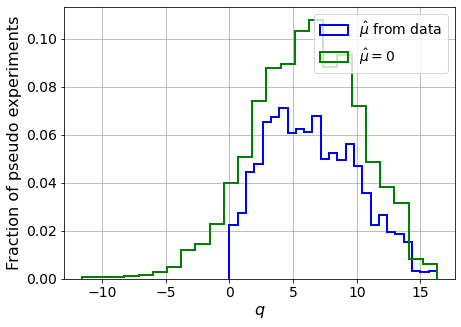

muhat mean:  0.010939892158575392
Z_bins:  2.488807709384785
std Z_bins:  0.7073014875830157
Z_bins mu=0:  2.488800797859952
std Z_bins mu=0:  0.8410375022557262

--------

B_expected:  643
S_expected:  30

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1205


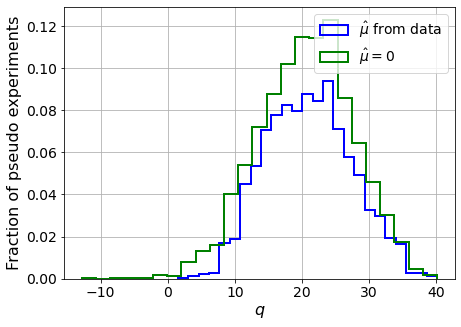

muhat mean:  0.005807896882475966
Z_bins:  4.565635282393302
std Z_bins:  0.6976915891447015
Z_bins mu=0:  4.564698209646356
std Z_bins mu=0:  0.7723026630064619

--------

B_expected:  643
S_expected:  65

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1005


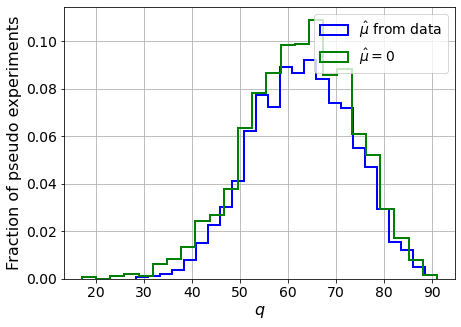

muhat mean:  0.004508042163914668
Z_bins:  7.942445748806225
std Z_bins:  0.6516766706126195
Z_bins mu=0:  7.9424110596478075
std Z_bins mu=0:  0.6983241562170182

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1145


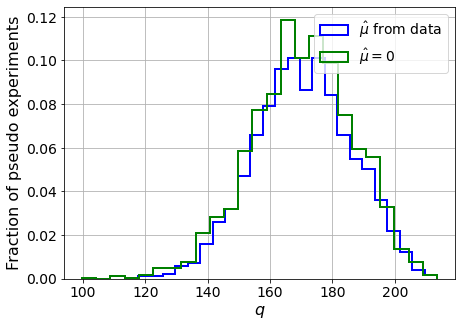

muhat mean:  0.0008825684752941013
Z_bins:  13.061354173304702
std Z_bins:  0.5998206930352425
Z_bins mu=0:  13.060205999650925
std Z_bins mu=0:  0.6274877389740491

--------

B_expected:  643
S_expected:  300

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.11


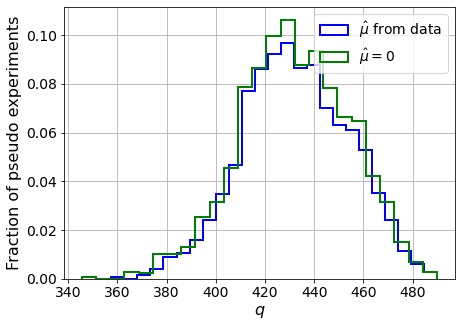

muhat mean:  0.00039137339016443156
Z_bins:  20.778793713302058
std Z_bins:  0.519321084834232
Z_bins mu=0:  20.778596806122245
std Z_bins mu=0:  0.5350770443651783

--------

B_expected:  643
S_expected:  645

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1025


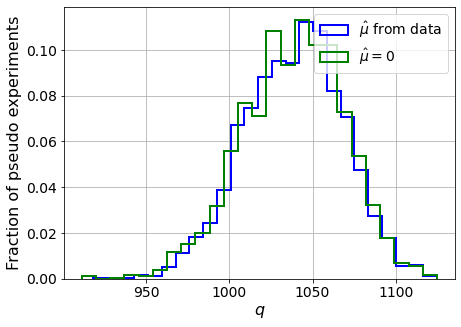

muhat mean:  0.0002200433982064968
Z_bins:  32.25023149927713
std Z_bins:  0.4628406601196991
Z_bins mu=0:  32.24884036668201
std Z_bins mu=0:  0.4737051668399287

--------

B_expected:  643
S_expected:  1390

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1035


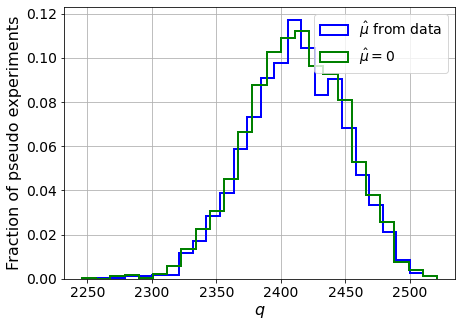

muhat mean:  0.00018367469459886127
Z_bins:  49.113585030349874
std Z_bins:  0.3856901921330585
Z_bins mu=0:  49.112361885255325
std Z_bins mu=0:  0.39234004644227644

--------


 FINAL RESULT:

[[0.25028698297343144, 0.47070634637986697, 0.04059190648991822, 0.25028698297343144, 0.8060202954332156], [0.6481704209131811, 0.567266281270979, 0.05393630944784493, 0.6481704209131811, 0.8812409457524278], [1.1919031315303679, 0.6370593518588026, 0.02483709929295782, 1.1918992061048697, 0.8742725587336594], [2.488807709384785, 0.7073014875830157, 0.010939892158575392, 2.488800797859952, 0.8410375022557262], [4.565635282393302, 0.6976915891447015, 0.005807896882475966, 4.564698209646356, 0.7723026630064619], [7.942445748806225, 0.6516766706126195, 0.004508042163914668, 7.9424110596478075, 0.6983241562170182], [13.061354173304702, 0.5998206930352425, 0.0008825684752941013, 13.060205999650925, 0.6274877389740491], [20.778793713302058, 0.519321084834232, 0.00039137339016443156, 20.77859680612224

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 297.66348971 254.01948501 207.52161031
 153.2813934   92.44368474  31.050643   -33.91238784 -99.39988071]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 282.81405232 255.60442535 217.07750445
 172

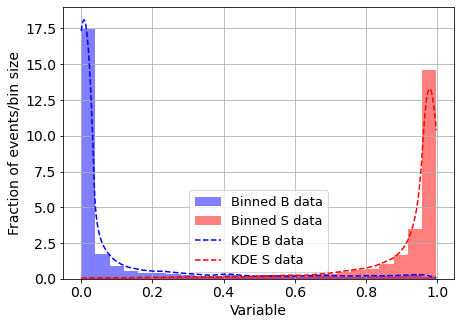

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



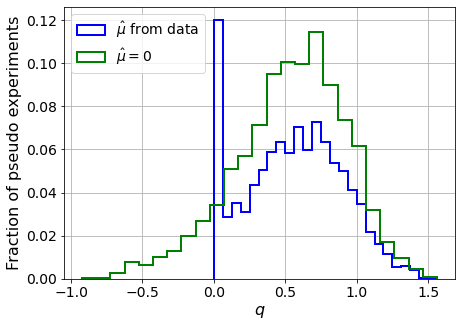

muhat mean:  -6.797414637166122
Z_bins:  0.7550640315389077
std Z_bins:  0.2266078538121951
Z_bins mu=0:  0.7550640315389077
std Z_bins mu=0:  0.25828204714096614

--------

B_expected:  643
S_expected:  3



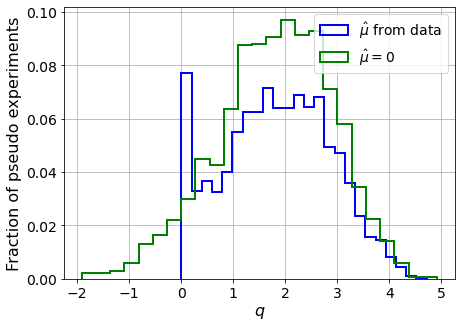

muhat mean:  -2.3997058522106824
Z_bins:  1.3680514307408693
std Z_bins:  0.3739817970448971
Z_bins mu=0:  1.3680514307408693
std Z_bins mu=0:  0.40308592545698846

--------

B_expected:  643
S_expected:  6



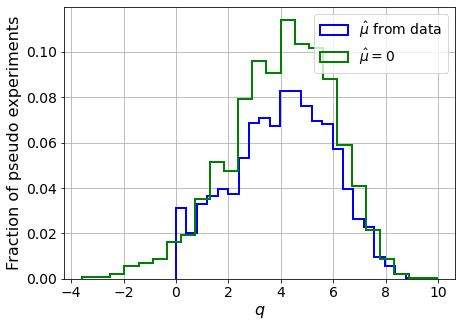

muhat mean:  -1.0588296804805264
Z_bins:  2.0496580228974097
std Z_bins:  0.4583405090231616
Z_bins mu=0:  2.0496580228974097
std Z_bins mu=0:  0.48775482281861704

--------

B_expected:  643
S_expected:  14



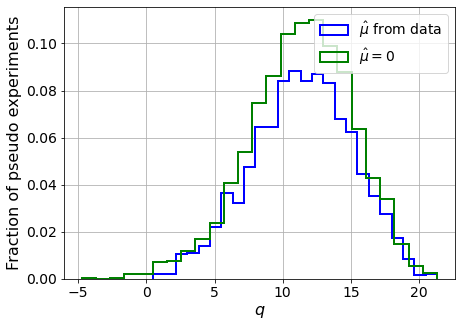

muhat mean:  -0.4654529717956963
Z_bins:  3.395730402889185
std Z_bins:  0.5410573561258138
Z_bins mu=0:  3.395730402889185
std Z_bins mu=0:  0.5589707120869886

--------

B_expected:  643
S_expected:  30



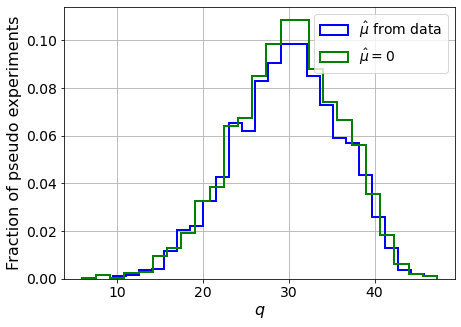

muhat mean:  -0.2342279813420801
Z_bins:  5.4795678630647435
std Z_bins:  0.5595118246257871
Z_bins mu=0:  5.4795678630647435
std Z_bins mu=0:  0.5677851400913855

--------

B_expected:  643
S_expected:  65



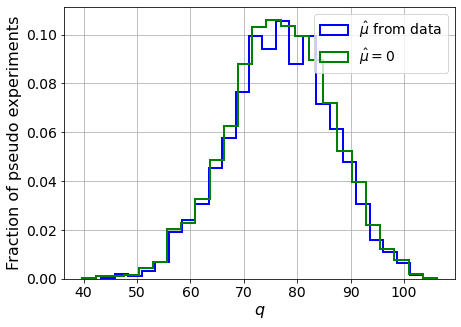

muhat mean:  -0.10133383253190195
Z_bins:  8.769813060971337
std Z_bins:  0.5481901816752249
Z_bins mu=0:  8.769813060971337
std Z_bins mu=0:  0.553170052538982

--------

B_expected:  643
S_expected:  139



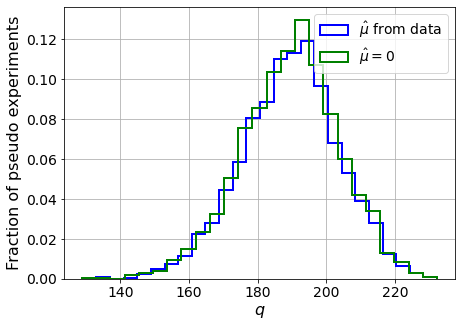

muhat mean:  -0.04893144363231278
Z_bins:  13.780948819247554
std Z_bins:  0.5165223641723526
Z_bins mu=0:  13.780948819247554
std Z_bins mu=0:  0.5198711324045453

--------

B_expected:  643
S_expected:  300



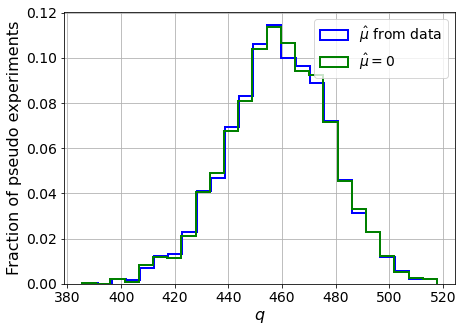

muhat mean:  -0.022515648186891092
Z_bins:  21.425075563239588
std Z_bins:  0.4531012726835807
Z_bins mu=0:  21.425075563239588
std Z_bins mu=0:  0.4546403172364471

--------

B_expected:  643
S_expected:  645



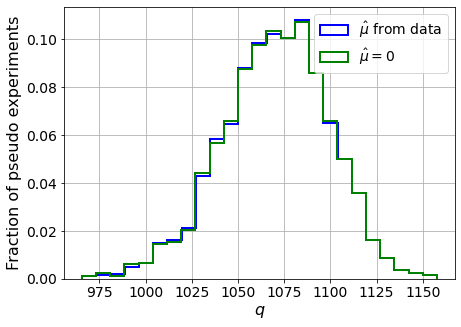

muhat mean:  -0.010493974944290472
Z_bins:  32.73475464597258
std Z_bins:  0.4398684913776752
Z_bins mu=0:  32.73475464597258
std Z_bins mu=0:  0.4415403296176964

--------

B_expected:  643
S_expected:  1390



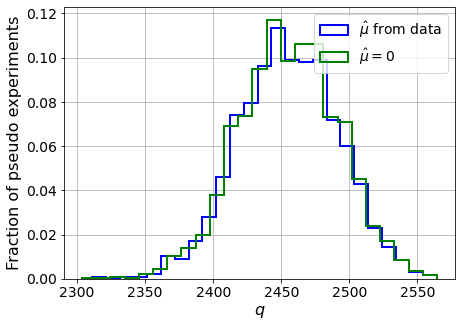

muhat mean:  -0.004811364402944459
Z_bins:  49.548224920956834
std Z_bins:  0.36839593833348094
Z_bins mu=0:  49.548224920956834
std Z_bins mu=0:  0.36919193244901627

--------


 FINAL RESULT:

[[0.7550640315389077, 0.2266078538121951, -6.797414637166122, 0.7550640315389077, 0.25828204714096614], [1.3680514307408693, 0.3739817970448971, -2.3997058522106824, 1.3680514307408693, 0.40308592545698846], [2.0496580228974097, 0.4583405090231616, -1.0588296804805264, 2.0496580228974097, 0.48775482281861704], [3.395730402889185, 0.5410573561258138, -0.4654529717956963, 3.395730402889185, 0.5589707120869886], [5.4795678630647435, 0.5595118246257871, -0.2342279813420801, 5.4795678630647435, 0.5677851400913855], [8.769813060971337, 0.5481901816752249, -0.10133383253190195, 8.769813060971337, 0.553170052538982], [13.780948819247554, 0.5165223641723526, -0.04893144363231278, 13.780948819247554, 0.5198711324045453], [21.425075563239588, 0.4531012726835807, -0.022515648186891092, 21.425075563239588, 

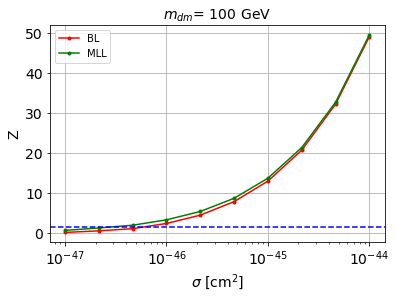


cross_BL_164:  6.051144616296036e-47
cross_BL_164_up:  3.664391595037674e-47
cross_BL_164_down:  9.152654947840858e-47

cross_MLL_164:  2.92635654687206e-47
cross_MLL_164_up:  1.943583415584619e-47
cross_MLL_164_down:  4.780919421767503e-47

#########################


#########################

mDM =  200 GeV


S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)
 NUM_DAT:  31880 

NUM_DAT_ER:  31472
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  265

B_pbot.shape:  (31880,)
B_ptop.shape:  (31880,)
B_ppeakS1.shape : (31880, 8)
B_ppeakS2.shape:  (31880, 8)

S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)


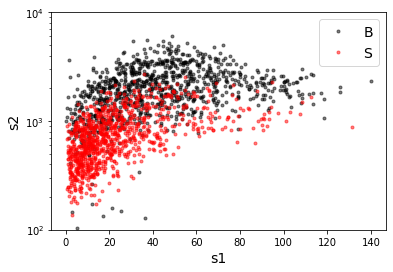

B_pdiffT.shape:  (31880,)
S_pdiffT.shape:  (31880,)


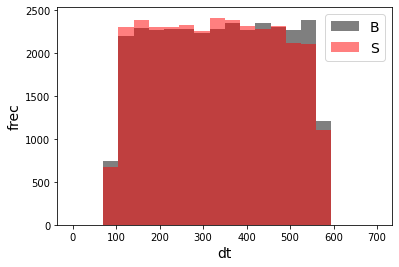

B_pbot.shape:  (31880,)
B_ptop.shape:  (31880,)
B_ppeakS1.shape : (31880, 7)
B_ppeakS2.shape:  (31880, 7)
S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 7)
S_ppeakS2.shape:  (31880, 7)
X_mon_B.shape:  (31880, 17)
X_mon_S.shape:  (31880, 17)
X_mon.shape:  (63760, 17)

X_mon_train :  (40647, 17)
y_mon_train :  (40647,)
X_mon_val :  (7173, 17)
y_mon_val :  (7173,)
X_mon_test :  (15940, 17)
y_mon_test :  (15940,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68659	validation_1-logloss:0.68672
[1]	validation_0-logloss:0.68017	validation_1-logloss:0.68042
[2]	validation_0-logloss:0.67384	validation_1-logloss:0.67418
[3]	validation_0-logloss:0.66767	validation_1-logloss:0.66815
[4]	validation_0-logloss:0.66156	validation_1-logloss:0.66215
[5]	validation_0-logloss:0.65562	validation_1-logloss:0.65636
[6]	validation_0-logloss:0.64974	validation_1-logloss:0.65057
[7]	validation_0-logloss:0.64402	validation_1-logloss:0.64497
[8]	validation_0-logloss:0.63834	validation_1-logloss:0.63939
[9]	validation_0-logloss:0.63282	validation_1-logloss:0.63400
[10]	validation_0-logloss:0.62741	validation_1-logloss:0.62870
[11]	validation_0-logloss:0.62201	validation_1-logloss:0.62341
[12]	validation_0-logloss:0.61680	validation_1-logloss:0.61830
[13]	validation_0-logloss:0.61167	validation_1-logloss:0.61329
[14]	validation_0-logloss:0.60656	validation_1-logloss:0.60827
[15]	validation_0-logloss:0.60161	validation_1-logloss:0.60347
[1

[130]	validation_0-logloss:0.31192	validation_1-logloss:0.32272
[131]	validation_0-logloss:0.31069	validation_1-logloss:0.32157
[132]	validation_0-logloss:0.30948	validation_1-logloss:0.32038
[133]	validation_0-logloss:0.30823	validation_1-logloss:0.31918
[134]	validation_0-logloss:0.30704	validation_1-logloss:0.31807
[135]	validation_0-logloss:0.30588	validation_1-logloss:0.31693
[136]	validation_0-logloss:0.30471	validation_1-logloss:0.31581
[137]	validation_0-logloss:0.30360	validation_1-logloss:0.31471
[138]	validation_0-logloss:0.30248	validation_1-logloss:0.31366
[139]	validation_0-logloss:0.30133	validation_1-logloss:0.31255
[140]	validation_0-logloss:0.30017	validation_1-logloss:0.31144
[141]	validation_0-logloss:0.29909	validation_1-logloss:0.31040
[142]	validation_0-logloss:0.29800	validation_1-logloss:0.30933
[143]	validation_0-logloss:0.29694	validation_1-logloss:0.30832
[144]	validation_0-logloss:0.29586	validation_1-logloss:0.30731
[145]	validation_0-logloss:0.29478	valid

[259]	validation_0-logloss:0.21958	validation_1-logloss:0.23562
[260]	validation_0-logloss:0.21917	validation_1-logloss:0.23524
[261]	validation_0-logloss:0.21878	validation_1-logloss:0.23490
[262]	validation_0-logloss:0.21839	validation_1-logloss:0.23454
[263]	validation_0-logloss:0.21801	validation_1-logloss:0.23423
[264]	validation_0-logloss:0.21762	validation_1-logloss:0.23386
[265]	validation_0-logloss:0.21726	validation_1-logloss:0.23355
[266]	validation_0-logloss:0.21687	validation_1-logloss:0.23320
[267]	validation_0-logloss:0.21648	validation_1-logloss:0.23285
[268]	validation_0-logloss:0.21610	validation_1-logloss:0.23252
[269]	validation_0-logloss:0.21575	validation_1-logloss:0.23219
[270]	validation_0-logloss:0.21539	validation_1-logloss:0.23185
[271]	validation_0-logloss:0.21503	validation_1-logloss:0.23152
[272]	validation_0-logloss:0.21465	validation_1-logloss:0.23118
[273]	validation_0-logloss:0.21432	validation_1-logloss:0.23087
[274]	validation_0-logloss:0.21394	valid

[388]	validation_0-logloss:0.18660	validation_1-logloss:0.20664
[389]	validation_0-logloss:0.18644	validation_1-logloss:0.20651
[390]	validation_0-logloss:0.18625	validation_1-logloss:0.20634
[391]	validation_0-logloss:0.18610	validation_1-logloss:0.20625
[392]	validation_0-logloss:0.18595	validation_1-logloss:0.20612
[393]	validation_0-logloss:0.18578	validation_1-logloss:0.20599
[394]	validation_0-logloss:0.18562	validation_1-logloss:0.20585
[395]	validation_0-logloss:0.18546	validation_1-logloss:0.20573
[396]	validation_0-logloss:0.18529	validation_1-logloss:0.20557
[397]	validation_0-logloss:0.18514	validation_1-logloss:0.20546
[398]	validation_0-logloss:0.18499	validation_1-logloss:0.20535
[399]	validation_0-logloss:0.18484	validation_1-logloss:0.20522
[400]	validation_0-logloss:0.18466	validation_1-logloss:0.20505
[401]	validation_0-logloss:0.18453	validation_1-logloss:0.20495
[402]	validation_0-logloss:0.18435	validation_1-logloss:0.20478
[403]	validation_0-logloss:0.18419	valid

[517]	validation_0-logloss:0.17020	validation_1-logloss:0.19417
[518]	validation_0-logloss:0.17012	validation_1-logloss:0.19411
[519]	validation_0-logloss:0.17002	validation_1-logloss:0.19403
[520]	validation_0-logloss:0.16993	validation_1-logloss:0.19396
[521]	validation_0-logloss:0.16983	validation_1-logloss:0.19387
[522]	validation_0-logloss:0.16975	validation_1-logloss:0.19383
[523]	validation_0-logloss:0.16967	validation_1-logloss:0.19377
[524]	validation_0-logloss:0.16957	validation_1-logloss:0.19371
[525]	validation_0-logloss:0.16948	validation_1-logloss:0.19366
[526]	validation_0-logloss:0.16939	validation_1-logloss:0.19360
[527]	validation_0-logloss:0.16930	validation_1-logloss:0.19355
[528]	validation_0-logloss:0.16923	validation_1-logloss:0.19349
[529]	validation_0-logloss:0.16912	validation_1-logloss:0.19339
[530]	validation_0-logloss:0.16902	validation_1-logloss:0.19331
[531]	validation_0-logloss:0.16894	validation_1-logloss:0.19325
[532]	validation_0-logloss:0.16887	valid

[646]	validation_0-logloss:0.16107	validation_1-logloss:0.18816
[647]	validation_0-logloss:0.16103	validation_1-logloss:0.18815
[648]	validation_0-logloss:0.16098	validation_1-logloss:0.18812
[649]	validation_0-logloss:0.16091	validation_1-logloss:0.18808
[650]	validation_0-logloss:0.16085	validation_1-logloss:0.18805
[651]	validation_0-logloss:0.16078	validation_1-logloss:0.18800
[652]	validation_0-logloss:0.16073	validation_1-logloss:0.18797
[653]	validation_0-logloss:0.16067	validation_1-logloss:0.18792
[654]	validation_0-logloss:0.16062	validation_1-logloss:0.18790
[655]	validation_0-logloss:0.16056	validation_1-logloss:0.18786
[656]	validation_0-logloss:0.16053	validation_1-logloss:0.18786
[657]	validation_0-logloss:0.16046	validation_1-logloss:0.18782
[658]	validation_0-logloss:0.16040	validation_1-logloss:0.18779
[659]	validation_0-logloss:0.16036	validation_1-logloss:0.18775
[660]	validation_0-logloss:0.16029	validation_1-logloss:0.18770
[661]	validation_0-logloss:0.16024	valid

[775]	validation_0-logloss:0.15483	validation_1-logloss:0.18485
[776]	validation_0-logloss:0.15480	validation_1-logloss:0.18483
[777]	validation_0-logloss:0.15477	validation_1-logloss:0.18482
[778]	validation_0-logloss:0.15471	validation_1-logloss:0.18479
[779]	validation_0-logloss:0.15466	validation_1-logloss:0.18478
[780]	validation_0-logloss:0.15461	validation_1-logloss:0.18475
[781]	validation_0-logloss:0.15459	validation_1-logloss:0.18474
[782]	validation_0-logloss:0.15456	validation_1-logloss:0.18473
[783]	validation_0-logloss:0.15453	validation_1-logloss:0.18472
[784]	validation_0-logloss:0.15450	validation_1-logloss:0.18471
[785]	validation_0-logloss:0.15444	validation_1-logloss:0.18467
[786]	validation_0-logloss:0.15442	validation_1-logloss:0.18465
[787]	validation_0-logloss:0.15437	validation_1-logloss:0.18464
[788]	validation_0-logloss:0.15431	validation_1-logloss:0.18461
[789]	validation_0-logloss:0.15427	validation_1-logloss:0.18458
[790]	validation_0-logloss:0.15422	valid

[904]	validation_0-logloss:0.15026	validation_1-logloss:0.18303
[905]	validation_0-logloss:0.15023	validation_1-logloss:0.18302
[906]	validation_0-logloss:0.15019	validation_1-logloss:0.18300
[907]	validation_0-logloss:0.15016	validation_1-logloss:0.18301
[908]	validation_0-logloss:0.15012	validation_1-logloss:0.18299
[909]	validation_0-logloss:0.15010	validation_1-logloss:0.18300
[910]	validation_0-logloss:0.15006	validation_1-logloss:0.18299
[911]	validation_0-logloss:0.15004	validation_1-logloss:0.18297
[912]	validation_0-logloss:0.15001	validation_1-logloss:0.18296
[913]	validation_0-logloss:0.14998	validation_1-logloss:0.18295
[914]	validation_0-logloss:0.14995	validation_1-logloss:0.18294
[915]	validation_0-logloss:0.14993	validation_1-logloss:0.18292
[916]	validation_0-logloss:0.14991	validation_1-logloss:0.18293
[917]	validation_0-logloss:0.14987	validation_1-logloss:0.18293
[918]	validation_0-logloss:0.14985	validation_1-logloss:0.18293
[919]	validation_0-logloss:0.14984	valid

[1032]	validation_0-logloss:0.14686	validation_1-logloss:0.18212
[1033]	validation_0-logloss:0.14683	validation_1-logloss:0.18212
[1034]	validation_0-logloss:0.14681	validation_1-logloss:0.18212
[1035]	validation_0-logloss:0.14680	validation_1-logloss:0.18211
[1036]	validation_0-logloss:0.14677	validation_1-logloss:0.18210
[1037]	validation_0-logloss:0.14674	validation_1-logloss:0.18210
[1038]	validation_0-logloss:0.14671	validation_1-logloss:0.18208
[1039]	validation_0-logloss:0.14669	validation_1-logloss:0.18208
[1040]	validation_0-logloss:0.14667	validation_1-logloss:0.18208
[1041]	validation_0-logloss:0.14666	validation_1-logloss:0.18208
[1042]	validation_0-logloss:0.14664	validation_1-logloss:0.18209
[1043]	validation_0-logloss:0.14661	validation_1-logloss:0.18209
[1044]	validation_0-logloss:0.14659	validation_1-logloss:0.18208
[1045]	validation_0-logloss:0.14657	validation_1-logloss:0.18207
[1046]	validation_0-logloss:0.14654	validation_1-logloss:0.18206
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.14406	validation_1-logloss:0.18167
[1160]	validation_0-logloss:0.14405	validation_1-logloss:0.18167
[1161]	validation_0-logloss:0.14400	validation_1-logloss:0.18166
[1162]	validation_0-logloss:0.14398	validation_1-logloss:0.18166
[1163]	validation_0-logloss:0.14397	validation_1-logloss:0.18166
[1164]	validation_0-logloss:0.14394	validation_1-logloss:0.18165
[1165]	validation_0-logloss:0.14391	validation_1-logloss:0.18165
[1166]	validation_0-logloss:0.14388	validation_1-logloss:0.18164
[1167]	validation_0-logloss:0.14385	validation_1-logloss:0.18164
[1168]	validation_0-logloss:0.14383	validation_1-logloss:0.18164
[1169]	validation_0-logloss:0.14380	validation_1-logloss:0.18163
[1170]	validation_0-logloss:0.14377	validation_1-logloss:0.18163
[1171]	validation_0-logloss:0.14375	validation_1-logloss:0.18163
[1172]	validation_0-logloss:0.14374	validation_1-logloss:0.18164
[1173]	validation_0-logloss:0.14371	validation_1-logloss:0.18163
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.14119	validation_1-logloss:0.18138
[1287]	validation_0-logloss:0.14117	validation_1-logloss:0.18137
[1288]	validation_0-logloss:0.14117	validation_1-logloss:0.18138
[1289]	validation_0-logloss:0.14113	validation_1-logloss:0.18138
[1290]	validation_0-logloss:0.14111	validation_1-logloss:0.18138
[1291]	validation_0-logloss:0.14109	validation_1-logloss:0.18138
[1292]	validation_0-logloss:0.14106	validation_1-logloss:0.18137
[1293]	validation_0-logloss:0.14106	validation_1-logloss:0.18137
[1294]	validation_0-logloss:0.14103	validation_1-logloss:0.18138
[1295]	validation_0-logloss:0.14100	validation_1-logloss:0.18137
[1296]	validation_0-logloss:0.14099	validation_1-logloss:0.18137
[1297]	validation_0-logloss:0.14097	validation_1-logloss:0.18137
[1298]	validation_0-logloss:0.14095	validation_1-logloss:0.18137
[1299]	validation_0-logloss:0.14092	validation_1-logloss:0.18135
[1300]	validation_0-logloss:0.14091	validation_1-logloss:0.18135
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.13862	validation_1-logloss:0.18108
[1414]	validation_0-logloss:0.13862	validation_1-logloss:0.18108
[1415]	validation_0-logloss:0.13860	validation_1-logloss:0.18108
[1416]	validation_0-logloss:0.13858	validation_1-logloss:0.18107
[1417]	validation_0-logloss:0.13855	validation_1-logloss:0.18107
[1418]	validation_0-logloss:0.13853	validation_1-logloss:0.18107
[1419]	validation_0-logloss:0.13851	validation_1-logloss:0.18106
[1420]	validation_0-logloss:0.13849	validation_1-logloss:0.18106
[1421]	validation_0-logloss:0.13847	validation_1-logloss:0.18107
[1422]	validation_0-logloss:0.13846	validation_1-logloss:0.18107
[1423]	validation_0-logloss:0.13845	validation_1-logloss:0.18107
[1424]	validation_0-logloss:0.13843	validation_1-logloss:0.18107
[1425]	validation_0-logloss:0.13840	validation_1-logloss:0.18107
[1426]	validation_0-logloss:0.13838	validation_1-logloss:0.18107
[1427]	validation_0-logloss:0.13837	validation_1-logloss:0.18107
[1428]	validation_0-loglo

[1540]	validation_0-logloss:0.13627	validation_1-logloss:0.18093
[1541]	validation_0-logloss:0.13625	validation_1-logloss:0.18094
[1542]	validation_0-logloss:0.13623	validation_1-logloss:0.18093
[1543]	validation_0-logloss:0.13621	validation_1-logloss:0.18093
[1544]	validation_0-logloss:0.13620	validation_1-logloss:0.18093
[1545]	validation_0-logloss:0.13617	validation_1-logloss:0.18093
[1546]	validation_0-logloss:0.13615	validation_1-logloss:0.18094
[1547]	validation_0-logloss:0.13613	validation_1-logloss:0.18093
[1548]	validation_0-logloss:0.13612	validation_1-logloss:0.18094
[1549]	validation_0-logloss:0.13609	validation_1-logloss:0.18095
[1550]	validation_0-logloss:0.13609	validation_1-logloss:0.18095
[1551]	validation_0-logloss:0.13607	validation_1-logloss:0.18096
[1552]	validation_0-logloss:0.13606	validation_1-logloss:0.18097
[1553]	validation_0-logloss:0.13604	validation_1-logloss:0.18096
[1554]	validation_0-logloss:0.13602	validation_1-logloss:0.18096
[1555]	validation_0-loglo

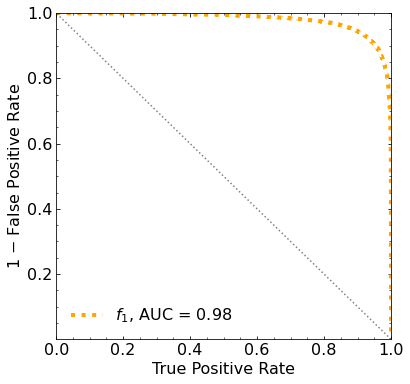

Classification score:


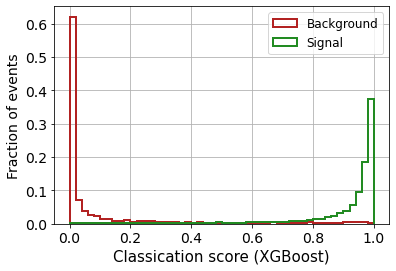


 ROC-AUC =  0.9792703858688069
At least 5 B events per bin, range = [[0, 1]]:
# bins:  19 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  19
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.08


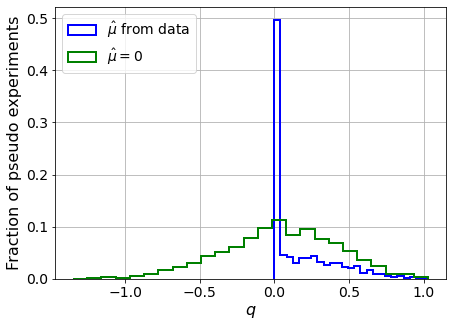

muhat mean:  0.06369906297217323
Z_bins:  0.21138043779904253
std Z_bins:  0.5323921612700399
Z_bins mu=0:  0.21138043779904253
std Z_bins mu=0:  0.9061598060836983

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0825


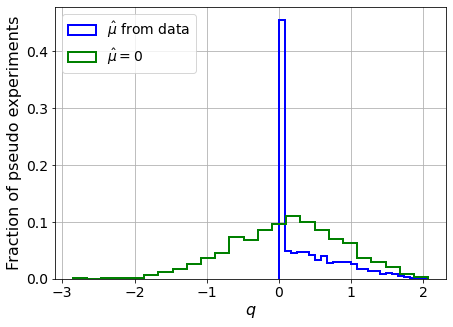

muhat mean:  0.13249824361472023
Z_bins:  0.3971490773324164
std Z_bins:  0.5842588945821213
Z_bins mu=0:  0.3969335549359899
std Z_bins mu=0:  0.9624457522154327

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.081


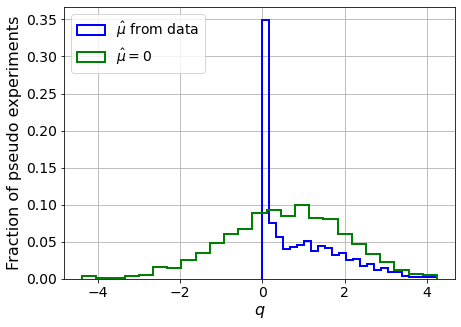

muhat mean:  0.053055718947122354
Z_bins:  0.7562947742582544
std Z_bins:  0.6394940930430969
Z_bins mu=0:  0.7562474036738039
std Z_bins mu=0:  0.9550163041089805

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.075


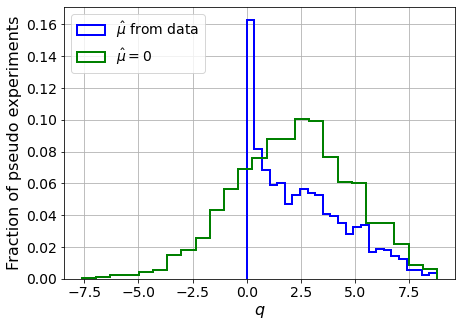

muhat mean:  0.004616046901688831
Z_bins:  1.504670584586851
std Z_bins:  0.6931099131482649
Z_bins mu=0:  1.504670584586851
std Z_bins mu=0:  0.8940978825355408

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.071


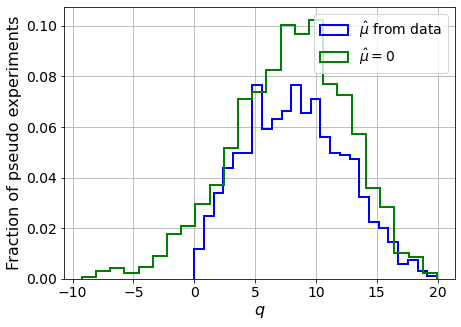

muhat mean:  0.0038712733048508426
Z_bins:  2.860575586297005
std Z_bins:  0.7069000469429259
Z_bins mu=0:  2.860564451108312
std Z_bins mu=0:  0.8330936782743464

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.072


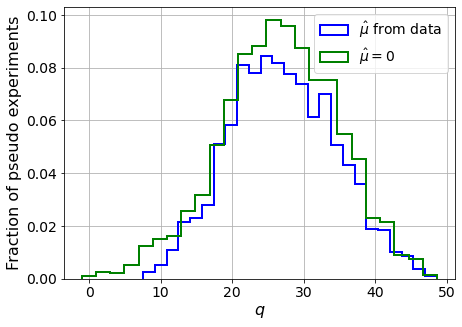

muhat mean:  0.004830546988874315
Z_bins:  5.175118866340939
std Z_bins:  0.7199330074024293
Z_bins mu=0:  5.173029281677231
std Z_bins mu=0:  0.7896757454656382

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.073


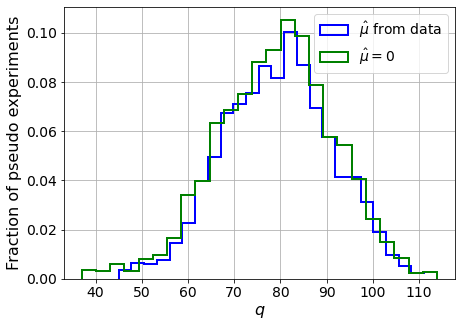

muhat mean:  0.0005858503567437043
Z_bins:  8.93000107559739
std Z_bins:  0.6643334077572808
Z_bins mu=0:  8.929736636532907
std Z_bins mu=0:  0.7047020065828583

--------

B_expected:  643
S_expected:  170

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.077


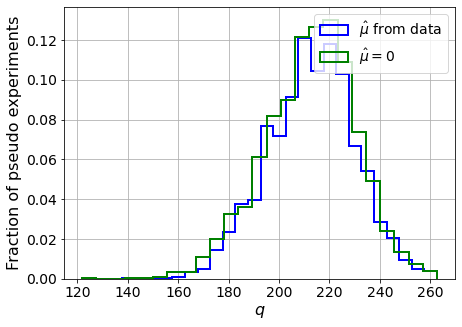

muhat mean:  0.0011987620437508932
Z_bins:  14.601083337426099
std Z_bins:  0.5950676053706024
Z_bins mu=0:  14.600817700655673
std Z_bins mu=0:  0.6218647793607308

--------

B_expected:  643
S_expected:  366

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.074


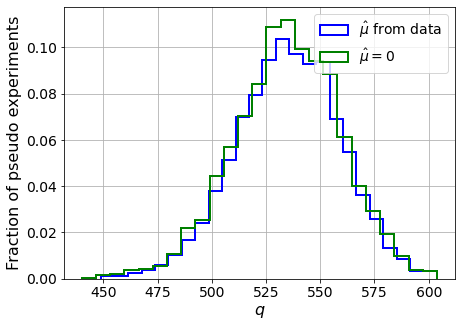

muhat mean:  0.00029422917079809725
Z_bins:  23.141710230401134
std Z_bins:  0.5193940403277493
Z_bins mu=0:  23.139364253859565
std Z_bins mu=0:  0.5347004324571942

--------

B_expected:  643
S_expected:  788

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.075


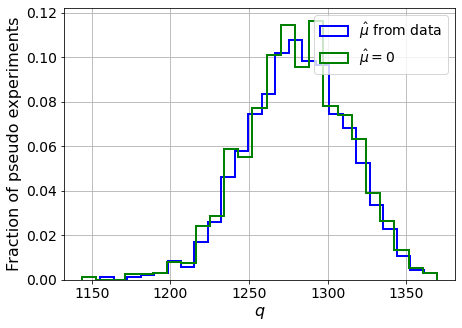

muhat mean:  0.0001881929062786622
Z_bins:  35.78095449472818
std Z_bins:  0.4510846542893324
Z_bins mu=0:  35.77966215299309
std Z_bins mu=0:  0.46020569531225947

--------


 FINAL RESULT:

[[0.21138043779904253, 0.5323921612700399, 0.06369906297217323, 0.21138043779904253, 0.9061598060836983], [0.3971490773324164, 0.5842588945821213, 0.13249824361472023, 0.3969335549359899, 0.9624457522154327], [0.7562947742582544, 0.6394940930430969, 0.053055718947122354, 0.7562474036738039, 0.9550163041089805], [1.504670584586851, 0.6931099131482649, 0.004616046901688831, 1.504670584586851, 0.8940978825355408], [2.860575586297005, 0.7069000469429259, 0.0038712733048508426, 2.860564451108312, 0.8330936782743464], [5.175118866340939, 0.7199330074024293, 0.004830546988874315, 5.173029281677231, 0.7896757454656382], [8.93000107559739, 0.6643334077572808, 0.0005858503567437043, 8.929736636532907, 0.7047020065828583], [14.601083337426099, 0.5950676053706024, 0.0011987620437508932, 14.600817700655673, 0.

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf          -inf  300.99881735  259.72372644  213.07691154
  158.40453565   98.24077804   30.02059325  -39.54880233 -101.40580097]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 286.5835176  271.01565804 243.467020

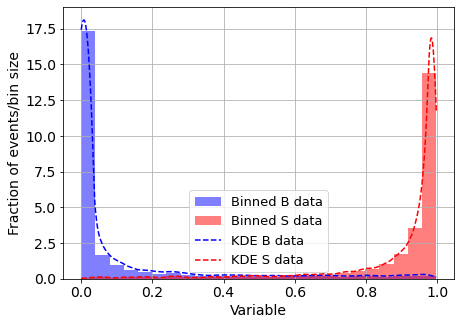

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



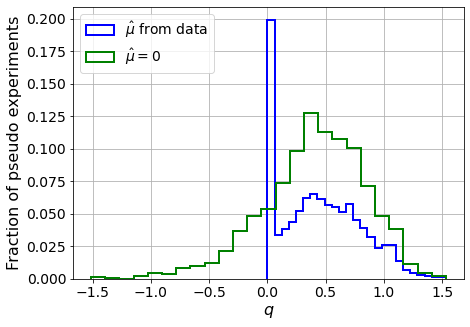

muhat mean:  -4.666783923300156
Z_bins:  0.6589296247287506
std Z_bins:  0.261284571216311
Z_bins mu=0:  0.6589296247287506
std Z_bins mu=0:  0.33398788631278087

--------

B_expected:  643
S_expected:  2



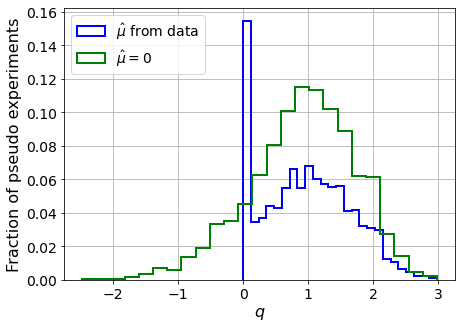

muhat mean:  -2.310756026844879
Z_bins:  0.9846980200808416
std Z_bins:  0.3427193984513188
Z_bins mu=0:  0.9846980200808416
std Z_bins mu=0:  0.4093995238781262

--------

B_expected:  643
S_expected:  4



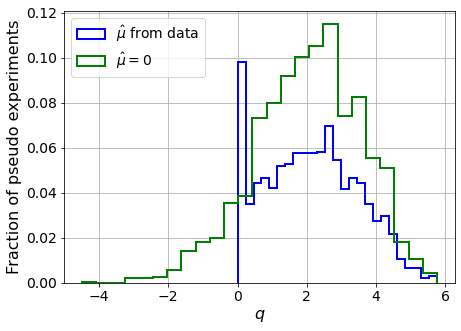

muhat mean:  -1.1341674666017234
Z_bins:  1.467593153487809
std Z_bins:  0.4563417301424291
Z_bins mu=0:  1.467593153487809
std Z_bins mu=0:  0.5187003294178549

--------

B_expected:  643
S_expected:  8



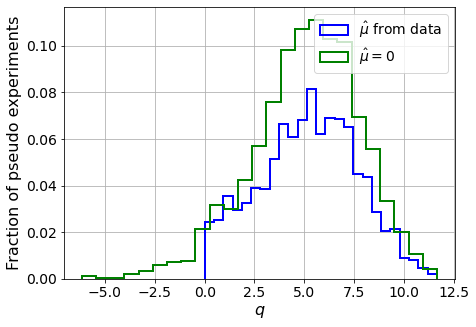

muhat mean:  -0.5636547969633805
Z_bins:  2.300921090260246
std Z_bins:  0.5341527736620665
Z_bins mu=0:  2.300921090260246
std Z_bins mu=0:  0.5853327182984873

--------

B_expected:  643
S_expected:  17



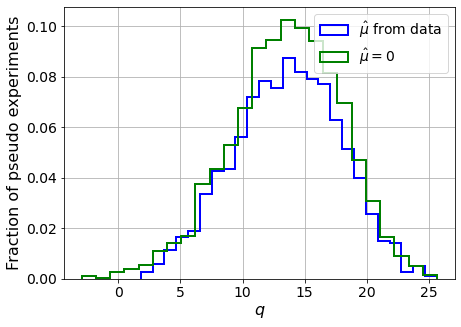

muhat mean:  -0.26041595115638605
Z_bins:  3.692957834689326
std Z_bins:  0.5781304401804842
Z_bins mu=0:  3.692957834689326
std Z_bins mu=0:  0.6032305440812675

--------

B_expected:  643
S_expected:  37



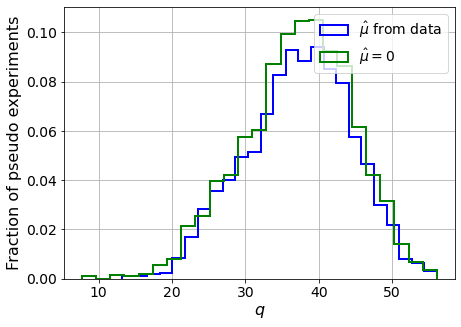

muhat mean:  -0.14113648160764244
Z_bins:  6.132807579974711
std Z_bins:  0.5895121918485079
Z_bins mu=0:  6.132807579974711
std Z_bins mu=0:  0.6052853394186621

--------

B_expected:  643
S_expected:  79



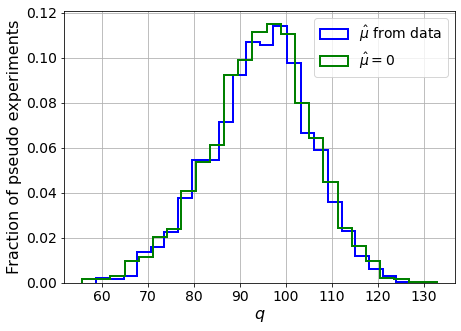

muhat mean:  -0.05751823620631038
Z_bins:  9.740983224878262
std Z_bins:  0.5625144379334739
Z_bins mu=0:  9.740983224878262
std Z_bins mu=0:  0.5718969532220323

--------

B_expected:  643
S_expected:  170



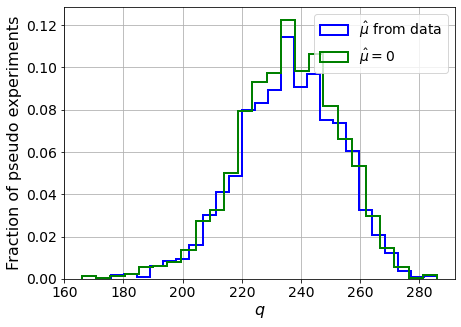

muhat mean:  -0.027364365449434918
Z_bins:  15.37890844201209
std Z_bins:  0.5503897359035419
Z_bins mu=0:  15.37890844201209
std Z_bins mu=0:  0.5600506845072223

--------

B_expected:  643
S_expected:  366



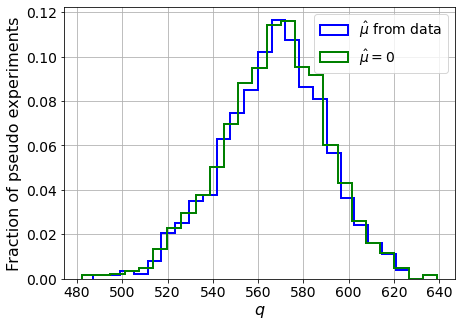

muhat mean:  -0.013039890133363773
Z_bins:  23.835188587989602
std Z_bins:  0.48220204734372624
Z_bins mu=0:  23.834153632455422
std Z_bins mu=0:  0.4868501715519197

--------

B_expected:  643
S_expected:  788



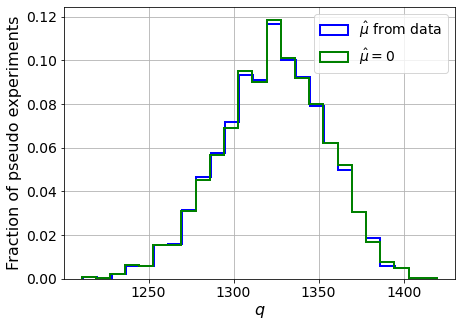

muhat mean:  -0.005859270388102457
Z_bins:  36.38413784693578
std Z_bins:  0.42528145290730696
Z_bins mu=0:  36.38413784693578
std Z_bins mu=0:  0.42758706810612157

--------


 FINAL RESULT:

[[0.6589296247287506, 0.261284571216311, -4.666783923300156, 0.6589296247287506, 0.33398788631278087], [0.9846980200808416, 0.3427193984513188, -2.310756026844879, 0.9846980200808416, 0.4093995238781262], [1.467593153487809, 0.4563417301424291, -1.1341674666017234, 1.467593153487809, 0.5187003294178549], [2.300921090260246, 0.5341527736620665, -0.5636547969633805, 2.300921090260246, 0.5853327182984873], [3.692957834689326, 0.5781304401804842, -0.26041595115638605, 3.692957834689326, 0.6032305440812675], [6.132807579974711, 0.5895121918485079, -0.14113648160764244, 6.132807579974711, 0.6052853394186621], [9.740983224878262, 0.5625144379334739, -0.05751823620631038, 9.740983224878262, 0.5718969532220323], [15.37890844201209, 0.5503897359035419, -0.027364365449434918, 15.37890844201209, 0.5600506845

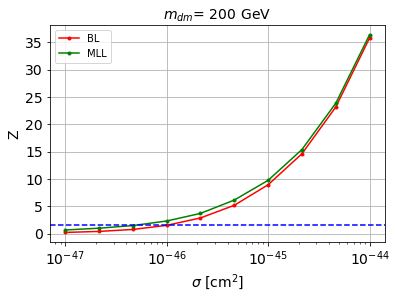


cross_BL_164:  1.0796155935446134e-46
cross_BL_164_up:  5.863657734676839e-47
cross_BL_164_down:  1.6060338724233276e-46

cross_MLL_164:  5.440387722644148e-47
cross_MLL_164_up:  3.221099583993316e-47
cross_MLL_164_down:  8.791640875084376e-47

#########################


#########################

mDM =  500 GeV


S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)
 NUM_DAT:  32015 

NUM_DAT_ER:  31605
NUM_DAT_AC:  113
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  266

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 8)
B_ppeakS2.shape:  (32015, 8)

S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)


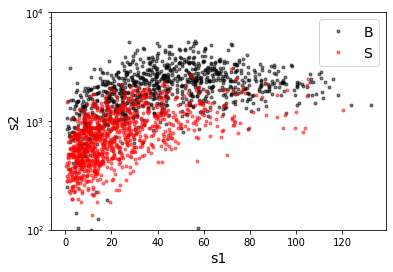

B_pdiffT.shape:  (32015,)
S_pdiffT.shape:  (32015,)


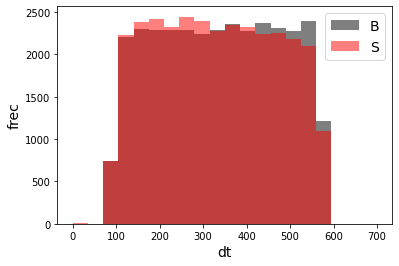

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 7)
B_ppeakS2.shape:  (32015, 7)
S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 7)
S_ppeakS2.shape:  (32015, 7)
X_mon_B.shape:  (32015, 17)
X_mon_S.shape:  (32015, 17)
X_mon.shape:  (64030, 17)

X_mon_train :  (40818, 17)
y_mon_train :  (40818,)
X_mon_val :  (7204, 17)
y_mon_val :  (7204,)
X_mon_test :  (16008, 17)
y_mon_test :  (16008,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68665	validation_1-logloss:0.68672
[1]	validation_0-logloss:0.68035	validation_1-logloss:0.68046
[2]	validation_0-logloss:0.67414	validation_1-logloss:0.67429
[3]	validation_0-logloss:0.66810	validation_1-logloss:0.66831
[4]	validation_0-logloss:0.66218	validation_1-logloss:0.66242
[5]	validation_0-logloss:0.65624	validation_1-logloss:0.65656
[6]	validation_0-logloss:0.65053	validation_1-logloss:0.65091
[7]	validation_0-logloss:0.64478	validation_1-logloss:0.64524
[8]	validation_0-logloss:0.63924	validation_1-logloss:0.63973
[9]	validation_0-logloss:0.63373	validation_1-logloss:0.63426
[10]	validation_0-logloss:0.62840	validation_1-logloss:0.62900
[11]	validation_0-logloss:0.62305	validation_1-logloss:0.62373
[12]	validation_0-logloss:0.61791	validation_1-logloss:0.61866
[13]	validation_0-logloss:0.61275	validation_1-logloss:0.61352
[14]	validation_0-logloss:0.60777	validation_1-logloss:0.60859
[15]	validation_0-logloss:0.60276	validation_1-logloss:0.60366
[1

[130]	validation_0-logloss:0.31596	validation_1-logloss:0.32067
[131]	validation_0-logloss:0.31470	validation_1-logloss:0.31942
[132]	validation_0-logloss:0.31356	validation_1-logloss:0.31832
[133]	validation_0-logloss:0.31238	validation_1-logloss:0.31723
[134]	validation_0-logloss:0.31121	validation_1-logloss:0.31608
[135]	validation_0-logloss:0.30998	validation_1-logloss:0.31487
[136]	validation_0-logloss:0.30878	validation_1-logloss:0.31373
[137]	validation_0-logloss:0.30765	validation_1-logloss:0.31264
[138]	validation_0-logloss:0.30653	validation_1-logloss:0.31160
[139]	validation_0-logloss:0.30538	validation_1-logloss:0.31047
[140]	validation_0-logloss:0.30426	validation_1-logloss:0.30942
[141]	validation_0-logloss:0.30316	validation_1-logloss:0.30829
[142]	validation_0-logloss:0.30208	validation_1-logloss:0.30726
[143]	validation_0-logloss:0.30097	validation_1-logloss:0.30622
[144]	validation_0-logloss:0.29988	validation_1-logloss:0.30515
[145]	validation_0-logloss:0.29877	valid

[259]	validation_0-logloss:0.22288	validation_1-logloss:0.23312
[260]	validation_0-logloss:0.22245	validation_1-logloss:0.23277
[261]	validation_0-logloss:0.22205	validation_1-logloss:0.23235
[262]	validation_0-logloss:0.22165	validation_1-logloss:0.23199
[263]	validation_0-logloss:0.22127	validation_1-logloss:0.23169
[264]	validation_0-logloss:0.22085	validation_1-logloss:0.23131
[265]	validation_0-logloss:0.22047	validation_1-logloss:0.23100
[266]	validation_0-logloss:0.22010	validation_1-logloss:0.23061
[267]	validation_0-logloss:0.21975	validation_1-logloss:0.23028
[268]	validation_0-logloss:0.21938	validation_1-logloss:0.22995
[269]	validation_0-logloss:0.21899	validation_1-logloss:0.22959
[270]	validation_0-logloss:0.21863	validation_1-logloss:0.22927
[271]	validation_0-logloss:0.21823	validation_1-logloss:0.22893
[272]	validation_0-logloss:0.21788	validation_1-logloss:0.22858
[273]	validation_0-logloss:0.21750	validation_1-logloss:0.22826
[274]	validation_0-logloss:0.21713	valid

[388]	validation_0-logloss:0.18914	validation_1-logloss:0.20401
[389]	validation_0-logloss:0.18898	validation_1-logloss:0.20387
[390]	validation_0-logloss:0.18879	validation_1-logloss:0.20372
[391]	validation_0-logloss:0.18862	validation_1-logloss:0.20358
[392]	validation_0-logloss:0.18844	validation_1-logloss:0.20343
[393]	validation_0-logloss:0.18827	validation_1-logloss:0.20329
[394]	validation_0-logloss:0.18810	validation_1-logloss:0.20314
[395]	validation_0-logloss:0.18792	validation_1-logloss:0.20300
[396]	validation_0-logloss:0.18774	validation_1-logloss:0.20285
[397]	validation_0-logloss:0.18755	validation_1-logloss:0.20272
[398]	validation_0-logloss:0.18739	validation_1-logloss:0.20259
[399]	validation_0-logloss:0.18726	validation_1-logloss:0.20249
[400]	validation_0-logloss:0.18709	validation_1-logloss:0.20235
[401]	validation_0-logloss:0.18698	validation_1-logloss:0.20225
[402]	validation_0-logloss:0.18684	validation_1-logloss:0.20215
[403]	validation_0-logloss:0.18668	valid

[517]	validation_0-logloss:0.17258	validation_1-logloss:0.19170
[518]	validation_0-logloss:0.17247	validation_1-logloss:0.19163
[519]	validation_0-logloss:0.17240	validation_1-logloss:0.19158
[520]	validation_0-logloss:0.17232	validation_1-logloss:0.19153
[521]	validation_0-logloss:0.17224	validation_1-logloss:0.19147
[522]	validation_0-logloss:0.17214	validation_1-logloss:0.19142
[523]	validation_0-logloss:0.17206	validation_1-logloss:0.19136
[524]	validation_0-logloss:0.17197	validation_1-logloss:0.19131
[525]	validation_0-logloss:0.17188	validation_1-logloss:0.19126
[526]	validation_0-logloss:0.17178	validation_1-logloss:0.19118
[527]	validation_0-logloss:0.17168	validation_1-logloss:0.19112
[528]	validation_0-logloss:0.17160	validation_1-logloss:0.19106
[529]	validation_0-logloss:0.17153	validation_1-logloss:0.19101
[530]	validation_0-logloss:0.17145	validation_1-logloss:0.19096
[531]	validation_0-logloss:0.17138	validation_1-logloss:0.19092
[532]	validation_0-logloss:0.17129	valid

[646]	validation_0-logloss:0.16315	validation_1-logloss:0.18590
[647]	validation_0-logloss:0.16311	validation_1-logloss:0.18588
[648]	validation_0-logloss:0.16304	validation_1-logloss:0.18585
[649]	validation_0-logloss:0.16298	validation_1-logloss:0.18581
[650]	validation_0-logloss:0.16292	validation_1-logloss:0.18578
[651]	validation_0-logloss:0.16287	validation_1-logloss:0.18575
[652]	validation_0-logloss:0.16281	validation_1-logloss:0.18571
[653]	validation_0-logloss:0.16276	validation_1-logloss:0.18568
[654]	validation_0-logloss:0.16270	validation_1-logloss:0.18565
[655]	validation_0-logloss:0.16266	validation_1-logloss:0.18564
[656]	validation_0-logloss:0.16260	validation_1-logloss:0.18560
[657]	validation_0-logloss:0.16253	validation_1-logloss:0.18556
[658]	validation_0-logloss:0.16249	validation_1-logloss:0.18554
[659]	validation_0-logloss:0.16242	validation_1-logloss:0.18552
[660]	validation_0-logloss:0.16237	validation_1-logloss:0.18549
[661]	validation_0-logloss:0.16231	valid

[775]	validation_0-logloss:0.15688	validation_1-logloss:0.18267
[776]	validation_0-logloss:0.15683	validation_1-logloss:0.18265
[777]	validation_0-logloss:0.15679	validation_1-logloss:0.18263
[778]	validation_0-logloss:0.15676	validation_1-logloss:0.18261
[779]	validation_0-logloss:0.15671	validation_1-logloss:0.18259
[780]	validation_0-logloss:0.15667	validation_1-logloss:0.18257
[781]	validation_0-logloss:0.15662	validation_1-logloss:0.18254
[782]	validation_0-logloss:0.15659	validation_1-logloss:0.18252
[783]	validation_0-logloss:0.15654	validation_1-logloss:0.18250
[784]	validation_0-logloss:0.15650	validation_1-logloss:0.18250
[785]	validation_0-logloss:0.15645	validation_1-logloss:0.18247
[786]	validation_0-logloss:0.15641	validation_1-logloss:0.18245
[787]	validation_0-logloss:0.15637	validation_1-logloss:0.18243
[788]	validation_0-logloss:0.15634	validation_1-logloss:0.18242
[789]	validation_0-logloss:0.15629	validation_1-logloss:0.18240
[790]	validation_0-logloss:0.15626	valid

[904]	validation_0-logloss:0.15234	validation_1-logloss:0.18102
[905]	validation_0-logloss:0.15230	validation_1-logloss:0.18100
[906]	validation_0-logloss:0.15227	validation_1-logloss:0.18099
[907]	validation_0-logloss:0.15223	validation_1-logloss:0.18098
[908]	validation_0-logloss:0.15221	validation_1-logloss:0.18097
[909]	validation_0-logloss:0.15218	validation_1-logloss:0.18096
[910]	validation_0-logloss:0.15216	validation_1-logloss:0.18096
[911]	validation_0-logloss:0.15212	validation_1-logloss:0.18094
[912]	validation_0-logloss:0.15210	validation_1-logloss:0.18093
[913]	validation_0-logloss:0.15207	validation_1-logloss:0.18091
[914]	validation_0-logloss:0.15204	validation_1-logloss:0.18093
[915]	validation_0-logloss:0.15202	validation_1-logloss:0.18091
[916]	validation_0-logloss:0.15200	validation_1-logloss:0.18090
[917]	validation_0-logloss:0.15197	validation_1-logloss:0.18089
[918]	validation_0-logloss:0.15194	validation_1-logloss:0.18088
[919]	validation_0-logloss:0.15190	valid

[1032]	validation_0-logloss:0.14887	validation_1-logloss:0.18005
[1033]	validation_0-logloss:0.14885	validation_1-logloss:0.18005
[1034]	validation_0-logloss:0.14881	validation_1-logloss:0.18005
[1035]	validation_0-logloss:0.14879	validation_1-logloss:0.18004
[1036]	validation_0-logloss:0.14877	validation_1-logloss:0.18004
[1037]	validation_0-logloss:0.14875	validation_1-logloss:0.18002
[1038]	validation_0-logloss:0.14873	validation_1-logloss:0.18001
[1039]	validation_0-logloss:0.14869	validation_1-logloss:0.18000
[1040]	validation_0-logloss:0.14867	validation_1-logloss:0.17999
[1041]	validation_0-logloss:0.14865	validation_1-logloss:0.17998
[1042]	validation_0-logloss:0.14863	validation_1-logloss:0.17998
[1043]	validation_0-logloss:0.14862	validation_1-logloss:0.17998
[1044]	validation_0-logloss:0.14860	validation_1-logloss:0.17996
[1045]	validation_0-logloss:0.14857	validation_1-logloss:0.17995
[1046]	validation_0-logloss:0.14854	validation_1-logloss:0.17994
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.14583	validation_1-logloss:0.17945
[1160]	validation_0-logloss:0.14581	validation_1-logloss:0.17947
[1161]	validation_0-logloss:0.14578	validation_1-logloss:0.17947
[1162]	validation_0-logloss:0.14576	validation_1-logloss:0.17945
[1163]	validation_0-logloss:0.14574	validation_1-logloss:0.17944
[1164]	validation_0-logloss:0.14571	validation_1-logloss:0.17943
[1165]	validation_0-logloss:0.14570	validation_1-logloss:0.17942
[1166]	validation_0-logloss:0.14567	validation_1-logloss:0.17941
[1167]	validation_0-logloss:0.14566	validation_1-logloss:0.17941
[1168]	validation_0-logloss:0.14563	validation_1-logloss:0.17940
[1169]	validation_0-logloss:0.14561	validation_1-logloss:0.17939
[1170]	validation_0-logloss:0.14558	validation_1-logloss:0.17939
[1171]	validation_0-logloss:0.14557	validation_1-logloss:0.17938
[1172]	validation_0-logloss:0.14555	validation_1-logloss:0.17937
[1173]	validation_0-logloss:0.14552	validation_1-logloss:0.17938
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.14305	validation_1-logloss:0.17914
[1287]	validation_0-logloss:0.14303	validation_1-logloss:0.17914
[1288]	validation_0-logloss:0.14301	validation_1-logloss:0.17915
[1289]	validation_0-logloss:0.14297	validation_1-logloss:0.17914
[1290]	validation_0-logloss:0.14295	validation_1-logloss:0.17913
[1291]	validation_0-logloss:0.14294	validation_1-logloss:0.17913
[1292]	validation_0-logloss:0.14292	validation_1-logloss:0.17913
[1293]	validation_0-logloss:0.14291	validation_1-logloss:0.17913
[1294]	validation_0-logloss:0.14288	validation_1-logloss:0.17913
[1295]	validation_0-logloss:0.14285	validation_1-logloss:0.17912
[1296]	validation_0-logloss:0.14283	validation_1-logloss:0.17912
[1297]	validation_0-logloss:0.14281	validation_1-logloss:0.17911
[1298]	validation_0-logloss:0.14279	validation_1-logloss:0.17910
[1299]	validation_0-logloss:0.14276	validation_1-logloss:0.17911
[1300]	validation_0-logloss:0.14273	validation_1-logloss:0.17911
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.14031	validation_1-logloss:0.17895
[1414]	validation_0-logloss:0.14028	validation_1-logloss:0.17895
[1415]	validation_0-logloss:0.14027	validation_1-logloss:0.17894
[1416]	validation_0-logloss:0.14024	validation_1-logloss:0.17894
[1417]	validation_0-logloss:0.14023	validation_1-logloss:0.17894
[1418]	validation_0-logloss:0.14020	validation_1-logloss:0.17893
[1419]	validation_0-logloss:0.14017	validation_1-logloss:0.17894
[1420]	validation_0-logloss:0.14016	validation_1-logloss:0.17894
[1421]	validation_0-logloss:0.14015	validation_1-logloss:0.17894
[1422]	validation_0-logloss:0.14013	validation_1-logloss:0.17894
[1423]	validation_0-logloss:0.14011	validation_1-logloss:0.17893
[1424]	validation_0-logloss:0.14008	validation_1-logloss:0.17893
[1425]	validation_0-logloss:0.14007	validation_1-logloss:0.17893
[1426]	validation_0-logloss:0.14005	validation_1-logloss:0.17893
[1427]	validation_0-logloss:0.14002	validation_1-logloss:0.17893
[1428]	validation_0-loglo

[1540]	validation_0-logloss:0.13782	validation_1-logloss:0.17883
[1541]	validation_0-logloss:0.13782	validation_1-logloss:0.17883
[1542]	validation_0-logloss:0.13779	validation_1-logloss:0.17883
[1543]	validation_0-logloss:0.13776	validation_1-logloss:0.17882
[1544]	validation_0-logloss:0.13774	validation_1-logloss:0.17881
[1545]	validation_0-logloss:0.13773	validation_1-logloss:0.17882
[1546]	validation_0-logloss:0.13770	validation_1-logloss:0.17882
[1547]	validation_0-logloss:0.13767	validation_1-logloss:0.17881
[1548]	validation_0-logloss:0.13765	validation_1-logloss:0.17881
[1549]	validation_0-logloss:0.13764	validation_1-logloss:0.17880
[1550]	validation_0-logloss:0.13762	validation_1-logloss:0.17880
[1551]	validation_0-logloss:0.13759	validation_1-logloss:0.17881
[1552]	validation_0-logloss:0.13758	validation_1-logloss:0.17881
[1553]	validation_0-logloss:0.13757	validation_1-logloss:0.17881
[1554]	validation_0-logloss:0.13755	validation_1-logloss:0.17880
[1555]	validation_0-loglo

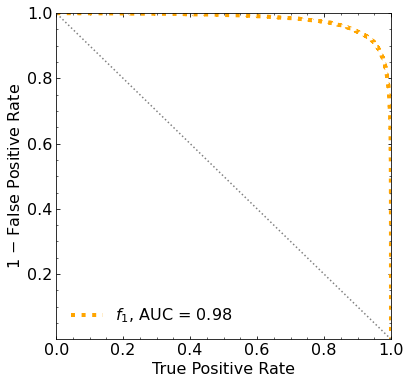

Classification score:


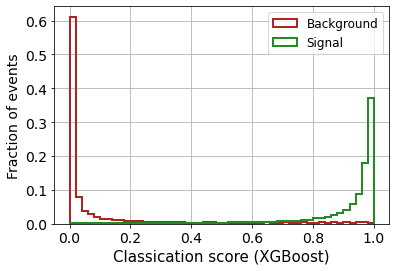


 ROC-AUC =  0.9795118086628941
At least 5 B events per bin, range = [[0, 1]]:
# bins:  16 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  16
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0725


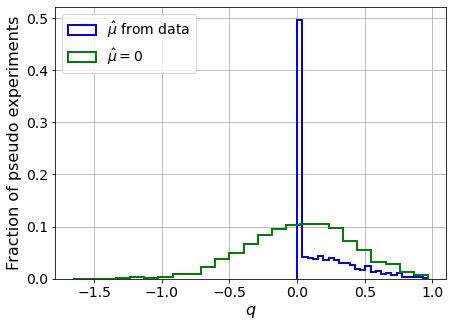

muhat mean:  0.2166385842861688
Z_bins:  0.20654347589075284
std Z_bins:  0.5337372397358511
Z_bins mu=0:  0.20645573207597434
std Z_bins mu=0:  0.9244038164768974

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0665


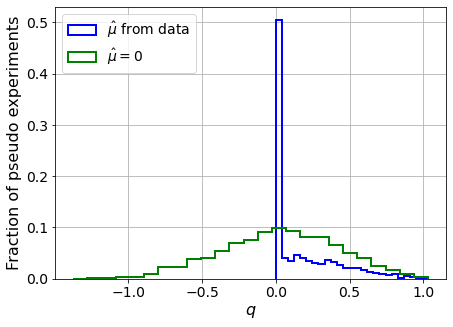

muhat mean:  0.2173232236976511
Z_bins:  0.19414614739046365
std Z_bins:  0.5962823918961516
Z_bins mu=0:  0.1936257204560083
std Z_bins mu=0:  1.034497273899404

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0725


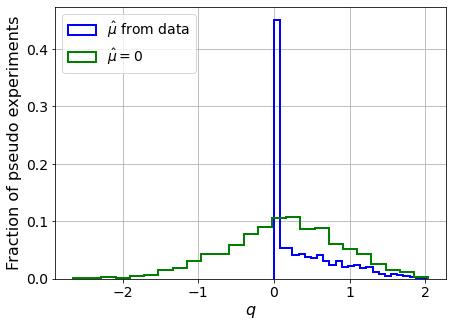

muhat mean:  0.1284811338048447
Z_bins:  0.3900675867985827
std Z_bins:  0.5930872470932188
Z_bins mu=0:  0.3891249087742187
std Z_bins mu=0:  0.9781212220846728

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0745


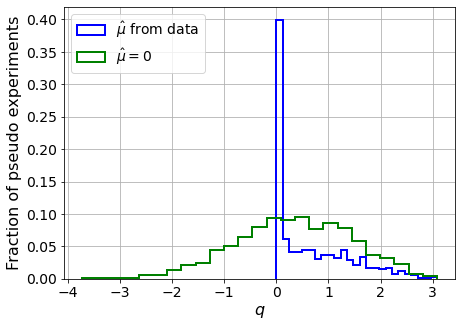

muhat mean:  0.0245145939221112
Z_bins:  0.6047713826117693
std Z_bins:  0.6050889760266545
Z_bins mu=0:  0.6047713826117693
std Z_bins mu=0:  0.910818733571318

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0845


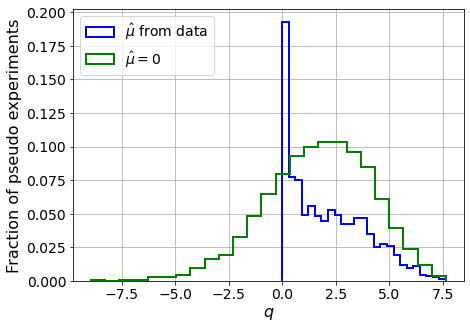

muhat mean:  0.011905826033940222
Z_bins:  1.357620335514906
std Z_bins:  0.6618377746582801
Z_bins mu=0:  1.357620335514906
std Z_bins mu=0:  0.8955562857397814

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.067


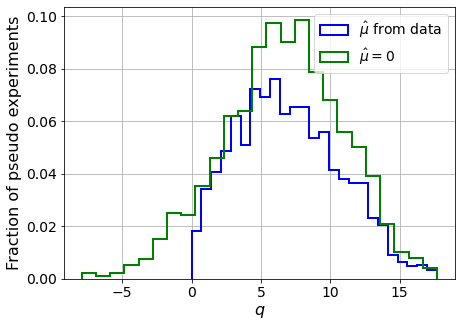

muhat mean:  0.0028085508269076165
Z_bins:  2.587722311631965
std Z_bins:  0.7140417675163601
Z_bins mu=0:  2.5875825438113416
std Z_bins mu=0:  0.8375639459973648

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0855


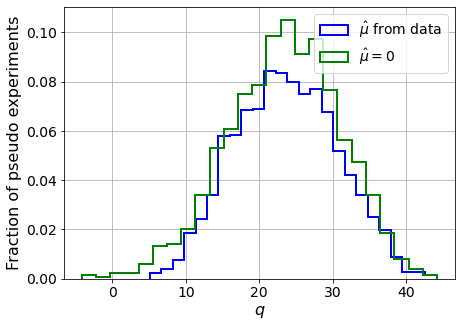

muhat mean:  -0.0044224174580548125
Z_bins:  4.852066573624902
std Z_bins:  0.7149883726527172
Z_bins mu=0:  4.852014820113623
std Z_bins mu=0:  0.7837398283840096

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0785


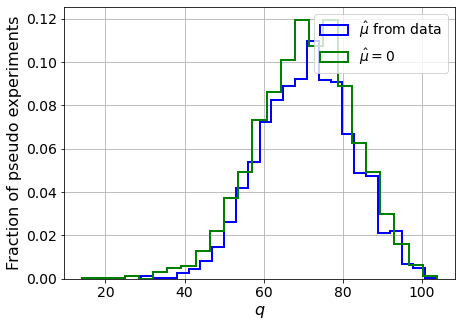

muhat mean:  2.6649624831296768e-05
Z_bins:  8.431137726190933
std Z_bins:  0.6803812563738015
Z_bins mu=0:  8.430870139913633
std Z_bins mu=0:  0.7270178163721622

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.079


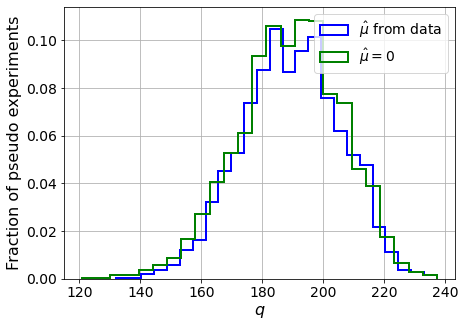

muhat mean:  0.0008084396617817585
Z_bins:  13.773141931152743
std Z_bins:  0.5891502709963186
Z_bins mu=0:  13.770720299364799
std Z_bins mu=0:  0.6158654511742203

--------

B_expected:  643
S_expected:  333

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0765


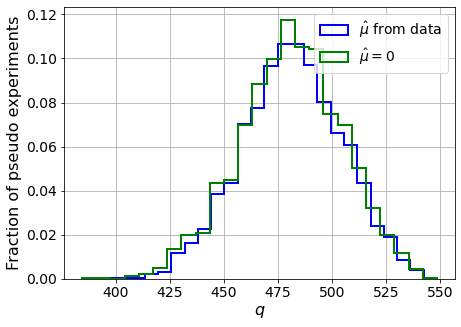

muhat mean:  0.00012104507843898755
Z_bins:  21.93999225371935
std Z_bins:  0.5285980707167266
Z_bins mu=0:  21.93877873223173
std Z_bins mu=0:  0.5440211115345637

--------


 FINAL RESULT:

[[0.20654347589075284, 0.5337372397358511, 0.2166385842861688, 0.20645573207597434, 0.9244038164768974], [0.19414614739046365, 0.5962823918961516, 0.2173232236976511, 0.1936257204560083, 1.034497273899404], [0.3900675867985827, 0.5930872470932188, 0.1284811338048447, 0.3891249087742187, 0.9781212220846728], [0.6047713826117693, 0.6050889760266545, 0.0245145939221112, 0.6047713826117693, 0.910818733571318], [1.357620335514906, 0.6618377746582801, 0.011905826033940222, 1.357620335514906, 0.8955562857397814], [2.587722311631965, 0.7140417675163601, 0.0028085508269076165, 2.5875825438113416, 0.8375639459973648], [4.852066573624902, 0.7149883726527172, -0.0044224174580548125, 4.852014820113623, 0.7837398283840096], [8.431137726190933, 0.6803812563738015, 2.6649624831296768e-05, 8.430870139913633, 0.727

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  353.28611924  325.69987345  290.41874187  248.56843331  199.14844032
  145.45977169   85.72106532   24.9595891   -39.16663247 -101.43710737]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 241.212860

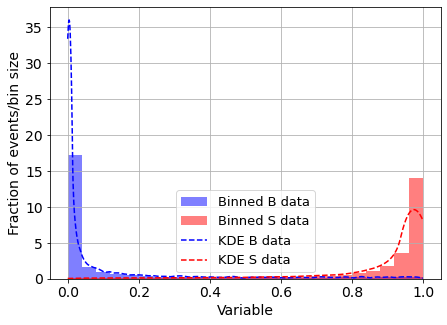

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



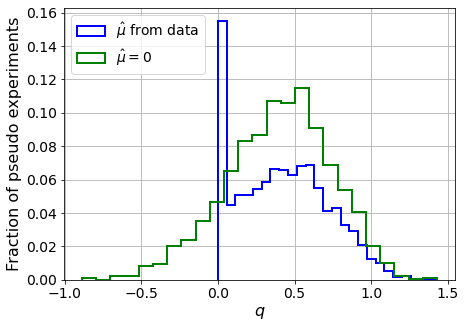

muhat mean:  -5.067185102011632
Z_bins:  0.645746961317621
std Z_bins:  0.2290463074077799
Z_bins mu=0:  0.645746961317621
std Z_bins mu=0:  0.26527702028201966

--------

B_expected:  643
S_expected:  1



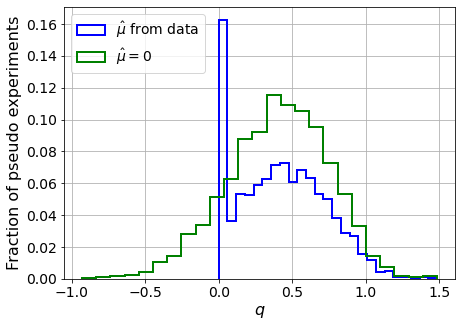

muhat mean:  -5.258182078051803
Z_bins:  0.6458387232618242
std Z_bins:  0.23039739085075434
Z_bins mu=0:  0.6458387232618242
std Z_bins mu=0:  0.2648938820402219

--------

B_expected:  643
S_expected:  2



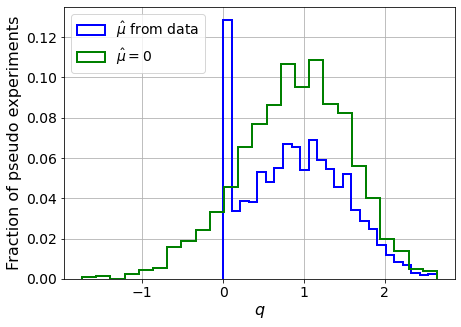

muhat mean:  -2.6578369784495957
Z_bins:  0.9537779800129658
std Z_bins:  0.3138266783502688
Z_bins mu=0:  0.9537779800129658
std Z_bins mu=0:  0.3564412158792576

--------

B_expected:  643
S_expected:  3



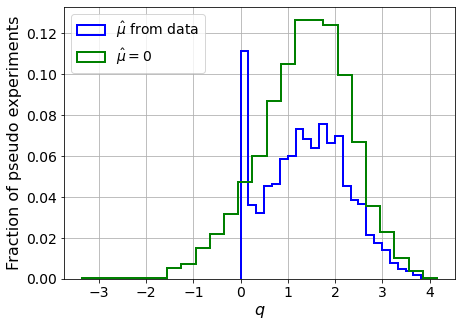

muhat mean:  -1.720810483300568
Z_bins:  1.1908154900281138
std Z_bins:  0.3603918822480453
Z_bins mu=0:  1.1908154900281138
std Z_bins mu=0:  0.40667578307758895

--------

B_expected:  643
S_expected:  7



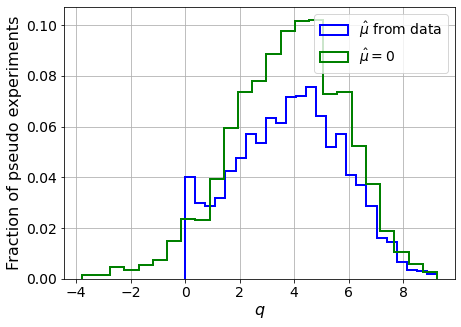

muhat mean:  -0.7126021195380758
Z_bins:  1.9810111699824011
std Z_bins:  0.48963031810802216
Z_bins mu=0:  1.9810111699824011
std Z_bins mu=0:  0.5265660641575313

--------

B_expected:  643
S_expected:  15



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


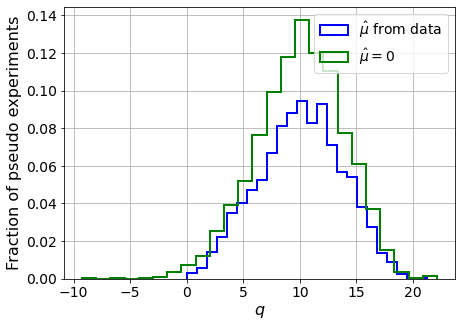

muhat mean:  -0.32357004613658913
Z_bins:  3.1892440185916997
std Z_bins:  0.5852055273824223
Z_bins mu=0:  3.1892440185916997
std Z_bins mu=0:  0.6107833140507007

--------

B_expected:  643
S_expected:  33



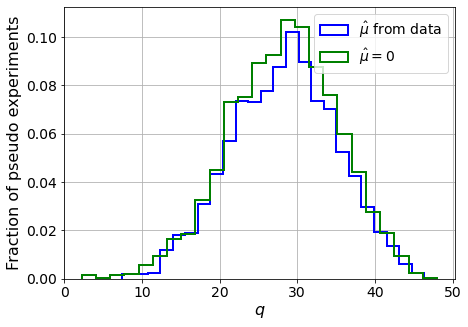

muhat mean:  -0.14819857388218496
Z_bins:  5.344730541210212
std Z_bins:  0.6365280621805233
Z_bins mu=0:  5.344730541210212
std Z_bins mu=0:  0.6511941713896778

--------

B_expected:  643
S_expected:  72



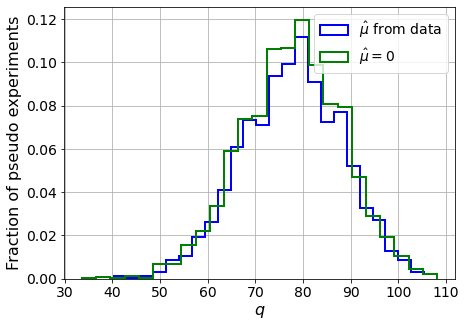

muhat mean:  -0.07352479351037883
Z_bins:  8.838021683411084
std Z_bins:  0.5956528310003344
Z_bins mu=0:  8.838021683411084
std Z_bins mu=0:  0.6034142511150653

--------

B_expected:  643
S_expected:  154



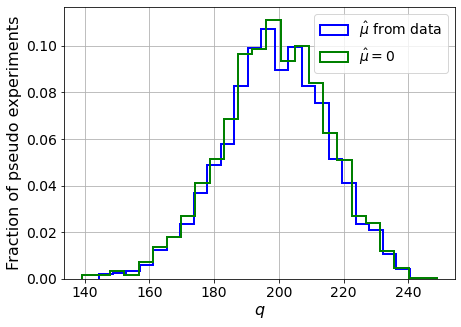

muhat mean:  -0.03366527522800516
Z_bins:  14.096543758940202
std Z_bins:  0.579870223444335
Z_bins mu=0:  14.096543758940202
std Z_bins mu=0:  0.5852597287451435

--------

B_expected:  643
S_expected:  333



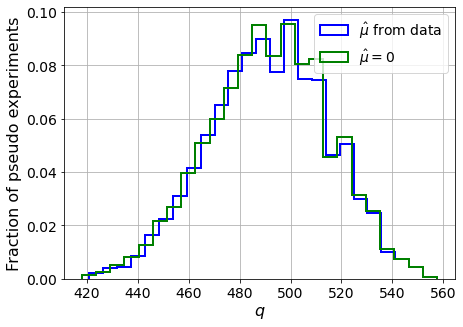

muhat mean:  -0.015377949214218763
Z_bins:  22.179858527343924
std Z_bins:  0.5270755831814776
Z_bins mu=0:  22.179154156709192
std Z_bins mu=0:  0.5296100876701293

--------


 FINAL RESULT:

[[0.645746961317621, 0.2290463074077799, -5.067185102011632, 0.645746961317621, 0.26527702028201966], [0.6458387232618242, 0.23039739085075434, -5.258182078051803, 0.6458387232618242, 0.2648938820402219], [0.9537779800129658, 0.3138266783502688, -2.6578369784495957, 0.9537779800129658, 0.3564412158792576], [1.1908154900281138, 0.3603918822480453, -1.720810483300568, 1.1908154900281138, 0.40667578307758895], [1.9810111699824011, 0.48963031810802216, -0.7126021195380758, 1.9810111699824011, 0.5265660641575313], [3.1892440185916997, 0.5852055273824223, -0.32357004613658913, 3.1892440185916997, 0.6107833140507007], [5.344730541210212, 0.6365280621805233, -0.14819857388218496, 5.344730541210212, 0.6511941713896778], [8.838021683411084, 0.5956528310003344, -0.07352479351037883, 8.838021683411084, 0.603

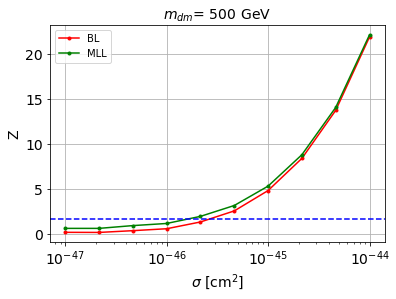


cross_BL_164:  2.5695237940291016e-46
cross_BL_164_up:  1.5034886245563445e-46
cross_BL_164_down:  3.986001087471023e-46

cross_MLL_164:  1.546971793218888e-46
cross_MLL_164_up:  1.076938845480751e-46
cross_MLL_164_down:  2.3870257623668345e-46

#########################



In [8]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    # set events per classs
    NUM_DAT = min(len(B_pbot_ER), len(S_pbot))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = round(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, round(NUM_DAT*f_CNNS))
    NUM_DAT_RN = round(NUM_DAT*f_RN)
    NUM_DAT_WALL = round(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    rnd = 100

    B_pbot_plot, B_ptop_plot = shuffle(B_pbot, B_ptop, random_state=rnd)
    S_pbot_plot, S_ptop_plot = shuffle(S_pbot, S_ptop, random_state=rnd)

    plt.plot(B_pbot_plot[:1000], B_ptop_plot[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_pbot_plot[:1000], S_ptop_plot[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)


    
    
    ############
    # DATASETS #
    ############
    
    # concatenate the data
    X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)), np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
    X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)), np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





   # OPTION 2 (mu_hat with more precision) (slower,
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)
    
    
    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [9]:
cross_17feats = store_cross_BL_164
cross_17feats_up = store_cross_BL_164_up
cross_17feats_down = store_cross_BL_164_down

print(cross_17feats)
print(cross_17feats_up)
print(cross_17feats_down)


cross_17feats_MLL = store_cross_MLL_164
cross_17feats_MLL_up = store_cross_MLL_164_up
cross_17feats_MLL_down = store_cross_MLL_164_down

print(cross_17feats_MLL)
print(cross_17feats_MLL_up)
print(cross_17feats_MLL_down)

[1.1921380553095506e-45, 7.172024351992003e-47, 4.164388018547998e-47, 3.929723302158781e-47, 6.051144616296036e-47, 1.0796155935446134e-46, 2.5695237940291016e-46]
[7.642175232881826e-46, 4.2923298588336504e-47, 2.4268628526436137e-47, 2.4339208919402607e-47, 3.664391595037674e-47, 5.863657734676839e-47, 1.5034886245563445e-46]
[1.7476913269870204e-45, 1.163824751870734e-46, 5.8293530394912795e-47, 5.932757476475655e-47, 9.152654947840858e-47, 1.6060338724233276e-46, 3.986001087471023e-46]
[6.6697726162710664e-46, 4.899522441860332e-47, 2.162758944728191e-47, 2.255226791059627e-47, 2.92635654687206e-47, 5.440387722644148e-47, 1.546971793218888e-46]
[4.744754400893837e-46, 2.6805893575604877e-47, 1.2862115111904193e-47, 1.4023013522120133e-47, 1.943583415584619e-47, 3.221099583993316e-47, 1.076938845480751e-46]
[1.0295484785935365e-45, 7.088624451164456e-47, 3.436279580475698e-47, 3.288664951450769e-47, 4.780919421767503e-47, 8.791640875084376e-47, 2.3870257623668345e-46]


In [35]:
np.savetxt('results/17feats.txt', [cross_17feats, cross_17feats_up, cross_17feats_down])
np.savetxt('results/17feats_MLL.txt', [cross_17feats_MLL, cross_17feats_MLL_up, cross_17feats_MLL_down])

In [36]:
cross_17feats = np.loadtxt('results/17feats.txt')[0]
cross_17feats_up = np.loadtxt('results/17feats.txt')[1]
cross_17feats_down =np.loadtxt('results/17feats.txt')[2]

cross_17feats_MLL = np.loadtxt('results/17feats_MLL.txt')[0]
cross_17feats_MLL_up = np.loadtxt('results/17feats_MLL.txt')[1]
cross_17feats_MLL_down = np.loadtxt('results/17feats_MLL.txt')[2]

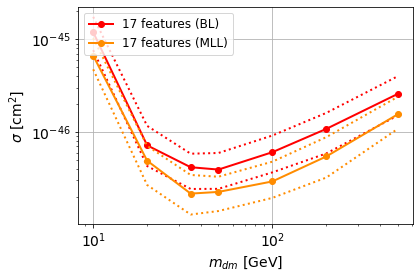

In [37]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_17feats, '-o', color='red', lw=lw, label=r'17 features (BL)')
plt.plot(mDM_mDM, cross_17feats_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_17feats_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_17feats_MLL, '-o', color='darkorange', lw=lw, label=r'17 features (MLL)')
plt.plot(mDM_mDM, cross_17feats_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_17feats_MLL_down, ':', color='darkorange', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

## 2. 16 features (no time diff)


#########################

mDM =  10 GeV


S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)
 NUM_DAT:  20487 

NUM_DAT_ER:  20225
NUM_DAT_AC:  72
NUM_DAT_CNNS:  1
NUM_DAT_RN:  19
NUM_DAT_WALL:  170

B_pbot.shape:  (20487,)
B_ptop.shape:  (20487,)
B_ppeakS1.shape : (20487, 8)
B_ppeakS2.shape:  (20487, 8)

S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)


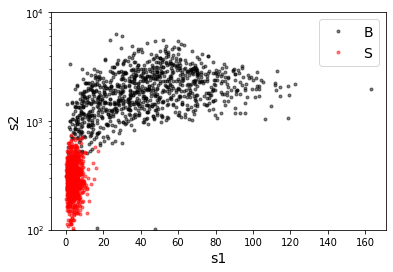

B_pdiffT.shape:  (20487,)
S_pdiffT.shape:  (20487,)


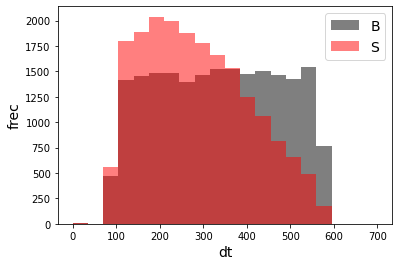

B_pbot.shape:  (20487,)
B_ptop.shape:  (20487,)
B_ppeakS1.shape : (20487, 7)
B_ppeakS2.shape:  (20487, 7)
S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 7)
S_ppeakS2.shape:  (20487, 7)
X_mon_B.shape:  (20487, 16)
X_mon_S.shape:  (20487, 16)
X_mon.shape:  (40974, 16)

X_mon_train :  (26120, 16)
y_mon_train :  (26120,)
X_mon_val :  (4610, 16)
y_mon_val :  (4610,)
X_mon_test :  (10244, 16)
y_mon_test :  (10244,)

[0]	validation_0-logloss:0.68361	validation_1-logloss:0.68366
[1]	validation_0-logloss:0.67426	validation_1-logloss:0.67436
[2]	validation_0-logloss:0.66508	validation_1-logloss:0.66524
[3]	validation_0-logloss:0.65609	validation_1-logloss:0.65629
[4]	validation_0-logloss:0.64727	validation_1-logloss:0.64753
[5]	validation_0-logloss:0.63861	validation_1-logloss:0.63892


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[6]	validation_0-logloss:0.63012	validation_1-logloss:0.63048
[7]	validation_0-logloss:0.62179	validation_1-logloss:0.62220
[8]	validation_0-logloss:0.61362	validation_1-logloss:0.61409
[9]	validation_0-logloss:0.60559	validation_1-logloss:0.60611
[10]	validation_0-logloss:0.59772	validation_1-logloss:0.59828
[11]	validation_0-logloss:0.58997	validation_1-logloss:0.59061
[12]	validation_0-logloss:0.58237	validation_1-logloss:0.58308
[13]	validation_0-logloss:0.57490	validation_1-logloss:0.57568
[14]	validation_0-logloss:0.56757	validation_1-logloss:0.56839
[15]	validation_0-logloss:0.56036	validation_1-logloss:0.56124
[16]	validation_0-logloss:0.55328	validation_1-logloss:0.55422
[17]	validation_0-logloss:0.54632	validation_1-logloss:0.54731
[18]	validation_0-logloss:0.53949	validation_1-logloss:0.54053
[19]	validation_0-logloss:0.53276	validation_1-logloss:0.53386
[20]	validation_0-logloss:0.52614	validation_1-logloss:0.52729
[21]	validation_0-logloss:0.51963	validation_1-logloss:0.52

[136]	validation_0-logloss:0.15771	validation_1-logloss:0.16246
[137]	validation_0-logloss:0.15633	validation_1-logloss:0.16110
[138]	validation_0-logloss:0.15496	validation_1-logloss:0.15976
[139]	validation_0-logloss:0.15361	validation_1-logloss:0.15843
[140]	validation_0-logloss:0.15227	validation_1-logloss:0.15712
[141]	validation_0-logloss:0.15095	validation_1-logloss:0.15583
[142]	validation_0-logloss:0.14964	validation_1-logloss:0.15454
[143]	validation_0-logloss:0.14835	validation_1-logloss:0.15327
[144]	validation_0-logloss:0.14706	validation_1-logloss:0.15200
[145]	validation_0-logloss:0.14579	validation_1-logloss:0.15077
[146]	validation_0-logloss:0.14454	validation_1-logloss:0.14954
[147]	validation_0-logloss:0.14331	validation_1-logloss:0.14834
[148]	validation_0-logloss:0.14208	validation_1-logloss:0.14714
[149]	validation_0-logloss:0.14087	validation_1-logloss:0.14597
[150]	validation_0-logloss:0.13967	validation_1-logloss:0.14478
[151]	validation_0-logloss:0.13849	valid

[265]	validation_0-logloss:0.06143	validation_1-logloss:0.06916
[266]	validation_0-logloss:0.06109	validation_1-logloss:0.06885
[267]	validation_0-logloss:0.06074	validation_1-logloss:0.06855
[268]	validation_0-logloss:0.06040	validation_1-logloss:0.06825
[269]	validation_0-logloss:0.06006	validation_1-logloss:0.06794
[270]	validation_0-logloss:0.05973	validation_1-logloss:0.06765
[271]	validation_0-logloss:0.05940	validation_1-logloss:0.06735
[272]	validation_0-logloss:0.05907	validation_1-logloss:0.06706
[273]	validation_0-logloss:0.05875	validation_1-logloss:0.06676
[274]	validation_0-logloss:0.05843	validation_1-logloss:0.06647
[275]	validation_0-logloss:0.05811	validation_1-logloss:0.06618
[276]	validation_0-logloss:0.05780	validation_1-logloss:0.06590
[277]	validation_0-logloss:0.05749	validation_1-logloss:0.06562
[278]	validation_0-logloss:0.05719	validation_1-logloss:0.06534
[279]	validation_0-logloss:0.05688	validation_1-logloss:0.06507
[280]	validation_0-logloss:0.05658	valid

[394]	validation_0-logloss:0.03605	validation_1-logloss:0.04642
[395]	validation_0-logloss:0.03595	validation_1-logloss:0.04634
[396]	validation_0-logloss:0.03586	validation_1-logloss:0.04626
[397]	validation_0-logloss:0.03576	validation_1-logloss:0.04619
[398]	validation_0-logloss:0.03566	validation_1-logloss:0.04611
[399]	validation_0-logloss:0.03556	validation_1-logloss:0.04604
[400]	validation_0-logloss:0.03546	validation_1-logloss:0.04596
[401]	validation_0-logloss:0.03537	validation_1-logloss:0.04589
[402]	validation_0-logloss:0.03528	validation_1-logloss:0.04582
[403]	validation_0-logloss:0.03519	validation_1-logloss:0.04575
[404]	validation_0-logloss:0.03510	validation_1-logloss:0.04568
[405]	validation_0-logloss:0.03501	validation_1-logloss:0.04560
[406]	validation_0-logloss:0.03492	validation_1-logloss:0.04553
[407]	validation_0-logloss:0.03483	validation_1-logloss:0.04546
[408]	validation_0-logloss:0.03475	validation_1-logloss:0.04539
[409]	validation_0-logloss:0.03466	valid

[523]	validation_0-logloss:0.02807	validation_1-logloss:0.04043
[524]	validation_0-logloss:0.02804	validation_1-logloss:0.04040
[525]	validation_0-logloss:0.02801	validation_1-logloss:0.04037
[526]	validation_0-logloss:0.02797	validation_1-logloss:0.04036
[527]	validation_0-logloss:0.02792	validation_1-logloss:0.04034
[528]	validation_0-logloss:0.02788	validation_1-logloss:0.04031
[529]	validation_0-logloss:0.02784	validation_1-logloss:0.04029
[530]	validation_0-logloss:0.02780	validation_1-logloss:0.04028
[531]	validation_0-logloss:0.02776	validation_1-logloss:0.04027
[532]	validation_0-logloss:0.02772	validation_1-logloss:0.04026
[533]	validation_0-logloss:0.02769	validation_1-logloss:0.04025
[534]	validation_0-logloss:0.02765	validation_1-logloss:0.04023
[535]	validation_0-logloss:0.02760	validation_1-logloss:0.04018
[536]	validation_0-logloss:0.02757	validation_1-logloss:0.04016
[537]	validation_0-logloss:0.02753	validation_1-logloss:0.04015
[538]	validation_0-logloss:0.02751	valid

[652]	validation_0-logloss:0.02451	validation_1-logloss:0.03873
[653]	validation_0-logloss:0.02449	validation_1-logloss:0.03872
[654]	validation_0-logloss:0.02447	validation_1-logloss:0.03872
[655]	validation_0-logloss:0.02446	validation_1-logloss:0.03871
[656]	validation_0-logloss:0.02443	validation_1-logloss:0.03870
[657]	validation_0-logloss:0.02441	validation_1-logloss:0.03870
[658]	validation_0-logloss:0.02439	validation_1-logloss:0.03869
[659]	validation_0-logloss:0.02437	validation_1-logloss:0.03867
[660]	validation_0-logloss:0.02436	validation_1-logloss:0.03866
[661]	validation_0-logloss:0.02433	validation_1-logloss:0.03865
[662]	validation_0-logloss:0.02431	validation_1-logloss:0.03863
[663]	validation_0-logloss:0.02429	validation_1-logloss:0.03862
[664]	validation_0-logloss:0.02427	validation_1-logloss:0.03861
[665]	validation_0-logloss:0.02425	validation_1-logloss:0.03859
[666]	validation_0-logloss:0.02423	validation_1-logloss:0.03858
[667]	validation_0-logloss:0.02421	valid

[781]	validation_0-logloss:0.02234	validation_1-logloss:0.03818
[782]	validation_0-logloss:0.02231	validation_1-logloss:0.03817
[783]	validation_0-logloss:0.02229	validation_1-logloss:0.03818
[784]	validation_0-logloss:0.02228	validation_1-logloss:0.03818
[785]	validation_0-logloss:0.02227	validation_1-logloss:0.03817
[786]	validation_0-logloss:0.02226	validation_1-logloss:0.03817
[787]	validation_0-logloss:0.02224	validation_1-logloss:0.03816
[788]	validation_0-logloss:0.02221	validation_1-logloss:0.03817
[789]	validation_0-logloss:0.02220	validation_1-logloss:0.03816
[790]	validation_0-logloss:0.02218	validation_1-logloss:0.03816
[791]	validation_0-logloss:0.02217	validation_1-logloss:0.03816
[792]	validation_0-logloss:0.02215	validation_1-logloss:0.03816
[793]	validation_0-logloss:0.02214	validation_1-logloss:0.03817
[794]	validation_0-logloss:0.02212	validation_1-logloss:0.03816
[795]	validation_0-logloss:0.02210	validation_1-logloss:0.03815
[796]	validation_0-logloss:0.02209	valid

[910]	validation_0-logloss:0.02058	validation_1-logloss:0.03805
[911]	validation_0-logloss:0.02057	validation_1-logloss:0.03805
[912]	validation_0-logloss:0.02056	validation_1-logloss:0.03805
[913]	validation_0-logloss:0.02054	validation_1-logloss:0.03805
[914]	validation_0-logloss:0.02053	validation_1-logloss:0.03806
[915]	validation_0-logloss:0.02052	validation_1-logloss:0.03805
[916]	validation_0-logloss:0.02052	validation_1-logloss:0.03805
[917]	validation_0-logloss:0.02049	validation_1-logloss:0.03806
[918]	validation_0-logloss:0.02049	validation_1-logloss:0.03806
[919]	validation_0-logloss:0.02047	validation_1-logloss:0.03806
[920]	validation_0-logloss:0.02046	validation_1-logloss:0.03806
[921]	validation_0-logloss:0.02044	validation_1-logloss:0.03806
[922]	validation_0-logloss:0.02043	validation_1-logloss:0.03806
[923]	validation_0-logloss:0.02042	validation_1-logloss:0.03807
[924]	validation_0-logloss:0.02041	validation_1-logloss:0.03807
[925]	validation_0-logloss:0.02040	valid

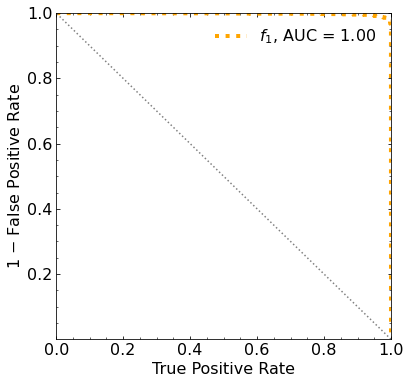

Classification score:


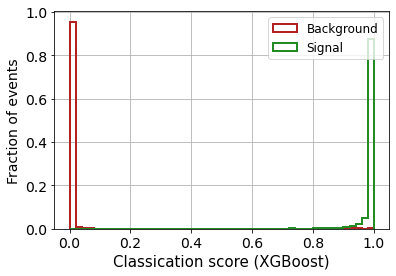


 ROC-AUC =  0.9980858835700035
At least 5 B events per bin, range = [[0, 1]]:
# bins:  3 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  3
range of our data:  [[0, 1]]
number of bins we are going to use:  3
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.318


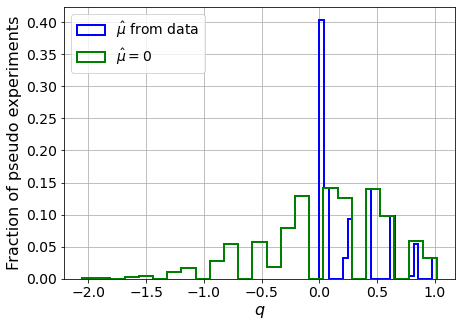

muhat mean:  0.21916901461498248
Z_bins:  0.24467760807835362
std Z_bins:  0.6064797154727395
Z_bins mu=0:  0.23675535185001367
std Z_bins mu=0:  1.1338829943581434

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2895


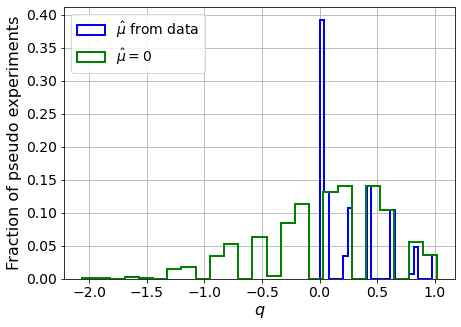

muhat mean:  0.19663729519202974
Z_bins:  0.24734762928304352
std Z_bins:  0.6011255271447187
Z_bins mu=0:  0.24016621731921997
std Z_bins mu=0:  1.1280805199714077

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3195


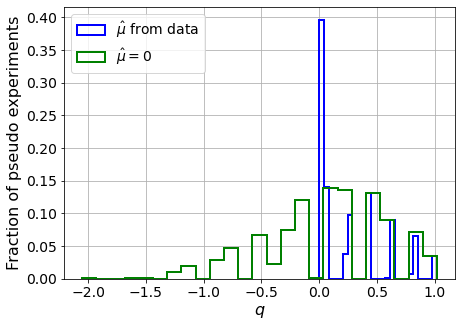

muhat mean:  0.15748474085997613
Z_bins:  0.24805127366603874
std Z_bins:  0.6083516164088318
Z_bins mu=0:  0.24105718640252788
std Z_bins mu=0:  1.0994719149007406

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3225


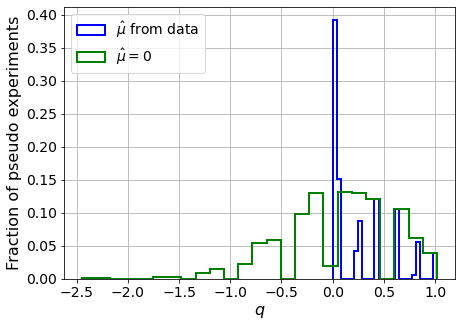

muhat mean:  0.11549365019821699
Z_bins:  0.24493576004557116
std Z_bins:  0.6198449836780304
Z_bins mu=0:  0.23708712925951783
std Z_bins mu=0:  1.108610990060827

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3115


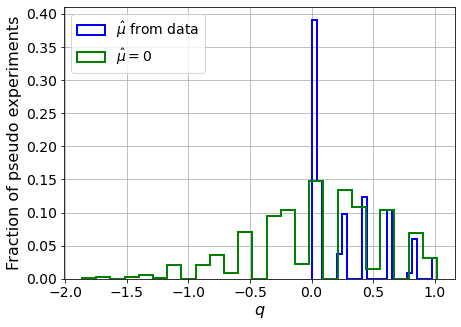

muhat mean:  0.12427030006024264
Z_bins:  0.24479495098444382
std Z_bins:  0.6119419325580024
Z_bins mu=0:  0.23690621736372544
std Z_bins mu=0:  1.1027318927501981

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2975


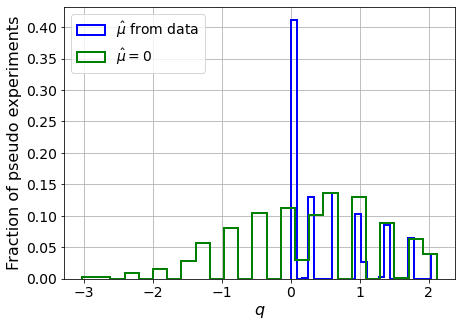

muhat mean:  0.11464227638220402
Z_bins:  0.5327392600378471
std Z_bins:  0.5958716000684213
Z_bins mu=0:  0.5291129401044636
std Z_bins mu=0:  0.9637644939504847

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3215


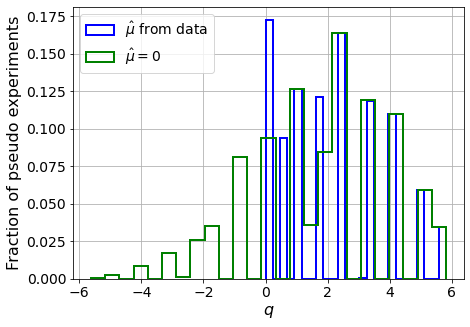

muhat mean:  0.01802459317795096
Z_bins:  1.3171607921404085
std Z_bins:  0.6240275439437947
Z_bins mu=0:  1.315879681504724
std Z_bins mu=0:  0.8285090599655832

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.317


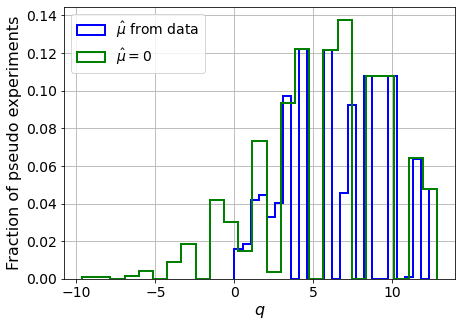

muhat mean:  0.019713030356712093
Z_bins:  2.416376356074682
std Z_bins:  0.6898242603121313
Z_bins mu=0:  2.415646232765826
std Z_bins mu=0:  0.8330179949611426

--------

B_expected:  643
S_expected:  22

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3285


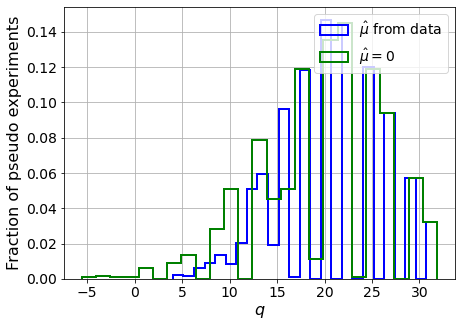

muhat mean:  0.012494322713402076
Z_bins:  4.4829651978828595
std Z_bins:  0.637879678022833
Z_bins mu=0:  4.482528755088871
std Z_bins mu=0:  0.7174621480145705

--------

B_expected:  643
S_expected:  47

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2995


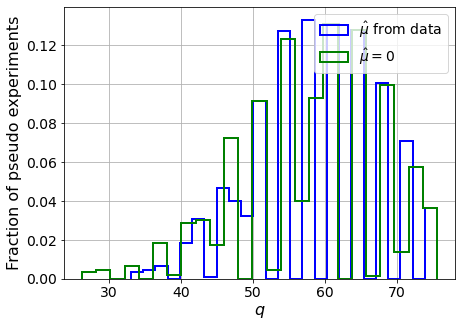

muhat mean:  0.0031148512402312907
Z_bins:  7.617751572390383
std Z_bins:  0.5945758092883223
Z_bins mu=0:  7.617524237624419
std Z_bins mu=0:  0.6396703536359722

--------


 FINAL RESULT:

[[0.24467760807835362, 0.6064797154727395, 0.21916901461498248, 0.23675535185001367, 1.1338829943581434], [0.24734762928304352, 0.6011255271447187, 0.19663729519202974, 0.24016621731921997, 1.1280805199714077], [0.24805127366603874, 0.6083516164088318, 0.15748474085997613, 0.24105718640252788, 1.0994719149007406], [0.24493576004557116, 0.6198449836780304, 0.11549365019821699, 0.23708712925951783, 1.108610990060827], [0.24479495098444382, 0.6119419325580024, 0.12427030006024264, 0.23690621736372544, 1.1027318927501981], [0.5327392600378471, 0.5958716000684213, 0.11464227638220402, 0.5291129401044636, 0.9637644939504847], [1.3171607921404085, 0.6240275439437947, 0.01802459317795096, 1.315879681504724, 0.8285090599655832], [2.416376356074682, 0.6898242603121313, 0.019713030356712093, 2.415646232765826

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 190.08583491  99.22186546   6.43929092 -84.21982181]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 353.71870165
 272

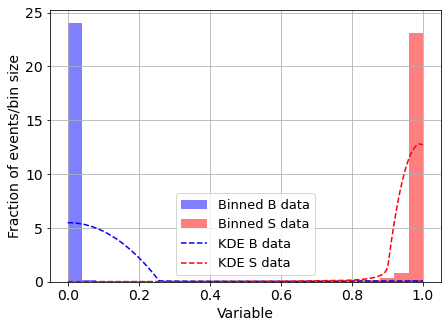

KDE Kernel:  epanechnikov
Background bandwidth:  0.257351270001691
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



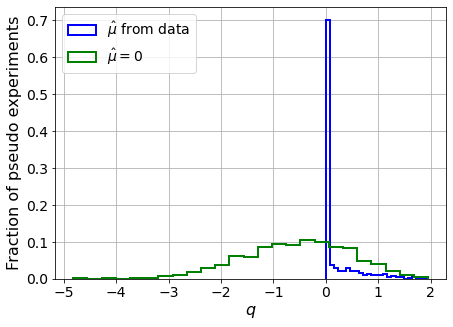

/media/andres/disco1tera/ubuntu/Trabajo/Direct-Detection/xenon1t-classifier/clasificadores-h5-2024/02-limits/AUX_MLL_BL.py:1268: RuntimeWarning: divide by zero encountered in double_scalars
  Z_MLL_std = np.std(q_muhat_MLL) / (2.*Z_MLL)


muhat mean:  1.1323026817824453
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.6994648459205675
std Z_bins mu=0:  0.7339731819228831

--------

B_expected:  643
S_expected:  1



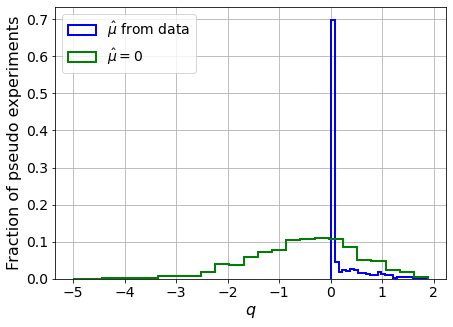

muhat mean:  1.641568579322775
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.663413727281677
std Z_bins mu=0:  0.7796304065024663

--------

B_expected:  643
S_expected:  1



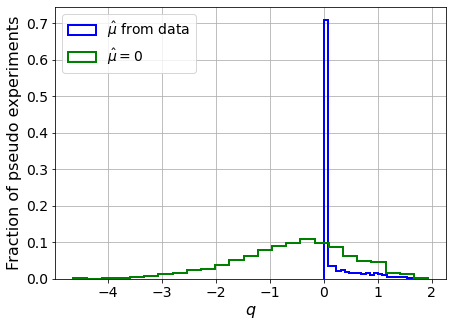

muhat mean:  1.6397731728933513
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.689331497608452
std Z_bins mu=0:  0.765418592480693

--------

B_expected:  643
S_expected:  1



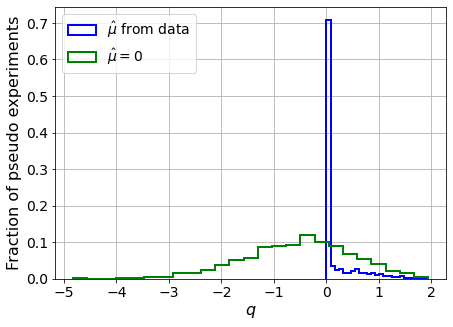

muhat mean:  1.5159805923077525
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.6758028118618101
std Z_bins mu=0:  0.7619449754164109

--------

B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


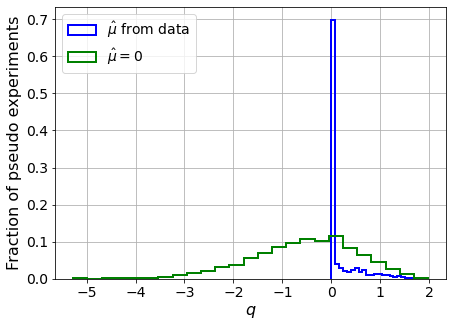

muhat mean:  1.7353796642593797
Z_bins:  0.0
std Z_bins:  inf
Z_bins mu=0:  0.6873349886489846
std Z_bins mu=0:  0.7856635448629262

--------

B_expected:  643
S_expected:  2



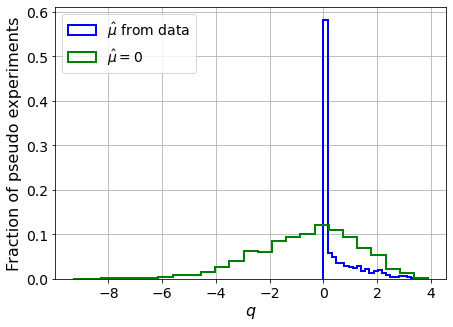

muhat mean:  0.8553406980597994
Z_bins:  0.207838493158563
std Z_bins:  1.7953818241245165
Z_bins mu=0:  0.6350969588956937
std Z_bins mu=0:  1.4748856358931963

--------

B_expected:  643
S_expected:  5



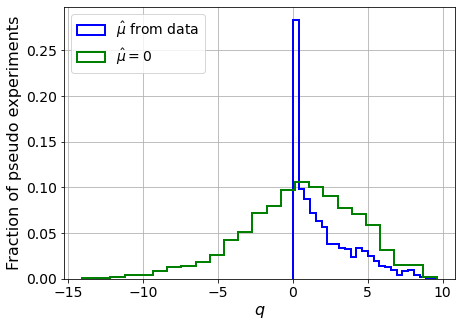

muhat mean:  0.32049582438908153
Z_bins:  1.1397318689184814
std Z_bins:  0.9092899983584831
Z_bins mu=0:  0.8620092376458437
std Z_bins mu=0:  2.213411440059694

--------

B_expected:  643
S_expected:  10



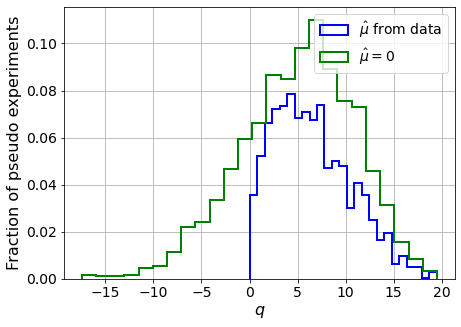

muhat mean:  0.12566491158943255
Z_bins:  2.4436551108144653
std Z_bins:  0.8193723294126977
Z_bins mu=0:  2.3169867383709755
std Z_bins mu=0:  1.2736220525011501

--------

B_expected:  643
S_expected:  22



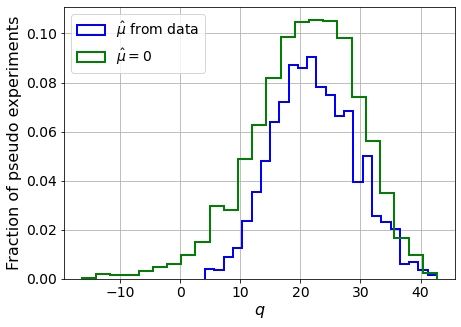

muhat mean:  0.07767286390984074
Z_bins:  4.693021770647661
std Z_bins:  0.7247192613828055
Z_bins mu=0:  4.637039244774774
std Z_bins mu=0:  0.9526221997068872

--------

B_expected:  643
S_expected:  47



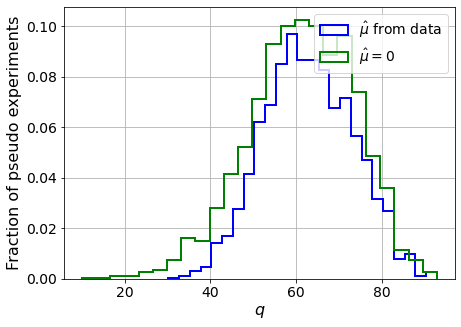

muhat mean:  0.0315092469384575
Z_bins:  7.913403556620632
std Z_bins:  0.65476456662486
Z_bins mu=0:  7.860360348662969
std Z_bins mu=0:  0.7827286272114472

--------


 FINAL RESULT:

[[0.0, inf, 1.1323026817824453, 0.6994648459205675, 0.7339731819228831], [0.0, inf, 1.641568579322775, 0.663413727281677, 0.7796304065024663], [0.0, inf, 1.6397731728933513, 0.689331497608452, 0.765418592480693], [0.0, inf, 1.5159805923077525, 0.6758028118618101, 0.7619449754164109], [0.0, inf, 1.7353796642593797, 0.6873349886489846, 0.7856635448629262], [0.207838493158563, 1.7953818241245165, 0.8553406980597994, 0.6350969588956937, 1.4748856358931963], [1.1397318689184814, 0.9092899983584831, 0.32049582438908153, 0.8620092376458437, 2.213411440059694], [2.4436551108144653, 0.8193723294126977, 0.12566491158943255, 2.3169867383709755, 1.2736220525011501], [4.693021770647661, 0.7247192613828055, 0.07767286390984074, 4.637039244774774, 0.9526221997068872], [7.913403556620632, 0.65476456662486, 0.0315092469

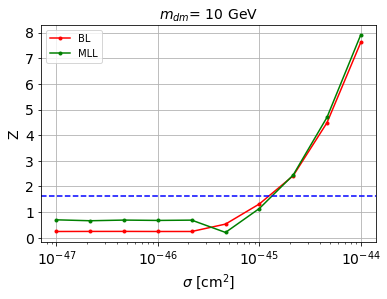


cross_BL_164:  1.3035379695088841e-45
cross_BL_164_up:  7.815149532354439e-46
cross_BL_164_down:  2.05980093389852e-45

cross_MLL_164:  1.3881892084988637e-45
cross_MLL_164_up:  2.8001479678331683e-46
cross_MLL_164_down:  2.1696307020021157e-45

#########################


#########################

mDM =  20 GeV


S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)
 NUM_DAT:  27311 

NUM_DAT_ER:  26962
NUM_DAT_AC:  96
NUM_DAT_CNNS:  1
NUM_DAT_RN:  25
NUM_DAT_WALL:  227

B_pbot.shape:  (27311,)
B_ptop.shape:  (27311,)
B_ppeakS1.shape : (27311, 8)
B_ppeakS2.shape:  (27311, 8)

S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)


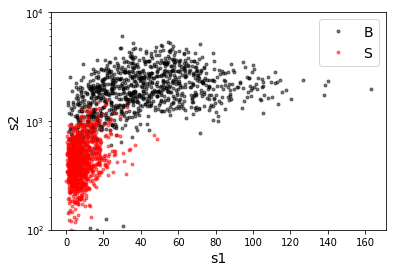

B_pdiffT.shape:  (27311,)
S_pdiffT.shape:  (27311,)


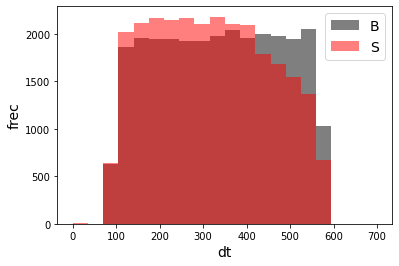

B_pbot.shape:  (27311,)
B_ptop.shape:  (27311,)
B_ppeakS1.shape : (27311, 7)
B_ppeakS2.shape:  (27311, 7)
S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 7)
S_ppeakS2.shape:  (27311, 7)
X_mon_B.shape:  (27311, 16)
X_mon_S.shape:  (27311, 16)
X_mon.shape:  (54622, 16)

X_mon_train :  (34821, 16)
y_mon_train :  (34821,)
X_mon_val :  (6145, 16)
y_mon_val :  (6145,)
X_mon_test :  (13656, 16)
y_mon_test :  (13656,)

[0]	validation_0-logloss:0.68474	validation_1-logloss:0.68479
[1]	validation_0-logloss:0.67648	validation_1-logloss:0.67660
[2]	validation_0-logloss:0.66839	validation_1-logloss:0.66856
[3]	validation_0-logloss:0.66045	validation_1-logloss:0.66068
[4]	validation_0-logloss:0.65267	validation_1-logloss:0.65296
[5]	validation_0-logloss:0.64504	validation_1-logloss:0.64538


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[6]	validation_0-logloss:0.63755	validation_1-logloss:0.63794
[7]	validation_0-logloss:0.63018	validation_1-logloss:0.63063
[8]	validation_0-logloss:0.62297	validation_1-logloss:0.62346
[9]	validation_0-logloss:0.61589	validation_1-logloss:0.61644
[10]	validation_0-logloss:0.60894	validation_1-logloss:0.60954
[11]	validation_0-logloss:0.60211	validation_1-logloss:0.60274
[12]	validation_0-logloss:0.59539	validation_1-logloss:0.59609
[13]	validation_0-logloss:0.58881	validation_1-logloss:0.58954
[14]	validation_0-logloss:0.58232	validation_1-logloss:0.58310
[15]	validation_0-logloss:0.57596	validation_1-logloss:0.57679
[16]	validation_0-logloss:0.56971	validation_1-logloss:0.57059
[17]	validation_0-logloss:0.56356	validation_1-logloss:0.56448
[18]	validation_0-logloss:0.55750	validation_1-logloss:0.55848
[19]	validation_0-logloss:0.55157	validation_1-logloss:0.55258
[20]	validation_0-logloss:0.54573	validation_1-logloss:0.54680
[21]	validation_0-logloss:0.54001	validation_1-logloss:0.54

[136]	validation_0-logloss:0.22090	validation_1-logloss:0.22520
[137]	validation_0-logloss:0.21969	validation_1-logloss:0.22402
[138]	validation_0-logloss:0.21849	validation_1-logloss:0.22284
[139]	validation_0-logloss:0.21732	validation_1-logloss:0.22168
[140]	validation_0-logloss:0.21615	validation_1-logloss:0.22053
[141]	validation_0-logloss:0.21501	validation_1-logloss:0.21939
[142]	validation_0-logloss:0.21387	validation_1-logloss:0.21827
[143]	validation_0-logloss:0.21274	validation_1-logloss:0.21716
[144]	validation_0-logloss:0.21164	validation_1-logloss:0.21607
[145]	validation_0-logloss:0.21053	validation_1-logloss:0.21497
[146]	validation_0-logloss:0.20943	validation_1-logloss:0.21389
[147]	validation_0-logloss:0.20835	validation_1-logloss:0.21282
[148]	validation_0-logloss:0.20728	validation_1-logloss:0.21177
[149]	validation_0-logloss:0.20622	validation_1-logloss:0.21073
[150]	validation_0-logloss:0.20518	validation_1-logloss:0.20970
[151]	validation_0-logloss:0.20417	valid

[265]	validation_0-logloss:0.13771	validation_1-logloss:0.14454
[266]	validation_0-logloss:0.13741	validation_1-logloss:0.14425
[267]	validation_0-logloss:0.13710	validation_1-logloss:0.14396
[268]	validation_0-logloss:0.13679	validation_1-logloss:0.14369
[269]	validation_0-logloss:0.13649	validation_1-logloss:0.14342
[270]	validation_0-logloss:0.13620	validation_1-logloss:0.14314
[271]	validation_0-logloss:0.13592	validation_1-logloss:0.14289
[272]	validation_0-logloss:0.13562	validation_1-logloss:0.14261
[273]	validation_0-logloss:0.13534	validation_1-logloss:0.14236
[274]	validation_0-logloss:0.13507	validation_1-logloss:0.14211
[275]	validation_0-logloss:0.13478	validation_1-logloss:0.14184
[276]	validation_0-logloss:0.13451	validation_1-logloss:0.14159
[277]	validation_0-logloss:0.13425	validation_1-logloss:0.14134
[278]	validation_0-logloss:0.13398	validation_1-logloss:0.14108
[279]	validation_0-logloss:0.13371	validation_1-logloss:0.14083
[280]	validation_0-logloss:0.13346	valid

[394]	validation_0-logloss:0.11482	validation_1-logloss:0.12404
[395]	validation_0-logloss:0.11472	validation_1-logloss:0.12397
[396]	validation_0-logloss:0.11462	validation_1-logloss:0.12389
[397]	validation_0-logloss:0.11452	validation_1-logloss:0.12381
[398]	validation_0-logloss:0.11442	validation_1-logloss:0.12374
[399]	validation_0-logloss:0.11434	validation_1-logloss:0.12368
[400]	validation_0-logloss:0.11423	validation_1-logloss:0.12359
[401]	validation_0-logloss:0.11413	validation_1-logloss:0.12350
[402]	validation_0-logloss:0.11404	validation_1-logloss:0.12343
[403]	validation_0-logloss:0.11393	validation_1-logloss:0.12336
[404]	validation_0-logloss:0.11384	validation_1-logloss:0.12328
[405]	validation_0-logloss:0.11373	validation_1-logloss:0.12321
[406]	validation_0-logloss:0.11363	validation_1-logloss:0.12312
[407]	validation_0-logloss:0.11353	validation_1-logloss:0.12303
[408]	validation_0-logloss:0.11343	validation_1-logloss:0.12295
[409]	validation_0-logloss:0.11334	valid

[523]	validation_0-logloss:0.10630	validation_1-logloss:0.11788
[524]	validation_0-logloss:0.10626	validation_1-logloss:0.11785
[525]	validation_0-logloss:0.10622	validation_1-logloss:0.11781
[526]	validation_0-logloss:0.10617	validation_1-logloss:0.11777
[527]	validation_0-logloss:0.10614	validation_1-logloss:0.11775
[528]	validation_0-logloss:0.10610	validation_1-logloss:0.11772
[529]	validation_0-logloss:0.10605	validation_1-logloss:0.11769
[530]	validation_0-logloss:0.10600	validation_1-logloss:0.11766
[531]	validation_0-logloss:0.10594	validation_1-logloss:0.11763
[532]	validation_0-logloss:0.10591	validation_1-logloss:0.11760
[533]	validation_0-logloss:0.10587	validation_1-logloss:0.11757
[534]	validation_0-logloss:0.10583	validation_1-logloss:0.11754
[535]	validation_0-logloss:0.10579	validation_1-logloss:0.11752
[536]	validation_0-logloss:0.10575	validation_1-logloss:0.11749
[537]	validation_0-logloss:0.10571	validation_1-logloss:0.11746
[538]	validation_0-logloss:0.10566	valid

[652]	validation_0-logloss:0.10160	validation_1-logloss:0.11542
[653]	validation_0-logloss:0.10158	validation_1-logloss:0.11540
[654]	validation_0-logloss:0.10154	validation_1-logloss:0.11537
[655]	validation_0-logloss:0.10152	validation_1-logloss:0.11537
[656]	validation_0-logloss:0.10150	validation_1-logloss:0.11537
[657]	validation_0-logloss:0.10146	validation_1-logloss:0.11535
[658]	validation_0-logloss:0.10144	validation_1-logloss:0.11534
[659]	validation_0-logloss:0.10142	validation_1-logloss:0.11531
[660]	validation_0-logloss:0.10138	validation_1-logloss:0.11528
[661]	validation_0-logloss:0.10134	validation_1-logloss:0.11526
[662]	validation_0-logloss:0.10132	validation_1-logloss:0.11526
[663]	validation_0-logloss:0.10129	validation_1-logloss:0.11524
[664]	validation_0-logloss:0.10125	validation_1-logloss:0.11521
[665]	validation_0-logloss:0.10122	validation_1-logloss:0.11519
[666]	validation_0-logloss:0.10118	validation_1-logloss:0.11517
[667]	validation_0-logloss:0.10115	valid

[781]	validation_0-logloss:0.09767	validation_1-logloss:0.11372
[782]	validation_0-logloss:0.09765	validation_1-logloss:0.11371
[783]	validation_0-logloss:0.09762	validation_1-logloss:0.11369
[784]	validation_0-logloss:0.09760	validation_1-logloss:0.11368
[785]	validation_0-logloss:0.09754	validation_1-logloss:0.11367
[786]	validation_0-logloss:0.09751	validation_1-logloss:0.11365
[787]	validation_0-logloss:0.09749	validation_1-logloss:0.11364
[788]	validation_0-logloss:0.09744	validation_1-logloss:0.11364
[789]	validation_0-logloss:0.09740	validation_1-logloss:0.11362
[790]	validation_0-logloss:0.09737	validation_1-logloss:0.11361
[791]	validation_0-logloss:0.09733	validation_1-logloss:0.11360
[792]	validation_0-logloss:0.09728	validation_1-logloss:0.11359
[793]	validation_0-logloss:0.09724	validation_1-logloss:0.11358
[794]	validation_0-logloss:0.09723	validation_1-logloss:0.11357
[795]	validation_0-logloss:0.09720	validation_1-logloss:0.11355
[796]	validation_0-logloss:0.09716	valid

[910]	validation_0-logloss:0.09375	validation_1-logloss:0.11256
[911]	validation_0-logloss:0.09372	validation_1-logloss:0.11255
[912]	validation_0-logloss:0.09370	validation_1-logloss:0.11254
[913]	validation_0-logloss:0.09366	validation_1-logloss:0.11252
[914]	validation_0-logloss:0.09365	validation_1-logloss:0.11252
[915]	validation_0-logloss:0.09362	validation_1-logloss:0.11250
[916]	validation_0-logloss:0.09358	validation_1-logloss:0.11249
[917]	validation_0-logloss:0.09354	validation_1-logloss:0.11247
[918]	validation_0-logloss:0.09352	validation_1-logloss:0.11247
[919]	validation_0-logloss:0.09349	validation_1-logloss:0.11246
[920]	validation_0-logloss:0.09347	validation_1-logloss:0.11245
[921]	validation_0-logloss:0.09345	validation_1-logloss:0.11244
[922]	validation_0-logloss:0.09342	validation_1-logloss:0.11242
[923]	validation_0-logloss:0.09339	validation_1-logloss:0.11241
[924]	validation_0-logloss:0.09335	validation_1-logloss:0.11240
[925]	validation_0-logloss:0.09333	valid

[1038]	validation_0-logloss:0.09027	validation_1-logloss:0.11156
[1039]	validation_0-logloss:0.09024	validation_1-logloss:0.11154
[1040]	validation_0-logloss:0.09021	validation_1-logloss:0.11154
[1041]	validation_0-logloss:0.09018	validation_1-logloss:0.11152
[1042]	validation_0-logloss:0.09016	validation_1-logloss:0.11151
[1043]	validation_0-logloss:0.09012	validation_1-logloss:0.11151
[1044]	validation_0-logloss:0.09009	validation_1-logloss:0.11150
[1045]	validation_0-logloss:0.09005	validation_1-logloss:0.11148
[1046]	validation_0-logloss:0.09002	validation_1-logloss:0.11147
[1047]	validation_0-logloss:0.08998	validation_1-logloss:0.11147
[1048]	validation_0-logloss:0.08996	validation_1-logloss:0.11147
[1049]	validation_0-logloss:0.08994	validation_1-logloss:0.11147
[1050]	validation_0-logloss:0.08993	validation_1-logloss:0.11147
[1051]	validation_0-logloss:0.08989	validation_1-logloss:0.11146
[1052]	validation_0-logloss:0.08988	validation_1-logloss:0.11146
[1053]	validation_0-loglo

[1165]	validation_0-logloss:0.08715	validation_1-logloss:0.11084
[1166]	validation_0-logloss:0.08712	validation_1-logloss:0.11083
[1167]	validation_0-logloss:0.08712	validation_1-logloss:0.11083
[1168]	validation_0-logloss:0.08709	validation_1-logloss:0.11084
[1169]	validation_0-logloss:0.08707	validation_1-logloss:0.11084
[1170]	validation_0-logloss:0.08705	validation_1-logloss:0.11082
[1171]	validation_0-logloss:0.08702	validation_1-logloss:0.11082
[1172]	validation_0-logloss:0.08700	validation_1-logloss:0.11083
[1173]	validation_0-logloss:0.08697	validation_1-logloss:0.11083
[1174]	validation_0-logloss:0.08695	validation_1-logloss:0.11083
[1175]	validation_0-logloss:0.08693	validation_1-logloss:0.11083
[1176]	validation_0-logloss:0.08691	validation_1-logloss:0.11083
[1177]	validation_0-logloss:0.08688	validation_1-logloss:0.11084
[1178]	validation_0-logloss:0.08685	validation_1-logloss:0.11083
[1179]	validation_0-logloss:0.08682	validation_1-logloss:0.11083
[1180]	validation_0-loglo

[1292]	validation_0-logloss:0.08435	validation_1-logloss:0.11054
[1293]	validation_0-logloss:0.08432	validation_1-logloss:0.11054
[1294]	validation_0-logloss:0.08430	validation_1-logloss:0.11054
[1295]	validation_0-logloss:0.08428	validation_1-logloss:0.11055
[1296]	validation_0-logloss:0.08424	validation_1-logloss:0.11054
[1297]	validation_0-logloss:0.08422	validation_1-logloss:0.11053
[1298]	validation_0-logloss:0.08420	validation_1-logloss:0.11052
[1299]	validation_0-logloss:0.08417	validation_1-logloss:0.11051
[1300]	validation_0-logloss:0.08415	validation_1-logloss:0.11051
[1301]	validation_0-logloss:0.08412	validation_1-logloss:0.11052
[1302]	validation_0-logloss:0.08412	validation_1-logloss:0.11052
[1303]	validation_0-logloss:0.08410	validation_1-logloss:0.11051
[1304]	validation_0-logloss:0.08408	validation_1-logloss:0.11051
[1305]	validation_0-logloss:0.08407	validation_1-logloss:0.11051
[1306]	validation_0-logloss:0.08404	validation_1-logloss:0.11051
[1307]	validation_0-loglo

[1419]	validation_0-logloss:0.08202	validation_1-logloss:0.11011
[1420]	validation_0-logloss:0.08200	validation_1-logloss:0.11011
[1421]	validation_0-logloss:0.08199	validation_1-logloss:0.11010
[1422]	validation_0-logloss:0.08197	validation_1-logloss:0.11011
[1423]	validation_0-logloss:0.08196	validation_1-logloss:0.11011
[1424]	validation_0-logloss:0.08195	validation_1-logloss:0.11012
[1425]	validation_0-logloss:0.08193	validation_1-logloss:0.11012
[1426]	validation_0-logloss:0.08191	validation_1-logloss:0.11011
[1427]	validation_0-logloss:0.08188	validation_1-logloss:0.11011
[1428]	validation_0-logloss:0.08185	validation_1-logloss:0.11009
[1429]	validation_0-logloss:0.08183	validation_1-logloss:0.11008
[1430]	validation_0-logloss:0.08181	validation_1-logloss:0.11008
[1431]	validation_0-logloss:0.08181	validation_1-logloss:0.11008
[1432]	validation_0-logloss:0.08179	validation_1-logloss:0.11007
[1433]	validation_0-logloss:0.08177	validation_1-logloss:0.11007
[1434]	validation_0-loglo

[1546]	validation_0-logloss:0.07968	validation_1-logloss:0.10973
[1547]	validation_0-logloss:0.07966	validation_1-logloss:0.10973
[1548]	validation_0-logloss:0.07966	validation_1-logloss:0.10972
[1549]	validation_0-logloss:0.07963	validation_1-logloss:0.10972
[1550]	validation_0-logloss:0.07961	validation_1-logloss:0.10971
[1551]	validation_0-logloss:0.07960	validation_1-logloss:0.10972
[1552]	validation_0-logloss:0.07960	validation_1-logloss:0.10971
[1553]	validation_0-logloss:0.07957	validation_1-logloss:0.10971
[1554]	validation_0-logloss:0.07956	validation_1-logloss:0.10970
[1555]	validation_0-logloss:0.07954	validation_1-logloss:0.10969
[1556]	validation_0-logloss:0.07953	validation_1-logloss:0.10970
[1557]	validation_0-logloss:0.07951	validation_1-logloss:0.10969
[1558]	validation_0-logloss:0.07949	validation_1-logloss:0.10969
[1559]	validation_0-logloss:0.07947	validation_1-logloss:0.10969
[1560]	validation_0-logloss:0.07944	validation_1-logloss:0.10968
[1561]	validation_0-loglo

[1673]	validation_0-logloss:0.07741	validation_1-logloss:0.10932
[1674]	validation_0-logloss:0.07739	validation_1-logloss:0.10932
[1675]	validation_0-logloss:0.07736	validation_1-logloss:0.10932
[1676]	validation_0-logloss:0.07734	validation_1-logloss:0.10933
[1677]	validation_0-logloss:0.07731	validation_1-logloss:0.10932
[1678]	validation_0-logloss:0.07730	validation_1-logloss:0.10932
[1679]	validation_0-logloss:0.07727	validation_1-logloss:0.10932
[1680]	validation_0-logloss:0.07725	validation_1-logloss:0.10932
[1681]	validation_0-logloss:0.07723	validation_1-logloss:0.10932
[1682]	validation_0-logloss:0.07723	validation_1-logloss:0.10932
[1683]	validation_0-logloss:0.07721	validation_1-logloss:0.10931
[1684]	validation_0-logloss:0.07719	validation_1-logloss:0.10931
[1685]	validation_0-logloss:0.07717	validation_1-logloss:0.10930
[1686]	validation_0-logloss:0.07715	validation_1-logloss:0.10930
[1687]	validation_0-logloss:0.07714	validation_1-logloss:0.10930
[1688]	validation_0-loglo

[1800]	validation_0-logloss:0.07509	validation_1-logloss:0.10896
[1801]	validation_0-logloss:0.07508	validation_1-logloss:0.10896
[1802]	validation_0-logloss:0.07507	validation_1-logloss:0.10896
[1803]	validation_0-logloss:0.07506	validation_1-logloss:0.10896
[1804]	validation_0-logloss:0.07505	validation_1-logloss:0.10896
[1805]	validation_0-logloss:0.07502	validation_1-logloss:0.10896
[1806]	validation_0-logloss:0.07500	validation_1-logloss:0.10896
[1807]	validation_0-logloss:0.07499	validation_1-logloss:0.10896
[1808]	validation_0-logloss:0.07497	validation_1-logloss:0.10895
[1809]	validation_0-logloss:0.07495	validation_1-logloss:0.10895
[1810]	validation_0-logloss:0.07494	validation_1-logloss:0.10894
[1811]	validation_0-logloss:0.07490	validation_1-logloss:0.10893
[1812]	validation_0-logloss:0.07488	validation_1-logloss:0.10892
[1813]	validation_0-logloss:0.07487	validation_1-logloss:0.10892
[1814]	validation_0-logloss:0.07486	validation_1-logloss:0.10892
[1815]	validation_0-loglo

[1927]	validation_0-logloss:0.07301	validation_1-logloss:0.10871
[1928]	validation_0-logloss:0.07300	validation_1-logloss:0.10871
[1929]	validation_0-logloss:0.07298	validation_1-logloss:0.10871
[1930]	validation_0-logloss:0.07296	validation_1-logloss:0.10870
[1931]	validation_0-logloss:0.07293	validation_1-logloss:0.10869
[1932]	validation_0-logloss:0.07291	validation_1-logloss:0.10869
[1933]	validation_0-logloss:0.07290	validation_1-logloss:0.10869
[1934]	validation_0-logloss:0.07287	validation_1-logloss:0.10868
[1935]	validation_0-logloss:0.07286	validation_1-logloss:0.10869
[1936]	validation_0-logloss:0.07285	validation_1-logloss:0.10869
[1937]	validation_0-logloss:0.07283	validation_1-logloss:0.10869
[1938]	validation_0-logloss:0.07282	validation_1-logloss:0.10868
[1939]	validation_0-logloss:0.07280	validation_1-logloss:0.10868
[1940]	validation_0-logloss:0.07278	validation_1-logloss:0.10869
[1941]	validation_0-logloss:0.07277	validation_1-logloss:0.10869
[1942]	validation_0-loglo

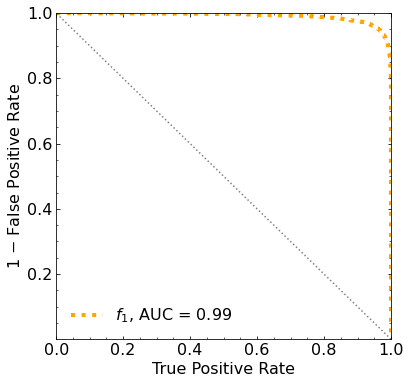

Classification score:


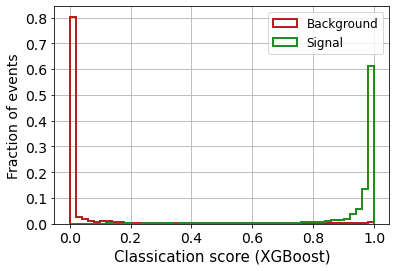


 ROC-AUC =  0.9906067003902737
At least 5 B events per bin, range = [[0, 1]]:
# bins:  10 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  10
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8095


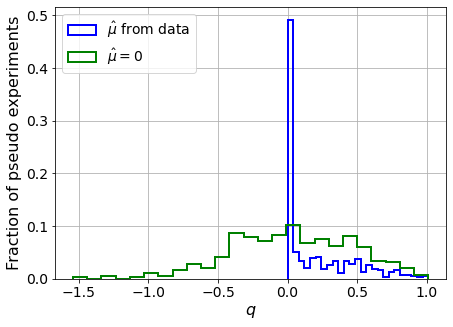

muhat mean:  0.17220370562313592
Z_bins:  0.21165623675446424
std Z_bins:  0.6061644385394608
Z_bins mu=0:  0.2098078679594186
std Z_bins mu=0:  1.0479938672747324

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8275


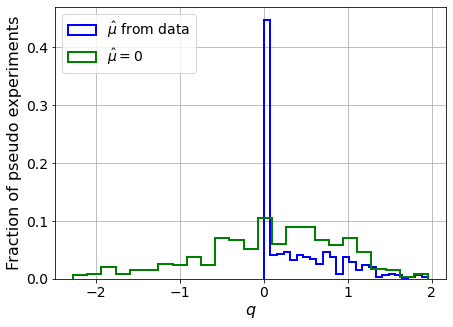

muhat mean:  0.28322568931521286
Z_bins:  0.4290111161890338
std Z_bins:  0.5312322986547913
Z_bins mu=0:  0.42715714993047466
std Z_bins mu=0:  0.9655177406333566

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8215


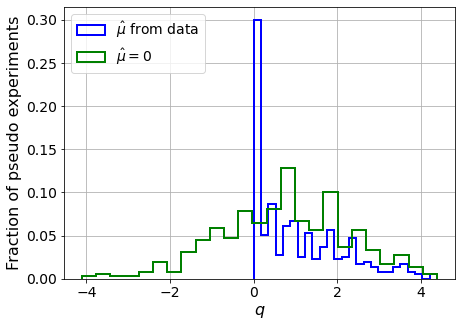

muhat mean:  0.05155942776655447
Z_bins:  0.889801959006657
std Z_bins:  0.6046019678926982
Z_bins mu=0:  0.8896858415572525
std Z_bins mu=0:  0.8602970012748017

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8245


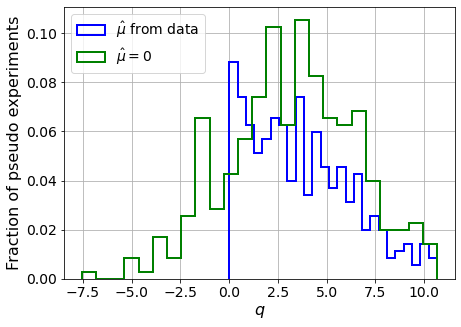

muhat mean:  0.03790962613631535
Z_bins:  1.8383371026644852
std Z_bins:  0.7116371928679753
Z_bins mu=0:  1.8381244041208284
std Z_bins mu=0:  0.8929039215921666

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.81


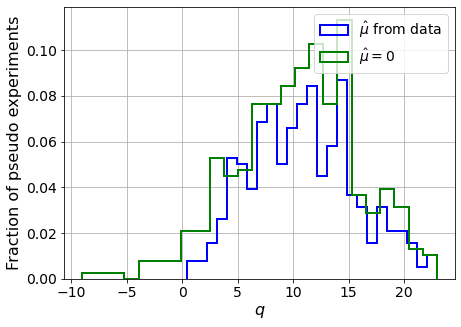

muhat mean:  0.024112398607964425
Z_bins:  3.2912305707177354
std Z_bins:  0.7139860041514673
Z_bins mu=0:  3.291148292315767
std Z_bins mu=0:  0.833669079619179

--------

B_expected:  643
S_expected:  40

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8175


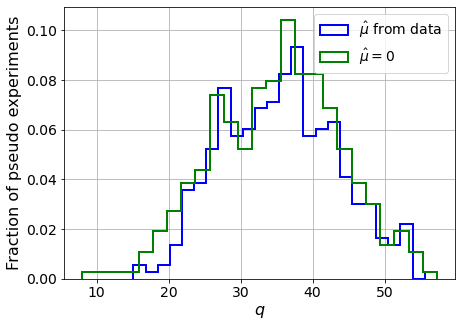

muhat mean:  0.015869095844357257
Z_bins:  5.9715845679743484
std Z_bins:  0.6713188504316253
Z_bins mu=0:  5.971430971393958
std Z_bins mu=0:  0.7328722104933002

--------

B_expected:  643
S_expected:  85



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8145


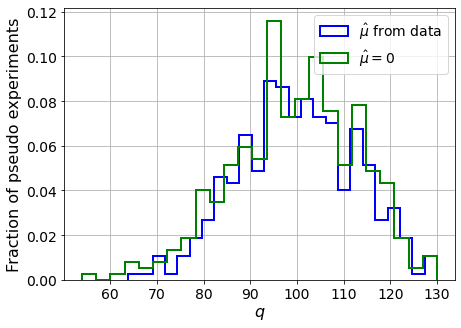

muhat mean:  0.006020412828909588
Z_bins:  10.009303818726075
std Z_bins:  0.6231180921917838
Z_bins mu=0:  10.009236620635292
std Z_bins mu=0:  0.6648624167550864

--------

B_expected:  643
S_expected:  184

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8145


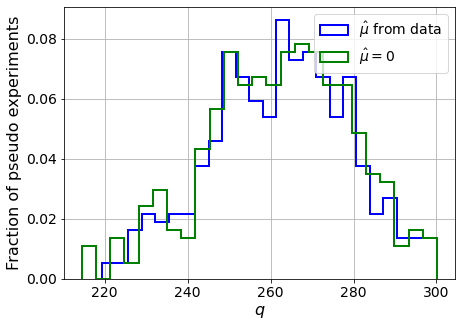

muhat mean:  0.0010822911119308517
Z_bins:  16.211669923980413
std Z_bins:  0.5088464176284542
Z_bins mu=0:  16.209997057334842
std Z_bins mu=0:  0.5293940557311249

--------

B_expected:  643
S_expected:  396

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.826


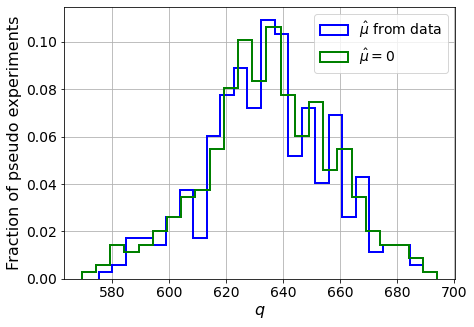

muhat mean:  0.0013325655670484487
Z_bins:  25.20429825577828
std Z_bins:  0.4348688958748469
Z_bins mu=0:  25.2037789076501
std Z_bins mu=0:  0.44901652405469933

--------

B_expected:  643
S_expected:  854

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8135


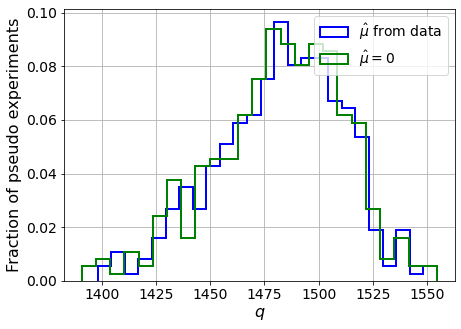

muhat mean:  0.000660817992311282
Z_bins:  38.5312013590715
std Z_bins:  0.3764909093680595
Z_bins mu=0:  38.5312013590715
std Z_bins mu=0:  0.3878790747549024

--------


 FINAL RESULT:

[[0.21165623675446424, 0.6061644385394608, 0.17220370562313592, 0.2098078679594186, 1.0479938672747324], [0.4290111161890338, 0.5312322986547913, 0.28322568931521286, 0.42715714993047466, 0.9655177406333566], [0.889801959006657, 0.6046019678926982, 0.05155942776655447, 0.8896858415572525, 0.8602970012748017], [1.8383371026644852, 0.7116371928679753, 0.03790962613631535, 1.8381244041208284, 0.8929039215921666], [3.2912305707177354, 0.7139860041514673, 0.024112398607964425, 3.291148292315767, 0.833669079619179], [5.9715845679743484, 0.6713188504316253, 0.015869095844357257, 5.971430971393958, 0.7328722104933002], [10.009303818726075, 0.6231180921917838, 0.006020412828909588, 10.009236620635292, 0.6648624167550864], [16.211669923980413, 0.5088464176284542, 0.0010822911119308517, 16.209997057334842, 0.529

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 417.00540549 352.11336948 283.56358324
 213.39925521 140.48478204  64.55701151 -15.57561236 -92.2840274 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 327.95177901 273.44064463
 213

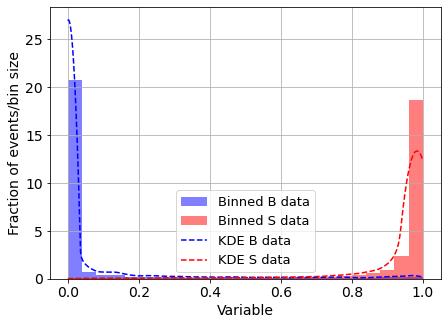

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.059027261020128646
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


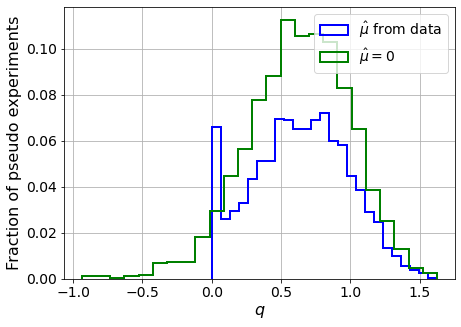

muhat mean:  -6.043522662258207
Z_bins:  0.8041940892068837
std Z_bins:  0.21368694689332365
Z_bins mu=0:  0.8041940892068837
std Z_bins mu=0:  0.22851224635505185

--------

B_expected:  643
S_expected:  2



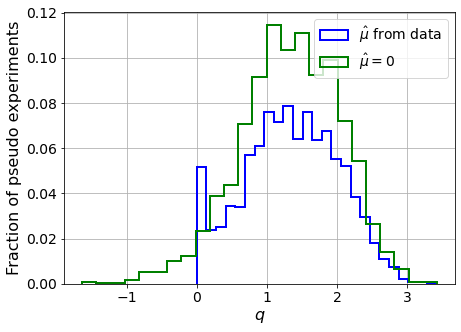

muhat mean:  -3.105566166100464
Z_bins:  1.163294245061052
std Z_bins:  0.2903690611061425
Z_bins mu=0:  1.163294245061052
std Z_bins mu=0:  0.3063118497277828

--------

B_expected:  643
S_expected:  4



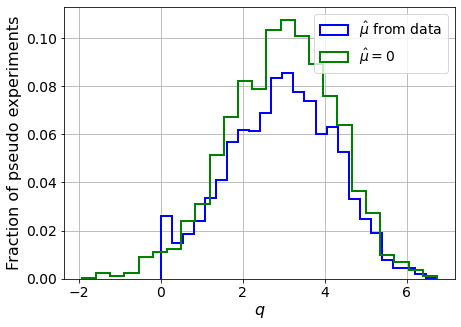

muhat mean:  -1.6366056786592125
Z_bins:  1.7317684339899357
std Z_bins:  0.37087475894816596
Z_bins mu=0:  1.7317684339899357
std Z_bins mu=0:  0.38140410628393995

--------

B_expected:  643
S_expected:  9



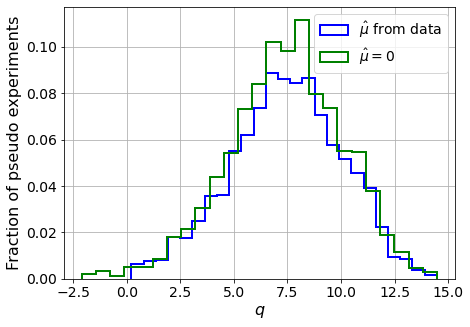

muhat mean:  -0.6537130592773943
Z_bins:  2.738476333033609
std Z_bins:  0.47703558080922115
Z_bins mu=0:  2.738476333033609
std Z_bins mu=0:  0.4866314447668477

--------

B_expected:  643
S_expected:  18



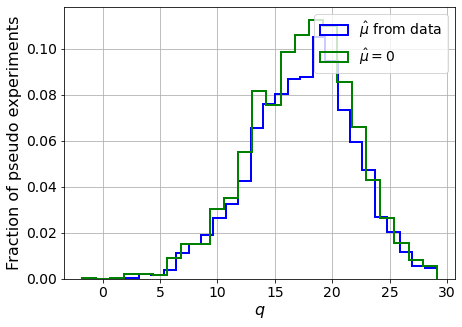

muhat mean:  -0.3331311181810267
Z_bins:  4.205685852179119
std Z_bins:  0.5303861368187819
Z_bins mu=0:  4.205685852179119
std Z_bins mu=0:  0.536688368090263

--------

B_expected:  643
S_expected:  40



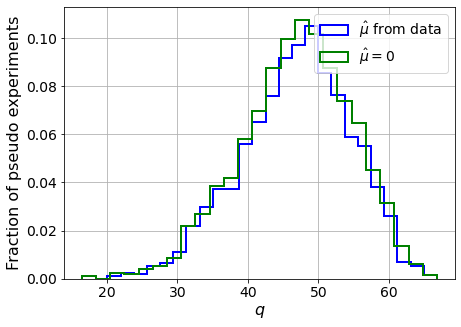

muhat mean:  -0.15469428899991897
Z_bins:  6.8761104030927935
std Z_bins:  0.5647387218086388
Z_bins mu=0:  6.8761104030927935
std Z_bins mu=0:  0.5690465414952666

--------

B_expected:  643
S_expected:  85



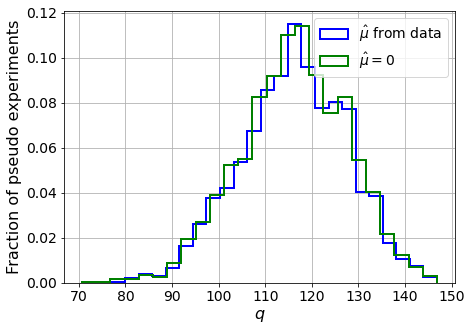

muhat mean:  -0.07354360368309015
Z_bins:  10.79198833597885
std Z_bins:  0.5304245103438054
Z_bins mu=0:  10.79198833597885
std Z_bins mu=0:  0.5323224223354923

--------

B_expected:  643
S_expected:  184



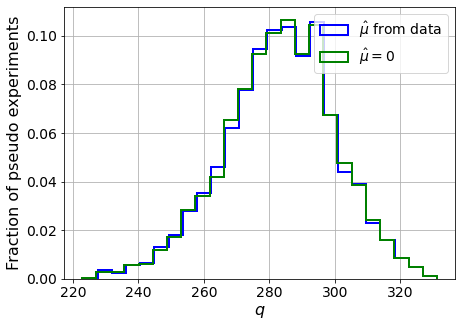

muhat mean:  -0.032706503087130565
Z_bins:  16.85149841057011
std Z_bins:  0.5043481799173136
Z_bins mu=0:  16.85149841057011
std Z_bins mu=0:  0.5061887682557353

--------

B_expected:  643
S_expected:  396



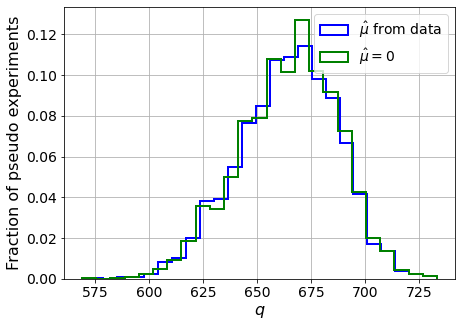

muhat mean:  -0.015118696188890649
Z_bins:  25.81146788969798
std Z_bins:  0.44001536435675864
Z_bins mu=0:  25.81146788969798
std Z_bins mu=0:  0.44102718381035927

--------

B_expected:  643
S_expected:  854



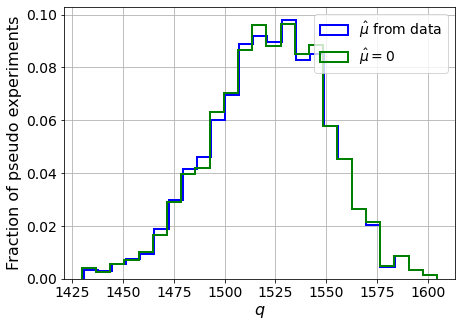

muhat mean:  -0.007065148885740038
Z_bins:  39.02687812825505
std Z_bins:  0.36820624993032275
Z_bins mu=0:  39.02687812825505
std Z_bins mu=0:  0.36883533396456447

--------


 FINAL RESULT:

[[0.8041940892068837, 0.21368694689332365, -6.043522662258207, 0.8041940892068837, 0.22851224635505185], [1.163294245061052, 0.2903690611061425, -3.105566166100464, 1.163294245061052, 0.3063118497277828], [1.7317684339899357, 0.37087475894816596, -1.6366056786592125, 1.7317684339899357, 0.38140410628393995], [2.738476333033609, 0.47703558080922115, -0.6537130592773943, 2.738476333033609, 0.4866314447668477], [4.205685852179119, 0.5303861368187819, -0.3331311181810267, 4.205685852179119, 0.536688368090263], [6.8761104030927935, 0.5647387218086388, -0.15469428899991897, 6.8761104030927935, 0.5690465414952666], [10.79198833597885, 0.5304245103438054, -0.07354360368309015, 10.79198833597885, 0.5323224223354923], [16.85149841057011, 0.5043481799173136, -0.032706503087130565, 16.85149841057011, 0.50618

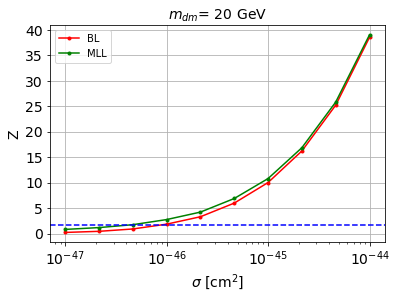


cross_BL_164:  8.7275905699795e-47
cross_BL_164_up:  5.289345166202695e-47
cross_BL_164_down:  1.39053739147167e-46

cross_MLL_164:  4.2245779691888977e-47
cross_MLL_164_up:  2.799469305049357e-47
cross_MLL_164_down:  6.141970277760245e-47

#########################


#########################

mDM =  35 GeV


S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)
 NUM_DAT:  29071 

NUM_DAT_ER:  28699
NUM_DAT_AC:  102
NUM_DAT_CNNS:  1
NUM_DAT_RN:  27
NUM_DAT_WALL:  242

B_pbot.shape:  (29071,)
B_ptop.shape:  (29071,)
B_ppeakS1.shape : (29071, 8)
B_ppeakS2.shape:  (29071, 8)

S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)


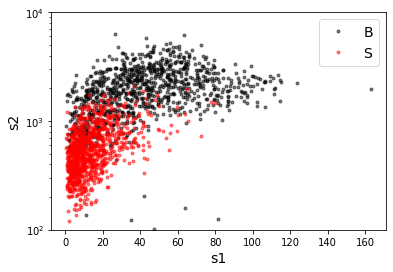

B_pdiffT.shape:  (29071,)
S_pdiffT.shape:  (29071,)


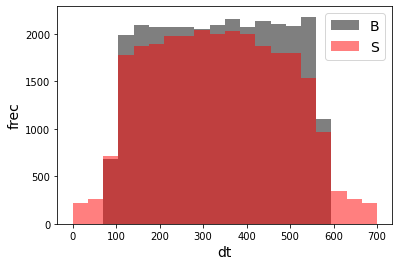

B_pbot.shape:  (29071,)
B_ptop.shape:  (29071,)
B_ppeakS1.shape : (29071, 7)
B_ppeakS2.shape:  (29071, 7)
S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 7)
S_ppeakS2.shape:  (29071, 7)
X_mon_B.shape:  (29071, 16)
X_mon_S.shape:  (29071, 16)
X_mon.shape:  (58142, 16)

X_mon_train :  (37065, 16)
y_mon_train :  (37065,)
X_mon_val :  (6541, 16)
y_mon_val :  (6541,)
X_mon_test :  (14536, 16)
y_mon_test :  (14536,)

[0]	validation_0-logloss:0.68600	validation_1-logloss:0.68600
[1]	validation_0-logloss:0.67899	validation_1-logloss:0.67899
[2]	validation_0-logloss:0.67210	validation_1-logloss:0.67212
[3]	validation_0-logloss:0.66534	validation_1-logloss:0.66538
[4]	validation_0-logloss:0.65872	validation_1-logloss:0.65874
[5]	validation_0-logloss:0.65225	validation_1-logloss:0.65229
[6]	validation_0-logloss:0.64587	validation_1-logloss:0.64593
[7]	validation_0-logloss:0.63962	validation_1-logloss:0.63970
[8]	validation_0-logloss:0.63346	validation_1-logloss:0.63358
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.60999	validation_1-logloss:0.61011
[13]	validation_0-logloss:0.60439	validation_1-logloss:0.60454
[14]	validation_0-logloss:0.59889	validation_1-logloss:0.59906
[15]	validation_0-logloss:0.59346	validation_1-logloss:0.59364
[16]	validation_0-logloss:0.58815	validation_1-logloss:0.58832
[17]	validation_0-logloss:0.58292	validation_1-logloss:0.58307
[18]	validation_0-logloss:0.57778	validation_1-logloss:0.57793
[19]	validation_0-logloss:0.57272	validation_1-logloss:0.57286
[20]	validation_0-logloss:0.56775	validation_1-logloss:0.56790
[21]	validation_0-logloss:0.56286	validation_1-logloss:0.56301
[22]	validation_0-logloss:0.55803	validation_1-logloss:0.55817
[23]	validation_0-logloss:0.55330	validation_1-logloss:0.55345
[24]	validation_0-logloss:0.54864	validation_1-logloss:0.54878
[25]	validation_0-logloss:0.54406	validation_1-logloss:0.54422
[26]	validation_0-logloss:0.53957	validation_1-logloss:0.53972
[27]	validation_0-logloss:0.53514	validation_1-logloss:

[142]	validation_0-logloss:0.28397	validation_1-logloss:0.28553
[143]	validation_0-logloss:0.28295	validation_1-logloss:0.28454
[144]	validation_0-logloss:0.28195	validation_1-logloss:0.28356
[145]	validation_0-logloss:0.28099	validation_1-logloss:0.28262
[146]	validation_0-logloss:0.28003	validation_1-logloss:0.28168
[147]	validation_0-logloss:0.27904	validation_1-logloss:0.28073
[148]	validation_0-logloss:0.27812	validation_1-logloss:0.27984
[149]	validation_0-logloss:0.27716	validation_1-logloss:0.27890
[150]	validation_0-logloss:0.27625	validation_1-logloss:0.27802
[151]	validation_0-logloss:0.27532	validation_1-logloss:0.27712
[152]	validation_0-logloss:0.27443	validation_1-logloss:0.27625
[153]	validation_0-logloss:0.27356	validation_1-logloss:0.27541
[154]	validation_0-logloss:0.27264	validation_1-logloss:0.27453
[155]	validation_0-logloss:0.27178	validation_1-logloss:0.27369
[156]	validation_0-logloss:0.27092	validation_1-logloss:0.27286
[157]	validation_0-logloss:0.27010	valid

[271]	validation_0-logloss:0.21314	validation_1-logloss:0.21778
[272]	validation_0-logloss:0.21289	validation_1-logloss:0.21755
[273]	validation_0-logloss:0.21262	validation_1-logloss:0.21731
[274]	validation_0-logloss:0.21237	validation_1-logloss:0.21710
[275]	validation_0-logloss:0.21212	validation_1-logloss:0.21688
[276]	validation_0-logloss:0.21186	validation_1-logloss:0.21664
[277]	validation_0-logloss:0.21158	validation_1-logloss:0.21637
[278]	validation_0-logloss:0.21135	validation_1-logloss:0.21615
[279]	validation_0-logloss:0.21110	validation_1-logloss:0.21592
[280]	validation_0-logloss:0.21087	validation_1-logloss:0.21571
[281]	validation_0-logloss:0.21063	validation_1-logloss:0.21550
[282]	validation_0-logloss:0.21040	validation_1-logloss:0.21529
[283]	validation_0-logloss:0.21017	validation_1-logloss:0.21507
[284]	validation_0-logloss:0.20995	validation_1-logloss:0.21488
[285]	validation_0-logloss:0.20972	validation_1-logloss:0.21468
[286]	validation_0-logloss:0.20950	valid

[400]	validation_0-logloss:0.19176	validation_1-logloss:0.19923
[401]	validation_0-logloss:0.19167	validation_1-logloss:0.19916
[402]	validation_0-logloss:0.19153	validation_1-logloss:0.19904
[403]	validation_0-logloss:0.19143	validation_1-logloss:0.19896
[404]	validation_0-logloss:0.19134	validation_1-logloss:0.19890
[405]	validation_0-logloss:0.19126	validation_1-logloss:0.19884
[406]	validation_0-logloss:0.19109	validation_1-logloss:0.19871
[407]	validation_0-logloss:0.19092	validation_1-logloss:0.19857
[408]	validation_0-logloss:0.19083	validation_1-logloss:0.19850
[409]	validation_0-logloss:0.19074	validation_1-logloss:0.19843
[410]	validation_0-logloss:0.19065	validation_1-logloss:0.19836
[411]	validation_0-logloss:0.19056	validation_1-logloss:0.19829
[412]	validation_0-logloss:0.19047	validation_1-logloss:0.19822
[413]	validation_0-logloss:0.19032	validation_1-logloss:0.19810
[414]	validation_0-logloss:0.19020	validation_1-logloss:0.19800
[415]	validation_0-logloss:0.19007	valid

[529]	validation_0-logloss:0.17996	validation_1-logloss:0.18984
[530]	validation_0-logloss:0.17989	validation_1-logloss:0.18978
[531]	validation_0-logloss:0.17986	validation_1-logloss:0.18976
[532]	validation_0-logloss:0.17981	validation_1-logloss:0.18973
[533]	validation_0-logloss:0.17977	validation_1-logloss:0.18971
[534]	validation_0-logloss:0.17971	validation_1-logloss:0.18964
[535]	validation_0-logloss:0.17959	validation_1-logloss:0.18954
[536]	validation_0-logloss:0.17955	validation_1-logloss:0.18952
[537]	validation_0-logloss:0.17949	validation_1-logloss:0.18949
[538]	validation_0-logloss:0.17945	validation_1-logloss:0.18947
[539]	validation_0-logloss:0.17935	validation_1-logloss:0.18940
[540]	validation_0-logloss:0.17930	validation_1-logloss:0.18937
[541]	validation_0-logloss:0.17921	validation_1-logloss:0.18930
[542]	validation_0-logloss:0.17918	validation_1-logloss:0.18928
[543]	validation_0-logloss:0.17908	validation_1-logloss:0.18921
[544]	validation_0-logloss:0.17900	valid

[658]	validation_0-logloss:0.17161	validation_1-logloss:0.18391
[659]	validation_0-logloss:0.17151	validation_1-logloss:0.18384
[660]	validation_0-logloss:0.17144	validation_1-logloss:0.18379
[661]	validation_0-logloss:0.17140	validation_1-logloss:0.18376
[662]	validation_0-logloss:0.17137	validation_1-logloss:0.18374
[663]	validation_0-logloss:0.17129	validation_1-logloss:0.18367
[664]	validation_0-logloss:0.17119	validation_1-logloss:0.18361
[665]	validation_0-logloss:0.17117	validation_1-logloss:0.18360
[666]	validation_0-logloss:0.17107	validation_1-logloss:0.18354
[667]	validation_0-logloss:0.17103	validation_1-logloss:0.18351
[668]	validation_0-logloss:0.17096	validation_1-logloss:0.18344
[669]	validation_0-logloss:0.17092	validation_1-logloss:0.18341
[670]	validation_0-logloss:0.17083	validation_1-logloss:0.18337
[671]	validation_0-logloss:0.17081	validation_1-logloss:0.18336
[672]	validation_0-logloss:0.17077	validation_1-logloss:0.18334
[673]	validation_0-logloss:0.17068	valid

[787]	validation_0-logloss:0.16476	validation_1-logloss:0.17967
[788]	validation_0-logloss:0.16470	validation_1-logloss:0.17963
[789]	validation_0-logloss:0.16467	validation_1-logloss:0.17962
[790]	validation_0-logloss:0.16461	validation_1-logloss:0.17957
[791]	validation_0-logloss:0.16457	validation_1-logloss:0.17956
[792]	validation_0-logloss:0.16449	validation_1-logloss:0.17949
[793]	validation_0-logloss:0.16442	validation_1-logloss:0.17945
[794]	validation_0-logloss:0.16437	validation_1-logloss:0.17942
[795]	validation_0-logloss:0.16434	validation_1-logloss:0.17940
[796]	validation_0-logloss:0.16432	validation_1-logloss:0.17939
[797]	validation_0-logloss:0.16429	validation_1-logloss:0.17939
[798]	validation_0-logloss:0.16422	validation_1-logloss:0.17934
[799]	validation_0-logloss:0.16416	validation_1-logloss:0.17932
[800]	validation_0-logloss:0.16414	validation_1-logloss:0.17930
[801]	validation_0-logloss:0.16411	validation_1-logloss:0.17928
[802]	validation_0-logloss:0.16409	valid

[916]	validation_0-logloss:0.15988	validation_1-logloss:0.17738
[917]	validation_0-logloss:0.15983	validation_1-logloss:0.17736
[918]	validation_0-logloss:0.15981	validation_1-logloss:0.17735
[919]	validation_0-logloss:0.15980	validation_1-logloss:0.17735
[920]	validation_0-logloss:0.15978	validation_1-logloss:0.17735
[921]	validation_0-logloss:0.15972	validation_1-logloss:0.17731
[922]	validation_0-logloss:0.15969	validation_1-logloss:0.17730
[923]	validation_0-logloss:0.15965	validation_1-logloss:0.17729
[924]	validation_0-logloss:0.15963	validation_1-logloss:0.17728
[925]	validation_0-logloss:0.15961	validation_1-logloss:0.17728
[926]	validation_0-logloss:0.15954	validation_1-logloss:0.17722
[927]	validation_0-logloss:0.15950	validation_1-logloss:0.17720
[928]	validation_0-logloss:0.15946	validation_1-logloss:0.17717
[929]	validation_0-logloss:0.15941	validation_1-logloss:0.17716
[930]	validation_0-logloss:0.15938	validation_1-logloss:0.17714
[931]	validation_0-logloss:0.15935	valid

[1044]	validation_0-logloss:0.15570	validation_1-logloss:0.17575
[1045]	validation_0-logloss:0.15567	validation_1-logloss:0.17575
[1046]	validation_0-logloss:0.15561	validation_1-logloss:0.17568
[1047]	validation_0-logloss:0.15556	validation_1-logloss:0.17566
[1048]	validation_0-logloss:0.15555	validation_1-logloss:0.17566
[1049]	validation_0-logloss:0.15551	validation_1-logloss:0.17566
[1050]	validation_0-logloss:0.15547	validation_1-logloss:0.17567
[1051]	validation_0-logloss:0.15544	validation_1-logloss:0.17566
[1052]	validation_0-logloss:0.15543	validation_1-logloss:0.17567
[1053]	validation_0-logloss:0.15540	validation_1-logloss:0.17566
[1054]	validation_0-logloss:0.15538	validation_1-logloss:0.17565
[1055]	validation_0-logloss:0.15533	validation_1-logloss:0.17561
[1056]	validation_0-logloss:0.15532	validation_1-logloss:0.17560
[1057]	validation_0-logloss:0.15528	validation_1-logloss:0.17561
[1058]	validation_0-logloss:0.15526	validation_1-logloss:0.17560
[1059]	validation_0-loglo

[1171]	validation_0-logloss:0.15177	validation_1-logloss:0.17432
[1172]	validation_0-logloss:0.15172	validation_1-logloss:0.17429
[1173]	validation_0-logloss:0.15171	validation_1-logloss:0.17429
[1174]	validation_0-logloss:0.15168	validation_1-logloss:0.17426
[1175]	validation_0-logloss:0.15164	validation_1-logloss:0.17426
[1176]	validation_0-logloss:0.15160	validation_1-logloss:0.17423
[1177]	validation_0-logloss:0.15155	validation_1-logloss:0.17422
[1178]	validation_0-logloss:0.15150	validation_1-logloss:0.17419
[1179]	validation_0-logloss:0.15147	validation_1-logloss:0.17419
[1180]	validation_0-logloss:0.15144	validation_1-logloss:0.17419
[1181]	validation_0-logloss:0.15141	validation_1-logloss:0.17418
[1182]	validation_0-logloss:0.15140	validation_1-logloss:0.17418
[1183]	validation_0-logloss:0.15137	validation_1-logloss:0.17418
[1184]	validation_0-logloss:0.15134	validation_1-logloss:0.17416
[1185]	validation_0-logloss:0.15133	validation_1-logloss:0.17416
[1186]	validation_0-loglo

[1298]	validation_0-logloss:0.14802	validation_1-logloss:0.17292
[1299]	validation_0-logloss:0.14800	validation_1-logloss:0.17292
[1300]	validation_0-logloss:0.14796	validation_1-logloss:0.17290
[1301]	validation_0-logloss:0.14792	validation_1-logloss:0.17291
[1302]	validation_0-logloss:0.14787	validation_1-logloss:0.17289
[1303]	validation_0-logloss:0.14786	validation_1-logloss:0.17289
[1304]	validation_0-logloss:0.14780	validation_1-logloss:0.17287
[1305]	validation_0-logloss:0.14779	validation_1-logloss:0.17287
[1306]	validation_0-logloss:0.14776	validation_1-logloss:0.17287
[1307]	validation_0-logloss:0.14772	validation_1-logloss:0.17285
[1308]	validation_0-logloss:0.14769	validation_1-logloss:0.17284
[1309]	validation_0-logloss:0.14764	validation_1-logloss:0.17280
[1310]	validation_0-logloss:0.14763	validation_1-logloss:0.17280
[1311]	validation_0-logloss:0.14761	validation_1-logloss:0.17278
[1312]	validation_0-logloss:0.14759	validation_1-logloss:0.17278
[1313]	validation_0-loglo

[1425]	validation_0-logloss:0.14416	validation_1-logloss:0.17142
[1426]	validation_0-logloss:0.14411	validation_1-logloss:0.17139
[1427]	validation_0-logloss:0.14409	validation_1-logloss:0.17139
[1428]	validation_0-logloss:0.14404	validation_1-logloss:0.17137
[1429]	validation_0-logloss:0.14400	validation_1-logloss:0.17135
[1430]	validation_0-logloss:0.14396	validation_1-logloss:0.17133
[1431]	validation_0-logloss:0.14395	validation_1-logloss:0.17133
[1432]	validation_0-logloss:0.14391	validation_1-logloss:0.17132
[1433]	validation_0-logloss:0.14388	validation_1-logloss:0.17131
[1434]	validation_0-logloss:0.14384	validation_1-logloss:0.17128
[1435]	validation_0-logloss:0.14381	validation_1-logloss:0.17129
[1436]	validation_0-logloss:0.14378	validation_1-logloss:0.17127
[1437]	validation_0-logloss:0.14374	validation_1-logloss:0.17126
[1438]	validation_0-logloss:0.14369	validation_1-logloss:0.17124
[1439]	validation_0-logloss:0.14366	validation_1-logloss:0.17122
[1440]	validation_0-loglo

[1552]	validation_0-logloss:0.14046	validation_1-logloss:0.17007
[1553]	validation_0-logloss:0.14044	validation_1-logloss:0.17006
[1554]	validation_0-logloss:0.14042	validation_1-logloss:0.17007
[1555]	validation_0-logloss:0.14040	validation_1-logloss:0.17007
[1556]	validation_0-logloss:0.14038	validation_1-logloss:0.17007
[1557]	validation_0-logloss:0.14033	validation_1-logloss:0.17006
[1558]	validation_0-logloss:0.14031	validation_1-logloss:0.17005
[1559]	validation_0-logloss:0.14029	validation_1-logloss:0.17004
[1560]	validation_0-logloss:0.14027	validation_1-logloss:0.17002
[1561]	validation_0-logloss:0.14025	validation_1-logloss:0.17001
[1562]	validation_0-logloss:0.14020	validation_1-logloss:0.16998
[1563]	validation_0-logloss:0.14016	validation_1-logloss:0.16997
[1564]	validation_0-logloss:0.14011	validation_1-logloss:0.16996
[1565]	validation_0-logloss:0.14010	validation_1-logloss:0.16997
[1566]	validation_0-logloss:0.14006	validation_1-logloss:0.16994
[1567]	validation_0-loglo

[1679]	validation_0-logloss:0.13733	validation_1-logloss:0.16915
[1680]	validation_0-logloss:0.13730	validation_1-logloss:0.16914
[1681]	validation_0-logloss:0.13728	validation_1-logloss:0.16914
[1682]	validation_0-logloss:0.13727	validation_1-logloss:0.16915
[1683]	validation_0-logloss:0.13725	validation_1-logloss:0.16914
[1684]	validation_0-logloss:0.13721	validation_1-logloss:0.16913
[1685]	validation_0-logloss:0.13720	validation_1-logloss:0.16914
[1686]	validation_0-logloss:0.13719	validation_1-logloss:0.16914
[1687]	validation_0-logloss:0.13716	validation_1-logloss:0.16913
[1688]	validation_0-logloss:0.13713	validation_1-logloss:0.16910
[1689]	validation_0-logloss:0.13710	validation_1-logloss:0.16908
[1690]	validation_0-logloss:0.13709	validation_1-logloss:0.16908
[1691]	validation_0-logloss:0.13708	validation_1-logloss:0.16908
[1692]	validation_0-logloss:0.13706	validation_1-logloss:0.16909
[1693]	validation_0-logloss:0.13705	validation_1-logloss:0.16909
[1694]	validation_0-loglo

[1806]	validation_0-logloss:0.13456	validation_1-logloss:0.16860
[1807]	validation_0-logloss:0.13454	validation_1-logloss:0.16860
[1808]	validation_0-logloss:0.13451	validation_1-logloss:0.16859
[1809]	validation_0-logloss:0.13447	validation_1-logloss:0.16860
[1810]	validation_0-logloss:0.13446	validation_1-logloss:0.16859
[1811]	validation_0-logloss:0.13443	validation_1-logloss:0.16859
[1812]	validation_0-logloss:0.13441	validation_1-logloss:0.16858
[1813]	validation_0-logloss:0.13438	validation_1-logloss:0.16857
[1814]	validation_0-logloss:0.13436	validation_1-logloss:0.16857
[1815]	validation_0-logloss:0.13435	validation_1-logloss:0.16857
[1816]	validation_0-logloss:0.13434	validation_1-logloss:0.16857
[1817]	validation_0-logloss:0.13432	validation_1-logloss:0.16857
[1818]	validation_0-logloss:0.13428	validation_1-logloss:0.16857
[1819]	validation_0-logloss:0.13427	validation_1-logloss:0.16857
[1820]	validation_0-logloss:0.13425	validation_1-logloss:0.16857
[1821]	validation_0-loglo

[1933]	validation_0-logloss:0.13166	validation_1-logloss:0.16797
[1934]	validation_0-logloss:0.13164	validation_1-logloss:0.16796
[1935]	validation_0-logloss:0.13160	validation_1-logloss:0.16794
[1936]	validation_0-logloss:0.13157	validation_1-logloss:0.16794
[1937]	validation_0-logloss:0.13154	validation_1-logloss:0.16792
[1938]	validation_0-logloss:0.13150	validation_1-logloss:0.16793
[1939]	validation_0-logloss:0.13148	validation_1-logloss:0.16793
[1940]	validation_0-logloss:0.13146	validation_1-logloss:0.16792
[1941]	validation_0-logloss:0.13143	validation_1-logloss:0.16790
[1942]	validation_0-logloss:0.13141	validation_1-logloss:0.16789
[1943]	validation_0-logloss:0.13139	validation_1-logloss:0.16788
[1944]	validation_0-logloss:0.13136	validation_1-logloss:0.16788
[1945]	validation_0-logloss:0.13133	validation_1-logloss:0.16786
[1946]	validation_0-logloss:0.13129	validation_1-logloss:0.16784
[1947]	validation_0-logloss:0.13128	validation_1-logloss:0.16784
[1948]	validation_0-loglo

[2186]	validation_0-logloss:0.12593	validation_1-logloss:0.16681
[2187]	validation_0-logloss:0.12590	validation_1-logloss:0.16681
[2188]	validation_0-logloss:0.12588	validation_1-logloss:0.16681
[2189]	validation_0-logloss:0.12587	validation_1-logloss:0.16681
[2190]	validation_0-logloss:0.12584	validation_1-logloss:0.16679
[2191]	validation_0-logloss:0.12582	validation_1-logloss:0.16680
[2192]	validation_0-logloss:0.12580	validation_1-logloss:0.16678
[2193]	validation_0-logloss:0.12577	validation_1-logloss:0.16677
[2194]	validation_0-logloss:0.12575	validation_1-logloss:0.16678
[2195]	validation_0-logloss:0.12574	validation_1-logloss:0.16677
[2196]	validation_0-logloss:0.12571	validation_1-logloss:0.16678
[2197]	validation_0-logloss:0.12569	validation_1-logloss:0.16678
[2198]	validation_0-logloss:0.12566	validation_1-logloss:0.16679
[2199]	validation_0-logloss:0.12563	validation_1-logloss:0.16679
[2200]	validation_0-logloss:0.12560	validation_1-logloss:0.16678
[2201]	validation_0-loglo

[2313]	validation_0-logloss:0.12329	validation_1-logloss:0.16650
[2314]	validation_0-logloss:0.12328	validation_1-logloss:0.16650
[2315]	validation_0-logloss:0.12325	validation_1-logloss:0.16649
[2316]	validation_0-logloss:0.12323	validation_1-logloss:0.16649
[2317]	validation_0-logloss:0.12322	validation_1-logloss:0.16648
[2318]	validation_0-logloss:0.12320	validation_1-logloss:0.16648
[2319]	validation_0-logloss:0.12318	validation_1-logloss:0.16648
[2320]	validation_0-logloss:0.12315	validation_1-logloss:0.16648
[2321]	validation_0-logloss:0.12314	validation_1-logloss:0.16647
[2322]	validation_0-logloss:0.12311	validation_1-logloss:0.16647
[2323]	validation_0-logloss:0.12308	validation_1-logloss:0.16647
[2324]	validation_0-logloss:0.12306	validation_1-logloss:0.16647
[2325]	validation_0-logloss:0.12304	validation_1-logloss:0.16646
[2326]	validation_0-logloss:0.12301	validation_1-logloss:0.16645
[2327]	validation_0-logloss:0.12298	validation_1-logloss:0.16645
[2328]	validation_0-loglo

[2440]	validation_0-logloss:0.12083	validation_1-logloss:0.16624
[2441]	validation_0-logloss:0.12080	validation_1-logloss:0.16624
[2442]	validation_0-logloss:0.12078	validation_1-logloss:0.16624
[2443]	validation_0-logloss:0.12075	validation_1-logloss:0.16624
[2444]	validation_0-logloss:0.12072	validation_1-logloss:0.16624
[2445]	validation_0-logloss:0.12070	validation_1-logloss:0.16624
[2446]	validation_0-logloss:0.12068	validation_1-logloss:0.16625
[2447]	validation_0-logloss:0.12065	validation_1-logloss:0.16625
[2448]	validation_0-logloss:0.12063	validation_1-logloss:0.16624
[2449]	validation_0-logloss:0.12061	validation_1-logloss:0.16626
[2450]	validation_0-logloss:0.12058	validation_1-logloss:0.16624
[2451]	validation_0-logloss:0.12056	validation_1-logloss:0.16624
[2452]	validation_0-logloss:0.12054	validation_1-logloss:0.16623
[2453]	validation_0-logloss:0.12051	validation_1-logloss:0.16623
[2454]	validation_0-logloss:0.12049	validation_1-logloss:0.16623
[2455]	validation_0-loglo

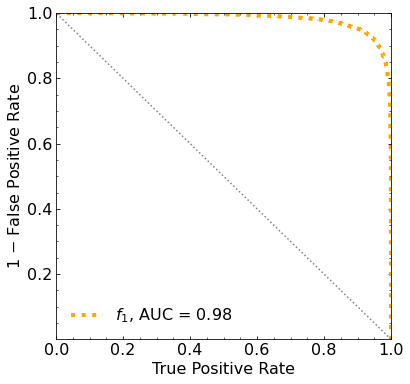

Classification score:


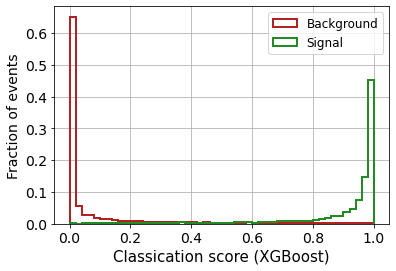


 ROC-AUC =  0.9826599571018324
At least 5 B events per bin, range = [[0, 1]]:
# bins:  15 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  15
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.152


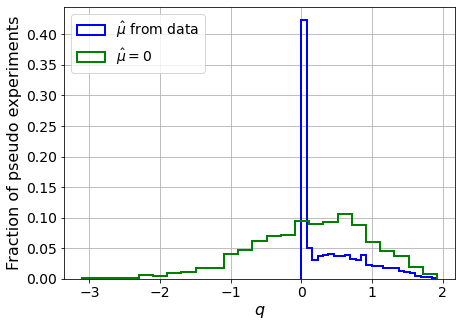

muhat mean:  0.16575437002950166
Z_bins:  0.4686941046892277
std Z_bins:  0.5051977767868638
Z_bins mu=0:  0.4686941046892277
std Z_bins mu=0:  0.8750172413244366

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.166


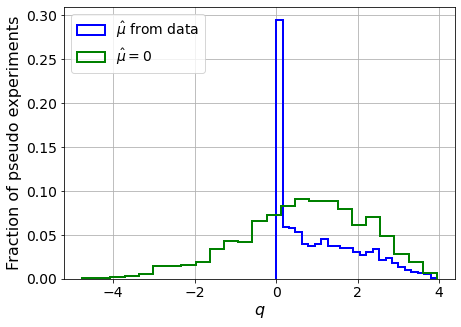

muhat mean:  0.06070204476196048
Z_bins:  0.8777308153342951
std Z_bins:  0.5763956467746327
Z_bins mu=0:  0.8777308153342951
std Z_bins mu=0:  0.8707874368740451

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1505


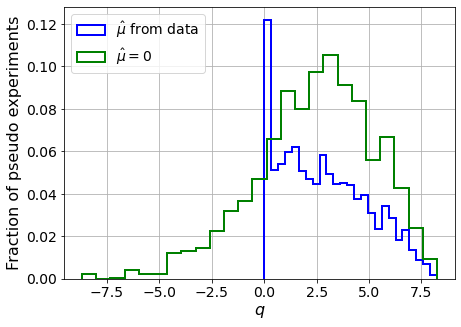

muhat mean:  0.041770374411483964
Z_bins:  1.6396983977829191
std Z_bins:  0.6349804058076144
Z_bins mu=0:  1.639391422124624
std Z_bins mu=0:  0.8598606938950457

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1465


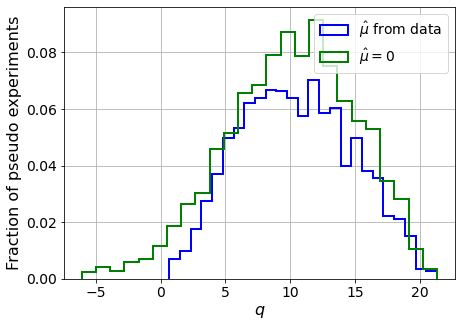

muhat mean:  0.009785866312074176
Z_bins:  3.2064913895838014
std Z_bins:  0.672129653404011
Z_bins mu=0:  3.2055000752640996
std Z_bins mu=0:  0.7726627587543248

--------

B_expected:  643
S_expected:  39

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1475


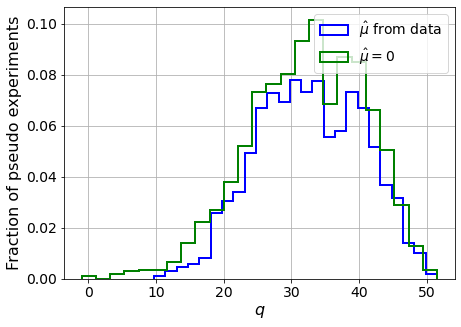

muhat mean:  0.006087083919551167
Z_bins:  5.717063455653056
std Z_bins:  0.6798103072796261
Z_bins mu=0:  5.717063455653056
std Z_bins mu=0:  0.7467258094755376

--------

B_expected:  643
S_expected:  83

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.164


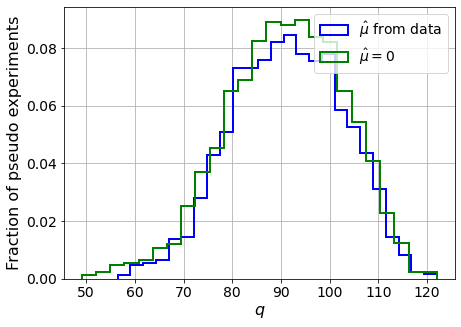

muhat mean:  0.002049733477835188
Z_bins:  9.570821333579584
std Z_bins:  0.5984313849030273
Z_bins mu=0:  9.57069378893017
std Z_bins mu=0:  0.63390024331985

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.15


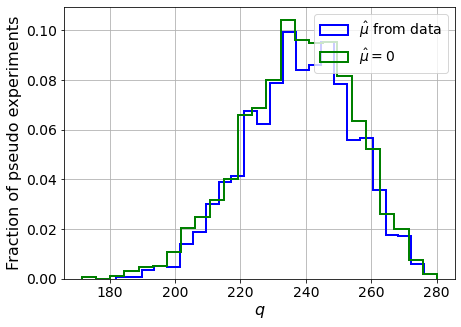

muhat mean:  0.0016661921360821383
Z_bins:  15.453970238482508
std Z_bins:  0.5293040375082865
Z_bins mu=0:  15.453638293422246
std Z_bins mu=0:  0.5520559796915193

--------

B_expected:  643
S_expected:  385

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.157


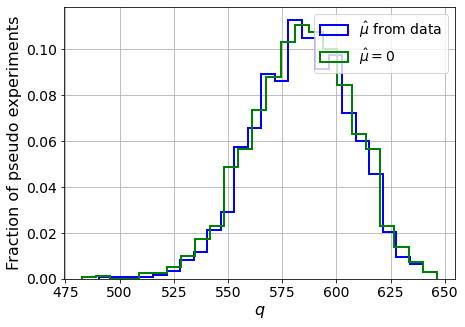

muhat mean:  0.0008067025317490987
Z_bins:  24.18403410076441
std Z_bins:  0.4670408932526123
Z_bins mu=0:  24.18335703044956
std Z_bins mu=0:  0.48162815482685806

--------

B_expected:  643
S_expected:  830

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1515


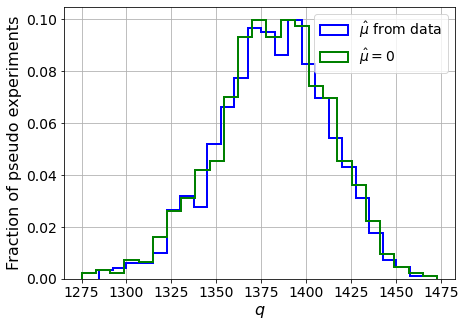

muhat mean:  0.00028768608819954814
Z_bins:  37.17803372802171
std Z_bins:  0.4127648719283689
Z_bins mu=0:  37.17803372802171
std Z_bins mu=0:  0.42191705814910724

--------

B_expected:  643
S_expected:  1787

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.163


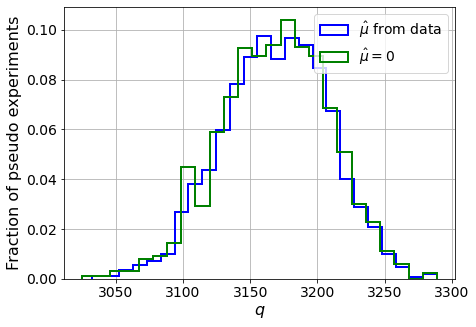

muhat mean:  8.790932154468084e-05
Z_bins:  56.3079552845325
std Z_bins:  0.35304691454867226
Z_bins mu=0:  56.306613603325836
std Z_bins mu=0:  0.35809886797149393

--------


 FINAL RESULT:

[[0.4686941046892277, 0.5051977767868638, 0.16575437002950166, 0.4686941046892277, 0.8750172413244366], [0.8777308153342951, 0.5763956467746327, 0.06070204476196048, 0.8777308153342951, 0.8707874368740451], [1.6396983977829191, 0.6349804058076144, 0.041770374411483964, 1.639391422124624, 0.8598606938950457], [3.2064913895838014, 0.672129653404011, 0.009785866312074176, 3.2055000752640996, 0.7726627587543248], [5.717063455653056, 0.6798103072796261, 0.006087083919551167, 5.717063455653056, 0.7467258094755376], [9.570821333579584, 0.5984313849030273, 0.002049733477835188, 9.57069378893017, 0.63390024331985], [15.453970238482508, 0.5293040375082865, 0.0016661921360821383, 15.453638293422246, 0.5520559796915193], [24.18403410076441, 0.4670408932526123, 0.0008067025317490987, 24.18335703044956, 0.4816

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 327.52325999 276.26495712 222.55500308
 165.8803871  106.59789293  42.9545666  -25.02750894 -95.56201907]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 285.40434537 264.8086635  234.60741593 198.49423308
 157

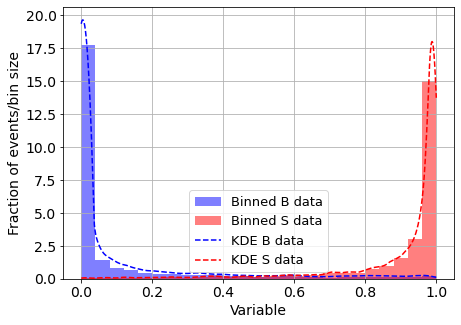

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



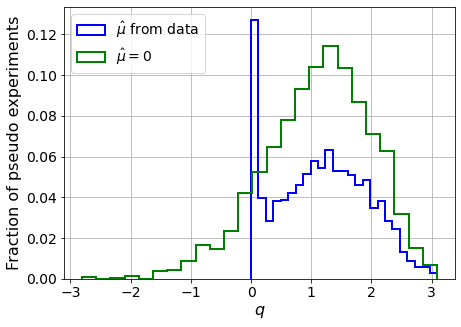

muhat mean:  -2.8651639053176687
Z_bins:  1.0859518342094465
std Z_bins:  0.3493512638310484
Z_bins mu=0:  1.0859518342094465
std Z_bins mu=0:  0.405720471175154

--------

B_expected:  643
S_expected:  4



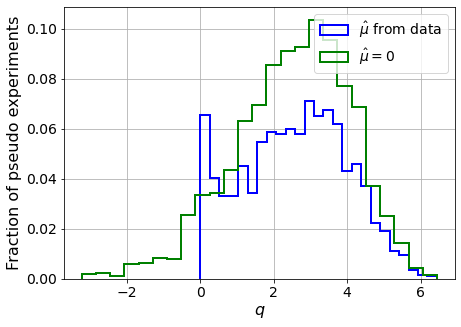

muhat mean:  -1.381959974760968
Z_bins:  1.6276763720634304
std Z_bins:  0.4357650434070522
Z_bins mu=0:  1.6276763720634304
std Z_bins mu=0:  0.48475109721971676

--------

B_expected:  643
S_expected:  8



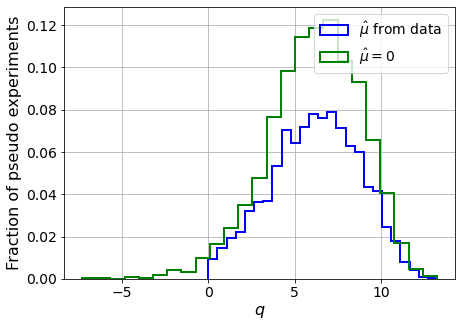

muhat mean:  -0.9514451480103971
Z_bins:  2.513100495093373
std Z_bins:  0.5031264554848102
Z_bins mu=0:  2.513100495093373
std Z_bins mu=0:  0.5379917685389216

--------

B_expected:  643
S_expected:  18



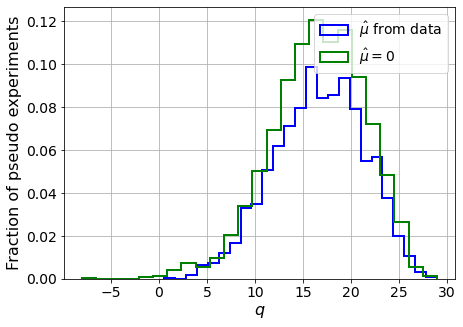

muhat mean:  -0.3097916651098061
Z_bins:  4.097842349859009
std Z_bins:  0.5680432167572845
Z_bins mu=0:  4.097842349859009
std Z_bins mu=0:  0.5943426715316519

--------

B_expected:  643
S_expected:  39



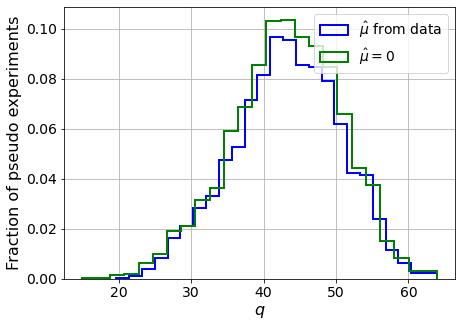

muhat mean:  -0.1459157370157676
Z_bins:  6.591076585335362
std Z_bins:  0.5612906647497334
Z_bins mu=0:  6.591076585335362
std Z_bins mu=0:  0.5742970394690488

--------

B_expected:  643
S_expected:  83



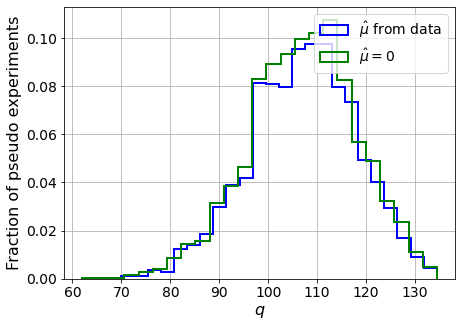

muhat mean:  -0.06676484820272287
Z_bins:  10.36857011104117
std Z_bins:  0.5250719842866538
Z_bins mu=0:  10.36857011104117
std Z_bins mu=0:  0.5330823379079975

--------

B_expected:  643
S_expected:  179



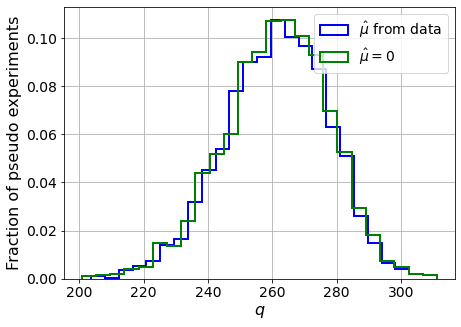

muhat mean:  -0.03277195077208528
Z_bins:  16.19322672237188
std Z_bins:  0.4982381541448572
Z_bins mu=0:  16.19322672237188
std Z_bins mu=0:  0.5039392229444419

--------

B_expected:  643
S_expected:  385



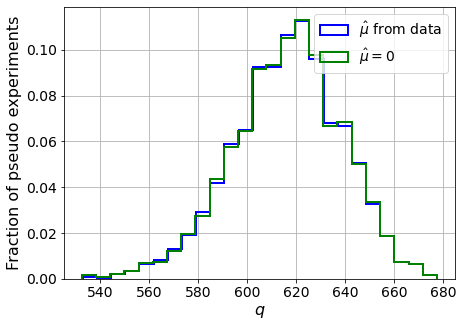

muhat mean:  -0.014031858854786243
Z_bins:  24.850851049820943
std Z_bins:  0.4458598823129865
Z_bins mu=0:  24.850851049820943
std Z_bins mu=0:  0.44951543512416786

--------

B_expected:  643
S_expected:  830



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


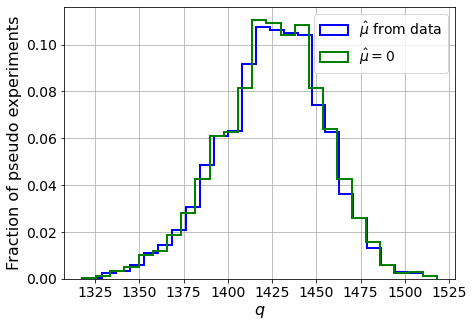

muhat mean:  -0.007928203560977695
Z_bins:  37.770862762972946
std Z_bins:  0.3919595010413924
Z_bins mu=0:  37.770862762972946
std Z_bins mu=0:  0.3937348116225915

--------

B_expected:  643
S_expected:  1787



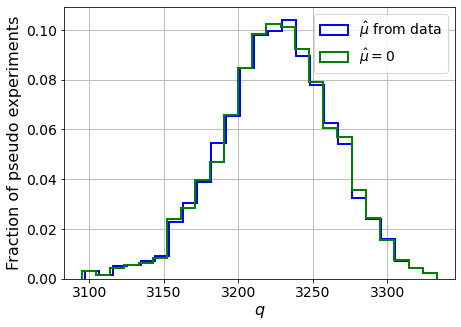

muhat mean:  -0.0034393490222514593
Z_bins:  56.80160358529859
std Z_bins:  0.3349954500225733
Z_bins mu=0:  56.80160358529859
std Z_bins mu=0:  0.3360634607893992

--------


 FINAL RESULT:

[[1.0859518342094465, 0.3493512638310484, -2.8651639053176687, 1.0859518342094465, 0.405720471175154], [1.6276763720634304, 0.4357650434070522, -1.381959974760968, 1.6276763720634304, 0.48475109721971676], [2.513100495093373, 0.5031264554848102, -0.9514451480103971, 2.513100495093373, 0.5379917685389216], [4.097842349859009, 0.5680432167572845, -0.3097916651098061, 4.097842349859009, 0.5943426715316519], [6.591076585335362, 0.5612906647497334, -0.1459157370157676, 6.591076585335362, 0.5742970394690488], [10.36857011104117, 0.5250719842866538, -0.06676484820272287, 10.36857011104117, 0.5330823379079975], [16.19322672237188, 0.4982381541448572, -0.03277195077208528, 16.19322672237188, 0.5039392229444419], [24.850851049820943, 0.4458598823129865, -0.014031858854786243, 24.850851049820943, 0.449515435

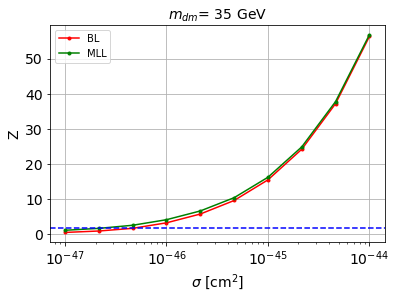


cross_BL_164:  4.642543316439867e-47
cross_BL_164_up:  2.681556796571753e-47
cross_BL_164_down:  6.757164725232577e-47

cross_MLL_164:  2.1842564469905747e-47
cross_MLL_164_up:  1.3335441229954073e-47
cross_MLL_164_down:  3.4871667516455653e-47

#########################


#########################

mDM =  50 GeV


S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)
 NUM_DAT:  31106 

NUM_DAT_ER:  30709
NUM_DAT_AC:  109
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  258

B_pbot.shape:  (31106,)
B_ptop.shape:  (31106,)
B_ppeakS1.shape : (31106, 8)
B_ppeakS2.shape:  (31106, 8)

S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)


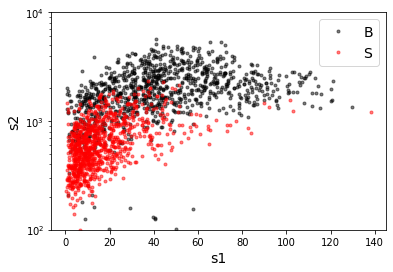

B_pdiffT.shape:  (31106,)
S_pdiffT.shape:  (31106,)


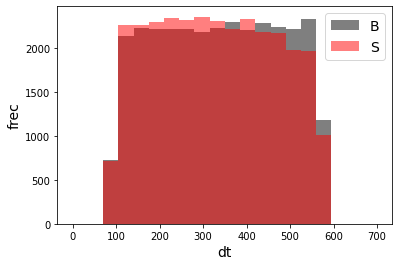

B_pbot.shape:  (31106,)
B_ptop.shape:  (31106,)
B_ppeakS1.shape : (31106, 7)
B_ppeakS2.shape:  (31106, 7)
S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 7)
S_ppeakS2.shape:  (31106, 7)
X_mon_B.shape:  (31106, 16)
X_mon_S.shape:  (31106, 16)
X_mon.shape:  (62212, 16)

X_mon_train :  (39660, 16)
y_mon_train :  (39660,)
X_mon_val :  (6999, 16)
y_mon_val :  (6999,)
X_mon_test :  (15553, 16)
y_mon_test :  (15553,)

[0]	validation_0-logloss:0.68660	validation_1-logloss:0.68659
[1]	validation_0-logloss:0.68019	validation_1-logloss:0.68015
[2]	validation_0-logloss:0.67389	validation_1-logloss:0.67383
[3]	validation_0-logloss:0.66772	validation_1-logloss:0.66765


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[4]	validation_0-logloss:0.66165	validation_1-logloss:0.66154
[5]	validation_0-logloss:0.65569	validation_1-logloss:0.65556
[6]	validation_0-logloss:0.64985	validation_1-logloss:0.64968
[7]	validation_0-logloss:0.64413	validation_1-logloss:0.64392
[8]	validation_0-logloss:0.63850	validation_1-logloss:0.63830
[9]	validation_0-logloss:0.63298	validation_1-logloss:0.63276
[10]	validation_0-logloss:0.62754	validation_1-logloss:0.62726
[11]	validation_0-logloss:0.62221	validation_1-logloss:0.62193
[12]	validation_0-logloss:0.61696	validation_1-logloss:0.61665
[13]	validation_0-logloss:0.61181	validation_1-logloss:0.61146
[14]	validation_0-logloss:0.60675	validation_1-logloss:0.60642
[15]	validation_0-logloss:0.60178	validation_1-logloss:0.60143
[16]	validation_0-logloss:0.59689	validation_1-logloss:0.59655
[17]	validation_0-logloss:0.59208	validation_1-logloss:0.59171
[18]	validation_0-logloss:0.58734	validation_1-logloss:0.58696
[19]	validation_0-logloss:0.58268	validation_1-logloss:0.5822

[134]	validation_0-logloss:0.32338	validation_1-logloss:0.32405
[135]	validation_0-logloss:0.32241	validation_1-logloss:0.32309
[136]	validation_0-logloss:0.32143	validation_1-logloss:0.32213
[137]	validation_0-logloss:0.32046	validation_1-logloss:0.32117
[138]	validation_0-logloss:0.31947	validation_1-logloss:0.32022
[139]	validation_0-logloss:0.31855	validation_1-logloss:0.31930
[140]	validation_0-logloss:0.31758	validation_1-logloss:0.31836
[141]	validation_0-logloss:0.31665	validation_1-logloss:0.31741
[142]	validation_0-logloss:0.31569	validation_1-logloss:0.31648
[143]	validation_0-logloss:0.31476	validation_1-logloss:0.31556
[144]	validation_0-logloss:0.31389	validation_1-logloss:0.31473
[145]	validation_0-logloss:0.31299	validation_1-logloss:0.31382
[146]	validation_0-logloss:0.31214	validation_1-logloss:0.31299
[147]	validation_0-logloss:0.31125	validation_1-logloss:0.31212
[148]	validation_0-logloss:0.31035	validation_1-logloss:0.31125
[149]	validation_0-logloss:0.30951	valid

[263]	validation_0-logloss:0.25174	validation_1-logloss:0.25430
[264]	validation_0-logloss:0.25146	validation_1-logloss:0.25405
[265]	validation_0-logloss:0.25119	validation_1-logloss:0.25380
[266]	validation_0-logloss:0.25094	validation_1-logloss:0.25356
[267]	validation_0-logloss:0.25067	validation_1-logloss:0.25334
[268]	validation_0-logloss:0.25042	validation_1-logloss:0.25311
[269]	validation_0-logloss:0.25013	validation_1-logloss:0.25283
[270]	validation_0-logloss:0.24987	validation_1-logloss:0.25258
[271]	validation_0-logloss:0.24959	validation_1-logloss:0.25234
[272]	validation_0-logloss:0.24932	validation_1-logloss:0.25208
[273]	validation_0-logloss:0.24906	validation_1-logloss:0.25184
[274]	validation_0-logloss:0.24878	validation_1-logloss:0.25159
[275]	validation_0-logloss:0.24852	validation_1-logloss:0.25137
[276]	validation_0-logloss:0.24827	validation_1-logloss:0.25113
[277]	validation_0-logloss:0.24802	validation_1-logloss:0.25090
[278]	validation_0-logloss:0.24777	valid

[392]	validation_0-logloss:0.22857	validation_1-logloss:0.23399
[393]	validation_0-logloss:0.22844	validation_1-logloss:0.23388
[394]	validation_0-logloss:0.22830	validation_1-logloss:0.23376
[395]	validation_0-logloss:0.22816	validation_1-logloss:0.23365
[396]	validation_0-logloss:0.22803	validation_1-logloss:0.23355
[397]	validation_0-logloss:0.22791	validation_1-logloss:0.23344
[398]	validation_0-logloss:0.22781	validation_1-logloss:0.23336
[399]	validation_0-logloss:0.22769	validation_1-logloss:0.23328
[400]	validation_0-logloss:0.22756	validation_1-logloss:0.23320
[401]	validation_0-logloss:0.22745	validation_1-logloss:0.23308
[402]	validation_0-logloss:0.22734	validation_1-logloss:0.23301
[403]	validation_0-logloss:0.22722	validation_1-logloss:0.23292
[404]	validation_0-logloss:0.22709	validation_1-logloss:0.23282
[405]	validation_0-logloss:0.22697	validation_1-logloss:0.23272
[406]	validation_0-logloss:0.22686	validation_1-logloss:0.23264
[407]	validation_0-logloss:0.22675	valid

[521]	validation_0-logloss:0.21631	validation_1-logloss:0.22524
[522]	validation_0-logloss:0.21624	validation_1-logloss:0.22518
[523]	validation_0-logloss:0.21619	validation_1-logloss:0.22516
[524]	validation_0-logloss:0.21609	validation_1-logloss:0.22510
[525]	validation_0-logloss:0.21604	validation_1-logloss:0.22507
[526]	validation_0-logloss:0.21596	validation_1-logloss:0.22501
[527]	validation_0-logloss:0.21588	validation_1-logloss:0.22496
[528]	validation_0-logloss:0.21580	validation_1-logloss:0.22490
[529]	validation_0-logloss:0.21575	validation_1-logloss:0.22488
[530]	validation_0-logloss:0.21565	validation_1-logloss:0.22482
[531]	validation_0-logloss:0.21560	validation_1-logloss:0.22478
[532]	validation_0-logloss:0.21551	validation_1-logloss:0.22472
[533]	validation_0-logloss:0.21546	validation_1-logloss:0.22468
[534]	validation_0-logloss:0.21537	validation_1-logloss:0.22462
[535]	validation_0-logloss:0.21532	validation_1-logloss:0.22460
[536]	validation_0-logloss:0.21524	valid

[650]	validation_0-logloss:0.20797	validation_1-logloss:0.21991
[651]	validation_0-logloss:0.20790	validation_1-logloss:0.21987
[652]	validation_0-logloss:0.20783	validation_1-logloss:0.21984
[653]	validation_0-logloss:0.20777	validation_1-logloss:0.21980
[654]	validation_0-logloss:0.20770	validation_1-logloss:0.21978
[655]	validation_0-logloss:0.20764	validation_1-logloss:0.21975
[656]	validation_0-logloss:0.20757	validation_1-logloss:0.21972
[657]	validation_0-logloss:0.20752	validation_1-logloss:0.21968
[658]	validation_0-logloss:0.20748	validation_1-logloss:0.21965
[659]	validation_0-logloss:0.20742	validation_1-logloss:0.21962
[660]	validation_0-logloss:0.20737	validation_1-logloss:0.21960
[661]	validation_0-logloss:0.20733	validation_1-logloss:0.21958
[662]	validation_0-logloss:0.20726	validation_1-logloss:0.21954
[663]	validation_0-logloss:0.20719	validation_1-logloss:0.21953
[664]	validation_0-logloss:0.20713	validation_1-logloss:0.21950
[665]	validation_0-logloss:0.20706	valid

[779]	validation_0-logloss:0.20128	validation_1-logloss:0.21635
[780]	validation_0-logloss:0.20126	validation_1-logloss:0.21634
[781]	validation_0-logloss:0.20120	validation_1-logloss:0.21633
[782]	validation_0-logloss:0.20116	validation_1-logloss:0.21632
[783]	validation_0-logloss:0.20111	validation_1-logloss:0.21628
[784]	validation_0-logloss:0.20106	validation_1-logloss:0.21627
[785]	validation_0-logloss:0.20102	validation_1-logloss:0.21625
[786]	validation_0-logloss:0.20095	validation_1-logloss:0.21621
[787]	validation_0-logloss:0.20090	validation_1-logloss:0.21620
[788]	validation_0-logloss:0.20086	validation_1-logloss:0.21618
[789]	validation_0-logloss:0.20082	validation_1-logloss:0.21615
[790]	validation_0-logloss:0.20076	validation_1-logloss:0.21611
[791]	validation_0-logloss:0.20071	validation_1-logloss:0.21608
[792]	validation_0-logloss:0.20066	validation_1-logloss:0.21608
[793]	validation_0-logloss:0.20061	validation_1-logloss:0.21605
[794]	validation_0-logloss:0.20056	valid

[908]	validation_0-logloss:0.19612	validation_1-logloss:0.21410
[909]	validation_0-logloss:0.19607	validation_1-logloss:0.21408
[910]	validation_0-logloss:0.19605	validation_1-logloss:0.21408
[911]	validation_0-logloss:0.19602	validation_1-logloss:0.21408
[912]	validation_0-logloss:0.19598	validation_1-logloss:0.21407
[913]	validation_0-logloss:0.19595	validation_1-logloss:0.21405
[914]	validation_0-logloss:0.19592	validation_1-logloss:0.21406
[915]	validation_0-logloss:0.19587	validation_1-logloss:0.21405
[916]	validation_0-logloss:0.19586	validation_1-logloss:0.21404
[917]	validation_0-logloss:0.19581	validation_1-logloss:0.21402
[918]	validation_0-logloss:0.19576	validation_1-logloss:0.21400
[919]	validation_0-logloss:0.19573	validation_1-logloss:0.21399
[920]	validation_0-logloss:0.19567	validation_1-logloss:0.21394
[921]	validation_0-logloss:0.19565	validation_1-logloss:0.21394
[922]	validation_0-logloss:0.19560	validation_1-logloss:0.21392
[923]	validation_0-logloss:0.19555	valid

[1036]	validation_0-logloss:0.19169	validation_1-logloss:0.21240
[1037]	validation_0-logloss:0.19167	validation_1-logloss:0.21240
[1038]	validation_0-logloss:0.19162	validation_1-logloss:0.21238
[1039]	validation_0-logloss:0.19161	validation_1-logloss:0.21238
[1040]	validation_0-logloss:0.19157	validation_1-logloss:0.21236
[1041]	validation_0-logloss:0.19156	validation_1-logloss:0.21236
[1042]	validation_0-logloss:0.19153	validation_1-logloss:0.21235
[1043]	validation_0-logloss:0.19150	validation_1-logloss:0.21235
[1044]	validation_0-logloss:0.19145	validation_1-logloss:0.21233
[1045]	validation_0-logloss:0.19141	validation_1-logloss:0.21232
[1046]	validation_0-logloss:0.19136	validation_1-logloss:0.21231
[1047]	validation_0-logloss:0.19134	validation_1-logloss:0.21230
[1048]	validation_0-logloss:0.19131	validation_1-logloss:0.21228
[1049]	validation_0-logloss:0.19129	validation_1-logloss:0.21228
[1050]	validation_0-logloss:0.19125	validation_1-logloss:0.21226
[1051]	validation_0-loglo

[1163]	validation_0-logloss:0.18759	validation_1-logloss:0.21106
[1164]	validation_0-logloss:0.18757	validation_1-logloss:0.21105
[1165]	validation_0-logloss:0.18755	validation_1-logloss:0.21104
[1166]	validation_0-logloss:0.18752	validation_1-logloss:0.21102
[1167]	validation_0-logloss:0.18746	validation_1-logloss:0.21101
[1168]	validation_0-logloss:0.18742	validation_1-logloss:0.21098
[1169]	validation_0-logloss:0.18738	validation_1-logloss:0.21097
[1170]	validation_0-logloss:0.18734	validation_1-logloss:0.21096
[1171]	validation_0-logloss:0.18732	validation_1-logloss:0.21096
[1172]	validation_0-logloss:0.18730	validation_1-logloss:0.21095
[1173]	validation_0-logloss:0.18725	validation_1-logloss:0.21093
[1174]	validation_0-logloss:0.18723	validation_1-logloss:0.21093
[1175]	validation_0-logloss:0.18721	validation_1-logloss:0.21092
[1176]	validation_0-logloss:0.18718	validation_1-logloss:0.21091
[1177]	validation_0-logloss:0.18714	validation_1-logloss:0.21090
[1178]	validation_0-loglo

[1290]	validation_0-logloss:0.18360	validation_1-logloss:0.20982
[1291]	validation_0-logloss:0.18358	validation_1-logloss:0.20983
[1292]	validation_0-logloss:0.18355	validation_1-logloss:0.20981
[1293]	validation_0-logloss:0.18352	validation_1-logloss:0.20981
[1294]	validation_0-logloss:0.18350	validation_1-logloss:0.20980
[1295]	validation_0-logloss:0.18346	validation_1-logloss:0.20978
[1296]	validation_0-logloss:0.18344	validation_1-logloss:0.20978
[1297]	validation_0-logloss:0.18342	validation_1-logloss:0.20978
[1298]	validation_0-logloss:0.18338	validation_1-logloss:0.20977
[1299]	validation_0-logloss:0.18336	validation_1-logloss:0.20977
[1300]	validation_0-logloss:0.18334	validation_1-logloss:0.20977
[1301]	validation_0-logloss:0.18329	validation_1-logloss:0.20975
[1302]	validation_0-logloss:0.18326	validation_1-logloss:0.20974
[1303]	validation_0-logloss:0.18324	validation_1-logloss:0.20974
[1304]	validation_0-logloss:0.18322	validation_1-logloss:0.20974
[1305]	validation_0-loglo

[1417]	validation_0-logloss:0.18011	validation_1-logloss:0.20895
[1418]	validation_0-logloss:0.18007	validation_1-logloss:0.20895
[1419]	validation_0-logloss:0.18004	validation_1-logloss:0.20894
[1420]	validation_0-logloss:0.18002	validation_1-logloss:0.20894
[1421]	validation_0-logloss:0.18000	validation_1-logloss:0.20894
[1422]	validation_0-logloss:0.17996	validation_1-logloss:0.20893
[1423]	validation_0-logloss:0.17994	validation_1-logloss:0.20892
[1424]	validation_0-logloss:0.17991	validation_1-logloss:0.20891
[1425]	validation_0-logloss:0.17988	validation_1-logloss:0.20889
[1426]	validation_0-logloss:0.17986	validation_1-logloss:0.20889
[1427]	validation_0-logloss:0.17981	validation_1-logloss:0.20887
[1428]	validation_0-logloss:0.17978	validation_1-logloss:0.20886
[1429]	validation_0-logloss:0.17977	validation_1-logloss:0.20886
[1430]	validation_0-logloss:0.17973	validation_1-logloss:0.20887
[1431]	validation_0-logloss:0.17971	validation_1-logloss:0.20888
[1432]	validation_0-loglo

[1544]	validation_0-logloss:0.17688	validation_1-logloss:0.20813
[1545]	validation_0-logloss:0.17684	validation_1-logloss:0.20812
[1546]	validation_0-logloss:0.17680	validation_1-logloss:0.20810
[1547]	validation_0-logloss:0.17677	validation_1-logloss:0.20809
[1548]	validation_0-logloss:0.17674	validation_1-logloss:0.20809
[1549]	validation_0-logloss:0.17673	validation_1-logloss:0.20809
[1550]	validation_0-logloss:0.17671	validation_1-logloss:0.20809
[1551]	validation_0-logloss:0.17668	validation_1-logloss:0.20807
[1552]	validation_0-logloss:0.17666	validation_1-logloss:0.20807
[1553]	validation_0-logloss:0.17665	validation_1-logloss:0.20807
[1554]	validation_0-logloss:0.17663	validation_1-logloss:0.20805
[1555]	validation_0-logloss:0.17659	validation_1-logloss:0.20805
[1556]	validation_0-logloss:0.17656	validation_1-logloss:0.20804
[1557]	validation_0-logloss:0.17653	validation_1-logloss:0.20802
[1558]	validation_0-logloss:0.17650	validation_1-logloss:0.20801
[1559]	validation_0-loglo

[1671]	validation_0-logloss:0.17372	validation_1-logloss:0.20731
[1672]	validation_0-logloss:0.17369	validation_1-logloss:0.20731
[1673]	validation_0-logloss:0.17367	validation_1-logloss:0.20730
[1674]	validation_0-logloss:0.17364	validation_1-logloss:0.20729
[1675]	validation_0-logloss:0.17361	validation_1-logloss:0.20728
[1676]	validation_0-logloss:0.17359	validation_1-logloss:0.20728
[1677]	validation_0-logloss:0.17357	validation_1-logloss:0.20728
[1678]	validation_0-logloss:0.17356	validation_1-logloss:0.20727
[1679]	validation_0-logloss:0.17354	validation_1-logloss:0.20727
[1680]	validation_0-logloss:0.17350	validation_1-logloss:0.20726
[1681]	validation_0-logloss:0.17346	validation_1-logloss:0.20726
[1682]	validation_0-logloss:0.17344	validation_1-logloss:0.20726
[1683]	validation_0-logloss:0.17341	validation_1-logloss:0.20725
[1684]	validation_0-logloss:0.17340	validation_1-logloss:0.20725
[1685]	validation_0-logloss:0.17338	validation_1-logloss:0.20725
[1686]	validation_0-loglo

[1798]	validation_0-logloss:0.17092	validation_1-logloss:0.20688
[1799]	validation_0-logloss:0.17089	validation_1-logloss:0.20687
[1800]	validation_0-logloss:0.17088	validation_1-logloss:0.20687
[1801]	validation_0-logloss:0.17087	validation_1-logloss:0.20687
[1802]	validation_0-logloss:0.17086	validation_1-logloss:0.20686
[1803]	validation_0-logloss:0.17083	validation_1-logloss:0.20686
[1804]	validation_0-logloss:0.17083	validation_1-logloss:0.20686
[1805]	validation_0-logloss:0.17080	validation_1-logloss:0.20685
[1806]	validation_0-logloss:0.17078	validation_1-logloss:0.20684
[1807]	validation_0-logloss:0.17074	validation_1-logloss:0.20683
[1808]	validation_0-logloss:0.17071	validation_1-logloss:0.20682
[1809]	validation_0-logloss:0.17068	validation_1-logloss:0.20681
[1810]	validation_0-logloss:0.17065	validation_1-logloss:0.20680
[1811]	validation_0-logloss:0.17065	validation_1-logloss:0.20680
[1812]	validation_0-logloss:0.17062	validation_1-logloss:0.20678
[1813]	validation_0-loglo

[1925]	validation_0-logloss:0.16804	validation_1-logloss:0.20637
[1926]	validation_0-logloss:0.16801	validation_1-logloss:0.20636
[1927]	validation_0-logloss:0.16798	validation_1-logloss:0.20635
[1928]	validation_0-logloss:0.16795	validation_1-logloss:0.20635
[1929]	validation_0-logloss:0.16792	validation_1-logloss:0.20634
[1930]	validation_0-logloss:0.16792	validation_1-logloss:0.20634
[1931]	validation_0-logloss:0.16790	validation_1-logloss:0.20633
[1932]	validation_0-logloss:0.16789	validation_1-logloss:0.20633
[1933]	validation_0-logloss:0.16788	validation_1-logloss:0.20633
[1934]	validation_0-logloss:0.16787	validation_1-logloss:0.20633
[1935]	validation_0-logloss:0.16785	validation_1-logloss:0.20633
[1936]	validation_0-logloss:0.16783	validation_1-logloss:0.20631
[1937]	validation_0-logloss:0.16781	validation_1-logloss:0.20631
[1938]	validation_0-logloss:0.16778	validation_1-logloss:0.20631
[1939]	validation_0-logloss:0.16778	validation_1-logloss:0.20631
[1940]	validation_0-loglo

[2052]	validation_0-logloss:0.16538	validation_1-logloss:0.20590
[2053]	validation_0-logloss:0.16536	validation_1-logloss:0.20591
[2054]	validation_0-logloss:0.16534	validation_1-logloss:0.20590
[2055]	validation_0-logloss:0.16532	validation_1-logloss:0.20590
[2056]	validation_0-logloss:0.16529	validation_1-logloss:0.20589
[2057]	validation_0-logloss:0.16528	validation_1-logloss:0.20590
[2058]	validation_0-logloss:0.16527	validation_1-logloss:0.20589
[2059]	validation_0-logloss:0.16523	validation_1-logloss:0.20588
[2060]	validation_0-logloss:0.16521	validation_1-logloss:0.20589
[2061]	validation_0-logloss:0.16519	validation_1-logloss:0.20589
[2062]	validation_0-logloss:0.16518	validation_1-logloss:0.20589
[2063]	validation_0-logloss:0.16515	validation_1-logloss:0.20588
[2064]	validation_0-logloss:0.16512	validation_1-logloss:0.20588
[2065]	validation_0-logloss:0.16509	validation_1-logloss:0.20588
[2066]	validation_0-logloss:0.16507	validation_1-logloss:0.20588
[2067]	validation_0-loglo

[2179]	validation_0-logloss:0.16267	validation_1-logloss:0.20550
[2180]	validation_0-logloss:0.16265	validation_1-logloss:0.20550
[2181]	validation_0-logloss:0.16265	validation_1-logloss:0.20550
[2182]	validation_0-logloss:0.16262	validation_1-logloss:0.20550
[2183]	validation_0-logloss:0.16260	validation_1-logloss:0.20550
[2184]	validation_0-logloss:0.16258	validation_1-logloss:0.20550
[2185]	validation_0-logloss:0.16256	validation_1-logloss:0.20549
[2186]	validation_0-logloss:0.16255	validation_1-logloss:0.20549
[2187]	validation_0-logloss:0.16252	validation_1-logloss:0.20548
[2188]	validation_0-logloss:0.16249	validation_1-logloss:0.20547
[2189]	validation_0-logloss:0.16246	validation_1-logloss:0.20548
[2190]	validation_0-logloss:0.16245	validation_1-logloss:0.20547
[2191]	validation_0-logloss:0.16242	validation_1-logloss:0.20548
[2192]	validation_0-logloss:0.16239	validation_1-logloss:0.20547
[2193]	validation_0-logloss:0.16237	validation_1-logloss:0.20547
[2194]	validation_0-loglo

[2306]	validation_0-logloss:0.15997	validation_1-logloss:0.20523
[2307]	validation_0-logloss:0.15997	validation_1-logloss:0.20523
[2308]	validation_0-logloss:0.15996	validation_1-logloss:0.20523
[2309]	validation_0-logloss:0.15995	validation_1-logloss:0.20524
[2310]	validation_0-logloss:0.15992	validation_1-logloss:0.20524
[2311]	validation_0-logloss:0.15988	validation_1-logloss:0.20524
[2312]	validation_0-logloss:0.15986	validation_1-logloss:0.20522
[2313]	validation_0-logloss:0.15984	validation_1-logloss:0.20522
[2314]	validation_0-logloss:0.15982	validation_1-logloss:0.20523
[2315]	validation_0-logloss:0.15981	validation_1-logloss:0.20523
[2316]	validation_0-logloss:0.15980	validation_1-logloss:0.20522
[2317]	validation_0-logloss:0.15977	validation_1-logloss:0.20522
[2318]	validation_0-logloss:0.15975	validation_1-logloss:0.20523
[2319]	validation_0-logloss:0.15972	validation_1-logloss:0.20523
[2320]	validation_0-logloss:0.15970	validation_1-logloss:0.20522
[2321]	validation_0-loglo

[2433]	validation_0-logloss:0.15722	validation_1-logloss:0.20495
[2434]	validation_0-logloss:0.15720	validation_1-logloss:0.20495
[2435]	validation_0-logloss:0.15718	validation_1-logloss:0.20495
[2436]	validation_0-logloss:0.15715	validation_1-logloss:0.20495
[2437]	validation_0-logloss:0.15713	validation_1-logloss:0.20495
[2438]	validation_0-logloss:0.15711	validation_1-logloss:0.20493
[2439]	validation_0-logloss:0.15707	validation_1-logloss:0.20493
[2440]	validation_0-logloss:0.15706	validation_1-logloss:0.20493
[2441]	validation_0-logloss:0.15704	validation_1-logloss:0.20492
[2442]	validation_0-logloss:0.15701	validation_1-logloss:0.20492
[2443]	validation_0-logloss:0.15699	validation_1-logloss:0.20491
[2444]	validation_0-logloss:0.15697	validation_1-logloss:0.20490
[2445]	validation_0-logloss:0.15694	validation_1-logloss:0.20490
[2446]	validation_0-logloss:0.15691	validation_1-logloss:0.20488
[2447]	validation_0-logloss:0.15689	validation_1-logloss:0.20489
[2448]	validation_0-loglo

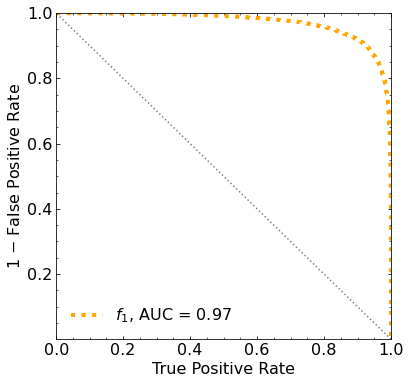

Classification score:


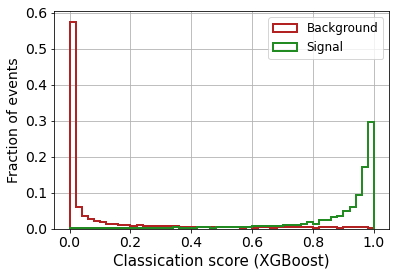


 ROC-AUC =  0.9705238869777242
At least 5 B events per bin, range = [[0, 1]]:
# bins:  23 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  23
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.008


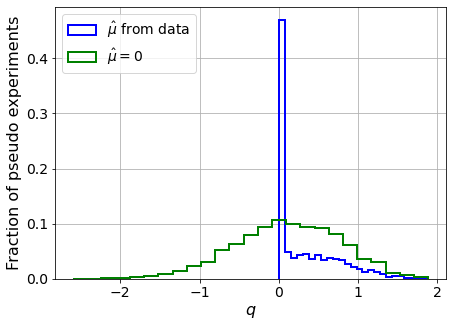

muhat mean:  0.08905589753126525
Z_bins:  0.3449071130340284
std Z_bins:  0.5918328859981328
Z_bins mu=0:  0.34471357559121735
std Z_bins mu=0:  0.9721810621742193

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.013


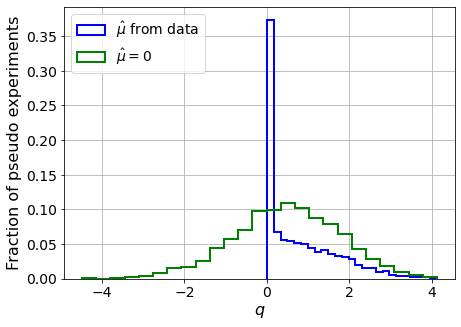

muhat mean:  0.02080181137799209
Z_bins:  0.707479511588156
std Z_bins:  0.621226898769934
Z_bins mu=0:  0.707479511588156
std Z_bins mu=0:  0.9169603656991808

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0135


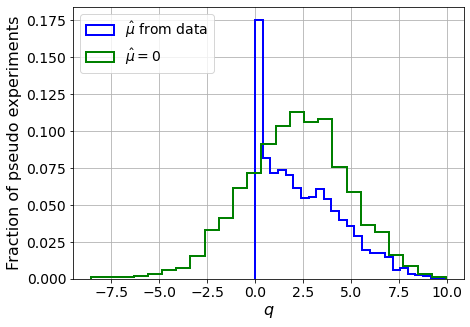

muhat mean:  0.01945780955506706
Z_bins:  1.4695102920623464
std Z_bins:  0.6973600791004606
Z_bins mu=0:  1.4694354120603033
std Z_bins mu=0:  0.9111787574853946

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0155


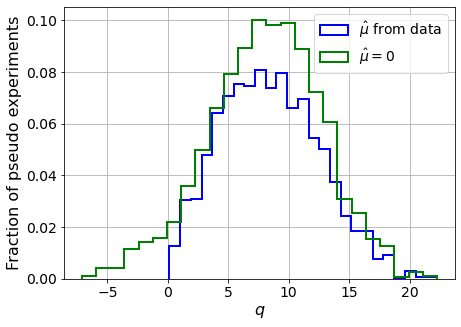

muhat mean:  -0.0024000177007573727
Z_bins:  2.867215350116177
std Z_bins:  0.7059289959814052
Z_bins mu=0:  2.867215350116177
std Z_bins mu=0:  0.8136465051578132

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0125


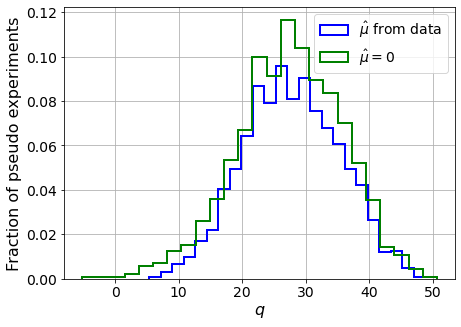

muhat mean:  -0.0023294738418316047
Z_bins:  5.245214625102121
std Z_bins:  0.7255765183028806
Z_bins mu=0:  5.245214625102121
std Z_bins mu=0:  0.7941029942760965

--------

B_expected:  643
S_expected:  89

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0185


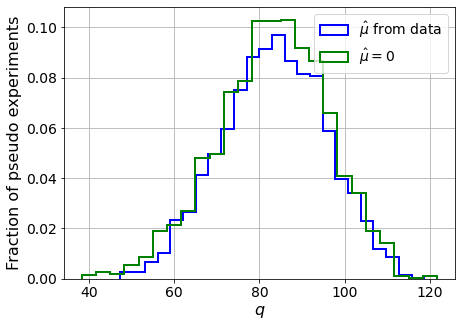

muhat mean:  0.0001634316349694726
Z_bins:  9.144484787564155
std Z_bins:  0.6673826851562892
Z_bins mu=0:  9.144484787564155
std Z_bins mu=0:  0.7065808805891499

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0095


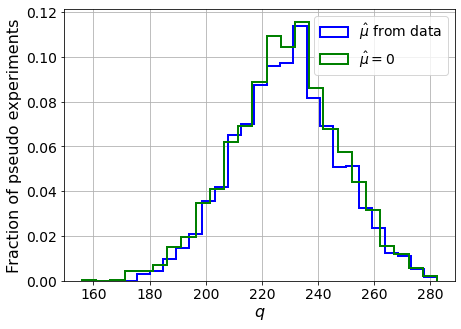

muhat mean:  -0.00037863372236536383
Z_bins:  15.130198796703404
std Z_bins:  0.6129567411763271
Z_bins mu=0:  15.129805163717576
std Z_bins mu=0:  0.6346912815516221

--------

B_expected:  643
S_expected:  413

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0095


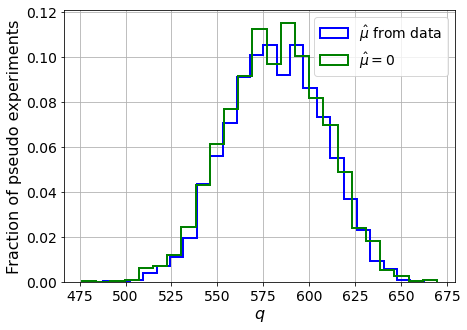

muhat mean:  -3.5348826664018266e-05
Z_bins:  24.11490334388662
std Z_bins:  0.5374040266449802
Z_bins mu=0:  24.114472866294562
std Z_bins mu=0:  0.5506216375088037

--------

B_expected:  643
S_expected:  889

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.013


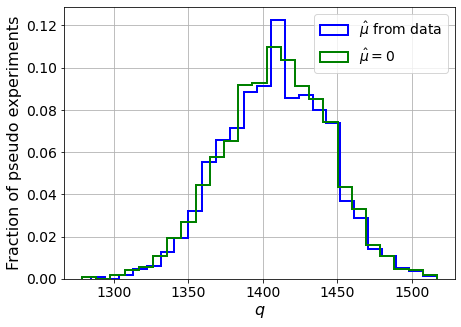

muhat mean:  -0.00015885351105974328
Z_bins:  37.544737653071
std Z_bins:  0.4672388878444622
Z_bins mu=0:  37.54338244232248
std Z_bins mu=0:  0.47523920544063614

--------

B_expected:  643
S_expected:  1915

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0155


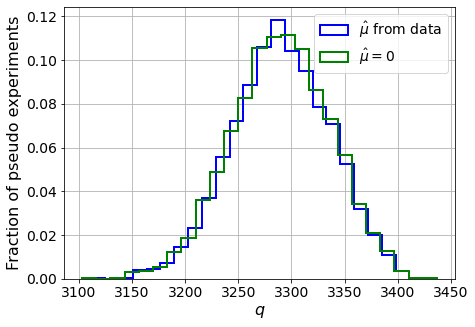

muhat mean:  -3.276742466819834e-05
Z_bins:  57.3633829720467
std Z_bins:  0.40280932070001063
Z_bins mu=0:  57.360419483922534
std Z_bins mu=0:  0.4074279297399798

--------


 FINAL RESULT:

[[0.3449071130340284, 0.5918328859981328, 0.08905589753126525, 0.34471357559121735, 0.9721810621742193], [0.707479511588156, 0.621226898769934, 0.02080181137799209, 0.707479511588156, 0.9169603656991808], [1.4695102920623464, 0.6973600791004606, 0.01945780955506706, 1.4694354120603033, 0.9111787574853946], [2.867215350116177, 0.7059289959814052, -0.0024000177007573727, 2.867215350116177, 0.8136465051578132], [5.245214625102121, 0.7255765183028806, -0.0023294738418316047, 5.245214625102121, 0.7941029942760965], [9.144484787564155, 0.6673826851562892, 0.0001634316349694726, 9.144484787564155, 0.7065808805891499], [15.130198796703404, 0.6129567411763271, -0.00037863372236536383, 15.129805163717576, 0.6346912815516221], [24.11490334388662, 0.5374040266449802, -3.5348826664018266e-05, 24.1144728662945

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  292.54089319  258.96766725  221.43695637  177.79582618
  132.1628492    81.47986578   23.71254584  -36.59032419 -100.02684102]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 224.44731326 213.94833488 197.029233

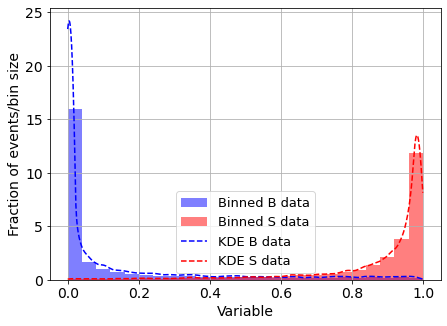

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



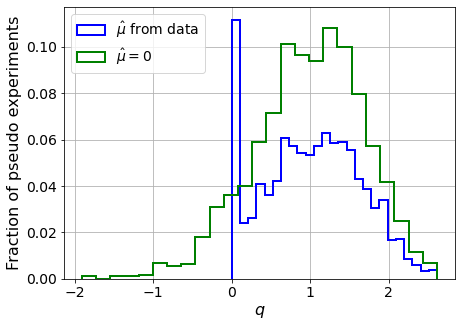

muhat mean:  -3.821717818561092
Z_bins:  1.0174838328692641
std Z_bins:  0.30451164450478974
Z_bins mu=0:  1.0174838328692641
std Z_bins mu=0:  0.3388004164403458

--------

B_expected:  643
S_expected:  4



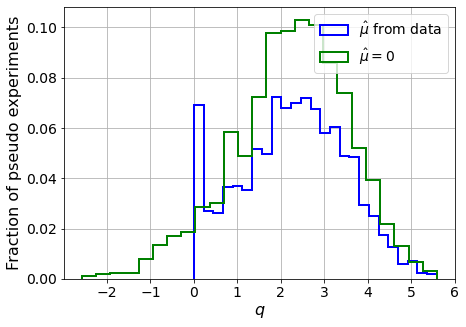

muhat mean:  -2.0341696991965494
Z_bins:  1.5242474411341278
std Z_bins:  0.39976519996924426
Z_bins mu=0:  1.5242474411341278
std Z_bins mu=0:  0.4342936624670905

--------

B_expected:  643
S_expected:  9



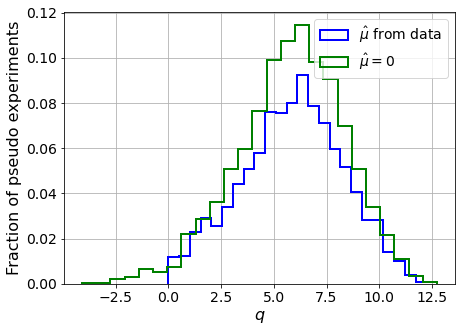

muhat mean:  -0.8332598658972435
Z_bins:  2.4449600832671465
std Z_bins:  0.49394470074037505
Z_bins mu=0:  2.4449600832671465
std Z_bins mu=0:  0.5160046417733611

--------

B_expected:  643
S_expected:  19



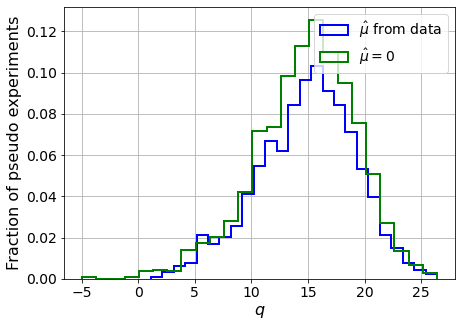

muhat mean:  -0.3979412534603763
Z_bins:  3.895748856867776
std Z_bins:  0.5518753613660095
Z_bins mu=0:  3.895748856867776
std Z_bins mu=0:  0.5714030817023064

--------

B_expected:  643
S_expected:  41



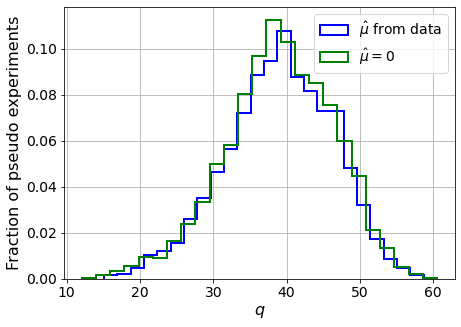

muhat mean:  -0.18306415687314734
Z_bins:  6.257271173785546
std Z_bins:  0.5834116779907355
Z_bins mu=0:  6.257271173785546
std Z_bins mu=0:  0.5923005182462995

--------

B_expected:  643
S_expected:  89



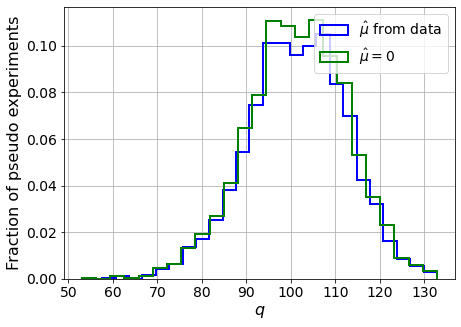

muhat mean:  -0.0823113749888678
Z_bins:  10.087561324795267
std Z_bins:  0.5505838947316957
Z_bins mu=0:  10.087561324795267
std Z_bins mu=0:  0.5548378042281465

--------

B_expected:  643
S_expected:  192



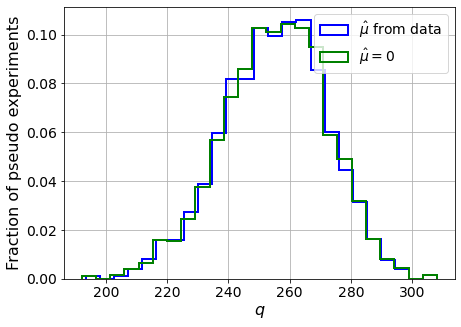

muhat mean:  -0.04042242938328591
Z_bins:  15.995191160786407
std Z_bins:  0.526715922446673
Z_bins mu=0:  15.995191160786407
std Z_bins mu=0:  0.5297891327706369

--------

B_expected:  643
S_expected:  413



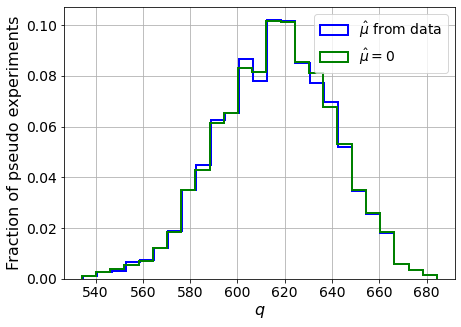

muhat mean:  -0.016995903861626565
Z_bins:  24.83775289013536
std Z_bins:  0.4878418965678659
Z_bins mu=0:  24.83715625281514
std Z_bins mu=0:  0.489472863111757

--------

B_expected:  643
S_expected:  889



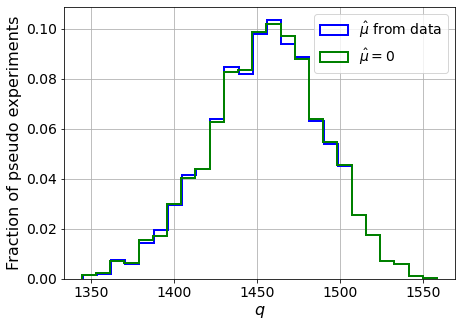

muhat mean:  -0.008845054303478999
Z_bins:  38.16384566763866
std Z_bins:  0.45061095675414364
Z_bins mu=0:  38.16384566763866
std Z_bins mu=0:  0.451630441716481

--------

B_expected:  643
S_expected:  1915



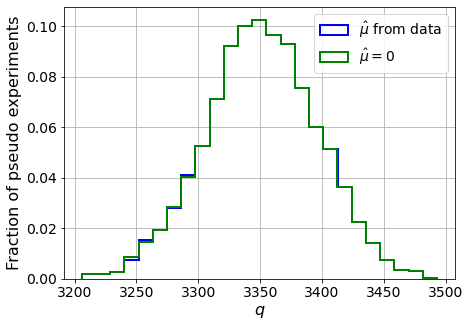

muhat mean:  -0.003709405843451199
Z_bins:  57.88655369395283
std Z_bins:  0.38700050660589286
Z_bins mu=0:  57.88655369395283
std Z_bins mu=0:  0.38753168055767845

--------


 FINAL RESULT:

[[1.0174838328692641, 0.30451164450478974, -3.821717818561092, 1.0174838328692641, 0.3388004164403458], [1.5242474411341278, 0.39976519996924426, -2.0341696991965494, 1.5242474411341278, 0.4342936624670905], [2.4449600832671465, 0.49394470074037505, -0.8332598658972435, 2.4449600832671465, 0.5160046417733611], [3.895748856867776, 0.5518753613660095, -0.3979412534603763, 3.895748856867776, 0.5714030817023064], [6.257271173785546, 0.5834116779907355, -0.18306415687314734, 6.257271173785546, 0.5923005182462995], [10.087561324795267, 0.5505838947316957, -0.0823113749888678, 10.087561324795267, 0.5548378042281465], [15.995191160786407, 0.526715922446673, -0.04042242938328591, 15.995191160786407, 0.5297891327706369], [24.83775289013536, 0.4878418965678659, -0.016995903861626565, 24.83715625281514, 0.48

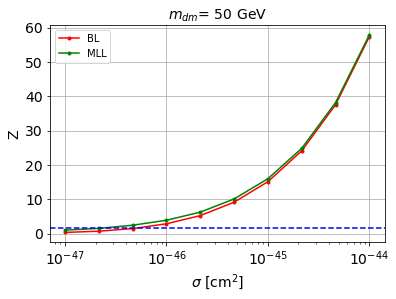


cross_BL_164:  5.232129718601479e-47
cross_BL_164_up:  3.0220642561817695e-47
cross_BL_164_down:  7.878533348974299e-47

cross_MLL_164:  2.4293774080389815e-47
cross_MLL_164_up:  1.595869569394034e-47
cross_MLL_164_down:  3.650610811388858e-47

#########################


#########################

mDM =  100 GeV


S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)
 NUM_DAT:  32010 

NUM_DAT_ER:  31600
NUM_DAT_AC:  113
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  266

B_pbot.shape:  (32010,)
B_ptop.shape:  (32010,)
B_ppeakS1.shape : (32010, 8)
B_ppeakS2.shape:  (32010, 8)

S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)


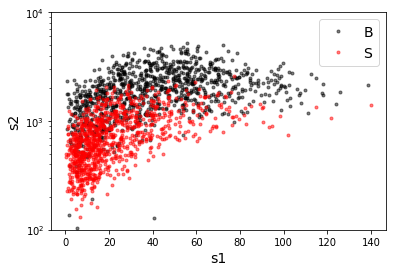

B_pdiffT.shape:  (32010,)
S_pdiffT.shape:  (32010,)


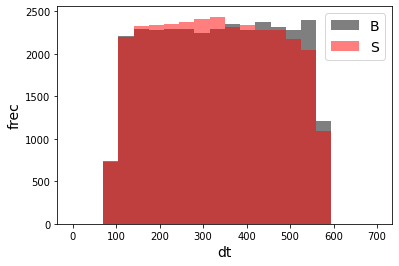

B_pbot.shape:  (32010,)
B_ptop.shape:  (32010,)
B_ppeakS1.shape : (32010, 7)
B_ppeakS2.shape:  (32010, 7)
S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 7)
S_ppeakS2.shape:  (32010, 7)
X_mon_B.shape:  (32010, 16)
X_mon_S.shape:  (32010, 16)
X_mon.shape:  (64020, 16)

X_mon_train :  (40812, 16)
y_mon_train :  (40812,)
X_mon_val :  (7203, 16)
y_mon_val :  (7203,)
X_mon_test :  (16005, 16)
y_mon_test :  (16005,)

[0]	validation_0-logloss:0.68712	validation_1-logloss:0.68719
[1]	validation_0-logloss:0.68124	validation_1-logloss:0.68136
[2]	validation_0-logloss:0.67545	validation_1-logloss:0.67565
[3]	validation_0-logloss:0.66978	validation_1-logloss:0.67004
[4]	validation_0-logloss:0.66421	validation_1-logloss:0.66452
[5]	validation_0-logloss:0.65875	validation_1-logloss:0.65911
[6]	validation_0-logloss:0.65338	validation_1-logloss:0.65381
[7]	validation_0-logloss:0.64813	validation_1-logloss:0.64861
[8]	validation_0-logloss:0.64293	validation_1-logloss:0.64345
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11]	validation_0-logloss:0.62799	validation_1-logloss:0.62866
[12]	validation_0-logloss:0.62319	validation_1-logloss:0.62390
[13]	validation_0-logloss:0.61847	validation_1-logloss:0.61922
[14]	validation_0-logloss:0.61380	validation_1-logloss:0.61462
[15]	validation_0-logloss:0.60925	validation_1-logloss:0.61011
[16]	validation_0-logloss:0.60479	validation_1-logloss:0.60567
[17]	validation_0-logloss:0.60036	validation_1-logloss:0.60133
[18]	validation_0-logloss:0.59604	validation_1-logloss:0.59706
[19]	validation_0-logloss:0.59177	validation_1-logloss:0.59285
[20]	validation_0-logloss:0.58760	validation_1-logloss:0.58873
[21]	validation_0-logloss:0.58346	validation_1-logloss:0.58465
[22]	validation_0-logloss:0.57939	validation_1-logloss:0.58062
[23]	validation_0-logloss:0.57543	validation_1-logloss:0.57671
[24]	validation_0-logloss:0.57150	validation_1-logloss:0.57285
[25]	validation_0-logloss:0.56767	validation_1-logloss:0.56907
[26]	validation_0-logloss:0.56385	validation_1-logloss:

[141]	validation_0-logloss:0.34685	validation_1-logloss:0.35332
[142]	validation_0-logloss:0.34600	validation_1-logloss:0.35252
[143]	validation_0-logloss:0.34511	validation_1-logloss:0.35168
[144]	validation_0-logloss:0.34422	validation_1-logloss:0.35083
[145]	validation_0-logloss:0.34335	validation_1-logloss:0.35000
[146]	validation_0-logloss:0.34250	validation_1-logloss:0.34918
[147]	validation_0-logloss:0.34171	validation_1-logloss:0.34842
[148]	validation_0-logloss:0.34090	validation_1-logloss:0.34766
[149]	validation_0-logloss:0.34006	validation_1-logloss:0.34685
[150]	validation_0-logloss:0.33926	validation_1-logloss:0.34606
[151]	validation_0-logloss:0.33843	validation_1-logloss:0.34528
[152]	validation_0-logloss:0.33767	validation_1-logloss:0.34454
[153]	validation_0-logloss:0.33690	validation_1-logloss:0.34384
[154]	validation_0-logloss:0.33611	validation_1-logloss:0.34307
[155]	validation_0-logloss:0.33533	validation_1-logloss:0.34232
[156]	validation_0-logloss:0.33455	valid

[270]	validation_0-logloss:0.28166	validation_1-logloss:0.29246
[271]	validation_0-logloss:0.28142	validation_1-logloss:0.29228
[272]	validation_0-logloss:0.28118	validation_1-logloss:0.29206
[273]	validation_0-logloss:0.28090	validation_1-logloss:0.29180
[274]	validation_0-logloss:0.28064	validation_1-logloss:0.29157
[275]	validation_0-logloss:0.28042	validation_1-logloss:0.29138
[276]	validation_0-logloss:0.28017	validation_1-logloss:0.29115
[277]	validation_0-logloss:0.27992	validation_1-logloss:0.29093
[278]	validation_0-logloss:0.27966	validation_1-logloss:0.29069
[279]	validation_0-logloss:0.27944	validation_1-logloss:0.29052
[280]	validation_0-logloss:0.27919	validation_1-logloss:0.29029
[281]	validation_0-logloss:0.27895	validation_1-logloss:0.29008
[282]	validation_0-logloss:0.27870	validation_1-logloss:0.28988
[283]	validation_0-logloss:0.27845	validation_1-logloss:0.28963
[284]	validation_0-logloss:0.27822	validation_1-logloss:0.28945
[285]	validation_0-logloss:0.27801	valid

[399]	validation_0-logloss:0.25907	validation_1-logloss:0.27295
[400]	validation_0-logloss:0.25892	validation_1-logloss:0.27285
[401]	validation_0-logloss:0.25878	validation_1-logloss:0.27272
[402]	validation_0-logloss:0.25866	validation_1-logloss:0.27263
[403]	validation_0-logloss:0.25855	validation_1-logloss:0.27254
[404]	validation_0-logloss:0.25844	validation_1-logloss:0.27246
[405]	validation_0-logloss:0.25831	validation_1-logloss:0.27237
[406]	validation_0-logloss:0.25818	validation_1-logloss:0.27227
[407]	validation_0-logloss:0.25805	validation_1-logloss:0.27214
[408]	validation_0-logloss:0.25792	validation_1-logloss:0.27204
[409]	validation_0-logloss:0.25782	validation_1-logloss:0.27196
[410]	validation_0-logloss:0.25770	validation_1-logloss:0.27186
[411]	validation_0-logloss:0.25760	validation_1-logloss:0.27178
[412]	validation_0-logloss:0.25747	validation_1-logloss:0.27168
[413]	validation_0-logloss:0.25735	validation_1-logloss:0.27157
[414]	validation_0-logloss:0.25724	valid

[528]	validation_0-logloss:0.24630	validation_1-logloss:0.26389
[529]	validation_0-logloss:0.24623	validation_1-logloss:0.26383
[530]	validation_0-logloss:0.24613	validation_1-logloss:0.26377
[531]	validation_0-logloss:0.24606	validation_1-logloss:0.26372
[532]	validation_0-logloss:0.24598	validation_1-logloss:0.26366
[533]	validation_0-logloss:0.24590	validation_1-logloss:0.26360
[534]	validation_0-logloss:0.24582	validation_1-logloss:0.26355
[535]	validation_0-logloss:0.24573	validation_1-logloss:0.26350
[536]	validation_0-logloss:0.24568	validation_1-logloss:0.26346
[537]	validation_0-logloss:0.24557	validation_1-logloss:0.26341
[538]	validation_0-logloss:0.24547	validation_1-logloss:0.26334
[539]	validation_0-logloss:0.24541	validation_1-logloss:0.26329
[540]	validation_0-logloss:0.24533	validation_1-logloss:0.26324
[541]	validation_0-logloss:0.24527	validation_1-logloss:0.26320
[542]	validation_0-logloss:0.24517	validation_1-logloss:0.26314
[543]	validation_0-logloss:0.24508	valid

[657]	validation_0-logloss:0.23725	validation_1-logloss:0.25835
[658]	validation_0-logloss:0.23719	validation_1-logloss:0.25831
[659]	validation_0-logloss:0.23713	validation_1-logloss:0.25828
[660]	validation_0-logloss:0.23708	validation_1-logloss:0.25825
[661]	validation_0-logloss:0.23703	validation_1-logloss:0.25822
[662]	validation_0-logloss:0.23697	validation_1-logloss:0.25819
[663]	validation_0-logloss:0.23689	validation_1-logloss:0.25816
[664]	validation_0-logloss:0.23683	validation_1-logloss:0.25813
[665]	validation_0-logloss:0.23680	validation_1-logloss:0.25811
[666]	validation_0-logloss:0.23675	validation_1-logloss:0.25809
[667]	validation_0-logloss:0.23669	validation_1-logloss:0.25805
[668]	validation_0-logloss:0.23664	validation_1-logloss:0.25803
[669]	validation_0-logloss:0.23660	validation_1-logloss:0.25800
[670]	validation_0-logloss:0.23652	validation_1-logloss:0.25794
[671]	validation_0-logloss:0.23646	validation_1-logloss:0.25792
[672]	validation_0-logloss:0.23640	valid

[786]	validation_0-logloss:0.23011	validation_1-logloss:0.25487
[787]	validation_0-logloss:0.23005	validation_1-logloss:0.25485
[788]	validation_0-logloss:0.23002	validation_1-logloss:0.25481
[789]	validation_0-logloss:0.22998	validation_1-logloss:0.25478
[790]	validation_0-logloss:0.22993	validation_1-logloss:0.25477
[791]	validation_0-logloss:0.22989	validation_1-logloss:0.25475
[792]	validation_0-logloss:0.22985	validation_1-logloss:0.25474
[793]	validation_0-logloss:0.22979	validation_1-logloss:0.25473
[794]	validation_0-logloss:0.22973	validation_1-logloss:0.25470
[795]	validation_0-logloss:0.22970	validation_1-logloss:0.25469
[796]	validation_0-logloss:0.22965	validation_1-logloss:0.25465
[797]	validation_0-logloss:0.22962	validation_1-logloss:0.25464
[798]	validation_0-logloss:0.22956	validation_1-logloss:0.25460
[799]	validation_0-logloss:0.22950	validation_1-logloss:0.25457
[800]	validation_0-logloss:0.22945	validation_1-logloss:0.25455
[801]	validation_0-logloss:0.22939	valid

[915]	validation_0-logloss:0.22414	validation_1-logloss:0.25238
[916]	validation_0-logloss:0.22409	validation_1-logloss:0.25235
[917]	validation_0-logloss:0.22404	validation_1-logloss:0.25232
[918]	validation_0-logloss:0.22402	validation_1-logloss:0.25232
[919]	validation_0-logloss:0.22397	validation_1-logloss:0.25229
[920]	validation_0-logloss:0.22391	validation_1-logloss:0.25226
[921]	validation_0-logloss:0.22387	validation_1-logloss:0.25223
[922]	validation_0-logloss:0.22381	validation_1-logloss:0.25220
[923]	validation_0-logloss:0.22377	validation_1-logloss:0.25218
[924]	validation_0-logloss:0.22373	validation_1-logloss:0.25216
[925]	validation_0-logloss:0.22368	validation_1-logloss:0.25214
[926]	validation_0-logloss:0.22364	validation_1-logloss:0.25213
[927]	validation_0-logloss:0.22361	validation_1-logloss:0.25211
[928]	validation_0-logloss:0.22358	validation_1-logloss:0.25210
[929]	validation_0-logloss:0.22353	validation_1-logloss:0.25208
[930]	validation_0-logloss:0.22349	valid

[1043]	validation_0-logloss:0.21904	validation_1-logloss:0.25066
[1044]	validation_0-logloss:0.21900	validation_1-logloss:0.25063
[1045]	validation_0-logloss:0.21896	validation_1-logloss:0.25062
[1046]	validation_0-logloss:0.21892	validation_1-logloss:0.25061
[1047]	validation_0-logloss:0.21889	validation_1-logloss:0.25059
[1048]	validation_0-logloss:0.21885	validation_1-logloss:0.25057
[1049]	validation_0-logloss:0.21883	validation_1-logloss:0.25056
[1050]	validation_0-logloss:0.21879	validation_1-logloss:0.25056
[1051]	validation_0-logloss:0.21877	validation_1-logloss:0.25055
[1052]	validation_0-logloss:0.21873	validation_1-logloss:0.25052
[1053]	validation_0-logloss:0.21870	validation_1-logloss:0.25052
[1054]	validation_0-logloss:0.21865	validation_1-logloss:0.25051
[1055]	validation_0-logloss:0.21862	validation_1-logloss:0.25050
[1056]	validation_0-logloss:0.21860	validation_1-logloss:0.25050
[1057]	validation_0-logloss:0.21856	validation_1-logloss:0.25049
[1058]	validation_0-loglo

[1170]	validation_0-logloss:0.21439	validation_1-logloss:0.24929
[1171]	validation_0-logloss:0.21435	validation_1-logloss:0.24928
[1172]	validation_0-logloss:0.21431	validation_1-logloss:0.24928
[1173]	validation_0-logloss:0.21428	validation_1-logloss:0.24926
[1174]	validation_0-logloss:0.21426	validation_1-logloss:0.24924
[1175]	validation_0-logloss:0.21420	validation_1-logloss:0.24924
[1176]	validation_0-logloss:0.21418	validation_1-logloss:0.24924
[1177]	validation_0-logloss:0.21414	validation_1-logloss:0.24922
[1178]	validation_0-logloss:0.21411	validation_1-logloss:0.24922
[1179]	validation_0-logloss:0.21407	validation_1-logloss:0.24921
[1180]	validation_0-logloss:0.21404	validation_1-logloss:0.24920
[1181]	validation_0-logloss:0.21401	validation_1-logloss:0.24920
[1182]	validation_0-logloss:0.21399	validation_1-logloss:0.24919
[1183]	validation_0-logloss:0.21397	validation_1-logloss:0.24919
[1184]	validation_0-logloss:0.21394	validation_1-logloss:0.24917
[1185]	validation_0-loglo

[1297]	validation_0-logloss:0.21011	validation_1-logloss:0.24817
[1298]	validation_0-logloss:0.21007	validation_1-logloss:0.24817
[1299]	validation_0-logloss:0.21003	validation_1-logloss:0.24817
[1300]	validation_0-logloss:0.21000	validation_1-logloss:0.24816
[1301]	validation_0-logloss:0.20995	validation_1-logloss:0.24815
[1302]	validation_0-logloss:0.20993	validation_1-logloss:0.24813
[1303]	validation_0-logloss:0.20989	validation_1-logloss:0.24812
[1304]	validation_0-logloss:0.20986	validation_1-logloss:0.24810
[1305]	validation_0-logloss:0.20984	validation_1-logloss:0.24809
[1306]	validation_0-logloss:0.20982	validation_1-logloss:0.24808
[1307]	validation_0-logloss:0.20979	validation_1-logloss:0.24807
[1308]	validation_0-logloss:0.20976	validation_1-logloss:0.24807
[1309]	validation_0-logloss:0.20974	validation_1-logloss:0.24806
[1310]	validation_0-logloss:0.20971	validation_1-logloss:0.24805
[1311]	validation_0-logloss:0.20967	validation_1-logloss:0.24805
[1312]	validation_0-loglo

[1424]	validation_0-logloss:0.20624	validation_1-logloss:0.24722
[1425]	validation_0-logloss:0.20619	validation_1-logloss:0.24722
[1426]	validation_0-logloss:0.20617	validation_1-logloss:0.24721
[1427]	validation_0-logloss:0.20615	validation_1-logloss:0.24721
[1428]	validation_0-logloss:0.20612	validation_1-logloss:0.24721
[1429]	validation_0-logloss:0.20608	validation_1-logloss:0.24719
[1430]	validation_0-logloss:0.20604	validation_1-logloss:0.24719
[1431]	validation_0-logloss:0.20598	validation_1-logloss:0.24718
[1432]	validation_0-logloss:0.20594	validation_1-logloss:0.24718
[1433]	validation_0-logloss:0.20590	validation_1-logloss:0.24718
[1434]	validation_0-logloss:0.20587	validation_1-logloss:0.24718
[1435]	validation_0-logloss:0.20585	validation_1-logloss:0.24718
[1436]	validation_0-logloss:0.20582	validation_1-logloss:0.24716
[1437]	validation_0-logloss:0.20580	validation_1-logloss:0.24715
[1438]	validation_0-logloss:0.20577	validation_1-logloss:0.24714
[1439]	validation_0-loglo

[1551]	validation_0-logloss:0.20250	validation_1-logloss:0.24654
[1552]	validation_0-logloss:0.20248	validation_1-logloss:0.24654
[1553]	validation_0-logloss:0.20243	validation_1-logloss:0.24653
[1554]	validation_0-logloss:0.20240	validation_1-logloss:0.24652
[1555]	validation_0-logloss:0.20238	validation_1-logloss:0.24652
[1556]	validation_0-logloss:0.20237	validation_1-logloss:0.24652
[1557]	validation_0-logloss:0.20233	validation_1-logloss:0.24652
[1558]	validation_0-logloss:0.20232	validation_1-logloss:0.24652
[1559]	validation_0-logloss:0.20231	validation_1-logloss:0.24652
[1560]	validation_0-logloss:0.20227	validation_1-logloss:0.24650
[1561]	validation_0-logloss:0.20225	validation_1-logloss:0.24650
[1562]	validation_0-logloss:0.20223	validation_1-logloss:0.24649
[1563]	validation_0-logloss:0.20219	validation_1-logloss:0.24649
[1564]	validation_0-logloss:0.20216	validation_1-logloss:0.24648
[1565]	validation_0-logloss:0.20212	validation_1-logloss:0.24646
[1566]	validation_0-loglo

[1678]	validation_0-logloss:0.19924	validation_1-logloss:0.24603
[1679]	validation_0-logloss:0.19923	validation_1-logloss:0.24602
[1680]	validation_0-logloss:0.19920	validation_1-logloss:0.24602
[1681]	validation_0-logloss:0.19917	validation_1-logloss:0.24602
[1682]	validation_0-logloss:0.19916	validation_1-logloss:0.24602
[1683]	validation_0-logloss:0.19915	validation_1-logloss:0.24602
[1684]	validation_0-logloss:0.19911	validation_1-logloss:0.24602
[1685]	validation_0-logloss:0.19908	validation_1-logloss:0.24602
[1686]	validation_0-logloss:0.19906	validation_1-logloss:0.24601
[1687]	validation_0-logloss:0.19904	validation_1-logloss:0.24601
[1688]	validation_0-logloss:0.19900	validation_1-logloss:0.24601
[1689]	validation_0-logloss:0.19898	validation_1-logloss:0.24600
[1690]	validation_0-logloss:0.19896	validation_1-logloss:0.24599
[1691]	validation_0-logloss:0.19895	validation_1-logloss:0.24599
[1692]	validation_0-logloss:0.19892	validation_1-logloss:0.24599
[1693]	validation_0-loglo

[1805]	validation_0-logloss:0.19591	validation_1-logloss:0.24550
[1806]	validation_0-logloss:0.19589	validation_1-logloss:0.24549
[1807]	validation_0-logloss:0.19587	validation_1-logloss:0.24548
[1808]	validation_0-logloss:0.19586	validation_1-logloss:0.24548
[1809]	validation_0-logloss:0.19583	validation_1-logloss:0.24547
[1810]	validation_0-logloss:0.19581	validation_1-logloss:0.24548
[1811]	validation_0-logloss:0.19577	validation_1-logloss:0.24548
[1812]	validation_0-logloss:0.19577	validation_1-logloss:0.24548
[1813]	validation_0-logloss:0.19575	validation_1-logloss:0.24548
[1814]	validation_0-logloss:0.19572	validation_1-logloss:0.24549
[1815]	validation_0-logloss:0.19568	validation_1-logloss:0.24548
[1816]	validation_0-logloss:0.19565	validation_1-logloss:0.24548
[1817]	validation_0-logloss:0.19563	validation_1-logloss:0.24548
[1818]	validation_0-logloss:0.19561	validation_1-logloss:0.24548
[1819]	validation_0-logloss:0.19558	validation_1-logloss:0.24547
[1820]	validation_0-loglo

[1932]	validation_0-logloss:0.19290	validation_1-logloss:0.24515
[1933]	validation_0-logloss:0.19289	validation_1-logloss:0.24515
[1934]	validation_0-logloss:0.19285	validation_1-logloss:0.24514
[1935]	validation_0-logloss:0.19282	validation_1-logloss:0.24514
[1936]	validation_0-logloss:0.19280	validation_1-logloss:0.24513
[1937]	validation_0-logloss:0.19278	validation_1-logloss:0.24513
[1938]	validation_0-logloss:0.19275	validation_1-logloss:0.24513
[1939]	validation_0-logloss:0.19274	validation_1-logloss:0.24513
[1940]	validation_0-logloss:0.19273	validation_1-logloss:0.24513
[1941]	validation_0-logloss:0.19270	validation_1-logloss:0.24512
[1942]	validation_0-logloss:0.19268	validation_1-logloss:0.24511
[1943]	validation_0-logloss:0.19267	validation_1-logloss:0.24513
[1944]	validation_0-logloss:0.19264	validation_1-logloss:0.24512
[1945]	validation_0-logloss:0.19262	validation_1-logloss:0.24511
[1946]	validation_0-logloss:0.19260	validation_1-logloss:0.24512
[1947]	validation_0-loglo

[2059]	validation_0-logloss:0.19019	validation_1-logloss:0.24482
[2060]	validation_0-logloss:0.19017	validation_1-logloss:0.24482
[2061]	validation_0-logloss:0.19014	validation_1-logloss:0.24482
[2062]	validation_0-logloss:0.19011	validation_1-logloss:0.24483
[2063]	validation_0-logloss:0.19008	validation_1-logloss:0.24482
[2064]	validation_0-logloss:0.19008	validation_1-logloss:0.24482
[2065]	validation_0-logloss:0.19006	validation_1-logloss:0.24483
[2066]	validation_0-logloss:0.19003	validation_1-logloss:0.24482
[2067]	validation_0-logloss:0.19000	validation_1-logloss:0.24481
[2068]	validation_0-logloss:0.18997	validation_1-logloss:0.24481
[2069]	validation_0-logloss:0.18996	validation_1-logloss:0.24481
[2070]	validation_0-logloss:0.18995	validation_1-logloss:0.24480
[2071]	validation_0-logloss:0.18992	validation_1-logloss:0.24480
[2072]	validation_0-logloss:0.18988	validation_1-logloss:0.24478
[2073]	validation_0-logloss:0.18985	validation_1-logloss:0.24478
[2074]	validation_0-loglo

[2186]	validation_0-logloss:0.18729	validation_1-logloss:0.24461
[2187]	validation_0-logloss:0.18728	validation_1-logloss:0.24462
[2188]	validation_0-logloss:0.18727	validation_1-logloss:0.24462
[2189]	validation_0-logloss:0.18725	validation_1-logloss:0.24462
[2190]	validation_0-logloss:0.18721	validation_1-logloss:0.24461
[2191]	validation_0-logloss:0.18719	validation_1-logloss:0.24461
[2192]	validation_0-logloss:0.18716	validation_1-logloss:0.24460
[2193]	validation_0-logloss:0.18714	validation_1-logloss:0.24460
[2194]	validation_0-logloss:0.18710	validation_1-logloss:0.24459
[2195]	validation_0-logloss:0.18708	validation_1-logloss:0.24459
[2196]	validation_0-logloss:0.18706	validation_1-logloss:0.24459
[2197]	validation_0-logloss:0.18703	validation_1-logloss:0.24459
[2198]	validation_0-logloss:0.18700	validation_1-logloss:0.24459
[2199]	validation_0-logloss:0.18698	validation_1-logloss:0.24459
[2200]	validation_0-logloss:0.18695	validation_1-logloss:0.24460
[2201]	validation_0-loglo

[2313]	validation_0-logloss:0.18417	validation_1-logloss:0.24445
[2314]	validation_0-logloss:0.18415	validation_1-logloss:0.24445
[2315]	validation_0-logloss:0.18411	validation_1-logloss:0.24444
[2316]	validation_0-logloss:0.18409	validation_1-logloss:0.24443
[2317]	validation_0-logloss:0.18405	validation_1-logloss:0.24443
[2318]	validation_0-logloss:0.18404	validation_1-logloss:0.24443
[2319]	validation_0-logloss:0.18401	validation_1-logloss:0.24442
[2320]	validation_0-logloss:0.18398	validation_1-logloss:0.24442
[2321]	validation_0-logloss:0.18396	validation_1-logloss:0.24442
[2322]	validation_0-logloss:0.18395	validation_1-logloss:0.24442
[2323]	validation_0-logloss:0.18394	validation_1-logloss:0.24442
[2324]	validation_0-logloss:0.18391	validation_1-logloss:0.24442
[2325]	validation_0-logloss:0.18389	validation_1-logloss:0.24442
[2326]	validation_0-logloss:0.18386	validation_1-logloss:0.24442
[2327]	validation_0-logloss:0.18382	validation_1-logloss:0.24443
[2328]	validation_0-loglo

[2440]	validation_0-logloss:0.18128	validation_1-logloss:0.24435
[2441]	validation_0-logloss:0.18125	validation_1-logloss:0.24435
[2442]	validation_0-logloss:0.18124	validation_1-logloss:0.24435
[2443]	validation_0-logloss:0.18121	validation_1-logloss:0.24435
[2444]	validation_0-logloss:0.18120	validation_1-logloss:0.24434
[2445]	validation_0-logloss:0.18118	validation_1-logloss:0.24433
[2446]	validation_0-logloss:0.18116	validation_1-logloss:0.24433
[2447]	validation_0-logloss:0.18114	validation_1-logloss:0.24433
[2448]	validation_0-logloss:0.18112	validation_1-logloss:0.24433
[2449]	validation_0-logloss:0.18112	validation_1-logloss:0.24433
[2450]	validation_0-logloss:0.18110	validation_1-logloss:0.24434
[2451]	validation_0-logloss:0.18107	validation_1-logloss:0.24434
[2452]	validation_0-logloss:0.18105	validation_1-logloss:0.24434
[2453]	validation_0-logloss:0.18103	validation_1-logloss:0.24434
[2454]	validation_0-logloss:0.18099	validation_1-logloss:0.24433
[2455]	validation_0-loglo

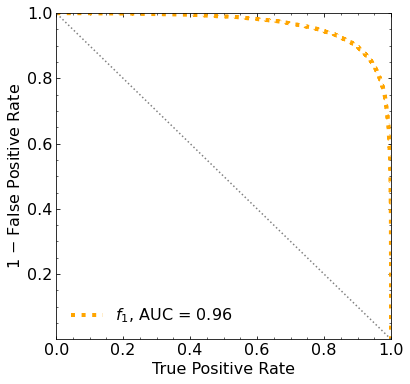

Classification score:


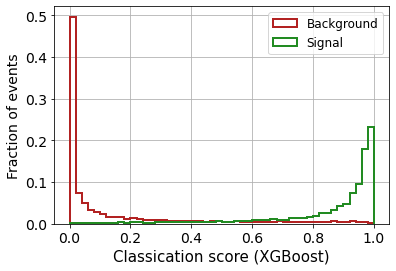


 ROC-AUC =  0.9635905573903606
At least 5 B events per bin, range = [[0, 1]]:
# bins:  20 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  20
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.004


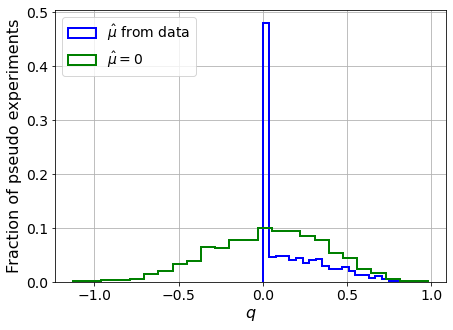

muhat mean:  -0.08890971511097012
Z_bins:  0.22958925468923574
std Z_bins:  0.4266295363973051
Z_bins mu=0:  0.22958925468923574
std Z_bins mu=0:  0.7277399126471551

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0025


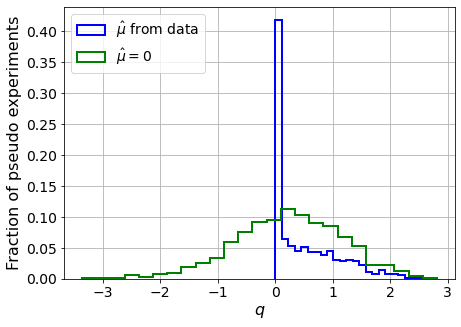

muhat mean:  0.04567666029847899
Z_bins:  0.5153713064059466
std Z_bins:  0.5735143523606256
Z_bins mu=0:  0.5153671442137643
std Z_bins mu=0:  0.9000150126996569

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


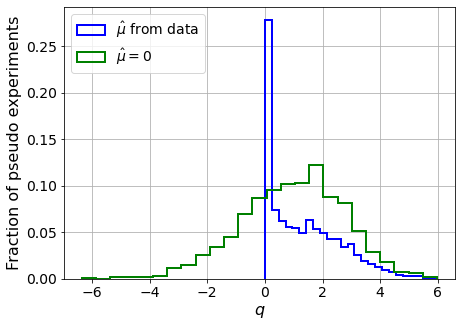

muhat mean:  -0.01130091086215557
Z_bins:  1.0431735026902176
std Z_bins:  0.604495435735944
Z_bins mu=0:  1.0431735026902176
std Z_bins mu=0:  0.8477801101894491

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0045


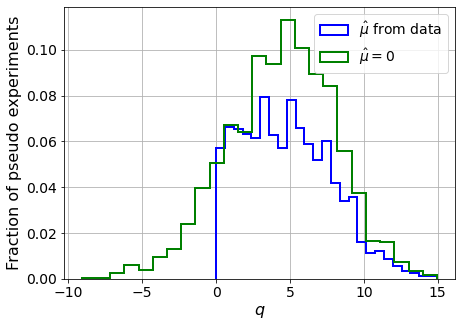

muhat mean:  -0.00038892303225722917
Z_bins:  2.1606279439147618
std Z_bins:  0.6916847713083397
Z_bins mu=0:  2.1606279439147618
std Z_bins mu=0:  0.8408443723978666

--------

B_expected:  643
S_expected:  30

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.005


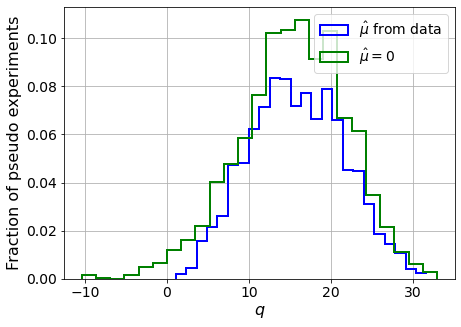

muhat mean:  0.005368330487480165
Z_bins:  3.9640856589315194
std Z_bins:  0.7283007633740998
Z_bins mu=0:  3.963892351485448
std Z_bins mu=0:  0.8216235354641499

--------

B_expected:  643
S_expected:  65

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.004


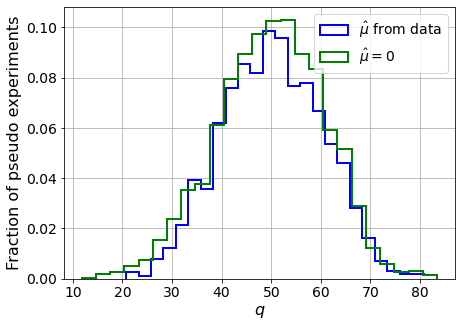

muhat mean:  0.0023459812237282096
Z_bins:  7.09453394656808
std Z_bins:  0.7134910557248698
Z_bins mu=0:  7.093196083984728
std Z_bins mu=0:  0.7641339820150853

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0055


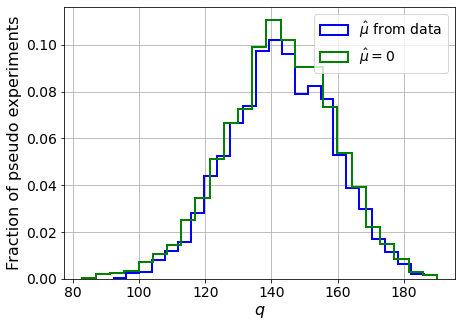

muhat mean:  0.00031548563662401555
Z_bins:  11.949403751627905
std Z_bins:  0.6586332993503653
Z_bins mu=0:  11.949191453786241
std Z_bins mu=0:  0.6891828749439309

--------

B_expected:  643
S_expected:  300

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0045


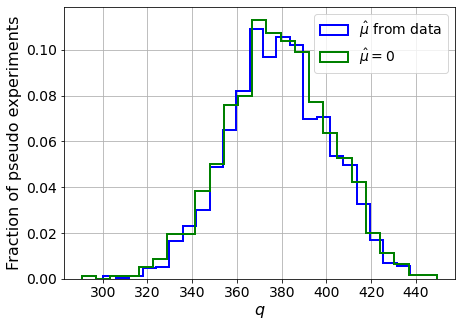

muhat mean:  0.0003800627330654374
Z_bins:  19.459198425581466
std Z_bins:  0.5788695873316869
Z_bins mu=0:  19.457844632423033
std Z_bins mu=0:  0.5947198731786368

--------

B_expected:  643
S_expected:  645

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


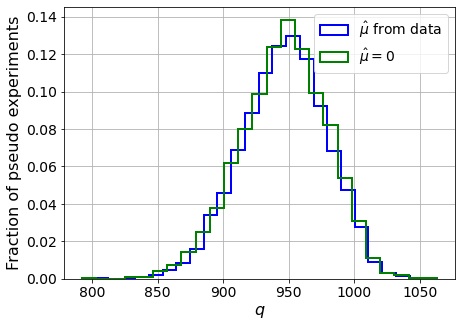

muhat mean:  -4.8962121668251866e-05
Z_bins:  30.782392564549124
std Z_bins:  0.5281963432341219
Z_bins mu=0:  30.782392564549124
std Z_bins mu=0:  0.5391385015978086

--------

B_expected:  643
S_expected:  1390

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


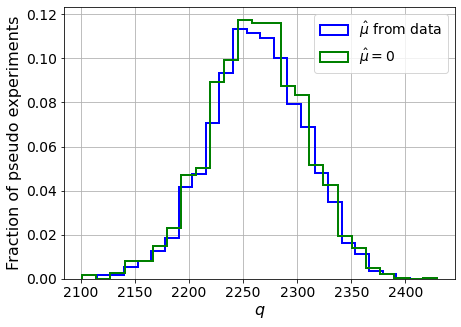

muhat mean:  4.973810140312717e-05
Z_bins:  47.56395641618862
std Z_bins:  0.4619622048526456
Z_bins mu=0:  47.56237728488333
std Z_bins mu=0:  0.4690583963893566

--------


 FINAL RESULT:

[[0.22958925468923574, 0.4266295363973051, -0.08890971511097012, 0.22958925468923574, 0.7277399126471551], [0.5153713064059466, 0.5735143523606256, 0.04567666029847899, 0.5153671442137643, 0.9000150126996569], [1.0431735026902176, 0.604495435735944, -0.01130091086215557, 1.0431735026902176, 0.8477801101894491], [2.1606279439147618, 0.6916847713083397, -0.00038892303225722917, 2.1606279439147618, 0.8408443723978666], [3.9640856589315194, 0.7283007633740998, 0.005368330487480165, 3.963892351485448, 0.8216235354641499], [7.09453394656808, 0.7134910557248698, 0.0023459812237282096, 7.093196083984728, 0.7641339820150853], [11.949403751627905, 0.6586332993503653, 0.00031548563662401555, 11.949191453786241, 0.6891828749439309], [19.459198425581466, 0.5788695873316869, 0.0003800627330654374, 19.45784463242

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  267.06789491  245.59552612  217.08505497  184.67449608  148.13784312
  105.58277301   60.44099781   10.31062697  -44.22954095 -103.55023932]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 213.72547996 202.63864354 185.165631

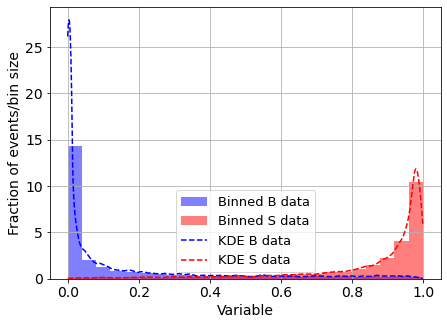

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



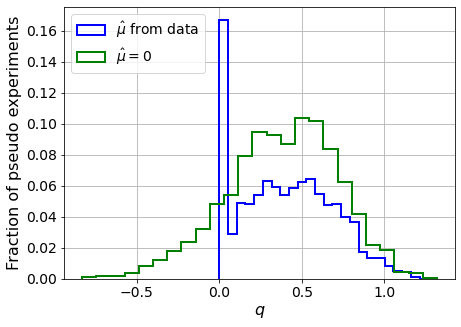

muhat mean:  -7.162695947322405
Z_bins:  0.6318591170539907
std Z_bins:  0.2271603068751001
Z_bins mu=0:  0.6318591170539907
std Z_bins mu=0:  0.2637779895484703

--------

B_expected:  643
S_expected:  3



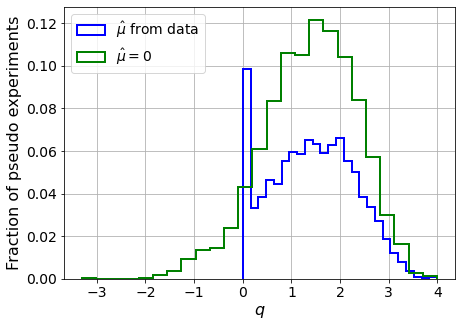

muhat mean:  -2.5302857781305104
Z_bins:  1.1999113783498143
std Z_bins:  0.35830721939076793
Z_bins mu=0:  1.1999113783498143
std Z_bins mu=0:  0.40017325452579533

--------

B_expected:  643
S_expected:  6



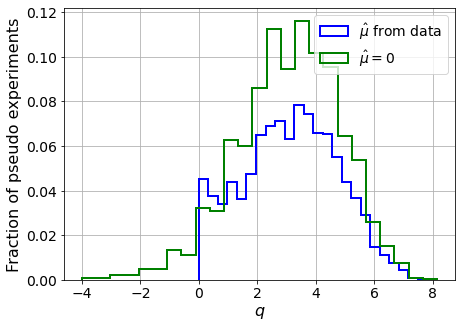

muhat mean:  -1.242756079697188
Z_bins:  1.783802632850902
std Z_bins:  0.4541118521054492
Z_bins mu=0:  1.783802632850902
std Z_bins mu=0:  0.4935631614736885

--------

B_expected:  643
S_expected:  14



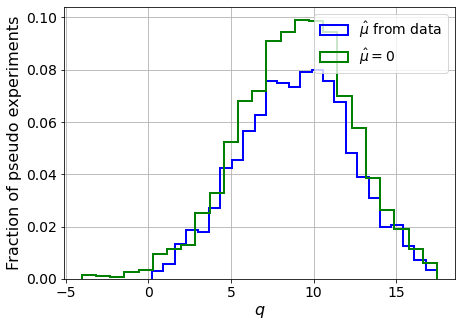

muhat mean:  -0.4888302858788491
Z_bins:  3.002376992120616
std Z_bins:  0.5466568123155715
Z_bins mu=0:  3.002376992120616
std Z_bins mu=0:  0.5690234863146906

--------

B_expected:  643
S_expected:  30



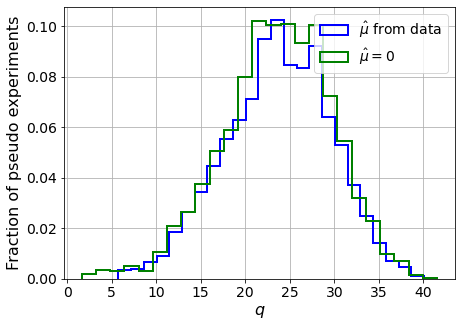

muhat mean:  -0.2501365784025763
Z_bins:  4.891434749181548
std Z_bins:  0.6083009554017175
Z_bins mu=0:  4.891434749181548
std Z_bins mu=0:  0.6274163729273383

--------

B_expected:  643
S_expected:  65



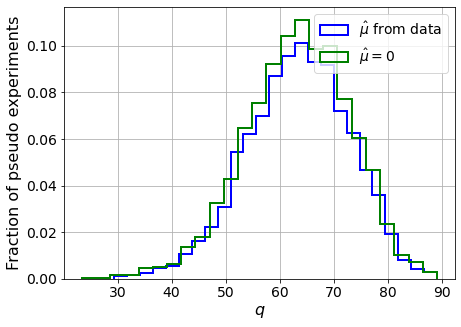

muhat mean:  -0.11379060753782161
Z_bins:  7.981930027960967
std Z_bins:  0.5962212669603303
Z_bins mu=0:  7.981930027960967
std Z_bins mu=0:  0.6066133115719181

--------

B_expected:  643
S_expected:  139



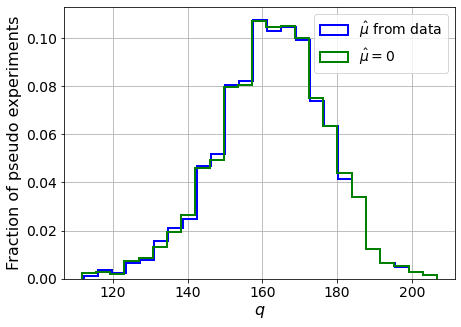

muhat mean:  -0.05088812366233934
Z_bins:  12.768681961674092
std Z_bins:  0.5670262367064729
Z_bins mu=0:  12.768681961674092
std Z_bins mu=0:  0.5715764966835246

--------

B_expected:  643
S_expected:  300



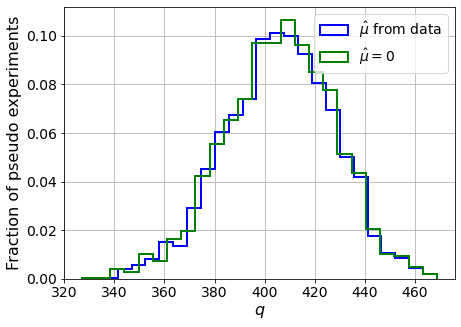

muhat mean:  -0.024086187025339753
Z_bins:  20.171129769537536
std Z_bins:  0.5405231205108797
Z_bins mu=0:  20.170999626188745
std Z_bins mu=0:  0.5436181904813147

--------

B_expected:  643
S_expected:  645



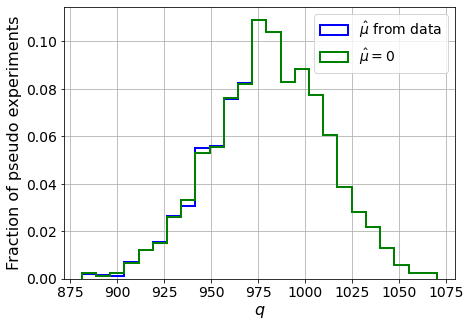

muhat mean:  -0.010373478475957227
Z_bins:  31.323118877297517
std Z_bins:  0.48244780251537733
Z_bins mu=0:  31.323118877297517
std Z_bins mu=0:  0.48393401975607

--------

B_expected:  643
S_expected:  1390



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


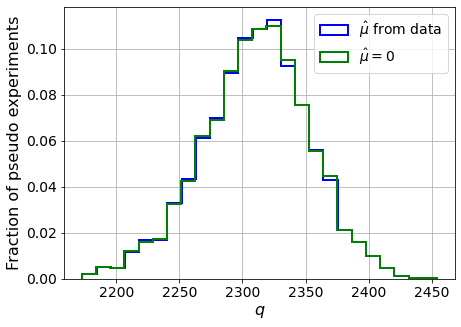

muhat mean:  -0.005154260255723227
Z_bins:  48.085463973279964
std Z_bins:  0.440683815257989
Z_bins mu=0:  48.085463973279964
std Z_bins mu=0:  0.4417502394572455

--------


 FINAL RESULT:

[[0.6318591170539907, 0.2271603068751001, -7.162695947322405, 0.6318591170539907, 0.2637779895484703], [1.1999113783498143, 0.35830721939076793, -2.5302857781305104, 1.1999113783498143, 0.40017325452579533], [1.783802632850902, 0.4541118521054492, -1.242756079697188, 1.783802632850902, 0.4935631614736885], [3.002376992120616, 0.5466568123155715, -0.4888302858788491, 3.002376992120616, 0.5690234863146906], [4.891434749181548, 0.6083009554017175, -0.2501365784025763, 4.891434749181548, 0.6274163729273383], [7.981930027960967, 0.5962212669603303, -0.11379060753782161, 7.981930027960967, 0.6066133115719181], [12.768681961674092, 0.5670262367064729, -0.05088812366233934, 12.768681961674092, 0.5715764966835246], [20.171129769537536, 0.5405231205108797, -0.024086187025339753, 20.170999626188745, 0.543618

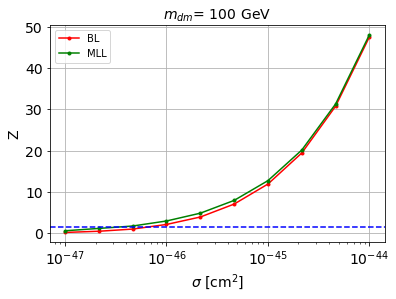


cross_BL_164:  7.353248492863144e-47
cross_BL_164_up:  4.609540578350866e-47
cross_BL_164_down:  1.0996486025831349e-46

cross_MLL_164:  4.036847787470141e-47
cross_MLL_164_up:  2.382446915840154e-47
cross_MLL_164_down:  6.050158849732599e-47

#########################


#########################

mDM =  200 GeV


S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)
 NUM_DAT:  31880 

NUM_DAT_ER:  31472
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  265

B_pbot.shape:  (31880,)
B_ptop.shape:  (31880,)
B_ppeakS1.shape : (31880, 8)
B_ppeakS2.shape:  (31880, 8)

S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)


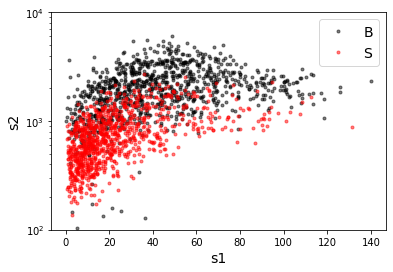

B_pdiffT.shape:  (31880,)
S_pdiffT.shape:  (31880,)


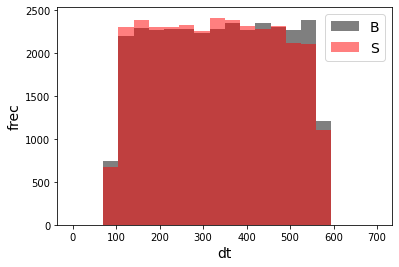

B_pbot.shape:  (31880,)
B_ptop.shape:  (31880,)
B_ppeakS1.shape : (31880, 7)
B_ppeakS2.shape:  (31880, 7)
S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 7)
S_ppeakS2.shape:  (31880, 7)
X_mon_B.shape:  (31880, 16)
X_mon_S.shape:  (31880, 16)
X_mon.shape:  (63760, 16)

X_mon_train :  (40647, 16)
y_mon_train :  (40647,)
X_mon_val :  (7173, 16)
y_mon_val :  (7173,)
X_mon_test :  (15940, 16)
y_mon_test :  (15940,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68731	validation_1-logloss:0.68742
[1]	validation_0-logloss:0.68160	validation_1-logloss:0.68181
[2]	validation_0-logloss:0.67600	validation_1-logloss:0.67636
[3]	validation_0-logloss:0.67054	validation_1-logloss:0.67100
[4]	validation_0-logloss:0.66510	validation_1-logloss:0.66566
[5]	validation_0-logloss:0.65982	validation_1-logloss:0.66049
[6]	validation_0-logloss:0.65459	validation_1-logloss:0.65535
[7]	validation_0-logloss:0.64950	validation_1-logloss:0.65038
[8]	validation_0-logloss:0.64446	validation_1-logloss:0.64542
[9]	validation_0-logloss:0.63956	validation_1-logloss:0.64063
[10]	validation_0-logloss:0.63470	validation_1-logloss:0.63586
[11]	validation_0-logloss:0.62998	validation_1-logloss:0.63125
[12]	validation_0-logloss:0.62529	validation_1-logloss:0.62665
[13]	validation_0-logloss:0.62074	validation_1-logloss:0.62222
[14]	validation_0-logloss:0.61628	validation_1-logloss:0.61787
[15]	validation_0-logloss:0.61183	validation_1-logloss:0.61353
[1

[130]	validation_0-logloss:0.36559	validation_1-logloss:0.37839
[131]	validation_0-logloss:0.36460	validation_1-logloss:0.37747
[132]	validation_0-logloss:0.36362	validation_1-logloss:0.37655
[133]	validation_0-logloss:0.36269	validation_1-logloss:0.37569
[134]	validation_0-logloss:0.36172	validation_1-logloss:0.37482
[135]	validation_0-logloss:0.36081	validation_1-logloss:0.37398
[136]	validation_0-logloss:0.35993	validation_1-logloss:0.37317
[137]	validation_0-logloss:0.35900	validation_1-logloss:0.37231
[138]	validation_0-logloss:0.35811	validation_1-logloss:0.37149
[139]	validation_0-logloss:0.35719	validation_1-logloss:0.37063
[140]	validation_0-logloss:0.35629	validation_1-logloss:0.36977
[141]	validation_0-logloss:0.35545	validation_1-logloss:0.36903
[142]	validation_0-logloss:0.35457	validation_1-logloss:0.36820
[143]	validation_0-logloss:0.35369	validation_1-logloss:0.36740
[144]	validation_0-logloss:0.35281	validation_1-logloss:0.36658
[145]	validation_0-logloss:0.35196	valid

[259]	validation_0-logloss:0.29432	validation_1-logloss:0.31424
[260]	validation_0-logloss:0.29402	validation_1-logloss:0.31398
[261]	validation_0-logloss:0.29377	validation_1-logloss:0.31373
[262]	validation_0-logloss:0.29348	validation_1-logloss:0.31348
[263]	validation_0-logloss:0.29318	validation_1-logloss:0.31323
[264]	validation_0-logloss:0.29288	validation_1-logloss:0.31300
[265]	validation_0-logloss:0.29263	validation_1-logloss:0.31278
[266]	validation_0-logloss:0.29234	validation_1-logloss:0.31254
[267]	validation_0-logloss:0.29205	validation_1-logloss:0.31229
[268]	validation_0-logloss:0.29178	validation_1-logloss:0.31206
[269]	validation_0-logloss:0.29154	validation_1-logloss:0.31186
[270]	validation_0-logloss:0.29127	validation_1-logloss:0.31164
[271]	validation_0-logloss:0.29103	validation_1-logloss:0.31146
[272]	validation_0-logloss:0.29076	validation_1-logloss:0.31121
[273]	validation_0-logloss:0.29051	validation_1-logloss:0.31101
[274]	validation_0-logloss:0.29028	valid

[388]	validation_0-logloss:0.26914	validation_1-logloss:0.29391
[389]	validation_0-logloss:0.26903	validation_1-logloss:0.29383
[390]	validation_0-logloss:0.26892	validation_1-logloss:0.29373
[391]	validation_0-logloss:0.26879	validation_1-logloss:0.29364
[392]	validation_0-logloss:0.26866	validation_1-logloss:0.29355
[393]	validation_0-logloss:0.26851	validation_1-logloss:0.29346
[394]	validation_0-logloss:0.26839	validation_1-logloss:0.29338
[395]	validation_0-logloss:0.26825	validation_1-logloss:0.29328
[396]	validation_0-logloss:0.26809	validation_1-logloss:0.29316
[397]	validation_0-logloss:0.26795	validation_1-logloss:0.29306
[398]	validation_0-logloss:0.26780	validation_1-logloss:0.29296
[399]	validation_0-logloss:0.26768	validation_1-logloss:0.29289
[400]	validation_0-logloss:0.26754	validation_1-logloss:0.29280
[401]	validation_0-logloss:0.26743	validation_1-logloss:0.29273
[402]	validation_0-logloss:0.26732	validation_1-logloss:0.29265
[403]	validation_0-logloss:0.26721	valid

[517]	validation_0-logloss:0.25556	validation_1-logloss:0.28474
[518]	validation_0-logloss:0.25549	validation_1-logloss:0.28470
[519]	validation_0-logloss:0.25541	validation_1-logloss:0.28465
[520]	validation_0-logloss:0.25532	validation_1-logloss:0.28461
[521]	validation_0-logloss:0.25523	validation_1-logloss:0.28456
[522]	validation_0-logloss:0.25516	validation_1-logloss:0.28452
[523]	validation_0-logloss:0.25507	validation_1-logloss:0.28448
[524]	validation_0-logloss:0.25500	validation_1-logloss:0.28443
[525]	validation_0-logloss:0.25491	validation_1-logloss:0.28440
[526]	validation_0-logloss:0.25482	validation_1-logloss:0.28436
[527]	validation_0-logloss:0.25477	validation_1-logloss:0.28432
[528]	validation_0-logloss:0.25472	validation_1-logloss:0.28429
[529]	validation_0-logloss:0.25463	validation_1-logloss:0.28422
[530]	validation_0-logloss:0.25455	validation_1-logloss:0.28418
[531]	validation_0-logloss:0.25449	validation_1-logloss:0.28413
[532]	validation_0-logloss:0.25441	valid

[646]	validation_0-logloss:0.24633	validation_1-logloss:0.27997
[647]	validation_0-logloss:0.24627	validation_1-logloss:0.27993
[648]	validation_0-logloss:0.24619	validation_1-logloss:0.27991
[649]	validation_0-logloss:0.24612	validation_1-logloss:0.27987
[650]	validation_0-logloss:0.24608	validation_1-logloss:0.27984
[651]	validation_0-logloss:0.24603	validation_1-logloss:0.27981
[652]	validation_0-logloss:0.24596	validation_1-logloss:0.27980
[653]	validation_0-logloss:0.24588	validation_1-logloss:0.27974
[654]	validation_0-logloss:0.24580	validation_1-logloss:0.27969
[655]	validation_0-logloss:0.24574	validation_1-logloss:0.27967
[656]	validation_0-logloss:0.24566	validation_1-logloss:0.27963
[657]	validation_0-logloss:0.24559	validation_1-logloss:0.27958
[658]	validation_0-logloss:0.24554	validation_1-logloss:0.27957
[659]	validation_0-logloss:0.24550	validation_1-logloss:0.27955
[660]	validation_0-logloss:0.24545	validation_1-logloss:0.27952
[661]	validation_0-logloss:0.24539	valid

[775]	validation_0-logloss:0.23897	validation_1-logloss:0.27681
[776]	validation_0-logloss:0.23891	validation_1-logloss:0.27679
[777]	validation_0-logloss:0.23885	validation_1-logloss:0.27674
[778]	validation_0-logloss:0.23878	validation_1-logloss:0.27671
[779]	validation_0-logloss:0.23873	validation_1-logloss:0.27669
[780]	validation_0-logloss:0.23867	validation_1-logloss:0.27668
[781]	validation_0-logloss:0.23862	validation_1-logloss:0.27667
[782]	validation_0-logloss:0.23860	validation_1-logloss:0.27666
[783]	validation_0-logloss:0.23854	validation_1-logloss:0.27664
[784]	validation_0-logloss:0.23851	validation_1-logloss:0.27663
[785]	validation_0-logloss:0.23845	validation_1-logloss:0.27662
[786]	validation_0-logloss:0.23839	validation_1-logloss:0.27661
[787]	validation_0-logloss:0.23833	validation_1-logloss:0.27660
[788]	validation_0-logloss:0.23828	validation_1-logloss:0.27659
[789]	validation_0-logloss:0.23821	validation_1-logloss:0.27654
[790]	validation_0-logloss:0.23815	valid

[904]	validation_0-logloss:0.23264	validation_1-logloss:0.27444
[905]	validation_0-logloss:0.23260	validation_1-logloss:0.27443
[906]	validation_0-logloss:0.23255	validation_1-logloss:0.27442
[907]	validation_0-logloss:0.23252	validation_1-logloss:0.27440
[908]	validation_0-logloss:0.23247	validation_1-logloss:0.27439
[909]	validation_0-logloss:0.23244	validation_1-logloss:0.27438
[910]	validation_0-logloss:0.23240	validation_1-logloss:0.27437
[911]	validation_0-logloss:0.23235	validation_1-logloss:0.27436
[912]	validation_0-logloss:0.23232	validation_1-logloss:0.27435
[913]	validation_0-logloss:0.23228	validation_1-logloss:0.27435
[914]	validation_0-logloss:0.23225	validation_1-logloss:0.27434
[915]	validation_0-logloss:0.23222	validation_1-logloss:0.27433
[916]	validation_0-logloss:0.23217	validation_1-logloss:0.27432
[917]	validation_0-logloss:0.23212	validation_1-logloss:0.27432
[918]	validation_0-logloss:0.23208	validation_1-logloss:0.27431
[919]	validation_0-logloss:0.23205	valid

[1032]	validation_0-logloss:0.22714	validation_1-logloss:0.27253
[1033]	validation_0-logloss:0.22710	validation_1-logloss:0.27251
[1034]	validation_0-logloss:0.22707	validation_1-logloss:0.27250
[1035]	validation_0-logloss:0.22702	validation_1-logloss:0.27247
[1036]	validation_0-logloss:0.22698	validation_1-logloss:0.27247
[1037]	validation_0-logloss:0.22694	validation_1-logloss:0.27246
[1038]	validation_0-logloss:0.22690	validation_1-logloss:0.27244
[1039]	validation_0-logloss:0.22686	validation_1-logloss:0.27243
[1040]	validation_0-logloss:0.22681	validation_1-logloss:0.27242
[1041]	validation_0-logloss:0.22678	validation_1-logloss:0.27240
[1042]	validation_0-logloss:0.22674	validation_1-logloss:0.27239
[1043]	validation_0-logloss:0.22669	validation_1-logloss:0.27237
[1044]	validation_0-logloss:0.22664	validation_1-logloss:0.27235
[1045]	validation_0-logloss:0.22660	validation_1-logloss:0.27234
[1046]	validation_0-logloss:0.22658	validation_1-logloss:0.27233
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.22260	validation_1-logloss:0.27109
[1160]	validation_0-logloss:0.22255	validation_1-logloss:0.27104
[1161]	validation_0-logloss:0.22250	validation_1-logloss:0.27102
[1162]	validation_0-logloss:0.22246	validation_1-logloss:0.27101
[1163]	validation_0-logloss:0.22242	validation_1-logloss:0.27099
[1164]	validation_0-logloss:0.22237	validation_1-logloss:0.27097
[1165]	validation_0-logloss:0.22233	validation_1-logloss:0.27096
[1166]	validation_0-logloss:0.22228	validation_1-logloss:0.27094
[1167]	validation_0-logloss:0.22225	validation_1-logloss:0.27094
[1168]	validation_0-logloss:0.22223	validation_1-logloss:0.27095
[1169]	validation_0-logloss:0.22221	validation_1-logloss:0.27094
[1170]	validation_0-logloss:0.22219	validation_1-logloss:0.27092
[1171]	validation_0-logloss:0.22215	validation_1-logloss:0.27090
[1172]	validation_0-logloss:0.22211	validation_1-logloss:0.27091
[1173]	validation_0-logloss:0.22207	validation_1-logloss:0.27089
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.21829	validation_1-logloss:0.26990
[1287]	validation_0-logloss:0.21826	validation_1-logloss:0.26990
[1288]	validation_0-logloss:0.21824	validation_1-logloss:0.26990
[1289]	validation_0-logloss:0.21820	validation_1-logloss:0.26989
[1290]	validation_0-logloss:0.21815	validation_1-logloss:0.26988
[1291]	validation_0-logloss:0.21814	validation_1-logloss:0.26988
[1292]	validation_0-logloss:0.21811	validation_1-logloss:0.26987
[1293]	validation_0-logloss:0.21809	validation_1-logloss:0.26986
[1294]	validation_0-logloss:0.21807	validation_1-logloss:0.26986
[1295]	validation_0-logloss:0.21805	validation_1-logloss:0.26986
[1296]	validation_0-logloss:0.21802	validation_1-logloss:0.26985
[1297]	validation_0-logloss:0.21796	validation_1-logloss:0.26984
[1298]	validation_0-logloss:0.21792	validation_1-logloss:0.26982
[1299]	validation_0-logloss:0.21788	validation_1-logloss:0.26981
[1300]	validation_0-logloss:0.21783	validation_1-logloss:0.26979
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.21413	validation_1-logloss:0.26904
[1414]	validation_0-logloss:0.21410	validation_1-logloss:0.26903
[1415]	validation_0-logloss:0.21405	validation_1-logloss:0.26901
[1416]	validation_0-logloss:0.21400	validation_1-logloss:0.26899
[1417]	validation_0-logloss:0.21398	validation_1-logloss:0.26899
[1418]	validation_0-logloss:0.21393	validation_1-logloss:0.26897
[1419]	validation_0-logloss:0.21390	validation_1-logloss:0.26896
[1420]	validation_0-logloss:0.21386	validation_1-logloss:0.26895
[1421]	validation_0-logloss:0.21385	validation_1-logloss:0.26894
[1422]	validation_0-logloss:0.21383	validation_1-logloss:0.26894
[1423]	validation_0-logloss:0.21379	validation_1-logloss:0.26893
[1424]	validation_0-logloss:0.21375	validation_1-logloss:0.26890
[1425]	validation_0-logloss:0.21370	validation_1-logloss:0.26889
[1426]	validation_0-logloss:0.21367	validation_1-logloss:0.26890
[1427]	validation_0-logloss:0.21365	validation_1-logloss:0.26889
[1428]	validation_0-loglo

[1540]	validation_0-logloss:0.21020	validation_1-logloss:0.26814
[1541]	validation_0-logloss:0.21017	validation_1-logloss:0.26815
[1542]	validation_0-logloss:0.21014	validation_1-logloss:0.26814
[1543]	validation_0-logloss:0.21011	validation_1-logloss:0.26814
[1544]	validation_0-logloss:0.21007	validation_1-logloss:0.26813
[1545]	validation_0-logloss:0.21006	validation_1-logloss:0.26813
[1546]	validation_0-logloss:0.21002	validation_1-logloss:0.26812
[1547]	validation_0-logloss:0.20999	validation_1-logloss:0.26811
[1548]	validation_0-logloss:0.20997	validation_1-logloss:0.26810
[1549]	validation_0-logloss:0.20994	validation_1-logloss:0.26809
[1550]	validation_0-logloss:0.20990	validation_1-logloss:0.26808
[1551]	validation_0-logloss:0.20985	validation_1-logloss:0.26806
[1552]	validation_0-logloss:0.20981	validation_1-logloss:0.26805
[1553]	validation_0-logloss:0.20977	validation_1-logloss:0.26805
[1554]	validation_0-logloss:0.20974	validation_1-logloss:0.26804
[1555]	validation_0-loglo

[1667]	validation_0-logloss:0.20609	validation_1-logloss:0.26717
[1668]	validation_0-logloss:0.20608	validation_1-logloss:0.26717
[1669]	validation_0-logloss:0.20606	validation_1-logloss:0.26716
[1670]	validation_0-logloss:0.20603	validation_1-logloss:0.26715
[1671]	validation_0-logloss:0.20601	validation_1-logloss:0.26715
[1672]	validation_0-logloss:0.20598	validation_1-logloss:0.26715
[1673]	validation_0-logloss:0.20595	validation_1-logloss:0.26714
[1674]	validation_0-logloss:0.20592	validation_1-logloss:0.26712
[1675]	validation_0-logloss:0.20591	validation_1-logloss:0.26712
[1676]	validation_0-logloss:0.20589	validation_1-logloss:0.26712
[1677]	validation_0-logloss:0.20585	validation_1-logloss:0.26711
[1678]	validation_0-logloss:0.20581	validation_1-logloss:0.26711
[1679]	validation_0-logloss:0.20579	validation_1-logloss:0.26711
[1680]	validation_0-logloss:0.20576	validation_1-logloss:0.26711
[1681]	validation_0-logloss:0.20574	validation_1-logloss:0.26712
[1682]	validation_0-loglo

[1794]	validation_0-logloss:0.20261	validation_1-logloss:0.26656
[1795]	validation_0-logloss:0.20258	validation_1-logloss:0.26656
[1796]	validation_0-logloss:0.20257	validation_1-logloss:0.26656
[1797]	validation_0-logloss:0.20254	validation_1-logloss:0.26655
[1798]	validation_0-logloss:0.20250	validation_1-logloss:0.26654
[1799]	validation_0-logloss:0.20248	validation_1-logloss:0.26653
[1800]	validation_0-logloss:0.20245	validation_1-logloss:0.26652
[1801]	validation_0-logloss:0.20243	validation_1-logloss:0.26653
[1802]	validation_0-logloss:0.20241	validation_1-logloss:0.26654
[1803]	validation_0-logloss:0.20238	validation_1-logloss:0.26654
[1804]	validation_0-logloss:0.20236	validation_1-logloss:0.26654
[1805]	validation_0-logloss:0.20231	validation_1-logloss:0.26653
[1806]	validation_0-logloss:0.20228	validation_1-logloss:0.26651
[1807]	validation_0-logloss:0.20227	validation_1-logloss:0.26651
[1808]	validation_0-logloss:0.20225	validation_1-logloss:0.26651
[1809]	validation_0-loglo

[1921]	validation_0-logloss:0.19931	validation_1-logloss:0.26602
[1922]	validation_0-logloss:0.19929	validation_1-logloss:0.26602
[1923]	validation_0-logloss:0.19926	validation_1-logloss:0.26602
[1924]	validation_0-logloss:0.19923	validation_1-logloss:0.26603
[1925]	validation_0-logloss:0.19920	validation_1-logloss:0.26603
[1926]	validation_0-logloss:0.19919	validation_1-logloss:0.26604
[1927]	validation_0-logloss:0.19918	validation_1-logloss:0.26603
[1928]	validation_0-logloss:0.19915	validation_1-logloss:0.26603
[1929]	validation_0-logloss:0.19913	validation_1-logloss:0.26603
[1930]	validation_0-logloss:0.19911	validation_1-logloss:0.26601
[1931]	validation_0-logloss:0.19907	validation_1-logloss:0.26599
[1932]	validation_0-logloss:0.19905	validation_1-logloss:0.26598
[1933]	validation_0-logloss:0.19904	validation_1-logloss:0.26599
[1934]	validation_0-logloss:0.19902	validation_1-logloss:0.26599
[1935]	validation_0-logloss:0.19899	validation_1-logloss:0.26598
[1936]	validation_0-loglo

[2048]	validation_0-logloss:0.19632	validation_1-logloss:0.26569
[2049]	validation_0-logloss:0.19632	validation_1-logloss:0.26569
[2050]	validation_0-logloss:0.19629	validation_1-logloss:0.26567
[2051]	validation_0-logloss:0.19626	validation_1-logloss:0.26565
[2052]	validation_0-logloss:0.19623	validation_1-logloss:0.26565
[2053]	validation_0-logloss:0.19621	validation_1-logloss:0.26564
[2054]	validation_0-logloss:0.19619	validation_1-logloss:0.26564
[2055]	validation_0-logloss:0.19617	validation_1-logloss:0.26563
[2056]	validation_0-logloss:0.19613	validation_1-logloss:0.26563
[2057]	validation_0-logloss:0.19610	validation_1-logloss:0.26564
[2058]	validation_0-logloss:0.19609	validation_1-logloss:0.26564
[2059]	validation_0-logloss:0.19607	validation_1-logloss:0.26565
[2060]	validation_0-logloss:0.19604	validation_1-logloss:0.26562
[2061]	validation_0-logloss:0.19601	validation_1-logloss:0.26561
[2062]	validation_0-logloss:0.19599	validation_1-logloss:0.26561
[2063]	validation_0-loglo

[2175]	validation_0-logloss:0.19327	validation_1-logloss:0.26524
[2176]	validation_0-logloss:0.19325	validation_1-logloss:0.26524
[2177]	validation_0-logloss:0.19323	validation_1-logloss:0.26524
[2178]	validation_0-logloss:0.19321	validation_1-logloss:0.26524
[2179]	validation_0-logloss:0.19318	validation_1-logloss:0.26523
[2180]	validation_0-logloss:0.19315	validation_1-logloss:0.26523
[2181]	validation_0-logloss:0.19311	validation_1-logloss:0.26524
[2182]	validation_0-logloss:0.19310	validation_1-logloss:0.26525
[2183]	validation_0-logloss:0.19307	validation_1-logloss:0.26525
[2184]	validation_0-logloss:0.19304	validation_1-logloss:0.26523
[2185]	validation_0-logloss:0.19302	validation_1-logloss:0.26523
[2186]	validation_0-logloss:0.19298	validation_1-logloss:0.26522
[2187]	validation_0-logloss:0.19295	validation_1-logloss:0.26522
[2188]	validation_0-logloss:0.19293	validation_1-logloss:0.26522
[2189]	validation_0-logloss:0.19291	validation_1-logloss:0.26522
[2190]	validation_0-loglo

[2302]	validation_0-logloss:0.19043	validation_1-logloss:0.26517
[2303]	validation_0-logloss:0.19039	validation_1-logloss:0.26516
[2304]	validation_0-logloss:0.19036	validation_1-logloss:0.26515
[2305]	validation_0-logloss:0.19034	validation_1-logloss:0.26516
[2306]	validation_0-logloss:0.19033	validation_1-logloss:0.26517
[2307]	validation_0-logloss:0.19031	validation_1-logloss:0.26517
[2308]	validation_0-logloss:0.19028	validation_1-logloss:0.26517
[2309]	validation_0-logloss:0.19026	validation_1-logloss:0.26516
[2310]	validation_0-logloss:0.19024	validation_1-logloss:0.26516
[2311]	validation_0-logloss:0.19021	validation_1-logloss:0.26515
[2312]	validation_0-logloss:0.19019	validation_1-logloss:0.26515
[2313]	validation_0-logloss:0.19016	validation_1-logloss:0.26514
[2314]	validation_0-logloss:0.19013	validation_1-logloss:0.26513
[2315]	validation_0-logloss:0.19011	validation_1-logloss:0.26513
[2316]	validation_0-logloss:0.19009	validation_1-logloss:0.26515
[2317]	validation_0-loglo

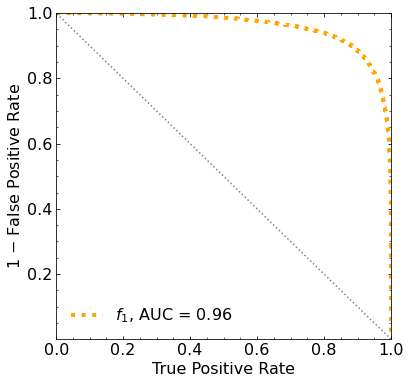

Classification score:


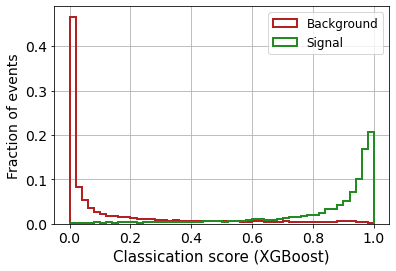


 ROC-AUC =  0.9585613555256429
At least 5 B events per bin, range = [[0, 1]]:
# bins:  22 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  22
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


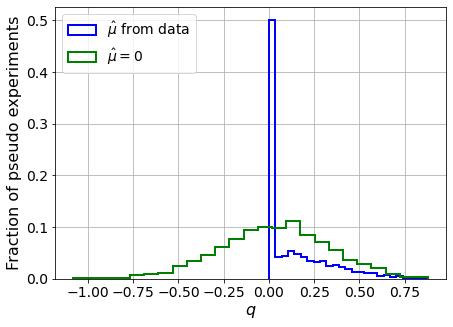

muhat mean:  0.03298859106346698
Z_bins:  0.18541801844638198
std Z_bins:  0.48499538911513346
Z_bins mu=0:  0.18541801844638198
std Z_bins mu=0:  0.8292425516204189

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


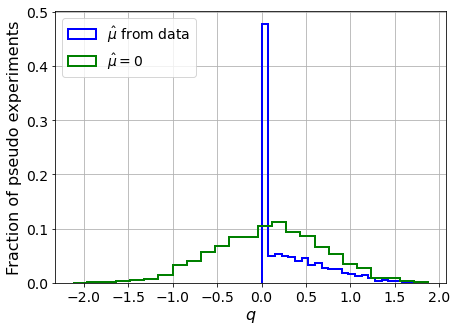

muhat mean:  0.06611887617650995
Z_bins:  0.3282627207638957
std Z_bins:  0.5661839431061317
Z_bins mu=0:  0.3282627207638957
std Z_bins mu=0:  0.921790196453266

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


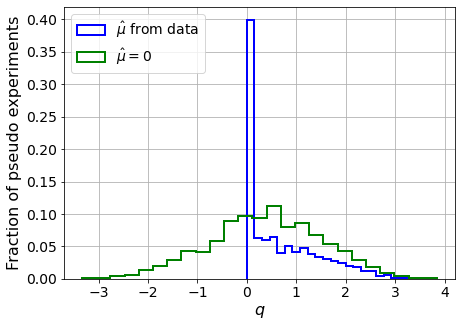

muhat mean:  -0.005826850575375096
Z_bins:  0.6437295353150089
std Z_bins:  0.6004144211967573
Z_bins mu=0:  0.6437295353150089
std Z_bins mu=0:  0.8831870684698309

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


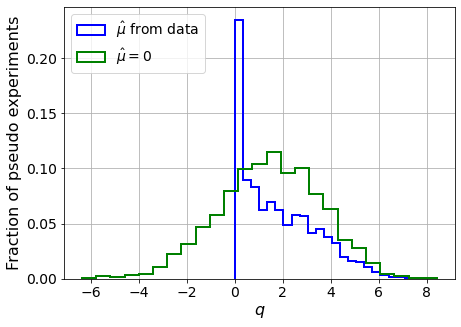

muhat mean:  -0.016626798849720615
Z_bins:  1.2248094825979086
std Z_bins:  0.6561222373658672
Z_bins mu=0:  1.2248094825979086
std Z_bins mu=0:  0.8661897051471609

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


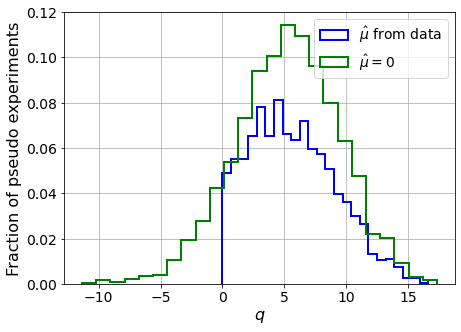

muhat mean:  0.013702215213604613
Z_bins:  2.3210353443306446
std Z_bins:  0.7410852189563248
Z_bins mu=0:  2.321011770144483
std Z_bins mu=0:  0.8956505033785935

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


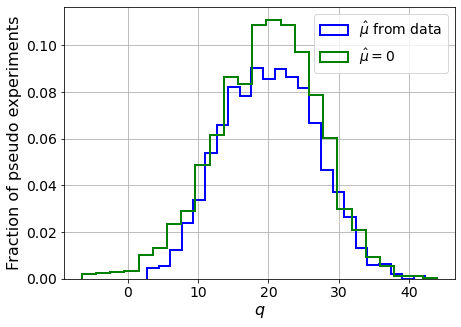

muhat mean:  -0.0026359743614064023
Z_bins:  4.490773729817884
std Z_bins:  0.7343120428993503
Z_bins mu=0:  4.490580887454272
std Z_bins mu=0:  0.8154478439969738

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


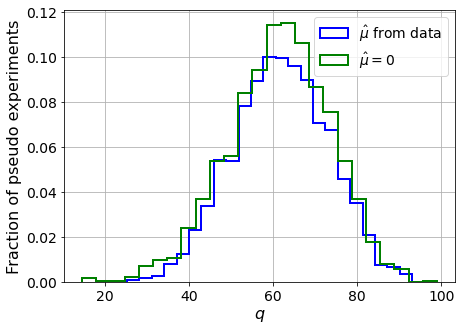

muhat mean:  0.0013371308729085312
Z_bins:  7.874451987974084
std Z_bins:  0.7169400320159863
Z_bins mu=0:  7.874451987974084
std Z_bins mu=0:  0.7650841929005854

--------

B_expected:  643
S_expected:  170

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


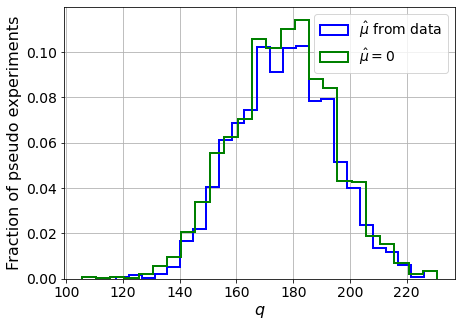

muhat mean:  0.000606060354900314
Z_bins:  13.310349889024863
std Z_bins:  0.6455001857690268
Z_bins mu=0:  13.310249836084985
std Z_bins mu=0:  0.6708062729468688

--------

B_expected:  643
S_expected:  366

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0025


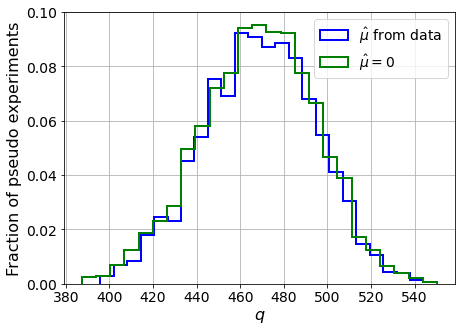

muhat mean:  5.610233033666919e-05
Z_bins:  21.658204190705
std Z_bins:  0.596350557942986
Z_bins mu=0:  21.65749634733602
std Z_bins mu=0:  0.6116872002143062

--------

B_expected:  643
S_expected:  788

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


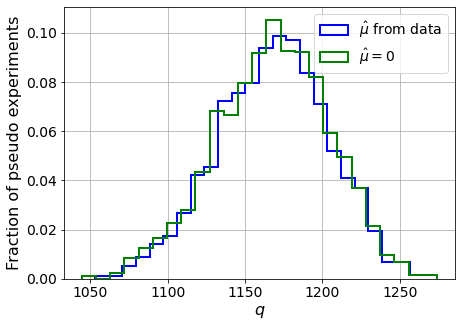

muhat mean:  -7.397182817763034e-05
Z_bins:  34.200863441335635
std Z_bins:  0.526314371247644
Z_bins mu=0:  34.19983054081921
std Z_bins mu=0:  0.5357384906485522

--------


 FINAL RESULT:

[[0.18541801844638198, 0.48499538911513346, 0.03298859106346698, 0.18541801844638198, 0.8292425516204189], [0.3282627207638957, 0.5661839431061317, 0.06611887617650995, 0.3282627207638957, 0.921790196453266], [0.6437295353150089, 0.6004144211967573, -0.005826850575375096, 0.6437295353150089, 0.8831870684698309], [1.2248094825979086, 0.6561222373658672, -0.016626798849720615, 1.2248094825979086, 0.8661897051471609], [2.3210353443306446, 0.7410852189563248, 0.013702215213604613, 2.321011770144483, 0.8956505033785935], [4.490773729817884, 0.7343120428993503, -0.0026359743614064023, 4.490580887454272, 0.8154478439969738], [7.874451987974084, 0.7169400320159863, 0.0013371308729085312, 7.874451987974084, 0.7650841929005854], [13.310349889024863, 0.6455001857690268, 0.000606060354900314, 13.3102498360849

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  260.95334399  240.94983724  214.276402    183.43045531  149.49024023
  107.23218985   58.96067528    6.1686856   -50.86874677 -105.8858987 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 184.22786403 174.86335517 159.766446

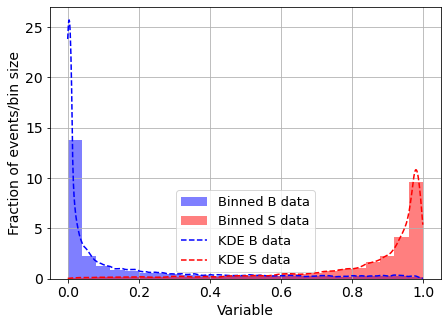

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



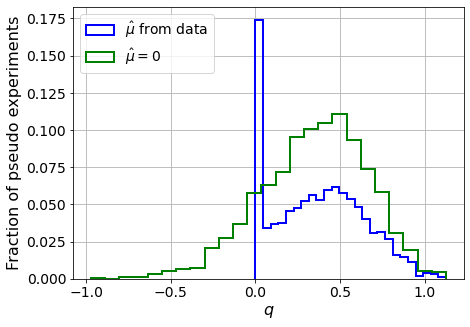

muhat mean:  -6.875802099927234
Z_bins:  0.6115363036036796
std Z_bins:  0.21690345241539985
Z_bins mu=0:  0.6115363036036796
std Z_bins mu=0:  0.2550838876371224

--------

B_expected:  643
S_expected:  2



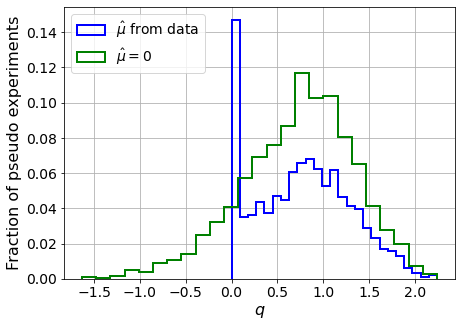

muhat mean:  -3.2875943878423066
Z_bins:  0.8866944104062338
std Z_bins:  0.2933031124147451
Z_bins mu=0:  0.8866944104062338
std Z_bins mu=0:  0.3445014412874116

--------

B_expected:  643
S_expected:  4



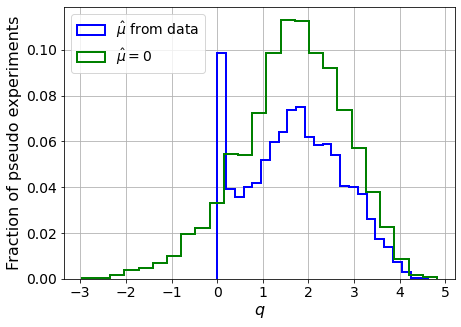

muhat mean:  -1.721007783883008
Z_bins:  1.3131432043205726
std Z_bins:  0.3925716740905928
Z_bins mu=0:  1.3131432043205726
std Z_bins mu=0:  0.44099730654814606

--------

B_expected:  643
S_expected:  8



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


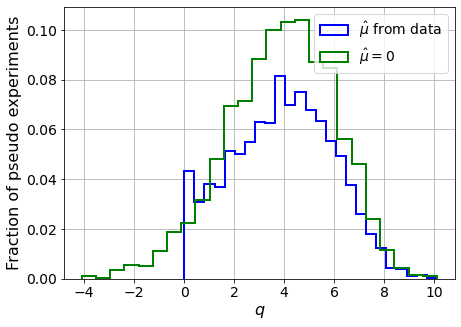

muhat mean:  -0.9258652074675086
Z_bins:  1.9916934291904336
std Z_bins:  0.5046524912423539
Z_bins mu=0:  1.9916934291904336
std Z_bins mu=0:  0.5426074845507692

--------

B_expected:  643
S_expected:  17



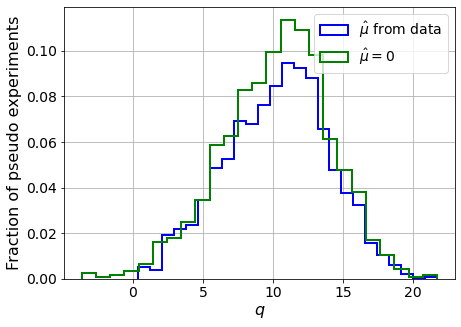

muhat mean:  -0.40423169851932605
Z_bins:  3.250312225784409
std Z_bins:  0.5655044848139885
Z_bins mu=0:  3.250312225784409
std Z_bins mu=0:  0.5885649370010164

--------

B_expected:  643
S_expected:  37



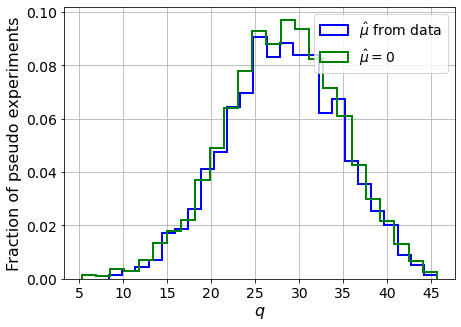

muhat mean:  -0.18215342386633804
Z_bins:  5.317342691671312
std Z_bins:  0.607968406796757
Z_bins mu=0:  5.317342691671312
std Z_bins mu=0:  0.619811286439594

--------

B_expected:  643
S_expected:  79



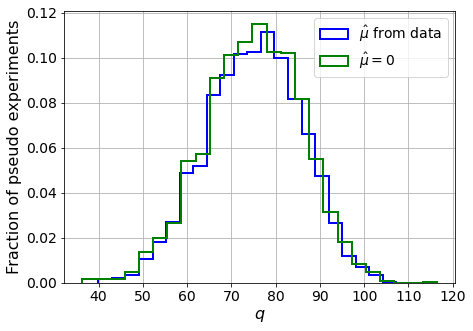

muhat mean:  -0.08407971452856003
Z_bins:  8.674715885760275
std Z_bins:  0.6191899677398671
Z_bins mu=0:  8.674715885760275
std Z_bins mu=0:  0.6267422773917997

--------

B_expected:  643
S_expected:  170



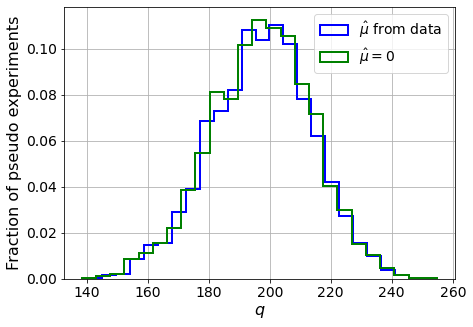

muhat mean:  -0.04105977070226555
Z_bins:  14.062215277938325
std Z_bins:  0.5903578159681969
Z_bins mu=0:  14.062215277938325
std Z_bins mu=0:  0.5940232240262427

--------

B_expected:  643
S_expected:  366



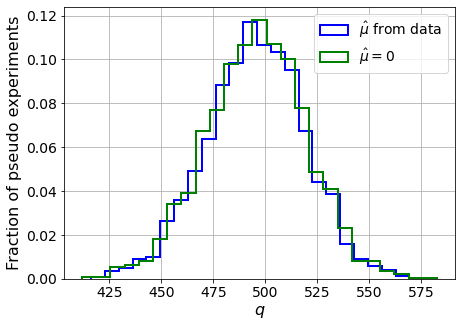

muhat mean:  -0.018461363289430613
Z_bins:  22.263580677138194
std Z_bins:  0.5387245086400629
Z_bins mu=0:  22.263580677138194
std Z_bins mu=0:  0.5414073522800017

--------

B_expected:  643
S_expected:  788



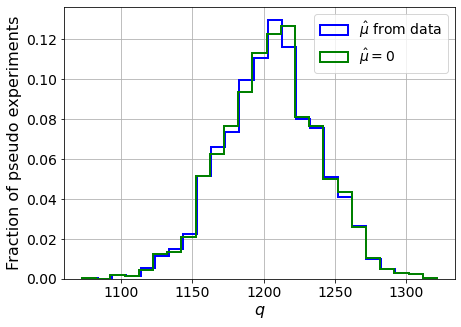

muhat mean:  -0.0081297134144317
Z_bins:  34.72556816939182
std Z_bins:  0.4895451591675086
Z_bins mu=0:  34.72556816939182
std Z_bins mu=0:  0.49124016323538594

--------


 FINAL RESULT:

[[0.6115363036036796, 0.21690345241539985, -6.875802099927234, 0.6115363036036796, 0.2550838876371224], [0.8866944104062338, 0.2933031124147451, -3.2875943878423066, 0.8866944104062338, 0.3445014412874116], [1.3131432043205726, 0.3925716740905928, -1.721007783883008, 1.3131432043205726, 0.44099730654814606], [1.9916934291904336, 0.5046524912423539, -0.9258652074675086, 1.9916934291904336, 0.5426074845507692], [3.250312225784409, 0.5655044848139885, -0.40423169851932605, 3.250312225784409, 0.5885649370010164], [5.317342691671312, 0.607968406796757, -0.18215342386633804, 5.317342691671312, 0.619811286439594], [8.674715885760275, 0.6191899677398671, -0.08407971452856003, 8.674715885760275, 0.6267422773917997], [14.062215277938325, 0.5903578159681969, -0.04105977070226555, 14.062215277938325, 0.59402322

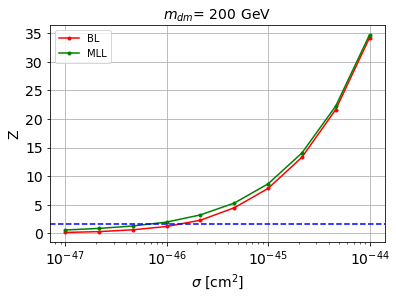


cross_BL_164:  1.432901983697491e-46
cross_BL_164_up:  7.898354222047258e-47
cross_BL_164_down:  2.2183037909150126e-46

cross_MLL_164:  7.134646848727435e-47
cross_MLL_164_up:  4.280305309135382e-47
cross_MLL_164_down:  1.1388410231395362e-46

#########################


#########################

mDM =  500 GeV


S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)
 NUM_DAT:  32015 

NUM_DAT_ER:  31605
NUM_DAT_AC:  113
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  266

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 8)
B_ppeakS2.shape:  (32015, 8)

S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)


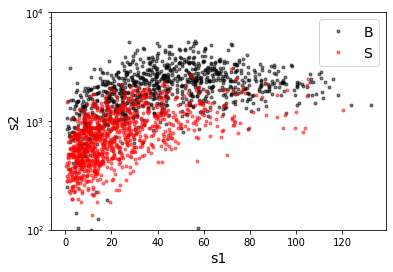

B_pdiffT.shape:  (32015,)
S_pdiffT.shape:  (32015,)


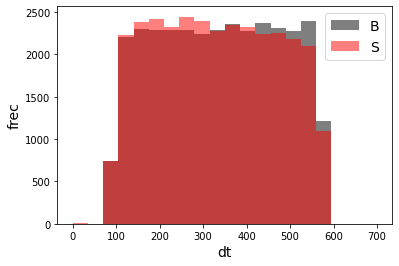

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 7)
B_ppeakS2.shape:  (32015, 7)
S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 7)
S_ppeakS2.shape:  (32015, 7)
X_mon_B.shape:  (32015, 16)
X_mon_S.shape:  (32015, 16)
X_mon.shape:  (64030, 16)

X_mon_train :  (40818, 16)
y_mon_train :  (40818,)
X_mon_val :  (7204, 16)
y_mon_val :  (7204,)
X_mon_test :  (16008, 16)
y_mon_test :  (16008,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68746	validation_1-logloss:0.68743
[1]	validation_0-logloss:0.68185	validation_1-logloss:0.68179
[2]	validation_0-logloss:0.67635	validation_1-logloss:0.67626
[3]	validation_0-logloss:0.67096	validation_1-logloss:0.67084
[4]	validation_0-logloss:0.66564	validation_1-logloss:0.66548
[5]	validation_0-logloss:0.66046	validation_1-logloss:0.66028
[6]	validation_0-logloss:0.65535	validation_1-logloss:0.65518
[7]	validation_0-logloss:0.65035	validation_1-logloss:0.65012
[8]	validation_0-logloss:0.64543	validation_1-logloss:0.64521
[9]	validation_0-logloss:0.64060	validation_1-logloss:0.64033
[10]	validation_0-logloss:0.63585	validation_1-logloss:0.63559
[11]	validation_0-logloss:0.63118	validation_1-logloss:0.63092
[12]	validation_0-logloss:0.62661	validation_1-logloss:0.62639
[13]	validation_0-logloss:0.62209	validation_1-logloss:0.62186
[14]	validation_0-logloss:0.61766	validation_1-logloss:0.61746
[15]	validation_0-logloss:0.61331	validation_1-logloss:0.61312
[1

[130]	validation_0-logloss:0.36950	validation_1-logloss:0.37117
[131]	validation_0-logloss:0.36852	validation_1-logloss:0.37023
[132]	validation_0-logloss:0.36755	validation_1-logloss:0.36930
[133]	validation_0-logloss:0.36663	validation_1-logloss:0.36840
[134]	validation_0-logloss:0.36573	validation_1-logloss:0.36754
[135]	validation_0-logloss:0.36479	validation_1-logloss:0.36663
[136]	validation_0-logloss:0.36386	validation_1-logloss:0.36571
[137]	validation_0-logloss:0.36292	validation_1-logloss:0.36483
[138]	validation_0-logloss:0.36205	validation_1-logloss:0.36399
[139]	validation_0-logloss:0.36120	validation_1-logloss:0.36317
[140]	validation_0-logloss:0.36037	validation_1-logloss:0.36236
[141]	validation_0-logloss:0.35948	validation_1-logloss:0.36152
[142]	validation_0-logloss:0.35861	validation_1-logloss:0.36067
[143]	validation_0-logloss:0.35775	validation_1-logloss:0.35983
[144]	validation_0-logloss:0.35690	validation_1-logloss:0.35903
[145]	validation_0-logloss:0.35608	valid

[259]	validation_0-logloss:0.29838	validation_1-logloss:0.30498
[260]	validation_0-logloss:0.29809	validation_1-logloss:0.30470
[261]	validation_0-logloss:0.29783	validation_1-logloss:0.30449
[262]	validation_0-logloss:0.29753	validation_1-logloss:0.30426
[263]	validation_0-logloss:0.29725	validation_1-logloss:0.30400
[264]	validation_0-logloss:0.29700	validation_1-logloss:0.30379
[265]	validation_0-logloss:0.29673	validation_1-logloss:0.30353
[266]	validation_0-logloss:0.29644	validation_1-logloss:0.30329
[267]	validation_0-logloss:0.29614	validation_1-logloss:0.30303
[268]	validation_0-logloss:0.29588	validation_1-logloss:0.30279
[269]	validation_0-logloss:0.29562	validation_1-logloss:0.30254
[270]	validation_0-logloss:0.29538	validation_1-logloss:0.30234
[271]	validation_0-logloss:0.29509	validation_1-logloss:0.30208
[272]	validation_0-logloss:0.29483	validation_1-logloss:0.30183
[273]	validation_0-logloss:0.29456	validation_1-logloss:0.30158
[274]	validation_0-logloss:0.29429	valid

[388]	validation_0-logloss:0.27268	validation_1-logloss:0.28377
[389]	validation_0-logloss:0.27252	validation_1-logloss:0.28365
[390]	validation_0-logloss:0.27239	validation_1-logloss:0.28355
[391]	validation_0-logloss:0.27223	validation_1-logloss:0.28346
[392]	validation_0-logloss:0.27209	validation_1-logloss:0.28334
[393]	validation_0-logloss:0.27195	validation_1-logloss:0.28326
[394]	validation_0-logloss:0.27182	validation_1-logloss:0.28315
[395]	validation_0-logloss:0.27166	validation_1-logloss:0.28303
[396]	validation_0-logloss:0.27153	validation_1-logloss:0.28294
[397]	validation_0-logloss:0.27140	validation_1-logloss:0.28284
[398]	validation_0-logloss:0.27128	validation_1-logloss:0.28275
[399]	validation_0-logloss:0.27114	validation_1-logloss:0.28267
[400]	validation_0-logloss:0.27099	validation_1-logloss:0.28257
[401]	validation_0-logloss:0.27088	validation_1-logloss:0.28248
[402]	validation_0-logloss:0.27073	validation_1-logloss:0.28237
[403]	validation_0-logloss:0.27060	valid

[517]	validation_0-logloss:0.25860	validation_1-logloss:0.27475
[518]	validation_0-logloss:0.25850	validation_1-logloss:0.27471
[519]	validation_0-logloss:0.25843	validation_1-logloss:0.27465
[520]	validation_0-logloss:0.25834	validation_1-logloss:0.27462
[521]	validation_0-logloss:0.25824	validation_1-logloss:0.27455
[522]	validation_0-logloss:0.25814	validation_1-logloss:0.27449
[523]	validation_0-logloss:0.25808	validation_1-logloss:0.27444
[524]	validation_0-logloss:0.25799	validation_1-logloss:0.27440
[525]	validation_0-logloss:0.25793	validation_1-logloss:0.27437
[526]	validation_0-logloss:0.25785	validation_1-logloss:0.27432
[527]	validation_0-logloss:0.25778	validation_1-logloss:0.27429
[528]	validation_0-logloss:0.25770	validation_1-logloss:0.27423
[529]	validation_0-logloss:0.25761	validation_1-logloss:0.27417
[530]	validation_0-logloss:0.25752	validation_1-logloss:0.27411
[531]	validation_0-logloss:0.25743	validation_1-logloss:0.27407
[532]	validation_0-logloss:0.25735	valid

[646]	validation_0-logloss:0.24876	validation_1-logloss:0.26961
[647]	validation_0-logloss:0.24871	validation_1-logloss:0.26959
[648]	validation_0-logloss:0.24866	validation_1-logloss:0.26958
[649]	validation_0-logloss:0.24860	validation_1-logloss:0.26954
[650]	validation_0-logloss:0.24854	validation_1-logloss:0.26951
[651]	validation_0-logloss:0.24848	validation_1-logloss:0.26949
[652]	validation_0-logloss:0.24844	validation_1-logloss:0.26947
[653]	validation_0-logloss:0.24837	validation_1-logloss:0.26944
[654]	validation_0-logloss:0.24830	validation_1-logloss:0.26940
[655]	validation_0-logloss:0.24822	validation_1-logloss:0.26935
[656]	validation_0-logloss:0.24814	validation_1-logloss:0.26930
[657]	validation_0-logloss:0.24807	validation_1-logloss:0.26928
[658]	validation_0-logloss:0.24801	validation_1-logloss:0.26924
[659]	validation_0-logloss:0.24797	validation_1-logloss:0.26922
[660]	validation_0-logloss:0.24791	validation_1-logloss:0.26920
[661]	validation_0-logloss:0.24783	valid

[775]	validation_0-logloss:0.24103	validation_1-logloss:0.26622
[776]	validation_0-logloss:0.24098	validation_1-logloss:0.26618
[777]	validation_0-logloss:0.24090	validation_1-logloss:0.26616
[778]	validation_0-logloss:0.24085	validation_1-logloss:0.26613
[779]	validation_0-logloss:0.24081	validation_1-logloss:0.26611
[780]	validation_0-logloss:0.24073	validation_1-logloss:0.26607
[781]	validation_0-logloss:0.24069	validation_1-logloss:0.26604
[782]	validation_0-logloss:0.24063	validation_1-logloss:0.26602
[783]	validation_0-logloss:0.24059	validation_1-logloss:0.26599
[784]	validation_0-logloss:0.24054	validation_1-logloss:0.26597
[785]	validation_0-logloss:0.24048	validation_1-logloss:0.26597
[786]	validation_0-logloss:0.24044	validation_1-logloss:0.26596
[787]	validation_0-logloss:0.24039	validation_1-logloss:0.26595
[788]	validation_0-logloss:0.24036	validation_1-logloss:0.26593
[789]	validation_0-logloss:0.24028	validation_1-logloss:0.26591
[790]	validation_0-logloss:0.24024	valid

[904]	validation_0-logloss:0.23475	validation_1-logloss:0.26360
[905]	validation_0-logloss:0.23471	validation_1-logloss:0.26358
[906]	validation_0-logloss:0.23467	validation_1-logloss:0.26356
[907]	validation_0-logloss:0.23463	validation_1-logloss:0.26354
[908]	validation_0-logloss:0.23456	validation_1-logloss:0.26350
[909]	validation_0-logloss:0.23452	validation_1-logloss:0.26348
[910]	validation_0-logloss:0.23447	validation_1-logloss:0.26347
[911]	validation_0-logloss:0.23442	validation_1-logloss:0.26345
[912]	validation_0-logloss:0.23438	validation_1-logloss:0.26344
[913]	validation_0-logloss:0.23435	validation_1-logloss:0.26342
[914]	validation_0-logloss:0.23432	validation_1-logloss:0.26341
[915]	validation_0-logloss:0.23427	validation_1-logloss:0.26338
[916]	validation_0-logloss:0.23424	validation_1-logloss:0.26337
[917]	validation_0-logloss:0.23418	validation_1-logloss:0.26335
[918]	validation_0-logloss:0.23413	validation_1-logloss:0.26331
[919]	validation_0-logloss:0.23408	valid

[1032]	validation_0-logloss:0.22936	validation_1-logloss:0.26154
[1033]	validation_0-logloss:0.22930	validation_1-logloss:0.26152
[1034]	validation_0-logloss:0.22927	validation_1-logloss:0.26150
[1035]	validation_0-logloss:0.22923	validation_1-logloss:0.26147
[1036]	validation_0-logloss:0.22920	validation_1-logloss:0.26146
[1037]	validation_0-logloss:0.22915	validation_1-logloss:0.26144
[1038]	validation_0-logloss:0.22911	validation_1-logloss:0.26142
[1039]	validation_0-logloss:0.22908	validation_1-logloss:0.26141
[1040]	validation_0-logloss:0.22905	validation_1-logloss:0.26140
[1041]	validation_0-logloss:0.22901	validation_1-logloss:0.26138
[1042]	validation_0-logloss:0.22895	validation_1-logloss:0.26136
[1043]	validation_0-logloss:0.22890	validation_1-logloss:0.26134
[1044]	validation_0-logloss:0.22886	validation_1-logloss:0.26132
[1045]	validation_0-logloss:0.22881	validation_1-logloss:0.26130
[1046]	validation_0-logloss:0.22879	validation_1-logloss:0.26129
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.22470	validation_1-logloss:0.25996
[1160]	validation_0-logloss:0.22467	validation_1-logloss:0.25995
[1161]	validation_0-logloss:0.22464	validation_1-logloss:0.25994
[1162]	validation_0-logloss:0.22461	validation_1-logloss:0.25993
[1163]	validation_0-logloss:0.22457	validation_1-logloss:0.25994
[1164]	validation_0-logloss:0.22454	validation_1-logloss:0.25993
[1165]	validation_0-logloss:0.22451	validation_1-logloss:0.25991
[1166]	validation_0-logloss:0.22446	validation_1-logloss:0.25991
[1167]	validation_0-logloss:0.22444	validation_1-logloss:0.25990
[1168]	validation_0-logloss:0.22438	validation_1-logloss:0.25989
[1169]	validation_0-logloss:0.22434	validation_1-logloss:0.25987
[1170]	validation_0-logloss:0.22429	validation_1-logloss:0.25986
[1171]	validation_0-logloss:0.22427	validation_1-logloss:0.25986
[1172]	validation_0-logloss:0.22422	validation_1-logloss:0.25983
[1173]	validation_0-logloss:0.22418	validation_1-logloss:0.25982
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.22009	validation_1-logloss:0.25852
[1287]	validation_0-logloss:0.22005	validation_1-logloss:0.25851
[1288]	validation_0-logloss:0.22000	validation_1-logloss:0.25850
[1289]	validation_0-logloss:0.21999	validation_1-logloss:0.25849
[1290]	validation_0-logloss:0.21994	validation_1-logloss:0.25848
[1291]	validation_0-logloss:0.21990	validation_1-logloss:0.25847
[1292]	validation_0-logloss:0.21988	validation_1-logloss:0.25845
[1293]	validation_0-logloss:0.21983	validation_1-logloss:0.25845
[1294]	validation_0-logloss:0.21978	validation_1-logloss:0.25844
[1295]	validation_0-logloss:0.21976	validation_1-logloss:0.25844
[1296]	validation_0-logloss:0.21971	validation_1-logloss:0.25843
[1297]	validation_0-logloss:0.21968	validation_1-logloss:0.25840
[1298]	validation_0-logloss:0.21965	validation_1-logloss:0.25840
[1299]	validation_0-logloss:0.21961	validation_1-logloss:0.25839
[1300]	validation_0-logloss:0.21958	validation_1-logloss:0.25837
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.21594	validation_1-logloss:0.25759
[1414]	validation_0-logloss:0.21593	validation_1-logloss:0.25759
[1415]	validation_0-logloss:0.21590	validation_1-logloss:0.25759
[1416]	validation_0-logloss:0.21587	validation_1-logloss:0.25759
[1417]	validation_0-logloss:0.21585	validation_1-logloss:0.25759
[1418]	validation_0-logloss:0.21582	validation_1-logloss:0.25758
[1419]	validation_0-logloss:0.21580	validation_1-logloss:0.25758
[1420]	validation_0-logloss:0.21575	validation_1-logloss:0.25758
[1421]	validation_0-logloss:0.21571	validation_1-logloss:0.25756
[1422]	validation_0-logloss:0.21568	validation_1-logloss:0.25755
[1423]	validation_0-logloss:0.21565	validation_1-logloss:0.25755
[1424]	validation_0-logloss:0.21563	validation_1-logloss:0.25754
[1425]	validation_0-logloss:0.21561	validation_1-logloss:0.25751
[1426]	validation_0-logloss:0.21558	validation_1-logloss:0.25752
[1427]	validation_0-logloss:0.21554	validation_1-logloss:0.25750
[1428]	validation_0-loglo

[1540]	validation_0-logloss:0.21215	validation_1-logloss:0.25689
[1541]	validation_0-logloss:0.21212	validation_1-logloss:0.25689
[1542]	validation_0-logloss:0.21209	validation_1-logloss:0.25688
[1543]	validation_0-logloss:0.21206	validation_1-logloss:0.25686
[1544]	validation_0-logloss:0.21205	validation_1-logloss:0.25686
[1545]	validation_0-logloss:0.21200	validation_1-logloss:0.25685
[1546]	validation_0-logloss:0.21198	validation_1-logloss:0.25685
[1547]	validation_0-logloss:0.21195	validation_1-logloss:0.25684
[1548]	validation_0-logloss:0.21193	validation_1-logloss:0.25685
[1549]	validation_0-logloss:0.21191	validation_1-logloss:0.25684
[1550]	validation_0-logloss:0.21189	validation_1-logloss:0.25684
[1551]	validation_0-logloss:0.21185	validation_1-logloss:0.25683
[1552]	validation_0-logloss:0.21182	validation_1-logloss:0.25683
[1553]	validation_0-logloss:0.21179	validation_1-logloss:0.25682
[1554]	validation_0-logloss:0.21177	validation_1-logloss:0.25682
[1555]	validation_0-loglo

[1667]	validation_0-logloss:0.20883	validation_1-logloss:0.25649
[1668]	validation_0-logloss:0.20882	validation_1-logloss:0.25649
[1669]	validation_0-logloss:0.20881	validation_1-logloss:0.25649
[1670]	validation_0-logloss:0.20880	validation_1-logloss:0.25650
[1671]	validation_0-logloss:0.20878	validation_1-logloss:0.25649
[1672]	validation_0-logloss:0.20874	validation_1-logloss:0.25649
[1673]	validation_0-logloss:0.20873	validation_1-logloss:0.25649
[1674]	validation_0-logloss:0.20870	validation_1-logloss:0.25649
[1675]	validation_0-logloss:0.20866	validation_1-logloss:0.25648
[1676]	validation_0-logloss:0.20864	validation_1-logloss:0.25647
[1677]	validation_0-logloss:0.20860	validation_1-logloss:0.25647
[1678]	validation_0-logloss:0.20859	validation_1-logloss:0.25647
[1679]	validation_0-logloss:0.20856	validation_1-logloss:0.25647
[1680]	validation_0-logloss:0.20853	validation_1-logloss:0.25646
[1681]	validation_0-logloss:0.20849	validation_1-logloss:0.25647
[1682]	validation_0-loglo

[1794]	validation_0-logloss:0.20548	validation_1-logloss:0.25618
[1795]	validation_0-logloss:0.20547	validation_1-logloss:0.25618
[1796]	validation_0-logloss:0.20543	validation_1-logloss:0.25617
[1797]	validation_0-logloss:0.20541	validation_1-logloss:0.25617
[1798]	validation_0-logloss:0.20539	validation_1-logloss:0.25616
[1799]	validation_0-logloss:0.20538	validation_1-logloss:0.25616
[1800]	validation_0-logloss:0.20535	validation_1-logloss:0.25617
[1801]	validation_0-logloss:0.20532	validation_1-logloss:0.25616
[1802]	validation_0-logloss:0.20531	validation_1-logloss:0.25616
[1803]	validation_0-logloss:0.20531	validation_1-logloss:0.25616
[1804]	validation_0-logloss:0.20528	validation_1-logloss:0.25616
[1805]	validation_0-logloss:0.20526	validation_1-logloss:0.25616
[1806]	validation_0-logloss:0.20524	validation_1-logloss:0.25616
[1807]	validation_0-logloss:0.20521	validation_1-logloss:0.25615
[1808]	validation_0-logloss:0.20519	validation_1-logloss:0.25614
[1809]	validation_0-loglo

[1921]	validation_0-logloss:0.20250	validation_1-logloss:0.25595
[1922]	validation_0-logloss:0.20245	validation_1-logloss:0.25594
[1923]	validation_0-logloss:0.20243	validation_1-logloss:0.25594
[1924]	validation_0-logloss:0.20239	validation_1-logloss:0.25593
[1925]	validation_0-logloss:0.20238	validation_1-logloss:0.25593
[1926]	validation_0-logloss:0.20237	validation_1-logloss:0.25594
[1927]	validation_0-logloss:0.20235	validation_1-logloss:0.25594
[1928]	validation_0-logloss:0.20232	validation_1-logloss:0.25593
[1929]	validation_0-logloss:0.20230	validation_1-logloss:0.25593
[1930]	validation_0-logloss:0.20227	validation_1-logloss:0.25593
[1931]	validation_0-logloss:0.20224	validation_1-logloss:0.25593
[1932]	validation_0-logloss:0.20220	validation_1-logloss:0.25593
[1933]	validation_0-logloss:0.20217	validation_1-logloss:0.25593
[1934]	validation_0-logloss:0.20212	validation_1-logloss:0.25592
[1935]	validation_0-logloss:0.20210	validation_1-logloss:0.25592
[1936]	validation_0-loglo

[2048]	validation_0-logloss:0.19953	validation_1-logloss:0.25583
[2049]	validation_0-logloss:0.19951	validation_1-logloss:0.25582
[2050]	validation_0-logloss:0.19948	validation_1-logloss:0.25582
[2051]	validation_0-logloss:0.19946	validation_1-logloss:0.25582
[2052]	validation_0-logloss:0.19945	validation_1-logloss:0.25582
[2053]	validation_0-logloss:0.19944	validation_1-logloss:0.25582
[2054]	validation_0-logloss:0.19942	validation_1-logloss:0.25581
[2055]	validation_0-logloss:0.19937	validation_1-logloss:0.25582
[2056]	validation_0-logloss:0.19935	validation_1-logloss:0.25582
[2057]	validation_0-logloss:0.19931	validation_1-logloss:0.25583
[2058]	validation_0-logloss:0.19926	validation_1-logloss:0.25582
[2059]	validation_0-logloss:0.19923	validation_1-logloss:0.25581
[2060]	validation_0-logloss:0.19921	validation_1-logloss:0.25582
[2061]	validation_0-logloss:0.19918	validation_1-logloss:0.25581
[2062]	validation_0-logloss:0.19917	validation_1-logloss:0.25582
[2063]	validation_0-loglo

[2175]	validation_0-logloss:0.19665	validation_1-logloss:0.25575
[2176]	validation_0-logloss:0.19662	validation_1-logloss:0.25576
[2177]	validation_0-logloss:0.19660	validation_1-logloss:0.25575
[2178]	validation_0-logloss:0.19657	validation_1-logloss:0.25574
[2179]	validation_0-logloss:0.19656	validation_1-logloss:0.25575
[2180]	validation_0-logloss:0.19654	validation_1-logloss:0.25576
[2181]	validation_0-logloss:0.19650	validation_1-logloss:0.25575
[2182]	validation_0-logloss:0.19647	validation_1-logloss:0.25576
[2183]	validation_0-logloss:0.19645	validation_1-logloss:0.25576
[2184]	validation_0-logloss:0.19642	validation_1-logloss:0.25576
[2185]	validation_0-logloss:0.19639	validation_1-logloss:0.25577
[2186]	validation_0-logloss:0.19637	validation_1-logloss:0.25577


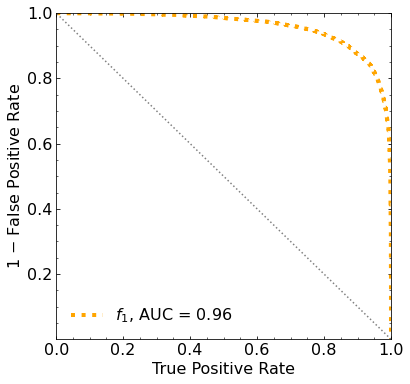

Classification score:


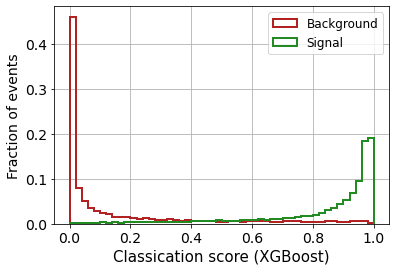


 ROC-AUC =  0.9576023258303261
At least 5 B events per bin, range = [[0, 1]]:
# bins:  23 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  23
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


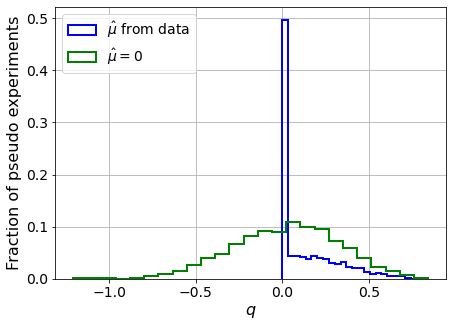

muhat mean:  0.10086097762203218
Z_bins:  0.1927849741682831
std Z_bins:  0.4570459567399849
Z_bins mu=0:  0.1927849741682831
std Z_bins mu=0:  0.7998027457056005

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


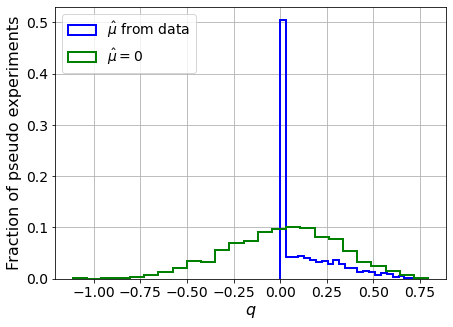

muhat mean:  0.27510802836324627
Z_bins:  0.16784068420303042
std Z_bins:  0.5028138500443071
Z_bins mu=0:  0.16784068420303042
std Z_bins mu=0:  0.8957480315166839

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


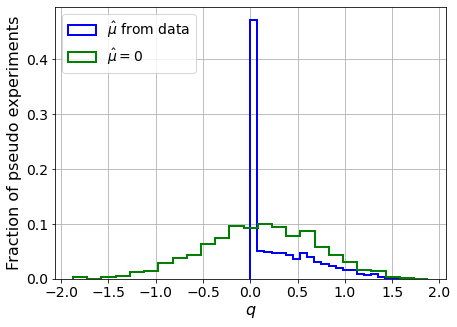

muhat mean:  -0.006295560118161607
Z_bins:  0.34509735368465544
std Z_bins:  0.530143795233151
Z_bins mu=0:  0.34509735368465544
std Z_bins mu=0:  0.8601603330433956

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


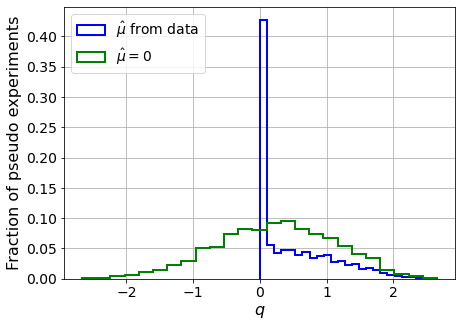

muhat mean:  -0.026834243043173125
Z_bins:  0.5030314306728277
std Z_bins:  0.5745548384626394
Z_bins mu=0:  0.5030314306728277
std Z_bins mu=0:  0.8882753948054913

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


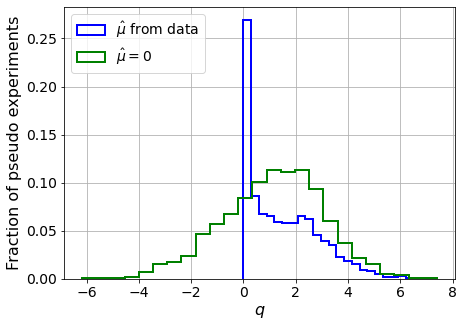

muhat mean:  -0.014219459059640735
Z_bins:  1.1171296170999319
std Z_bins:  0.6176839027287693
Z_bins mu=0:  1.1171296170999319
std Z_bins mu=0:  0.8577594225438033

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


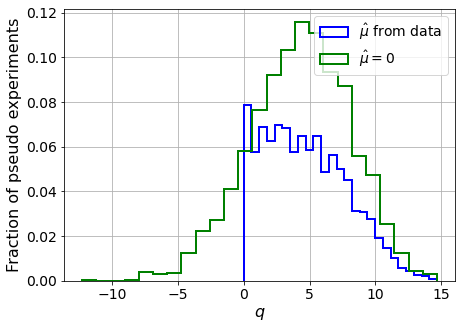

muhat mean:  0.006816004099308501
Z_bins:  2.1066439717260623
std Z_bins:  0.7372997487639187
Z_bins mu=0:  2.1066439717260623
std Z_bins mu=0:  0.9089682764951547

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


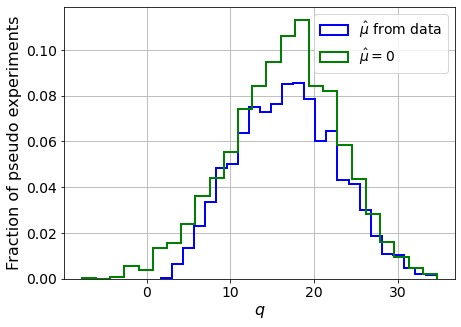

muhat mean:  -0.003945949133593833
Z_bins:  4.082766277997955
std Z_bins:  0.7263383157947999
Z_bins mu=0:  4.081888416921452
std Z_bins mu=0:  0.8061989174441153

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


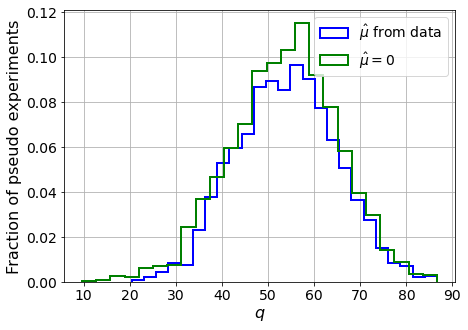

muhat mean:  -0.0004595584160454315
Z_bins:  7.352461364164942
std Z_bins:  0.7376532867171359
Z_bins mu=0:  7.352461364164942
std Z_bins mu=0:  0.789297354911315

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


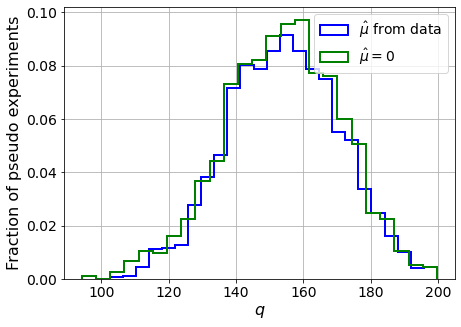

muhat mean:  0.00037492466807300924
Z_bins:  12.42129761967689
std Z_bins:  0.66749541086348
Z_bins mu=0:  12.420177630946858
std Z_bins mu=0:  0.695032086964949

--------

B_expected:  643
S_expected:  333

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


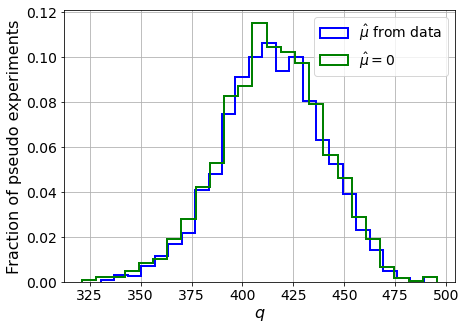

muhat mean:  0.00013599884209497534
Z_bins:  20.358650110254718
std Z_bins:  0.6128320612344577
Z_bins mu=0:  20.35820424200923
std Z_bins mu=0:  0.6307066420724723

--------


 FINAL RESULT:

[[0.1927849741682831, 0.4570459567399849, 0.10086097762203218, 0.1927849741682831, 0.7998027457056005], [0.16784068420303042, 0.5028138500443071, 0.27510802836324627, 0.16784068420303042, 0.8957480315166839], [0.34509735368465544, 0.530143795233151, -0.006295560118161607, 0.34509735368465544, 0.8601603330433956], [0.5030314306728277, 0.5745548384626394, -0.026834243043173125, 0.5030314306728277, 0.8882753948054913], [1.1171296170999319, 0.6176839027287693, -0.014219459059640735, 1.1171296170999319, 0.8577594225438033], [2.1066439717260623, 0.7372997487639187, 0.006816004099308501, 2.1066439717260623, 0.9089682764951547], [4.082766277997955, 0.7263383157947999, -0.003945949133593833, 4.081888416921452, 0.8061989174441153], [7.352461364164942, 0.7376532867171359, -0.0004595584160454315, 7.352461364

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  233.98139202  213.051353    189.83188179  163.24936551  129.11015741
   93.08800196   50.9938255     2.72382589  -49.20680065 -105.52364195]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 194.1893812  189.6973102  178.64496776 162.901971

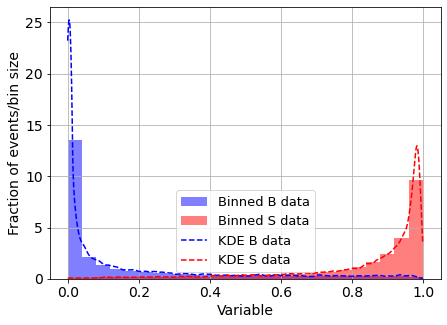

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



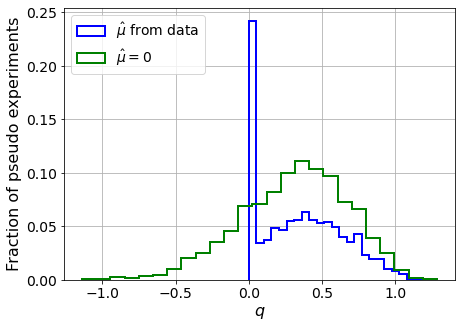

muhat mean:  -6.850562387977646
Z_bins:  0.5843056348714986
std Z_bins:  0.24574873135033512
Z_bins mu=0:  0.5843056348714986
std Z_bins mu=0:  0.31327620789958643

--------

B_expected:  643
S_expected:  1



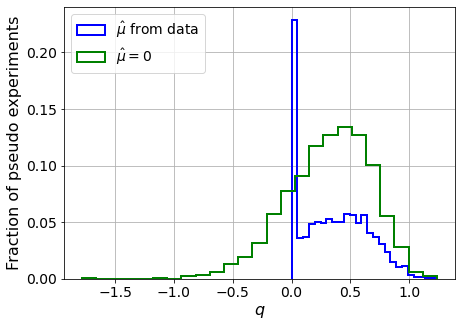

muhat mean:  -6.617720983595361
Z_bins:  0.5836967580628413
std Z_bins:  0.2414129922276434
Z_bins mu=0:  0.5836967580628413
std Z_bins mu=0:  0.3058541388717055

--------

B_expected:  643
S_expected:  2



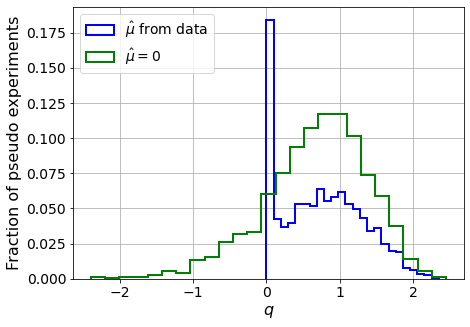

muhat mean:  -3.4374185236599333
Z_bins:  0.8629488853729088
std Z_bins:  0.3215387790378343
Z_bins mu=0:  0.8629488853729088
std Z_bins mu=0:  0.4084338070175073

--------

B_expected:  643
S_expected:  3



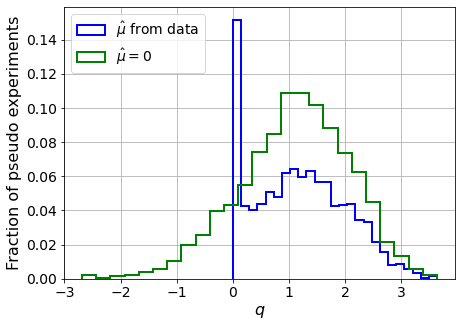

muhat mean:  -2.244928778633238
Z_bins:  1.0763200303702256
std Z_bins:  0.3824147575944526
Z_bins mu=0:  1.0763200303702256
std Z_bins mu=0:  0.4537295803624706

--------

B_expected:  643
S_expected:  7



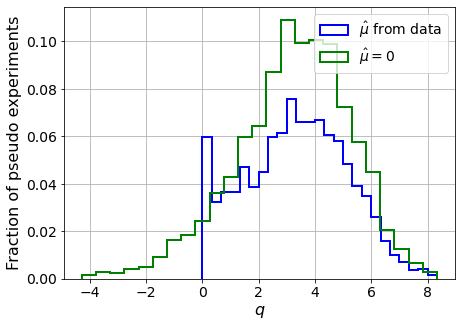

muhat mean:  -0.9150238862173496
Z_bins:  1.840090449385475
std Z_bins:  0.48991586606148735
Z_bins mu=0:  1.840090449385475
std Z_bins mu=0:  0.5530199981018662

--------

B_expected:  643
S_expected:  15



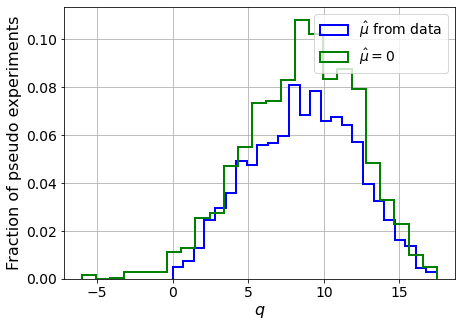

muhat mean:  -0.4483477504955855
Z_bins:  2.9557221302268997
std Z_bins:  0.5870875430093675
Z_bins mu=0:  2.9557221302268997
std Z_bins mu=0:  0.6260574723340371

--------

B_expected:  643
S_expected:  33



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


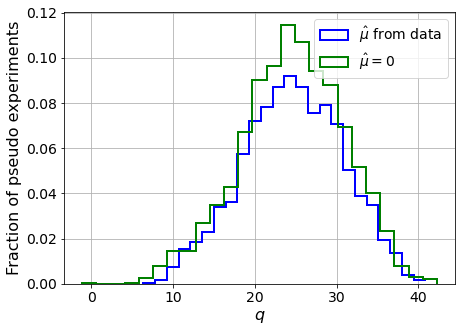

muhat mean:  -0.2133914275969273
Z_bins:  4.97533845971039
std Z_bins:  0.6172088019057453
Z_bins mu=0:  4.97533845971039
std Z_bins mu=0:  0.6377288323873355

--------

B_expected:  643
S_expected:  72



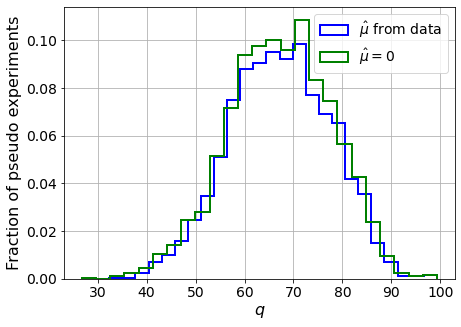

muhat mean:  -0.09005851386412779
Z_bins:  8.209333534373997
std Z_bins:  0.6286638631994448
Z_bins mu=0:  8.209333534373997
std Z_bins mu=0:  0.64132533066419

--------

B_expected:  643
S_expected:  154



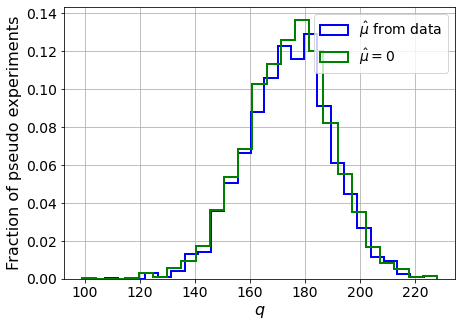

muhat mean:  -0.04048460449023782
Z_bins:  13.21959324000176
std Z_bins:  0.5937899977397423
Z_bins mu=0:  13.21959324000176
std Z_bins mu=0:  0.6025494335329857

--------

B_expected:  643
S_expected:  333



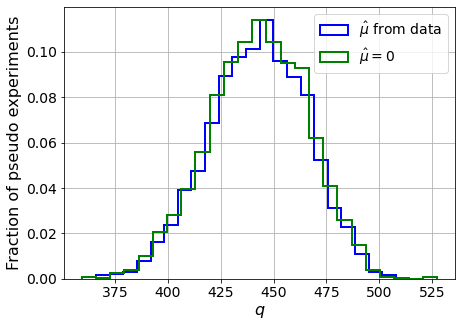

muhat mean:  -0.01964499446270615
Z_bins:  21.060278814924576
std Z_bins:  0.5494234688382481
Z_bins mu=0:  21.059959628958
std Z_bins mu=0:  0.5538915738670809

--------


 FINAL RESULT:

[[0.5843056348714986, 0.24574873135033512, -6.850562387977646, 0.5843056348714986, 0.31327620789958643], [0.5836967580628413, 0.2414129922276434, -6.617720983595361, 0.5836967580628413, 0.3058541388717055], [0.8629488853729088, 0.3215387790378343, -3.4374185236599333, 0.8629488853729088, 0.4084338070175073], [1.0763200303702256, 0.3824147575944526, -2.244928778633238, 1.0763200303702256, 0.4537295803624706], [1.840090449385475, 0.48991586606148735, -0.9150238862173496, 1.840090449385475, 0.5530199981018662], [2.9557221302268997, 0.5870875430093675, -0.4483477504955855, 2.9557221302268997, 0.6260574723340371], [4.97533845971039, 0.6172088019057453, -0.2133914275969273, 4.97533845971039, 0.6377288323873355], [8.209333534373997, 0.6286638631994448, -0.09005851386412779, 8.209333534373997, 0.641325330664

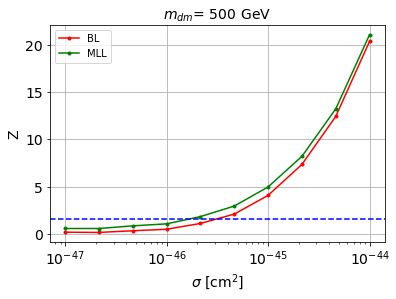


cross_BL_164:  3.4541837921016842e-46
cross_BL_164_up:  1.9766097528533537e-46
cross_BL_164_down:  5.34255903148257e-46

cross_MLL_164:  1.8182842681511214e-46
cross_MLL_164_up:  1.236494495203362e-46
cross_MLL_164_down:  2.8024416244458644e-46

#########################



In [217]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    # set events per classs
    NUM_DAT = min(len(B_pbot_ER), len(S_pbot))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = round(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, round(NUM_DAT*f_CNNS))
    NUM_DAT_RN = round(NUM_DAT*f_RN)
    NUM_DAT_WALL = round(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    rnd = 100

    B_pbot_plot, B_ptop_plot = shuffle(B_pbot, B_ptop, random_state=rnd)
    S_pbot_plot, S_ptop_plot = shuffle(S_pbot, S_ptop, random_state=rnd)

    plt.plot(B_pbot_plot[:1000], B_ptop_plot[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_pbot_plot[:1000], S_ptop_plot[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)


    
    
    ############
    # DATASETS #
    ############
    
    # concatenate the data
    X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(B_ptop,(len(B_ptop),1)) ],axis=1)
    X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pbot,(len(S_pbot),1)), np.reshape(S_ptop,(len(S_ptop),1)) ],axis=1)

    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 2 (mu_hat with more precision) (slower,
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)
    
    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]



    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [218]:
cross_16feats = store_cross_BL_164
cross_16feats_up = store_cross_BL_164_up
cross_16feats_down = store_cross_BL_164_down

print(cross_16feats)
print(cross_16feats_up)
print(cross_16feats_down)

cross_16feats_MLL = store_cross_MLL_164
cross_16feats_MLL_up = store_cross_MLL_164_up
cross_16feats_MLL_down = store_cross_MLL_164_down

print(cross_16feats_MLL)
print(cross_16feats_MLL_up)
print(cross_16feats_MLL_down)

[1.3035379695088841e-45, 8.7275905699795e-47, 4.642543316439867e-47, 5.232129718601479e-47, 7.353248492863144e-47, 1.432901983697491e-46, 3.4541837921016842e-46]
[7.815149532354439e-46, 5.289345166202695e-47, 2.681556796571753e-47, 3.0220642561817695e-47, 4.609540578350866e-47, 7.898354222047258e-47, 1.9766097528533537e-46]
[2.05980093389852e-45, 1.39053739147167e-46, 6.757164725232577e-47, 7.878533348974299e-47, 1.0996486025831349e-46, 2.2183037909150126e-46, 5.34255903148257e-46]
[1.3881892084988637e-45, 4.2245779691888977e-47, 2.1842564469905747e-47, 2.4293774080389815e-47, 4.036847787470141e-47, 7.134646848727435e-47, 1.8182842681511214e-46]
[2.8001479678331683e-46, 2.799469305049357e-47, 1.3335441229954073e-47, 1.595869569394034e-47, 2.382446915840154e-47, 4.280305309135382e-47, 1.236494495203362e-46]
[2.1696307020021157e-45, 6.141970277760245e-47, 3.4871667516455653e-47, 3.650610811388858e-47, 6.050158849732599e-47, 1.1388410231395362e-46, 2.8024416244458644e-46]


In [219]:
np.savetxt('results/16feats.txt', [cross_16feats, cross_16feats_up, cross_16feats_down])
np.savetxt('results/16feats_MLL.txt', [cross_16feats_MLL, cross_16feats_MLL_up, cross_16feats_MLL_down])

In [220]:
cross_16feats = np.loadtxt('results/16feats.txt')[0]
cross_16feats_up = np.loadtxt('results/16feats.txt')[1]
cross_16feats_down =np.loadtxt('results/16feats.txt')[2]

cross_16feats_MLL = np.loadtxt('results/16feats_MLL.txt')[0]
cross_16feats_MLL_up = np.loadtxt('results/16feats_MLL.txt')[1]
cross_16feats_MLL_down = np.loadtxt('results/16feats_MLL.txt')[2]

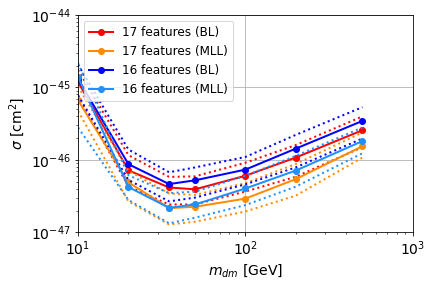

In [221]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_17feats, '-o', color='red', lw=lw, label=r'17 features (BL)')
plt.plot(mDM_mDM, cross_17feats_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_17feats_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_17feats_MLL, '-o', color='darkorange', lw=lw, label=r'17 features (MLL)')
plt.plot(mDM_mDM, cross_17feats_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_17feats_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_16feats, '-o', color='blue', lw=lw, label=r'16 features (BL)')
plt.plot(mDM_mDM, cross_16feats_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_16feats_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_16feats_MLL, '-o', color='dodgerblue', lw=lw, label=r'16 features (MLL)')
plt.plot(mDM_mDM, cross_16feats_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_16feats_MLL_down, ':', color='dodgerblue', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlim(10,1000)
plt.ylim(1e-47, 1e-44)
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

In [222]:
x_XENON1T_1tonyr_down = [6.055606916561549, 6.823778108538652, 7.726215280067716, 8.582423845905856, 9.904912022713336, 11.596190805697788, 14.105146244789573, 17.91067828986308, 22.419318490487267, 28.741287837312296, 37.55681861498598, 46.12118051468561, 57.18227249733948, 70.55823652254493, 95.79168238706818, 141.05146244789574, 199.9078624971397, 281.97296360054435, 435.5160347143599, 663.0965425825532, 1004.7885762566482]
y_XENON1T_1tonyr_down = [2.122997019253291e-44, 6.830827595149092e-45, 2.5565879564232304e-45, 1.0450855592138182e-45, 3.814128748283239e-46, 1.6397373222443297e-46, 7.13879927716957e-47, 3.4375712618817914e-47, 2.296937143881235e-47, 1.807931378879487e-47, 1.5939048066202329e-47, 1.57394815950498e-47, 1.6141144911444228e-47, 1.7629420229546865e-47, 2.1840435093891482e-47, 2.99267938153686e-47, 4.3126768942716094e-47, 5.984360998261109e-47, 9.301141506038491e-47, 1.4275218465524083e-46, 2.218713527075558e-46]

x_XENON1T_1tonyr_up = [5.998025375267653, 6.694623244123534, 7.837740338641554, 9.176046414544945, 10.340054351159923, 12.047941859795849, 14.240556819126223, 17.57167968977445, 22.419318490487267, 28.604313898938127, 36.495613101538225, 45.03259469748133, 54.77586085235927, 70.22197324875098, 93.0849924905222, 139.0444078719906, 196.1241707554598, 274.00553519070826, 411.25186818001043, 650.5459961419798, 995.2342449249492]
y_XENON1T_1tonyr_up = [8.70579590515474e-44, 3.137473218474891e-44, 8.046532229280133e-45, 2.7573536821266015e-45, 1.2156689420722025e-45, 5.6367138959821105e-46, 2.7486819276573736e-46, 1.4639514554724662e-46, 8.956129880675696e-47, 6.702940894624926e-47, 5.909433198208975e-47, 5.909433198208975e-47, 6.293693784124586e-47, 6.873996431179536e-47, 8.409314634569101e-47, 1.1236099983376527e-46, 1.5013107289081836e-46, 2.057166738834862e-46, 3.0401858742608336e-46, 4.785094961345878e-46, 7.252122247218222e-46]

x_XENON1T_1tonyr_dat = [5.940991365202825, 6.5679129168455805, 7.616277137894846, 8.874272903135752, 10.340054351159923, 11.990524319733609, 14.308748811391741, 17.156940060795215, 20.76956429087212, 25.142875087521656, 30.147625520495286, 36.14858369857204, 45.901378264580416, 60.267473771664314, 83.39918867052648, 123.98267316495033, 183.43638249062232, 276.63601106438455, 407.34135734995056, 638.2329961306843, 990.4912022713337]
y_XENON1T_1tonyr_dat = [2.4080691095438086e-44, 9.84373819664703e-45, 2.936650461687786e-45, 1.0320004592606233e-45, 4.492941663683521e-46, 2.362985258610077e-46, 1.2744862586397517e-46, 7.699400454191772e-47, 5.479161357412966e-47, 4.422734147010833e-47, 4.1007103760403667e-47, 4.2586795849318555e-47, 4.830527157087775e-47, 5.984360998261109e-47, 7.797023884122048e-47, 1.1095417251641934e-46, 1.5989333808583735e-46, 2.3333992615362496e-46, 3.448416377736618e-46, 5.427628610945291e-46, 8.542806062673913e-46]

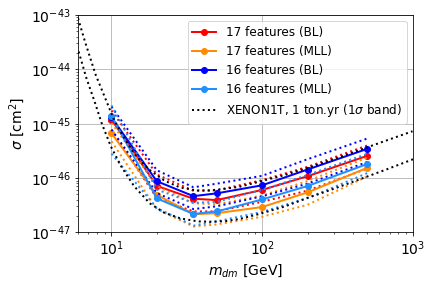

In [223]:

# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_17feats, '-o', color='red', lw=lw, label=r'17 features (BL)')
plt.plot(mDM_mDM, cross_17feats_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_17feats_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_17feats_MLL, '-o', color='darkorange', lw=lw, label=r'17 features (MLL)')
plt.plot(mDM_mDM, cross_17feats_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_17feats_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_16feats, '-o', color='blue', lw=lw, label=r'16 features (BL)')
plt.plot(mDM_mDM, cross_16feats_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_16feats_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_16feats_MLL, '-o', color='dodgerblue', lw=lw, label=r'16 features (MLL)')
plt.plot(mDM_mDM, cross_16feats_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_16feats_MLL_down, ':', color='dodgerblue', lw=lw)
#plt.plot(x_XENON1T_1tonyr_dat, y_XENON1T_1tonyr_dat, '--', color='green', lw=lw, label='XENON1T')
plt.plot(x_XENON1T_1tonyr_up, y_XENON1T_1tonyr_up, ':', color='black', lw=lw, label='XENON1T, 1 ton.yr (1$\sigma$ band)')
plt.plot(x_XENON1T_1tonyr_down, y_XENON1T_1tonyr_down, ':', color='black', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlim(6,1000)
plt.ylim(1e-47, 1e-43)
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper right", fontsize=12)
plt.show()

## 1. 14 variables + time diff


#########################

mDM =  10 GeV


S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)
 NUM_DAT:  20487 

NUM_DAT_ER:  20225
NUM_DAT_AC:  72
NUM_DAT_CNNS:  1
NUM_DAT_RN:  19
NUM_DAT_WALL:  170

B_pbot.shape:  (20487,)
B_ptop.shape:  (20487,)
B_ppeakS1.shape : (20487, 8)
B_ppeakS2.shape:  (20487, 8)

S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)


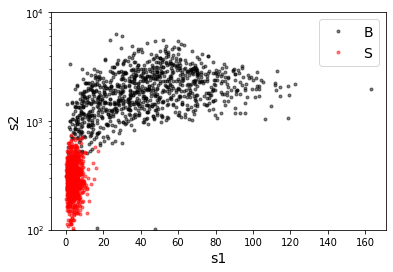

B_pdiffT.shape:  (20487,)
S_pdiffT.shape:  (20487,)


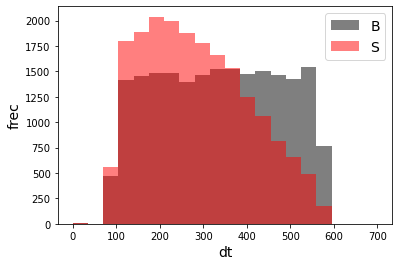

B_pbot.shape:  (20487,)
B_ptop.shape:  (20487,)
B_ppeakS1.shape : (20487, 7)
B_ppeakS2.shape:  (20487, 7)
S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 7)
S_ppeakS2.shape:  (20487, 7)
X_mon_B.shape:  (20487, 15)
X_mon_S.shape:  (20487, 15)
X_mon.shape:  (40974, 15)

X_mon_train :  (26120, 15)
y_mon_train :  (26120,)
X_mon_val :  (4610, 15)
y_mon_val :  (4610,)
X_mon_test :  (10244, 15)
y_mon_test :  (10244,)

[0]	validation_0-logloss:0.68351	validation_1-logloss:0.68355
[1]	validation_0-logloss:0.67407	validation_1-logloss:0.67415
[2]	validation_0-logloss:0.66480	validation_1-logloss:0.66493
[3]	validation_0-logloss:0.65572	validation_1-logloss:0.65589
[4]	validation_0-logloss:0.64681	validation_1-logloss:0.64703


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[5]	validation_0-logloss:0.63807	validation_1-logloss:0.63833
[6]	validation_0-logloss:0.62949	validation_1-logloss:0.62980
[7]	validation_0-logloss:0.62109	validation_1-logloss:0.62143
[8]	validation_0-logloss:0.61283	validation_1-logloss:0.61321
[9]	validation_0-logloss:0.60472	validation_1-logloss:0.60515
[10]	validation_0-logloss:0.59676	validation_1-logloss:0.59724
[11]	validation_0-logloss:0.58895	validation_1-logloss:0.58947
[12]	validation_0-logloss:0.58125	validation_1-logloss:0.58180
[13]	validation_0-logloss:0.57370	validation_1-logloss:0.57427
[14]	validation_0-logloss:0.56626	validation_1-logloss:0.56687
[15]	validation_0-logloss:0.55897	validation_1-logloss:0.55961
[16]	validation_0-logloss:0.55180	validation_1-logloss:0.55248
[17]	validation_0-logloss:0.54475	validation_1-logloss:0.54546
[18]	validation_0-logloss:0.53784	validation_1-logloss:0.53856
[19]	validation_0-logloss:0.53104	validation_1-logloss:0.53179
[20]	validation_0-logloss:0.52433	validation_1-logloss:0.525

[135]	validation_0-logloss:0.15116	validation_1-logloss:0.15438
[136]	validation_0-logloss:0.14973	validation_1-logloss:0.15296
[137]	validation_0-logloss:0.14830	validation_1-logloss:0.15154
[138]	validation_0-logloss:0.14688	validation_1-logloss:0.15013
[139]	validation_0-logloss:0.14548	validation_1-logloss:0.14874
[140]	validation_0-logloss:0.14413	validation_1-logloss:0.14740
[141]	validation_0-logloss:0.14276	validation_1-logloss:0.14604
[142]	validation_0-logloss:0.14143	validation_1-logloss:0.14473
[143]	validation_0-logloss:0.14011	validation_1-logloss:0.14343
[144]	validation_0-logloss:0.13879	validation_1-logloss:0.14211
[145]	validation_0-logloss:0.13748	validation_1-logloss:0.14081
[146]	validation_0-logloss:0.13620	validation_1-logloss:0.13953
[147]	validation_0-logloss:0.13493	validation_1-logloss:0.13829
[148]	validation_0-logloss:0.13369	validation_1-logloss:0.13706
[149]	validation_0-logloss:0.13246	validation_1-logloss:0.13585
[150]	validation_0-logloss:0.13125	valid

[264]	validation_0-logloss:0.05141	validation_1-logloss:0.05601
[265]	validation_0-logloss:0.05104	validation_1-logloss:0.05566
[266]	validation_0-logloss:0.05068	validation_1-logloss:0.05531
[267]	validation_0-logloss:0.05032	validation_1-logloss:0.05496
[268]	validation_0-logloss:0.04996	validation_1-logloss:0.05462
[269]	validation_0-logloss:0.04961	validation_1-logloss:0.05429
[270]	validation_0-logloss:0.04926	validation_1-logloss:0.05395
[271]	validation_0-logloss:0.04892	validation_1-logloss:0.05362
[272]	validation_0-logloss:0.04857	validation_1-logloss:0.05330
[273]	validation_0-logloss:0.04823	validation_1-logloss:0.05298
[274]	validation_0-logloss:0.04790	validation_1-logloss:0.05266
[275]	validation_0-logloss:0.04757	validation_1-logloss:0.05234
[276]	validation_0-logloss:0.04724	validation_1-logloss:0.05202
[277]	validation_0-logloss:0.04692	validation_1-logloss:0.05171
[278]	validation_0-logloss:0.04659	validation_1-logloss:0.05139
[279]	validation_0-logloss:0.04628	valid

[393]	validation_0-logloss:0.02475	validation_1-logloss:0.03103
[394]	validation_0-logloss:0.02465	validation_1-logloss:0.03094
[395]	validation_0-logloss:0.02454	validation_1-logloss:0.03086
[396]	validation_0-logloss:0.02444	validation_1-logloss:0.03077
[397]	validation_0-logloss:0.02434	validation_1-logloss:0.03069
[398]	validation_0-logloss:0.02424	validation_1-logloss:0.03060
[399]	validation_0-logloss:0.02414	validation_1-logloss:0.03053
[400]	validation_0-logloss:0.02404	validation_1-logloss:0.03043
[401]	validation_0-logloss:0.02395	validation_1-logloss:0.03036
[402]	validation_0-logloss:0.02385	validation_1-logloss:0.03027
[403]	validation_0-logloss:0.02376	validation_1-logloss:0.03020
[404]	validation_0-logloss:0.02367	validation_1-logloss:0.03012
[405]	validation_0-logloss:0.02357	validation_1-logloss:0.03004
[406]	validation_0-logloss:0.02348	validation_1-logloss:0.02997
[407]	validation_0-logloss:0.02339	validation_1-logloss:0.02990
[408]	validation_0-logloss:0.02330	valid

[522]	validation_0-logloss:0.01683	validation_1-logloss:0.02515
[523]	validation_0-logloss:0.01679	validation_1-logloss:0.02512
[524]	validation_0-logloss:0.01675	validation_1-logloss:0.02511
[525]	validation_0-logloss:0.01672	validation_1-logloss:0.02508
[526]	validation_0-logloss:0.01668	validation_1-logloss:0.02506
[527]	validation_0-logloss:0.01665	validation_1-logloss:0.02503
[528]	validation_0-logloss:0.01662	validation_1-logloss:0.02501
[529]	validation_0-logloss:0.01658	validation_1-logloss:0.02499
[530]	validation_0-logloss:0.01655	validation_1-logloss:0.02496
[531]	validation_0-logloss:0.01652	validation_1-logloss:0.02494
[532]	validation_0-logloss:0.01649	validation_1-logloss:0.02492
[533]	validation_0-logloss:0.01645	validation_1-logloss:0.02491
[534]	validation_0-logloss:0.01642	validation_1-logloss:0.02489
[535]	validation_0-logloss:0.01639	validation_1-logloss:0.02486
[536]	validation_0-logloss:0.01635	validation_1-logloss:0.02487
[537]	validation_0-logloss:0.01632	valid

[651]	validation_0-logloss:0.01366	validation_1-logloss:0.02398
[652]	validation_0-logloss:0.01365	validation_1-logloss:0.02398
[653]	validation_0-logloss:0.01364	validation_1-logloss:0.02397
[654]	validation_0-logloss:0.01363	validation_1-logloss:0.02397
[655]	validation_0-logloss:0.01362	validation_1-logloss:0.02397
[656]	validation_0-logloss:0.01360	validation_1-logloss:0.02397
[657]	validation_0-logloss:0.01359	validation_1-logloss:0.02396
[658]	validation_0-logloss:0.01358	validation_1-logloss:0.02396
[659]	validation_0-logloss:0.01357	validation_1-logloss:0.02396
[660]	validation_0-logloss:0.01355	validation_1-logloss:0.02395
[661]	validation_0-logloss:0.01354	validation_1-logloss:0.02395
[662]	validation_0-logloss:0.01353	validation_1-logloss:0.02394
[663]	validation_0-logloss:0.01352	validation_1-logloss:0.02394
[664]	validation_0-logloss:0.01351	validation_1-logloss:0.02393
[665]	validation_0-logloss:0.01350	validation_1-logloss:0.02392
[666]	validation_0-logloss:0.01349	valid

[780]	validation_0-logloss:0.01209	validation_1-logloss:0.02364
[781]	validation_0-logloss:0.01209	validation_1-logloss:0.02363
[782]	validation_0-logloss:0.01208	validation_1-logloss:0.02365
[783]	validation_0-logloss:0.01206	validation_1-logloss:0.02364
[784]	validation_0-logloss:0.01205	validation_1-logloss:0.02364
[785]	validation_0-logloss:0.01204	validation_1-logloss:0.02364
[786]	validation_0-logloss:0.01203	validation_1-logloss:0.02364
[787]	validation_0-logloss:0.01201	validation_1-logloss:0.02364
[788]	validation_0-logloss:0.01200	validation_1-logloss:0.02363
[789]	validation_0-logloss:0.01198	validation_1-logloss:0.02364
[790]	validation_0-logloss:0.01197	validation_1-logloss:0.02364
[791]	validation_0-logloss:0.01196	validation_1-logloss:0.02363
[792]	validation_0-logloss:0.01194	validation_1-logloss:0.02364
[793]	validation_0-logloss:0.01193	validation_1-logloss:0.02364
[794]	validation_0-logloss:0.01192	validation_1-logloss:0.02363
[795]	validation_0-logloss:0.01192	valid

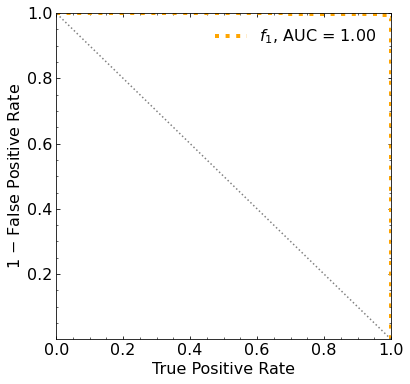

Classification score:


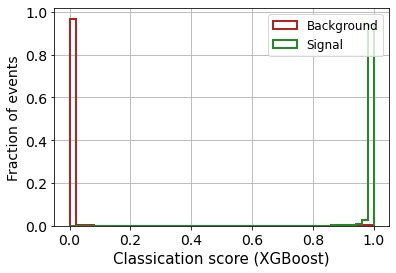


 ROC-AUC =  0.9991698056247384
At least 5 B events per bin, range = [[0, 1]]:
# bins:  2 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  2
range of our data:  [[0, 1]]
number of bins we are going to use:  2
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.124


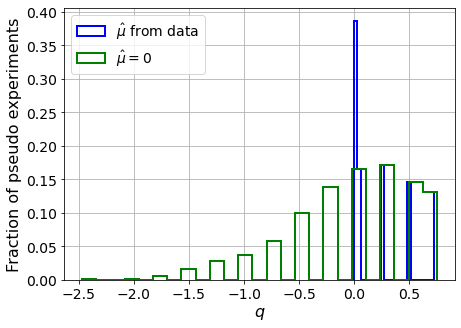

muhat mean:  0.5536709157368347
Z_bins:  0.18698892422319557
std Z_bins:  0.724743959528304
Z_bins mu=0:  0.0896437127065793
std Z_bins mu=0:  3.1689021654856266

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.112


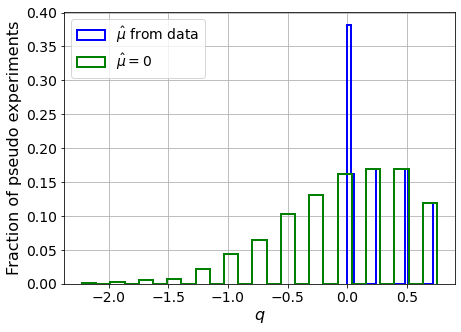

muhat mean:  0.5247089565490798
Z_bins:  0.18698892422319557
std Z_bins:  0.7145623245642538
Z_bins mu=0:  0.0896437127065793
std Z_bins mu=0:  3.108155521003719

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1055


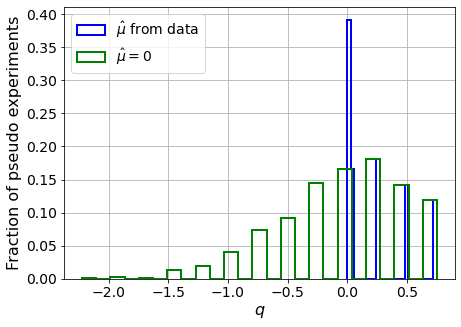

muhat mean:  0.5718812202669935
Z_bins:  0.1869105514533752
std Z_bins:  0.7080918129732849
Z_bins mu=0:  0.08934207209671197
std Z_bins mu=0:  3.089479341987504

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.118


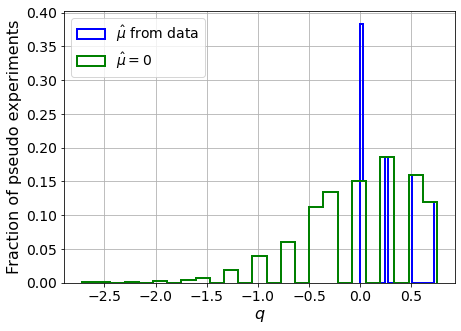

muhat mean:  0.5086279233277842
Z_bins:  0.18702811008001657
std Z_bins:  0.7112983408255453
Z_bins mu=0:  0.08979415303048717
std Z_bins mu=0:  3.108329467031463

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1085


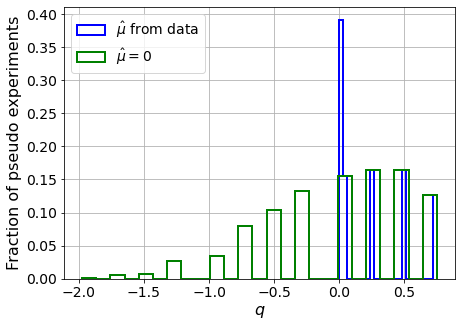

muhat mean:  0.5255898962383677
Z_bins:  0.18694973801392648
std Z_bins:  0.723904724444928
Z_bins mu=0:  0.08949301948854392
std Z_bins mu=0:  3.098786499545827

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1


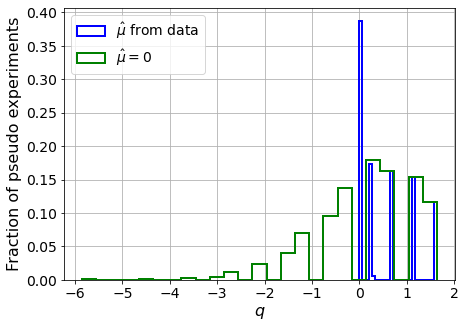

muhat mean:  0.29870951681567603
Z_bins:  0.5117712556715254
std Z_bins:  0.5606810562680623
Z_bins mu=0:  0.4847165114117633
std Z_bins mu=0:  1.103214336869698

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.115


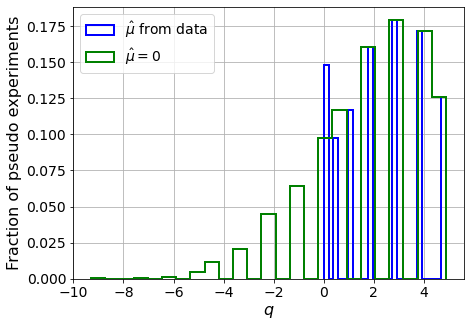

muhat mean:  0.09329944263306397
Z_bins:  1.370121543951829
std Z_bins:  0.582682064938016
Z_bins mu=0:  1.3602815318226291
std Z_bins mu=0:  0.8450581562505985

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.118


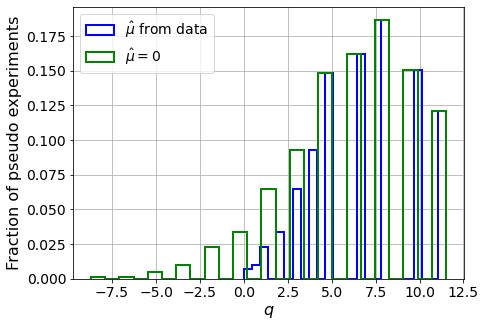

muhat mean:  0.04989826469386927
Z_bins:  2.5453601149745317
std Z_bins:  0.5856062936730256
Z_bins mu=0:  2.5400629906448073
std Z_bins mu=0:  0.7299179675953726

--------

B_expected:  643
S_expected:  22

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.121


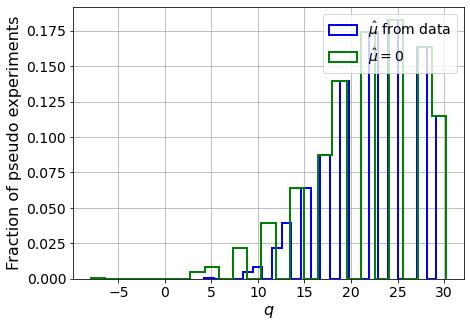

muhat mean:  0.021102189424905583
Z_bins:  4.696059783358055
std Z_bins:  0.5524954797033111
Z_bins mu=0:  4.693194031434767
std Z_bins mu=0:  0.6291211795566932

--------

B_expected:  643
S_expected:  47

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.114


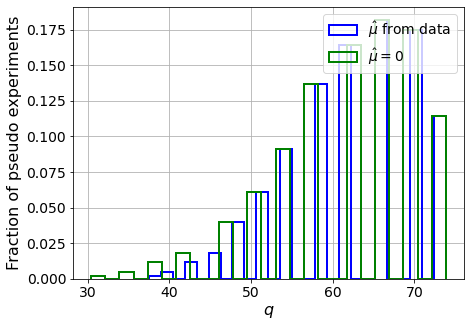

muhat mean:  0.009647264388924928
Z_bins:  7.876998484483149
std Z_bins:  0.5024787932059342
Z_bins mu=0:  7.875292878691344
std Z_bins mu=0:  0.5496795263762597

--------


 FINAL RESULT:

[[0.18698892422319557, 0.724743959528304, 0.5536709157368347, 0.0896437127065793, 3.1689021654856266], [0.18698892422319557, 0.7145623245642538, 0.5247089565490798, 0.0896437127065793, 3.108155521003719], [0.1869105514533752, 0.7080918129732849, 0.5718812202669935, 0.08934207209671197, 3.089479341987504], [0.18702811008001657, 0.7112983408255453, 0.5086279233277842, 0.08979415303048717, 3.108329467031463], [0.18694973801392648, 0.723904724444928, 0.5255898962383677, 0.08949301948854392, 3.098786499545827], [0.5117712556715254, 0.5606810562680623, 0.29870951681567603, 0.4847165114117633, 1.103214336869698], [1.370121543951829, 0.582682064938016, 0.09329944263306397, 1.3602815318226291, 0.8450581562505985], [2.5453601149745317, 0.5856062936730256, 0.04989826469386927, 2.5400629906448073, 0.72991796759

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 291.93075495 198.23860868 103.33712426   9.45441189 -82.99222663]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 284

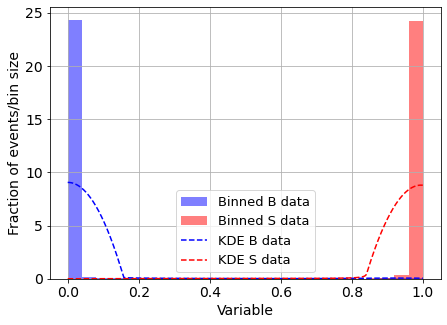

KDE Kernel:  epanechnikov
Background bandwidth:  0.15753186734235153
Signal bandwidth:  0.15753186734235153
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


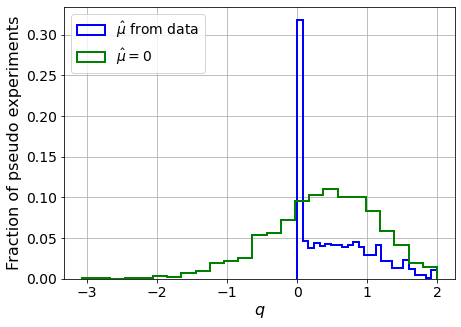

muhat mean:  -1.610947496236916
Z_bins:  0.6488944605511526
std Z_bins:  0.3996333580602135
Z_bins mu=0:  0.6488944605511526
std Z_bins mu=0:  0.5815072574633201

--------

B_expected:  643
S_expected:  1



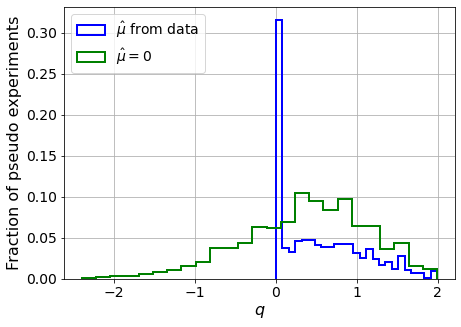

muhat mean:  -2.0395614667813975
Z_bins:  0.6546996220514705
std Z_bins:  0.4005295012041217
Z_bins mu=0:  0.6546996220514705
std Z_bins mu=0:  0.5900849729684824

--------

B_expected:  643
S_expected:  1



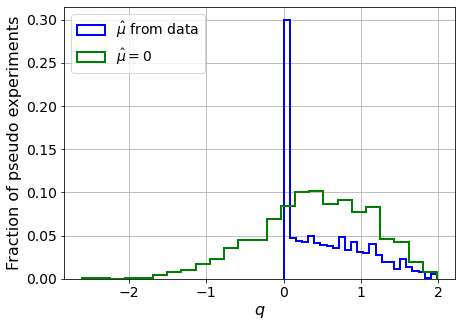

muhat mean:  -1.5399505380258283
Z_bins:  0.655255615504623
std Z_bins:  0.3948269995262105
Z_bins mu=0:  0.655255615504623
std Z_bins mu=0:  0.5561885323969983

--------

B_expected:  643
S_expected:  1



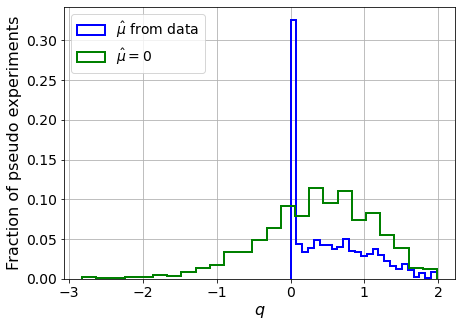

muhat mean:  -1.3737704066201168
Z_bins:  0.6440689484724176
std Z_bins:  0.39754075876172007
Z_bins mu=0:  0.6440689484724176
std Z_bins mu=0:  0.5855686889840794

--------

B_expected:  643
S_expected:  1



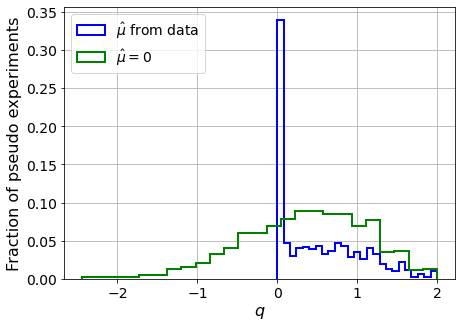

muhat mean:  -578.6026740150314
Z_bins:  0.63392548474836
std Z_bins:  0.41431484075407937
Z_bins mu=0:  0.63392548474836
std Z_bins mu=0:  0.6120847790254761

--------

B_expected:  643
S_expected:  2



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


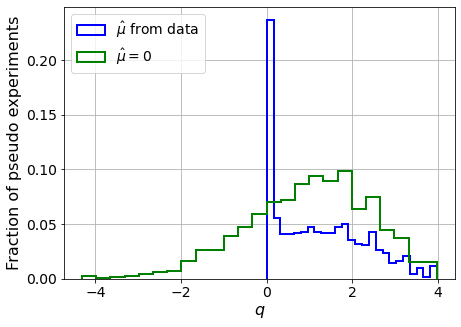

muhat mean:  -1.7602642365008656
Z_bins:  1.0468640881370526
std Z_bins:  0.5028774638375961
Z_bins mu=0:  1.0468640881370526
std Z_bins mu=0:  0.6842969782461255

--------

B_expected:  643
S_expected:  5



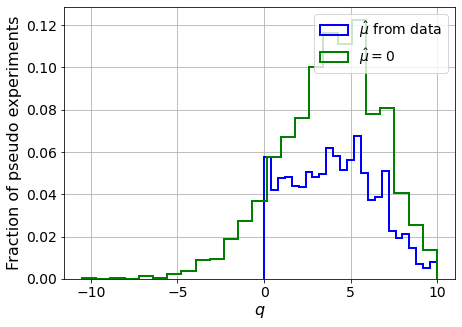

muhat mean:  -111.76641425343873
Z_bins:  2.0147126319255717
std Z_bins:  0.591864188719555
Z_bins mu=0:  2.0147126319255717
std Z_bins mu=0:  0.7172829573870889

--------

B_expected:  643
S_expected:  10



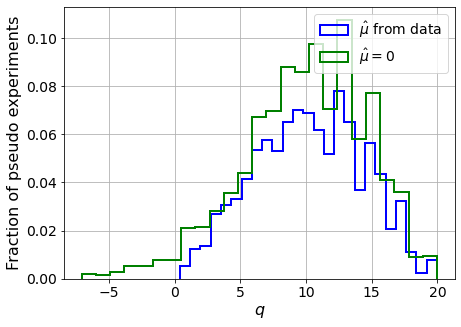

muhat mean:  -0.159819039488893
Z_bins:  3.20859937399319
std Z_bins:  0.641984790644195
Z_bins mu=0:  3.20859937399319
std Z_bins mu=0:  0.7315608543021774

--------

B_expected:  643
S_expected:  22



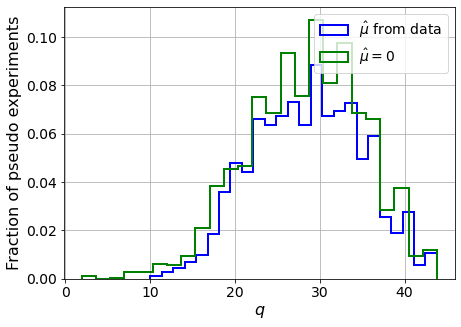

muhat mean:  -0.24730078433672878
Z_bins:  5.3726259497178495
std Z_bins:  0.5946565851817398
Z_bins mu=0:  5.3726259497178495
std Z_bins mu=0:  0.6351368044399566

--------

B_expected:  643
S_expected:  47



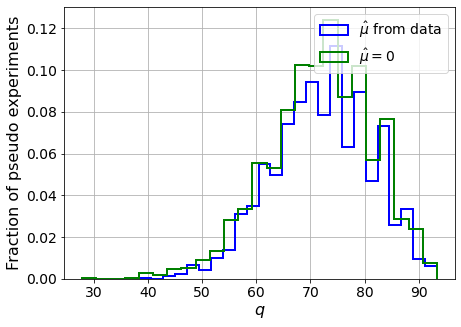

muhat mean:  -0.034058572932057864
Z_bins:  8.51821428791613
std Z_bins:  0.5323044716546159
Z_bins mu=0:  8.51821428791613
std Z_bins mu=0:  0.5608937850759497

--------


 FINAL RESULT:

[[0.6488944605511526, 0.3996333580602135, -1.610947496236916, 0.6488944605511526, 0.5815072574633201], [0.6546996220514705, 0.4005295012041217, -2.0395614667813975, 0.6546996220514705, 0.5900849729684824], [0.655255615504623, 0.3948269995262105, -1.5399505380258283, 0.655255615504623, 0.5561885323969983], [0.6440689484724176, 0.39754075876172007, -1.3737704066201168, 0.6440689484724176, 0.5855686889840794], [0.63392548474836, 0.41431484075407937, -578.6026740150314, 0.63392548474836, 0.6120847790254761], [1.0468640881370526, 0.5028774638375961, -1.7602642365008656, 1.0468640881370526, 0.6842969782461255], [2.0147126319255717, 0.591864188719555, -111.76641425343873, 2.0147126319255717, 0.7172829573870889], [3.20859937399319, 0.641984790644195, -0.159819039488893, 3.20859937399319, 0.7315608543021774],

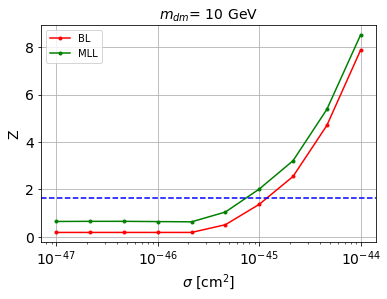


cross_BL_164:  1.2289341069509435e-45
cross_BL_164_up:  7.88703784066504e-46
cross_BL_164_down:  1.8302196832351552e-45

cross_MLL_164:  7.606022872858135e-46
cross_MLL_164_up:  5.035424133753542e-46
cross_MLL_164_down:  1.1857633781279167e-45

#########################


#########################

mDM =  20 GeV


S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)
 NUM_DAT:  27311 

NUM_DAT_ER:  26962
NUM_DAT_AC:  96
NUM_DAT_CNNS:  1
NUM_DAT_RN:  25
NUM_DAT_WALL:  227

B_pbot.shape:  (27311,)
B_ptop.shape:  (27311,)
B_ppeakS1.shape : (27311, 8)
B_ppeakS2.shape:  (27311, 8)

S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)


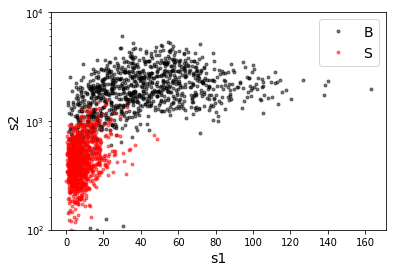

B_pdiffT.shape:  (27311,)
S_pdiffT.shape:  (27311,)


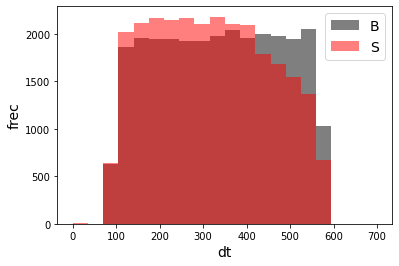

B_pbot.shape:  (27311,)
B_ptop.shape:  (27311,)
B_ppeakS1.shape : (27311, 7)
B_ppeakS2.shape:  (27311, 7)
S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 7)
S_ppeakS2.shape:  (27311, 7)
X_mon_B.shape:  (27311, 15)
X_mon_S.shape:  (27311, 15)
X_mon.shape:  (54622, 15)

X_mon_train :  (34821, 15)
y_mon_train :  (34821,)
X_mon_val :  (6145, 15)
y_mon_val :  (6145,)
X_mon_test :  (13656, 15)
y_mon_test :  (13656,)

[0]	validation_0-logloss:0.68434	validation_1-logloss:0.68434
[1]	validation_0-logloss:0.67569	validation_1-logloss:0.67570
[2]	validation_0-logloss:0.66720	validation_1-logloss:0.66724
[3]	validation_0-logloss:0.65889	validation_1-logloss:0.65893
[4]	validation_0-logloss:0.65073	validation_1-logloss:0.65080
[5]	validation_0-logloss:0.64273	validation_1-logloss:0.64282
[6]	validation_0-logloss:0.63486	validation_1-logloss:0.63495
[7]	validation_0-logloss:0.62715	validation_1-logloss:0.62726
[8]	validation_0-logloss:0.61959	validation_1-logloss:0.61971
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13]	validation_0-logloss:0.58375	validation_1-logloss:0.58390
[14]	validation_0-logloss:0.57696	validation_1-logloss:0.57708
[15]	validation_0-logloss:0.57026	validation_1-logloss:0.57038
[16]	validation_0-logloss:0.56371	validation_1-logloss:0.56384
[17]	validation_0-logloss:0.55724	validation_1-logloss:0.55736
[18]	validation_0-logloss:0.55090	validation_1-logloss:0.55105
[19]	validation_0-logloss:0.54470	validation_1-logloss:0.54485
[20]	validation_0-logloss:0.53855	validation_1-logloss:0.53869
[21]	validation_0-logloss:0.53253	validation_1-logloss:0.53267
[22]	validation_0-logloss:0.52659	validation_1-logloss:0.52674
[23]	validation_0-logloss:0.52078	validation_1-logloss:0.52094
[24]	validation_0-logloss:0.51503	validation_1-logloss:0.51518
[25]	validation_0-logloss:0.50940	validation_1-logloss:0.50955
[26]	validation_0-logloss:0.50384	validation_1-logloss:0.50399
[27]	validation_0-logloss:0.49840	validation_1-logloss:0.49858
[28]	validation_0-logloss:0.49305	validation_1-logloss:

[143]	validation_0-logloss:0.18674	validation_1-logloss:0.18771
[144]	validation_0-logloss:0.18551	validation_1-logloss:0.18650
[145]	validation_0-logloss:0.18429	validation_1-logloss:0.18530
[146]	validation_0-logloss:0.18309	validation_1-logloss:0.18412
[147]	validation_0-logloss:0.18194	validation_1-logloss:0.18299
[148]	validation_0-logloss:0.18077	validation_1-logloss:0.18184
[149]	validation_0-logloss:0.17965	validation_1-logloss:0.18072
[150]	validation_0-logloss:0.17855	validation_1-logloss:0.17962
[151]	validation_0-logloss:0.17746	validation_1-logloss:0.17852
[152]	validation_0-logloss:0.17636	validation_1-logloss:0.17744
[153]	validation_0-logloss:0.17530	validation_1-logloss:0.17637
[154]	validation_0-logloss:0.17424	validation_1-logloss:0.17532
[155]	validation_0-logloss:0.17319	validation_1-logloss:0.17427
[156]	validation_0-logloss:0.17216	validation_1-logloss:0.17324
[157]	validation_0-logloss:0.17114	validation_1-logloss:0.17222
[158]	validation_0-logloss:0.17012	valid

[272]	validation_0-logloss:0.10152	validation_1-logloss:0.10398
[273]	validation_0-logloss:0.10120	validation_1-logloss:0.10367
[274]	validation_0-logloss:0.10090	validation_1-logloss:0.10337
[275]	validation_0-logloss:0.10059	validation_1-logloss:0.10308
[276]	validation_0-logloss:0.10028	validation_1-logloss:0.10277
[277]	validation_0-logloss:0.09995	validation_1-logloss:0.10247
[278]	validation_0-logloss:0.09965	validation_1-logloss:0.10217
[279]	validation_0-logloss:0.09936	validation_1-logloss:0.10187
[280]	validation_0-logloss:0.09907	validation_1-logloss:0.10159
[281]	validation_0-logloss:0.09877	validation_1-logloss:0.10130
[282]	validation_0-logloss:0.09849	validation_1-logloss:0.10102
[283]	validation_0-logloss:0.09820	validation_1-logloss:0.10074
[284]	validation_0-logloss:0.09792	validation_1-logloss:0.10048
[285]	validation_0-logloss:0.09764	validation_1-logloss:0.10021
[286]	validation_0-logloss:0.09735	validation_1-logloss:0.09994
[287]	validation_0-logloss:0.09708	valid

[401]	validation_0-logloss:0.07675	validation_1-logloss:0.08136
[402]	validation_0-logloss:0.07665	validation_1-logloss:0.08127
[403]	validation_0-logloss:0.07655	validation_1-logloss:0.08119
[404]	validation_0-logloss:0.07645	validation_1-logloss:0.08110
[405]	validation_0-logloss:0.07636	validation_1-logloss:0.08102
[406]	validation_0-logloss:0.07625	validation_1-logloss:0.08094
[407]	validation_0-logloss:0.07615	validation_1-logloss:0.08085
[408]	validation_0-logloss:0.07605	validation_1-logloss:0.08076
[409]	validation_0-logloss:0.07594	validation_1-logloss:0.08069
[410]	validation_0-logloss:0.07585	validation_1-logloss:0.08061
[411]	validation_0-logloss:0.07577	validation_1-logloss:0.08054
[412]	validation_0-logloss:0.07567	validation_1-logloss:0.08046
[413]	validation_0-logloss:0.07557	validation_1-logloss:0.08038
[414]	validation_0-logloss:0.07548	validation_1-logloss:0.08029
[415]	validation_0-logloss:0.07538	validation_1-logloss:0.08021
[416]	validation_0-logloss:0.07529	valid

[530]	validation_0-logloss:0.06815	validation_1-logloss:0.07509
[531]	validation_0-logloss:0.06812	validation_1-logloss:0.07507
[532]	validation_0-logloss:0.06807	validation_1-logloss:0.07503
[533]	validation_0-logloss:0.06804	validation_1-logloss:0.07501
[534]	validation_0-logloss:0.06799	validation_1-logloss:0.07500
[535]	validation_0-logloss:0.06795	validation_1-logloss:0.07499
[536]	validation_0-logloss:0.06791	validation_1-logloss:0.07496
[537]	validation_0-logloss:0.06788	validation_1-logloss:0.07496
[538]	validation_0-logloss:0.06785	validation_1-logloss:0.07494
[539]	validation_0-logloss:0.06781	validation_1-logloss:0.07490
[540]	validation_0-logloss:0.06777	validation_1-logloss:0.07488
[541]	validation_0-logloss:0.06773	validation_1-logloss:0.07484
[542]	validation_0-logloss:0.06769	validation_1-logloss:0.07483
[543]	validation_0-logloss:0.06765	validation_1-logloss:0.07480
[544]	validation_0-logloss:0.06761	validation_1-logloss:0.07477
[545]	validation_0-logloss:0.06758	valid

[659]	validation_0-logloss:0.06435	validation_1-logloss:0.07304
[660]	validation_0-logloss:0.06433	validation_1-logloss:0.07304
[661]	validation_0-logloss:0.06431	validation_1-logloss:0.07303
[662]	validation_0-logloss:0.06429	validation_1-logloss:0.07302
[663]	validation_0-logloss:0.06427	validation_1-logloss:0.07301
[664]	validation_0-logloss:0.06425	validation_1-logloss:0.07300
[665]	validation_0-logloss:0.06422	validation_1-logloss:0.07299
[666]	validation_0-logloss:0.06420	validation_1-logloss:0.07298
[667]	validation_0-logloss:0.06416	validation_1-logloss:0.07295
[668]	validation_0-logloss:0.06412	validation_1-logloss:0.07294
[669]	validation_0-logloss:0.06409	validation_1-logloss:0.07293
[670]	validation_0-logloss:0.06407	validation_1-logloss:0.07292
[671]	validation_0-logloss:0.06405	validation_1-logloss:0.07291
[672]	validation_0-logloss:0.06402	validation_1-logloss:0.07290
[673]	validation_0-logloss:0.06400	validation_1-logloss:0.07290
[674]	validation_0-logloss:0.06399	valid

[788]	validation_0-logloss:0.06155	validation_1-logloss:0.07183
[789]	validation_0-logloss:0.06152	validation_1-logloss:0.07182
[790]	validation_0-logloss:0.06150	validation_1-logloss:0.07181
[791]	validation_0-logloss:0.06148	validation_1-logloss:0.07181
[792]	validation_0-logloss:0.06145	validation_1-logloss:0.07180
[793]	validation_0-logloss:0.06143	validation_1-logloss:0.07181
[794]	validation_0-logloss:0.06141	validation_1-logloss:0.07179
[795]	validation_0-logloss:0.06138	validation_1-logloss:0.07179
[796]	validation_0-logloss:0.06137	validation_1-logloss:0.07177
[797]	validation_0-logloss:0.06134	validation_1-logloss:0.07177
[798]	validation_0-logloss:0.06131	validation_1-logloss:0.07177
[799]	validation_0-logloss:0.06129	validation_1-logloss:0.07176
[800]	validation_0-logloss:0.06127	validation_1-logloss:0.07176
[801]	validation_0-logloss:0.06124	validation_1-logloss:0.07175
[802]	validation_0-logloss:0.06122	validation_1-logloss:0.07175
[803]	validation_0-logloss:0.06119	valid

[917]	validation_0-logloss:0.05854	validation_1-logloss:0.07121
[918]	validation_0-logloss:0.05851	validation_1-logloss:0.07121
[919]	validation_0-logloss:0.05849	validation_1-logloss:0.07121
[920]	validation_0-logloss:0.05847	validation_1-logloss:0.07120
[921]	validation_0-logloss:0.05846	validation_1-logloss:0.07120
[922]	validation_0-logloss:0.05842	validation_1-logloss:0.07120
[923]	validation_0-logloss:0.05840	validation_1-logloss:0.07119
[924]	validation_0-logloss:0.05837	validation_1-logloss:0.07119
[925]	validation_0-logloss:0.05836	validation_1-logloss:0.07118
[926]	validation_0-logloss:0.05835	validation_1-logloss:0.07118
[927]	validation_0-logloss:0.05832	validation_1-logloss:0.07119
[928]	validation_0-logloss:0.05829	validation_1-logloss:0.07117
[929]	validation_0-logloss:0.05827	validation_1-logloss:0.07116
[930]	validation_0-logloss:0.05824	validation_1-logloss:0.07115
[931]	validation_0-logloss:0.05822	validation_1-logloss:0.07115
[932]	validation_0-logloss:0.05819	valid

[1045]	validation_0-logloss:0.05613	validation_1-logloss:0.07099
[1046]	validation_0-logloss:0.05611	validation_1-logloss:0.07099
[1047]	validation_0-logloss:0.05611	validation_1-logloss:0.07098
[1048]	validation_0-logloss:0.05607	validation_1-logloss:0.07098
[1049]	validation_0-logloss:0.05606	validation_1-logloss:0.07097
[1050]	validation_0-logloss:0.05604	validation_1-logloss:0.07097
[1051]	validation_0-logloss:0.05601	validation_1-logloss:0.07097
[1052]	validation_0-logloss:0.05600	validation_1-logloss:0.07097
[1053]	validation_0-logloss:0.05599	validation_1-logloss:0.07097
[1054]	validation_0-logloss:0.05598	validation_1-logloss:0.07097
[1055]	validation_0-logloss:0.05595	validation_1-logloss:0.07097
[1056]	validation_0-logloss:0.05593	validation_1-logloss:0.07096
[1057]	validation_0-logloss:0.05591	validation_1-logloss:0.07095
[1058]	validation_0-logloss:0.05589	validation_1-logloss:0.07097
[1059]	validation_0-logloss:0.05588	validation_1-logloss:0.07097
[1060]	validation_0-loglo

[1172]	validation_0-logloss:0.05391	validation_1-logloss:0.07090
[1173]	validation_0-logloss:0.05389	validation_1-logloss:0.07090
[1174]	validation_0-logloss:0.05388	validation_1-logloss:0.07090
[1175]	validation_0-logloss:0.05386	validation_1-logloss:0.07091
[1176]	validation_0-logloss:0.05384	validation_1-logloss:0.07091
[1177]	validation_0-logloss:0.05384	validation_1-logloss:0.07091
[1178]	validation_0-logloss:0.05381	validation_1-logloss:0.07091
[1179]	validation_0-logloss:0.05379	validation_1-logloss:0.07091
[1180]	validation_0-logloss:0.05378	validation_1-logloss:0.07091
[1181]	validation_0-logloss:0.05376	validation_1-logloss:0.07092
[1182]	validation_0-logloss:0.05375	validation_1-logloss:0.07092
[1183]	validation_0-logloss:0.05373	validation_1-logloss:0.07093
[1184]	validation_0-logloss:0.05371	validation_1-logloss:0.07093
[1185]	validation_0-logloss:0.05370	validation_1-logloss:0.07094
[1186]	validation_0-logloss:0.05368	validation_1-logloss:0.07093
[1187]	validation_0-loglo

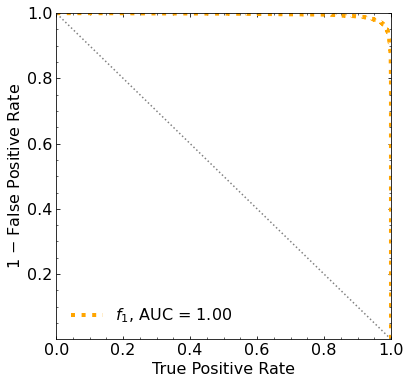

Classification score:


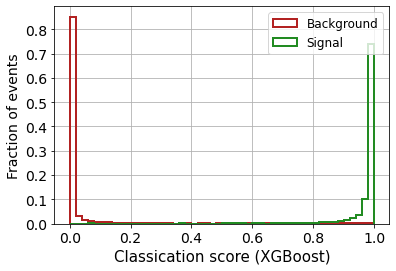


 ROC-AUC =  0.9952099682458472
At least 5 B events per bin, range = [[0, 1]]:
# bins:  8 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  8
range of our data:  [[0, 1]]
number of bins we are going to use:  8
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8415


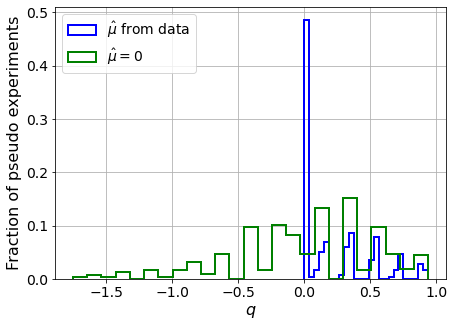

muhat mean:  0.4384085899407637
Z_bins:  0.3306111957348101
std Z_bins:  0.4098812356040482
Z_bins mu=0:  0.3306111957348101
std Z_bins mu=0:  0.8061840271978199

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.833


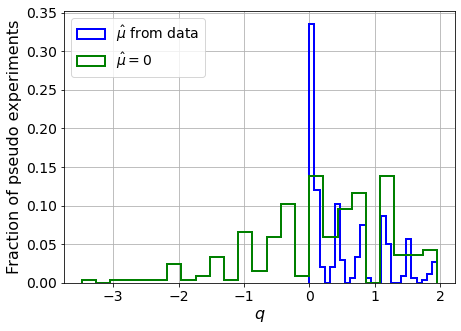

muhat mean:  0.14884117049574333
Z_bins:  0.633863122986647
std Z_bins:  0.45300624145919044
Z_bins mu=0:  0.633863122986647
std Z_bins mu=0:  0.7812611094712824

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8495


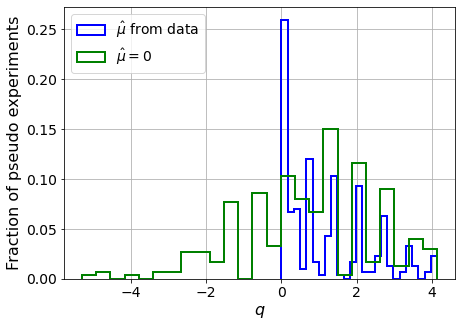

muhat mean:  0.1688829243588859
Z_bins:  0.8987472945589108
std Z_bins:  0.6392402001522033
Z_bins mu=0:  0.8781294133662659
std Z_bins mu=0:  0.9999032611059094

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8275


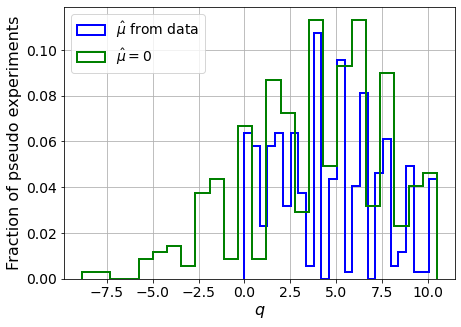

muhat mean:  0.07854171471496273
Z_bins:  2.0265187491253176
std Z_bins:  0.7081934458020984
Z_bins mu=0:  2.0188003973164697
std Z_bins mu=0:  0.9382898663950701

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.837


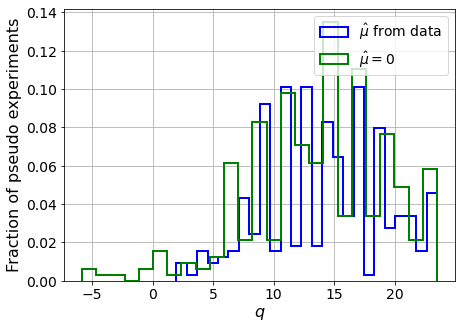

muhat mean:  0.012663635381865632
Z_bins:  3.807405033829203
std Z_bins:  0.6381442979270088
Z_bins mu=0:  3.807405033829203
std Z_bins mu=0:  0.7368484450927727

--------

B_expected:  643
S_expected:  40

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.836


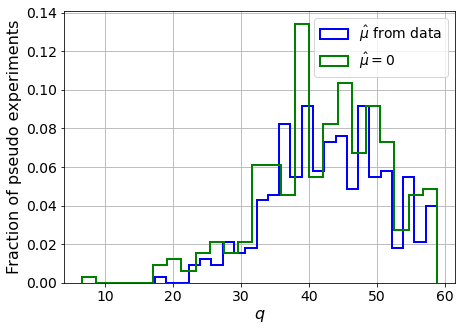

muhat mean:  0.013889759300104117
Z_bins:  6.526592056264266
std Z_bins:  0.6272264851156091
Z_bins mu=0:  6.523923536197084
std Z_bins mu=0:  0.6940155462695792

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.85


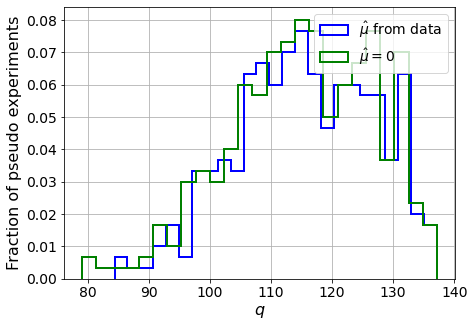

muhat mean:  0.0019464925245552198
Z_bins:  10.74420893369342
std Z_bins:  0.5186588737733385
Z_bins mu=0:  10.74420893369342
std Z_bins mu=0:  0.547805976332227

--------

B_expected:  643
S_expected:  184

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8375


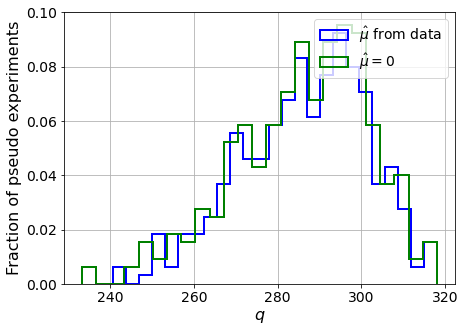

muhat mean:  0.0025762290818957304
Z_bins:  16.965939809335353
std Z_bins:  0.4468320366042181
Z_bins mu=0:  16.965939809335353
std Z_bins mu=0:  0.4692590676394391

--------

B_expected:  643
S_expected:  396

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.8465


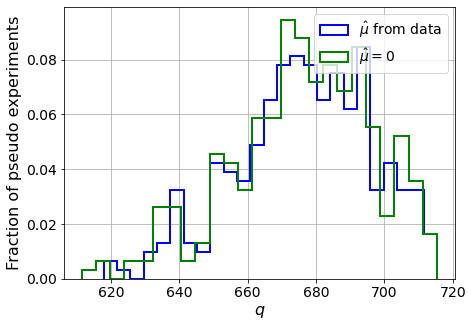

muhat mean:  0.0008401545612965014
Z_bins:  26.022084734197843
std Z_bins:  0.3789181793313661
Z_bins mu=0:  26.022084734197843
std Z_bins mu=0:  0.3929505279730551

--------

B_expected:  643
S_expected:  854

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.838


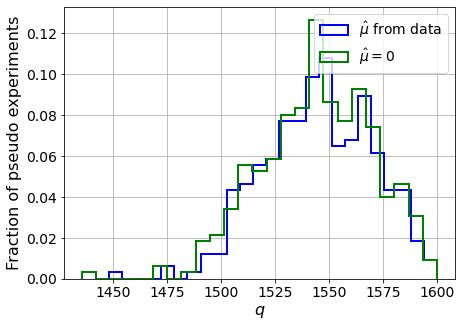

muhat mean:  0.0004934451000709979
Z_bins:  39.31196670519239
std Z_bins:  0.31889479447153385
Z_bins mu=0:  39.31145214243383
std Z_bins mu=0:  0.32899222801572453

--------


 FINAL RESULT:

[[0.3306111957348101, 0.4098812356040482, 0.4384085899407637, 0.3306111957348101, 0.8061840271978199], [0.633863122986647, 0.45300624145919044, 0.14884117049574333, 0.633863122986647, 0.7812611094712824], [0.8987472945589108, 0.6392402001522033, 0.1688829243588859, 0.8781294133662659, 0.9999032611059094], [2.0265187491253176, 0.7081934458020984, 0.07854171471496273, 2.0188003973164697, 0.9382898663950701], [3.807405033829203, 0.6381442979270088, 0.012663635381865632, 3.807405033829203, 0.7368484450927727], [6.526592056264266, 0.6272264851156091, 0.013889759300104117, 6.523923536197084, 0.6940155462695792], [10.74420893369342, 0.5186588737733385, 0.0019464925245552198, 10.74420893369342, 0.547805976332227], [16.965939809335353, 0.4468320366042181, 0.0025762290818957304, 16.965939809335353, 0.46925

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf 396.36442101 319.17110687
 241.32895623 161.00589001  76.33552654  -9.80284582 -89.52721391]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 315.84223885
 247

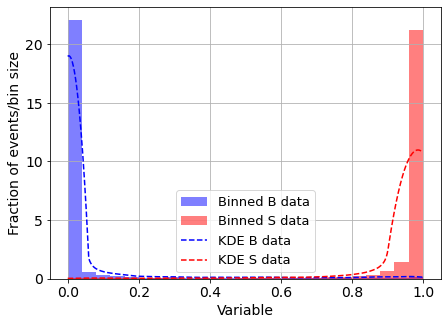

KDE Kernel:  epanechnikov
Background bandwidth:  0.059027261020128646
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



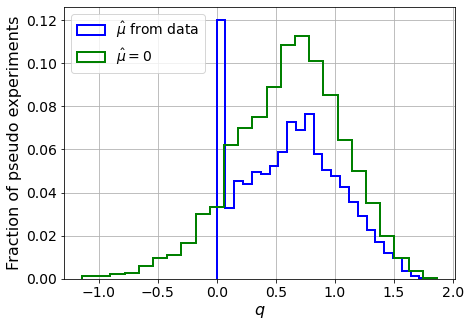

muhat mean:  -3.7835415442087257
Z_bins:  0.803181723997926
std Z_bins:  0.25370297113243073
Z_bins mu=0:  0.803181723997926
std Z_bins mu=0:  0.2868951321997677

--------

B_expected:  643
S_expected:  2



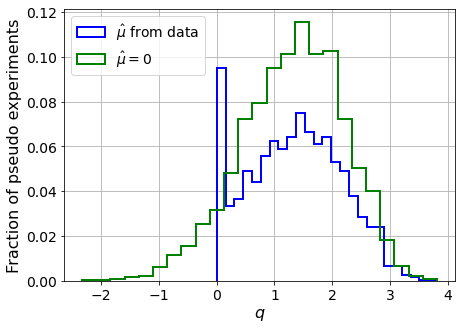

muhat mean:  -2.1218382527188067
Z_bins:  1.1728052210637827
std Z_bins:  0.34266719968779596
Z_bins mu=0:  1.1728052210637827
std Z_bins mu=0:  0.3769618051820787

--------

B_expected:  643
S_expected:  4



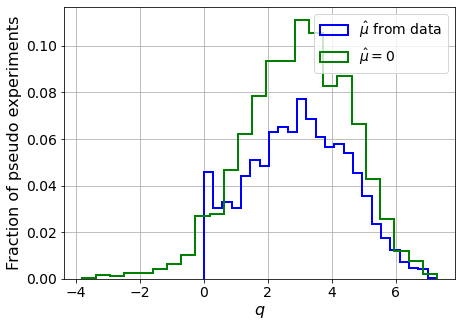

muhat mean:  -1.153717313863448
Z_bins:  1.7348648135644333
std Z_bins:  0.4452793475562736
Z_bins mu=0:  1.7348648135644333
std Z_bins mu=0:  0.4761002880430539

--------

B_expected:  643
S_expected:  9



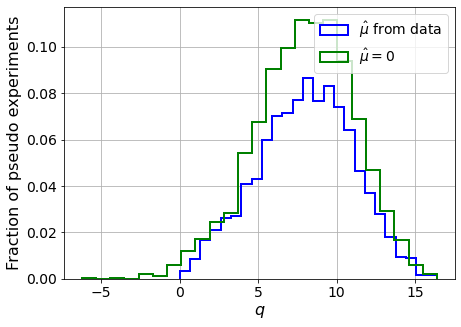

muhat mean:  -0.4392582547793778
Z_bins:  2.843060368431673
std Z_bins:  0.5323218253863828
Z_bins mu=0:  2.843060368431673
std Z_bins mu=0:  0.552740932476718

--------

B_expected:  643
S_expected:  18



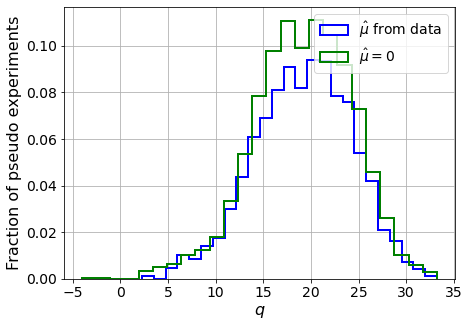

muhat mean:  -0.21223333045956358
Z_bins:  4.407333335491058
std Z_bins:  0.5715934824141559
Z_bins mu=0:  4.407333335491058
std Z_bins mu=0:  0.5872717868911718

--------

B_expected:  643
S_expected:  40



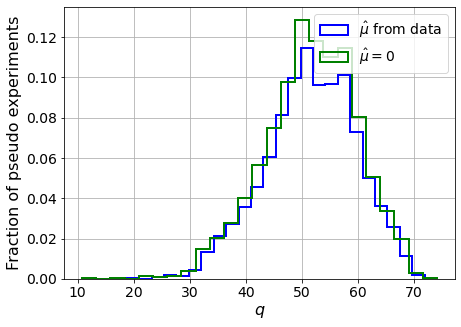

muhat mean:  -0.0947239195181021
Z_bins:  7.2039860406932235
std Z_bins:  0.5671883860804362
Z_bins mu=0:  7.2039860406932235
std Z_bins mu=0:  0.576608144803241

--------

B_expected:  643
S_expected:  85



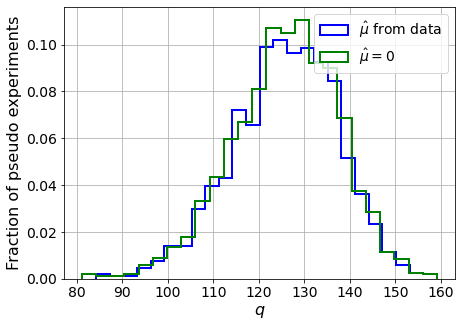

muhat mean:  -0.04458662850816594
Z_bins:  11.242930572835858
std Z_bins:  0.5144434707119964
Z_bins mu=0:  11.242930572835858
std Z_bins mu=0:  0.5197844156630868

--------

B_expected:  643
S_expected:  184



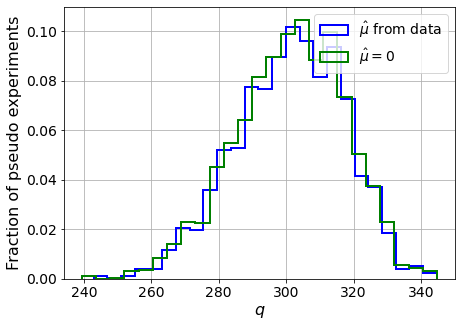

muhat mean:  -0.01998492657485027
Z_bins:  17.380378500578175
std Z_bins:  0.46179862789959036
Z_bins mu=0:  17.380378500578175
std Z_bins mu=0:  0.4648254911829426

--------

B_expected:  643
S_expected:  396



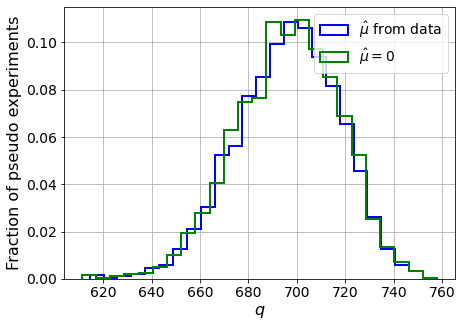

muhat mean:  -0.010144940539980838
Z_bins:  26.408554351557456
std Z_bins:  0.39902482856594834
Z_bins mu=0:  26.408554351557456
std Z_bins mu=0:  0.4011721955127567

--------

B_expected:  643
S_expected:  854



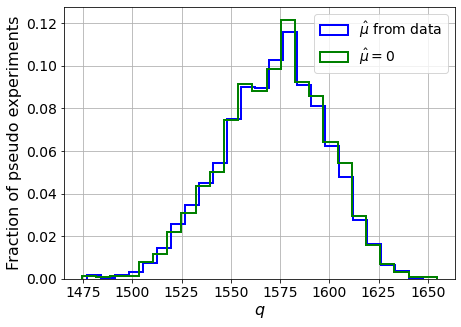

muhat mean:  -0.00468556203985352
Z_bins:  39.66714960793844
std Z_bins:  0.33496177800546045
Z_bins mu=0:  39.66714960793844
std Z_bins mu=0:  0.3362297712756746

--------


 FINAL RESULT:

[[0.803181723997926, 0.25370297113243073, -3.7835415442087257, 0.803181723997926, 0.2868951321997677], [1.1728052210637827, 0.34266719968779596, -2.1218382527188067, 1.1728052210637827, 0.3769618051820787], [1.7348648135644333, 0.4452793475562736, -1.153717313863448, 1.7348648135644333, 0.4761002880430539], [2.843060368431673, 0.5323218253863828, -0.4392582547793778, 2.843060368431673, 0.552740932476718], [4.407333335491058, 0.5715934824141559, -0.21223333045956358, 4.407333335491058, 0.5872717868911718], [7.2039860406932235, 0.5671883860804362, -0.0947239195181021, 7.2039860406932235, 0.576608144803241], [11.242930572835858, 0.5144434707119964, -0.04458662850816594, 11.242930572835858, 0.5197844156630868], [17.380378500578175, 0.46179862789959036, -0.01998492657485027, 17.380378500578175, 0.464825

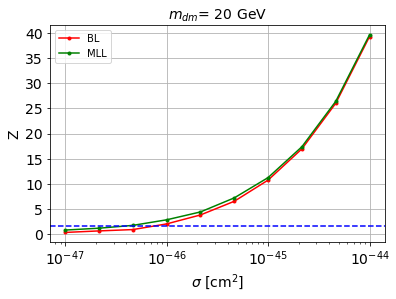


cross_BL_164:  8.079790745383682e-47
cross_BL_164_up:  5.085818375237289e-47
cross_BL_164_down:  1.1715918479219033e-46

cross_MLL_164:  4.231249891229255e-47
cross_MLL_164_up:  2.566400575841552e-47
cross_MLL_164_down:  6.334801970497797e-47

#########################


#########################

mDM =  35 GeV


S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)
 NUM_DAT:  29071 

NUM_DAT_ER:  28699
NUM_DAT_AC:  102
NUM_DAT_CNNS:  1
NUM_DAT_RN:  27
NUM_DAT_WALL:  242

B_pbot.shape:  (29071,)
B_ptop.shape:  (29071,)
B_ppeakS1.shape : (29071, 8)
B_ppeakS2.shape:  (29071, 8)

S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)


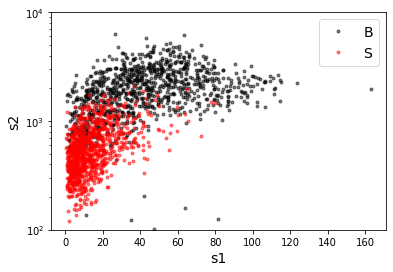

B_pdiffT.shape:  (29071,)
S_pdiffT.shape:  (29071,)


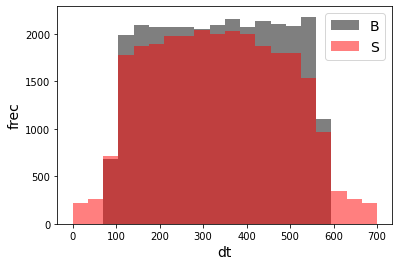

B_pbot.shape:  (29071,)
B_ptop.shape:  (29071,)
B_ppeakS1.shape : (29071, 7)
B_ppeakS2.shape:  (29071, 7)
S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 7)
S_ppeakS2.shape:  (29071, 7)
X_mon_B.shape:  (29071, 15)
X_mon_S.shape:  (29071, 15)
X_mon.shape:  (58142, 15)

X_mon_train :  (37065, 15)
y_mon_train :  (37065,)
X_mon_val :  (6541, 15)
y_mon_val :  (6541,)
X_mon_test :  (14536, 15)
y_mon_test :  (14536,)

[0]	validation_0-logloss:0.68570	validation_1-logloss:0.68571
[1]	validation_0-logloss:0.67842	validation_1-logloss:0.67841
[2]	validation_0-logloss:0.67127	validation_1-logloss:0.67127
[3]	validation_0-logloss:0.66423	validation_1-logloss:0.66419
[4]	validation_0-logloss:0.65731	validation_1-logloss:0.65726
[5]	validation_0-logloss:0.65057	validation_1-logloss:0.65050
[6]	validation_0-logloss:0.64391	validation_1-logloss:0.64379
[7]	validation_0-logloss:0.63737	validation_1-logloss:0.63725
[8]	validation_0-logloss:0.63100	validation_1-logloss:0.63086
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.60654	validation_1-logloss:0.60631
[13]	validation_0-logloss:0.60070	validation_1-logloss:0.60047
[14]	validation_0-logloss:0.59498	validation_1-logloss:0.59475
[15]	validation_0-logloss:0.58934	validation_1-logloss:0.58910
[16]	validation_0-logloss:0.58383	validation_1-logloss:0.58358
[17]	validation_0-logloss:0.57837	validation_1-logloss:0.57812
[18]	validation_0-logloss:0.57305	validation_1-logloss:0.57282
[19]	validation_0-logloss:0.56777	validation_1-logloss:0.56753
[20]	validation_0-logloss:0.56263	validation_1-logloss:0.56237
[21]	validation_0-logloss:0.55752	validation_1-logloss:0.55728
[22]	validation_0-logloss:0.55255	validation_1-logloss:0.55232
[23]	validation_0-logloss:0.54761	validation_1-logloss:0.54736
[24]	validation_0-logloss:0.54280	validation_1-logloss:0.54255
[25]	validation_0-logloss:0.53800	validation_1-logloss:0.53774
[26]	validation_0-logloss:0.53335	validation_1-logloss:0.53311
[27]	validation_0-logloss:0.52868	validation_1-logloss:

[142]	validation_0-logloss:0.26531	validation_1-logloss:0.26607
[143]	validation_0-logloss:0.26429	validation_1-logloss:0.26505
[144]	validation_0-logloss:0.26325	validation_1-logloss:0.26403
[145]	validation_0-logloss:0.26222	validation_1-logloss:0.26304
[146]	validation_0-logloss:0.26126	validation_1-logloss:0.26207
[147]	validation_0-logloss:0.26026	validation_1-logloss:0.26106
[148]	validation_0-logloss:0.25932	validation_1-logloss:0.26012
[149]	validation_0-logloss:0.25838	validation_1-logloss:0.25918
[150]	validation_0-logloss:0.25740	validation_1-logloss:0.25824
[151]	validation_0-logloss:0.25649	validation_1-logloss:0.25733
[152]	validation_0-logloss:0.25561	validation_1-logloss:0.25645
[153]	validation_0-logloss:0.25466	validation_1-logloss:0.25553
[154]	validation_0-logloss:0.25372	validation_1-logloss:0.25464
[155]	validation_0-logloss:0.25285	validation_1-logloss:0.25378
[156]	validation_0-logloss:0.25195	validation_1-logloss:0.25291
[157]	validation_0-logloss:0.25102	valid

[399]	validation_0-logloss:0.16615	validation_1-logloss:0.17232
[400]	validation_0-logloss:0.16606	validation_1-logloss:0.17225
[401]	validation_0-logloss:0.16597	validation_1-logloss:0.17218
[402]	validation_0-logloss:0.16589	validation_1-logloss:0.17211
[403]	validation_0-logloss:0.16580	validation_1-logloss:0.17204
[404]	validation_0-logloss:0.16570	validation_1-logloss:0.17195
[405]	validation_0-logloss:0.16556	validation_1-logloss:0.17184
[406]	validation_0-logloss:0.16548	validation_1-logloss:0.17177
[407]	validation_0-logloss:0.16540	validation_1-logloss:0.17170
[408]	validation_0-logloss:0.16532	validation_1-logloss:0.17164
[409]	validation_0-logloss:0.16524	validation_1-logloss:0.17157
[410]	validation_0-logloss:0.16517	validation_1-logloss:0.17151
[411]	validation_0-logloss:0.16504	validation_1-logloss:0.17141
[412]	validation_0-logloss:0.16495	validation_1-logloss:0.17133
[413]	validation_0-logloss:0.16487	validation_1-logloss:0.17125
[414]	validation_0-logloss:0.16476	valid

[528]	validation_0-logloss:0.15463	validation_1-logloss:0.16286
[529]	validation_0-logloss:0.15458	validation_1-logloss:0.16283
[530]	validation_0-logloss:0.15452	validation_1-logloss:0.16280
[531]	validation_0-logloss:0.15448	validation_1-logloss:0.16277
[532]	validation_0-logloss:0.15443	validation_1-logloss:0.16274
[533]	validation_0-logloss:0.15438	validation_1-logloss:0.16270
[534]	validation_0-logloss:0.15433	validation_1-logloss:0.16266
[535]	validation_0-logloss:0.15429	validation_1-logloss:0.16263
[536]	validation_0-logloss:0.15424	validation_1-logloss:0.16261
[537]	validation_0-logloss:0.15419	validation_1-logloss:0.16257
[538]	validation_0-logloss:0.15414	validation_1-logloss:0.16253
[539]	validation_0-logloss:0.15408	validation_1-logloss:0.16249
[540]	validation_0-logloss:0.15402	validation_1-logloss:0.16243
[541]	validation_0-logloss:0.15398	validation_1-logloss:0.16241
[542]	validation_0-logloss:0.15391	validation_1-logloss:0.16237
[543]	validation_0-logloss:0.15385	valid

[785]	validation_0-logloss:0.14295	validation_1-logloss:0.15574
[786]	validation_0-logloss:0.14292	validation_1-logloss:0.15573
[787]	validation_0-logloss:0.14290	validation_1-logloss:0.15573
[788]	validation_0-logloss:0.14284	validation_1-logloss:0.15570
[789]	validation_0-logloss:0.14280	validation_1-logloss:0.15568
[790]	validation_0-logloss:0.14275	validation_1-logloss:0.15566
[791]	validation_0-logloss:0.14272	validation_1-logloss:0.15565
[792]	validation_0-logloss:0.14269	validation_1-logloss:0.15564
[793]	validation_0-logloss:0.14267	validation_1-logloss:0.15563
[794]	validation_0-logloss:0.14264	validation_1-logloss:0.15561
[795]	validation_0-logloss:0.14261	validation_1-logloss:0.15559
[796]	validation_0-logloss:0.14258	validation_1-logloss:0.15557
[797]	validation_0-logloss:0.14254	validation_1-logloss:0.15556
[798]	validation_0-logloss:0.14251	validation_1-logloss:0.15555
[799]	validation_0-logloss:0.14247	validation_1-logloss:0.15554
[800]	validation_0-logloss:0.14244	valid

[914]	validation_0-logloss:0.13929	validation_1-logloss:0.15438
[915]	validation_0-logloss:0.13927	validation_1-logloss:0.15438
[916]	validation_0-logloss:0.13924	validation_1-logloss:0.15437
[917]	validation_0-logloss:0.13922	validation_1-logloss:0.15435
[918]	validation_0-logloss:0.13919	validation_1-logloss:0.15434
[919]	validation_0-logloss:0.13917	validation_1-logloss:0.15433
[920]	validation_0-logloss:0.13916	validation_1-logloss:0.15432
[921]	validation_0-logloss:0.13912	validation_1-logloss:0.15431
[922]	validation_0-logloss:0.13909	validation_1-logloss:0.15430
[923]	validation_0-logloss:0.13906	validation_1-logloss:0.15430
[924]	validation_0-logloss:0.13904	validation_1-logloss:0.15428
[925]	validation_0-logloss:0.13902	validation_1-logloss:0.15428
[926]	validation_0-logloss:0.13901	validation_1-logloss:0.15427
[927]	validation_0-logloss:0.13897	validation_1-logloss:0.15425
[928]	validation_0-logloss:0.13895	validation_1-logloss:0.15425
[929]	validation_0-logloss:0.13892	valid

[1042]	validation_0-logloss:0.13600	validation_1-logloss:0.15332
[1043]	validation_0-logloss:0.13599	validation_1-logloss:0.15331
[1044]	validation_0-logloss:0.13597	validation_1-logloss:0.15330
[1045]	validation_0-logloss:0.13594	validation_1-logloss:0.15329
[1046]	validation_0-logloss:0.13592	validation_1-logloss:0.15329
[1047]	validation_0-logloss:0.13589	validation_1-logloss:0.15327
[1048]	validation_0-logloss:0.13586	validation_1-logloss:0.15328
[1049]	validation_0-logloss:0.13585	validation_1-logloss:0.15326
[1050]	validation_0-logloss:0.13580	validation_1-logloss:0.15324
[1051]	validation_0-logloss:0.13579	validation_1-logloss:0.15324
[1052]	validation_0-logloss:0.13577	validation_1-logloss:0.15324
[1053]	validation_0-logloss:0.13575	validation_1-logloss:0.15324
[1054]	validation_0-logloss:0.13573	validation_1-logloss:0.15324
[1055]	validation_0-logloss:0.13570	validation_1-logloss:0.15321
[1056]	validation_0-logloss:0.13568	validation_1-logloss:0.15322
[1057]	validation_0-loglo

[1169]	validation_0-logloss:0.13315	validation_1-logloss:0.15271
[1170]	validation_0-logloss:0.13314	validation_1-logloss:0.15271
[1171]	validation_0-logloss:0.13311	validation_1-logloss:0.15270
[1172]	validation_0-logloss:0.13311	validation_1-logloss:0.15270
[1173]	validation_0-logloss:0.13310	validation_1-logloss:0.15270
[1174]	validation_0-logloss:0.13306	validation_1-logloss:0.15269
[1175]	validation_0-logloss:0.13305	validation_1-logloss:0.15269
[1176]	validation_0-logloss:0.13302	validation_1-logloss:0.15268
[1177]	validation_0-logloss:0.13301	validation_1-logloss:0.15269
[1178]	validation_0-logloss:0.13299	validation_1-logloss:0.15269
[1179]	validation_0-logloss:0.13296	validation_1-logloss:0.15268
[1180]	validation_0-logloss:0.13295	validation_1-logloss:0.15268
[1181]	validation_0-logloss:0.13292	validation_1-logloss:0.15268
[1182]	validation_0-logloss:0.13292	validation_1-logloss:0.15267
[1183]	validation_0-logloss:0.13290	validation_1-logloss:0.15268
[1184]	validation_0-loglo

[1296]	validation_0-logloss:0.13052	validation_1-logloss:0.15225
[1297]	validation_0-logloss:0.13049	validation_1-logloss:0.15224
[1298]	validation_0-logloss:0.13047	validation_1-logloss:0.15223
[1299]	validation_0-logloss:0.13044	validation_1-logloss:0.15222
[1300]	validation_0-logloss:0.13042	validation_1-logloss:0.15222
[1301]	validation_0-logloss:0.13038	validation_1-logloss:0.15223
[1302]	validation_0-logloss:0.13037	validation_1-logloss:0.15224
[1303]	validation_0-logloss:0.13036	validation_1-logloss:0.15223
[1304]	validation_0-logloss:0.13032	validation_1-logloss:0.15224
[1305]	validation_0-logloss:0.13031	validation_1-logloss:0.15224
[1306]	validation_0-logloss:0.13029	validation_1-logloss:0.15223
[1307]	validation_0-logloss:0.13028	validation_1-logloss:0.15223
[1308]	validation_0-logloss:0.13025	validation_1-logloss:0.15224
[1309]	validation_0-logloss:0.13023	validation_1-logloss:0.15223
[1310]	validation_0-logloss:0.13021	validation_1-logloss:0.15222
[1311]	validation_0-loglo

[1423]	validation_0-logloss:0.12771	validation_1-logloss:0.15183
[1424]	validation_0-logloss:0.12770	validation_1-logloss:0.15183
[1425]	validation_0-logloss:0.12768	validation_1-logloss:0.15183
[1426]	validation_0-logloss:0.12767	validation_1-logloss:0.15183
[1427]	validation_0-logloss:0.12764	validation_1-logloss:0.15182
[1428]	validation_0-logloss:0.12762	validation_1-logloss:0.15184
[1429]	validation_0-logloss:0.12760	validation_1-logloss:0.15184
[1430]	validation_0-logloss:0.12759	validation_1-logloss:0.15183
[1431]	validation_0-logloss:0.12758	validation_1-logloss:0.15183
[1432]	validation_0-logloss:0.12756	validation_1-logloss:0.15182
[1433]	validation_0-logloss:0.12754	validation_1-logloss:0.15181
[1434]	validation_0-logloss:0.12751	validation_1-logloss:0.15181
[1435]	validation_0-logloss:0.12750	validation_1-logloss:0.15182
[1436]	validation_0-logloss:0.12748	validation_1-logloss:0.15181
[1437]	validation_0-logloss:0.12746	validation_1-logloss:0.15180
[1438]	validation_0-loglo

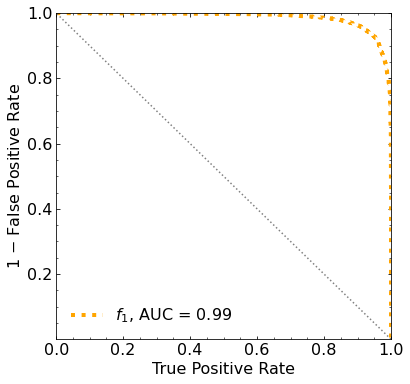

Classification score:


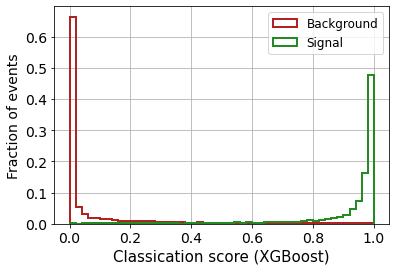


 ROC-AUC =  0.9857107328319251
At least 5 B events per bin, range = [[0, 1]]:
# bins:  14 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  14
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.296


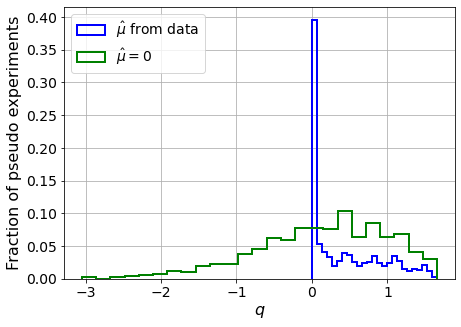

muhat mean:  0.23744966768196607
Z_bins:  0.46717796548207835
std Z_bins:  0.5144787728478035
Z_bins mu=0:  0.463894261818381
std Z_bins mu=0:  0.9340272998719934

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.273


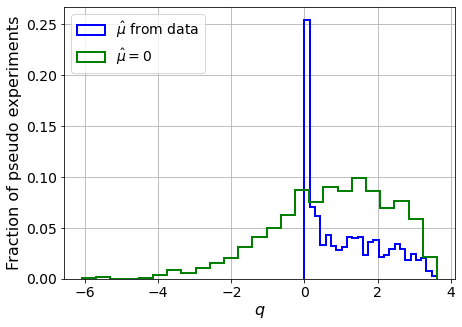

muhat mean:  0.10173904595006984
Z_bins:  0.9450581133157235
std Z_bins:  0.5510669940065385
Z_bins mu=0:  0.9441046014241979
std Z_bins mu=0:  0.8457044859433438

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2775


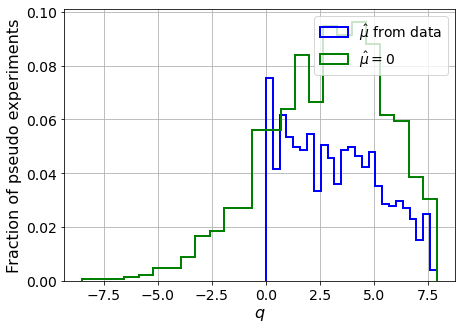

muhat mean:  0.061359853944097924
Z_bins:  1.752770772803794
std Z_bins:  0.5991545554934412
Z_bins mu=0:  1.75127329546461
std Z_bins mu=0:  0.7931295497912348

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.271


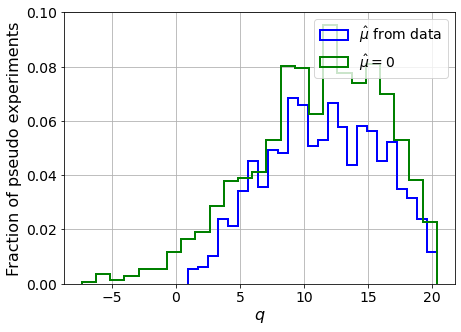

muhat mean:  0.029944972629541263
Z_bins:  3.409330193496887
std Z_bins:  0.6397007803027327
Z_bins mu=0:  3.408243351767586
std Z_bins mu=0:  0.7537186799469497

--------

B_expected:  643
S_expected:  39

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.273


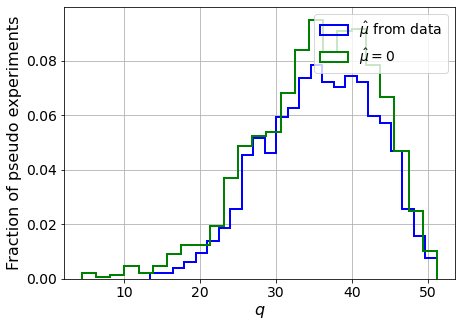

muhat mean:  0.011981086954857365
Z_bins:  6.009757441348069
std Z_bins:  0.5993339836499268
Z_bins mu=0:  6.009226777093221
std Z_bins mu=0:  0.664133459392076

--------

B_expected:  643
S_expected:  83

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2825


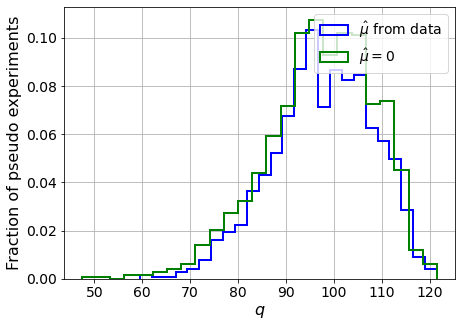

muhat mean:  0.004648009038193511
Z_bins:  9.894165364611068
std Z_bins:  0.5287476560460895
Z_bins mu=0:  9.89199166031524
std Z_bins mu=0:  0.5649102474843825

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.276


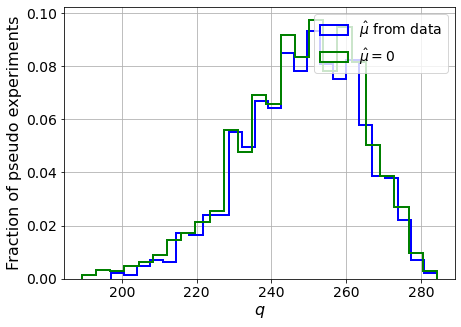

muhat mean:  0.003983431559561697
Z_bins:  15.789716615322693
std Z_bins:  0.48912341797437053
Z_bins mu=0:  15.787645322360367
std Z_bins mu=0:  0.5159834840694787

--------

B_expected:  643
S_expected:  385

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2685


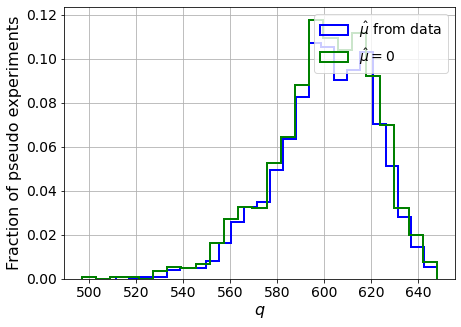

muhat mean:  0.0015408016116362682
Z_bins:  24.540017211195693
std Z_bins:  0.4257834951983551
Z_bins mu=0:  24.537053736997986
std Z_bins mu=0:  0.44371269643957717

--------

B_expected:  643
S_expected:  830

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.2605


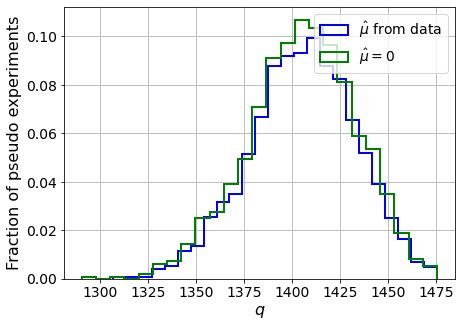

muhat mean:  0.0005542805318814241
Z_bins:  37.5041177868415
std Z_bins:  0.36549403811116593
Z_bins mu=0:  37.50191236168807
std Z_bins mu=0:  0.37399778329576483

--------

B_expected:  643
S_expected:  1787

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.283


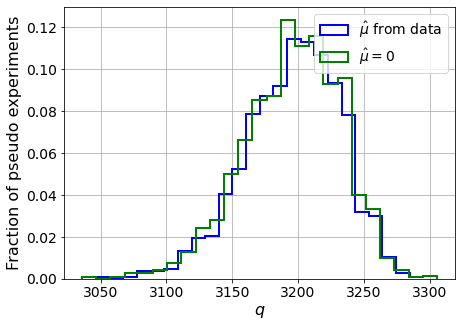

muhat mean:  0.0003654172151187236
Z_bins:  56.55343085967269
std Z_bins:  0.32029686884526004
Z_bins mu=0:  56.55151998105159
std Z_bins mu=0:  0.32627930720633025

--------


 FINAL RESULT:

[[0.46717796548207835, 0.5144787728478035, 0.23744966768196607, 0.463894261818381, 0.9340272998719934], [0.9450581133157235, 0.5510669940065385, 0.10173904595006984, 0.9441046014241979, 0.8457044859433438], [1.752770772803794, 0.5991545554934412, 0.061359853944097924, 1.75127329546461, 0.7931295497912348], [3.409330193496887, 0.6397007803027327, 0.029944972629541263, 3.408243351767586, 0.7537186799469497], [6.009757441348069, 0.5993339836499268, 0.011981086954857365, 6.009226777093221, 0.664133459392076], [9.894165364611068, 0.5287476560460895, 0.004648009038193511, 9.89199166031524, 0.5649102474843825], [15.789716615322693, 0.48912341797437053, 0.003983431559561697, 15.787645322360367, 0.5159834840694787], [24.540017211195693, 0.4257834951983551, 0.0015408016116362682, 24.537053736997986, 0.4437

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 345.35511708 293.06007221 237.4089174
 176.81289448 113.90976963  48.78354148 -18.10591291 -93.09063291]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 290.86230983 256.81408972 217.94813335
 169.

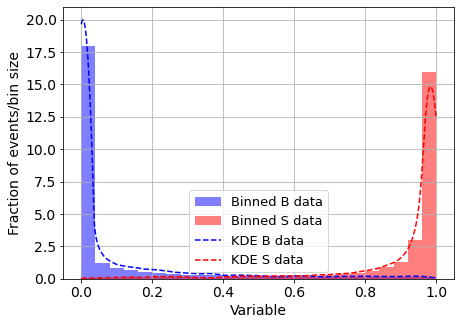

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



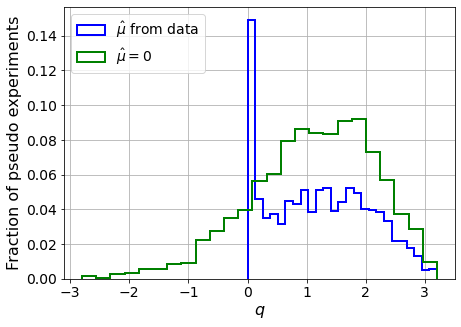

muhat mean:  -2.801464608372319
Z_bins:  1.1033922587350236
std Z_bins:  0.3863228569360937
Z_bins mu=0:  1.1033922587350236
std Z_bins mu=0:  0.47056235534076474

--------

B_expected:  643
S_expected:  4



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


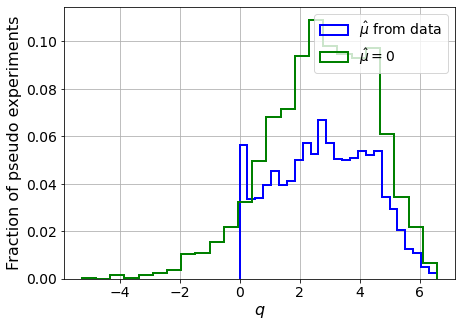

muhat mean:  -1.5804200873430796
Z_bins:  1.6768461690504433
std Z_bins:  0.4662229295003588
Z_bins mu=0:  1.6768461690504433
std Z_bins mu=0:  0.5282436711127583

--------

B_expected:  643
S_expected:  8



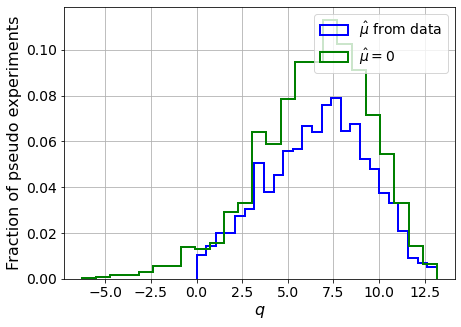

muhat mean:  -0.7447716020789797
Z_bins:  2.6167646044364803
std Z_bins:  0.5280361617476848
Z_bins mu=0:  2.6167646044364803
std Z_bins mu=0:  0.5798588541853444

--------

B_expected:  643
S_expected:  18



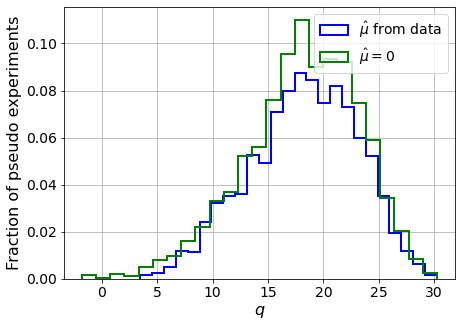

muhat mean:  -0.3433508980352483
Z_bins:  4.298557931995417
std Z_bins:  0.5651096825746283
Z_bins mu=0:  4.298557931995417
std Z_bins mu=0:  0.5947281564877257

--------

B_expected:  643
S_expected:  39



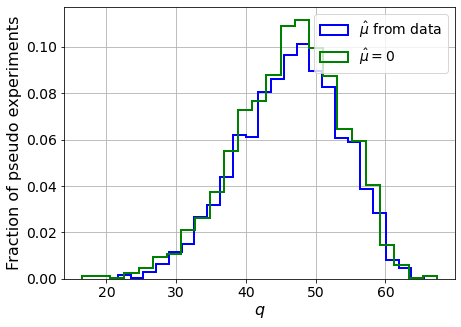

muhat mean:  -0.1470280666641793
Z_bins:  6.83665635984708
std Z_bins:  0.5370211612725004
Z_bins mu=0:  6.83665635984708
std Z_bins mu=0:  0.5542506472568312

--------

B_expected:  643
S_expected:  83



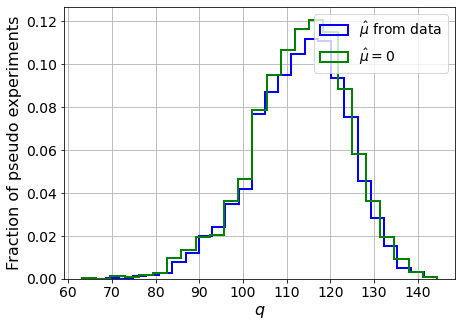

muhat mean:  -0.06859662735171755
Z_bins:  10.671641442365198
std Z_bins:  0.5078610079690753
Z_bins mu=0:  10.671223860669487
std Z_bins mu=0:  0.5204405345150676

--------

B_expected:  643
S_expected:  179



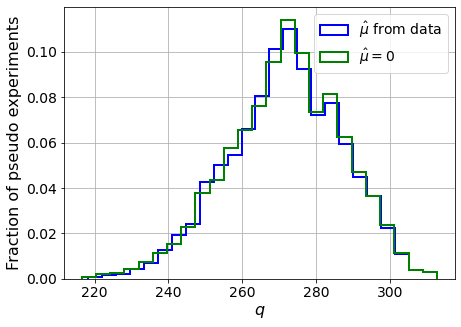

muhat mean:  -0.038159961718792476
Z_bins:  16.495784872400648
std Z_bins:  0.46869418112197825
Z_bins mu=0:  16.495471186061533
std Z_bins mu=0:  0.47545374343862207

--------

B_expected:  643
S_expected:  385



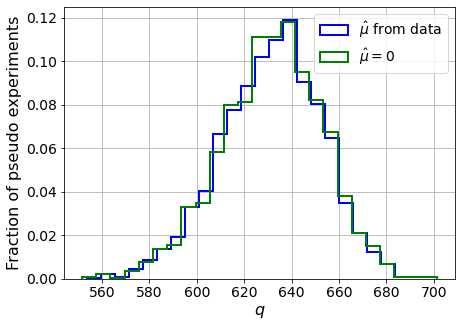

muhat mean:  -0.016553979644622536
Z_bins:  25.15212589925814
std Z_bins:  0.42062632740981254
Z_bins mu=0:  25.151194073537972
std Z_bins mu=0:  0.42497671386648006

--------

B_expected:  643
S_expected:  830



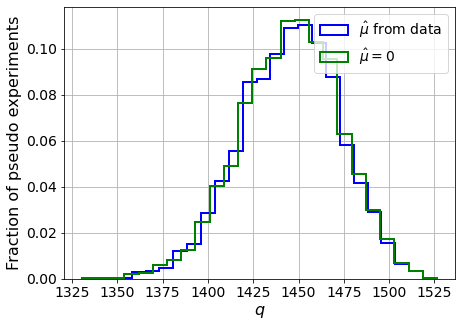

muhat mean:  -0.007417355521698305
Z_bins:  38.035546665876325
std Z_bins:  0.3592356591432657
Z_bins mu=0:  38.0354986238702
std Z_bins mu=0:  0.36174587130193353

--------

B_expected:  643
S_expected:  1787



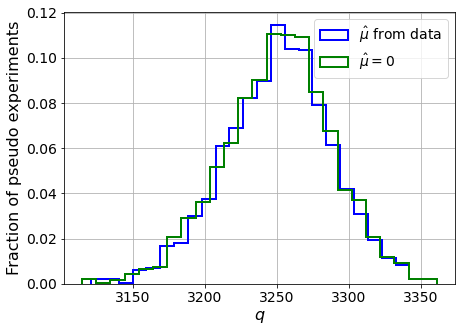

muhat mean:  -0.003410958912082816
Z_bins:  57.02947234751084
std Z_bins:  0.3264343703097432
Z_bins mu=0:  57.0293186413428
std Z_bins mu=0:  0.328043409579578

--------


 FINAL RESULT:

[[1.1033922587350236, 0.3863228569360937, -2.801464608372319, 1.1033922587350236, 0.47056235534076474], [1.6768461690504433, 0.4662229295003588, -1.5804200873430796, 1.6768461690504433, 0.5282436711127583], [2.6167646044364803, 0.5280361617476848, -0.7447716020789797, 2.6167646044364803, 0.5798588541853444], [4.298557931995417, 0.5651096825746283, -0.3433508980352483, 4.298557931995417, 0.5947281564877257], [6.83665635984708, 0.5370211612725004, -0.1470280666641793, 6.83665635984708, 0.5542506472568312], [10.671641442365198, 0.5078610079690753, -0.06859662735171755, 10.671223860669487, 0.5204405345150676], [16.495784872400648, 0.46869418112197825, -0.038159961718792476, 16.495471186061533, 0.47545374343862207], [25.15212589925814, 0.42062632740981254, -0.016553979644622536, 25.151194073537972, 0.4249

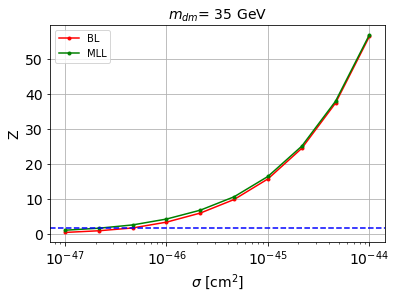


cross_BL_164:  4.303600888065348e-47
cross_BL_164_up:  2.540926392040751e-47
cross_BL_164_down:  6.167816645930637e-47

cross_MLL_164:  2.0711696708636303e-47
cross_MLL_164_up:  1.2334668198614158e-47
cross_MLL_164_down:  3.344667985052694e-47

#########################


#########################

mDM =  50 GeV


S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)
 NUM_DAT:  31106 

NUM_DAT_ER:  30709
NUM_DAT_AC:  109
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  258

B_pbot.shape:  (31106,)
B_ptop.shape:  (31106,)
B_ppeakS1.shape : (31106, 8)
B_ppeakS2.shape:  (31106, 8)

S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)


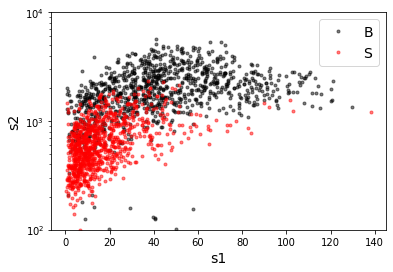

B_pdiffT.shape:  (31106,)
S_pdiffT.shape:  (31106,)


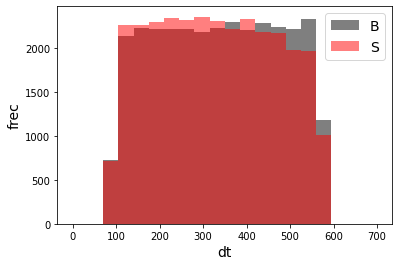

B_pbot.shape:  (31106,)
B_ptop.shape:  (31106,)
B_ppeakS1.shape : (31106, 7)
B_ppeakS2.shape:  (31106, 7)
S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 7)
S_ppeakS2.shape:  (31106, 7)
X_mon_B.shape:  (31106, 15)
X_mon_S.shape:  (31106, 15)
X_mon.shape:  (62212, 15)

X_mon_train :  (39660, 15)
y_mon_train :  (39660,)
X_mon_val :  (6999, 15)
y_mon_val :  (6999,)
X_mon_test :  (15553, 15)
y_mon_test :  (15553,)

[0]	validation_0-logloss:0.68589	validation_1-logloss:0.68589
[1]	validation_0-logloss:0.67879	validation_1-logloss:0.67877
[2]	validation_0-logloss:0.67181	validation_1-logloss:0.67178
[3]	validation_0-logloss:0.66498	validation_1-logloss:0.66493
[4]	validation_0-logloss:0.65827	validation_1-logloss:0.65821
[5]	validation_0-logloss:0.65170	validation_1-logloss:0.65162
[6]	validation_0-logloss:0.64526	validation_1-logloss:0.64514
[7]	validation_0-logloss:0.63892	validation_1-logloss:0.63881
[8]	validation_0-logloss:0.63271	validation_1-logloss:0.63258
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.60894	validation_1-logloss:0.60879
[13]	validation_0-logloss:0.60326	validation_1-logloss:0.60310
[14]	validation_0-logloss:0.59768	validation_1-logloss:0.59751
[15]	validation_0-logloss:0.59218	validation_1-logloss:0.59198
[16]	validation_0-logloss:0.58679	validation_1-logloss:0.58659
[17]	validation_0-logloss:0.58151	validation_1-logloss:0.58130
[18]	validation_0-logloss:0.57625	validation_1-logloss:0.57603
[19]	validation_0-logloss:0.57114	validation_1-logloss:0.57089
[20]	validation_0-logloss:0.56608	validation_1-logloss:0.56582
[21]	validation_0-logloss:0.56113	validation_1-logloss:0.56085
[22]	validation_0-logloss:0.55625	validation_1-logloss:0.55598
[23]	validation_0-logloss:0.55147	validation_1-logloss:0.55118
[24]	validation_0-logloss:0.54673	validation_1-logloss:0.54639
[25]	validation_0-logloss:0.54208	validation_1-logloss:0.54174
[26]	validation_0-logloss:0.53749	validation_1-logloss:0.53713
[27]	validation_0-logloss:0.53300	validation_1-logloss:

[270]	validation_0-logloss:0.18612	validation_1-logloss:0.18624
[271]	validation_0-logloss:0.18578	validation_1-logloss:0.18593
[272]	validation_0-logloss:0.18545	validation_1-logloss:0.18561
[273]	validation_0-logloss:0.18512	validation_1-logloss:0.18529
[274]	validation_0-logloss:0.18479	validation_1-logloss:0.18499
[275]	validation_0-logloss:0.18447	validation_1-logloss:0.18469
[276]	validation_0-logloss:0.18416	validation_1-logloss:0.18442
[277]	validation_0-logloss:0.18385	validation_1-logloss:0.18412
[278]	validation_0-logloss:0.18350	validation_1-logloss:0.18378
[279]	validation_0-logloss:0.18319	validation_1-logloss:0.18350
[280]	validation_0-logloss:0.18290	validation_1-logloss:0.18322
[281]	validation_0-logloss:0.18257	validation_1-logloss:0.18292
[282]	validation_0-logloss:0.18223	validation_1-logloss:0.18260
[283]	validation_0-logloss:0.18191	validation_1-logloss:0.18228
[284]	validation_0-logloss:0.18160	validation_1-logloss:0.18197
[285]	validation_0-logloss:0.18130	valid

[399]	validation_0-logloss:0.15774	validation_1-logloss:0.16001
[400]	validation_0-logloss:0.15760	validation_1-logloss:0.15987
[401]	validation_0-logloss:0.15748	validation_1-logloss:0.15978
[402]	validation_0-logloss:0.15734	validation_1-logloss:0.15967
[403]	validation_0-logloss:0.15719	validation_1-logloss:0.15953
[404]	validation_0-logloss:0.15706	validation_1-logloss:0.15943
[405]	validation_0-logloss:0.15692	validation_1-logloss:0.15931
[406]	validation_0-logloss:0.15679	validation_1-logloss:0.15919
[407]	validation_0-logloss:0.15666	validation_1-logloss:0.15909
[408]	validation_0-logloss:0.15651	validation_1-logloss:0.15896
[409]	validation_0-logloss:0.15638	validation_1-logloss:0.15886
[410]	validation_0-logloss:0.15625	validation_1-logloss:0.15874
[411]	validation_0-logloss:0.15613	validation_1-logloss:0.15864
[412]	validation_0-logloss:0.15600	validation_1-logloss:0.15852
[413]	validation_0-logloss:0.15585	validation_1-logloss:0.15839
[414]	validation_0-logloss:0.15574	valid

[528]	validation_0-logloss:0.14432	validation_1-logloss:0.14910
[529]	validation_0-logloss:0.14425	validation_1-logloss:0.14904
[530]	validation_0-logloss:0.14416	validation_1-logloss:0.14897
[531]	validation_0-logloss:0.14407	validation_1-logloss:0.14890
[532]	validation_0-logloss:0.14399	validation_1-logloss:0.14884
[533]	validation_0-logloss:0.14390	validation_1-logloss:0.14875
[534]	validation_0-logloss:0.14381	validation_1-logloss:0.14868
[535]	validation_0-logloss:0.14374	validation_1-logloss:0.14861
[536]	validation_0-logloss:0.14369	validation_1-logloss:0.14859
[537]	validation_0-logloss:0.14362	validation_1-logloss:0.14854
[538]	validation_0-logloss:0.14353	validation_1-logloss:0.14847
[539]	validation_0-logloss:0.14344	validation_1-logloss:0.14842
[540]	validation_0-logloss:0.14336	validation_1-logloss:0.14836
[541]	validation_0-logloss:0.14329	validation_1-logloss:0.14831
[542]	validation_0-logloss:0.14320	validation_1-logloss:0.14825
[543]	validation_0-logloss:0.14312	valid

[657]	validation_0-logloss:0.13654	validation_1-logloss:0.14390
[658]	validation_0-logloss:0.13649	validation_1-logloss:0.14387
[659]	validation_0-logloss:0.13644	validation_1-logloss:0.14385
[660]	validation_0-logloss:0.13639	validation_1-logloss:0.14383
[661]	validation_0-logloss:0.13635	validation_1-logloss:0.14381
[662]	validation_0-logloss:0.13631	validation_1-logloss:0.14378
[663]	validation_0-logloss:0.13626	validation_1-logloss:0.14374
[664]	validation_0-logloss:0.13620	validation_1-logloss:0.14372
[665]	validation_0-logloss:0.13615	validation_1-logloss:0.14369
[666]	validation_0-logloss:0.13611	validation_1-logloss:0.14367
[667]	validation_0-logloss:0.13606	validation_1-logloss:0.14365
[668]	validation_0-logloss:0.13600	validation_1-logloss:0.14362
[669]	validation_0-logloss:0.13596	validation_1-logloss:0.14360
[670]	validation_0-logloss:0.13591	validation_1-logloss:0.14358
[671]	validation_0-logloss:0.13587	validation_1-logloss:0.14356
[672]	validation_0-logloss:0.13582	valid

[786]	validation_0-logloss:0.13136	validation_1-logloss:0.14124
[787]	validation_0-logloss:0.13133	validation_1-logloss:0.14124
[788]	validation_0-logloss:0.13129	validation_1-logloss:0.14122
[789]	validation_0-logloss:0.13126	validation_1-logloss:0.14120
[790]	validation_0-logloss:0.13124	validation_1-logloss:0.14119
[791]	validation_0-logloss:0.13120	validation_1-logloss:0.14118
[792]	validation_0-logloss:0.13118	validation_1-logloss:0.14117
[793]	validation_0-logloss:0.13114	validation_1-logloss:0.14115
[794]	validation_0-logloss:0.13111	validation_1-logloss:0.14114
[795]	validation_0-logloss:0.13108	validation_1-logloss:0.14112
[796]	validation_0-logloss:0.13106	validation_1-logloss:0.14110
[797]	validation_0-logloss:0.13103	validation_1-logloss:0.14109
[798]	validation_0-logloss:0.13100	validation_1-logloss:0.14108
[799]	validation_0-logloss:0.13096	validation_1-logloss:0.14107
[800]	validation_0-logloss:0.13094	validation_1-logloss:0.14106
[801]	validation_0-logloss:0.13090	valid

[915]	validation_0-logloss:0.12765	validation_1-logloss:0.13971
[916]	validation_0-logloss:0.12763	validation_1-logloss:0.13970
[917]	validation_0-logloss:0.12759	validation_1-logloss:0.13968
[918]	validation_0-logloss:0.12757	validation_1-logloss:0.13967
[919]	validation_0-logloss:0.12754	validation_1-logloss:0.13966
[920]	validation_0-logloss:0.12752	validation_1-logloss:0.13964
[921]	validation_0-logloss:0.12750	validation_1-logloss:0.13964
[922]	validation_0-logloss:0.12747	validation_1-logloss:0.13964
[923]	validation_0-logloss:0.12744	validation_1-logloss:0.13962
[924]	validation_0-logloss:0.12740	validation_1-logloss:0.13961
[925]	validation_0-logloss:0.12738	validation_1-logloss:0.13960
[926]	validation_0-logloss:0.12735	validation_1-logloss:0.13958
[927]	validation_0-logloss:0.12732	validation_1-logloss:0.13958
[928]	validation_0-logloss:0.12730	validation_1-logloss:0.13958
[929]	validation_0-logloss:0.12727	validation_1-logloss:0.13958
[930]	validation_0-logloss:0.12725	valid

[1043]	validation_0-logloss:0.12435	validation_1-logloss:0.13876
[1044]	validation_0-logloss:0.12431	validation_1-logloss:0.13877
[1045]	validation_0-logloss:0.12429	validation_1-logloss:0.13875
[1046]	validation_0-logloss:0.12427	validation_1-logloss:0.13874
[1047]	validation_0-logloss:0.12425	validation_1-logloss:0.13875
[1048]	validation_0-logloss:0.12421	validation_1-logloss:0.13874
[1049]	validation_0-logloss:0.12419	validation_1-logloss:0.13874
[1050]	validation_0-logloss:0.12418	validation_1-logloss:0.13874
[1051]	validation_0-logloss:0.12416	validation_1-logloss:0.13874
[1052]	validation_0-logloss:0.12412	validation_1-logloss:0.13874
[1053]	validation_0-logloss:0.12410	validation_1-logloss:0.13873
[1054]	validation_0-logloss:0.12407	validation_1-logloss:0.13874
[1055]	validation_0-logloss:0.12405	validation_1-logloss:0.13873
[1056]	validation_0-logloss:0.12402	validation_1-logloss:0.13872
[1057]	validation_0-logloss:0.12401	validation_1-logloss:0.13872
[1058]	validation_0-loglo

[1170]	validation_0-logloss:0.12161	validation_1-logloss:0.13829
[1171]	validation_0-logloss:0.12159	validation_1-logloss:0.13828
[1172]	validation_0-logloss:0.12158	validation_1-logloss:0.13828
[1173]	validation_0-logloss:0.12156	validation_1-logloss:0.13827
[1174]	validation_0-logloss:0.12153	validation_1-logloss:0.13827
[1175]	validation_0-logloss:0.12152	validation_1-logloss:0.13827
[1176]	validation_0-logloss:0.12150	validation_1-logloss:0.13827
[1177]	validation_0-logloss:0.12148	validation_1-logloss:0.13826
[1178]	validation_0-logloss:0.12146	validation_1-logloss:0.13825
[1179]	validation_0-logloss:0.12143	validation_1-logloss:0.13824
[1180]	validation_0-logloss:0.12142	validation_1-logloss:0.13824
[1181]	validation_0-logloss:0.12140	validation_1-logloss:0.13824
[1182]	validation_0-logloss:0.12139	validation_1-logloss:0.13824
[1183]	validation_0-logloss:0.12137	validation_1-logloss:0.13824
[1184]	validation_0-logloss:0.12134	validation_1-logloss:0.13823
[1185]	validation_0-loglo

[1297]	validation_0-logloss:0.11896	validation_1-logloss:0.13778
[1298]	validation_0-logloss:0.11895	validation_1-logloss:0.13777
[1299]	validation_0-logloss:0.11893	validation_1-logloss:0.13777
[1300]	validation_0-logloss:0.11891	validation_1-logloss:0.13777
[1301]	validation_0-logloss:0.11888	validation_1-logloss:0.13776
[1302]	validation_0-logloss:0.11885	validation_1-logloss:0.13775
[1303]	validation_0-logloss:0.11883	validation_1-logloss:0.13773
[1304]	validation_0-logloss:0.11882	validation_1-logloss:0.13773
[1305]	validation_0-logloss:0.11879	validation_1-logloss:0.13773
[1306]	validation_0-logloss:0.11877	validation_1-logloss:0.13772
[1307]	validation_0-logloss:0.11876	validation_1-logloss:0.13772
[1308]	validation_0-logloss:0.11874	validation_1-logloss:0.13771
[1309]	validation_0-logloss:0.11872	validation_1-logloss:0.13771
[1310]	validation_0-logloss:0.11870	validation_1-logloss:0.13770
[1311]	validation_0-logloss:0.11868	validation_1-logloss:0.13769
[1312]	validation_0-loglo

[1550]	validation_0-logloss:0.11452	validation_1-logloss:0.13713
[1551]	validation_0-logloss:0.11449	validation_1-logloss:0.13712
[1552]	validation_0-logloss:0.11446	validation_1-logloss:0.13712
[1553]	validation_0-logloss:0.11445	validation_1-logloss:0.13713
[1554]	validation_0-logloss:0.11443	validation_1-logloss:0.13712
[1555]	validation_0-logloss:0.11442	validation_1-logloss:0.13712
[1556]	validation_0-logloss:0.11441	validation_1-logloss:0.13712
[1557]	validation_0-logloss:0.11439	validation_1-logloss:0.13711
[1558]	validation_0-logloss:0.11438	validation_1-logloss:0.13711
[1559]	validation_0-logloss:0.11438	validation_1-logloss:0.13711
[1560]	validation_0-logloss:0.11436	validation_1-logloss:0.13711
[1561]	validation_0-logloss:0.11434	validation_1-logloss:0.13709
[1562]	validation_0-logloss:0.11432	validation_1-logloss:0.13709
[1563]	validation_0-logloss:0.11430	validation_1-logloss:0.13710
[1564]	validation_0-logloss:0.11429	validation_1-logloss:0.13710
[1565]	validation_0-loglo

[1803]	validation_0-logloss:0.11066	validation_1-logloss:0.13673
[1804]	validation_0-logloss:0.11064	validation_1-logloss:0.13672
[1805]	validation_0-logloss:0.11062	validation_1-logloss:0.13673
[1806]	validation_0-logloss:0.11060	validation_1-logloss:0.13673
[1807]	validation_0-logloss:0.11060	validation_1-logloss:0.13673
[1808]	validation_0-logloss:0.11059	validation_1-logloss:0.13673
[1809]	validation_0-logloss:0.11056	validation_1-logloss:0.13673
[1810]	validation_0-logloss:0.11056	validation_1-logloss:0.13673
[1811]	validation_0-logloss:0.11054	validation_1-logloss:0.13673
[1812]	validation_0-logloss:0.11053	validation_1-logloss:0.13672
[1813]	validation_0-logloss:0.11051	validation_1-logloss:0.13673
[1814]	validation_0-logloss:0.11048	validation_1-logloss:0.13673
[1815]	validation_0-logloss:0.11046	validation_1-logloss:0.13672
[1816]	validation_0-logloss:0.11044	validation_1-logloss:0.13671
[1817]	validation_0-logloss:0.11042	validation_1-logloss:0.13671
[1818]	validation_0-loglo

[1930]	validation_0-logloss:0.10870	validation_1-logloss:0.13664
[1931]	validation_0-logloss:0.10869	validation_1-logloss:0.13664
[1932]	validation_0-logloss:0.10868	validation_1-logloss:0.13664
[1933]	validation_0-logloss:0.10866	validation_1-logloss:0.13664
[1934]	validation_0-logloss:0.10865	validation_1-logloss:0.13664
[1935]	validation_0-logloss:0.10864	validation_1-logloss:0.13664
[1936]	validation_0-logloss:0.10863	validation_1-logloss:0.13665
[1937]	validation_0-logloss:0.10860	validation_1-logloss:0.13664
[1938]	validation_0-logloss:0.10858	validation_1-logloss:0.13664
[1939]	validation_0-logloss:0.10856	validation_1-logloss:0.13664
[1940]	validation_0-logloss:0.10855	validation_1-logloss:0.13665
[1941]	validation_0-logloss:0.10852	validation_1-logloss:0.13665
[1942]	validation_0-logloss:0.10851	validation_1-logloss:0.13664
[1943]	validation_0-logloss:0.10850	validation_1-logloss:0.13665
[1944]	validation_0-logloss:0.10849	validation_1-logloss:0.13664
[1945]	validation_0-loglo

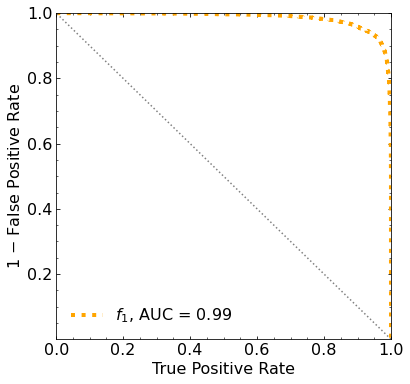

Classification score:


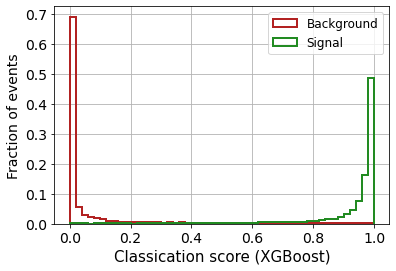


 ROC-AUC =  0.9852129075727594
At least 5 B events per bin, range = [[0, 1]]:
# bins:  13 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  13
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3685


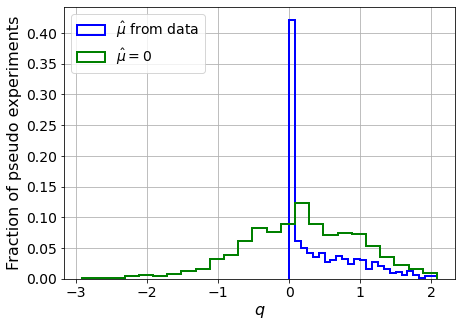

muhat mean:  0.05289193146662426
Z_bins:  0.4399923350686599
std Z_bins:  0.5781060521595923
Z_bins mu=0:  0.4397675568210305
std Z_bins mu=0:  0.9195029187483748

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.362


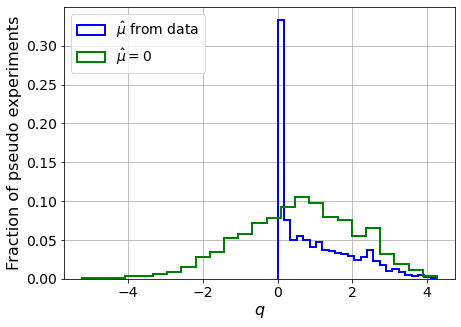

muhat mean:  0.124172088612311
Z_bins:  0.7954633209110973
std Z_bins:  0.6360189598757493
Z_bins mu=0:  0.792179369997948
std Z_bins mu=0:  0.9673324199488786

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.351


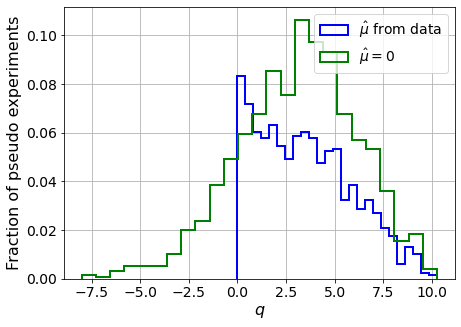

muhat mean:  0.02007463869493319
Z_bins:  1.8173055944622114
std Z_bins:  0.6594475124824026
Z_bins mu=0:  1.8173055944622114
std Z_bins mu=0:  0.8401914107580519

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.344


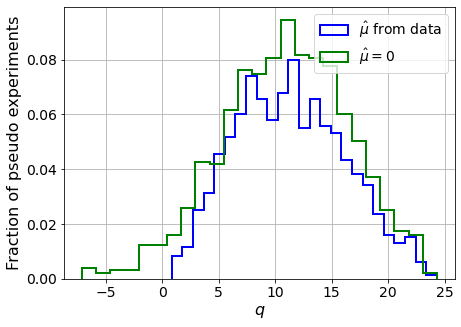

muhat mean:  0.010857693841511246
Z_bins:  3.3442960971277693
std Z_bins:  0.7238735921651436
Z_bins mu=0:  3.344222787575926
std Z_bins mu=0:  0.8310391715013463

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3535


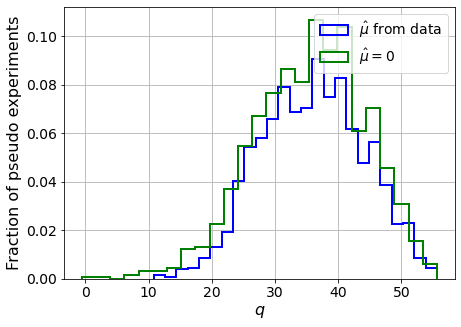

muhat mean:  -0.0004316917634350401
Z_bins:  6.014454408829437
std Z_bins:  0.6696534356840779
Z_bins mu=0:  6.014454408829437
std Z_bins mu=0:  0.7265842364745932

--------

B_expected:  643
S_expected:  89

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3715


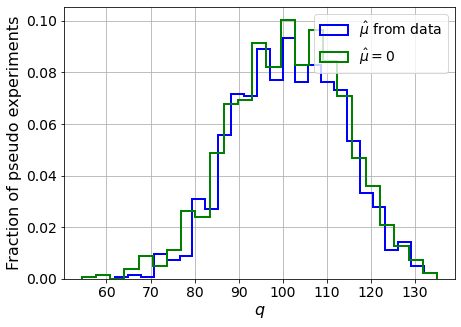

muhat mean:  0.000900218827455144
Z_bins:  10.081423672398282
std Z_bins:  0.6035248401905371
Z_bins mu=0:  10.081423672398282
std Z_bins mu=0:  0.6355323890962651

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3515


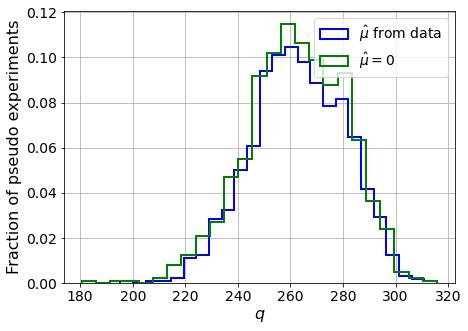

muhat mean:  0.0012646527519850727
Z_bins:  16.213447265810004
std Z_bins:  0.547355197150107
Z_bins mu=0:  16.20980873867555
std Z_bins mu=0:  0.5701622364974607

--------

B_expected:  643
S_expected:  413

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.367


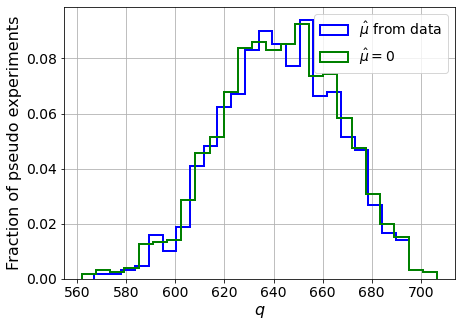

muhat mean:  0.00021488894350731218
Z_bins:  25.361109405542102
std Z_bins:  0.46948549563425723
Z_bins mu=0:  25.358661120976997
std Z_bins mu=0:  0.4824391336504505

--------

B_expected:  643
S_expected:  889

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.3385


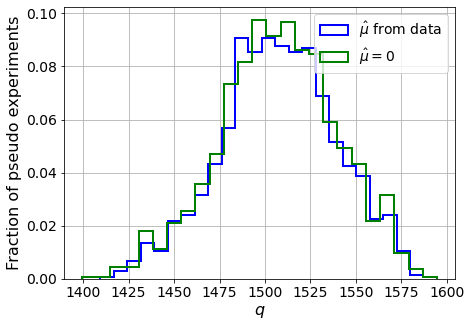

muhat mean:  6.739315340130867e-05
Z_bins:  38.82543410564659
std Z_bins:  0.4098189098218869
Z_bins mu=0:  38.82486178836782
std Z_bins mu=0:  0.41843313072179245

--------

B_expected:  643
S_expected:  1915

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.355


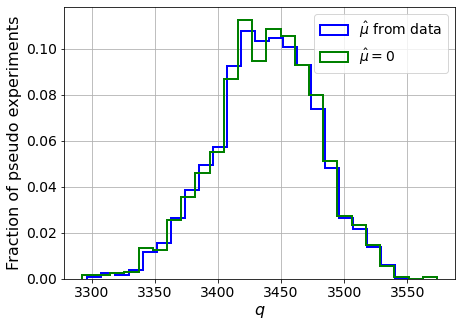

muhat mean:  0.00016474594115212346
Z_bins:  58.64674732674463
std Z_bins:  0.3413503534359155
Z_bins mu=0:  58.64647236822603
std Z_bins mu=0:  0.34703082413131486

--------


 FINAL RESULT:

[[0.4399923350686599, 0.5781060521595923, 0.05289193146662426, 0.4397675568210305, 0.9195029187483748], [0.7954633209110973, 0.6360189598757493, 0.124172088612311, 0.792179369997948, 0.9673324199488786], [1.8173055944622114, 0.6594475124824026, 0.02007463869493319, 1.8173055944622114, 0.8401914107580519], [3.3442960971277693, 0.7238735921651436, 0.010857693841511246, 3.344222787575926, 0.8310391715013463], [6.014454408829437, 0.6696534356840779, -0.0004316917634350401, 6.014454408829437, 0.7265842364745932], [10.081423672398282, 0.6035248401905371, 0.000900218827455144, 10.081423672398282, 0.6355323890962651], [16.213447265810004, 0.547355197150107, 0.0012646527519850727, 16.20980873867555, 0.5701622364974607], [25.361109405542102, 0.46948549563425723, 0.00021488894350731218, 25.358661120976997, 

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 381.89260889 337.50349384 286.36619344 231.65466725
 172.55947591 109.1820456   44.35809455 -28.45509396 -97.26780959]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 311.30554747 279.35467777 235.94813377
 184

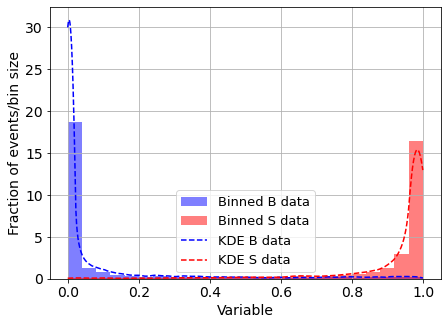

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



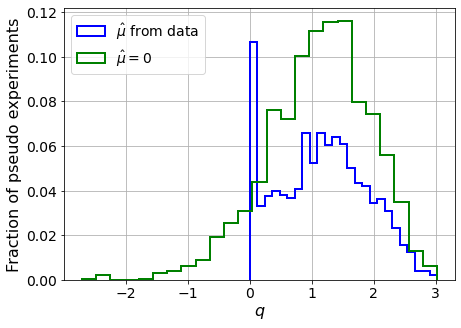

muhat mean:  -2.487259811296212
Z_bins:  1.0870471436864295
std Z_bins:  0.3311505896183989
Z_bins mu=0:  1.0870471436864295
std Z_bins mu=0:  0.3787846290101806

--------

B_expected:  643
S_expected:  4



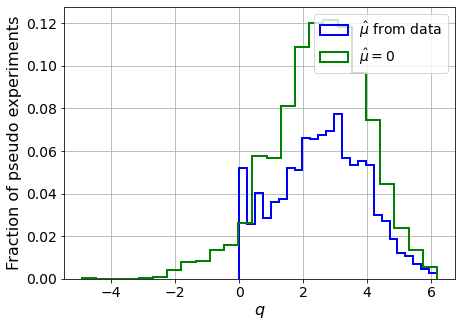

muhat mean:  -1.395129248465139
Z_bins:  1.6209504447888543
std Z_bins:  0.41684930093617434
Z_bins mu=0:  1.6209504447888543
std Z_bins mu=0:  0.4578410400576051

--------

B_expected:  643
S_expected:  9



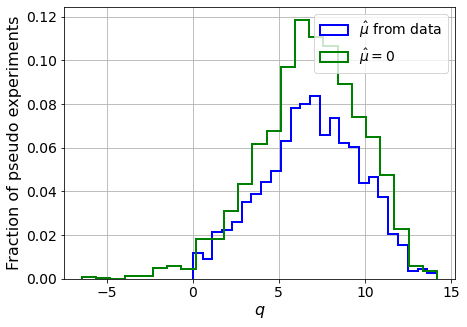

muhat mean:  -0.5904592314391758
Z_bins:  2.62735987845687
std Z_bins:  0.5357952554113964
Z_bins mu=0:  2.62735987845687
std Z_bins mu=0:  0.5690229363625555

--------

B_expected:  643
S_expected:  19



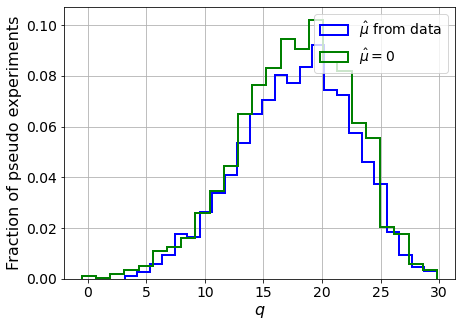

muhat mean:  -0.2708568672383511
Z_bins:  4.246681735255993
std Z_bins:  0.5600190075673893
Z_bins mu=0:  4.246681735255993
std Z_bins mu=0:  0.5752666548625932

--------

B_expected:  643
S_expected:  41



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


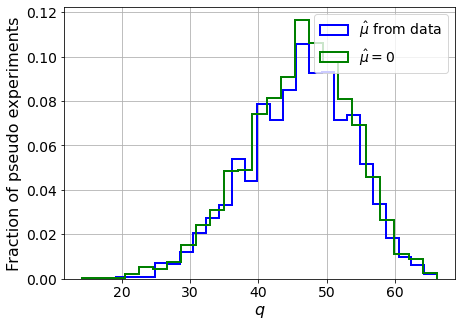

muhat mean:  -0.12981991394198727
Z_bins:  6.823757648141083
std Z_bins:  0.5640620227570169
Z_bins mu=0:  6.823757648141083
std Z_bins mu=0:  0.574379223708064

--------

B_expected:  643
S_expected:  89



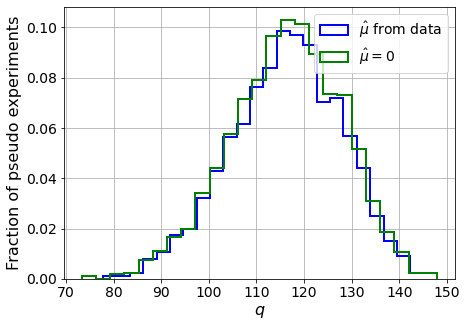

muhat mean:  -0.05654760327352402
Z_bins:  10.794941694716847
std Z_bins:  0.5356647073643319
Z_bins mu=0:  10.794941694716847
std Z_bins mu=0:  0.5416270521423854

--------

B_expected:  643
S_expected:  192



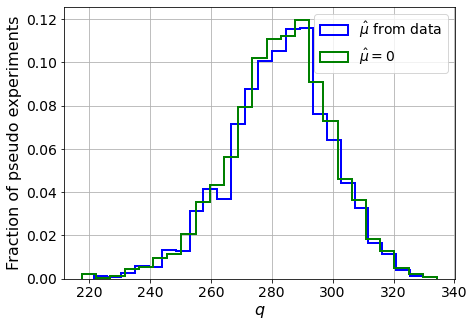

muhat mean:  -0.02707160550472992
Z_bins:  16.846176374915792
std Z_bins:  0.4963679369603802
Z_bins mu=0:  16.846176374915792
std Z_bins mu=0:  0.5012619413754761

--------

B_expected:  643
S_expected:  413



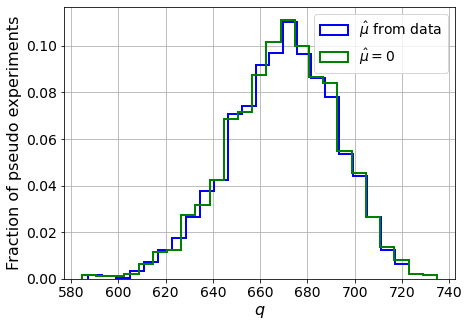

muhat mean:  -0.012166986895201515
Z_bins:  25.90049054942013
std Z_bins:  0.43832157929555854
Z_bins mu=0:  25.90049054942013
std Z_bins mu=0:  0.44077099466657466

--------

B_expected:  643
S_expected:  889



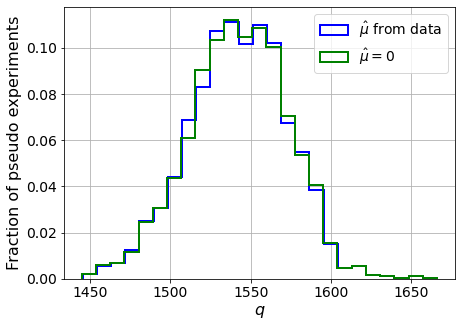

muhat mean:  -0.005937165535345169
Z_bins:  39.27901980436884
std Z_bins:  0.39191620707439095
Z_bins mu=0:  39.27901980436884
std Z_bins mu=0:  0.3929828841388073

--------

B_expected:  643
S_expected:  1915



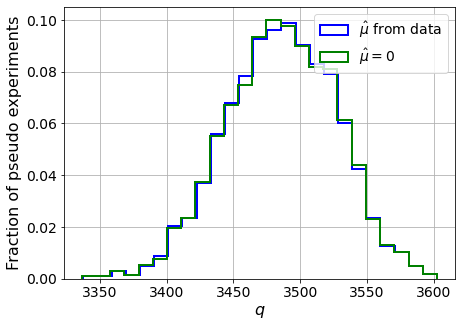

muhat mean:  -0.0031185846810250243
Z_bins:  59.04740008754192
std Z_bins:  0.34930096328441435
Z_bins mu=0:  59.04740008754192
std Z_bins mu=0:  0.3501552858068632

--------


 FINAL RESULT:

[[1.0870471436864295, 0.3311505896183989, -2.487259811296212, 1.0870471436864295, 0.3787846290101806], [1.6209504447888543, 0.41684930093617434, -1.395129248465139, 1.6209504447888543, 0.4578410400576051], [2.62735987845687, 0.5357952554113964, -0.5904592314391758, 2.62735987845687, 0.5690229363625555], [4.246681735255993, 0.5600190075673893, -0.2708568672383511, 4.246681735255993, 0.5752666548625932], [6.823757648141083, 0.5640620227570169, -0.12981991394198727, 6.823757648141083, 0.574379223708064], [10.794941694716847, 0.5356647073643319, -0.05654760327352402, 10.794941694716847, 0.5416270521423854], [16.846176374915792, 0.4963679369603802, -0.02707160550472992, 16.846176374915792, 0.5012619413754761], [25.90049054942013, 0.43832157929555854, -0.012166986895201515, 25.90049054942013, 0.4407709

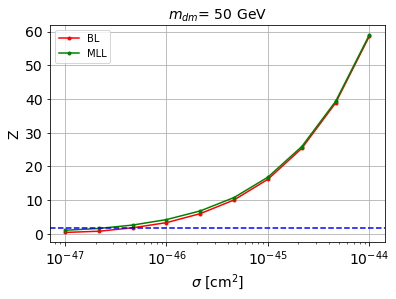


cross_BL_164:  4.1500267313173424e-47
cross_BL_164_up:  2.6148992529012526e-47
cross_BL_164_down:  6.257404743198152e-47

cross_MLL_164:  2.1958442671939466e-47
cross_MLL_164_up:  1.4246368623886192e-47
cross_MLL_164_down:  3.339518198773916e-47

#########################


#########################

mDM =  100 GeV


S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)
 NUM_DAT:  32010 

NUM_DAT_ER:  31600
NUM_DAT_AC:  113
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  266

B_pbot.shape:  (32010,)
B_ptop.shape:  (32010,)
B_ppeakS1.shape : (32010, 8)
B_ppeakS2.shape:  (32010, 8)

S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)


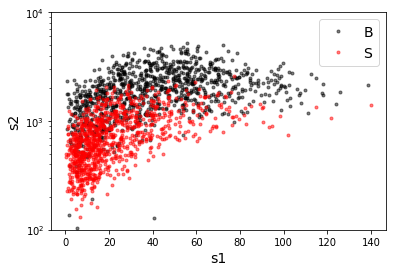

B_pdiffT.shape:  (32010,)
S_pdiffT.shape:  (32010,)


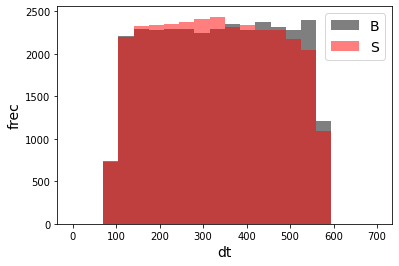

B_pbot.shape:  (32010,)
B_ptop.shape:  (32010,)
B_ppeakS1.shape : (32010, 7)
B_ppeakS2.shape:  (32010, 7)
S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 7)
S_ppeakS2.shape:  (32010, 7)
X_mon_B.shape:  (32010, 15)
X_mon_S.shape:  (32010, 15)
X_mon.shape:  (64020, 15)

X_mon_train :  (40812, 15)
y_mon_train :  (40812,)
X_mon_val :  (7203, 15)
y_mon_val :  (7203,)
X_mon_test :  (16005, 15)
y_mon_test :  (16005,)

[0]	validation_0-logloss:0.68644	validation_1-logloss:0.68653
[1]	validation_0-logloss:0.67987	validation_1-logloss:0.68004
[2]	validation_0-logloss:0.67342	validation_1-logloss:0.67368
[3]	validation_0-logloss:0.66710	validation_1-logloss:0.66745
[4]	validation_0-logloss:0.66085	validation_1-logloss:0.66128
[5]	validation_0-logloss:0.65479	validation_1-logloss:0.65529
[6]	validation_0-logloss:0.64882	validation_1-logloss:0.64938
[7]	validation_0-logloss:0.64296	validation_1-logloss:0.64358
[8]	validation_0-logloss:0.63715	validation_1-logloss:0.63785
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.61513	validation_1-logloss:0.61612
[13]	validation_0-logloss:0.60988	validation_1-logloss:0.61094
[14]	validation_0-logloss:0.60473	validation_1-logloss:0.60586
[15]	validation_0-logloss:0.59958	validation_1-logloss:0.60078
[16]	validation_0-logloss:0.59449	validation_1-logloss:0.59575
[17]	validation_0-logloss:0.58958	validation_1-logloss:0.59092
[18]	validation_0-logloss:0.58465	validation_1-logloss:0.58606
[19]	validation_0-logloss:0.57978	validation_1-logloss:0.58126
[20]	validation_0-logloss:0.57512	validation_1-logloss:0.57668
[21]	validation_0-logloss:0.57042	validation_1-logloss:0.57208
[22]	validation_0-logloss:0.56590	validation_1-logloss:0.56763
[23]	validation_0-logloss:0.56134	validation_1-logloss:0.56316
[24]	validation_0-logloss:0.55698	validation_1-logloss:0.55887
[25]	validation_0-logloss:0.55269	validation_1-logloss:0.55463
[26]	validation_0-logloss:0.54836	validation_1-logloss:0.55037
[27]	validation_0-logloss:0.54410	validation_1-logloss:

[142]	validation_0-logloss:0.29120	validation_1-logloss:0.29918
[143]	validation_0-logloss:0.29007	validation_1-logloss:0.29806
[144]	validation_0-logloss:0.28901	validation_1-logloss:0.29704
[145]	validation_0-logloss:0.28794	validation_1-logloss:0.29599
[146]	validation_0-logloss:0.28690	validation_1-logloss:0.29501
[147]	validation_0-logloss:0.28581	validation_1-logloss:0.29395
[148]	validation_0-logloss:0.28474	validation_1-logloss:0.29290
[149]	validation_0-logloss:0.28373	validation_1-logloss:0.29191
[150]	validation_0-logloss:0.28271	validation_1-logloss:0.29094
[151]	validation_0-logloss:0.28171	validation_1-logloss:0.28998
[152]	validation_0-logloss:0.28075	validation_1-logloss:0.28904
[153]	validation_0-logloss:0.27977	validation_1-logloss:0.28811
[154]	validation_0-logloss:0.27875	validation_1-logloss:0.28711
[155]	validation_0-logloss:0.27783	validation_1-logloss:0.28626
[156]	validation_0-logloss:0.27691	validation_1-logloss:0.28535
[157]	validation_0-logloss:0.27596	valid

[271]	validation_0-logloss:0.20853	validation_1-logloss:0.21941
[272]	validation_0-logloss:0.20817	validation_1-logloss:0.21910
[273]	validation_0-logloss:0.20782	validation_1-logloss:0.21879
[274]	validation_0-logloss:0.20751	validation_1-logloss:0.21847
[275]	validation_0-logloss:0.20717	validation_1-logloss:0.21814
[276]	validation_0-logloss:0.20681	validation_1-logloss:0.21780
[277]	validation_0-logloss:0.20645	validation_1-logloss:0.21748
[278]	validation_0-logloss:0.20613	validation_1-logloss:0.21715
[279]	validation_0-logloss:0.20578	validation_1-logloss:0.21684
[280]	validation_0-logloss:0.20548	validation_1-logloss:0.21657
[281]	validation_0-logloss:0.20512	validation_1-logloss:0.21624
[282]	validation_0-logloss:0.20480	validation_1-logloss:0.21594
[283]	validation_0-logloss:0.20449	validation_1-logloss:0.21563
[284]	validation_0-logloss:0.20418	validation_1-logloss:0.21532
[285]	validation_0-logloss:0.20389	validation_1-logloss:0.21505
[286]	validation_0-logloss:0.20355	valid

[400]	validation_0-logloss:0.17937	validation_1-logloss:0.19276
[401]	validation_0-logloss:0.17922	validation_1-logloss:0.19262
[402]	validation_0-logloss:0.17906	validation_1-logloss:0.19248
[403]	validation_0-logloss:0.17893	validation_1-logloss:0.19237
[404]	validation_0-logloss:0.17877	validation_1-logloss:0.19224
[405]	validation_0-logloss:0.17864	validation_1-logloss:0.19214
[406]	validation_0-logloss:0.17847	validation_1-logloss:0.19197
[407]	validation_0-logloss:0.17833	validation_1-logloss:0.19184
[408]	validation_0-logloss:0.17819	validation_1-logloss:0.19173
[409]	validation_0-logloss:0.17802	validation_1-logloss:0.19158
[410]	validation_0-logloss:0.17786	validation_1-logloss:0.19144
[411]	validation_0-logloss:0.17773	validation_1-logloss:0.19133
[412]	validation_0-logloss:0.17757	validation_1-logloss:0.19120
[413]	validation_0-logloss:0.17745	validation_1-logloss:0.19111
[414]	validation_0-logloss:0.17729	validation_1-logloss:0.19098
[415]	validation_0-logloss:0.17715	valid

[529]	validation_0-logloss:0.16358	validation_1-logloss:0.18031
[530]	validation_0-logloss:0.16349	validation_1-logloss:0.18024
[531]	validation_0-logloss:0.16338	validation_1-logloss:0.18018
[532]	validation_0-logloss:0.16329	validation_1-logloss:0.18012
[533]	validation_0-logloss:0.16321	validation_1-logloss:0.18007
[534]	validation_0-logloss:0.16313	validation_1-logloss:0.18002
[535]	validation_0-logloss:0.16304	validation_1-logloss:0.17997
[536]	validation_0-logloss:0.16297	validation_1-logloss:0.17991
[537]	validation_0-logloss:0.16287	validation_1-logloss:0.17983
[538]	validation_0-logloss:0.16280	validation_1-logloss:0.17977
[539]	validation_0-logloss:0.16270	validation_1-logloss:0.17970
[540]	validation_0-logloss:0.16260	validation_1-logloss:0.17964
[541]	validation_0-logloss:0.16251	validation_1-logloss:0.17956
[542]	validation_0-logloss:0.16242	validation_1-logloss:0.17949
[543]	validation_0-logloss:0.16232	validation_1-logloss:0.17942
[544]	validation_0-logloss:0.16226	valid

[658]	validation_0-logloss:0.15473	validation_1-logloss:0.17486
[659]	validation_0-logloss:0.15468	validation_1-logloss:0.17483
[660]	validation_0-logloss:0.15462	validation_1-logloss:0.17481
[661]	validation_0-logloss:0.15457	validation_1-logloss:0.17479
[662]	validation_0-logloss:0.15453	validation_1-logloss:0.17477
[663]	validation_0-logloss:0.15448	validation_1-logloss:0.17474
[664]	validation_0-logloss:0.15442	validation_1-logloss:0.17472
[665]	validation_0-logloss:0.15437	validation_1-logloss:0.17469
[666]	validation_0-logloss:0.15431	validation_1-logloss:0.17465
[667]	validation_0-logloss:0.15426	validation_1-logloss:0.17461
[668]	validation_0-logloss:0.15420	validation_1-logloss:0.17459
[669]	validation_0-logloss:0.15415	validation_1-logloss:0.17457
[670]	validation_0-logloss:0.15411	validation_1-logloss:0.17456
[671]	validation_0-logloss:0.15405	validation_1-logloss:0.17453
[672]	validation_0-logloss:0.15401	validation_1-logloss:0.17451
[673]	validation_0-logloss:0.15395	valid

[787]	validation_0-logloss:0.14924	validation_1-logloss:0.17275
[788]	validation_0-logloss:0.14922	validation_1-logloss:0.17274
[789]	validation_0-logloss:0.14918	validation_1-logloss:0.17271
[790]	validation_0-logloss:0.14914	validation_1-logloss:0.17271
[791]	validation_0-logloss:0.14910	validation_1-logloss:0.17270
[792]	validation_0-logloss:0.14908	validation_1-logloss:0.17269
[793]	validation_0-logloss:0.14904	validation_1-logloss:0.17269
[794]	validation_0-logloss:0.14900	validation_1-logloss:0.17268
[795]	validation_0-logloss:0.14896	validation_1-logloss:0.17267
[796]	validation_0-logloss:0.14892	validation_1-logloss:0.17267
[797]	validation_0-logloss:0.14889	validation_1-logloss:0.17266
[798]	validation_0-logloss:0.14885	validation_1-logloss:0.17263
[799]	validation_0-logloss:0.14883	validation_1-logloss:0.17263
[800]	validation_0-logloss:0.14878	validation_1-logloss:0.17262
[801]	validation_0-logloss:0.14874	validation_1-logloss:0.17260
[802]	validation_0-logloss:0.14871	valid

[916]	validation_0-logloss:0.14516	validation_1-logloss:0.17174
[917]	validation_0-logloss:0.14513	validation_1-logloss:0.17173
[918]	validation_0-logloss:0.14512	validation_1-logloss:0.17173
[919]	validation_0-logloss:0.14508	validation_1-logloss:0.17172
[920]	validation_0-logloss:0.14505	validation_1-logloss:0.17173
[921]	validation_0-logloss:0.14503	validation_1-logloss:0.17173
[922]	validation_0-logloss:0.14500	validation_1-logloss:0.17173
[923]	validation_0-logloss:0.14497	validation_1-logloss:0.17172
[924]	validation_0-logloss:0.14494	validation_1-logloss:0.17170
[925]	validation_0-logloss:0.14491	validation_1-logloss:0.17169
[926]	validation_0-logloss:0.14488	validation_1-logloss:0.17168
[927]	validation_0-logloss:0.14485	validation_1-logloss:0.17169
[928]	validation_0-logloss:0.14482	validation_1-logloss:0.17169
[929]	validation_0-logloss:0.14479	validation_1-logloss:0.17168
[930]	validation_0-logloss:0.14478	validation_1-logloss:0.17168
[931]	validation_0-logloss:0.14474	valid

[1044]	validation_0-logloss:0.14175	validation_1-logloss:0.17112
[1045]	validation_0-logloss:0.14173	validation_1-logloss:0.17112
[1046]	validation_0-logloss:0.14169	validation_1-logloss:0.17111
[1047]	validation_0-logloss:0.14168	validation_1-logloss:0.17110
[1048]	validation_0-logloss:0.14164	validation_1-logloss:0.17109
[1049]	validation_0-logloss:0.14162	validation_1-logloss:0.17109
[1050]	validation_0-logloss:0.14160	validation_1-logloss:0.17108
[1051]	validation_0-logloss:0.14157	validation_1-logloss:0.17108
[1052]	validation_0-logloss:0.14155	validation_1-logloss:0.17108
[1053]	validation_0-logloss:0.14152	validation_1-logloss:0.17107
[1054]	validation_0-logloss:0.14151	validation_1-logloss:0.17106
[1055]	validation_0-logloss:0.14147	validation_1-logloss:0.17106
[1056]	validation_0-logloss:0.14145	validation_1-logloss:0.17107
[1057]	validation_0-logloss:0.14144	validation_1-logloss:0.17107
[1058]	validation_0-logloss:0.14142	validation_1-logloss:0.17106
[1059]	validation_0-loglo

[1171]	validation_0-logloss:0.13868	validation_1-logloss:0.17079
[1172]	validation_0-logloss:0.13867	validation_1-logloss:0.17079
[1173]	validation_0-logloss:0.13865	validation_1-logloss:0.17079
[1174]	validation_0-logloss:0.13863	validation_1-logloss:0.17078
[1175]	validation_0-logloss:0.13861	validation_1-logloss:0.17078
[1176]	validation_0-logloss:0.13859	validation_1-logloss:0.17079
[1177]	validation_0-logloss:0.13857	validation_1-logloss:0.17078
[1178]	validation_0-logloss:0.13854	validation_1-logloss:0.17078
[1179]	validation_0-logloss:0.13852	validation_1-logloss:0.17078
[1180]	validation_0-logloss:0.13851	validation_1-logloss:0.17078
[1181]	validation_0-logloss:0.13850	validation_1-logloss:0.17078
[1182]	validation_0-logloss:0.13846	validation_1-logloss:0.17078
[1183]	validation_0-logloss:0.13845	validation_1-logloss:0.17078
[1184]	validation_0-logloss:0.13842	validation_1-logloss:0.17078
[1185]	validation_0-logloss:0.13840	validation_1-logloss:0.17078
[1186]	validation_0-loglo

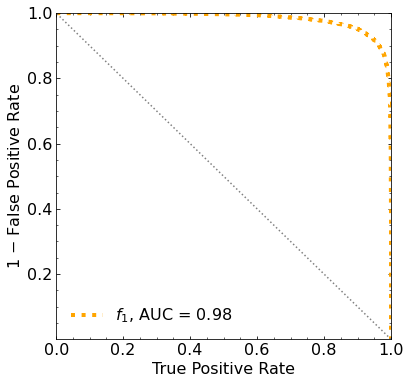

Classification score:


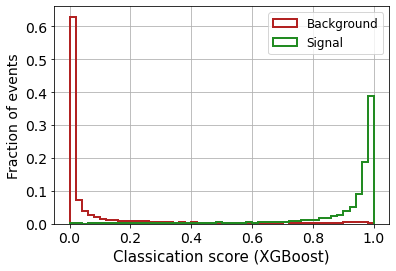


 ROC-AUC =  0.982374229967442
At least 5 B events per bin, range = [[0, 1]]:
# bins:  16 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  16
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1165


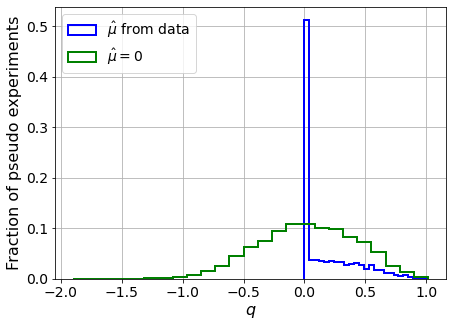

muhat mean:  0.26985463088324757
Z_bins:  0.16304422115440353
std Z_bins:  0.7060747979189578
Z_bins mu=0:  0.15301606430218262
std Z_bins mu=0:  1.312292247839851

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1


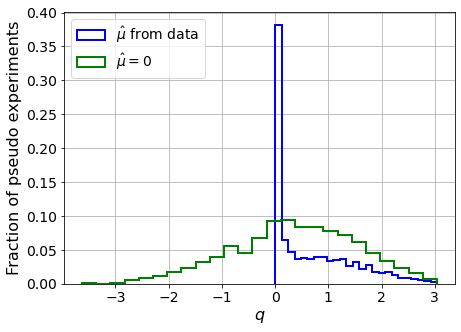

muhat mean:  0.04314470738597124
Z_bins:  0.6191239798551748
std Z_bins:  0.6112538616496558
Z_bins mu=0:  0.6191229406348084
std Z_bins mu=0:  0.9452930133206167

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.104


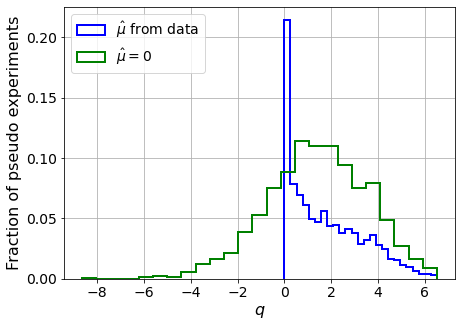

muhat mean:  0.0037430615577487324
Z_bins:  1.2073414806704232
std Z_bins:  0.6537220303934586
Z_bins mu=0:  1.2073414806704232
std Z_bins mu=0:  0.8856566855883422

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.115


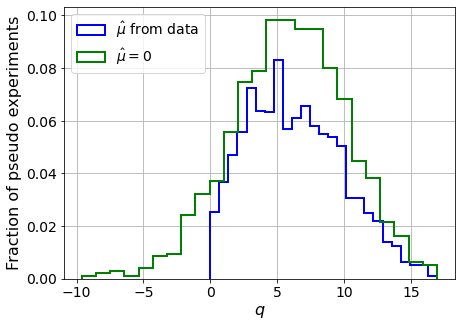

muhat mean:  0.0208471192502911
Z_bins:  2.4502988540270345
std Z_bins:  0.7228468874322757
Z_bins mu=0:  2.449610368603671
std Z_bins mu=0:  0.8656464084285421

--------

B_expected:  643
S_expected:  30

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.114


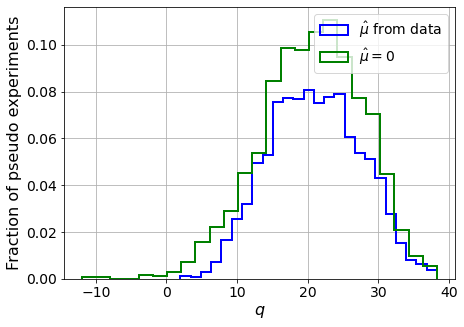

muhat mean:  0.003980847575603389
Z_bins:  4.570608002651844
std Z_bins:  0.7049621217409586
Z_bins mu=0:  4.570608002651844
std Z_bins mu=0:  0.7842506130121302

--------

B_expected:  643
S_expected:  65

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.09


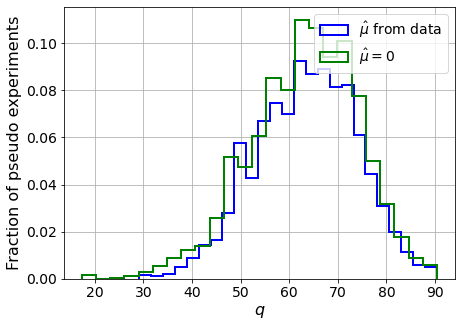

muhat mean:  0.0003733368177684723
Z_bins:  7.993159070880198
std Z_bins:  0.6481083237535308
Z_bins mu=0:  7.993030078656348
std Z_bins mu=0:  0.6942108927004194

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1075


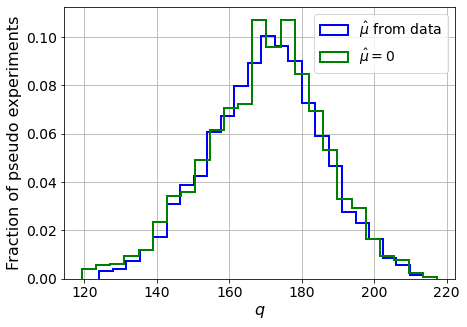

muhat mean:  0.00156931456757578
Z_bins:  13.06706613184164
std Z_bins:  0.597475566866831
Z_bins mu=0:  13.06706613184164
std Z_bins mu=0:  0.625541843644549

--------

B_expected:  643
S_expected:  300

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1085


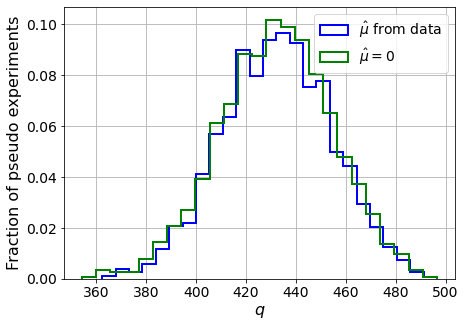

muhat mean:  0.0005252293144517004
Z_bins:  20.80103057501949
std Z_bins:  0.5256531965770671
Z_bins mu=0:  20.800336094931847
std Z_bins mu=0:  0.5421891943821412

--------

B_expected:  643
S_expected:  645

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1115


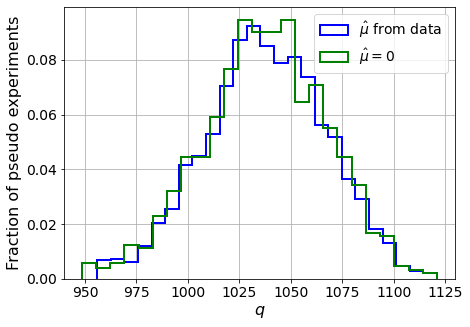

muhat mean:  0.0003192037674455228
Z_bins:  32.21811566483363
std Z_bins:  0.45467848094747276
Z_bins mu=0:  32.216433776517235
std Z_bins mu=0:  0.4645656094774428

--------

B_expected:  643
S_expected:  1390

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.1


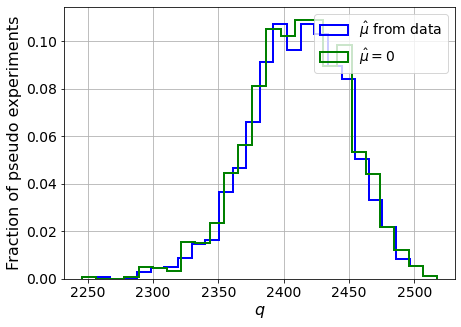

muhat mean:  0.00010913121163389838
Z_bins:  49.12498873264653
std Z_bins:  0.38252085075868786
Z_bins mu=0:  49.1236038217433
std Z_bins mu=0:  0.3892328087060095

--------


 FINAL RESULT:

[[0.16304422115440353, 0.7060747979189578, 0.26985463088324757, 0.15301606430218262, 1.312292247839851], [0.6191239798551748, 0.6112538616496558, 0.04314470738597124, 0.6191229406348084, 0.9452930133206167], [1.2073414806704232, 0.6537220303934586, 0.0037430615577487324, 1.2073414806704232, 0.8856566855883422], [2.4502988540270345, 0.7228468874322757, 0.0208471192502911, 2.449610368603671, 0.8656464084285421], [4.570608002651844, 0.7049621217409586, 0.003980847575603389, 4.570608002651844, 0.7842506130121302], [7.993159070880198, 0.6481083237535308, 0.0003733368177684723, 7.993030078656348, 0.6942108927004194], [13.06706613184164, 0.597475566866831, 0.00156931456757578, 13.06706613184164, 0.625541843644549], [20.80103057501949, 0.5256531965770671, 0.0005252293144517004, 20.800336094931847, 0.54218

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 300.57006911 257.43663221 208.85329932
 153.40730419  92.98569106  31.64650521 -34.44366602 -99.6715306 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 304.77912363 285.34585512 255.81211892 217.56005706
 172

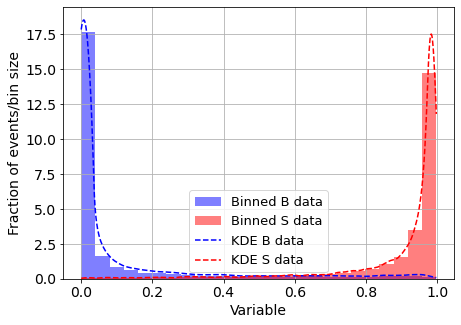

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



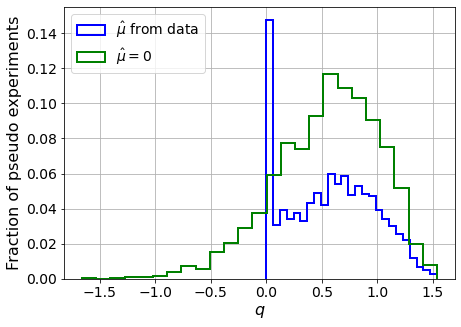

muhat mean:  -7.121384236792561
Z_bins:  0.7752741543840233
std Z_bins:  0.2533977898944029
Z_bins mu=0:  0.7752741543840233
std Z_bins mu=0:  0.3012094641632423

--------

B_expected:  643
S_expected:  3



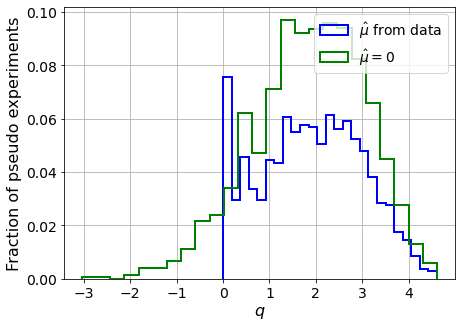

muhat mean:  -2.2246304298982515
Z_bins:  1.3863094777062859
std Z_bins:  0.39384092835741796
Z_bins mu=0:  1.3863094777062859
std Z_bins mu=0:  0.43237748310725

--------

B_expected:  643
S_expected:  6



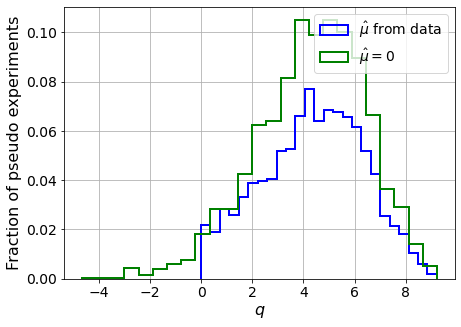

muhat mean:  -1.1900051128449542
Z_bins:  2.111132493062483
std Z_bins:  0.4699783549901216
Z_bins mu=0:  2.111132493062483
std Z_bins mu=0:  0.5059850268512331

--------

B_expected:  643
S_expected:  14



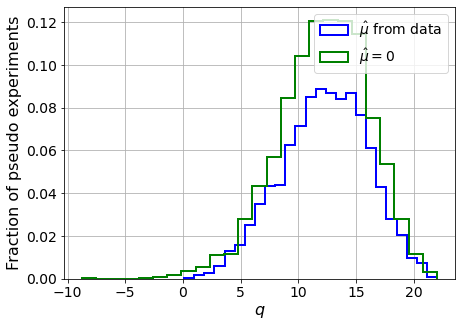

muhat mean:  -0.4900105819850727
Z_bins:  3.527975037048826
std Z_bins:  0.5301885153196971
Z_bins mu=0:  3.527975037048826
std Z_bins mu=0:  0.5535700965463382

--------

B_expected:  643
S_expected:  30



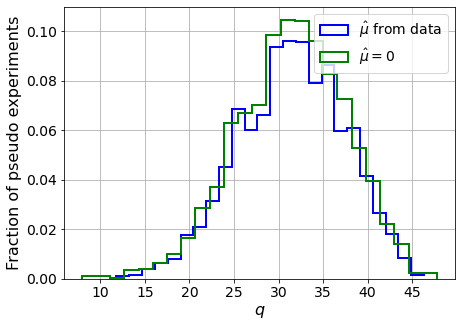

muhat mean:  -0.22359000810106547
Z_bins:  5.624663553319169
std Z_bins:  0.5312373211795279
Z_bins mu=0:  5.624663553319169
std Z_bins mu=0:  0.5413833291976963

--------

B_expected:  643
S_expected:  65



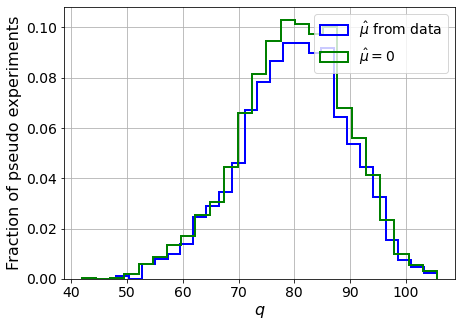

muhat mean:  -0.1099057852622345
Z_bins:  8.961121271498643
std Z_bins:  0.5337854067801332
Z_bins mu=0:  8.961121271498643
std Z_bins mu=0:  0.5404458109794005

--------

B_expected:  643
S_expected:  139



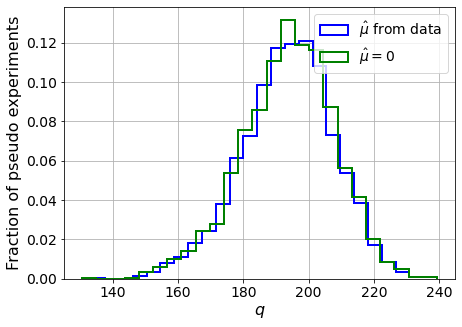

muhat mean:  -0.04898827545981655
Z_bins:  13.940922043575592
std Z_bins:  0.5068127513539401
Z_bins mu=0:  13.940922043575592
std Z_bins mu=0:  0.511910225374251

--------

B_expected:  643
S_expected:  300



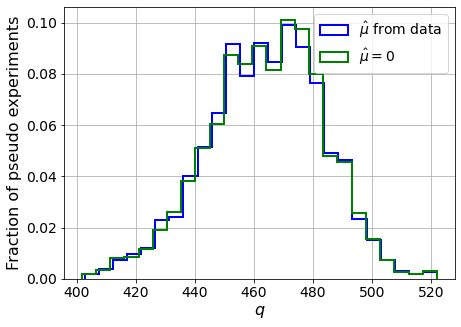

muhat mean:  -0.02428432299043161
Z_bins:  21.55876340896464
std Z_bins:  0.4520526713579651
Z_bins mu=0:  21.55876340896464
std Z_bins mu=0:  0.45428254028385484

--------

B_expected:  643
S_expected:  645



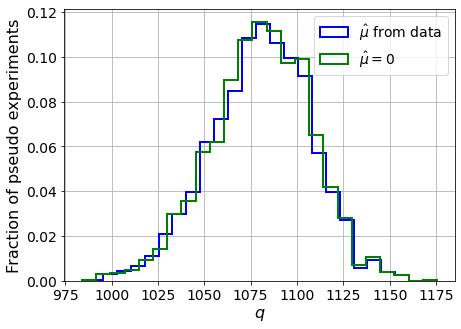

muhat mean:  -0.013206668215788956
Z_bins:  32.88252796559357
std Z_bins:  0.41026005027155854
Z_bins mu=0:  32.88252796559357
std Z_bins mu=0:  0.41168282620770985

--------

B_expected:  643
S_expected:  1390



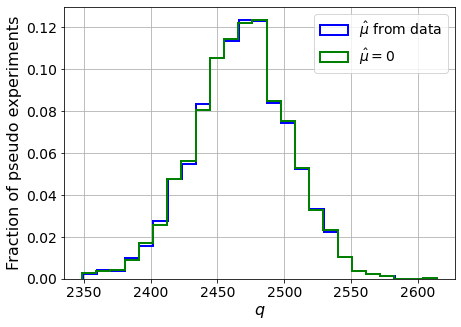

muhat mean:  -0.005473319470337966
Z_bins:  49.68419952918628
std Z_bins:  0.3603522975924618
Z_bins mu=0:  49.68419952918628
std Z_bins mu=0:  0.3613224483991348

--------


 FINAL RESULT:

[[0.7752741543840233, 0.2533977898944029, -7.121384236792561, 0.7752741543840233, 0.3012094641632423], [1.3863094777062859, 0.39384092835741796, -2.2246304298982515, 1.3863094777062859, 0.43237748310725], [2.111132493062483, 0.4699783549901216, -1.1900051128449542, 2.111132493062483, 0.5059850268512331], [3.527975037048826, 0.5301885153196971, -0.4900105819850727, 3.527975037048826, 0.5535700965463382], [5.624663553319169, 0.5312373211795279, -0.22359000810106547, 5.624663553319169, 0.5413833291976963], [8.961121271498643, 0.5337854067801332, -0.1099057852622345, 8.961121271498643, 0.5404458109794005], [13.940922043575592, 0.5068127513539401, -0.04898827545981655, 13.940922043575592, 0.511910225374251], [21.55876340896464, 0.4520526713579651, -0.02428432299043161, 21.55876340896464, 0.4542825402838

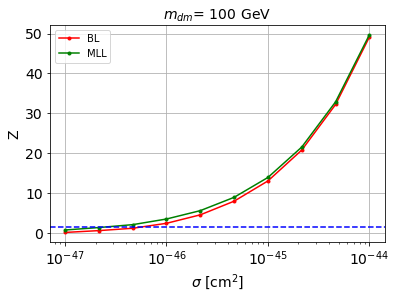


cross_BL_164:  6.425364010373781e-47
cross_BL_164_up:  3.792567324040162e-47
cross_BL_164_down:  9.586003554304069e-47

cross_MLL_164:  2.950513356226167e-47
cross_MLL_164_up:  1.8578195215235901e-47
cross_MLL_164_down:  4.637342933073628e-47

#########################


#########################

mDM =  200 GeV


S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)
 NUM_DAT:  31880 

NUM_DAT_ER:  31472
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  265

B_pbot.shape:  (31880,)
B_ptop.shape:  (31880,)
B_ppeakS1.shape : (31880, 8)
B_ppeakS2.shape:  (31880, 8)

S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)


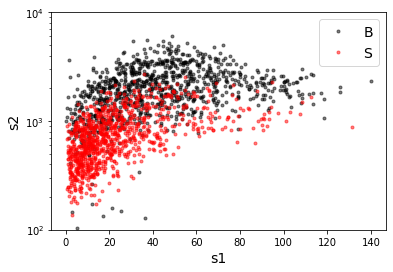

B_pdiffT.shape:  (31880,)
S_pdiffT.shape:  (31880,)


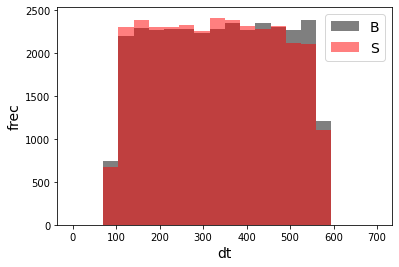

B_pbot.shape:  (31880,)
B_ptop.shape:  (31880,)
B_ppeakS1.shape : (31880, 7)
B_ppeakS2.shape:  (31880, 7)
S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 7)
S_ppeakS2.shape:  (31880, 7)
X_mon_B.shape:  (31880, 15)
X_mon_S.shape:  (31880, 15)
X_mon.shape:  (63760, 15)

X_mon_train :  (40647, 15)
y_mon_train :  (40647,)
X_mon_val :  (7173, 15)
y_mon_val :  (7173,)
X_mon_test :  (15940, 15)
y_mon_test :  (15940,)

[0]	validation_0-logloss:0.68658	validation_1-logloss:0.68668
[1]	validation_0-logloss:0.68014	validation_1-logloss:0.68035
[2]	validation_0-logloss:0.67379	validation_1-logloss:0.67413
[3]	validation_0-logloss:0.66756	validation_1-logloss:0.66803
[4]	validation_0-logloss:0.66147	validation_1-logloss:0.66203
[5]	validation_0-logloss:0.65548	validation_1-logloss:0.65613
[6]	validation_0-logloss:0.64963	validation_1-logloss:0.65043
[7]	validation_0-logloss:0.64384	validation_1-logloss:0.64477
[8]	validation_0-logloss:0.63822	validation_1-logloss:0.63927
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10]	validation_0-logloss:0.62720	validation_1-logloss:0.62847
[11]	validation_0-logloss:0.62181	validation_1-logloss:0.62318
[12]	validation_0-logloss:0.61656	validation_1-logloss:0.61803
[13]	validation_0-logloss:0.61140	validation_1-logloss:0.61300
[14]	validation_0-logloss:0.60631	validation_1-logloss:0.60806
[15]	validation_0-logloss:0.60129	validation_1-logloss:0.60311
[16]	validation_0-logloss:0.59636	validation_1-logloss:0.59835
[17]	validation_0-logloss:0.59151	validation_1-logloss:0.59358
[18]	validation_0-logloss:0.58678	validation_1-logloss:0.58895
[19]	validation_0-logloss:0.58205	validation_1-logloss:0.58430
[20]	validation_0-logloss:0.57744	validation_1-logloss:0.57984
[21]	validation_0-logloss:0.57286	validation_1-logloss:0.57531
[22]	validation_0-logloss:0.56842	validation_1-logloss:0.57100
[23]	validation_0-logloss:0.56406	validation_1-logloss:0.56676
[24]	validation_0-logloss:0.55967	validation_1-logloss:0.56241
[25]	validation_0-logloss:0.55544	validation_1-logloss:

[140]	validation_0-logloss:0.30069	validation_1-logloss:0.31105
[141]	validation_0-logloss:0.29957	validation_1-logloss:0.31001
[142]	validation_0-logloss:0.29844	validation_1-logloss:0.30891
[143]	validation_0-logloss:0.29733	validation_1-logloss:0.30784
[144]	validation_0-logloss:0.29630	validation_1-logloss:0.30689
[145]	validation_0-logloss:0.29519	validation_1-logloss:0.30581
[146]	validation_0-logloss:0.29412	validation_1-logloss:0.30483
[147]	validation_0-logloss:0.29311	validation_1-logloss:0.30383
[148]	validation_0-logloss:0.29208	validation_1-logloss:0.30283
[149]	validation_0-logloss:0.29109	validation_1-logloss:0.30189
[150]	validation_0-logloss:0.29011	validation_1-logloss:0.30097
[151]	validation_0-logloss:0.28912	validation_1-logloss:0.30002
[152]	validation_0-logloss:0.28811	validation_1-logloss:0.29909
[153]	validation_0-logloss:0.28712	validation_1-logloss:0.29813
[154]	validation_0-logloss:0.28614	validation_1-logloss:0.29722
[155]	validation_0-logloss:0.28521	valid

[269]	validation_0-logloss:0.21615	validation_1-logloss:0.23165
[270]	validation_0-logloss:0.21579	validation_1-logloss:0.23133
[271]	validation_0-logloss:0.21541	validation_1-logloss:0.23097
[272]	validation_0-logloss:0.21505	validation_1-logloss:0.23065
[273]	validation_0-logloss:0.21470	validation_1-logloss:0.23036
[274]	validation_0-logloss:0.21433	validation_1-logloss:0.23004
[275]	validation_0-logloss:0.21397	validation_1-logloss:0.22974
[276]	validation_0-logloss:0.21362	validation_1-logloss:0.22944
[277]	validation_0-logloss:0.21327	validation_1-logloss:0.22912
[278]	validation_0-logloss:0.21292	validation_1-logloss:0.22881
[279]	validation_0-logloss:0.21256	validation_1-logloss:0.22849
[280]	validation_0-logloss:0.21223	validation_1-logloss:0.22818
[281]	validation_0-logloss:0.21194	validation_1-logloss:0.22793
[282]	validation_0-logloss:0.21163	validation_1-logloss:0.22763
[283]	validation_0-logloss:0.21127	validation_1-logloss:0.22731
[284]	validation_0-logloss:0.21095	valid

[398]	validation_0-logloss:0.18516	validation_1-logloss:0.20497
[399]	validation_0-logloss:0.18501	validation_1-logloss:0.20483
[400]	validation_0-logloss:0.18484	validation_1-logloss:0.20471
[401]	validation_0-logloss:0.18471	validation_1-logloss:0.20461
[402]	validation_0-logloss:0.18453	validation_1-logloss:0.20446
[403]	validation_0-logloss:0.18438	validation_1-logloss:0.20434
[404]	validation_0-logloss:0.18422	validation_1-logloss:0.20422
[405]	validation_0-logloss:0.18406	validation_1-logloss:0.20409
[406]	validation_0-logloss:0.18388	validation_1-logloss:0.20394
[407]	validation_0-logloss:0.18373	validation_1-logloss:0.20382
[408]	validation_0-logloss:0.18360	validation_1-logloss:0.20371
[409]	validation_0-logloss:0.18345	validation_1-logloss:0.20360
[410]	validation_0-logloss:0.18330	validation_1-logloss:0.20348
[411]	validation_0-logloss:0.18315	validation_1-logloss:0.20336
[412]	validation_0-logloss:0.18299	validation_1-logloss:0.20323
[413]	validation_0-logloss:0.18284	valid

[527]	validation_0-logloss:0.16923	validation_1-logloss:0.19326
[528]	validation_0-logloss:0.16912	validation_1-logloss:0.19319
[529]	validation_0-logloss:0.16903	validation_1-logloss:0.19314
[530]	validation_0-logloss:0.16893	validation_1-logloss:0.19305
[531]	validation_0-logloss:0.16884	validation_1-logloss:0.19301
[532]	validation_0-logloss:0.16877	validation_1-logloss:0.19294
[533]	validation_0-logloss:0.16869	validation_1-logloss:0.19289
[534]	validation_0-logloss:0.16860	validation_1-logloss:0.19281
[535]	validation_0-logloss:0.16852	validation_1-logloss:0.19276
[536]	validation_0-logloss:0.16842	validation_1-logloss:0.19269
[537]	validation_0-logloss:0.16833	validation_1-logloss:0.19265
[538]	validation_0-logloss:0.16825	validation_1-logloss:0.19257
[539]	validation_0-logloss:0.16818	validation_1-logloss:0.19252
[540]	validation_0-logloss:0.16812	validation_1-logloss:0.19248
[541]	validation_0-logloss:0.16804	validation_1-logloss:0.19242
[542]	validation_0-logloss:0.16796	valid

[656]	validation_0-logloss:0.16030	validation_1-logloss:0.18780
[657]	validation_0-logloss:0.16025	validation_1-logloss:0.18777
[658]	validation_0-logloss:0.16018	validation_1-logloss:0.18772
[659]	validation_0-logloss:0.16014	validation_1-logloss:0.18770
[660]	validation_0-logloss:0.16011	validation_1-logloss:0.18768
[661]	validation_0-logloss:0.16007	validation_1-logloss:0.18766
[662]	validation_0-logloss:0.16001	validation_1-logloss:0.18764
[663]	validation_0-logloss:0.15996	validation_1-logloss:0.18762
[664]	validation_0-logloss:0.15992	validation_1-logloss:0.18759
[665]	validation_0-logloss:0.15986	validation_1-logloss:0.18756
[666]	validation_0-logloss:0.15979	validation_1-logloss:0.18751
[667]	validation_0-logloss:0.15973	validation_1-logloss:0.18746
[668]	validation_0-logloss:0.15970	validation_1-logloss:0.18744
[669]	validation_0-logloss:0.15964	validation_1-logloss:0.18740
[670]	validation_0-logloss:0.15959	validation_1-logloss:0.18737
[671]	validation_0-logloss:0.15953	valid

[785]	validation_0-logloss:0.15475	validation_1-logloss:0.18486
[786]	validation_0-logloss:0.15472	validation_1-logloss:0.18486
[787]	validation_0-logloss:0.15467	validation_1-logloss:0.18485
[788]	validation_0-logloss:0.15464	validation_1-logloss:0.18484
[789]	validation_0-logloss:0.15458	validation_1-logloss:0.18480
[790]	validation_0-logloss:0.15454	validation_1-logloss:0.18477
[791]	validation_0-logloss:0.15450	validation_1-logloss:0.18477
[792]	validation_0-logloss:0.15447	validation_1-logloss:0.18476
[793]	validation_0-logloss:0.15443	validation_1-logloss:0.18473
[794]	validation_0-logloss:0.15440	validation_1-logloss:0.18471
[795]	validation_0-logloss:0.15434	validation_1-logloss:0.18468
[796]	validation_0-logloss:0.15431	validation_1-logloss:0.18467
[797]	validation_0-logloss:0.15428	validation_1-logloss:0.18466
[798]	validation_0-logloss:0.15426	validation_1-logloss:0.18465
[799]	validation_0-logloss:0.15420	validation_1-logloss:0.18461
[800]	validation_0-logloss:0.15416	valid

[914]	validation_0-logloss:0.15061	validation_1-logloss:0.18308
[915]	validation_0-logloss:0.15058	validation_1-logloss:0.18306
[916]	validation_0-logloss:0.15055	validation_1-logloss:0.18305
[917]	validation_0-logloss:0.15052	validation_1-logloss:0.18304
[918]	validation_0-logloss:0.15050	validation_1-logloss:0.18304
[919]	validation_0-logloss:0.15047	validation_1-logloss:0.18303
[920]	validation_0-logloss:0.15043	validation_1-logloss:0.18303
[921]	validation_0-logloss:0.15041	validation_1-logloss:0.18302
[922]	validation_0-logloss:0.15038	validation_1-logloss:0.18301
[923]	validation_0-logloss:0.15035	validation_1-logloss:0.18301
[924]	validation_0-logloss:0.15031	validation_1-logloss:0.18300
[925]	validation_0-logloss:0.15029	validation_1-logloss:0.18299
[926]	validation_0-logloss:0.15027	validation_1-logloss:0.18299
[927]	validation_0-logloss:0.15026	validation_1-logloss:0.18299
[928]	validation_0-logloss:0.15021	validation_1-logloss:0.18297
[929]	validation_0-logloss:0.15019	valid

[1042]	validation_0-logloss:0.14736	validation_1-logloss:0.18221
[1043]	validation_0-logloss:0.14734	validation_1-logloss:0.18220
[1044]	validation_0-logloss:0.14730	validation_1-logloss:0.18219
[1045]	validation_0-logloss:0.14728	validation_1-logloss:0.18219
[1046]	validation_0-logloss:0.14726	validation_1-logloss:0.18218
[1047]	validation_0-logloss:0.14723	validation_1-logloss:0.18218
[1048]	validation_0-logloss:0.14721	validation_1-logloss:0.18217
[1049]	validation_0-logloss:0.14718	validation_1-logloss:0.18217
[1050]	validation_0-logloss:0.14715	validation_1-logloss:0.18216
[1051]	validation_0-logloss:0.14713	validation_1-logloss:0.18216
[1052]	validation_0-logloss:0.14709	validation_1-logloss:0.18216
[1053]	validation_0-logloss:0.14708	validation_1-logloss:0.18217
[1054]	validation_0-logloss:0.14704	validation_1-logloss:0.18216
[1055]	validation_0-logloss:0.14701	validation_1-logloss:0.18215
[1056]	validation_0-logloss:0.14700	validation_1-logloss:0.18215
[1057]	validation_0-loglo

[1295]	validation_0-logloss:0.14150	validation_1-logloss:0.18155
[1296]	validation_0-logloss:0.14147	validation_1-logloss:0.18155
[1297]	validation_0-logloss:0.14146	validation_1-logloss:0.18155
[1298]	validation_0-logloss:0.14143	validation_1-logloss:0.18155
[1299]	validation_0-logloss:0.14141	validation_1-logloss:0.18155
[1300]	validation_0-logloss:0.14140	validation_1-logloss:0.18155
[1301]	validation_0-logloss:0.14136	validation_1-logloss:0.18155
[1302]	validation_0-logloss:0.14135	validation_1-logloss:0.18154
[1303]	validation_0-logloss:0.14132	validation_1-logloss:0.18154
[1304]	validation_0-logloss:0.14130	validation_1-logloss:0.18154
[1305]	validation_0-logloss:0.14128	validation_1-logloss:0.18153
[1306]	validation_0-logloss:0.14125	validation_1-logloss:0.18153
[1307]	validation_0-logloss:0.14123	validation_1-logloss:0.18153
[1308]	validation_0-logloss:0.14121	validation_1-logloss:0.18153
[1309]	validation_0-logloss:0.14117	validation_1-logloss:0.18152
[1310]	validation_0-loglo

[1548]	validation_0-logloss:0.13651	validation_1-logloss:0.18128
[1549]	validation_0-logloss:0.13650	validation_1-logloss:0.18128
[1550]	validation_0-logloss:0.13647	validation_1-logloss:0.18129
[1551]	validation_0-logloss:0.13646	validation_1-logloss:0.18129
[1552]	validation_0-logloss:0.13644	validation_1-logloss:0.18129
[1553]	validation_0-logloss:0.13643	validation_1-logloss:0.18128
[1554]	validation_0-logloss:0.13642	validation_1-logloss:0.18128
[1555]	validation_0-logloss:0.13640	validation_1-logloss:0.18128
[1556]	validation_0-logloss:0.13636	validation_1-logloss:0.18127
[1557]	validation_0-logloss:0.13634	validation_1-logloss:0.18127
[1558]	validation_0-logloss:0.13631	validation_1-logloss:0.18126
[1559]	validation_0-logloss:0.13629	validation_1-logloss:0.18126
[1560]	validation_0-logloss:0.13629	validation_1-logloss:0.18126
[1561]	validation_0-logloss:0.13626	validation_1-logloss:0.18126
[1562]	validation_0-logloss:0.13624	validation_1-logloss:0.18126
[1563]	validation_0-loglo

[1675]	validation_0-logloss:0.13425	validation_1-logloss:0.18112
[1676]	validation_0-logloss:0.13423	validation_1-logloss:0.18113
[1677]	validation_0-logloss:0.13421	validation_1-logloss:0.18112
[1678]	validation_0-logloss:0.13420	validation_1-logloss:0.18112
[1679]	validation_0-logloss:0.13418	validation_1-logloss:0.18111
[1680]	validation_0-logloss:0.13417	validation_1-logloss:0.18111
[1681]	validation_0-logloss:0.13416	validation_1-logloss:0.18111
[1682]	validation_0-logloss:0.13414	validation_1-logloss:0.18110
[1683]	validation_0-logloss:0.13412	validation_1-logloss:0.18110
[1684]	validation_0-logloss:0.13409	validation_1-logloss:0.18110
[1685]	validation_0-logloss:0.13408	validation_1-logloss:0.18110
[1686]	validation_0-logloss:0.13406	validation_1-logloss:0.18111
[1687]	validation_0-logloss:0.13405	validation_1-logloss:0.18110
[1688]	validation_0-logloss:0.13403	validation_1-logloss:0.18110
[1689]	validation_0-logloss:0.13402	validation_1-logloss:0.18110
[1690]	validation_0-loglo

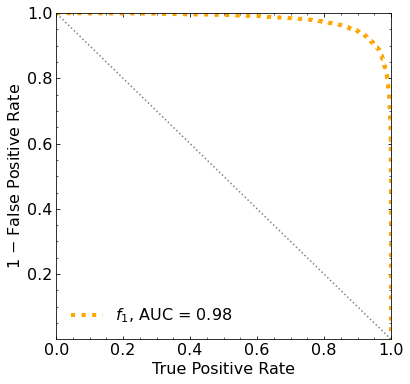

Classification score:


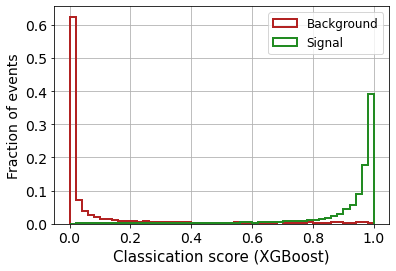


 ROC-AUC =  0.9794395114021119
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.083


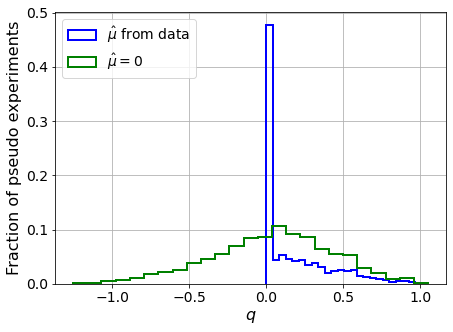

muhat mean:  0.09100948024783183
Z_bins:  0.25286353646878074
std Z_bins:  0.4529336422522161
Z_bins mu=0:  0.25286353646878074
std Z_bins mu=0:  0.782388299422047

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.079


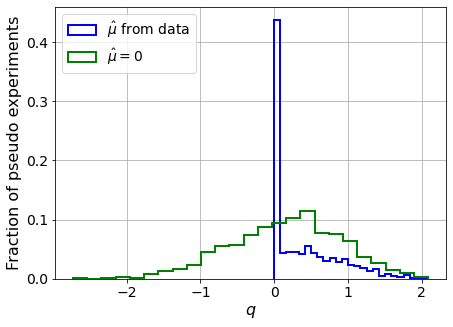

muhat mean:  0.05051365998319959
Z_bins:  0.44562327293833626
std Z_bins:  0.5180053252514685
Z_bins mu=0:  0.44562327293833626
std Z_bins mu=0:  0.8400023216025284

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.091


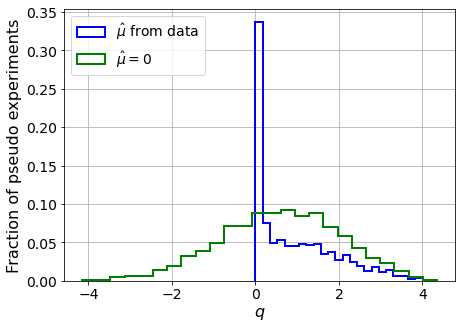

muhat mean:  0.043837344510568685
Z_bins:  0.7942096144051389
std Z_bins:  0.6154522143177663
Z_bins mu=0:  0.7939631575029721
std Z_bins mu=0:  0.9037348460308057

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.082


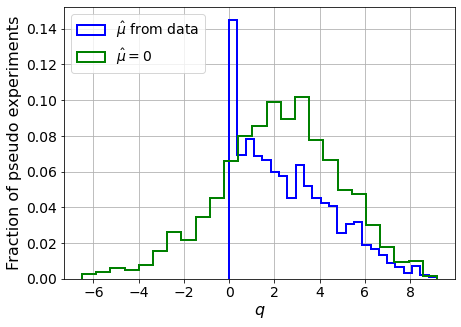

muhat mean:  0.016615955339803402
Z_bins:  1.5139561014894003
std Z_bins:  0.675870855603341
Z_bins mu=0:  1.5138930643609736
std Z_bins mu=0:  0.8815969625910268

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.098


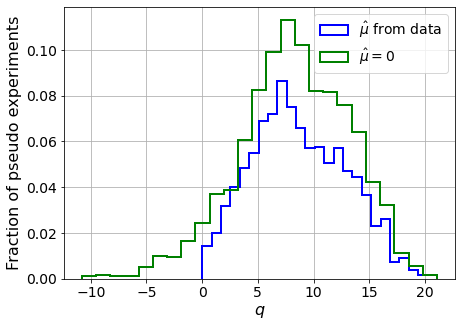

muhat mean:  0.0022333069902830435
Z_bins:  2.8835086928586713
std Z_bins:  0.7312989227560697
Z_bins mu=0:  2.8834053924767917
std Z_bins mu=0:  0.8583515529730632

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0855


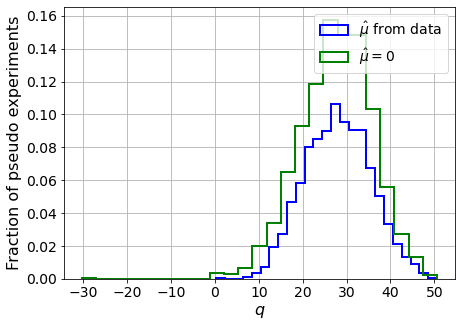

muhat mean:  0.0036290709009517887
Z_bins:  5.28373800627483
std Z_bins:  0.7068963104371574
Z_bins mu=0:  5.283626868218781
std Z_bins mu=0:  0.7827940032494995

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0965


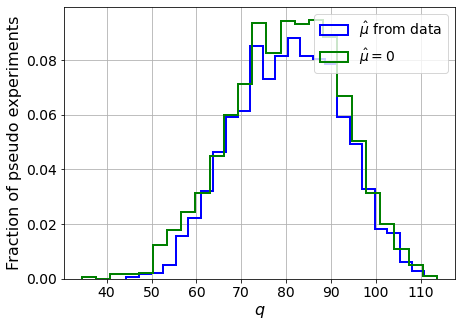

muhat mean:  0.0028976074213500876
Z_bins:  8.983543975928509
std Z_bins:  0.6488749649549415
Z_bins mu=0:  8.983238782746236
std Z_bins mu=0:  0.6872421507560109

--------

B_expected:  643
S_expected:  170

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0845


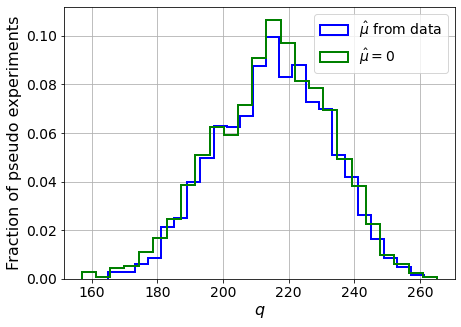

muhat mean:  0.0010015501221289228
Z_bins:  14.689079671664143
std Z_bins:  0.5772885189251435
Z_bins mu=0:  14.689079671664143
std Z_bins mu=0:  0.60060613382237

--------

B_expected:  643
S_expected:  366

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.085


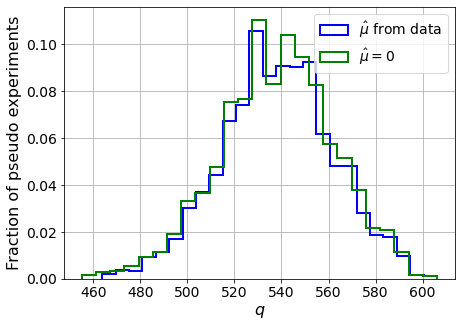

muhat mean:  0.00046184374821556007
Z_bins:  23.2054406600296
std Z_bins:  0.5097365405010669
Z_bins mu=0:  23.203265629542376
std Z_bins mu=0:  0.5248606339028715

--------

B_expected:  643
S_expected:  788

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.099


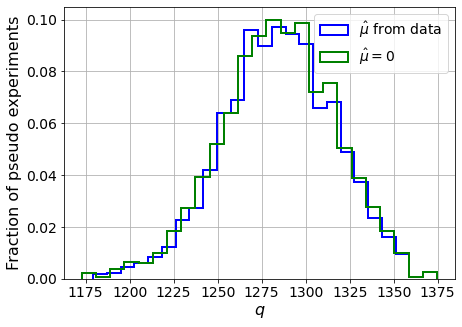

muhat mean:  0.00013234421675452105
Z_bins:  35.8499624923768
std Z_bins:  0.4413806135099936
Z_bins mu=0:  35.84917182322178
std Z_bins mu=0:  0.4508222481090672

--------


 FINAL RESULT:

[[0.25286353646878074, 0.4529336422522161, 0.09100948024783183, 0.25286353646878074, 0.782388299422047], [0.44562327293833626, 0.5180053252514685, 0.05051365998319959, 0.44562327293833626, 0.8400023216025284], [0.7942096144051389, 0.6154522143177663, 0.043837344510568685, 0.7939631575029721, 0.9037348460308057], [1.5139561014894003, 0.675870855603341, 0.016615955339803402, 1.5138930643609736, 0.8815969625910268], [2.8835086928586713, 0.7312989227560697, 0.0022333069902830435, 2.8834053924767917, 0.8583515529730632], [5.28373800627483, 0.7068963104371574, 0.0036290709009517887, 5.283626868218781, 0.7827940032494995], [8.983543975928509, 0.6488749649549415, 0.0028976074213500876, 8.983238782746236, 0.6872421507560109], [14.689079671664143, 0.5772885189251435, 0.0010015501221289228, 14.689079671664143

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  344.15286936  306.14736544  262.97018689  215.60324146
  160.39032899   99.50782148   31.08981807  -39.40268097 -101.46364891]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 290.24013928 271.84281283 243.709367

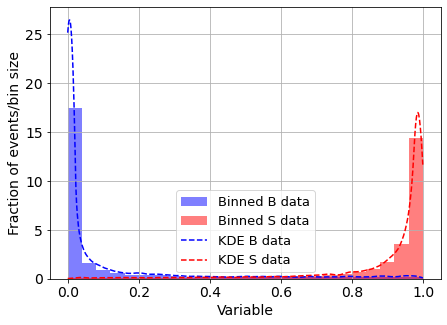

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



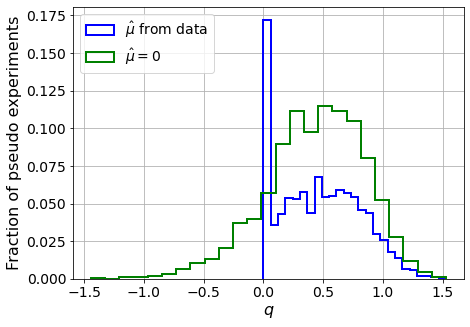

muhat mean:  -5.031027786537336
Z_bins:  0.6813845819221259
std Z_bins:  0.24843325720377651
Z_bins mu=0:  0.6813845819221259
std Z_bins mu=0:  0.301893041870071

--------

B_expected:  643
S_expected:  2



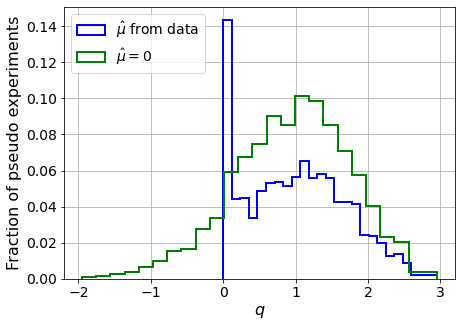

muhat mean:  -2.496363799616655
Z_bins:  1.0008572153722963
std Z_bins:  0.34422104212236454
Z_bins mu=0:  1.0008572153722963
std Z_bins mu=0:  0.398020232283182

--------

B_expected:  643
S_expected:  4



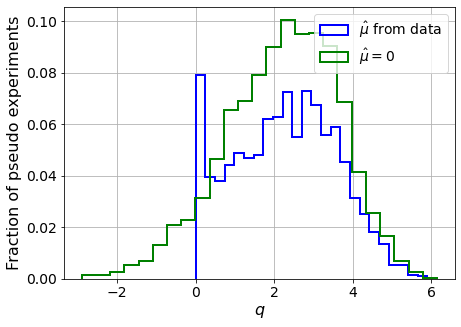

muhat mean:  -1.2260193019386625
Z_bins:  1.5251084506400165
std Z_bins:  0.42809353482727114
Z_bins mu=0:  1.5251084506400165
std Z_bins mu=0:  0.47253003019055456

--------

B_expected:  643
S_expected:  8



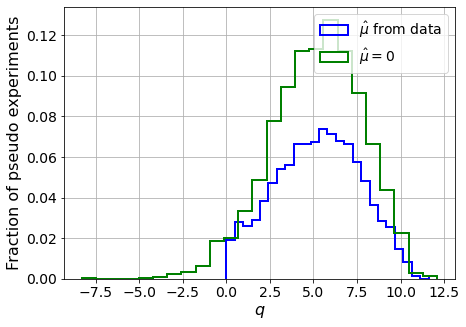

muhat mean:  -0.6494127909809763
Z_bins:  2.3109665943740425
std Z_bins:  0.5263001998538932
Z_bins mu=0:  2.3109665943740425
std Z_bins mu=0:  0.5662398198877746

--------

B_expected:  643
S_expected:  17



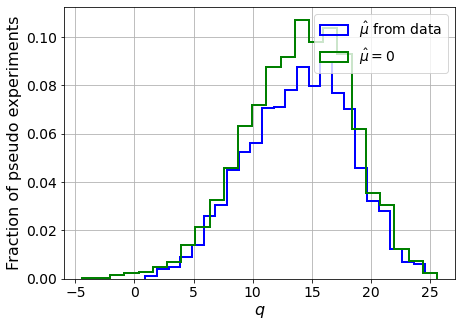

muhat mean:  -0.29896852634296395
Z_bins:  3.7617238091848746
std Z_bins:  0.5773994602574793
Z_bins mu=0:  3.7617238091848746
std Z_bins mu=0:  0.5998963055464825

--------

B_expected:  643
S_expected:  37



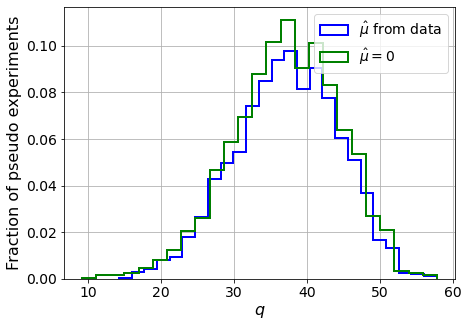

muhat mean:  -0.13719448411322538
Z_bins:  6.118932590974027
std Z_bins:  0.5802841521510581
Z_bins mu=0:  6.118932590974027
std Z_bins mu=0:  0.5936805553548433

--------

B_expected:  643
S_expected:  79



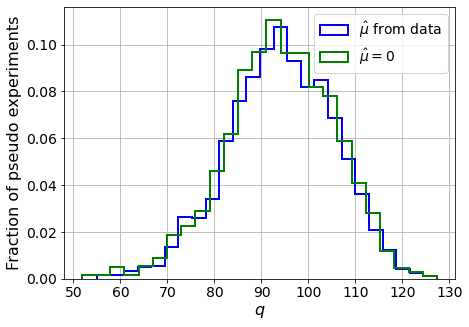

muhat mean:  -0.058512445851133216
Z_bins:  9.705927656818204
std Z_bins:  0.581278830989034
Z_bins mu=0:  9.705927656818204
std Z_bins mu=0:  0.5925414726141176

--------

B_expected:  643
S_expected:  170



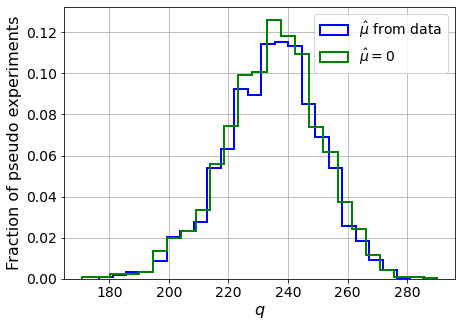

muhat mean:  -0.028255873423180332
Z_bins:  15.34603464305198
std Z_bins:  0.5258154098445045
Z_bins mu=0:  15.34603464305198
std Z_bins mu=0:  0.5320718656281356

--------

B_expected:  643
S_expected:  366



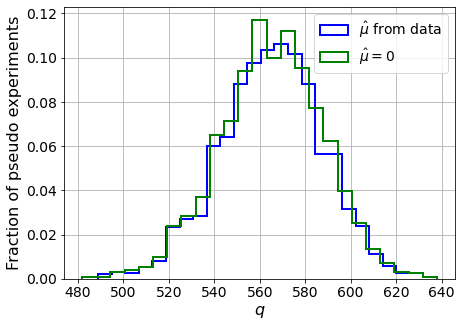

muhat mean:  -0.014582929262373265
Z_bins:  23.776903742184572
std Z_bins:  0.47396144472542134
Z_bins mu=0:  23.776903742184572
std Z_bins mu=0:  0.47705539171573247

--------

B_expected:  643
S_expected:  788



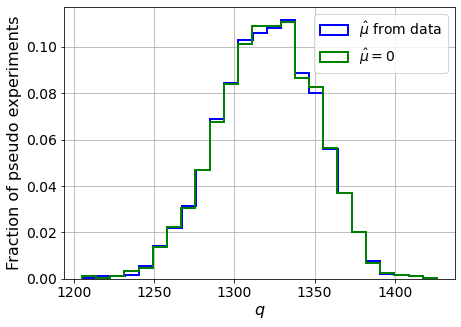

muhat mean:  -0.007661859400201932
Z_bins:  36.351812164752054
std Z_bins:  0.4183596000417422
Z_bins mu=0:  36.35089526728641
std Z_bins mu=0:  0.4203016596432914

--------


 FINAL RESULT:

[[0.6813845819221259, 0.24843325720377651, -5.031027786537336, 0.6813845819221259, 0.301893041870071], [1.0008572153722963, 0.34422104212236454, -2.496363799616655, 1.0008572153722963, 0.398020232283182], [1.5251084506400165, 0.42809353482727114, -1.2260193019386625, 1.5251084506400165, 0.47253003019055456], [2.3109665943740425, 0.5263001998538932, -0.6494127909809763, 2.3109665943740425, 0.5662398198877746], [3.7617238091848746, 0.5773994602574793, -0.29896852634296395, 3.7617238091848746, 0.5998963055464825], [6.118932590974027, 0.5802841521510581, -0.13719448411322538, 6.118932590974027, 0.5936805553548433], [9.705927656818204, 0.581278830989034, -0.058512445851133216, 9.705927656818204, 0.5925414726141176], [15.34603464305198, 0.5258154098445045, -0.028255873423180332, 15.34603464305198, 0.532

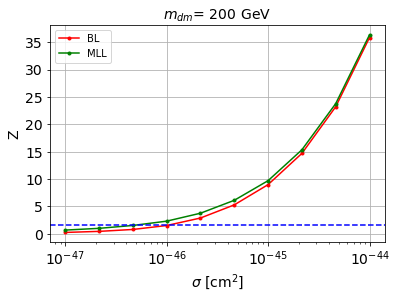


cross_BL_164:  1.0975740150872903e-46
cross_BL_164_up:  6.121114512176996e-47
cross_BL_164_down:  1.6970190894232649e-46

cross_MLL_164:  5.325457961797802e-47
cross_MLL_164_up:  3.2307688531994506e-47
cross_MLL_164_down:  8.880379634854862e-47

#########################


#########################

mDM =  500 GeV


S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)
 NUM_DAT:  32015 

NUM_DAT_ER:  31605
NUM_DAT_AC:  113
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  266

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 8)
B_ppeakS2.shape:  (32015, 8)

S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)


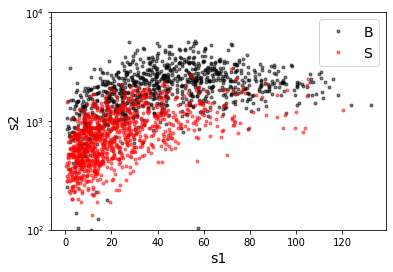

B_pdiffT.shape:  (32015,)
S_pdiffT.shape:  (32015,)


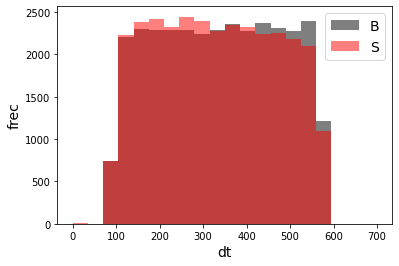

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 7)
B_ppeakS2.shape:  (32015, 7)
S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 7)
S_ppeakS2.shape:  (32015, 7)
X_mon_B.shape:  (32015, 15)
X_mon_S.shape:  (32015, 15)
X_mon.shape:  (64030, 15)

X_mon_train :  (40818, 15)
y_mon_train :  (40818,)
X_mon_val :  (7204, 15)
y_mon_val :  (7204,)
X_mon_test :  (16008, 15)
y_mon_test :  (16008,)

[0]	validation_0-logloss:0.68667	validation_1-logloss:0.68669
[1]	validation_0-logloss:0.68036	validation_1-logloss:0.68042
[2]	validation_0-logloss:0.67412	validation_1-logloss:0.67420
[3]	validation_0-logloss:0.66805	validation_1-logloss:0.66815
[4]	validation_0-logloss:0.66205	validation_1-logloss:0.66216
[5]	validation_0-logloss:0.65620	validation_1-logloss:0.65636
[6]	validation_0-logloss:0.65043	validation_1-logloss:0.65060
[7]	validation_0-logloss:0.64480	validation_1-logloss:0.64502
[8]	validation_0-logloss:0.63916	validation_1-logloss:0.63941
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.61783	validation_1-logloss:0.61814
[13]	validation_0-logloss:0.61277	validation_1-logloss:0.61311
[14]	validation_0-logloss:0.60765	validation_1-logloss:0.60804
[15]	validation_0-logloss:0.60274	validation_1-logloss:0.60317
[16]	validation_0-logloss:0.59783	validation_1-logloss:0.59828
[17]	validation_0-logloss:0.59296	validation_1-logloss:0.59345
[18]	validation_0-logloss:0.58834	validation_1-logloss:0.58885
[19]	validation_0-logloss:0.58365	validation_1-logloss:0.58423
[20]	validation_0-logloss:0.57915	validation_1-logloss:0.57977
[21]	validation_0-logloss:0.57470	validation_1-logloss:0.57532
[22]	validation_0-logloss:0.57036	validation_1-logloss:0.57096
[23]	validation_0-logloss:0.56599	validation_1-logloss:0.56664
[24]	validation_0-logloss:0.56177	validation_1-logloss:0.56242
[25]	validation_0-logloss:0.55762	validation_1-logloss:0.55827
[26]	validation_0-logloss:0.55340	validation_1-logloss:0.55411
[27]	validation_0-logloss:0.54939	validation_1-logloss:

[142]	validation_0-logloss:0.30242	validation_1-logloss:0.30658
[143]	validation_0-logloss:0.30128	validation_1-logloss:0.30548
[144]	validation_0-logloss:0.30019	validation_1-logloss:0.30447
[145]	validation_0-logloss:0.29912	validation_1-logloss:0.30336
[146]	validation_0-logloss:0.29802	validation_1-logloss:0.30234
[147]	validation_0-logloss:0.29698	validation_1-logloss:0.30130
[148]	validation_0-logloss:0.29597	validation_1-logloss:0.30036
[149]	validation_0-logloss:0.29491	validation_1-logloss:0.29930
[150]	validation_0-logloss:0.29386	validation_1-logloss:0.29830
[151]	validation_0-logloss:0.29280	validation_1-logloss:0.29728
[152]	validation_0-logloss:0.29178	validation_1-logloss:0.29629
[153]	validation_0-logloss:0.29081	validation_1-logloss:0.29538
[154]	validation_0-logloss:0.28983	validation_1-logloss:0.29441
[155]	validation_0-logloss:0.28890	validation_1-logloss:0.29353
[156]	validation_0-logloss:0.28793	validation_1-logloss:0.29260
[157]	validation_0-logloss:0.28697	valid

[271]	validation_0-logloss:0.21850	validation_1-logloss:0.22806
[272]	validation_0-logloss:0.21810	validation_1-logloss:0.22768
[273]	validation_0-logloss:0.21775	validation_1-logloss:0.22732
[274]	validation_0-logloss:0.21741	validation_1-logloss:0.22703
[275]	validation_0-logloss:0.21704	validation_1-logloss:0.22670
[276]	validation_0-logloss:0.21669	validation_1-logloss:0.22636
[277]	validation_0-logloss:0.21634	validation_1-logloss:0.22607
[278]	validation_0-logloss:0.21600	validation_1-logloss:0.22579
[279]	validation_0-logloss:0.21566	validation_1-logloss:0.22544
[280]	validation_0-logloss:0.21530	validation_1-logloss:0.22514
[281]	validation_0-logloss:0.21499	validation_1-logloss:0.22484
[282]	validation_0-logloss:0.21461	validation_1-logloss:0.22451
[283]	validation_0-logloss:0.21429	validation_1-logloss:0.22423
[284]	validation_0-logloss:0.21393	validation_1-logloss:0.22392
[285]	validation_0-logloss:0.21361	validation_1-logloss:0.22363
[286]	validation_0-logloss:0.21331	valid

[400]	validation_0-logloss:0.18776	validation_1-logloss:0.20147
[401]	validation_0-logloss:0.18759	validation_1-logloss:0.20134
[402]	validation_0-logloss:0.18747	validation_1-logloss:0.20124
[403]	validation_0-logloss:0.18728	validation_1-logloss:0.20109
[404]	validation_0-logloss:0.18711	validation_1-logloss:0.20097
[405]	validation_0-logloss:0.18694	validation_1-logloss:0.20082
[406]	validation_0-logloss:0.18678	validation_1-logloss:0.20069
[407]	validation_0-logloss:0.18664	validation_1-logloss:0.20056
[408]	validation_0-logloss:0.18646	validation_1-logloss:0.20043
[409]	validation_0-logloss:0.18629	validation_1-logloss:0.20029
[410]	validation_0-logloss:0.18613	validation_1-logloss:0.20015
[411]	validation_0-logloss:0.18595	validation_1-logloss:0.20003
[412]	validation_0-logloss:0.18583	validation_1-logloss:0.19995
[413]	validation_0-logloss:0.18567	validation_1-logloss:0.19982
[414]	validation_0-logloss:0.18552	validation_1-logloss:0.19971
[415]	validation_0-logloss:0.18536	valid

[529]	validation_0-logloss:0.17166	validation_1-logloss:0.18988
[530]	validation_0-logloss:0.17159	validation_1-logloss:0.18983
[531]	validation_0-logloss:0.17150	validation_1-logloss:0.18978
[532]	validation_0-logloss:0.17142	validation_1-logloss:0.18973
[533]	validation_0-logloss:0.17134	validation_1-logloss:0.18966
[534]	validation_0-logloss:0.17126	validation_1-logloss:0.18962
[535]	validation_0-logloss:0.17118	validation_1-logloss:0.18957
[536]	validation_0-logloss:0.17109	validation_1-logloss:0.18951
[537]	validation_0-logloss:0.17101	validation_1-logloss:0.18945
[538]	validation_0-logloss:0.17094	validation_1-logloss:0.18940
[539]	validation_0-logloss:0.17084	validation_1-logloss:0.18935
[540]	validation_0-logloss:0.17078	validation_1-logloss:0.18931
[541]	validation_0-logloss:0.17070	validation_1-logloss:0.18925
[542]	validation_0-logloss:0.17061	validation_1-logloss:0.18920
[543]	validation_0-logloss:0.17053	validation_1-logloss:0.18916
[544]	validation_0-logloss:0.17045	valid

[658]	validation_0-logloss:0.16287	validation_1-logloss:0.18435
[659]	validation_0-logloss:0.16281	validation_1-logloss:0.18430
[660]	validation_0-logloss:0.16276	validation_1-logloss:0.18427
[661]	validation_0-logloss:0.16272	validation_1-logloss:0.18424
[662]	validation_0-logloss:0.16265	validation_1-logloss:0.18422
[663]	validation_0-logloss:0.16260	validation_1-logloss:0.18420
[664]	validation_0-logloss:0.16256	validation_1-logloss:0.18417
[665]	validation_0-logloss:0.16251	validation_1-logloss:0.18414
[666]	validation_0-logloss:0.16244	validation_1-logloss:0.18410
[667]	validation_0-logloss:0.16239	validation_1-logloss:0.18407
[668]	validation_0-logloss:0.16234	validation_1-logloss:0.18404
[669]	validation_0-logloss:0.16229	validation_1-logloss:0.18401
[670]	validation_0-logloss:0.16224	validation_1-logloss:0.18398
[671]	validation_0-logloss:0.16218	validation_1-logloss:0.18395
[672]	validation_0-logloss:0.16212	validation_1-logloss:0.18391
[673]	validation_0-logloss:0.16207	valid

[787]	validation_0-logloss:0.15701	validation_1-logloss:0.18146
[788]	validation_0-logloss:0.15696	validation_1-logloss:0.18144
[789]	validation_0-logloss:0.15692	validation_1-logloss:0.18141
[790]	validation_0-logloss:0.15688	validation_1-logloss:0.18139
[791]	validation_0-logloss:0.15685	validation_1-logloss:0.18138
[792]	validation_0-logloss:0.15682	validation_1-logloss:0.18136
[793]	validation_0-logloss:0.15679	validation_1-logloss:0.18135
[794]	validation_0-logloss:0.15676	validation_1-logloss:0.18133
[795]	validation_0-logloss:0.15671	validation_1-logloss:0.18132
[796]	validation_0-logloss:0.15668	validation_1-logloss:0.18131
[797]	validation_0-logloss:0.15664	validation_1-logloss:0.18130
[798]	validation_0-logloss:0.15661	validation_1-logloss:0.18128
[799]	validation_0-logloss:0.15658	validation_1-logloss:0.18127
[800]	validation_0-logloss:0.15653	validation_1-logloss:0.18125
[801]	validation_0-logloss:0.15650	validation_1-logloss:0.18123
[802]	validation_0-logloss:0.15647	valid

[916]	validation_0-logloss:0.15260	validation_1-logloss:0.17977
[917]	validation_0-logloss:0.15257	validation_1-logloss:0.17976
[918]	validation_0-logloss:0.15255	validation_1-logloss:0.17975
[919]	validation_0-logloss:0.15252	validation_1-logloss:0.17974
[920]	validation_0-logloss:0.15249	validation_1-logloss:0.17973
[921]	validation_0-logloss:0.15246	validation_1-logloss:0.17973
[922]	validation_0-logloss:0.15242	validation_1-logloss:0.17972
[923]	validation_0-logloss:0.15238	validation_1-logloss:0.17971
[924]	validation_0-logloss:0.15236	validation_1-logloss:0.17971
[925]	validation_0-logloss:0.15233	validation_1-logloss:0.17970
[926]	validation_0-logloss:0.15231	validation_1-logloss:0.17969
[927]	validation_0-logloss:0.15229	validation_1-logloss:0.17969
[928]	validation_0-logloss:0.15226	validation_1-logloss:0.17967
[929]	validation_0-logloss:0.15224	validation_1-logloss:0.17967
[930]	validation_0-logloss:0.15221	validation_1-logloss:0.17966
[931]	validation_0-logloss:0.15218	valid

[1044]	validation_0-logloss:0.14919	validation_1-logloss:0.17882
[1045]	validation_0-logloss:0.14916	validation_1-logloss:0.17881
[1046]	validation_0-logloss:0.14914	validation_1-logloss:0.17881
[1047]	validation_0-logloss:0.14913	validation_1-logloss:0.17881
[1048]	validation_0-logloss:0.14911	validation_1-logloss:0.17881
[1049]	validation_0-logloss:0.14909	validation_1-logloss:0.17880
[1050]	validation_0-logloss:0.14907	validation_1-logloss:0.17879
[1051]	validation_0-logloss:0.14905	validation_1-logloss:0.17879
[1052]	validation_0-logloss:0.14902	validation_1-logloss:0.17878
[1053]	validation_0-logloss:0.14900	validation_1-logloss:0.17877
[1054]	validation_0-logloss:0.14898	validation_1-logloss:0.17877
[1055]	validation_0-logloss:0.14895	validation_1-logloss:0.17876
[1056]	validation_0-logloss:0.14894	validation_1-logloss:0.17875
[1057]	validation_0-logloss:0.14891	validation_1-logloss:0.17874
[1058]	validation_0-logloss:0.14887	validation_1-logloss:0.17873
[1059]	validation_0-loglo

[1171]	validation_0-logloss:0.14624	validation_1-logloss:0.17821
[1172]	validation_0-logloss:0.14623	validation_1-logloss:0.17820
[1173]	validation_0-logloss:0.14620	validation_1-logloss:0.17820
[1174]	validation_0-logloss:0.14619	validation_1-logloss:0.17820
[1175]	validation_0-logloss:0.14618	validation_1-logloss:0.17819
[1176]	validation_0-logloss:0.14616	validation_1-logloss:0.17819
[1177]	validation_0-logloss:0.14614	validation_1-logloss:0.17819
[1178]	validation_0-logloss:0.14612	validation_1-logloss:0.17818
[1179]	validation_0-logloss:0.14610	validation_1-logloss:0.17817
[1180]	validation_0-logloss:0.14606	validation_1-logloss:0.17816
[1181]	validation_0-logloss:0.14605	validation_1-logloss:0.17816
[1182]	validation_0-logloss:0.14602	validation_1-logloss:0.17816
[1183]	validation_0-logloss:0.14600	validation_1-logloss:0.17816
[1184]	validation_0-logloss:0.14599	validation_1-logloss:0.17815
[1185]	validation_0-logloss:0.14595	validation_1-logloss:0.17815
[1186]	validation_0-loglo

[1298]	validation_0-logloss:0.14360	validation_1-logloss:0.17776
[1299]	validation_0-logloss:0.14358	validation_1-logloss:0.17776
[1300]	validation_0-logloss:0.14355	validation_1-logloss:0.17775
[1301]	validation_0-logloss:0.14354	validation_1-logloss:0.17775
[1302]	validation_0-logloss:0.14353	validation_1-logloss:0.17775
[1303]	validation_0-logloss:0.14350	validation_1-logloss:0.17776
[1304]	validation_0-logloss:0.14348	validation_1-logloss:0.17775
[1305]	validation_0-logloss:0.14346	validation_1-logloss:0.17775
[1306]	validation_0-logloss:0.14344	validation_1-logloss:0.17775
[1307]	validation_0-logloss:0.14342	validation_1-logloss:0.17775
[1308]	validation_0-logloss:0.14341	validation_1-logloss:0.17774
[1309]	validation_0-logloss:0.14338	validation_1-logloss:0.17775
[1310]	validation_0-logloss:0.14335	validation_1-logloss:0.17774
[1311]	validation_0-logloss:0.14332	validation_1-logloss:0.17774
[1312]	validation_0-logloss:0.14330	validation_1-logloss:0.17774
[1313]	validation_0-loglo

[1425]	validation_0-logloss:0.14098	validation_1-logloss:0.17747
[1426]	validation_0-logloss:0.14096	validation_1-logloss:0.17747
[1427]	validation_0-logloss:0.14095	validation_1-logloss:0.17747
[1428]	validation_0-logloss:0.14093	validation_1-logloss:0.17746
[1429]	validation_0-logloss:0.14091	validation_1-logloss:0.17747
[1430]	validation_0-logloss:0.14089	validation_1-logloss:0.17746
[1431]	validation_0-logloss:0.14086	validation_1-logloss:0.17747
[1432]	validation_0-logloss:0.14085	validation_1-logloss:0.17747
[1433]	validation_0-logloss:0.14083	validation_1-logloss:0.17747
[1434]	validation_0-logloss:0.14082	validation_1-logloss:0.17747
[1435]	validation_0-logloss:0.14080	validation_1-logloss:0.17747
[1436]	validation_0-logloss:0.14079	validation_1-logloss:0.17746
[1437]	validation_0-logloss:0.14078	validation_1-logloss:0.17746
[1438]	validation_0-logloss:0.14076	validation_1-logloss:0.17746
[1439]	validation_0-logloss:0.14074	validation_1-logloss:0.17747
[1440]	validation_0-loglo

[1552]	validation_0-logloss:0.13853	validation_1-logloss:0.17724
[1553]	validation_0-logloss:0.13852	validation_1-logloss:0.17724
[1554]	validation_0-logloss:0.13851	validation_1-logloss:0.17724
[1555]	validation_0-logloss:0.13850	validation_1-logloss:0.17723
[1556]	validation_0-logloss:0.13848	validation_1-logloss:0.17722
[1557]	validation_0-logloss:0.13847	validation_1-logloss:0.17723
[1558]	validation_0-logloss:0.13846	validation_1-logloss:0.17722
[1559]	validation_0-logloss:0.13844	validation_1-logloss:0.17723
[1560]	validation_0-logloss:0.13842	validation_1-logloss:0.17723
[1561]	validation_0-logloss:0.13841	validation_1-logloss:0.17723
[1562]	validation_0-logloss:0.13839	validation_1-logloss:0.17723
[1563]	validation_0-logloss:0.13838	validation_1-logloss:0.17722
[1564]	validation_0-logloss:0.13836	validation_1-logloss:0.17723
[1565]	validation_0-logloss:0.13835	validation_1-logloss:0.17723
[1566]	validation_0-logloss:0.13834	validation_1-logloss:0.17723
[1567]	validation_0-loglo

[1679]	validation_0-logloss:0.13630	validation_1-logloss:0.17704
[1680]	validation_0-logloss:0.13628	validation_1-logloss:0.17704
[1681]	validation_0-logloss:0.13627	validation_1-logloss:0.17704
[1682]	validation_0-logloss:0.13624	validation_1-logloss:0.17704
[1683]	validation_0-logloss:0.13622	validation_1-logloss:0.17704
[1684]	validation_0-logloss:0.13620	validation_1-logloss:0.17704
[1685]	validation_0-logloss:0.13617	validation_1-logloss:0.17703
[1686]	validation_0-logloss:0.13617	validation_1-logloss:0.17703
[1687]	validation_0-logloss:0.13615	validation_1-logloss:0.17704
[1688]	validation_0-logloss:0.13614	validation_1-logloss:0.17703
[1689]	validation_0-logloss:0.13612	validation_1-logloss:0.17703
[1690]	validation_0-logloss:0.13610	validation_1-logloss:0.17703
[1691]	validation_0-logloss:0.13609	validation_1-logloss:0.17702
[1692]	validation_0-logloss:0.13608	validation_1-logloss:0.17703
[1693]	validation_0-logloss:0.13607	validation_1-logloss:0.17702
[1694]	validation_0-loglo

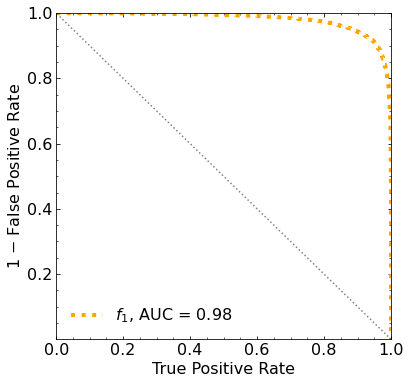

Classification score:


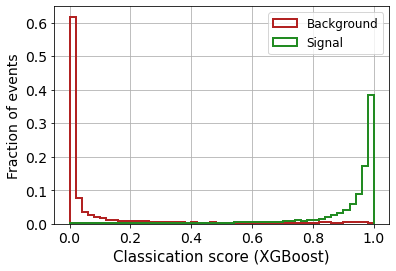


 ROC-AUC =  0.9796536833636728
At least 5 B events per bin, range = [[0, 1]]:
# bins:  18 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  18
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0745


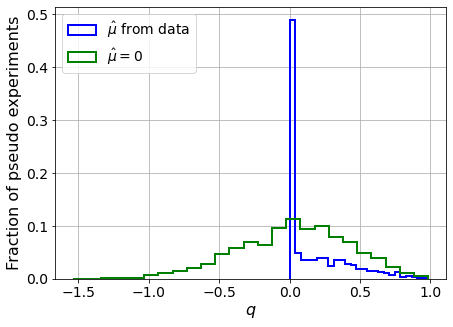

muhat mean:  0.17433387615570858
Z_bins:  0.2271068691467797
std Z_bins:  0.5022041209779324
Z_bins mu=0:  0.2271068691467797
std Z_bins mu=0:  0.880540092188725

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.072


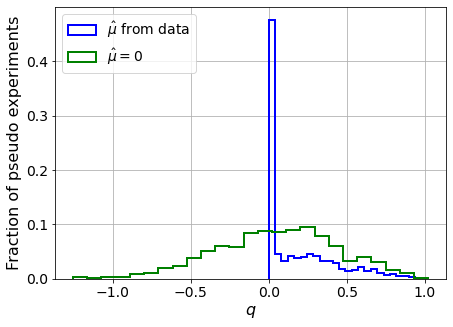

muhat mean:  -0.027295020814155507
Z_bins:  0.23753063019290768
std Z_bins:  0.4894534206229462
Z_bins mu=0:  0.23753063019290768
std Z_bins mu=0:  0.8242461156456125

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.074


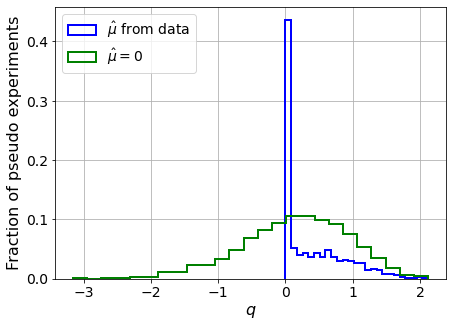

muhat mean:  0.06056839536043371
Z_bins:  0.4522554226623654
std Z_bins:  0.5241879703073922
Z_bins mu=0:  0.4522554226623654
std Z_bins mu=0:  0.8762533453868951

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.077


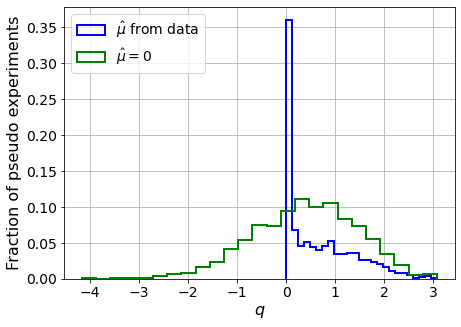

muhat mean:  -0.00962101998251212
Z_bins:  0.6618477906778178
std Z_bins:  0.532584576315183
Z_bins mu=0:  0.6618477906778178
std Z_bins mu=0:  0.8137419956294327

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0815


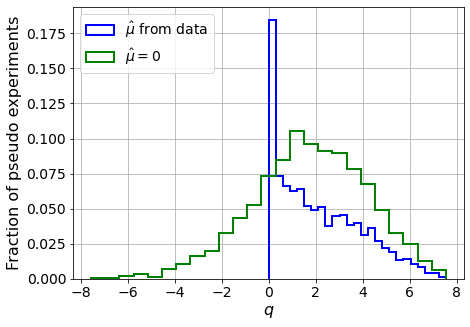

muhat mean:  0.005544551130229243
Z_bins:  1.3414863063534863
std Z_bins:  0.6738521124735959
Z_bins mu=0:  1.3414863063534863
std Z_bins mu=0:  0.8997246346932619

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0775


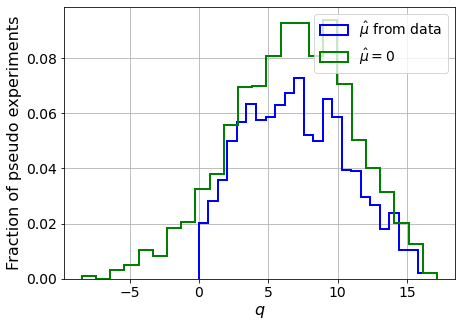

muhat mean:  0.0011413877654431342
Z_bins:  2.620523277730982
std Z_bins:  0.706176008037126
Z_bins mu=0:  2.620523277730982
std Z_bins mu=0:  0.8323055386985478

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.076


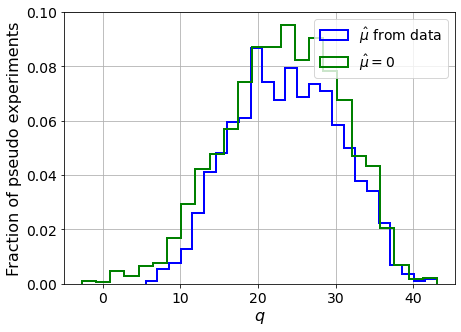

muhat mean:  -0.002500637864969923
Z_bins:  4.867828255460387
std Z_bins:  0.695520341827681
Z_bins mu=0:  4.867791854419969
std Z_bins mu=0:  0.7608276000287566

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0705


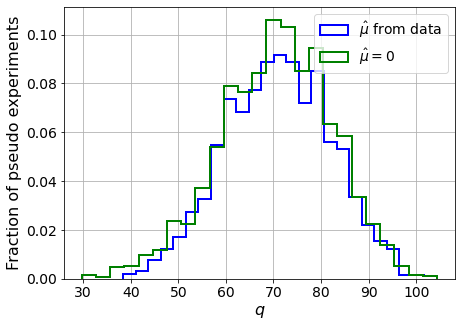

muhat mean:  0.000574618331614144
Z_bins:  8.423374402071005
std Z_bins:  0.6582299479523153
Z_bins mu=0:  8.423374402071005
std Z_bins mu=0:  0.7007148688746871

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.07


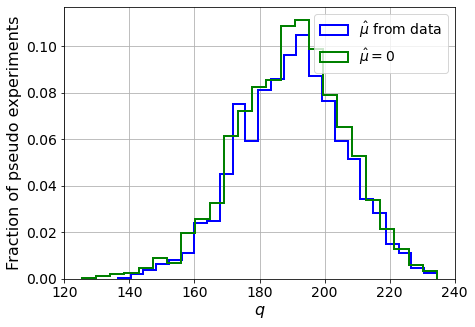

muhat mean:  0.0001440958353673563
Z_bins:  13.790858201830604
std Z_bins:  0.5843851014381174
Z_bins mu=0:  13.789117317551058
std Z_bins mu=0:  0.6096324770575677

--------

B_expected:  643
S_expected:  333

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.082


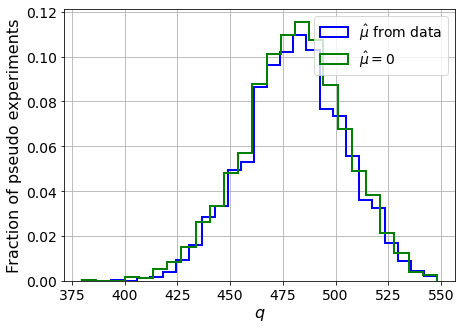

muhat mean:  0.00037901479928904473
Z_bins:  21.93631058367511
std Z_bins:  0.534321194097502
Z_bins mu=0:  21.935875257689915
std Z_bins mu=0:  0.5502873748210898

--------


 FINAL RESULT:

[[0.2271068691467797, 0.5022041209779324, 0.17433387615570858, 0.2271068691467797, 0.880540092188725], [0.23753063019290768, 0.4894534206229462, -0.027295020814155507, 0.23753063019290768, 0.8242461156456125], [0.4522554226623654, 0.5241879703073922, 0.06056839536043371, 0.4522554226623654, 0.8762533453868951], [0.6618477906778178, 0.532584576315183, -0.00962101998251212, 0.6618477906778178, 0.8137419956294327], [1.3414863063534863, 0.6738521124735959, 0.005544551130229243, 1.3414863063534863, 0.8997246346932619], [2.620523277730982, 0.706176008037126, 0.0011413877654431342, 2.620523277730982, 0.8323055386985478], [4.867828255460387, 0.695520341827681, -0.002500637864969923, 4.867791854419969, 0.7608276000287566], [8.423374402071005, 0.6582299479523153, 0.000574618331614144, 8.423374402071005, 0.7

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
          -inf  326.95315761  291.78892532  248.48751705  200.61357237
  145.49044585   86.86394202   24.97057166  -39.4879866  -101.5940811 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 268.12579464 240.822629

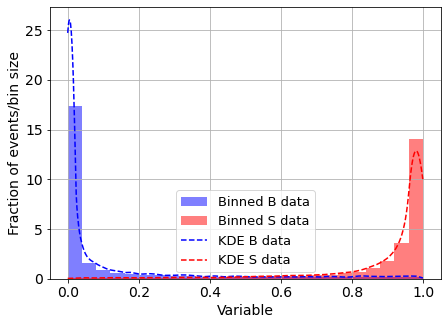

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



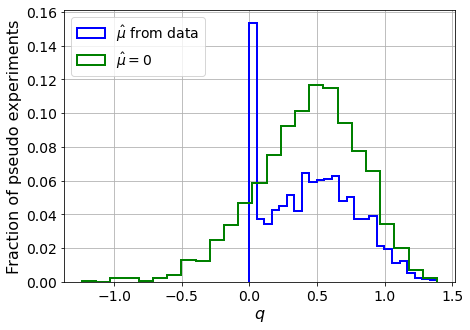

muhat mean:  -5.221437075914535
Z_bins:  0.6896289249307
std Z_bins:  0.23342141783109654
Z_bins mu=0:  0.6896289249307
std Z_bins mu=0:  0.2752620417646828

--------

B_expected:  643
S_expected:  1



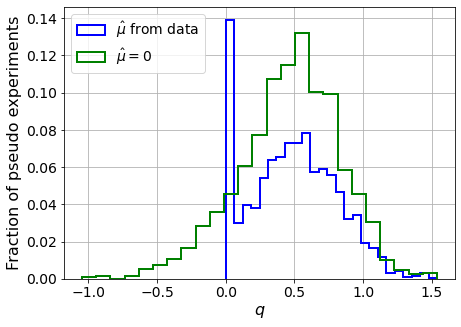

muhat mean:  -5.518151056953257
Z_bins:  0.6997843083718001
std Z_bins:  0.22685467172508825
Z_bins mu=0:  0.6997843083718001
std Z_bins mu=0:  0.26268987959369194

--------

B_expected:  643
S_expected:  2



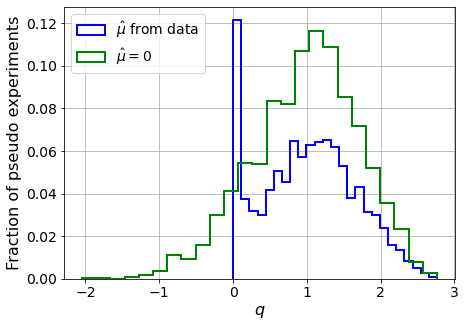

muhat mean:  -2.6145269026886635
Z_bins:  1.0193010258910047
std Z_bins:  0.31502236124806426
Z_bins mu=0:  1.0193010258910047
std Z_bins mu=0:  0.35257022967154406

--------

B_expected:  643
S_expected:  3



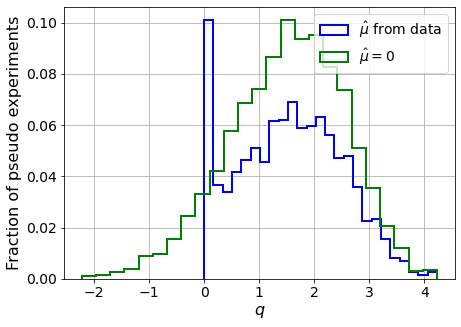

muhat mean:  -1.75451186382855
Z_bins:  1.2556957561958846
std Z_bins:  0.3768569567438264
Z_bins mu=0:  1.2556957561958846
std Z_bins mu=0:  0.4170657076735646

--------

B_expected:  643
S_expected:  7



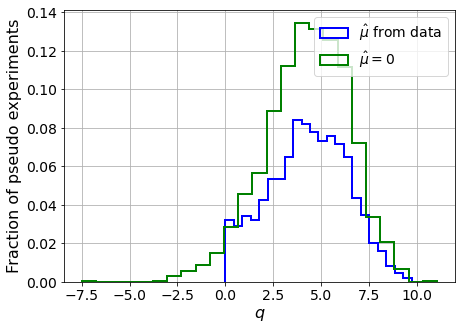

muhat mean:  -0.7550774391479074
Z_bins:  2.0950051461491443
std Z_bins:  0.48805469212804553
Z_bins mu=0:  2.0950051461491443
std Z_bins mu=0:  0.5214709977793295

--------

B_expected:  643
S_expected:  15



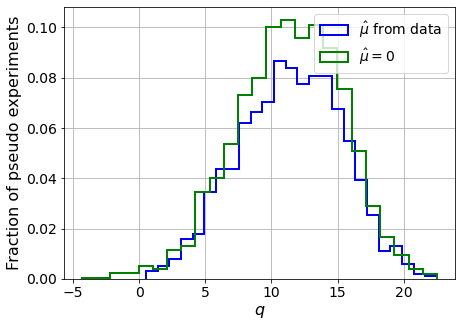

muhat mean:  -0.37807492079635313
Z_bins:  3.397229546330607
std Z_bins:  0.5703371162876966
Z_bins mu=0:  3.397229546330607
std Z_bins mu=0:  0.5894763491719961

--------

B_expected:  643
S_expected:  33



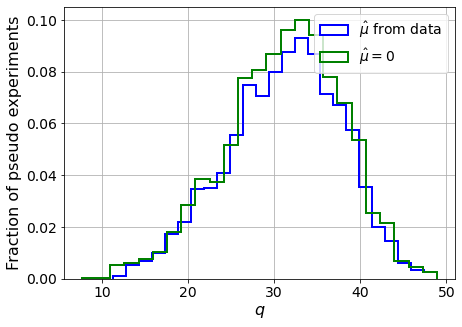

muhat mean:  -0.16865403116303346
Z_bins:  5.621771763733746
std Z_bins:  0.5866307503431986
Z_bins mu=0:  5.621771763733746
std Z_bins mu=0:  0.5973512855760711

--------

B_expected:  643
S_expected:  72



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


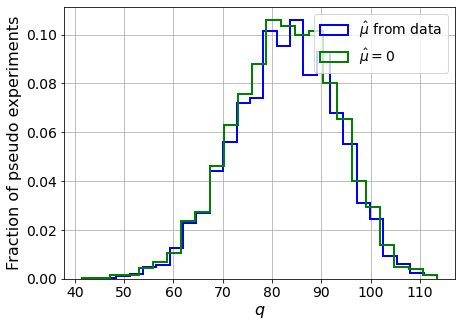

muhat mean:  -0.07468576319458535
Z_bins:  9.115707589365362
std Z_bins:  0.5729648647409084
Z_bins mu=0:  9.115707589365362
std Z_bins mu=0:  0.5791823260040369

--------

B_expected:  643
S_expected:  154



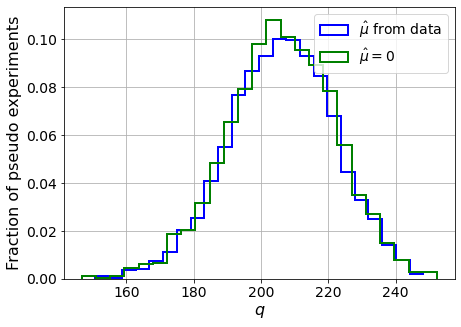

muhat mean:  -0.03912584509421873
Z_bins:  14.367998312292372
std Z_bins:  0.5501137566516721
Z_bins mu=0:  14.367998312292372
std Z_bins mu=0:  0.5542561376799662

--------

B_expected:  643
S_expected:  333



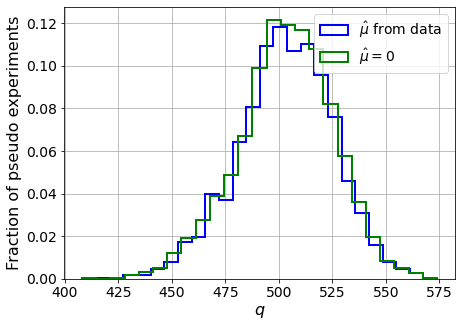

muhat mean:  -0.017211738608647414
Z_bins:  22.443533678443735
std Z_bins:  0.49546368298774124
Z_bins mu=0:  22.443533678443735
std Z_bins mu=0:  0.49857171821577045

--------


 FINAL RESULT:

[[0.6896289249307, 0.23342141783109654, -5.221437075914535, 0.6896289249307, 0.2752620417646828], [0.6997843083718001, 0.22685467172508825, -5.518151056953257, 0.6997843083718001, 0.26268987959369194], [1.0193010258910047, 0.31502236124806426, -2.6145269026886635, 1.0193010258910047, 0.35257022967154406], [1.2556957561958846, 0.3768569567438264, -1.75451186382855, 1.2556957561958846, 0.4170657076735646], [2.0950051461491443, 0.48805469212804553, -0.7550774391479074, 2.0950051461491443, 0.5214709977793295], [3.397229546330607, 0.5703371162876966, -0.37807492079635313, 3.397229546330607, 0.5894763491719961], [5.621771763733746, 0.5866307503431986, -0.16865403116303346, 5.621771763733746, 0.5973512855760711], [9.115707589365362, 0.5729648647409084, -0.07468576319458535, 9.115707589365362, 0.579182

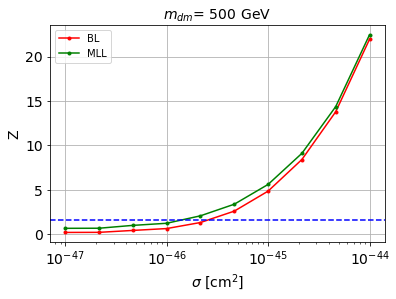


cross_BL_164:  2.6904737476595483e-46
cross_BL_164_up:  1.6084103147768785e-46
cross_BL_164_down:  4.07910714107255e-46

cross_MLL_164:  1.5119171285261578e-46
cross_MLL_164_up:  1.0097614522189295e-46
cross_MLL_164_down:  2.2121352433408003e-46

#########################



In [8]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    # set events per classs
    NUM_DAT = min(len(B_pbot_ER), len(S_pbot))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = round(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, round(NUM_DAT*f_CNNS))
    NUM_DAT_RN = round(NUM_DAT*f_RN)
    NUM_DAT_WALL = round(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    rnd = 100

    B_pbot_plot, B_ptop_plot = shuffle(B_pbot, B_ptop, random_state=rnd)
    S_pbot_plot, S_ptop_plot = shuffle(S_pbot, S_ptop, random_state=rnd)

    plt.plot(B_pbot_plot[:1000], B_ptop_plot[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_pbot_plot[:1000], S_ptop_plot[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)


    
    
    ############
    # DATASETS #
    ############
    
    # concatenate the data
    X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2, np.reshape(B_pdiffT,(len(B_pdiffT),1)) ],axis=1)
    X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2, np.reshape(S_pdiffT,(len(S_pdiffT),1)) ],axis=1)

    # X_mon_B = np.reshape(B_pdiffT,(len(B_pdiffT),1))
    # X_mon_S = np.reshape(S_pdiffT,(len(S_pdiffT),1))
    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





   # OPTION 2 (mu_hat with more precision) (slower,
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)
    
    
    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]




    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [9]:
cross_15feats = store_cross_BL_164
cross_15feats_up = store_cross_BL_164_up
cross_15feats_down = store_cross_BL_164_down

print(cross_15feats)
print(cross_15feats_up)
print(cross_15feats_down)


cross_15feats_MLL = store_cross_MLL_164
cross_15feats_MLL_up = store_cross_MLL_164_up
cross_15feats_MLL_down = store_cross_MLL_164_down

print(cross_15feats_MLL)
print(cross_15feats_MLL_up)
print(cross_15feats_MLL_down)

[1.2289341069509435e-45, 8.079790745383682e-47, 4.303600888065348e-47, 4.1500267313173424e-47, 6.425364010373781e-47, 1.0975740150872903e-46, 2.6904737476595483e-46]
[7.88703784066504e-46, 5.085818375237289e-47, 2.540926392040751e-47, 2.6148992529012526e-47, 3.792567324040162e-47, 6.121114512176996e-47, 1.6084103147768785e-46]
[1.8302196832351552e-45, 1.1715918479219033e-46, 6.167816645930637e-47, 6.257404743198152e-47, 9.586003554304069e-47, 1.6970190894232649e-46, 4.07910714107255e-46]
[7.606022872858135e-46, 4.231249891229255e-47, 2.0711696708636303e-47, 2.1958442671939466e-47, 2.950513356226167e-47, 5.325457961797802e-47, 1.5119171285261578e-46]
[5.035424133753542e-46, 2.566400575841552e-47, 1.2334668198614158e-47, 1.4246368623886192e-47, 1.8578195215235901e-47, 3.2307688531994506e-47, 1.0097614522189295e-46]
[1.1857633781279167e-45, 6.334801970497797e-47, 3.344667985052694e-47, 3.339518198773916e-47, 4.637342933073628e-47, 8.880379634854862e-47, 2.2121352433408003e-46]


In [10]:
np.savetxt('results/15feats.txt', [cross_15feats, cross_15feats_up, cross_15feats_down])
np.savetxt('results/15feats_MLL.txt', [cross_15feats_MLL, cross_15feats_MLL_up, cross_15feats_MLL_down])

In [11]:
cross_15feats = np.loadtxt('results/15feats.txt')[0]
cross_15feats_up = np.loadtxt('results/15feats.txt')[1]
cross_15feats_down =np.loadtxt('results/15feats.txt')[2]

cross_15feats_MLL = np.loadtxt('results/15feats_MLL.txt')[0]
cross_15feats_MLL_up = np.loadtxt('results/15feats_MLL.txt')[1]
cross_15feats_MLL_down = np.loadtxt('results/15feats_MLL.txt')[2]

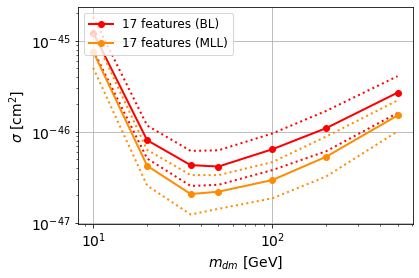

In [12]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_15feats, '-o', color='red', lw=lw, label=r'17 features (BL)')
plt.plot(mDM_mDM, cross_15feats_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_15feats_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_15feats_MLL, '-o', color='darkorange', lw=lw, label=r'17 features (MLL)')
plt.plot(mDM_mDM, cross_15feats_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_15feats_MLL_down, ':', color='darkorange', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

## 2. 14 features (no time diff)


#########################

mDM =  10 GeV


S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)
 NUM_DAT:  20487 

NUM_DAT_ER:  20225
NUM_DAT_AC:  72
NUM_DAT_CNNS:  1
NUM_DAT_RN:  19
NUM_DAT_WALL:  170

B_pbot.shape:  (20487,)
B_ptop.shape:  (20487,)
B_ppeakS1.shape : (20487, 8)
B_ppeakS2.shape:  (20487, 8)

S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 8)
S_ppeakS2.shape:  (20487, 8)


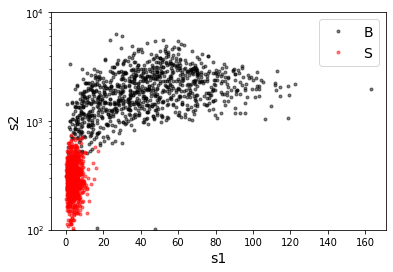

B_pdiffT.shape:  (20487,)
S_pdiffT.shape:  (20487,)


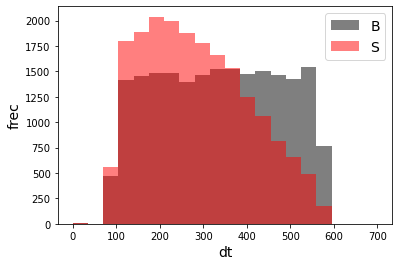

B_pbot.shape:  (20487,)
B_ptop.shape:  (20487,)
B_ppeakS1.shape : (20487, 7)
B_ppeakS2.shape:  (20487, 7)
S_pbot.shape:  (20487,)
S_ptop.shape:  (20487,)
S_ppeakS1.shape : (20487, 7)
S_ppeakS2.shape:  (20487, 7)
X_mon_B.shape:  (20487, 14)
X_mon_S.shape:  (20487, 14)
X_mon.shape:  (40974, 14)

X_mon_train :  (26120, 14)
y_mon_train :  (26120,)
X_mon_val :  (4610, 14)
y_mon_val :  (4610,)
X_mon_test :  (10244, 14)
y_mon_test :  (10244,)

[0]	validation_0-logloss:0.68360	validation_1-logloss:0.68366
[1]	validation_0-logloss:0.67424	validation_1-logloss:0.67435
[2]	validation_0-logloss:0.66505	validation_1-logloss:0.66523
[3]	validation_0-logloss:0.65605	validation_1-logloss:0.65629
[4]	validation_0-logloss:0.64724	validation_1-logloss:0.64751
[5]	validation_0-logloss:0.63857	validation_1-logloss:0.63891
[6]	validation_0-logloss:0.63007	validation_1-logloss:0.63048
[7]	validation_0-logloss:0.62174	validation_1-logloss:0.62220
[8]	validation_0-logloss:0.61354	validation_1-logloss:0.61408
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16]	validation_0-logloss:0.55318	validation_1-logloss:0.55416
[17]	validation_0-logloss:0.54622	validation_1-logloss:0.54726
[18]	validation_0-logloss:0.53937	validation_1-logloss:0.54047
[19]	validation_0-logloss:0.53266	validation_1-logloss:0.53380
[20]	validation_0-logloss:0.52606	validation_1-logloss:0.52725
[21]	validation_0-logloss:0.51956	validation_1-logloss:0.52080
[22]	validation_0-logloss:0.51316	validation_1-logloss:0.51447
[23]	validation_0-logloss:0.50687	validation_1-logloss:0.50823
[24]	validation_0-logloss:0.50070	validation_1-logloss:0.50211
[25]	validation_0-logloss:0.49461	validation_1-logloss:0.49609
[26]	validation_0-logloss:0.48864	validation_1-logloss:0.49015
[27]	validation_0-logloss:0.48276	validation_1-logloss:0.48432
[28]	validation_0-logloss:0.47697	validation_1-logloss:0.47858
[29]	validation_0-logloss:0.47126	validation_1-logloss:0.47294
[30]	validation_0-logloss:0.46566	validation_1-logloss:0.46738
[31]	validation_0-logloss:0.46013	validation_1-logloss:

[146]	validation_0-logloss:0.14483	validation_1-logloss:0.15001
[147]	validation_0-logloss:0.14360	validation_1-logloss:0.14880
[148]	validation_0-logloss:0.14238	validation_1-logloss:0.14759
[149]	validation_0-logloss:0.14117	validation_1-logloss:0.14641
[150]	validation_0-logloss:0.13997	validation_1-logloss:0.14523
[151]	validation_0-logloss:0.13879	validation_1-logloss:0.14407
[152]	validation_0-logloss:0.13762	validation_1-logloss:0.14293
[153]	validation_0-logloss:0.13647	validation_1-logloss:0.14178
[154]	validation_0-logloss:0.13533	validation_1-logloss:0.14067
[155]	validation_0-logloss:0.13420	validation_1-logloss:0.13956
[156]	validation_0-logloss:0.13308	validation_1-logloss:0.13846
[157]	validation_0-logloss:0.13198	validation_1-logloss:0.13738
[158]	validation_0-logloss:0.13090	validation_1-logloss:0.13631
[159]	validation_0-logloss:0.12981	validation_1-logloss:0.13524
[160]	validation_0-logloss:0.12874	validation_1-logloss:0.13419
[161]	validation_0-logloss:0.12768	valid

[275]	validation_0-logloss:0.05889	validation_1-logloss:0.06694
[276]	validation_0-logloss:0.05858	validation_1-logloss:0.06666
[277]	validation_0-logloss:0.05827	validation_1-logloss:0.06638
[278]	validation_0-logloss:0.05797	validation_1-logloss:0.06611
[279]	validation_0-logloss:0.05767	validation_1-logloss:0.06584
[280]	validation_0-logloss:0.05737	validation_1-logloss:0.06557
[281]	validation_0-logloss:0.05707	validation_1-logloss:0.06529
[282]	validation_0-logloss:0.05678	validation_1-logloss:0.06503
[283]	validation_0-logloss:0.05649	validation_1-logloss:0.06477
[284]	validation_0-logloss:0.05621	validation_1-logloss:0.06452
[285]	validation_0-logloss:0.05593	validation_1-logloss:0.06426
[286]	validation_0-logloss:0.05565	validation_1-logloss:0.06401
[287]	validation_0-logloss:0.05536	validation_1-logloss:0.06375
[288]	validation_0-logloss:0.05508	validation_1-logloss:0.06351
[289]	validation_0-logloss:0.05480	validation_1-logloss:0.06325
[290]	validation_0-logloss:0.05453	valid

[404]	validation_0-logloss:0.03588	validation_1-logloss:0.04655
[405]	validation_0-logloss:0.03580	validation_1-logloss:0.04648
[406]	validation_0-logloss:0.03571	validation_1-logloss:0.04641
[407]	validation_0-logloss:0.03562	validation_1-logloss:0.04633
[408]	validation_0-logloss:0.03554	validation_1-logloss:0.04626
[409]	validation_0-logloss:0.03545	validation_1-logloss:0.04618
[410]	validation_0-logloss:0.03537	validation_1-logloss:0.04613
[411]	validation_0-logloss:0.03529	validation_1-logloss:0.04606
[412]	validation_0-logloss:0.03521	validation_1-logloss:0.04598
[413]	validation_0-logloss:0.03512	validation_1-logloss:0.04592
[414]	validation_0-logloss:0.03503	validation_1-logloss:0.04585
[415]	validation_0-logloss:0.03495	validation_1-logloss:0.04578
[416]	validation_0-logloss:0.03488	validation_1-logloss:0.04571
[417]	validation_0-logloss:0.03479	validation_1-logloss:0.04566
[418]	validation_0-logloss:0.03472	validation_1-logloss:0.04560
[419]	validation_0-logloss:0.03464	valid

[533]	validation_0-logloss:0.02852	validation_1-logloss:0.04124
[534]	validation_0-logloss:0.02849	validation_1-logloss:0.04123
[535]	validation_0-logloss:0.02846	validation_1-logloss:0.04121
[536]	validation_0-logloss:0.02841	validation_1-logloss:0.04120
[537]	validation_0-logloss:0.02838	validation_1-logloss:0.04119
[538]	validation_0-logloss:0.02834	validation_1-logloss:0.04118
[539]	validation_0-logloss:0.02831	validation_1-logloss:0.04117
[540]	validation_0-logloss:0.02827	validation_1-logloss:0.04115
[541]	validation_0-logloss:0.02824	validation_1-logloss:0.04113
[542]	validation_0-logloss:0.02821	validation_1-logloss:0.04113
[543]	validation_0-logloss:0.02817	validation_1-logloss:0.04112
[544]	validation_0-logloss:0.02814	validation_1-logloss:0.04110
[545]	validation_0-logloss:0.02811	validation_1-logloss:0.04108
[546]	validation_0-logloss:0.02808	validation_1-logloss:0.04108
[547]	validation_0-logloss:0.02805	validation_1-logloss:0.04107
[548]	validation_0-logloss:0.02802	valid

[662]	validation_0-logloss:0.02515	validation_1-logloss:0.03988
[663]	validation_0-logloss:0.02513	validation_1-logloss:0.03988
[664]	validation_0-logloss:0.02510	validation_1-logloss:0.03988
[665]	validation_0-logloss:0.02508	validation_1-logloss:0.03988
[666]	validation_0-logloss:0.02505	validation_1-logloss:0.03987
[667]	validation_0-logloss:0.02504	validation_1-logloss:0.03987
[668]	validation_0-logloss:0.02501	validation_1-logloss:0.03986
[669]	validation_0-logloss:0.02499	validation_1-logloss:0.03986
[670]	validation_0-logloss:0.02497	validation_1-logloss:0.03987
[671]	validation_0-logloss:0.02494	validation_1-logloss:0.03986
[672]	validation_0-logloss:0.02492	validation_1-logloss:0.03986
[673]	validation_0-logloss:0.02490	validation_1-logloss:0.03986
[674]	validation_0-logloss:0.02488	validation_1-logloss:0.03985
[675]	validation_0-logloss:0.02486	validation_1-logloss:0.03985
[676]	validation_0-logloss:0.02484	validation_1-logloss:0.03985
[677]	validation_0-logloss:0.02483	valid

[791]	validation_0-logloss:0.02324	validation_1-logloss:0.03957
[792]	validation_0-logloss:0.02324	validation_1-logloss:0.03957
[793]	validation_0-logloss:0.02321	validation_1-logloss:0.03957
[794]	validation_0-logloss:0.02320	validation_1-logloss:0.03957
[795]	validation_0-logloss:0.02319	validation_1-logloss:0.03957
[796]	validation_0-logloss:0.02318	validation_1-logloss:0.03956
[797]	validation_0-logloss:0.02315	validation_1-logloss:0.03956
[798]	validation_0-logloss:0.02313	validation_1-logloss:0.03956
[799]	validation_0-logloss:0.02312	validation_1-logloss:0.03957
[800]	validation_0-logloss:0.02309	validation_1-logloss:0.03956
[801]	validation_0-logloss:0.02308	validation_1-logloss:0.03957
[802]	validation_0-logloss:0.02307	validation_1-logloss:0.03956
[803]	validation_0-logloss:0.02306	validation_1-logloss:0.03956
[804]	validation_0-logloss:0.02306	validation_1-logloss:0.03956
[805]	validation_0-logloss:0.02305	validation_1-logloss:0.03956
[806]	validation_0-logloss:0.02302	valid

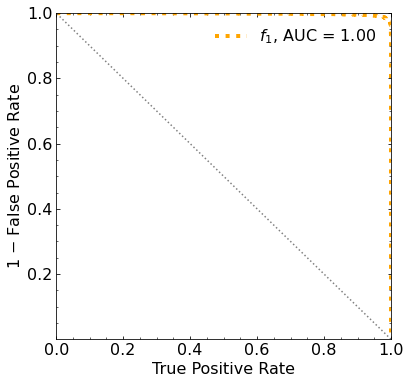

Classification score:


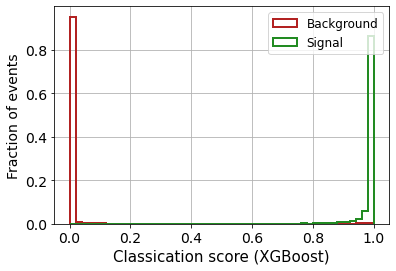


 ROC-AUC =  0.9979666717743824
At least 5 B events per bin, range = [[0, 1]]:
# bins:  2 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  2
range of our data:  [[0, 1]]
number of bins we are going to use:  2
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


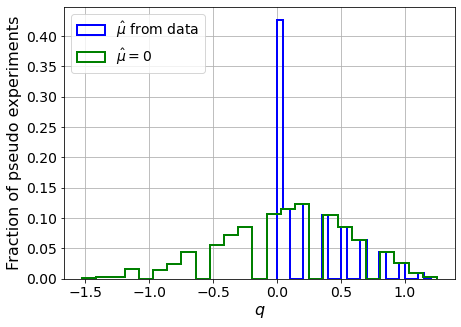

muhat mean:  0.009366084300898917
Z_bins:  0.2881773495260272
std Z_bins:  0.5089213363745
Z_bins mu=0:  0.2881773495260272
std Z_bins mu=0:  0.8614447392717691

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


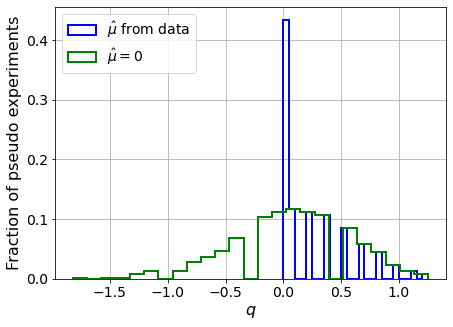

muhat mean:  -0.026376035657999952
Z_bins:  0.2878980205377479
std Z_bins:  0.5249436262535775
Z_bins mu=0:  0.2878980205377479
std Z_bins mu=0:  0.8714865197234986

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0055


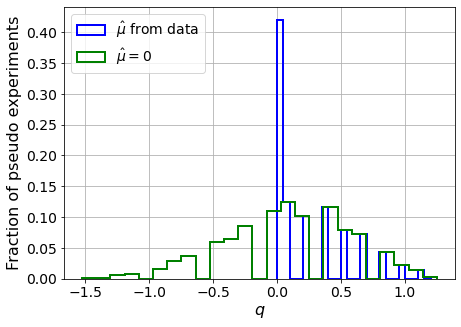

muhat mean:  -0.08553082544116992
Z_bins:  0.2882417716202869
std Z_bins:  0.5178257799255023
Z_bins mu=0:  0.2882417716202869
std Z_bins mu=0:  0.8543109791439796

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0045


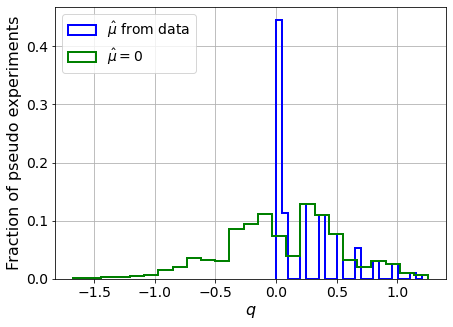

muhat mean:  0.11205184328160633
Z_bins:  0.28763993763337364
std Z_bins:  0.5008495849745027
Z_bins mu=0:  0.28763993763337364
std Z_bins mu=0:  0.8419398320035119

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


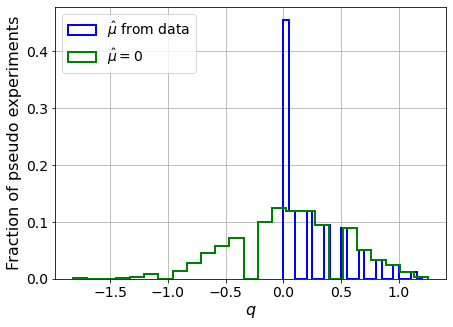

muhat mean:  0.1296151528132474
Z_bins:  0.2872954664534585
std Z_bins:  0.4985189695899423
Z_bins mu=0:  0.2872954664534585
std Z_bins mu=0:  0.8351290944548836

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


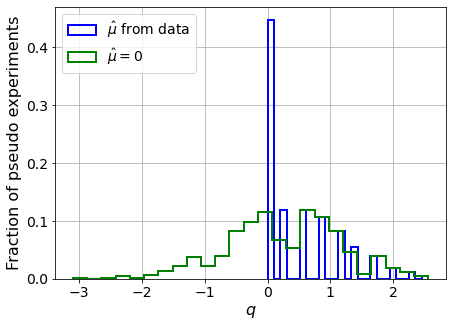

muhat mean:  0.0412126071427122
Z_bins:  0.5432958476328011
std Z_bins:  0.5463076362662054
Z_bins mu=0:  0.5432958476328011
std Z_bins mu=0:  0.8436154911719352

--------

B_expected:  643
S_expected:  5

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


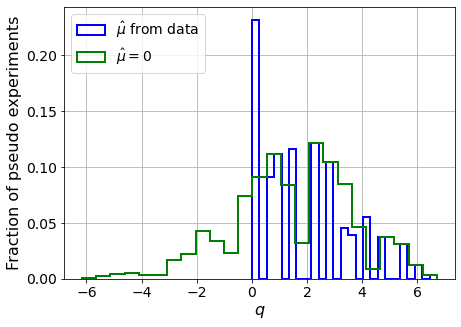

muhat mean:  0.0034416542972405804
Z_bins:  1.2489291368691497
std Z_bins:  0.6471547416714155
Z_bins mu=0:  1.2489291368691497
std Z_bins mu=0:  0.8711299727898238

--------

B_expected:  643
S_expected:  10

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


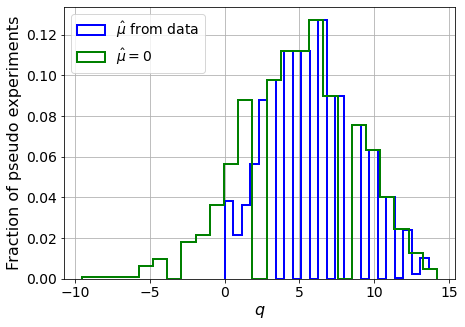

muhat mean:  0.007659436155229338
Z_bins:  2.272310624328144
std Z_bins:  0.6990021105381067
Z_bins mu=0:  2.272310624328144
std Z_bins mu=0:  0.8391768768453683

--------

B_expected:  643
S_expected:  22

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


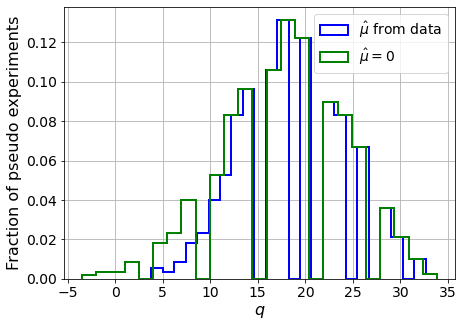

muhat mean:  0.004087835977631428
Z_bins:  4.257748427755811
std Z_bins:  0.6818329346294648
Z_bins mu=0:  4.257748427755811
std Z_bins mu=0:  0.7581768985444123

--------

B_expected:  643
S_expected:  47

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


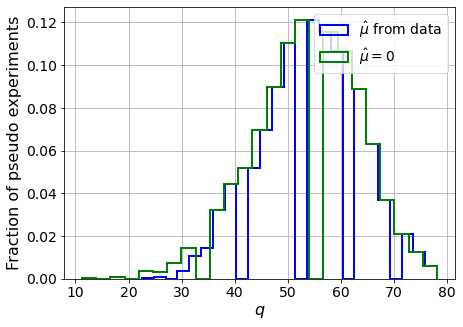

muhat mean:  -0.00013126354634162811
Z_bins:  7.334031954477835
std Z_bins:  0.6492294255185048
Z_bins mu=0:  7.334031954477835
std Z_bins mu=0:  0.694566717245404

--------


 FINAL RESULT:

[[0.2881773495260272, 0.5089213363745, 0.009366084300898917, 0.2881773495260272, 0.8614447392717691], [0.2878980205377479, 0.5249436262535775, -0.026376035657999952, 0.2878980205377479, 0.8714865197234986], [0.2882417716202869, 0.5178257799255023, -0.08553082544116992, 0.2882417716202869, 0.8543109791439796], [0.28763993763337364, 0.5008495849745027, 0.11205184328160633, 0.28763993763337364, 0.8419398320035119], [0.2872954664534585, 0.4985189695899423, 0.1296151528132474, 0.2872954664534585, 0.8351290944548836], [0.5432958476328011, 0.5463076362662054, 0.0412126071427122, 0.5432958476328011, 0.8436154911719352], [1.2489291368691497, 0.6471547416714155, 0.0034416542972405804, 1.2489291368691497, 0.8711299727898238], [2.272310624328144, 0.6990021105381067, 0.007659436155229338, 2.272310624328144, 0.

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 368.41118047
 279.90787246 189.01306958  97.30684388   4.25123489 -84.58636711]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf 350.9939098
 270.

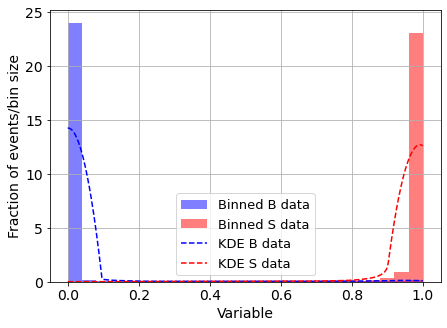

KDE Kernel:  epanechnikov
Background bandwidth:  0.0964296357589577
Signal bandwidth:  0.0964296357589577
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


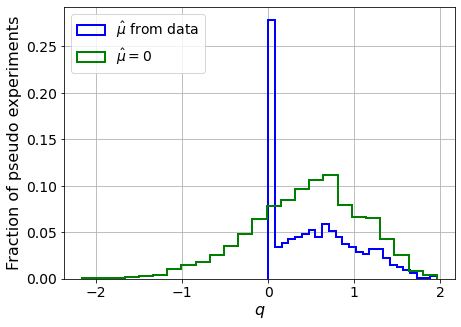

muhat mean:  -4.222859775697715
Z_bins:  0.702947842910006
std Z_bins:  0.34181934151385074
Z_bins mu=0:  0.702947842910006
std Z_bins mu=0:  0.46017430406870663

--------

B_expected:  643
S_expected:  1



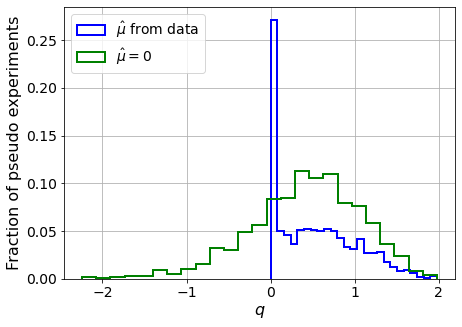

muhat mean:  -2.447659522297954
Z_bins:  0.6781039462323721
std Z_bins:  0.3485898926636803
Z_bins mu=0:  0.6781039462323721
std Z_bins mu=0:  0.48521766906857805

--------

B_expected:  643
S_expected:  1



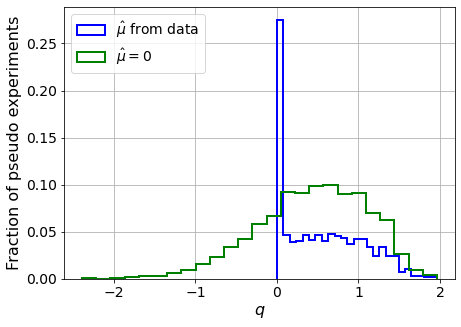

muhat mean:  -1.5379448104140343
Z_bins:  0.6993685512688933
std Z_bins:  0.3506262471844924
Z_bins mu=0:  0.6993685512688933
std Z_bins mu=0:  0.4772961743288919

--------

B_expected:  643
S_expected:  1



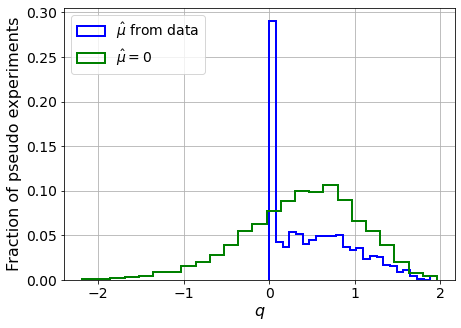

muhat mean:  -4.6049984060109015
Z_bins:  0.6672397166129692
std Z_bins:  0.35442241649048106
Z_bins mu=0:  0.6672397166129692
std Z_bins mu=0:  0.4980436283134925

--------

B_expected:  643
S_expected:  1



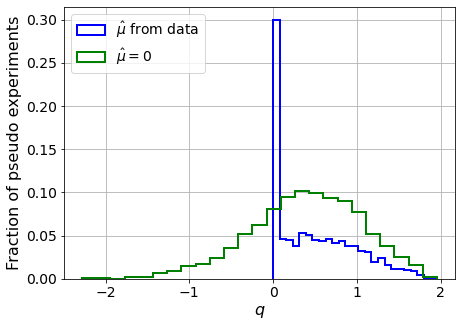

muhat mean:  -1.6484581723316094
Z_bins:  0.6495330894425184
std Z_bins:  0.36773282695621295
Z_bins mu=0:  0.6495330894425184
std Z_bins mu=0:  0.5057688136378561

--------

B_expected:  643
S_expected:  2



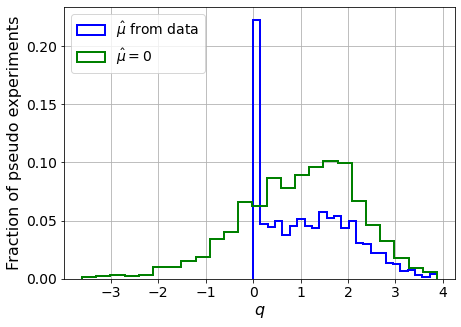

muhat mean:  -0.9391015739899995
Z_bins:  1.04582676452278
std Z_bins:  0.44897996780123256
Z_bins mu=0:  1.04582676452278
std Z_bins mu=0:  0.5844383716934657

--------

B_expected:  643
S_expected:  5



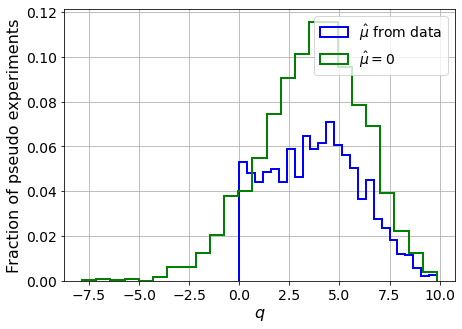

muhat mean:  -0.4625288913858915
Z_bins:  1.9506758882127369
std Z_bins:  0.5636469003098173
Z_bins mu=0:  1.9506758882127369
std Z_bins mu=0:  0.6511758211271038

--------

B_expected:  643
S_expected:  10



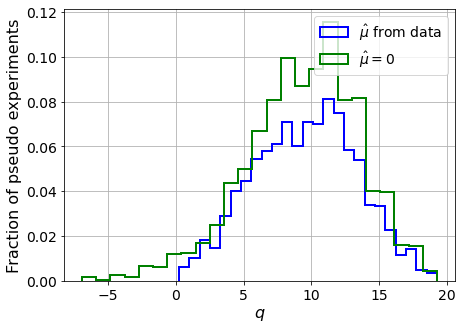

muhat mean:  -0.25639871637270906
Z_bins:  3.114235527290961
std Z_bins:  0.6062461566791268
Z_bins mu=0:  3.114235527290961
std Z_bins mu=0:  0.6711654713810514

--------

B_expected:  643
S_expected:  22



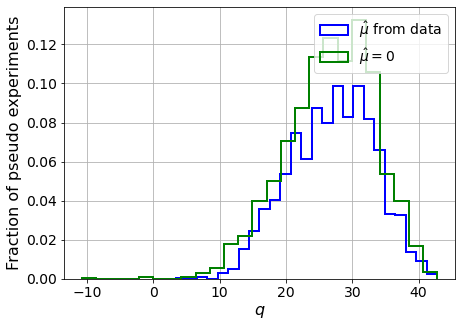

muhat mean:  -0.07694583938631616
Z_bins:  5.219035456136484
std Z_bins:  0.6018275340760926
Z_bins mu=0:  5.219035456136484
std Z_bins mu=0:  0.6401239528208084

--------

B_expected:  643
S_expected:  47



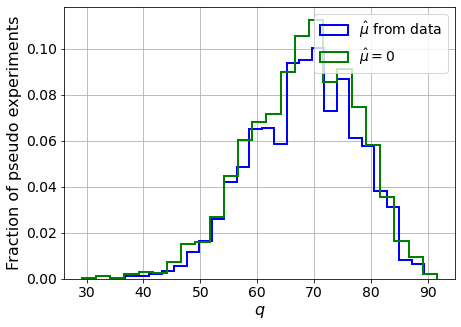

muhat mean:  -0.07196024353506955
Z_bins:  8.294565055238978
std Z_bins:  0.5486712948230867
Z_bins mu=0:  8.294565055238978
std Z_bins mu=0:  0.5707442623134751

--------


 FINAL RESULT:

[[0.702947842910006, 0.34181934151385074, -4.222859775697715, 0.702947842910006, 0.46017430406870663], [0.6781039462323721, 0.3485898926636803, -2.447659522297954, 0.6781039462323721, 0.48521766906857805], [0.6993685512688933, 0.3506262471844924, -1.5379448104140343, 0.6993685512688933, 0.4772961743288919], [0.6672397166129692, 0.35442241649048106, -4.6049984060109015, 0.6672397166129692, 0.4980436283134925], [0.6495330894425184, 0.36773282695621295, -1.6484581723316094, 0.6495330894425184, 0.5057688136378561], [1.04582676452278, 0.44897996780123256, -0.9391015739899995, 1.04582676452278, 0.5844383716934657], [1.9506758882127369, 0.5636469003098173, -0.4625288913858915, 1.9506758882127369, 0.6511758211271038], [3.114235527290961, 0.6062461566791268, -0.25639871637270906, 3.114235527290961, 0.6711654

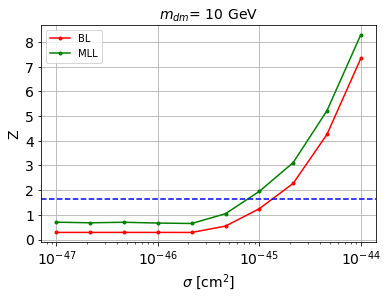


cross_BL_164:  1.4143880331339923e-45
cross_BL_164_up:  8.04456885247962e-46
cross_BL_164_down:  2.2313889741792652e-45

cross_MLL_164:  7.865233864866333e-46
cross_MLL_164_up:  5.300399417355181e-46
cross_MLL_164_down:  1.2290945852010476e-45

#########################


#########################

mDM =  20 GeV


S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)
 NUM_DAT:  27311 

NUM_DAT_ER:  26962
NUM_DAT_AC:  96
NUM_DAT_CNNS:  1
NUM_DAT_RN:  25
NUM_DAT_WALL:  227

B_pbot.shape:  (27311,)
B_ptop.shape:  (27311,)
B_ppeakS1.shape : (27311, 8)
B_ppeakS2.shape:  (27311, 8)

S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 8)
S_ppeakS2.shape:  (27311, 8)


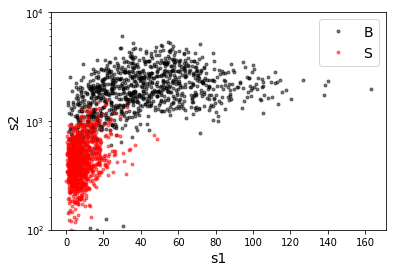

B_pdiffT.shape:  (27311,)
S_pdiffT.shape:  (27311,)


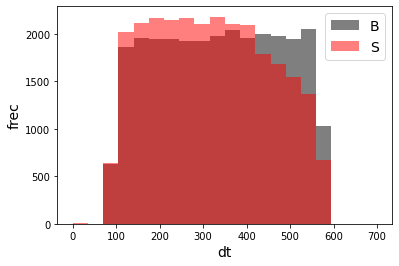

B_pbot.shape:  (27311,)
B_ptop.shape:  (27311,)
B_ppeakS1.shape : (27311, 7)
B_ppeakS2.shape:  (27311, 7)
S_pbot.shape:  (27311,)
S_ptop.shape:  (27311,)
S_ppeakS1.shape : (27311, 7)
S_ppeakS2.shape:  (27311, 7)
X_mon_B.shape:  (27311, 14)
X_mon_S.shape:  (27311, 14)
X_mon.shape:  (54622, 14)

X_mon_train :  (34821, 14)
y_mon_train :  (34821,)
X_mon_val :  (6145, 14)
y_mon_val :  (6145,)
X_mon_test :  (13656, 14)
y_mon_test :  (13656,)

[0]	validation_0-logloss:0.68473	validation_1-logloss:0.68478
[1]	validation_0-logloss:0.67646	validation_1-logloss:0.67657
[2]	validation_0-logloss:0.66836	validation_1-logloss:0.66853
[3]	validation_0-logloss:0.66041	validation_1-logloss:0.66064
[4]	validation_0-logloss:0.65261	validation_1-logloss:0.65290
[5]	validation_0-logloss:0.64497	validation_1-logloss:0.64532
[6]	validation_0-logloss:0.63748	validation_1-logloss:0.63786
[7]	validation_0-logloss:0.63012	validation_1-logloss:0.63056
[8]	validation_0-logloss:0.62289	validation_1-logloss:0.62338
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13]	validation_0-logloss:0.58869	validation_1-logloss:0.58942
[14]	validation_0-logloss:0.58221	validation_1-logloss:0.58299
[15]	validation_0-logloss:0.57585	validation_1-logloss:0.57668
[16]	validation_0-logloss:0.56957	validation_1-logloss:0.57044
[17]	validation_0-logloss:0.56342	validation_1-logloss:0.56434
[18]	validation_0-logloss:0.55738	validation_1-logloss:0.55836
[19]	validation_0-logloss:0.55142	validation_1-logloss:0.55244
[20]	validation_0-logloss:0.54559	validation_1-logloss:0.54665
[21]	validation_0-logloss:0.53983	validation_1-logloss:0.54092
[22]	validation_0-logloss:0.53419	validation_1-logloss:0.53534
[23]	validation_0-logloss:0.52864	validation_1-logloss:0.52984
[24]	validation_0-logloss:0.52317	validation_1-logloss:0.52439
[25]	validation_0-logloss:0.51779	validation_1-logloss:0.51906
[26]	validation_0-logloss:0.51249	validation_1-logloss:0.51379
[27]	validation_0-logloss:0.50729	validation_1-logloss:0.50864
[28]	validation_0-logloss:0.50218	validation_1-logloss:

[143]	validation_0-logloss:0.21289	validation_1-logloss:0.21708
[144]	validation_0-logloss:0.21178	validation_1-logloss:0.21599
[145]	validation_0-logloss:0.21069	validation_1-logloss:0.21492
[146]	validation_0-logloss:0.20959	validation_1-logloss:0.21384
[147]	validation_0-logloss:0.20852	validation_1-logloss:0.21278
[148]	validation_0-logloss:0.20745	validation_1-logloss:0.21173
[149]	validation_0-logloss:0.20640	validation_1-logloss:0.21069
[150]	validation_0-logloss:0.20536	validation_1-logloss:0.20967
[151]	validation_0-logloss:0.20435	validation_1-logloss:0.20867
[152]	validation_0-logloss:0.20334	validation_1-logloss:0.20767
[153]	validation_0-logloss:0.20233	validation_1-logloss:0.20668
[154]	validation_0-logloss:0.20134	validation_1-logloss:0.20571
[155]	validation_0-logloss:0.20037	validation_1-logloss:0.20474
[156]	validation_0-logloss:0.19940	validation_1-logloss:0.20379
[157]	validation_0-logloss:0.19846	validation_1-logloss:0.20285
[158]	validation_0-logloss:0.19751	valid

[272]	validation_0-logloss:0.13609	validation_1-logloss:0.14243
[273]	validation_0-logloss:0.13581	validation_1-logloss:0.14218
[274]	validation_0-logloss:0.13552	validation_1-logloss:0.14192
[275]	validation_0-logloss:0.13525	validation_1-logloss:0.14166
[276]	validation_0-logloss:0.13498	validation_1-logloss:0.14140
[277]	validation_0-logloss:0.13472	validation_1-logloss:0.14115
[278]	validation_0-logloss:0.13446	validation_1-logloss:0.14091
[279]	validation_0-logloss:0.13418	validation_1-logloss:0.14067
[280]	validation_0-logloss:0.13391	validation_1-logloss:0.14043
[281]	validation_0-logloss:0.13366	validation_1-logloss:0.14017
[282]	validation_0-logloss:0.13341	validation_1-logloss:0.13994
[283]	validation_0-logloss:0.13316	validation_1-logloss:0.13971
[284]	validation_0-logloss:0.13290	validation_1-logloss:0.13949
[285]	validation_0-logloss:0.13265	validation_1-logloss:0.13926
[286]	validation_0-logloss:0.13241	validation_1-logloss:0.13903
[287]	validation_0-logloss:0.13217	valid

[401]	validation_0-logloss:0.11476	validation_1-logloss:0.12332
[402]	validation_0-logloss:0.11466	validation_1-logloss:0.12323
[403]	validation_0-logloss:0.11456	validation_1-logloss:0.12314
[404]	validation_0-logloss:0.11447	validation_1-logloss:0.12307
[405]	validation_0-logloss:0.11437	validation_1-logloss:0.12298
[406]	validation_0-logloss:0.11427	validation_1-logloss:0.12289
[407]	validation_0-logloss:0.11418	validation_1-logloss:0.12284
[408]	validation_0-logloss:0.11408	validation_1-logloss:0.12275
[409]	validation_0-logloss:0.11400	validation_1-logloss:0.12269
[410]	validation_0-logloss:0.11391	validation_1-logloss:0.12262
[411]	validation_0-logloss:0.11383	validation_1-logloss:0.12257
[412]	validation_0-logloss:0.11374	validation_1-logloss:0.12250
[413]	validation_0-logloss:0.11365	validation_1-logloss:0.12244
[414]	validation_0-logloss:0.11357	validation_1-logloss:0.12238
[415]	validation_0-logloss:0.11350	validation_1-logloss:0.12234
[416]	validation_0-logloss:0.11340	valid

[530]	validation_0-logloss:0.10693	validation_1-logloss:0.11751
[531]	validation_0-logloss:0.10690	validation_1-logloss:0.11749
[532]	validation_0-logloss:0.10686	validation_1-logloss:0.11746
[533]	validation_0-logloss:0.10683	validation_1-logloss:0.11743
[534]	validation_0-logloss:0.10678	validation_1-logloss:0.11740
[535]	validation_0-logloss:0.10672	validation_1-logloss:0.11737
[536]	validation_0-logloss:0.10668	validation_1-logloss:0.11733
[537]	validation_0-logloss:0.10664	validation_1-logloss:0.11731
[538]	validation_0-logloss:0.10659	validation_1-logloss:0.11727
[539]	validation_0-logloss:0.10654	validation_1-logloss:0.11723
[540]	validation_0-logloss:0.10649	validation_1-logloss:0.11721
[541]	validation_0-logloss:0.10645	validation_1-logloss:0.11718
[542]	validation_0-logloss:0.10640	validation_1-logloss:0.11715
[543]	validation_0-logloss:0.10637	validation_1-logloss:0.11713
[544]	validation_0-logloss:0.10632	validation_1-logloss:0.11712
[545]	validation_0-logloss:0.10630	valid

[659]	validation_0-logloss:0.10236	validation_1-logloss:0.11524
[660]	validation_0-logloss:0.10233	validation_1-logloss:0.11523
[661]	validation_0-logloss:0.10230	validation_1-logloss:0.11523
[662]	validation_0-logloss:0.10227	validation_1-logloss:0.11522
[663]	validation_0-logloss:0.10223	validation_1-logloss:0.11521
[664]	validation_0-logloss:0.10220	validation_1-logloss:0.11520
[665]	validation_0-logloss:0.10216	validation_1-logloss:0.11518
[666]	validation_0-logloss:0.10215	validation_1-logloss:0.11518
[667]	validation_0-logloss:0.10212	validation_1-logloss:0.11518
[668]	validation_0-logloss:0.10210	validation_1-logloss:0.11517
[669]	validation_0-logloss:0.10207	validation_1-logloss:0.11516
[670]	validation_0-logloss:0.10204	validation_1-logloss:0.11515
[671]	validation_0-logloss:0.10200	validation_1-logloss:0.11514
[672]	validation_0-logloss:0.10197	validation_1-logloss:0.11513
[673]	validation_0-logloss:0.10195	validation_1-logloss:0.11513
[674]	validation_0-logloss:0.10193	valid

[788]	validation_0-logloss:0.09901	validation_1-logloss:0.11421
[789]	validation_0-logloss:0.09898	validation_1-logloss:0.11421
[790]	validation_0-logloss:0.09897	validation_1-logloss:0.11420
[791]	validation_0-logloss:0.09894	validation_1-logloss:0.11419
[792]	validation_0-logloss:0.09892	validation_1-logloss:0.11419
[793]	validation_0-logloss:0.09889	validation_1-logloss:0.11417
[794]	validation_0-logloss:0.09888	validation_1-logloss:0.11417
[795]	validation_0-logloss:0.09886	validation_1-logloss:0.11416
[796]	validation_0-logloss:0.09884	validation_1-logloss:0.11416
[797]	validation_0-logloss:0.09881	validation_1-logloss:0.11416
[798]	validation_0-logloss:0.09878	validation_1-logloss:0.11417
[799]	validation_0-logloss:0.09875	validation_1-logloss:0.11416
[800]	validation_0-logloss:0.09874	validation_1-logloss:0.11416
[801]	validation_0-logloss:0.09872	validation_1-logloss:0.11416
[802]	validation_0-logloss:0.09870	validation_1-logloss:0.11415
[803]	validation_0-logloss:0.09868	valid

[917]	validation_0-logloss:0.09587	validation_1-logloss:0.11347
[918]	validation_0-logloss:0.09584	validation_1-logloss:0.11346
[919]	validation_0-logloss:0.09583	validation_1-logloss:0.11346
[920]	validation_0-logloss:0.09578	validation_1-logloss:0.11343
[921]	validation_0-logloss:0.09575	validation_1-logloss:0.11342
[922]	validation_0-logloss:0.09571	validation_1-logloss:0.11342
[923]	validation_0-logloss:0.09567	validation_1-logloss:0.11342
[924]	validation_0-logloss:0.09566	validation_1-logloss:0.11341
[925]	validation_0-logloss:0.09563	validation_1-logloss:0.11341
[926]	validation_0-logloss:0.09559	validation_1-logloss:0.11340
[927]	validation_0-logloss:0.09557	validation_1-logloss:0.11340
[928]	validation_0-logloss:0.09556	validation_1-logloss:0.11339
[929]	validation_0-logloss:0.09555	validation_1-logloss:0.11339
[930]	validation_0-logloss:0.09552	validation_1-logloss:0.11338
[931]	validation_0-logloss:0.09550	validation_1-logloss:0.11338
[932]	validation_0-logloss:0.09549	valid

[1045]	validation_0-logloss:0.09303	validation_1-logloss:0.11300
[1046]	validation_0-logloss:0.09302	validation_1-logloss:0.11300
[1047]	validation_0-logloss:0.09300	validation_1-logloss:0.11298
[1048]	validation_0-logloss:0.09298	validation_1-logloss:0.11297
[1049]	validation_0-logloss:0.09296	validation_1-logloss:0.11297
[1050]	validation_0-logloss:0.09293	validation_1-logloss:0.11297
[1051]	validation_0-logloss:0.09292	validation_1-logloss:0.11297
[1052]	validation_0-logloss:0.09289	validation_1-logloss:0.11296
[1053]	validation_0-logloss:0.09286	validation_1-logloss:0.11297
[1054]	validation_0-logloss:0.09284	validation_1-logloss:0.11296
[1055]	validation_0-logloss:0.09283	validation_1-logloss:0.11296
[1056]	validation_0-logloss:0.09282	validation_1-logloss:0.11296
[1057]	validation_0-logloss:0.09281	validation_1-logloss:0.11295
[1058]	validation_0-logloss:0.09278	validation_1-logloss:0.11295
[1059]	validation_0-logloss:0.09277	validation_1-logloss:0.11293
[1060]	validation_0-loglo

[1172]	validation_0-logloss:0.09035	validation_1-logloss:0.11255
[1173]	validation_0-logloss:0.09032	validation_1-logloss:0.11255
[1174]	validation_0-logloss:0.09030	validation_1-logloss:0.11255
[1175]	validation_0-logloss:0.09028	validation_1-logloss:0.11254
[1176]	validation_0-logloss:0.09027	validation_1-logloss:0.11254
[1177]	validation_0-logloss:0.09024	validation_1-logloss:0.11254
[1178]	validation_0-logloss:0.09022	validation_1-logloss:0.11253
[1179]	validation_0-logloss:0.09020	validation_1-logloss:0.11252
[1180]	validation_0-logloss:0.09017	validation_1-logloss:0.11253
[1181]	validation_0-logloss:0.09014	validation_1-logloss:0.11252
[1182]	validation_0-logloss:0.09011	validation_1-logloss:0.11250
[1183]	validation_0-logloss:0.09010	validation_1-logloss:0.11249
[1184]	validation_0-logloss:0.09007	validation_1-logloss:0.11251
[1185]	validation_0-logloss:0.09004	validation_1-logloss:0.11250
[1186]	validation_0-logloss:0.09002	validation_1-logloss:0.11250
[1187]	validation_0-loglo

[1299]	validation_0-logloss:0.08775	validation_1-logloss:0.11216
[1300]	validation_0-logloss:0.08775	validation_1-logloss:0.11216
[1301]	validation_0-logloss:0.08773	validation_1-logloss:0.11216
[1302]	validation_0-logloss:0.08772	validation_1-logloss:0.11215
[1303]	validation_0-logloss:0.08770	validation_1-logloss:0.11215
[1304]	validation_0-logloss:0.08767	validation_1-logloss:0.11214
[1305]	validation_0-logloss:0.08764	validation_1-logloss:0.11212
[1306]	validation_0-logloss:0.08763	validation_1-logloss:0.11212
[1307]	validation_0-logloss:0.08762	validation_1-logloss:0.11212
[1308]	validation_0-logloss:0.08761	validation_1-logloss:0.11212
[1309]	validation_0-logloss:0.08759	validation_1-logloss:0.11211
[1310]	validation_0-logloss:0.08756	validation_1-logloss:0.11212
[1311]	validation_0-logloss:0.08755	validation_1-logloss:0.11212
[1312]	validation_0-logloss:0.08753	validation_1-logloss:0.11213
[1313]	validation_0-logloss:0.08751	validation_1-logloss:0.11212
[1314]	validation_0-loglo

[1426]	validation_0-logloss:0.08529	validation_1-logloss:0.11186
[1427]	validation_0-logloss:0.08528	validation_1-logloss:0.11186
[1428]	validation_0-logloss:0.08526	validation_1-logloss:0.11185
[1429]	validation_0-logloss:0.08525	validation_1-logloss:0.11186
[1430]	validation_0-logloss:0.08521	validation_1-logloss:0.11186
[1431]	validation_0-logloss:0.08519	validation_1-logloss:0.11185
[1432]	validation_0-logloss:0.08518	validation_1-logloss:0.11185
[1433]	validation_0-logloss:0.08517	validation_1-logloss:0.11185
[1434]	validation_0-logloss:0.08515	validation_1-logloss:0.11185
[1435]	validation_0-logloss:0.08514	validation_1-logloss:0.11185
[1436]	validation_0-logloss:0.08513	validation_1-logloss:0.11184
[1437]	validation_0-logloss:0.08509	validation_1-logloss:0.11184
[1438]	validation_0-logloss:0.08507	validation_1-logloss:0.11183
[1439]	validation_0-logloss:0.08506	validation_1-logloss:0.11182
[1440]	validation_0-logloss:0.08503	validation_1-logloss:0.11182
[1441]	validation_0-loglo

[1553]	validation_0-logloss:0.08285	validation_1-logloss:0.11160
[1554]	validation_0-logloss:0.08284	validation_1-logloss:0.11160
[1555]	validation_0-logloss:0.08282	validation_1-logloss:0.11160
[1556]	validation_0-logloss:0.08281	validation_1-logloss:0.11161
[1557]	validation_0-logloss:0.08277	validation_1-logloss:0.11160
[1558]	validation_0-logloss:0.08276	validation_1-logloss:0.11160
[1559]	validation_0-logloss:0.08274	validation_1-logloss:0.11159
[1560]	validation_0-logloss:0.08272	validation_1-logloss:0.11159
[1561]	validation_0-logloss:0.08270	validation_1-logloss:0.11157
[1562]	validation_0-logloss:0.08268	validation_1-logloss:0.11157
[1563]	validation_0-logloss:0.08266	validation_1-logloss:0.11156
[1564]	validation_0-logloss:0.08265	validation_1-logloss:0.11156
[1565]	validation_0-logloss:0.08263	validation_1-logloss:0.11156
[1566]	validation_0-logloss:0.08261	validation_1-logloss:0.11155
[1567]	validation_0-logloss:0.08260	validation_1-logloss:0.11155
[1568]	validation_0-loglo

[1680]	validation_0-logloss:0.08059	validation_1-logloss:0.11134
[1681]	validation_0-logloss:0.08058	validation_1-logloss:0.11134
[1682]	validation_0-logloss:0.08055	validation_1-logloss:0.11134
[1683]	validation_0-logloss:0.08054	validation_1-logloss:0.11134
[1684]	validation_0-logloss:0.08050	validation_1-logloss:0.11133
[1685]	validation_0-logloss:0.08049	validation_1-logloss:0.11132
[1686]	validation_0-logloss:0.08047	validation_1-logloss:0.11132
[1687]	validation_0-logloss:0.08045	validation_1-logloss:0.11131
[1688]	validation_0-logloss:0.08043	validation_1-logloss:0.11131
[1689]	validation_0-logloss:0.08042	validation_1-logloss:0.11131
[1690]	validation_0-logloss:0.08039	validation_1-logloss:0.11131
[1691]	validation_0-logloss:0.08038	validation_1-logloss:0.11130
[1692]	validation_0-logloss:0.08035	validation_1-logloss:0.11130
[1693]	validation_0-logloss:0.08033	validation_1-logloss:0.11130
[1694]	validation_0-logloss:0.08033	validation_1-logloss:0.11130
[1695]	validation_0-loglo

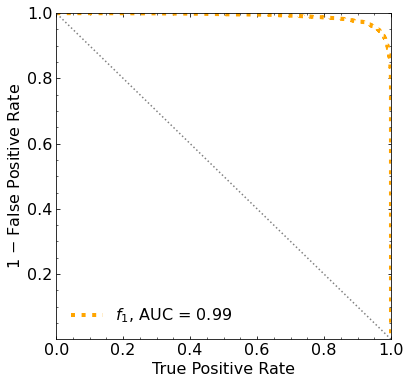

Classification score:


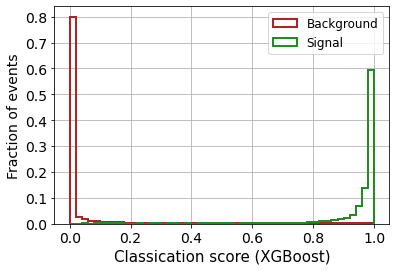


 ROC-AUC =  0.9903964596240026
At least 5 B events per bin, range = [[0, 1]]:
# bins:  11 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  11
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.773


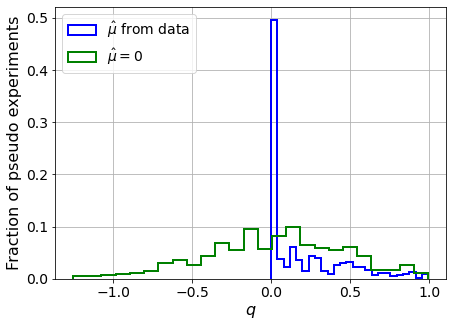

muhat mean:  0.26326955169089483
Z_bins:  0.21063534917980975
std Z_bins:  0.6014030768491746
Z_bins mu=0:  0.20709244496165446
std Z_bins mu=0:  1.0610527141583788

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.7585


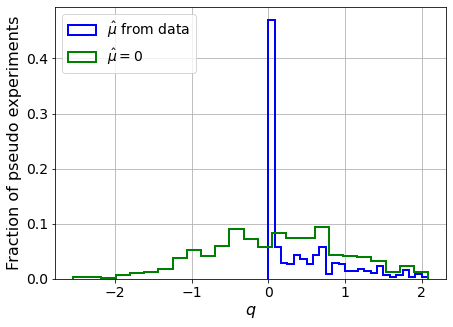

muhat mean:  0.2975887072824796
Z_bins:  0.3627754036396743
std Z_bins:  0.7203345007469039
Z_bins mu=0:  0.3420091694827927
std Z_bins mu=0:  1.277751821131459

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.762


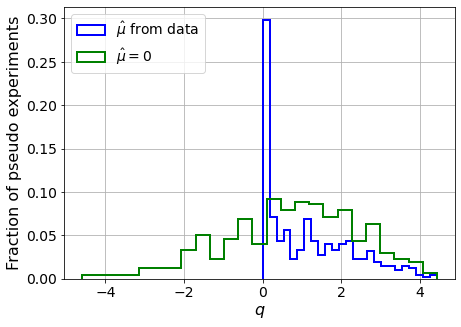

muhat mean:  0.06218494211672861
Z_bins:  0.983963647160637
std Z_bins:  0.5736506995609181
Z_bins mu=0:  0.983963647160637
std Z_bins mu=0:  0.864417878182486

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.7625


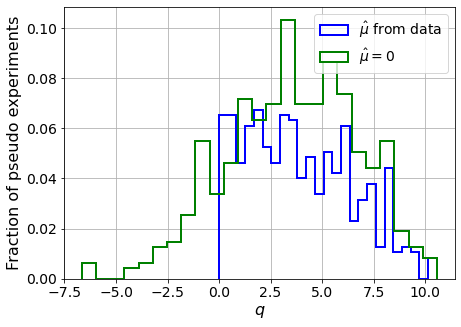

muhat mean:  0.006514368424558269
Z_bins:  1.8967037953347845
std Z_bins:  0.6771850282552738
Z_bins mu=0:  1.8964498372512202
std Z_bins mu=0:  0.831259237478778

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.7595


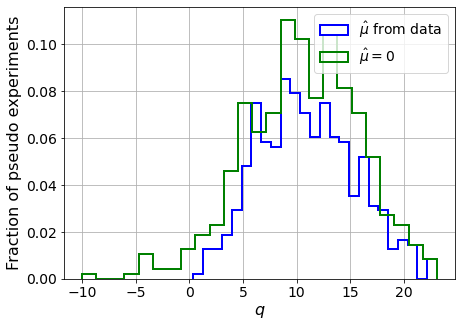

muhat mean:  0.03084868862127468
Z_bins:  3.260011702923486
std Z_bins:  0.6907705405118364
Z_bins mu=0:  3.2576376502271747
std Z_bins mu=0:  0.8076749337867408

--------

B_expected:  643
S_expected:  40

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.7635


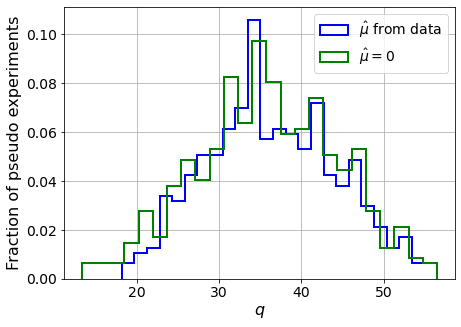

muhat mean:  0.01307135965831756
Z_bins:  5.976169182593035
std Z_bins:  0.6575524499491954
Z_bins mu=0:  5.974149462087089
std Z_bins mu=0:  0.7124262336341565

--------

B_expected:  643
S_expected:  85

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.7545


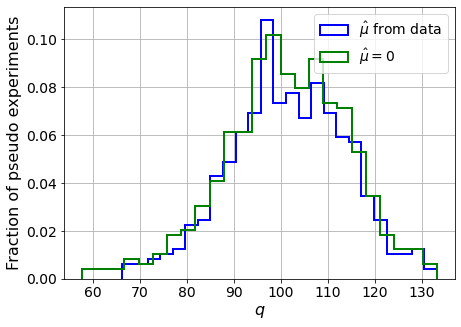

muhat mean:  0.004354573363653951
Z_bins:  10.062883109582588
std Z_bins:  0.6120035230678993
Z_bins mu=0:  10.062155930615518
std Z_bins mu=0:  0.6528744066523031

--------

B_expected:  643
S_expected:  184

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.767


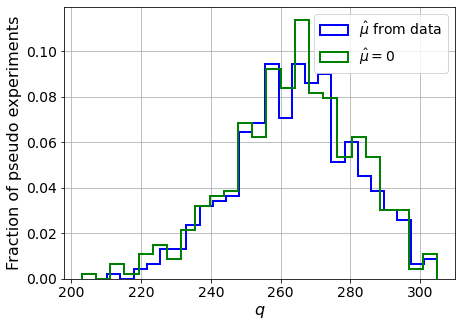

muhat mean:  0.0010813227470722405
Z_bins:  16.279930912327735
std Z_bins:  0.525399762807145
Z_bins mu=0:  16.279803486744935
std Z_bins mu=0:  0.5481435256597496

--------

B_expected:  643
S_expected:  396

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.761


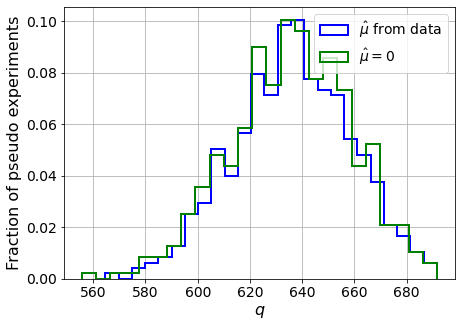

muhat mean:  0.001127804397009923
Z_bins:  25.22954106309029
std Z_bins:  0.44122747796351997
Z_bins mu=0:  25.229143751850724
std Z_bins mu=0:  0.45597187330152

--------

B_expected:  643
S_expected:  854

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.7635


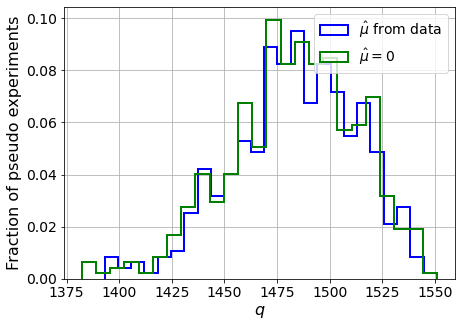

muhat mean:  0.0008030432402462794
Z_bins:  38.53336231639051
std Z_bins:  0.38411785683481353
Z_bins mu=0:  38.531098441077795
std Z_bins mu=0:  0.39570232630646096

--------


 FINAL RESULT:

[[0.21063534917980975, 0.6014030768491746, 0.26326955169089483, 0.20709244496165446, 1.0610527141583788], [0.3627754036396743, 0.7203345007469039, 0.2975887072824796, 0.3420091694827927, 1.277751821131459], [0.983963647160637, 0.5736506995609181, 0.06218494211672861, 0.983963647160637, 0.864417878182486], [1.8967037953347845, 0.6771850282552738, 0.006514368424558269, 1.8964498372512202, 0.831259237478778], [3.260011702923486, 0.6907705405118364, 0.03084868862127468, 3.2576376502271747, 0.8076749337867408], [5.976169182593035, 0.6575524499491954, 0.01307135965831756, 5.974149462087089, 0.7124262336341565], [10.062883109582588, 0.6120035230678993, 0.004354573363653951, 10.062155930615518, 0.6528744066523031], [16.279930912327735, 0.525399762807145, 0.0010813227470722405, 16.279803486744935, 0.5481

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 418.40217371 351.9407895  279.84651155
 210.87814336 139.43460452  63.46501367 -15.44162462 -92.28421977]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 366.4137126  325.20884771 273.94756879
 214

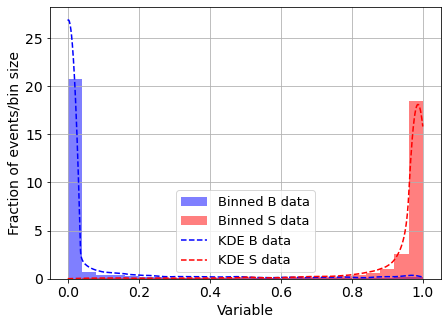

KDE Kernel:  epanechnikov
Background bandwidth:  0.03613222756796251
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



/home/andres/.local/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


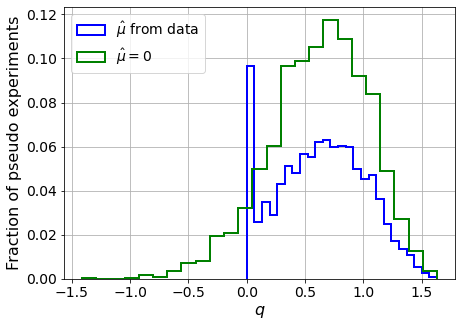

muhat mean:  -5.649451314022128
Z_bins:  0.8069622360335932
std Z_bins:  0.23353733312614583
Z_bins mu=0:  0.8069622360335932
std Z_bins mu=0:  0.26009148631687

--------

B_expected:  643
S_expected:  2



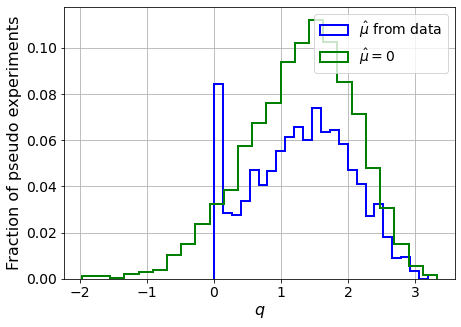

muhat mean:  -2.54926403683028
Z_bins:  1.1623280512220677
std Z_bins:  0.31715242223106654
Z_bins mu=0:  1.1623280512220677
std Z_bins mu=0:  0.3455757211244989

--------

B_expected:  643
S_expected:  4



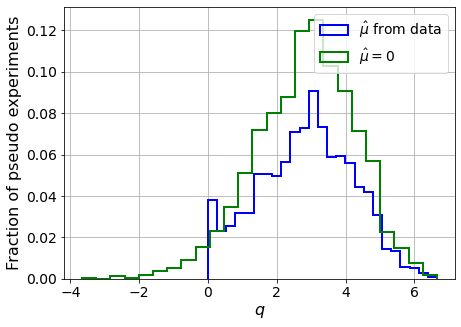

muhat mean:  -1.2644595013878133
Z_bins:  1.7080089024849052
std Z_bins:  0.40192616160280326
Z_bins mu=0:  1.7080089024849052
std Z_bins mu=0:  0.42663871786827995

--------

B_expected:  643
S_expected:  9



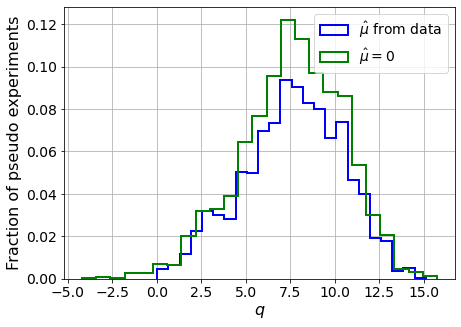

muhat mean:  -0.5731213188161073
Z_bins:  2.7830277093141795
std Z_bins:  0.5009427110199395
Z_bins mu=0:  2.7830277093141795
std Z_bins mu=0:  0.5162400780539654

--------

B_expected:  643
S_expected:  18



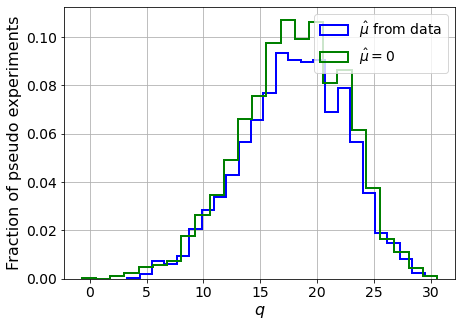

muhat mean:  -0.2849454830401095
Z_bins:  4.252756124858418
std Z_bins:  0.535738442981116
Z_bins mu=0:  4.252756124858418
std Z_bins mu=0:  0.5444603728487001

--------

B_expected:  643
S_expected:  40



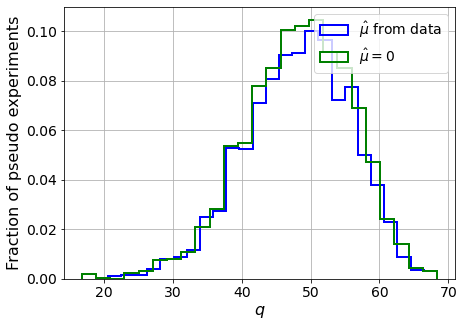

muhat mean:  -0.13340176739504928
Z_bins:  6.975812997451197
std Z_bins:  0.5488553406765291
Z_bins mu=0:  6.975812997451197
std Z_bins mu=0:  0.5566617505165895

--------

B_expected:  643
S_expected:  85



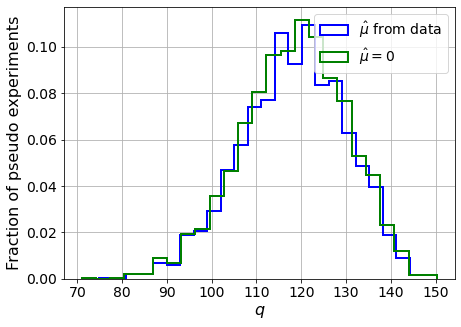

muhat mean:  -0.06295746662861351
Z_bins:  10.910978756619015
std Z_bins:  0.5315795424123114
Z_bins mu=0:  10.910978756619015
std Z_bins mu=0:  0.5351601172953874

--------

B_expected:  643
S_expected:  184



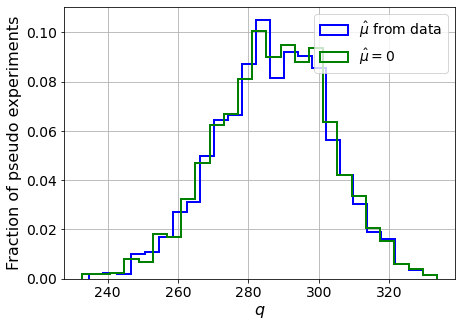

muhat mean:  -0.031236189550030893
Z_bins:  16.960073769068945
std Z_bins:  0.4778139661123596
Z_bins mu=0:  16.960073769068945
std Z_bins mu=0:  0.47984156656560345

--------

B_expected:  643
S_expected:  396



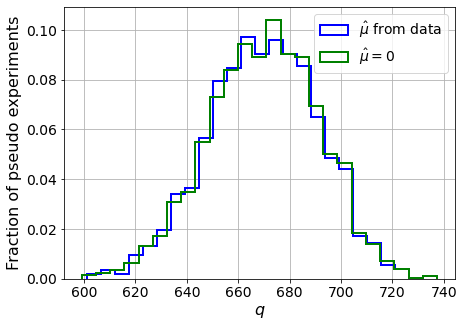

muhat mean:  -0.013154619841683373
Z_bins:  25.89629541689968
std Z_bins:  0.4143972365205833
Z_bins mu=0:  25.89629541689968
std Z_bins mu=0:  0.41574218318756373

--------

B_expected:  643
S_expected:  854



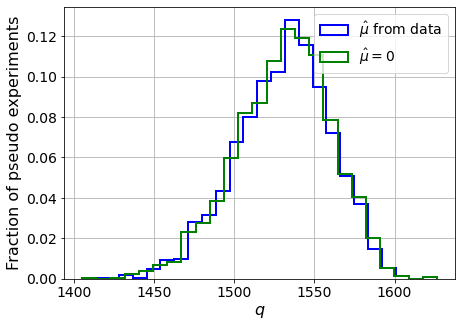

muhat mean:  -0.006833333692678734
Z_bins:  39.15663580091676
std Z_bins:  0.37869776927215165
Z_bins mu=0:  39.15663580091676
std Z_bins mu=0:  0.3799634835463985

--------


 FINAL RESULT:

[[0.8069622360335932, 0.23353733312614583, -5.649451314022128, 0.8069622360335932, 0.26009148631687], [1.1623280512220677, 0.31715242223106654, -2.54926403683028, 1.1623280512220677, 0.3455757211244989], [1.7080089024849052, 0.40192616160280326, -1.2644595013878133, 1.7080089024849052, 0.42663871786827995], [2.7830277093141795, 0.5009427110199395, -0.5731213188161073, 2.7830277093141795, 0.5162400780539654], [4.252756124858418, 0.535738442981116, -0.2849454830401095, 4.252756124858418, 0.5444603728487001], [6.975812997451197, 0.5488553406765291, -0.13340176739504928, 6.975812997451197, 0.5566617505165895], [10.910978756619015, 0.5315795424123114, -0.06295746662861351, 10.910978756619015, 0.5351601172953874], [16.960073769068945, 0.4778139661123596, -0.031236189550030893, 16.960073769068945, 0.4798

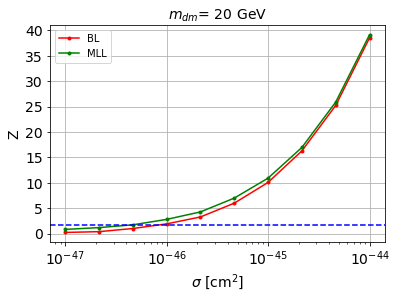


cross_BL_164:  8.242200225546716e-47
cross_BL_164_up:  5.032219388584696e-47
cross_BL_164_down:  1.3537994025069718e-46

cross_MLL_164:  4.3406553112486633e-47
cross_MLL_164_up:  2.7333824331080293e-47
cross_MLL_164_down:  6.310130738131882e-47

#########################


#########################

mDM =  35 GeV


S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)
 NUM_DAT:  29071 

NUM_DAT_ER:  28699
NUM_DAT_AC:  102
NUM_DAT_CNNS:  1
NUM_DAT_RN:  27
NUM_DAT_WALL:  242

B_pbot.shape:  (29071,)
B_ptop.shape:  (29071,)
B_ppeakS1.shape : (29071, 8)
B_ppeakS2.shape:  (29071, 8)

S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 8)
S_ppeakS2.shape:  (29071, 8)


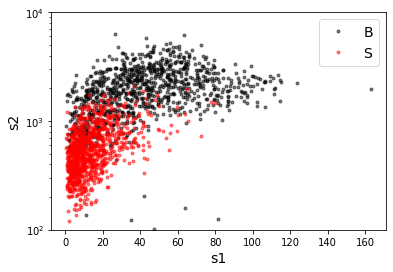

B_pdiffT.shape:  (29071,)
S_pdiffT.shape:  (29071,)


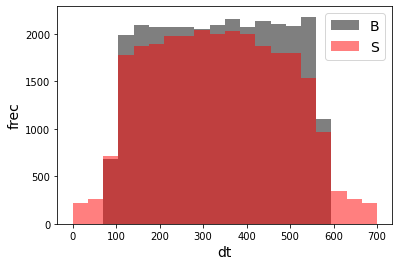

B_pbot.shape:  (29071,)
B_ptop.shape:  (29071,)
B_ppeakS1.shape : (29071, 7)
B_ppeakS2.shape:  (29071, 7)
S_pbot.shape:  (29071,)
S_ptop.shape:  (29071,)
S_ppeakS1.shape : (29071, 7)
S_ppeakS2.shape:  (29071, 7)
X_mon_B.shape:  (29071, 14)
X_mon_S.shape:  (29071, 14)
X_mon.shape:  (58142, 14)

X_mon_train :  (37065, 14)
y_mon_train :  (37065,)
X_mon_val :  (6541, 14)
y_mon_val :  (6541,)
X_mon_test :  (14536, 14)
y_mon_test :  (14536,)

[0]	validation_0-logloss:0.68604	validation_1-logloss:0.68603
[1]	validation_0-logloss:0.67908	validation_1-logloss:0.67907
[2]	validation_0-logloss:0.67226	validation_1-logloss:0.67224
[3]	validation_0-logloss:0.66556	validation_1-logloss:0.66553
[4]	validation_0-logloss:0.65899	validation_1-logloss:0.65895


/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[5]	validation_0-logloss:0.65254	validation_1-logloss:0.65250
[6]	validation_0-logloss:0.64622	validation_1-logloss:0.64617
[7]	validation_0-logloss:0.64002	validation_1-logloss:0.63994
[8]	validation_0-logloss:0.63392	validation_1-logloss:0.63384
[9]	validation_0-logloss:0.62794	validation_1-logloss:0.62785
[10]	validation_0-logloss:0.62207	validation_1-logloss:0.62195
[11]	validation_0-logloss:0.61631	validation_1-logloss:0.61618
[12]	validation_0-logloss:0.61064	validation_1-logloss:0.61048
[13]	validation_0-logloss:0.60508	validation_1-logloss:0.60492
[14]	validation_0-logloss:0.59962	validation_1-logloss:0.59944
[15]	validation_0-logloss:0.59426	validation_1-logloss:0.59408
[16]	validation_0-logloss:0.58899	validation_1-logloss:0.58879
[17]	validation_0-logloss:0.58381	validation_1-logloss:0.58359
[18]	validation_0-logloss:0.57871	validation_1-logloss:0.57849
[19]	validation_0-logloss:0.57371	validation_1-logloss:0.57347
[20]	validation_0-logloss:0.56878	validation_1-logloss:0.568

[135]	validation_0-logloss:0.29929	validation_1-logloss:0.29948
[136]	validation_0-logloss:0.29829	validation_1-logloss:0.29849
[137]	validation_0-logloss:0.29730	validation_1-logloss:0.29750
[138]	validation_0-logloss:0.29632	validation_1-logloss:0.29655
[139]	validation_0-logloss:0.29533	validation_1-logloss:0.29559
[140]	validation_0-logloss:0.29439	validation_1-logloss:0.29464
[141]	validation_0-logloss:0.29344	validation_1-logloss:0.29372
[142]	validation_0-logloss:0.29251	validation_1-logloss:0.29280
[143]	validation_0-logloss:0.29157	validation_1-logloss:0.29189
[144]	validation_0-logloss:0.29063	validation_1-logloss:0.29097
[145]	validation_0-logloss:0.28972	validation_1-logloss:0.29008
[146]	validation_0-logloss:0.28884	validation_1-logloss:0.28921
[147]	validation_0-logloss:0.28796	validation_1-logloss:0.28836
[148]	validation_0-logloss:0.28708	validation_1-logloss:0.28752
[149]	validation_0-logloss:0.28619	validation_1-logloss:0.28665
[150]	validation_0-logloss:0.28535	valid

[264]	validation_0-logloss:0.22932	validation_1-logloss:0.23218
[265]	validation_0-logloss:0.22907	validation_1-logloss:0.23195
[266]	validation_0-logloss:0.22881	validation_1-logloss:0.23170
[267]	validation_0-logloss:0.22856	validation_1-logloss:0.23147
[268]	validation_0-logloss:0.22830	validation_1-logloss:0.23123
[269]	validation_0-logloss:0.22806	validation_1-logloss:0.23101
[270]	validation_0-logloss:0.22782	validation_1-logloss:0.23079
[271]	validation_0-logloss:0.22757	validation_1-logloss:0.23056
[272]	validation_0-logloss:0.22734	validation_1-logloss:0.23035
[273]	validation_0-logloss:0.22709	validation_1-logloss:0.23011
[274]	validation_0-logloss:0.22684	validation_1-logloss:0.22987
[275]	validation_0-logloss:0.22661	validation_1-logloss:0.22967
[276]	validation_0-logloss:0.22637	validation_1-logloss:0.22944
[277]	validation_0-logloss:0.22615	validation_1-logloss:0.22924
[278]	validation_0-logloss:0.22591	validation_1-logloss:0.22901
[279]	validation_0-logloss:0.22570	valid

[393]	validation_0-logloss:0.20951	validation_1-logloss:0.21461
[394]	validation_0-logloss:0.20941	validation_1-logloss:0.21453
[395]	validation_0-logloss:0.20932	validation_1-logloss:0.21446
[396]	validation_0-logloss:0.20924	validation_1-logloss:0.21439
[397]	validation_0-logloss:0.20916	validation_1-logloss:0.21432
[398]	validation_0-logloss:0.20905	validation_1-logloss:0.21424
[399]	validation_0-logloss:0.20897	validation_1-logloss:0.21419
[400]	validation_0-logloss:0.20889	validation_1-logloss:0.21413
[401]	validation_0-logloss:0.20879	validation_1-logloss:0.21405
[402]	validation_0-logloss:0.20871	validation_1-logloss:0.21398
[403]	validation_0-logloss:0.20863	validation_1-logloss:0.21391
[404]	validation_0-logloss:0.20856	validation_1-logloss:0.21385
[405]	validation_0-logloss:0.20844	validation_1-logloss:0.21375
[406]	validation_0-logloss:0.20837	validation_1-logloss:0.21369
[407]	validation_0-logloss:0.20827	validation_1-logloss:0.21361
[408]	validation_0-logloss:0.20819	valid

[522]	validation_0-logloss:0.20099	validation_1-logloss:0.20798
[523]	validation_0-logloss:0.20095	validation_1-logloss:0.20796
[524]	validation_0-logloss:0.20089	validation_1-logloss:0.20793
[525]	validation_0-logloss:0.20085	validation_1-logloss:0.20791
[526]	validation_0-logloss:0.20081	validation_1-logloss:0.20789
[527]	validation_0-logloss:0.20075	validation_1-logloss:0.20786
[528]	validation_0-logloss:0.20072	validation_1-logloss:0.20783
[529]	validation_0-logloss:0.20068	validation_1-logloss:0.20781
[530]	validation_0-logloss:0.20061	validation_1-logloss:0.20776
[531]	validation_0-logloss:0.20057	validation_1-logloss:0.20774
[532]	validation_0-logloss:0.20053	validation_1-logloss:0.20773
[533]	validation_0-logloss:0.20050	validation_1-logloss:0.20771
[534]	validation_0-logloss:0.20042	validation_1-logloss:0.20766
[535]	validation_0-logloss:0.20039	validation_1-logloss:0.20764
[536]	validation_0-logloss:0.20032	validation_1-logloss:0.20759
[537]	validation_0-logloss:0.20028	valid

[651]	validation_0-logloss:0.19500	validation_1-logloss:0.20484
[652]	validation_0-logloss:0.19496	validation_1-logloss:0.20481
[653]	validation_0-logloss:0.19493	validation_1-logloss:0.20479
[654]	validation_0-logloss:0.19489	validation_1-logloss:0.20478
[655]	validation_0-logloss:0.19487	validation_1-logloss:0.20477
[656]	validation_0-logloss:0.19481	validation_1-logloss:0.20475
[657]	validation_0-logloss:0.19477	validation_1-logloss:0.20473
[658]	validation_0-logloss:0.19473	validation_1-logloss:0.20471
[659]	validation_0-logloss:0.19470	validation_1-logloss:0.20470
[660]	validation_0-logloss:0.19465	validation_1-logloss:0.20468
[661]	validation_0-logloss:0.19461	validation_1-logloss:0.20466
[662]	validation_0-logloss:0.19458	validation_1-logloss:0.20464
[663]	validation_0-logloss:0.19456	validation_1-logloss:0.20463
[664]	validation_0-logloss:0.19451	validation_1-logloss:0.20462
[665]	validation_0-logloss:0.19446	validation_1-logloss:0.20458
[666]	validation_0-logloss:0.19443	valid

[780]	validation_0-logloss:0.19037	validation_1-logloss:0.20299
[781]	validation_0-logloss:0.19035	validation_1-logloss:0.20298
[782]	validation_0-logloss:0.19032	validation_1-logloss:0.20297
[783]	validation_0-logloss:0.19031	validation_1-logloss:0.20297
[784]	validation_0-logloss:0.19025	validation_1-logloss:0.20296
[785]	validation_0-logloss:0.19022	validation_1-logloss:0.20294
[786]	validation_0-logloss:0.19019	validation_1-logloss:0.20294
[787]	validation_0-logloss:0.19018	validation_1-logloss:0.20293
[788]	validation_0-logloss:0.19012	validation_1-logloss:0.20292
[789]	validation_0-logloss:0.19010	validation_1-logloss:0.20292
[790]	validation_0-logloss:0.19007	validation_1-logloss:0.20291
[791]	validation_0-logloss:0.19003	validation_1-logloss:0.20290
[792]	validation_0-logloss:0.18999	validation_1-logloss:0.20289
[793]	validation_0-logloss:0.18995	validation_1-logloss:0.20290
[794]	validation_0-logloss:0.18993	validation_1-logloss:0.20289
[795]	validation_0-logloss:0.18991	valid

[909]	validation_0-logloss:0.18656	validation_1-logloss:0.20212
[910]	validation_0-logloss:0.18655	validation_1-logloss:0.20212
[911]	validation_0-logloss:0.18653	validation_1-logloss:0.20211
[912]	validation_0-logloss:0.18648	validation_1-logloss:0.20213
[913]	validation_0-logloss:0.18646	validation_1-logloss:0.20213
[914]	validation_0-logloss:0.18644	validation_1-logloss:0.20212
[915]	validation_0-logloss:0.18642	validation_1-logloss:0.20212
[916]	validation_0-logloss:0.18639	validation_1-logloss:0.20212
[917]	validation_0-logloss:0.18636	validation_1-logloss:0.20211
[918]	validation_0-logloss:0.18634	validation_1-logloss:0.20211
[919]	validation_0-logloss:0.18632	validation_1-logloss:0.20212
[920]	validation_0-logloss:0.18629	validation_1-logloss:0.20211
[921]	validation_0-logloss:0.18625	validation_1-logloss:0.20212
[922]	validation_0-logloss:0.18624	validation_1-logloss:0.20212
[923]	validation_0-logloss:0.18622	validation_1-logloss:0.20211
[924]	validation_0-logloss:0.18620	valid

[1037]	validation_0-logloss:0.18346	validation_1-logloss:0.20184
[1038]	validation_0-logloss:0.18344	validation_1-logloss:0.20184
[1039]	validation_0-logloss:0.18344	validation_1-logloss:0.20184
[1040]	validation_0-logloss:0.18341	validation_1-logloss:0.20184
[1041]	validation_0-logloss:0.18340	validation_1-logloss:0.20184
[1042]	validation_0-logloss:0.18338	validation_1-logloss:0.20185
[1043]	validation_0-logloss:0.18334	validation_1-logloss:0.20185
[1044]	validation_0-logloss:0.18330	validation_1-logloss:0.20184
[1045]	validation_0-logloss:0.18328	validation_1-logloss:0.20184
[1046]	validation_0-logloss:0.18325	validation_1-logloss:0.20184
[1047]	validation_0-logloss:0.18324	validation_1-logloss:0.20184
[1048]	validation_0-logloss:0.18322	validation_1-logloss:0.20183
[1049]	validation_0-logloss:0.18320	validation_1-logloss:0.20183
[1050]	validation_0-logloss:0.18319	validation_1-logloss:0.20184
[1051]	validation_0-logloss:0.18318	validation_1-logloss:0.20183
[1052]	validation_0-loglo

[1164]	validation_0-logloss:0.18062	validation_1-logloss:0.20153
[1165]	validation_0-logloss:0.18061	validation_1-logloss:0.20151
[1166]	validation_0-logloss:0.18059	validation_1-logloss:0.20151
[1167]	validation_0-logloss:0.18057	validation_1-logloss:0.20150
[1168]	validation_0-logloss:0.18056	validation_1-logloss:0.20150
[1169]	validation_0-logloss:0.18053	validation_1-logloss:0.20150
[1170]	validation_0-logloss:0.18050	validation_1-logloss:0.20149
[1171]	validation_0-logloss:0.18047	validation_1-logloss:0.20149
[1172]	validation_0-logloss:0.18044	validation_1-logloss:0.20148
[1173]	validation_0-logloss:0.18041	validation_1-logloss:0.20148
[1174]	validation_0-logloss:0.18039	validation_1-logloss:0.20147
[1175]	validation_0-logloss:0.18037	validation_1-logloss:0.20147
[1176]	validation_0-logloss:0.18033	validation_1-logloss:0.20146
[1177]	validation_0-logloss:0.18030	validation_1-logloss:0.20145
[1178]	validation_0-logloss:0.18028	validation_1-logloss:0.20145
[1179]	validation_0-loglo

[1417]	validation_0-logloss:0.17474	validation_1-logloss:0.20089
[1418]	validation_0-logloss:0.17473	validation_1-logloss:0.20088
[1419]	validation_0-logloss:0.17471	validation_1-logloss:0.20088
[1420]	validation_0-logloss:0.17469	validation_1-logloss:0.20090
[1421]	validation_0-logloss:0.17469	validation_1-logloss:0.20090
[1422]	validation_0-logloss:0.17466	validation_1-logloss:0.20089
[1423]	validation_0-logloss:0.17464	validation_1-logloss:0.20089
[1424]	validation_0-logloss:0.17461	validation_1-logloss:0.20088
[1425]	validation_0-logloss:0.17461	validation_1-logloss:0.20088
[1426]	validation_0-logloss:0.17460	validation_1-logloss:0.20088
[1427]	validation_0-logloss:0.17455	validation_1-logloss:0.20086
[1428]	validation_0-logloss:0.17453	validation_1-logloss:0.20086
[1429]	validation_0-logloss:0.17451	validation_1-logloss:0.20086
[1430]	validation_0-logloss:0.17450	validation_1-logloss:0.20087
[1431]	validation_0-logloss:0.17448	validation_1-logloss:0.20086
[1432]	validation_0-loglo

[1544]	validation_0-logloss:0.17211	validation_1-logloss:0.20059
[1545]	validation_0-logloss:0.17208	validation_1-logloss:0.20061
[1546]	validation_0-logloss:0.17204	validation_1-logloss:0.20060
[1547]	validation_0-logloss:0.17202	validation_1-logloss:0.20059
[1548]	validation_0-logloss:0.17201	validation_1-logloss:0.20059
[1549]	validation_0-logloss:0.17198	validation_1-logloss:0.20058
[1550]	validation_0-logloss:0.17195	validation_1-logloss:0.20060
[1551]	validation_0-logloss:0.17192	validation_1-logloss:0.20059
[1552]	validation_0-logloss:0.17190	validation_1-logloss:0.20060
[1553]	validation_0-logloss:0.17186	validation_1-logloss:0.20058
[1554]	validation_0-logloss:0.17184	validation_1-logloss:0.20058
[1555]	validation_0-logloss:0.17181	validation_1-logloss:0.20058
[1556]	validation_0-logloss:0.17178	validation_1-logloss:0.20059
[1557]	validation_0-logloss:0.17177	validation_1-logloss:0.20060
[1558]	validation_0-logloss:0.17175	validation_1-logloss:0.20059
[1559]	validation_0-loglo

[1671]	validation_0-logloss:0.16930	validation_1-logloss:0.20031
[1672]	validation_0-logloss:0.16925	validation_1-logloss:0.20030
[1673]	validation_0-logloss:0.16925	validation_1-logloss:0.20030
[1674]	validation_0-logloss:0.16920	validation_1-logloss:0.20028
[1675]	validation_0-logloss:0.16919	validation_1-logloss:0.20028
[1676]	validation_0-logloss:0.16919	validation_1-logloss:0.20028
[1677]	validation_0-logloss:0.16917	validation_1-logloss:0.20028
[1678]	validation_0-logloss:0.16916	validation_1-logloss:0.20028
[1679]	validation_0-logloss:0.16915	validation_1-logloss:0.20028
[1680]	validation_0-logloss:0.16913	validation_1-logloss:0.20029
[1681]	validation_0-logloss:0.16909	validation_1-logloss:0.20028
[1682]	validation_0-logloss:0.16908	validation_1-logloss:0.20029
[1683]	validation_0-logloss:0.16906	validation_1-logloss:0.20029
[1684]	validation_0-logloss:0.16903	validation_1-logloss:0.20029
[1685]	validation_0-logloss:0.16902	validation_1-logloss:0.20029
[1686]	validation_0-loglo

[1798]	validation_0-logloss:0.16655	validation_1-logloss:0.20006
[1799]	validation_0-logloss:0.16652	validation_1-logloss:0.20006
[1800]	validation_0-logloss:0.16647	validation_1-logloss:0.20006
[1801]	validation_0-logloss:0.16645	validation_1-logloss:0.20006
[1802]	validation_0-logloss:0.16642	validation_1-logloss:0.20006
[1803]	validation_0-logloss:0.16640	validation_1-logloss:0.20006
[1804]	validation_0-logloss:0.16638	validation_1-logloss:0.20006
[1805]	validation_0-logloss:0.16637	validation_1-logloss:0.20005
[1806]	validation_0-logloss:0.16633	validation_1-logloss:0.20005
[1807]	validation_0-logloss:0.16632	validation_1-logloss:0.20005
[1808]	validation_0-logloss:0.16628	validation_1-logloss:0.20005
[1809]	validation_0-logloss:0.16626	validation_1-logloss:0.20004
[1810]	validation_0-logloss:0.16624	validation_1-logloss:0.20005
[1811]	validation_0-logloss:0.16622	validation_1-logloss:0.20005
[1812]	validation_0-logloss:0.16621	validation_1-logloss:0.20004
[1813]	validation_0-loglo

[1925]	validation_0-logloss:0.16395	validation_1-logloss:0.19993
[1926]	validation_0-logloss:0.16390	validation_1-logloss:0.19992
[1927]	validation_0-logloss:0.16388	validation_1-logloss:0.19992
[1928]	validation_0-logloss:0.16386	validation_1-logloss:0.19992
[1929]	validation_0-logloss:0.16381	validation_1-logloss:0.19991
[1930]	validation_0-logloss:0.16380	validation_1-logloss:0.19991
[1931]	validation_0-logloss:0.16379	validation_1-logloss:0.19991
[1932]	validation_0-logloss:0.16378	validation_1-logloss:0.19991
[1933]	validation_0-logloss:0.16375	validation_1-logloss:0.19992
[1934]	validation_0-logloss:0.16373	validation_1-logloss:0.19991
[1935]	validation_0-logloss:0.16372	validation_1-logloss:0.19991
[1936]	validation_0-logloss:0.16370	validation_1-logloss:0.19991
[1937]	validation_0-logloss:0.16368	validation_1-logloss:0.19990
[1938]	validation_0-logloss:0.16365	validation_1-logloss:0.19990
[1939]	validation_0-logloss:0.16364	validation_1-logloss:0.19989
[1940]	validation_0-loglo

[2052]	validation_0-logloss:0.16134	validation_1-logloss:0.19967
[2053]	validation_0-logloss:0.16131	validation_1-logloss:0.19966
[2054]	validation_0-logloss:0.16129	validation_1-logloss:0.19965
[2055]	validation_0-logloss:0.16128	validation_1-logloss:0.19965
[2056]	validation_0-logloss:0.16126	validation_1-logloss:0.19965
[2057]	validation_0-logloss:0.16125	validation_1-logloss:0.19964
[2058]	validation_0-logloss:0.16124	validation_1-logloss:0.19965
[2059]	validation_0-logloss:0.16121	validation_1-logloss:0.19964
[2060]	validation_0-logloss:0.16120	validation_1-logloss:0.19963
[2061]	validation_0-logloss:0.16118	validation_1-logloss:0.19962
[2062]	validation_0-logloss:0.16116	validation_1-logloss:0.19964
[2063]	validation_0-logloss:0.16115	validation_1-logloss:0.19964
[2064]	validation_0-logloss:0.16112	validation_1-logloss:0.19964
[2065]	validation_0-logloss:0.16111	validation_1-logloss:0.19964
[2066]	validation_0-logloss:0.16109	validation_1-logloss:0.19964
[2067]	validation_0-loglo

[2179]	validation_0-logloss:0.15877	validation_1-logloss:0.19960
[2180]	validation_0-logloss:0.15877	validation_1-logloss:0.19960
[2181]	validation_0-logloss:0.15874	validation_1-logloss:0.19959
[2182]	validation_0-logloss:0.15872	validation_1-logloss:0.19959
[2183]	validation_0-logloss:0.15870	validation_1-logloss:0.19960
[2184]	validation_0-logloss:0.15868	validation_1-logloss:0.19960
[2185]	validation_0-logloss:0.15867	validation_1-logloss:0.19960
[2186]	validation_0-logloss:0.15865	validation_1-logloss:0.19959
[2187]	validation_0-logloss:0.15865	validation_1-logloss:0.19960
[2188]	validation_0-logloss:0.15864	validation_1-logloss:0.19960
[2189]	validation_0-logloss:0.15860	validation_1-logloss:0.19959
[2190]	validation_0-logloss:0.15859	validation_1-logloss:0.19960
[2191]	validation_0-logloss:0.15857	validation_1-logloss:0.19960
[2192]	validation_0-logloss:0.15856	validation_1-logloss:0.19959
[2193]	validation_0-logloss:0.15853	validation_1-logloss:0.19959
[2194]	validation_0-loglo

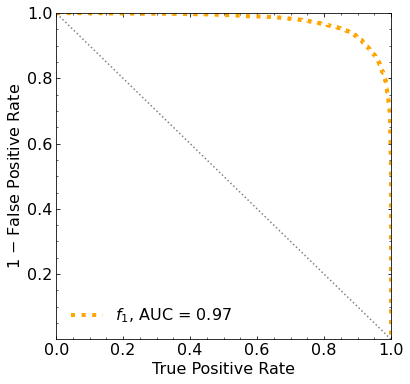

Classification score:


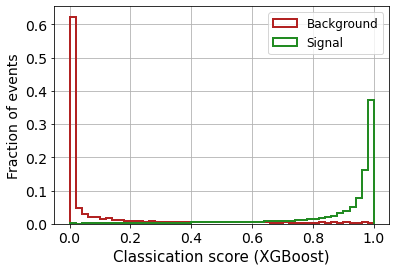


 ROC-AUC =  0.9748114352378767
At least 5 B events per bin, range = [[0, 1]]:
# bins:  17 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  17
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.029


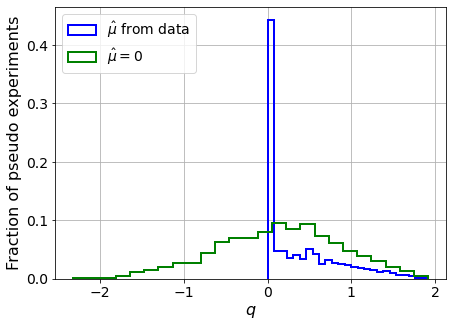

muhat mean:  0.09945104495209281
Z_bins:  0.4098703579554727
std Z_bins:  0.5556038750870158
Z_bins mu=0:  0.4098703579554727
std Z_bins mu=0:  0.9085816281063962

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.034


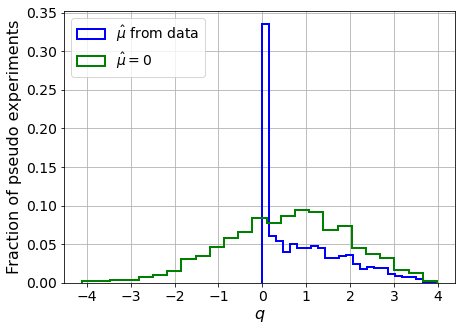

muhat mean:  0.028212368771756542
Z_bins:  0.8194856787763233
std Z_bins:  0.5796216695685276
Z_bins mu=0:  0.8194856787763233
std Z_bins mu=0:  0.8542656480201632

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.031


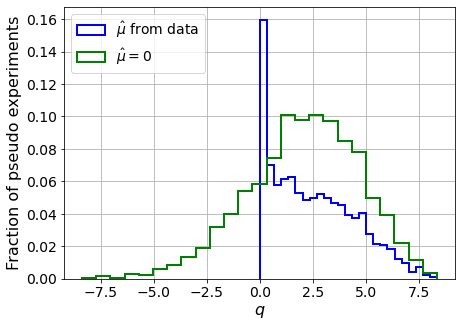

muhat mean:  0.02307020414387134
Z_bins:  1.4877650235069069
std Z_bins:  0.6578534295054251
Z_bins mu=0:  1.4877587390152853
std Z_bins mu=0:  0.8832923693005836

--------

B_expected:  643
S_expected:  18

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0335


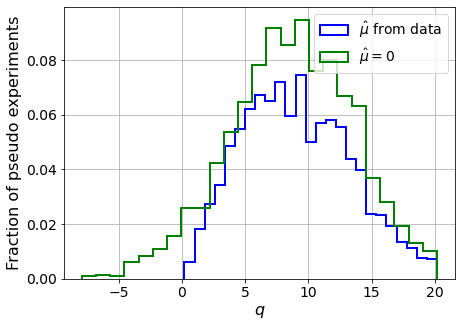

muhat mean:  0.0003776579827193891
Z_bins:  2.9648354755815616
std Z_bins:  0.7142923844185918
Z_bins mu=0:  2.9644517834715796
std Z_bins mu=0:  0.8208444572135362

--------

B_expected:  643
S_expected:  39

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0315


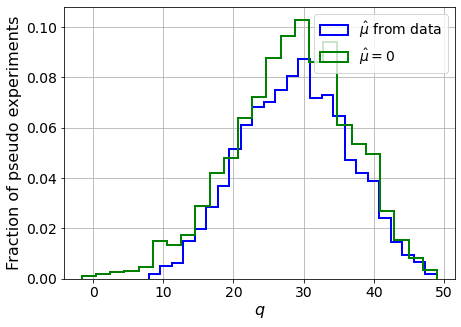

muhat mean:  0.003704691214571023
Z_bins:  5.3680855048255784
std Z_bins:  0.7052284899494674
Z_bins mu=0:  5.3680855048255784
std Z_bins mu=0:  0.7765700354937869

--------

B_expected:  643
S_expected:  83

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0265


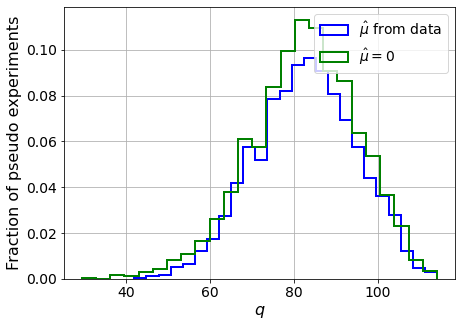

muhat mean:  -0.0001716608090771296
Z_bins:  9.1071319092097
std Z_bins:  0.6556712408047002
Z_bins mu=0:  9.1071319092097
std Z_bins mu=0:  0.6966036565781412

--------

B_expected:  643
S_expected:  179

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0265


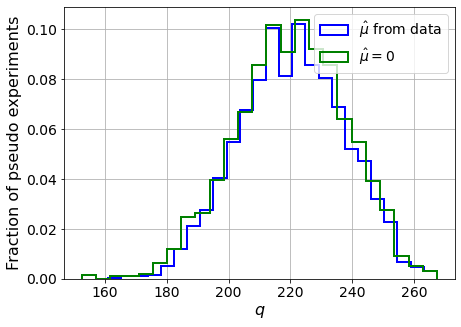

muhat mean:  0.0003871179642317905
Z_bins:  14.859725986100312
std Z_bins:  0.5722248517603639
Z_bins mu=0:  14.859196970568673
std Z_bins mu=0:  0.5939582635855074

--------

B_expected:  643
S_expected:  385

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.029


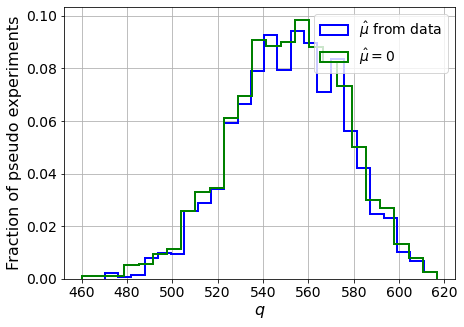

muhat mean:  0.0005894535558804713
Z_bins:  23.504867764033047
std Z_bins:  0.5217502765371725
Z_bins mu=0:  23.502936010609243
std Z_bins mu=0:  0.5372133614644974

--------

B_expected:  643
S_expected:  830

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0305


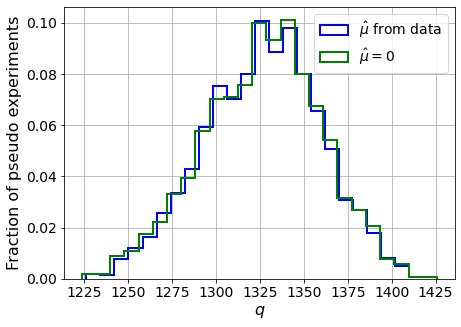

muhat mean:  3.988312939453051e-05
Z_bins:  36.44126174947755
std Z_bins:  0.4526038902032827
Z_bins mu=0:  36.440451063027325
std Z_bins mu=0:  0.46086037060695906

--------

B_expected:  643
S_expected:  1787

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0355


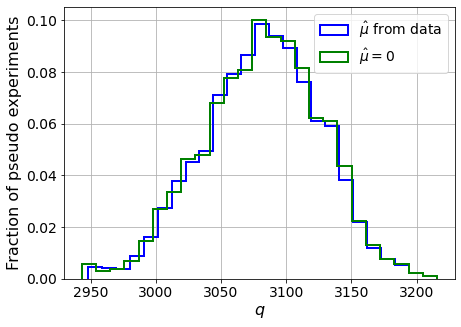

muhat mean:  -1.2374199927550285e-05
Z_bins:  55.529342582894245
std Z_bins:  0.4011819161585423
Z_bins mu=0:  55.5276981967041
std Z_bins mu=0:  0.40616459271132643

--------


 FINAL RESULT:

[[0.4098703579554727, 0.5556038750870158, 0.09945104495209281, 0.4098703579554727, 0.9085816281063962], [0.8194856787763233, 0.5796216695685276, 0.028212368771756542, 0.8194856787763233, 0.8542656480201632], [1.4877650235069069, 0.6578534295054251, 0.02307020414387134, 1.4877587390152853, 0.8832923693005836], [2.9648354755815616, 0.7142923844185918, 0.0003776579827193891, 2.9644517834715796, 0.8208444572135362], [5.3680855048255784, 0.7052284899494674, 0.003704691214571023, 5.3680855048255784, 0.7765700354937869], [9.1071319092097, 0.6556712408047002, -0.0001716608090771296, 9.1071319092097, 0.6966036565781412], [14.859725986100312, 0.5722248517603639, 0.0003871179642317905, 14.859196970568673, 0.5939582635855074], [23.504867764033047, 0.5217502765371725, 0.0005894535558804713, 23.50293601060924

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 341.81747505 298.22645191 249.4270591  197.96697768
 144.61262103  88.14340038  28.40900439 -32.0167365  -98.09235153]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 244.32342661 228.14451529 202.52357728 171.73162256
 134

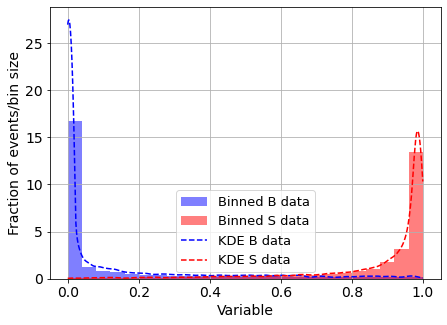

KDE Kernel:  epanechnikov
Background bandwidth:  0.022117541055781564
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



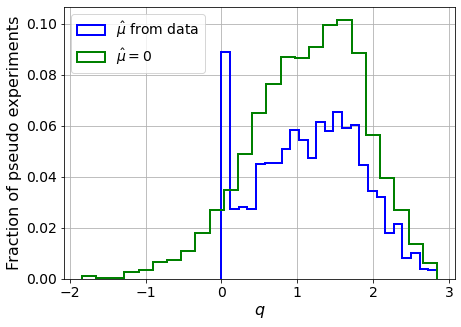

muhat mean:  -3.9716936695515455
Z_bins:  1.0972491940722109
std Z_bins:  0.3065362300026222
Z_bins mu=0:  1.0972491940722109
std Z_bins mu=0:  0.33746225453520057

--------

B_expected:  643
S_expected:  4



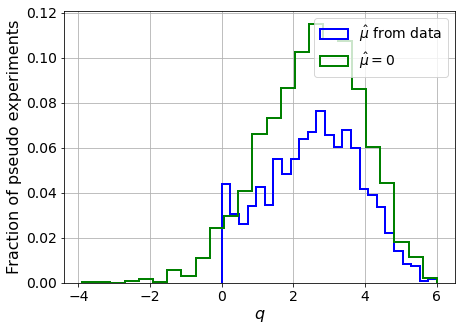

muhat mean:  -1.859433221879583
Z_bins:  1.6259501842834054
std Z_bins:  0.39849291319487457
Z_bins mu=0:  1.6259501842834054
std Z_bins mu=0:  0.42486428730786063

--------

B_expected:  643
S_expected:  8



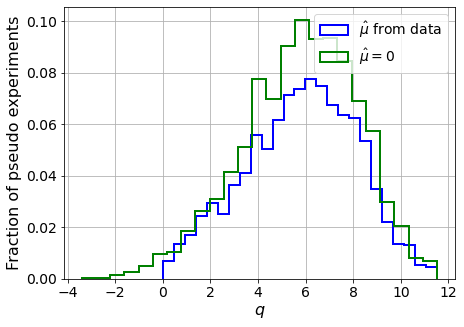

muhat mean:  -0.9398912715999318
Z_bins:  2.4393262817841377
std Z_bins:  0.4793993502993086
Z_bins mu=0:  2.4393262817841377
std Z_bins mu=0:  0.4984046121076836

--------

B_expected:  643
S_expected:  18



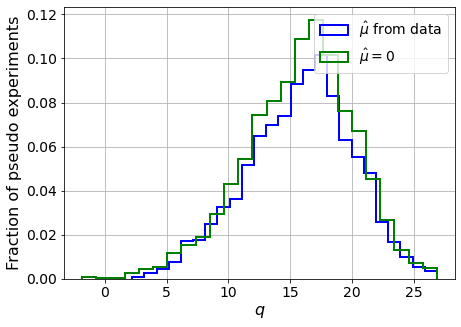

muhat mean:  -0.41375837190962206
Z_bins:  4.0134081661842265
std Z_bins:  0.530647508353878
Z_bins mu=0:  4.0134081661842265
std Z_bins mu=0:  0.5449001922250483

--------

B_expected:  643
S_expected:  39



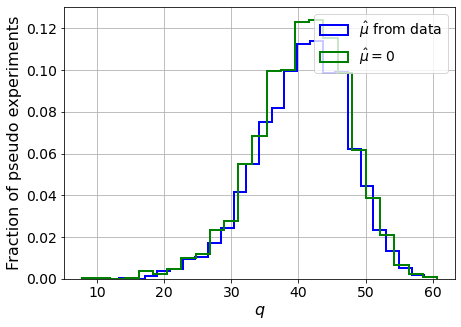

muhat mean:  -0.18725751127284906
Z_bins:  6.4114152626526675
std Z_bins:  0.5314157056488733
Z_bins mu=0:  6.4114152626526675
std Z_bins mu=0:  0.5413936133049786

--------

B_expected:  643
S_expected:  83



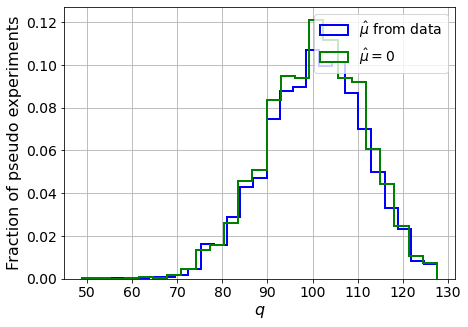

muhat mean:  -0.08793860688699981
Z_bins:  10.040900550413816
std Z_bins:  0.5385692034996007
Z_bins mu=0:  10.040900550413816
std Z_bins mu=0:  0.5443391063446409

--------

B_expected:  643
S_expected:  179



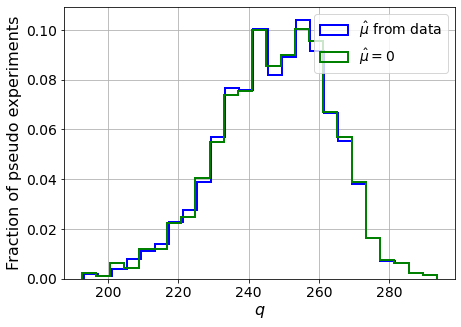

muhat mean:  -0.0403928769485685
Z_bins:  15.751791787108376
std Z_bins:  0.5080427622069228
Z_bins mu=0:  15.751791787108376
std Z_bins mu=0:  0.5119277076249095

--------

B_expected:  643
S_expected:  385



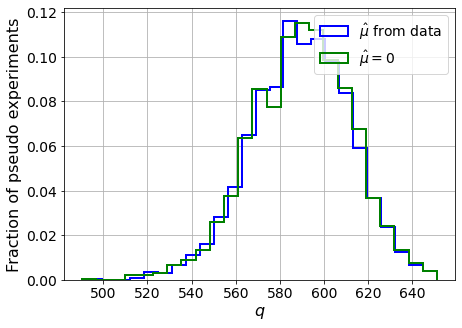

muhat mean:  -0.019465060685187274
Z_bins:  24.294472877879116
std Z_bins:  0.46118734408672074
Z_bins mu=0:  24.294472877879116
std Z_bins mu=0:  0.46358423272637755

--------

B_expected:  643
S_expected:  830



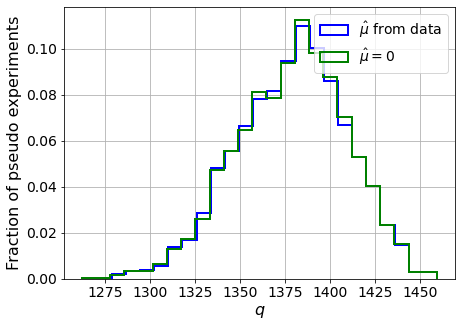

muhat mean:  -0.009037245972170862
Z_bins:  37.16075765211943
std Z_bins:  0.412246628115166
Z_bins mu=0:  37.16043925494672
std Z_bins mu=0:  0.41330278183302743

--------

B_expected:  643
S_expected:  1787



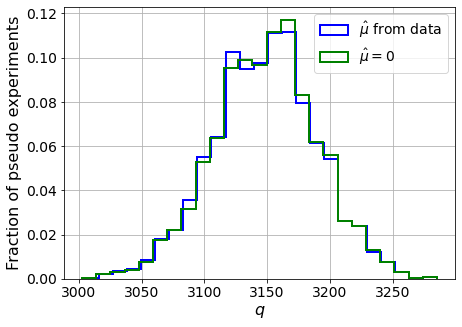

muhat mean:  -0.004153934489849214
Z_bins:  56.123799695075185
std Z_bins:  0.3677923382366287
Z_bins mu=0:  56.12373885456215
std Z_bins mu=0:  0.3683829497127583

--------


 FINAL RESULT:

[[1.0972491940722109, 0.3065362300026222, -3.9716936695515455, 1.0972491940722109, 0.33746225453520057], [1.6259501842834054, 0.39849291319487457, -1.859433221879583, 1.6259501842834054, 0.42486428730786063], [2.4393262817841377, 0.4793993502993086, -0.9398912715999318, 2.4393262817841377, 0.4984046121076836], [4.0134081661842265, 0.530647508353878, -0.41375837190962206, 4.0134081661842265, 0.5449001922250483], [6.4114152626526675, 0.5314157056488733, -0.18725751127284906, 6.4114152626526675, 0.5413936133049786], [10.040900550413816, 0.5385692034996007, -0.08793860688699981, 10.040900550413816, 0.5443391063446409], [15.751791787108376, 0.5080427622069228, -0.0403928769485685, 15.751791787108376, 0.5119277076249095], [24.294472877879116, 0.46118734408672074, -0.019465060685187274, 24.29447287787911

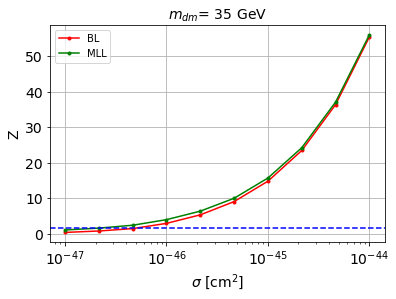


cross_BL_164:  5.165751842601693e-47
cross_BL_164_up:  2.9373431735573033e-47
cross_BL_164_down:  7.620126802173282e-47

cross_MLL_164:  2.1914699751325177e-47
cross_MLL_164_up:  1.3790681534775115e-47
cross_MLL_164_down:  3.573630046901417e-47

#########################


#########################

mDM =  50 GeV


S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)
 NUM_DAT:  31106 

NUM_DAT_ER:  30709
NUM_DAT_AC:  109
NUM_DAT_CNNS:  1
NUM_DAT_RN:  29
NUM_DAT_WALL:  258

B_pbot.shape:  (31106,)
B_ptop.shape:  (31106,)
B_ppeakS1.shape : (31106, 8)
B_ppeakS2.shape:  (31106, 8)

S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 8)
S_ppeakS2.shape:  (31106, 8)


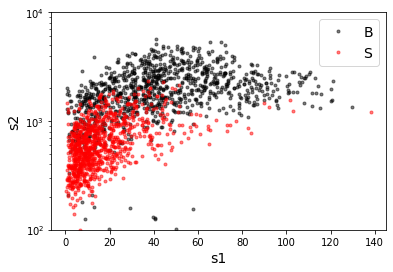

B_pdiffT.shape:  (31106,)
S_pdiffT.shape:  (31106,)


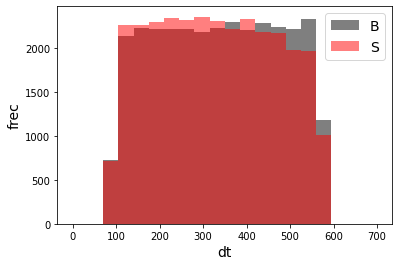

B_pbot.shape:  (31106,)
B_ptop.shape:  (31106,)
B_ppeakS1.shape : (31106, 7)
B_ppeakS2.shape:  (31106, 7)
S_pbot.shape:  (31106,)
S_ptop.shape:  (31106,)
S_ppeakS1.shape : (31106, 7)
S_ppeakS2.shape:  (31106, 7)
X_mon_B.shape:  (31106, 14)
X_mon_S.shape:  (31106, 14)
X_mon.shape:  (62212, 14)

X_mon_train :  (39660, 14)
y_mon_train :  (39660,)
X_mon_val :  (6999, 14)
y_mon_val :  (6999,)
X_mon_test :  (15553, 14)
y_mon_test :  (15553,)

[0]	validation_0-logloss:0.68658	validation_1-logloss:0.68654
[1]	validation_0-logloss:0.68014	validation_1-logloss:0.68007
[2]	validation_0-logloss:0.67382	validation_1-logloss:0.67374
[3]	validation_0-logloss:0.66763	validation_1-logloss:0.66751
[4]	validation_0-logloss:0.66156	validation_1-logloss:0.66136
[5]	validation_0-logloss:0.65559	validation_1-logloss:0.65536
[6]	validation_0-logloss:0.64976	validation_1-logloss:0.64950
[7]	validation_0-logloss:0.64402	validation_1-logloss:0.64373
[8]	validation_0-logloss:0.63840	validation_1-logloss:0.63806
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10]	validation_0-logloss:0.62745	validation_1-logloss:0.62704
[11]	validation_0-logloss:0.62209	validation_1-logloss:0.62166
[12]	validation_0-logloss:0.61685	validation_1-logloss:0.61638
[13]	validation_0-logloss:0.61170	validation_1-logloss:0.61119
[14]	validation_0-logloss:0.60662	validation_1-logloss:0.60610
[15]	validation_0-logloss:0.60165	validation_1-logloss:0.60110
[16]	validation_0-logloss:0.59676	validation_1-logloss:0.59617
[17]	validation_0-logloss:0.59195	validation_1-logloss:0.59133
[18]	validation_0-logloss:0.58722	validation_1-logloss:0.58659
[19]	validation_0-logloss:0.58257	validation_1-logloss:0.58191
[20]	validation_0-logloss:0.57800	validation_1-logloss:0.57732
[21]	validation_0-logloss:0.57349	validation_1-logloss:0.57279
[22]	validation_0-logloss:0.56907	validation_1-logloss:0.56835
[23]	validation_0-logloss:0.56472	validation_1-logloss:0.56400
[24]	validation_0-logloss:0.56044	validation_1-logloss:0.55971
[25]	validation_0-logloss:0.55622	validation_1-logloss:

[140]	validation_0-logloss:0.31763	validation_1-logloss:0.31792
[141]	validation_0-logloss:0.31667	validation_1-logloss:0.31700
[142]	validation_0-logloss:0.31577	validation_1-logloss:0.31612
[143]	validation_0-logloss:0.31487	validation_1-logloss:0.31521
[144]	validation_0-logloss:0.31396	validation_1-logloss:0.31431
[145]	validation_0-logloss:0.31306	validation_1-logloss:0.31340
[146]	validation_0-logloss:0.31215	validation_1-logloss:0.31251
[147]	validation_0-logloss:0.31126	validation_1-logloss:0.31162
[148]	validation_0-logloss:0.31037	validation_1-logloss:0.31078
[149]	validation_0-logloss:0.30953	validation_1-logloss:0.30995
[150]	validation_0-logloss:0.30867	validation_1-logloss:0.30911
[151]	validation_0-logloss:0.30780	validation_1-logloss:0.30825
[152]	validation_0-logloss:0.30694	validation_1-logloss:0.30743
[153]	validation_0-logloss:0.30611	validation_1-logloss:0.30663
[154]	validation_0-logloss:0.30527	validation_1-logloss:0.30580
[155]	validation_0-logloss:0.30447	valid

[269]	validation_0-logloss:0.25032	validation_1-logloss:0.25240
[270]	validation_0-logloss:0.25004	validation_1-logloss:0.25215
[271]	validation_0-logloss:0.24978	validation_1-logloss:0.25190
[272]	validation_0-logloss:0.24954	validation_1-logloss:0.25169
[273]	validation_0-logloss:0.24928	validation_1-logloss:0.25145
[274]	validation_0-logloss:0.24902	validation_1-logloss:0.25122
[275]	validation_0-logloss:0.24876	validation_1-logloss:0.25099
[276]	validation_0-logloss:0.24851	validation_1-logloss:0.25075
[277]	validation_0-logloss:0.24826	validation_1-logloss:0.25054
[278]	validation_0-logloss:0.24801	validation_1-logloss:0.25030
[279]	validation_0-logloss:0.24777	validation_1-logloss:0.25006
[280]	validation_0-logloss:0.24752	validation_1-logloss:0.24987
[281]	validation_0-logloss:0.24727	validation_1-logloss:0.24965
[282]	validation_0-logloss:0.24704	validation_1-logloss:0.24943
[283]	validation_0-logloss:0.24680	validation_1-logloss:0.24923
[284]	validation_0-logloss:0.24658	valid

[398]	validation_0-logloss:0.22831	validation_1-logloss:0.23308
[399]	validation_0-logloss:0.22818	validation_1-logloss:0.23297
[400]	validation_0-logloss:0.22805	validation_1-logloss:0.23286
[401]	validation_0-logloss:0.22794	validation_1-logloss:0.23275
[402]	validation_0-logloss:0.22784	validation_1-logloss:0.23266
[403]	validation_0-logloss:0.22774	validation_1-logloss:0.23260
[404]	validation_0-logloss:0.22764	validation_1-logloss:0.23251
[405]	validation_0-logloss:0.22751	validation_1-logloss:0.23242
[406]	validation_0-logloss:0.22741	validation_1-logloss:0.23233
[407]	validation_0-logloss:0.22729	validation_1-logloss:0.23225
[408]	validation_0-logloss:0.22718	validation_1-logloss:0.23216
[409]	validation_0-logloss:0.22705	validation_1-logloss:0.23207
[410]	validation_0-logloss:0.22694	validation_1-logloss:0.23198
[411]	validation_0-logloss:0.22682	validation_1-logloss:0.23189
[412]	validation_0-logloss:0.22671	validation_1-logloss:0.23183
[413]	validation_0-logloss:0.22659	valid

[527]	validation_0-logloss:0.21641	validation_1-logloss:0.22461
[528]	validation_0-logloss:0.21632	validation_1-logloss:0.22456
[529]	validation_0-logloss:0.21626	validation_1-logloss:0.22452
[530]	validation_0-logloss:0.21619	validation_1-logloss:0.22447
[531]	validation_0-logloss:0.21613	validation_1-logloss:0.22444
[532]	validation_0-logloss:0.21606	validation_1-logloss:0.22441
[533]	validation_0-logloss:0.21597	validation_1-logloss:0.22435
[534]	validation_0-logloss:0.21590	validation_1-logloss:0.22431
[535]	validation_0-logloss:0.21583	validation_1-logloss:0.22428
[536]	validation_0-logloss:0.21577	validation_1-logloss:0.22425
[537]	validation_0-logloss:0.21568	validation_1-logloss:0.22420
[538]	validation_0-logloss:0.21562	validation_1-logloss:0.22417
[539]	validation_0-logloss:0.21556	validation_1-logloss:0.22414
[540]	validation_0-logloss:0.21549	validation_1-logloss:0.22409
[541]	validation_0-logloss:0.21543	validation_1-logloss:0.22406
[542]	validation_0-logloss:0.21535	valid

[656]	validation_0-logloss:0.20898	validation_1-logloss:0.22052
[657]	validation_0-logloss:0.20893	validation_1-logloss:0.22049
[658]	validation_0-logloss:0.20888	validation_1-logloss:0.22045
[659]	validation_0-logloss:0.20882	validation_1-logloss:0.22044
[660]	validation_0-logloss:0.20877	validation_1-logloss:0.22041
[661]	validation_0-logloss:0.20871	validation_1-logloss:0.22037
[662]	validation_0-logloss:0.20866	validation_1-logloss:0.22035
[663]	validation_0-logloss:0.20864	validation_1-logloss:0.22033
[664]	validation_0-logloss:0.20858	validation_1-logloss:0.22029
[665]	validation_0-logloss:0.20852	validation_1-logloss:0.22025
[666]	validation_0-logloss:0.20846	validation_1-logloss:0.22024
[667]	validation_0-logloss:0.20841	validation_1-logloss:0.22022
[668]	validation_0-logloss:0.20838	validation_1-logloss:0.22019
[669]	validation_0-logloss:0.20831	validation_1-logloss:0.22017
[670]	validation_0-logloss:0.20827	validation_1-logloss:0.22015
[671]	validation_0-logloss:0.20822	valid

[785]	validation_0-logloss:0.20332	validation_1-logloss:0.21779
[786]	validation_0-logloss:0.20329	validation_1-logloss:0.21779
[787]	validation_0-logloss:0.20324	validation_1-logloss:0.21777
[788]	validation_0-logloss:0.20322	validation_1-logloss:0.21775
[789]	validation_0-logloss:0.20319	validation_1-logloss:0.21776
[790]	validation_0-logloss:0.20315	validation_1-logloss:0.21774
[791]	validation_0-logloss:0.20312	validation_1-logloss:0.21774
[792]	validation_0-logloss:0.20305	validation_1-logloss:0.21771
[793]	validation_0-logloss:0.20300	validation_1-logloss:0.21768
[794]	validation_0-logloss:0.20297	validation_1-logloss:0.21767
[795]	validation_0-logloss:0.20293	validation_1-logloss:0.21765
[796]	validation_0-logloss:0.20288	validation_1-logloss:0.21762
[797]	validation_0-logloss:0.20286	validation_1-logloss:0.21762
[798]	validation_0-logloss:0.20281	validation_1-logloss:0.21758
[799]	validation_0-logloss:0.20276	validation_1-logloss:0.21757
[800]	validation_0-logloss:0.20269	valid

[1041]	validation_0-logloss:0.19454	validation_1-logloss:0.21527
[1042]	validation_0-logloss:0.19452	validation_1-logloss:0.21526
[1043]	validation_0-logloss:0.19449	validation_1-logloss:0.21526
[1044]	validation_0-logloss:0.19446	validation_1-logloss:0.21526
[1045]	validation_0-logloss:0.19445	validation_1-logloss:0.21525
[1046]	validation_0-logloss:0.19442	validation_1-logloss:0.21523
[1047]	validation_0-logloss:0.19440	validation_1-logloss:0.21523
[1048]	validation_0-logloss:0.19437	validation_1-logloss:0.21523
[1049]	validation_0-logloss:0.19434	validation_1-logloss:0.21523
[1050]	validation_0-logloss:0.19431	validation_1-logloss:0.21521
[1051]	validation_0-logloss:0.19427	validation_1-logloss:0.21520
[1052]	validation_0-logloss:0.19424	validation_1-logloss:0.21519
[1053]	validation_0-logloss:0.19422	validation_1-logloss:0.21519
[1054]	validation_0-logloss:0.19419	validation_1-logloss:0.21517
[1055]	validation_0-logloss:0.19417	validation_1-logloss:0.21517
[1056]	validation_0-loglo

[1294]	validation_0-logloss:0.18829	validation_1-logloss:0.21406
[1295]	validation_0-logloss:0.18827	validation_1-logloss:0.21406
[1296]	validation_0-logloss:0.18823	validation_1-logloss:0.21405
[1297]	validation_0-logloss:0.18821	validation_1-logloss:0.21405
[1298]	validation_0-logloss:0.18820	validation_1-logloss:0.21404
[1299]	validation_0-logloss:0.18818	validation_1-logloss:0.21404
[1300]	validation_0-logloss:0.18816	validation_1-logloss:0.21404
[1301]	validation_0-logloss:0.18812	validation_1-logloss:0.21403
[1302]	validation_0-logloss:0.18810	validation_1-logloss:0.21404
[1303]	validation_0-logloss:0.18808	validation_1-logloss:0.21405
[1304]	validation_0-logloss:0.18805	validation_1-logloss:0.21404
[1305]	validation_0-logloss:0.18801	validation_1-logloss:0.21402
[1306]	validation_0-logloss:0.18799	validation_1-logloss:0.21402
[1307]	validation_0-logloss:0.18796	validation_1-logloss:0.21402
[1308]	validation_0-logloss:0.18795	validation_1-logloss:0.21401
[1309]	validation_0-loglo

[1421]	validation_0-logloss:0.18544	validation_1-logloss:0.21350
[1422]	validation_0-logloss:0.18541	validation_1-logloss:0.21349
[1423]	validation_0-logloss:0.18539	validation_1-logloss:0.21349
[1424]	validation_0-logloss:0.18537	validation_1-logloss:0.21349
[1425]	validation_0-logloss:0.18535	validation_1-logloss:0.21347
[1426]	validation_0-logloss:0.18532	validation_1-logloss:0.21346
[1427]	validation_0-logloss:0.18530	validation_1-logloss:0.21346
[1428]	validation_0-logloss:0.18527	validation_1-logloss:0.21345
[1429]	validation_0-logloss:0.18525	validation_1-logloss:0.21344
[1430]	validation_0-logloss:0.18524	validation_1-logloss:0.21344
[1431]	validation_0-logloss:0.18522	validation_1-logloss:0.21342
[1432]	validation_0-logloss:0.18519	validation_1-logloss:0.21341
[1433]	validation_0-logloss:0.18517	validation_1-logloss:0.21341
[1434]	validation_0-logloss:0.18513	validation_1-logloss:0.21340
[1435]	validation_0-logloss:0.18512	validation_1-logloss:0.21340
[1436]	validation_0-loglo

[1548]	validation_0-logloss:0.18255	validation_1-logloss:0.21294
[1549]	validation_0-logloss:0.18253	validation_1-logloss:0.21294
[1550]	validation_0-logloss:0.18252	validation_1-logloss:0.21294
[1551]	validation_0-logloss:0.18249	validation_1-logloss:0.21294
[1552]	validation_0-logloss:0.18247	validation_1-logloss:0.21294
[1553]	validation_0-logloss:0.18246	validation_1-logloss:0.21294
[1554]	validation_0-logloss:0.18244	validation_1-logloss:0.21294
[1555]	validation_0-logloss:0.18242	validation_1-logloss:0.21294
[1556]	validation_0-logloss:0.18241	validation_1-logloss:0.21294
[1557]	validation_0-logloss:0.18239	validation_1-logloss:0.21294
[1558]	validation_0-logloss:0.18236	validation_1-logloss:0.21294
[1559]	validation_0-logloss:0.18236	validation_1-logloss:0.21294
[1560]	validation_0-logloss:0.18235	validation_1-logloss:0.21294
[1561]	validation_0-logloss:0.18231	validation_1-logloss:0.21291
[1562]	validation_0-logloss:0.18228	validation_1-logloss:0.21290
[1563]	validation_0-loglo

[1675]	validation_0-logloss:0.17988	validation_1-logloss:0.21241
[1676]	validation_0-logloss:0.17985	validation_1-logloss:0.21241
[1677]	validation_0-logloss:0.17985	validation_1-logloss:0.21241
[1678]	validation_0-logloss:0.17982	validation_1-logloss:0.21239
[1679]	validation_0-logloss:0.17978	validation_1-logloss:0.21239
[1680]	validation_0-logloss:0.17976	validation_1-logloss:0.21239
[1681]	validation_0-logloss:0.17973	validation_1-logloss:0.21238
[1682]	validation_0-logloss:0.17972	validation_1-logloss:0.21238
[1683]	validation_0-logloss:0.17969	validation_1-logloss:0.21238
[1684]	validation_0-logloss:0.17968	validation_1-logloss:0.21238
[1685]	validation_0-logloss:0.17964	validation_1-logloss:0.21237
[1686]	validation_0-logloss:0.17962	validation_1-logloss:0.21237
[1687]	validation_0-logloss:0.17960	validation_1-logloss:0.21236
[1688]	validation_0-logloss:0.17957	validation_1-logloss:0.21235
[1689]	validation_0-logloss:0.17956	validation_1-logloss:0.21235
[1690]	validation_0-loglo

[1802]	validation_0-logloss:0.17664	validation_1-logloss:0.21183
[1803]	validation_0-logloss:0.17663	validation_1-logloss:0.21183
[1804]	validation_0-logloss:0.17660	validation_1-logloss:0.21183
[1805]	validation_0-logloss:0.17657	validation_1-logloss:0.21183
[1806]	validation_0-logloss:0.17654	validation_1-logloss:0.21182
[1807]	validation_0-logloss:0.17651	validation_1-logloss:0.21182
[1808]	validation_0-logloss:0.17649	validation_1-logloss:0.21182
[1809]	validation_0-logloss:0.17647	validation_1-logloss:0.21182
[1810]	validation_0-logloss:0.17644	validation_1-logloss:0.21182
[1811]	validation_0-logloss:0.17642	validation_1-logloss:0.21181
[1812]	validation_0-logloss:0.17639	validation_1-logloss:0.21181
[1813]	validation_0-logloss:0.17636	validation_1-logloss:0.21180
[1814]	validation_0-logloss:0.17634	validation_1-logloss:0.21180
[1815]	validation_0-logloss:0.17632	validation_1-logloss:0.21179
[1816]	validation_0-logloss:0.17629	validation_1-logloss:0.21179
[1817]	validation_0-loglo

[2054]	validation_0-logloss:0.17092	validation_1-logloss:0.21098
[2055]	validation_0-logloss:0.17090	validation_1-logloss:0.21097
[2056]	validation_0-logloss:0.17087	validation_1-logloss:0.21096
[2057]	validation_0-logloss:0.17085	validation_1-logloss:0.21097
[2058]	validation_0-logloss:0.17083	validation_1-logloss:0.21097
[2059]	validation_0-logloss:0.17080	validation_1-logloss:0.21098
[2060]	validation_0-logloss:0.17078	validation_1-logloss:0.21097
[2061]	validation_0-logloss:0.17076	validation_1-logloss:0.21097
[2062]	validation_0-logloss:0.17073	validation_1-logloss:0.21095
[2063]	validation_0-logloss:0.17070	validation_1-logloss:0.21094
[2064]	validation_0-logloss:0.17068	validation_1-logloss:0.21094
[2065]	validation_0-logloss:0.17065	validation_1-logloss:0.21093
[2066]	validation_0-logloss:0.17064	validation_1-logloss:0.21093
[2067]	validation_0-logloss:0.17060	validation_1-logloss:0.21091
[2068]	validation_0-logloss:0.17058	validation_1-logloss:0.21092
[2069]	validation_0-loglo

[2181]	validation_0-logloss:0.16819	validation_1-logloss:0.21073
[2182]	validation_0-logloss:0.16817	validation_1-logloss:0.21073
[2183]	validation_0-logloss:0.16816	validation_1-logloss:0.21073
[2184]	validation_0-logloss:0.16813	validation_1-logloss:0.21072
[2185]	validation_0-logloss:0.16811	validation_1-logloss:0.21072
[2186]	validation_0-logloss:0.16808	validation_1-logloss:0.21071
[2187]	validation_0-logloss:0.16806	validation_1-logloss:0.21070
[2188]	validation_0-logloss:0.16804	validation_1-logloss:0.21070
[2189]	validation_0-logloss:0.16802	validation_1-logloss:0.21071
[2190]	validation_0-logloss:0.16801	validation_1-logloss:0.21070
[2191]	validation_0-logloss:0.16800	validation_1-logloss:0.21069
[2192]	validation_0-logloss:0.16798	validation_1-logloss:0.21069
[2193]	validation_0-logloss:0.16795	validation_1-logloss:0.21069
[2194]	validation_0-logloss:0.16794	validation_1-logloss:0.21069
[2195]	validation_0-logloss:0.16792	validation_1-logloss:0.21068
[2196]	validation_0-loglo

[2308]	validation_0-logloss:0.16569	validation_1-logloss:0.21051
[2309]	validation_0-logloss:0.16568	validation_1-logloss:0.21050
[2310]	validation_0-logloss:0.16566	validation_1-logloss:0.21050
[2311]	validation_0-logloss:0.16565	validation_1-logloss:0.21051
[2312]	validation_0-logloss:0.16563	validation_1-logloss:0.21050
[2313]	validation_0-logloss:0.16562	validation_1-logloss:0.21050
[2314]	validation_0-logloss:0.16560	validation_1-logloss:0.21050
[2315]	validation_0-logloss:0.16557	validation_1-logloss:0.21049
[2316]	validation_0-logloss:0.16556	validation_1-logloss:0.21050
[2317]	validation_0-logloss:0.16554	validation_1-logloss:0.21050
[2318]	validation_0-logloss:0.16553	validation_1-logloss:0.21051


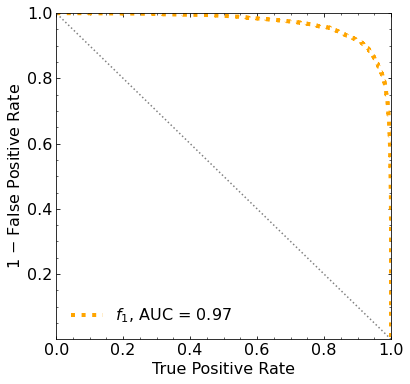

Classification score:


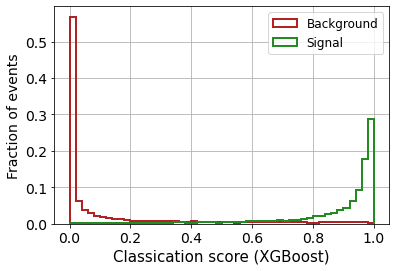


 ROC-AUC =  0.9695710663339319
At least 5 B events per bin, range = [[0, 1]]:
# bins:  21 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  21
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0065


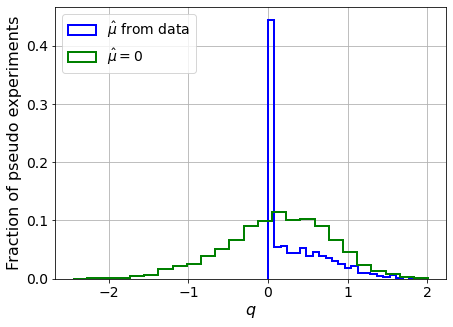

muhat mean:  -0.01160305369845672
Z_bins:  0.40934968660244736
std Z_bins:  0.4911564325808221
Z_bins mu=0:  0.40934968660244736
std Z_bins mu=0:  0.809162738163852

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0115


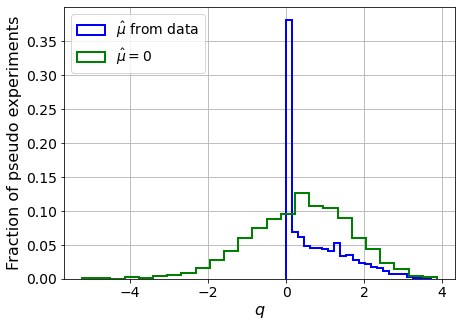

muhat mean:  0.09319319747424293
Z_bins:  0.6666194722984266
std Z_bins:  0.6146015536199032
Z_bins mu=0:  0.665761560301863
std Z_bins mu=0:  0.9566631767363283

--------

B_expected:  643
S_expected:  9

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0105


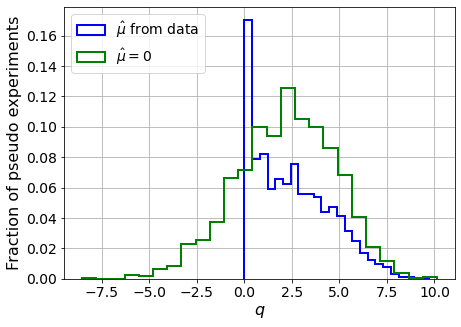

muhat mean:  -0.011212273580128836
Z_bins:  1.50850374338474
std Z_bins:  0.6611527085497058
Z_bins mu=0:  1.50850374338474
std Z_bins mu=0:  0.8527467012384076

--------

B_expected:  643
S_expected:  19

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.007


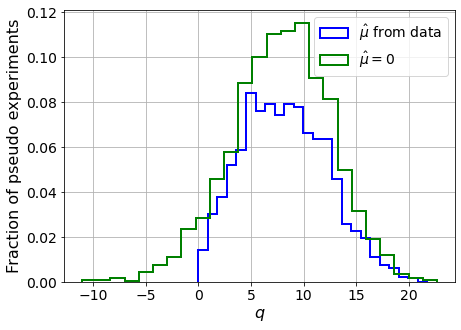

muhat mean:  -0.0069266060002784
Z_bins:  2.8401749867590884
std Z_bins:  0.7147206907844
Z_bins mu=0:  2.8401749867590884
std Z_bins mu=0:  0.8292136279293082

--------

B_expected:  643
S_expected:  41

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0055


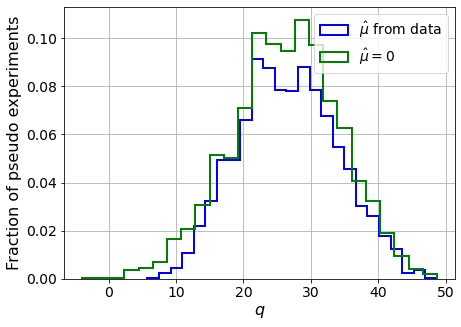

muhat mean:  0.004507103817063428
Z_bins:  5.147076620242733
std Z_bins:  0.7119881389581315
Z_bins mu=0:  5.1468551960597315
std Z_bins mu=0:  0.777110492512926

--------

B_expected:  643
S_expected:  89

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0065


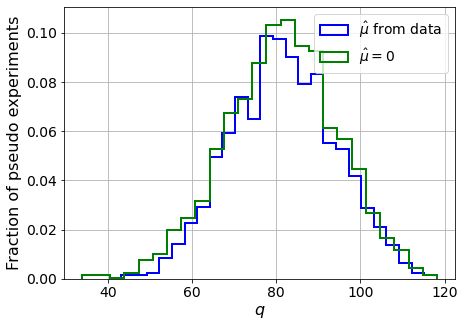

muhat mean:  0.002102947835501368
Z_bins:  9.035155743099688
std Z_bins:  0.6921241412452364
Z_bins mu=0:  9.03317592334371
std Z_bins mu=0:  0.7327597850627894

--------

B_expected:  643
S_expected:  192

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0115


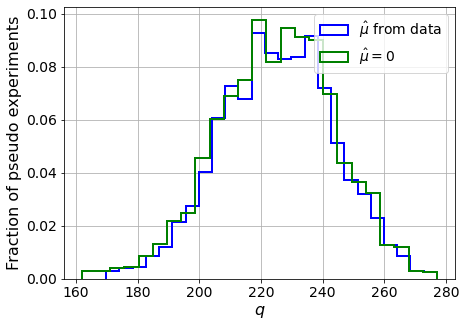

muhat mean:  0.0012021557836671833
Z_bins:  15.018504200010124
std Z_bins:  0.6120226203324569
Z_bins mu=0:  15.016531645889325
std Z_bins mu=0:  0.6351945124138668

--------

B_expected:  643
S_expected:  413

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.007


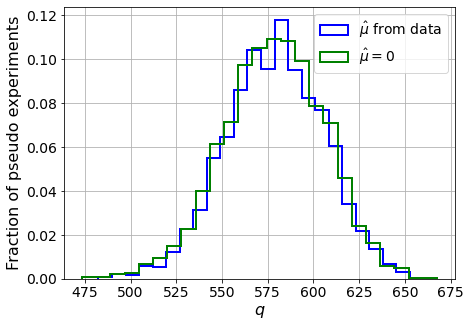

muhat mean:  -0.0005900882166949694
Z_bins:  24.074285576603494
std Z_bins:  0.5585800550968988
Z_bins mu=0:  24.07285510636075
std Z_bins mu=0:  0.5726990561260942

--------

B_expected:  643
S_expected:  889

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.009


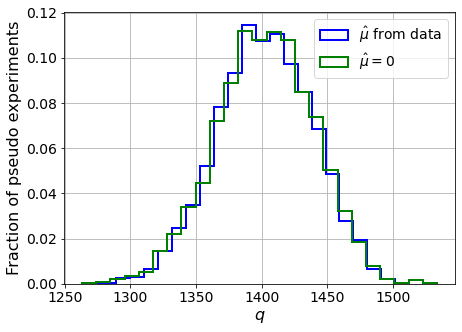

muhat mean:  -5.199066349741071e-05
Z_bins:  37.45470317303698
std Z_bins:  0.4862426914600351
Z_bins mu=0:  37.453574521330594
std Z_bins mu=0:  0.49455860000895313

--------

B_expected:  643
S_expected:  1915

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0135


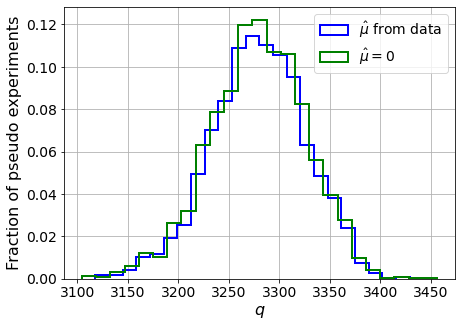

muhat mean:  4.2130694176171486e-05
Z_bins:  57.2707165290579
std Z_bins:  0.41055285060033125
Z_bins mu=0:  57.270288435088446
std Z_bins mu=0:  0.41632708671123386

--------


 FINAL RESULT:

[[0.40934968660244736, 0.4911564325808221, -0.01160305369845672, 0.40934968660244736, 0.809162738163852], [0.6666194722984266, 0.6146015536199032, 0.09319319747424293, 0.665761560301863, 0.9566631767363283], [1.50850374338474, 0.6611527085497058, -0.011212273580128836, 1.50850374338474, 0.8527467012384076], [2.8401749867590884, 0.7147206907844, -0.0069266060002784, 2.8401749867590884, 0.8292136279293082], [5.147076620242733, 0.7119881389581315, 0.004507103817063428, 5.1468551960597315, 0.777110492512926], [9.035155743099688, 0.6921241412452364, 0.002102947835501368, 9.03317592334371, 0.7327597850627894], [15.018504200010124, 0.6120226203324569, 0.0012021557836671833, 15.016531645889325, 0.6351945124138668], [24.074285576603494, 0.5585800550968988, -0.0005900882166949694, 24.07285510636075, 0.572

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  322.10617446  290.80604964  256.36464784  217.9429968   173.66828293
  127.82822498   78.20755235   22.12483072  -37.13583125 -100.13068744]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
 224.30304597 222.08504398 211.88764841 195.108391

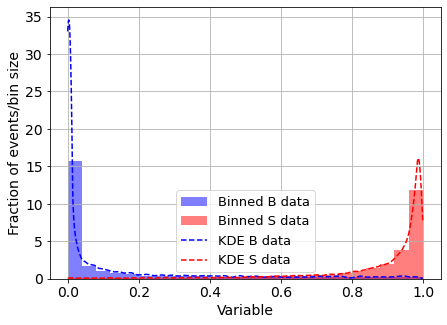

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.013538761800225447
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  2



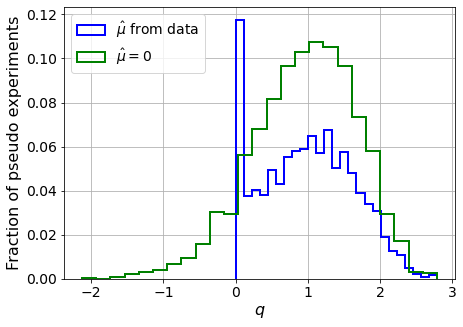

muhat mean:  -3.739720398168849
Z_bins:  1.0029207904276816
std Z_bins:  0.314289877048489
Z_bins mu=0:  1.0029207904276816
std Z_bins mu=0:  0.3567733623751193

--------

B_expected:  643
S_expected:  4



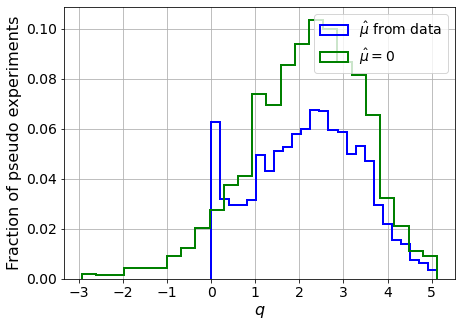

muhat mean:  -1.676983440936344
Z_bins:  1.5028837201057323
std Z_bins:  0.3918774522708684
Z_bins mu=0:  1.5028837201057323
std Z_bins mu=0:  0.4348595731755056

--------

B_expected:  643
S_expected:  9



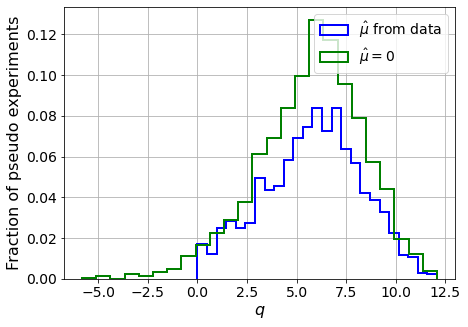

muhat mean:  -0.829922091567435
Z_bins:  2.4343031301769895
std Z_bins:  0.5052531601206128
Z_bins mu=0:  2.4343031301769895
std Z_bins mu=0:  0.5426124298491086

--------

B_expected:  643
S_expected:  19



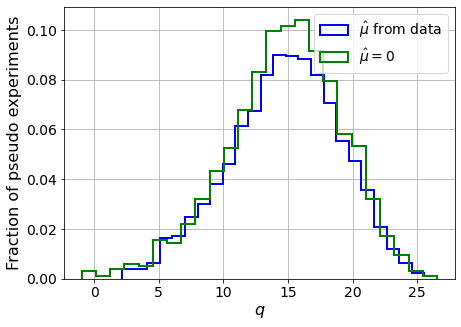

muhat mean:  -0.3851838951273441
Z_bins:  3.871071076007171
std Z_bins:  0.5522823055182098
Z_bins mu=0:  3.871071076007171
std Z_bins mu=0:  0.5722706403718427

--------

B_expected:  643
S_expected:  41



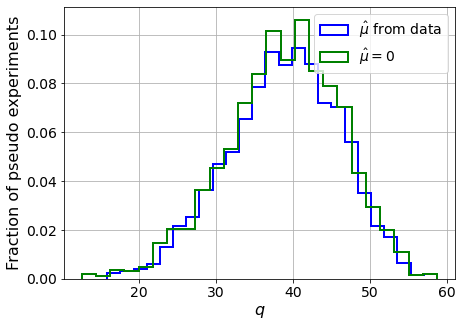

muhat mean:  -0.170431565039943
Z_bins:  6.263332932340461
std Z_bins:  0.5791926965021237
Z_bins mu=0:  6.263332932340461
std Z_bins mu=0:  0.5903546819181966

--------

B_expected:  643
S_expected:  89



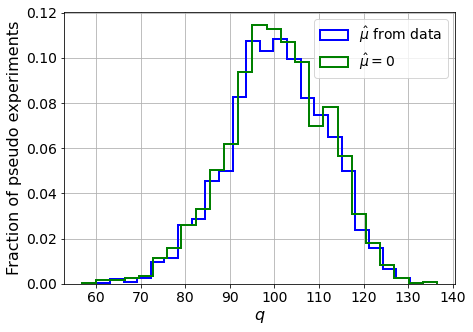

muhat mean:  -0.07923440133037221
Z_bins:  10.035719084491545
std Z_bins:  0.5583328093040238
Z_bins mu=0:  10.035719084491545
std Z_bins mu=0:  0.5649969794869202

--------

B_expected:  643
S_expected:  192



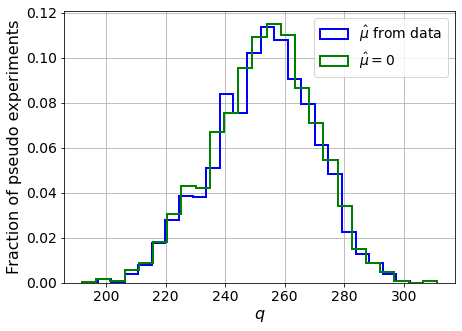

muhat mean:  -0.03587118895758641
Z_bins:  15.937941314897865
std Z_bins:  0.535390801770255
Z_bins mu=0:  15.937286851356548
std Z_bins mu=0:  0.5394916470928522

--------

B_expected:  643
S_expected:  413



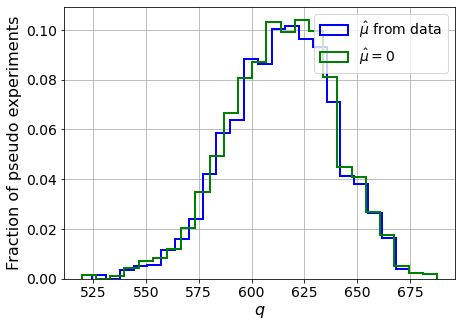

muhat mean:  -0.01704431077411337
Z_bins:  24.80475532298984
std Z_bins:  0.5076684590317276
Z_bins mu=0:  24.804260631172284
std Z_bins mu=0:  0.510567054580335

--------

B_expected:  643
S_expected:  889



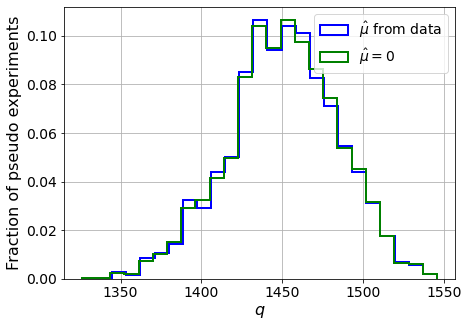

muhat mean:  -0.008028023579242136
Z_bins:  38.09398540156093
std Z_bins:  0.44471354124845924
Z_bins mu=0:  38.09398540156093
std Z_bins mu=0:  0.44606248656987624

--------

B_expected:  643
S_expected:  1915



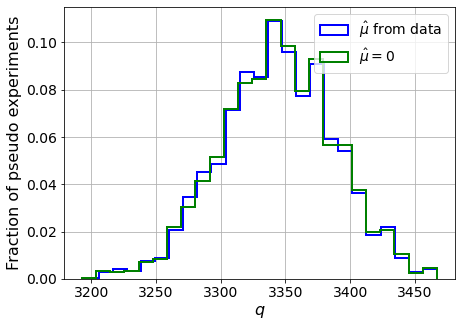

muhat mean:  -0.0036575020455724377
Z_bins:  57.833079690140494
std Z_bins:  0.3803090173152895
Z_bins mu=0:  57.830272843074304
std Z_bins mu=0:  0.38124771768765353

--------


 FINAL RESULT:

[[1.0029207904276816, 0.314289877048489, -3.739720398168849, 1.0029207904276816, 0.3567733623751193], [1.5028837201057323, 0.3918774522708684, -1.676983440936344, 1.5028837201057323, 0.4348595731755056], [2.4343031301769895, 0.5052531601206128, -0.829922091567435, 2.4343031301769895, 0.5426124298491086], [3.871071076007171, 0.5522823055182098, -0.3851838951273441, 3.871071076007171, 0.5722706403718427], [6.263332932340461, 0.5791926965021237, -0.170431565039943, 6.263332932340461, 0.5903546819181966], [10.035719084491545, 0.5583328093040238, -0.07923440133037221, 10.035719084491545, 0.5649969794869202], [15.937941314897865, 0.535390801770255, -0.03587118895758641, 15.937286851356548, 0.5394916470928522], [24.80475532298984, 0.5076684590317276, -0.01704431077411337, 24.804260631172284, 0.5105670

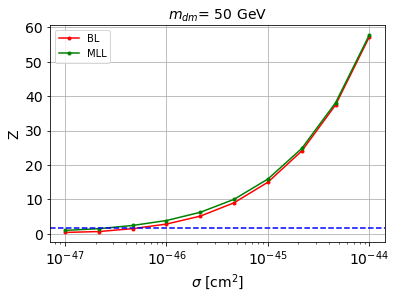


cross_BL_164:  5.092710098153243e-47
cross_BL_164_up:  3.0917522290731407e-47
cross_BL_164_down:  7.864838641085505e-47

cross_MLL_164:  2.4770008111143274e-47
cross_MLL_164_up:  1.6519200881573136e-47
cross_MLL_164_down:  3.707726787205134e-47

#########################


#########################

mDM =  100 GeV


S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)
 NUM_DAT:  32010 

NUM_DAT_ER:  31600
NUM_DAT_AC:  113
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  266

B_pbot.shape:  (32010,)
B_ptop.shape:  (32010,)
B_ppeakS1.shape : (32010, 8)
B_ppeakS2.shape:  (32010, 8)

S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 8)
S_ppeakS2.shape:  (32010, 8)


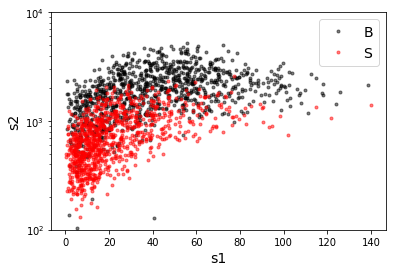

B_pdiffT.shape:  (32010,)
S_pdiffT.shape:  (32010,)


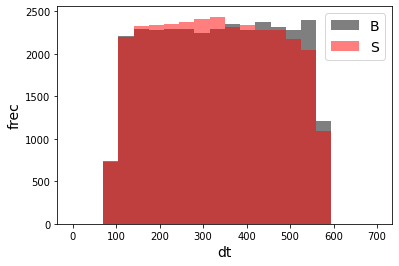

B_pbot.shape:  (32010,)
B_ptop.shape:  (32010,)
B_ppeakS1.shape : (32010, 7)
B_ppeakS2.shape:  (32010, 7)
S_pbot.shape:  (32010,)
S_ptop.shape:  (32010,)
S_ppeakS1.shape : (32010, 7)
S_ppeakS2.shape:  (32010, 7)
X_mon_B.shape:  (32010, 14)
X_mon_S.shape:  (32010, 14)
X_mon.shape:  (64020, 14)

X_mon_train :  (40812, 14)
y_mon_train :  (40812,)
X_mon_val :  (7203, 14)
y_mon_val :  (7203,)
X_mon_test :  (16005, 14)
y_mon_test :  (16005,)

[0]	validation_0-logloss:0.68714	validation_1-logloss:0.68719
[1]	validation_0-logloss:0.68124	validation_1-logloss:0.68136
[2]	validation_0-logloss:0.67545	validation_1-logloss:0.67562
[3]	validation_0-logloss:0.66976	validation_1-logloss:0.66997
[4]	validation_0-logloss:0.66418	validation_1-logloss:0.66444
[5]	validation_0-logloss:0.65872	validation_1-logloss:0.65902
[6]	validation_0-logloss:0.65334	validation_1-logloss:0.65370
[7]	validation_0-logloss:0.64807	validation_1-logloss:0.64847
[8]	validation_0-logloss:0.64290	validation_1-logloss:0.64333
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.62314	validation_1-logloss:0.62377
[13]	validation_0-logloss:0.61840	validation_1-logloss:0.61907
[14]	validation_0-logloss:0.61376	validation_1-logloss:0.61447
[15]	validation_0-logloss:0.60921	validation_1-logloss:0.60999
[16]	validation_0-logloss:0.60471	validation_1-logloss:0.60555
[17]	validation_0-logloss:0.60032	validation_1-logloss:0.60123
[18]	validation_0-logloss:0.59596	validation_1-logloss:0.59693
[19]	validation_0-logloss:0.59171	validation_1-logloss:0.59274
[20]	validation_0-logloss:0.58755	validation_1-logloss:0.58866
[21]	validation_0-logloss:0.58341	validation_1-logloss:0.58456
[22]	validation_0-logloss:0.57939	validation_1-logloss:0.58059
[23]	validation_0-logloss:0.57537	validation_1-logloss:0.57665
[24]	validation_0-logloss:0.57143	validation_1-logloss:0.57275
[25]	validation_0-logloss:0.56758	validation_1-logloss:0.56900
[26]	validation_0-logloss:0.56375	validation_1-logloss:0.56522
[27]	validation_0-logloss:0.56005	validation_1-logloss:

[142]	validation_0-logloss:0.34591	validation_1-logloss:0.35228
[143]	validation_0-logloss:0.34504	validation_1-logloss:0.35144
[144]	validation_0-logloss:0.34421	validation_1-logloss:0.35064
[145]	validation_0-logloss:0.34335	validation_1-logloss:0.34983
[146]	validation_0-logloss:0.34249	validation_1-logloss:0.34901
[147]	validation_0-logloss:0.34163	validation_1-logloss:0.34819
[148]	validation_0-logloss:0.34079	validation_1-logloss:0.34737
[149]	validation_0-logloss:0.33996	validation_1-logloss:0.34659
[150]	validation_0-logloss:0.33916	validation_1-logloss:0.34581
[151]	validation_0-logloss:0.33834	validation_1-logloss:0.34502
[152]	validation_0-logloss:0.33757	validation_1-logloss:0.34429
[153]	validation_0-logloss:0.33677	validation_1-logloss:0.34353
[154]	validation_0-logloss:0.33603	validation_1-logloss:0.34282
[155]	validation_0-logloss:0.33524	validation_1-logloss:0.34208
[156]	validation_0-logloss:0.33449	validation_1-logloss:0.34133
[157]	validation_0-logloss:0.33373	valid

[271]	validation_0-logloss:0.28153	validation_1-logloss:0.29229
[272]	validation_0-logloss:0.28125	validation_1-logloss:0.29202
[273]	validation_0-logloss:0.28101	validation_1-logloss:0.29180
[274]	validation_0-logloss:0.28074	validation_1-logloss:0.29157
[275]	validation_0-logloss:0.28048	validation_1-logloss:0.29135
[276]	validation_0-logloss:0.28023	validation_1-logloss:0.29112
[277]	validation_0-logloss:0.27997	validation_1-logloss:0.29089
[278]	validation_0-logloss:0.27971	validation_1-logloss:0.29064
[279]	validation_0-logloss:0.27947	validation_1-logloss:0.29040
[280]	validation_0-logloss:0.27924	validation_1-logloss:0.29021
[281]	validation_0-logloss:0.27902	validation_1-logloss:0.29004
[282]	validation_0-logloss:0.27879	validation_1-logloss:0.28985
[283]	validation_0-logloss:0.27855	validation_1-logloss:0.28961
[284]	validation_0-logloss:0.27834	validation_1-logloss:0.28945
[285]	validation_0-logloss:0.27812	validation_1-logloss:0.28924
[286]	validation_0-logloss:0.27789	valid

[400]	validation_0-logloss:0.25922	validation_1-logloss:0.27259
[401]	validation_0-logloss:0.25911	validation_1-logloss:0.27250
[402]	validation_0-logloss:0.25900	validation_1-logloss:0.27238
[403]	validation_0-logloss:0.25887	validation_1-logloss:0.27227
[404]	validation_0-logloss:0.25876	validation_1-logloss:0.27219
[405]	validation_0-logloss:0.25862	validation_1-logloss:0.27207
[406]	validation_0-logloss:0.25850	validation_1-logloss:0.27197
[407]	validation_0-logloss:0.25840	validation_1-logloss:0.27189
[408]	validation_0-logloss:0.25827	validation_1-logloss:0.27178
[409]	validation_0-logloss:0.25819	validation_1-logloss:0.27171
[410]	validation_0-logloss:0.25805	validation_1-logloss:0.27160
[411]	validation_0-logloss:0.25795	validation_1-logloss:0.27152
[412]	validation_0-logloss:0.25786	validation_1-logloss:0.27144
[413]	validation_0-logloss:0.25774	validation_1-logloss:0.27136
[414]	validation_0-logloss:0.25764	validation_1-logloss:0.27127
[415]	validation_0-logloss:0.25752	valid

[529]	validation_0-logloss:0.24681	validation_1-logloss:0.26381
[530]	validation_0-logloss:0.24673	validation_1-logloss:0.26376
[531]	validation_0-logloss:0.24667	validation_1-logloss:0.26372
[532]	validation_0-logloss:0.24657	validation_1-logloss:0.26365
[533]	validation_0-logloss:0.24651	validation_1-logloss:0.26361
[534]	validation_0-logloss:0.24643	validation_1-logloss:0.26356
[535]	validation_0-logloss:0.24633	validation_1-logloss:0.26349
[536]	validation_0-logloss:0.24627	validation_1-logloss:0.26345
[537]	validation_0-logloss:0.24620	validation_1-logloss:0.26340
[538]	validation_0-logloss:0.24609	validation_1-logloss:0.26334
[539]	validation_0-logloss:0.24602	validation_1-logloss:0.26328
[540]	validation_0-logloss:0.24595	validation_1-logloss:0.26323
[541]	validation_0-logloss:0.24589	validation_1-logloss:0.26318
[542]	validation_0-logloss:0.24579	validation_1-logloss:0.26311
[543]	validation_0-logloss:0.24571	validation_1-logloss:0.26308
[544]	validation_0-logloss:0.24566	valid

[658]	validation_0-logloss:0.23832	validation_1-logloss:0.25872
[659]	validation_0-logloss:0.23827	validation_1-logloss:0.25869
[660]	validation_0-logloss:0.23821	validation_1-logloss:0.25866
[661]	validation_0-logloss:0.23815	validation_1-logloss:0.25864
[662]	validation_0-logloss:0.23809	validation_1-logloss:0.25862
[663]	validation_0-logloss:0.23803	validation_1-logloss:0.25857
[664]	validation_0-logloss:0.23796	validation_1-logloss:0.25856
[665]	validation_0-logloss:0.23791	validation_1-logloss:0.25852
[666]	validation_0-logloss:0.23784	validation_1-logloss:0.25849
[667]	validation_0-logloss:0.23780	validation_1-logloss:0.25847
[668]	validation_0-logloss:0.23775	validation_1-logloss:0.25845
[669]	validation_0-logloss:0.23769	validation_1-logloss:0.25840
[670]	validation_0-logloss:0.23762	validation_1-logloss:0.25839
[671]	validation_0-logloss:0.23758	validation_1-logloss:0.25837
[672]	validation_0-logloss:0.23752	validation_1-logloss:0.25834
[673]	validation_0-logloss:0.23747	valid

[787]	validation_0-logloss:0.23209	validation_1-logloss:0.25605
[788]	validation_0-logloss:0.23206	validation_1-logloss:0.25606
[789]	validation_0-logloss:0.23200	validation_1-logloss:0.25603
[790]	validation_0-logloss:0.23198	validation_1-logloss:0.25602
[791]	validation_0-logloss:0.23196	validation_1-logloss:0.25600
[792]	validation_0-logloss:0.23192	validation_1-logloss:0.25599
[793]	validation_0-logloss:0.23187	validation_1-logloss:0.25597
[794]	validation_0-logloss:0.23184	validation_1-logloss:0.25595
[795]	validation_0-logloss:0.23181	validation_1-logloss:0.25594
[796]	validation_0-logloss:0.23177	validation_1-logloss:0.25594
[797]	validation_0-logloss:0.23173	validation_1-logloss:0.25591
[798]	validation_0-logloss:0.23166	validation_1-logloss:0.25590
[799]	validation_0-logloss:0.23163	validation_1-logloss:0.25587
[800]	validation_0-logloss:0.23160	validation_1-logloss:0.25587
[801]	validation_0-logloss:0.23156	validation_1-logloss:0.25587
[802]	validation_0-logloss:0.23152	valid

[916]	validation_0-logloss:0.22732	validation_1-logloss:0.25449
[917]	validation_0-logloss:0.22731	validation_1-logloss:0.25448
[918]	validation_0-logloss:0.22728	validation_1-logloss:0.25448
[919]	validation_0-logloss:0.22726	validation_1-logloss:0.25447
[920]	validation_0-logloss:0.22720	validation_1-logloss:0.25445
[921]	validation_0-logloss:0.22717	validation_1-logloss:0.25443
[922]	validation_0-logloss:0.22715	validation_1-logloss:0.25442
[923]	validation_0-logloss:0.22711	validation_1-logloss:0.25441
[924]	validation_0-logloss:0.22708	validation_1-logloss:0.25440
[925]	validation_0-logloss:0.22704	validation_1-logloss:0.25437
[926]	validation_0-logloss:0.22701	validation_1-logloss:0.25437
[927]	validation_0-logloss:0.22698	validation_1-logloss:0.25438
[928]	validation_0-logloss:0.22693	validation_1-logloss:0.25435
[929]	validation_0-logloss:0.22690	validation_1-logloss:0.25433
[930]	validation_0-logloss:0.22686	validation_1-logloss:0.25431
[931]	validation_0-logloss:0.22684	valid

[1044]	validation_0-logloss:0.22335	validation_1-logloss:0.25351
[1045]	validation_0-logloss:0.22332	validation_1-logloss:0.25351
[1046]	validation_0-logloss:0.22328	validation_1-logloss:0.25350
[1047]	validation_0-logloss:0.22326	validation_1-logloss:0.25351
[1048]	validation_0-logloss:0.22320	validation_1-logloss:0.25347
[1049]	validation_0-logloss:0.22316	validation_1-logloss:0.25348
[1050]	validation_0-logloss:0.22313	validation_1-logloss:0.25348
[1051]	validation_0-logloss:0.22308	validation_1-logloss:0.25348
[1052]	validation_0-logloss:0.22306	validation_1-logloss:0.25348
[1053]	validation_0-logloss:0.22303	validation_1-logloss:0.25347
[1054]	validation_0-logloss:0.22301	validation_1-logloss:0.25346
[1055]	validation_0-logloss:0.22297	validation_1-logloss:0.25345
[1056]	validation_0-logloss:0.22295	validation_1-logloss:0.25346
[1057]	validation_0-logloss:0.22291	validation_1-logloss:0.25344
[1058]	validation_0-logloss:0.22287	validation_1-logloss:0.25345
[1059]	validation_0-loglo

[1171]	validation_0-logloss:0.21953	validation_1-logloss:0.25267
[1172]	validation_0-logloss:0.21947	validation_1-logloss:0.25265
[1173]	validation_0-logloss:0.21945	validation_1-logloss:0.25264
[1174]	validation_0-logloss:0.21941	validation_1-logloss:0.25264
[1175]	validation_0-logloss:0.21937	validation_1-logloss:0.25263
[1176]	validation_0-logloss:0.21935	validation_1-logloss:0.25264
[1177]	validation_0-logloss:0.21933	validation_1-logloss:0.25264
[1178]	validation_0-logloss:0.21928	validation_1-logloss:0.25262
[1179]	validation_0-logloss:0.21925	validation_1-logloss:0.25261
[1180]	validation_0-logloss:0.21923	validation_1-logloss:0.25261
[1181]	validation_0-logloss:0.21919	validation_1-logloss:0.25260
[1182]	validation_0-logloss:0.21915	validation_1-logloss:0.25258
[1183]	validation_0-logloss:0.21912	validation_1-logloss:0.25257
[1184]	validation_0-logloss:0.21908	validation_1-logloss:0.25257
[1185]	validation_0-logloss:0.21906	validation_1-logloss:0.25257
[1186]	validation_0-loglo

[1298]	validation_0-logloss:0.21606	validation_1-logloss:0.25223
[1299]	validation_0-logloss:0.21604	validation_1-logloss:0.25222
[1300]	validation_0-logloss:0.21600	validation_1-logloss:0.25222
[1301]	validation_0-logloss:0.21598	validation_1-logloss:0.25220
[1302]	validation_0-logloss:0.21594	validation_1-logloss:0.25220
[1303]	validation_0-logloss:0.21592	validation_1-logloss:0.25220
[1304]	validation_0-logloss:0.21589	validation_1-logloss:0.25220
[1305]	validation_0-logloss:0.21586	validation_1-logloss:0.25220
[1306]	validation_0-logloss:0.21584	validation_1-logloss:0.25220
[1307]	validation_0-logloss:0.21581	validation_1-logloss:0.25220
[1308]	validation_0-logloss:0.21579	validation_1-logloss:0.25220
[1309]	validation_0-logloss:0.21577	validation_1-logloss:0.25221
[1310]	validation_0-logloss:0.21574	validation_1-logloss:0.25220
[1311]	validation_0-logloss:0.21571	validation_1-logloss:0.25221
[1312]	validation_0-logloss:0.21568	validation_1-logloss:0.25221
[1313]	validation_0-loglo

[1551]	validation_0-logloss:0.21032	validation_1-logloss:0.25151
[1552]	validation_0-logloss:0.21029	validation_1-logloss:0.25150
[1553]	validation_0-logloss:0.21026	validation_1-logloss:0.25149
[1554]	validation_0-logloss:0.21023	validation_1-logloss:0.25149
[1555]	validation_0-logloss:0.21021	validation_1-logloss:0.25150
[1556]	validation_0-logloss:0.21017	validation_1-logloss:0.25149
[1557]	validation_0-logloss:0.21015	validation_1-logloss:0.25149
[1558]	validation_0-logloss:0.21014	validation_1-logloss:0.25148
[1559]	validation_0-logloss:0.21013	validation_1-logloss:0.25149
[1560]	validation_0-logloss:0.21012	validation_1-logloss:0.25149
[1561]	validation_0-logloss:0.21011	validation_1-logloss:0.25149
[1562]	validation_0-logloss:0.21008	validation_1-logloss:0.25149
[1563]	validation_0-logloss:0.21007	validation_1-logloss:0.25150
[1564]	validation_0-logloss:0.21003	validation_1-logloss:0.25149
[1565]	validation_0-logloss:0.21000	validation_1-logloss:0.25150
[1566]	validation_0-loglo

[1678]	validation_0-logloss:0.20740	validation_1-logloss:0.25137
[1679]	validation_0-logloss:0.20739	validation_1-logloss:0.25137
[1680]	validation_0-logloss:0.20738	validation_1-logloss:0.25137
[1681]	validation_0-logloss:0.20735	validation_1-logloss:0.25137
[1682]	validation_0-logloss:0.20733	validation_1-logloss:0.25136
[1683]	validation_0-logloss:0.20731	validation_1-logloss:0.25135
[1684]	validation_0-logloss:0.20730	validation_1-logloss:0.25135
[1685]	validation_0-logloss:0.20728	validation_1-logloss:0.25135
[1686]	validation_0-logloss:0.20726	validation_1-logloss:0.25135
[1687]	validation_0-logloss:0.20724	validation_1-logloss:0.25135
[1688]	validation_0-logloss:0.20721	validation_1-logloss:0.25134
[1689]	validation_0-logloss:0.20717	validation_1-logloss:0.25133
[1690]	validation_0-logloss:0.20714	validation_1-logloss:0.25133
[1691]	validation_0-logloss:0.20711	validation_1-logloss:0.25134
[1692]	validation_0-logloss:0.20709	validation_1-logloss:0.25135
[1693]	validation_0-loglo

[1805]	validation_0-logloss:0.20449	validation_1-logloss:0.25119
[1806]	validation_0-logloss:0.20445	validation_1-logloss:0.25118
[1807]	validation_0-logloss:0.20442	validation_1-logloss:0.25118
[1808]	validation_0-logloss:0.20439	validation_1-logloss:0.25119
[1809]	validation_0-logloss:0.20438	validation_1-logloss:0.25118
[1810]	validation_0-logloss:0.20435	validation_1-logloss:0.25120
[1811]	validation_0-logloss:0.20433	validation_1-logloss:0.25119
[1812]	validation_0-logloss:0.20432	validation_1-logloss:0.25119
[1813]	validation_0-logloss:0.20430	validation_1-logloss:0.25120
[1814]	validation_0-logloss:0.20428	validation_1-logloss:0.25119
[1815]	validation_0-logloss:0.20425	validation_1-logloss:0.25118
[1816]	validation_0-logloss:0.20423	validation_1-logloss:0.25118
[1817]	validation_0-logloss:0.20421	validation_1-logloss:0.25117
[1818]	validation_0-logloss:0.20419	validation_1-logloss:0.25117
[1819]	validation_0-logloss:0.20417	validation_1-logloss:0.25116
[1820]	validation_0-loglo

[1932]	validation_0-logloss:0.20171	validation_1-logloss:0.25101
[1933]	validation_0-logloss:0.20169	validation_1-logloss:0.25101
[1934]	validation_0-logloss:0.20167	validation_1-logloss:0.25101
[1935]	validation_0-logloss:0.20165	validation_1-logloss:0.25102
[1936]	validation_0-logloss:0.20164	validation_1-logloss:0.25102
[1937]	validation_0-logloss:0.20163	validation_1-logloss:0.25102
[1938]	validation_0-logloss:0.20162	validation_1-logloss:0.25101
[1939]	validation_0-logloss:0.20160	validation_1-logloss:0.25102
[1940]	validation_0-logloss:0.20159	validation_1-logloss:0.25102
[1941]	validation_0-logloss:0.20157	validation_1-logloss:0.25101
[1942]	validation_0-logloss:0.20153	validation_1-logloss:0.25099
[1943]	validation_0-logloss:0.20150	validation_1-logloss:0.25098
[1944]	validation_0-logloss:0.20147	validation_1-logloss:0.25098
[1945]	validation_0-logloss:0.20147	validation_1-logloss:0.25098
[1946]	validation_0-logloss:0.20145	validation_1-logloss:0.25098
[1947]	validation_0-loglo

[2059]	validation_0-logloss:0.19916	validation_1-logloss:0.25092
[2060]	validation_0-logloss:0.19914	validation_1-logloss:0.25093
[2061]	validation_0-logloss:0.19913	validation_1-logloss:0.25093
[2062]	validation_0-logloss:0.19909	validation_1-logloss:0.25092
[2063]	validation_0-logloss:0.19906	validation_1-logloss:0.25092
[2064]	validation_0-logloss:0.19905	validation_1-logloss:0.25092
[2065]	validation_0-logloss:0.19904	validation_1-logloss:0.25091
[2066]	validation_0-logloss:0.19902	validation_1-logloss:0.25092
[2067]	validation_0-logloss:0.19900	validation_1-logloss:0.25091
[2068]	validation_0-logloss:0.19899	validation_1-logloss:0.25091
[2069]	validation_0-logloss:0.19895	validation_1-logloss:0.25090
[2070]	validation_0-logloss:0.19891	validation_1-logloss:0.25090
[2071]	validation_0-logloss:0.19889	validation_1-logloss:0.25090
[2072]	validation_0-logloss:0.19886	validation_1-logloss:0.25090
[2073]	validation_0-logloss:0.19884	validation_1-logloss:0.25089
[2074]	validation_0-loglo

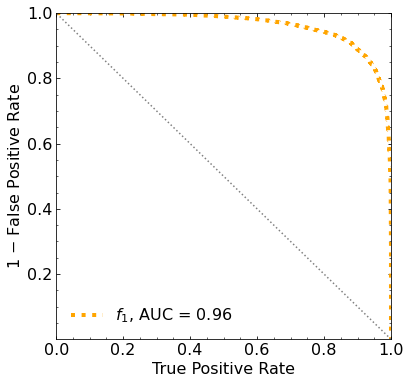

Classification score:


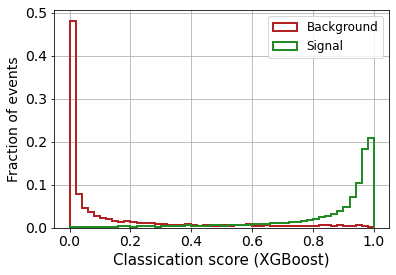


 ROC-AUC =  0.961984290945432
At least 5 B events per bin, range = [[0, 1]]:
# bins:  19 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  19
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


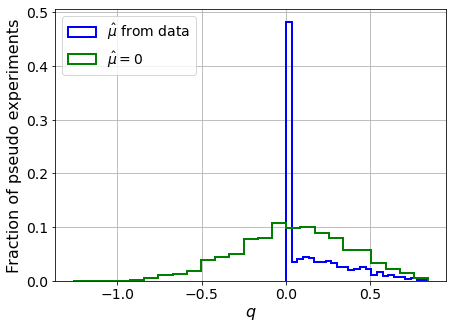

muhat mean:  -0.20722456872069314
Z_bins:  0.2255629652713954
std Z_bins:  0.4372888066824739
Z_bins mu=0:  0.2255629652713954
std Z_bins mu=0:  0.7246697216607574

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.005


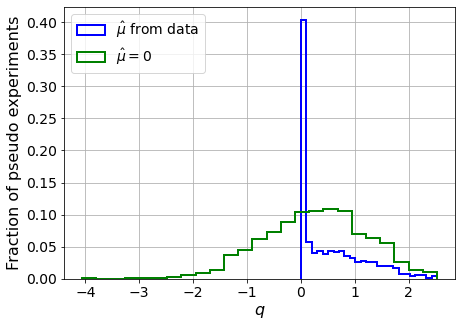

muhat mean:  -0.028444202265977537
Z_bins:  0.5504028398668157
std Z_bins:  0.5564080140340298
Z_bins mu=0:  0.5504028398668157
std Z_bins mu=0:  0.8551274549970178

--------

B_expected:  643
S_expected:  6

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.005


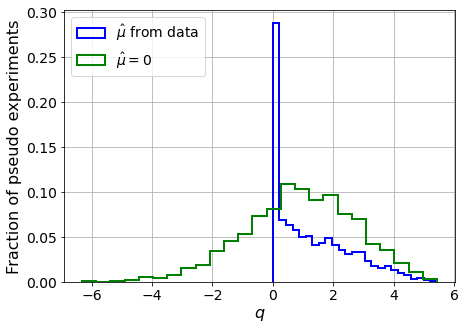

muhat mean:  0.01553221488858764
Z_bins:  0.9820757130558256
std Z_bins:  0.6475262980274173
Z_bins mu=0:  0.9820757130558256
std Z_bins mu=0:  0.9308136855845486

--------

B_expected:  643
S_expected:  14

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.004


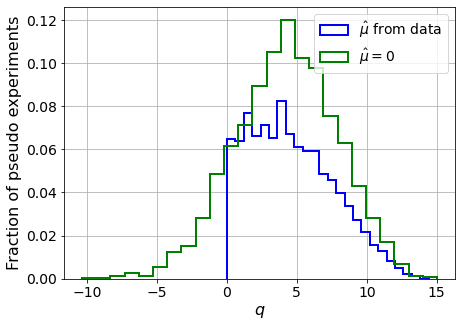

muhat mean:  0.007845184733599568
Z_bins:  2.072122147852905
std Z_bins:  0.7232427853474278
Z_bins mu=0:  2.0697881908775595
std Z_bins mu=0:  0.8793110370566299

--------

B_expected:  643
S_expected:  30

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.006


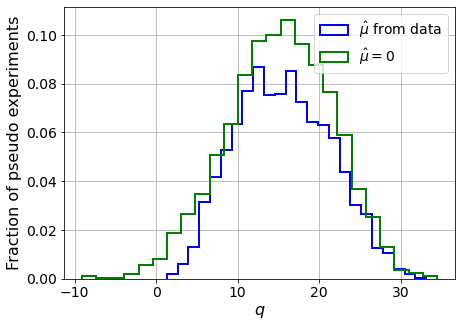

muhat mean:  0.0012014880570863232
Z_bins:  3.930171280904199
std Z_bins:  0.737355920242909
Z_bins mu=0:  3.930056864312114
std Z_bins mu=0:  0.8222068781008884

--------

B_expected:  643
S_expected:  65

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0035


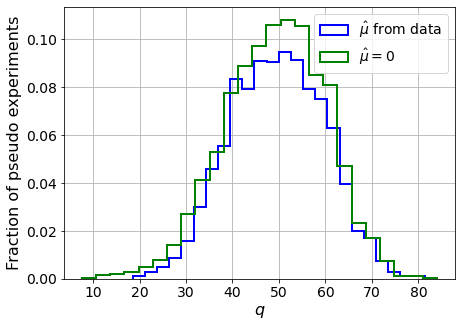

muhat mean:  0.00027203549529891615
Z_bins:  7.051430018147693
std Z_bins:  0.7155789942521331
Z_bins mu=0:  7.051430018147693
std Z_bins mu=0:  0.767652769822605

--------

B_expected:  643
S_expected:  139

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.008


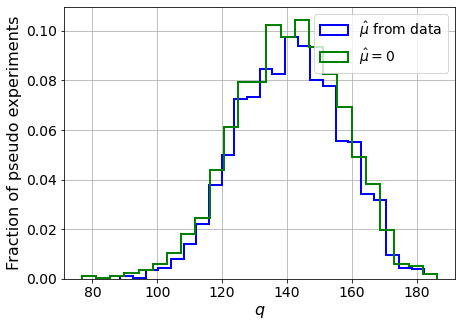

muhat mean:  0.00047178268577770195
Z_bins:  11.891687412493596
std Z_bins:  0.6612347792045854
Z_bins mu=0:  11.891687412493596
std Z_bins mu=0:  0.6911361372852879

--------

B_expected:  643
S_expected:  300

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.004


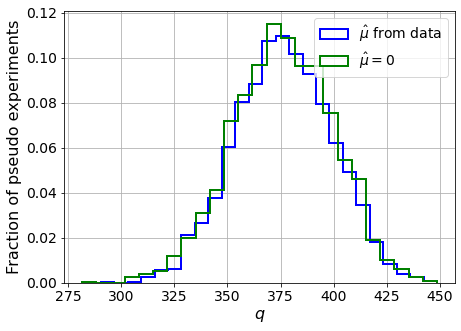

muhat mean:  0.00015036568126409894
Z_bins:  19.400795144705164
std Z_bins:  0.5886624383709351
Z_bins mu=0:  19.399999345267254
std Z_bins mu=0:  0.6054392145420149

--------

B_expected:  643
S_expected:  645

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0055


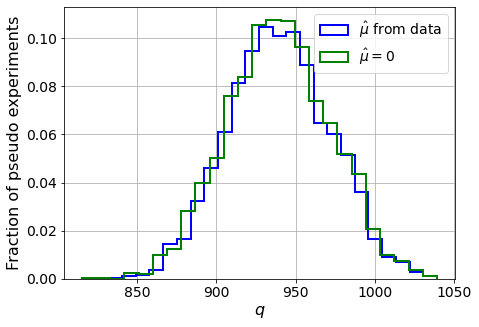

muhat mean:  0.00027315294884245223
Z_bins:  30.646265615470295
std Z_bins:  0.5244622512886356
Z_bins mu=0:  30.64352168169381
std Z_bins mu=0:  0.5341123074476803

--------

B_expected:  643
S_expected:  1390

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0055


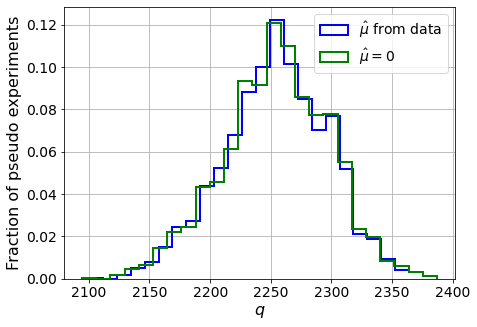

muhat mean:  -8.318321133967934e-05
Z_bins:  47.4923509432963
std Z_bins:  0.45541137709295454
Z_bins mu=0:  47.492255854834035
std Z_bins mu=0:  0.46132186544254394

--------


 FINAL RESULT:

[[0.2255629652713954, 0.4372888066824739, -0.20722456872069314, 0.2255629652713954, 0.7246697216607574], [0.5504028398668157, 0.5564080140340298, -0.028444202265977537, 0.5504028398668157, 0.8551274549970178], [0.9820757130558256, 0.6475262980274173, 0.01553221488858764, 0.9820757130558256, 0.9308136855845486], [2.072122147852905, 0.7232427853474278, 0.007845184733599568, 2.0697881908775595, 0.8793110370566299], [3.930171280904199, 0.737355920242909, 0.0012014880570863232, 3.930056864312114, 0.8222068781008884], [7.051430018147693, 0.7155789942521331, 0.00027203549529891615, 7.051430018147693, 0.767652769822605], [11.891687412493596, 0.6612347792045854, 0.00047178268577770195, 11.891687412493596, 0.6911361372852879], [19.400795144705164, 0.5886624383709351, 0.00015036568126409894, 19.39999934526

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  257.40436539  237.65329993  212.57687064  181.26264992  144.74475187
  104.37488427   57.59210901    7.80364727  -44.80075954 -103.79891353]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 211.94250498 198.51028116 181.440896

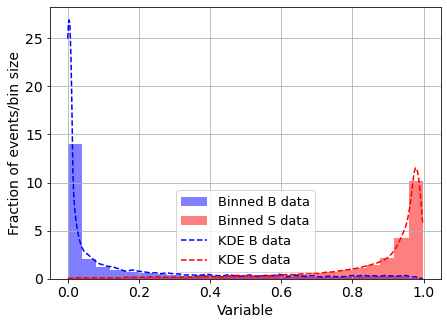

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



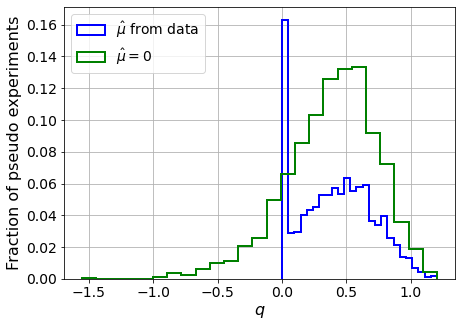

muhat mean:  -7.07381971781184
Z_bins:  0.6499698660454576
std Z_bins:  0.22084498127164057
Z_bins mu=0:  0.6499698660454576
std Z_bins mu=0:  0.270859232075524

--------

B_expected:  643
S_expected:  3



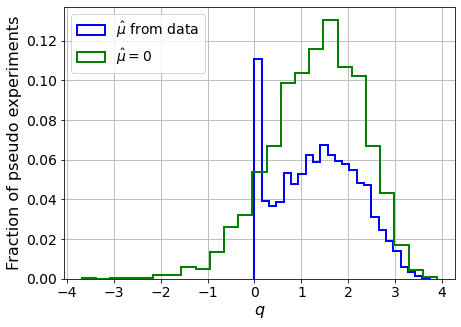

muhat mean:  -2.2894751699491307
Z_bins:  1.1823151456817864
std Z_bins:  0.3606373003219815
Z_bins mu=0:  1.1823151456817864
std Z_bins mu=0:  0.4119257360794965

--------

B_expected:  643
S_expected:  6



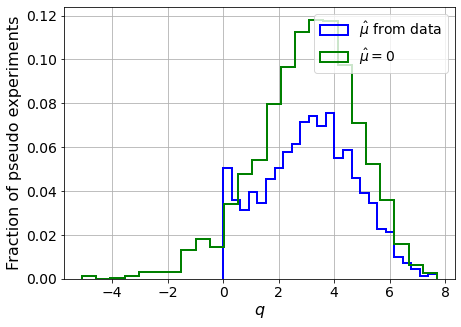

muhat mean:  -1.3025899859712577
Z_bins:  1.7798338105360458
std Z_bins:  0.4619427544152733
Z_bins mu=0:  1.7798338105360458
std Z_bins mu=0:  0.5127544033654912

--------

B_expected:  643
S_expected:  14



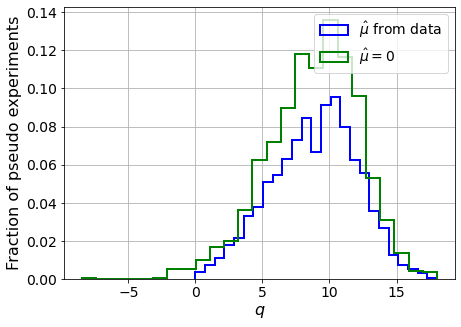

muhat mean:  -0.4869345359941285
Z_bins:  3.0188065790652763
std Z_bins:  0.5325048540398069
Z_bins mu=0:  3.0188065790652763
std Z_bins mu=0:  0.5581922451208208

--------

B_expected:  643
S_expected:  30



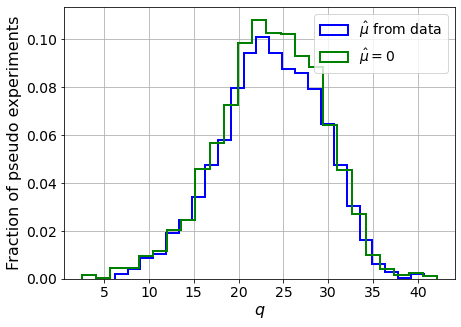

muhat mean:  -0.2816370325501206
Z_bins:  4.870032859102793
std Z_bins:  0.5810768143710956
Z_bins mu=0:  4.870032859102793
std Z_bins mu=0:  0.5949563667977122

--------

B_expected:  643
S_expected:  65



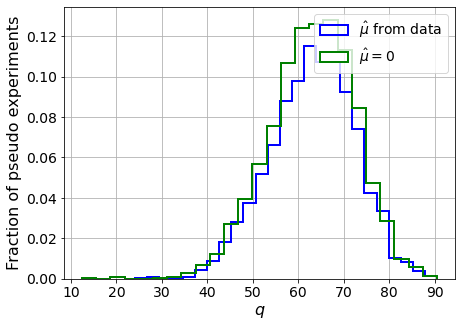

muhat mean:  -0.12819202803149307
Z_bins:  7.964274680855875
std Z_bins:  0.5856440233954818
Z_bins mu=0:  7.964274680855875
std Z_bins mu=0:  0.5971311509679772

--------

B_expected:  643
S_expected:  139



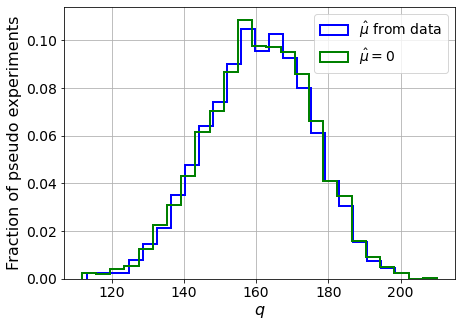

muhat mean:  -0.05722209805324639
Z_bins:  12.687010176765138
std Z_bins:  0.5767210126659227
Z_bins mu=0:  12.687010176765138
std Z_bins mu=0:  0.581729367163198

--------

B_expected:  643
S_expected:  300



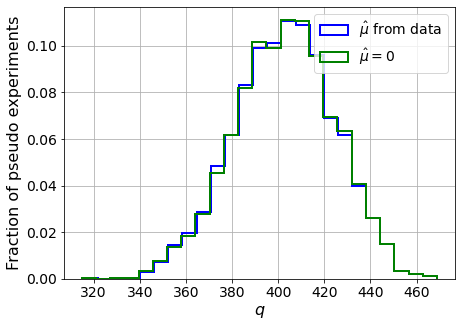

muhat mean:  -0.02465723901174501
Z_bins:  20.09410267817951
std Z_bins:  0.5368208881240539
Z_bins mu=0:  20.09410267817951
std Z_bins mu=0:  0.5397234926723494

--------

B_expected:  643
S_expected:  645



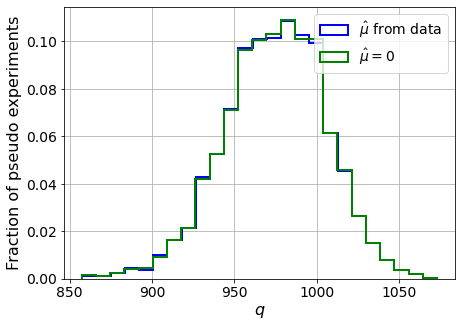

muhat mean:  -0.01178128766568484
Z_bins:  31.23989067721397
std Z_bins:  0.4947572400794702
Z_bins mu=0:  31.23989067721397
std Z_bins mu=0:  0.4967689030823391

--------

B_expected:  643
S_expected:  1390



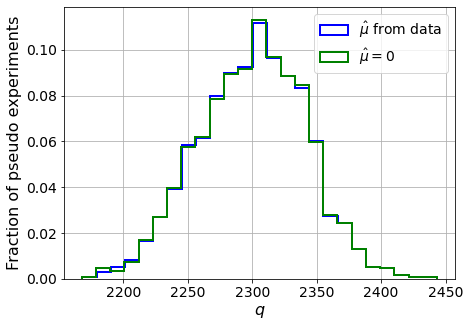

muhat mean:  -0.00522498631735027
Z_bins:  47.98079504291331
std Z_bins:  0.43190846503281444
Z_bins mu=0:  47.98079504291331
std Z_bins mu=0:  0.4328496529940794

--------


 FINAL RESULT:

[[0.6499698660454576, 0.22084498127164057, -7.07381971781184, 0.6499698660454576, 0.270859232075524], [1.1823151456817864, 0.3606373003219815, -2.2894751699491307, 1.1823151456817864, 0.4119257360794965], [1.7798338105360458, 0.4619427544152733, -1.3025899859712577, 1.7798338105360458, 0.5127544033654912], [3.0188065790652763, 0.5325048540398069, -0.4869345359941285, 3.0188065790652763, 0.5581922451208208], [4.870032859102793, 0.5810768143710956, -0.2816370325501206, 4.870032859102793, 0.5949563667977122], [7.964274680855875, 0.5856440233954818, -0.12819202803149307, 7.964274680855875, 0.5971311509679772], [12.687010176765138, 0.5767210126659227, -0.05722209805324639, 12.687010176765138, 0.581729367163198], [20.09410267817951, 0.5368208881240539, -0.02465723901174501, 20.09410267817951, 0.539723492

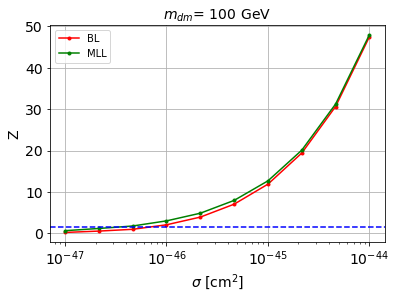


cross_BL_164:  7.792783830258615e-47
cross_BL_164_up:  4.687531695239136e-47
cross_BL_164_down:  1.1642965887383582e-46

cross_MLL_164:  4.0721825845865663e-47
cross_MLL_164_up:  2.4258784570097545e-47
cross_MLL_164_down:  6.034494847120956e-47

#########################


#########################

mDM =  200 GeV


S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)
 NUM_DAT:  31880 

NUM_DAT_ER:  31472
NUM_DAT_AC:  112
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  265

B_pbot.shape:  (31880,)
B_ptop.shape:  (31880,)
B_ppeakS1.shape : (31880, 8)
B_ppeakS2.shape:  (31880, 8)

S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 8)
S_ppeakS2.shape:  (31880, 8)


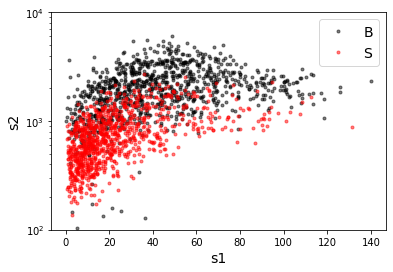

B_pdiffT.shape:  (31880,)
S_pdiffT.shape:  (31880,)


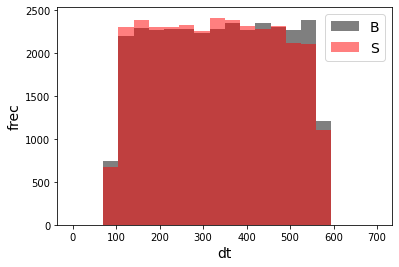

B_pbot.shape:  (31880,)
B_ptop.shape:  (31880,)
B_ppeakS1.shape : (31880, 7)
B_ppeakS2.shape:  (31880, 7)
S_pbot.shape:  (31880,)
S_ptop.shape:  (31880,)
S_ppeakS1.shape : (31880, 7)
S_ppeakS2.shape:  (31880, 7)
X_mon_B.shape:  (31880, 14)
X_mon_S.shape:  (31880, 14)
X_mon.shape:  (63760, 14)

X_mon_train :  (40647, 14)
y_mon_train :  (40647,)
X_mon_val :  (7173, 14)
y_mon_val :  (7173,)
X_mon_test :  (15940, 14)
y_mon_test :  (15940,)

[0]	validation_0-logloss:0.68729	validation_1-logloss:0.68739
[1]	validation_0-logloss:0.68155	validation_1-logloss:0.68173
[2]	validation_0-logloss:0.67592	validation_1-logloss:0.67620
[3]	validation_0-logloss:0.67038	validation_1-logloss:0.67075
[4]	validation_0-logloss:0.66498	validation_1-logloss:0.66543
[5]	validation_0-logloss:0.65965	validation_1-logloss:0.66018
[6]	validation_0-logloss:0.65444	validation_1-logloss:0.65509
[7]	validation_0-logloss:0.64931	validation_1-logloss:0.65006
[8]	validation_0-logloss:0.64429	validation_1-logloss:0.64511
[

/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12]	validation_0-logloss:0.62505	validation_1-logloss:0.62626
[13]	validation_0-logloss:0.62048	validation_1-logloss:0.62180
[14]	validation_0-logloss:0.61600	validation_1-logloss:0.61743
[15]	validation_0-logloss:0.61155	validation_1-logloss:0.61307
[16]	validation_0-logloss:0.60722	validation_1-logloss:0.60884
[17]	validation_0-logloss:0.60294	validation_1-logloss:0.60471
[18]	validation_0-logloss:0.59874	validation_1-logloss:0.60064
[19]	validation_0-logloss:0.59461	validation_1-logloss:0.59660
[20]	validation_0-logloss:0.59055	validation_1-logloss:0.59267
[21]	validation_0-logloss:0.58656	validation_1-logloss:0.58883
[22]	validation_0-logloss:0.58264	validation_1-logloss:0.58501
[23]	validation_0-logloss:0.57878	validation_1-logloss:0.58129
[24]	validation_0-logloss:0.57497	validation_1-logloss:0.57755
[25]	validation_0-logloss:0.57124	validation_1-logloss:0.57392
[26]	validation_0-logloss:0.56758	validation_1-logloss:0.57038
[27]	validation_0-logloss:0.56392	validation_1-logloss:

[142]	validation_0-logloss:0.35440	validation_1-logloss:0.36763
[143]	validation_0-logloss:0.35355	validation_1-logloss:0.36686
[144]	validation_0-logloss:0.35274	validation_1-logloss:0.36612
[145]	validation_0-logloss:0.35189	validation_1-logloss:0.36531
[146]	validation_0-logloss:0.35103	validation_1-logloss:0.36455
[147]	validation_0-logloss:0.35021	validation_1-logloss:0.36380
[148]	validation_0-logloss:0.34939	validation_1-logloss:0.36303
[149]	validation_0-logloss:0.34861	validation_1-logloss:0.36230
[150]	validation_0-logloss:0.34778	validation_1-logloss:0.36151
[151]	validation_0-logloss:0.34702	validation_1-logloss:0.36082
[152]	validation_0-logloss:0.34625	validation_1-logloss:0.36010
[153]	validation_0-logloss:0.34548	validation_1-logloss:0.35939
[154]	validation_0-logloss:0.34469	validation_1-logloss:0.35867
[155]	validation_0-logloss:0.34392	validation_1-logloss:0.35795
[156]	validation_0-logloss:0.34316	validation_1-logloss:0.35723
[157]	validation_0-logloss:0.34242	valid

[271]	validation_0-logloss:0.29098	validation_1-logloss:0.31111
[272]	validation_0-logloss:0.29070	validation_1-logloss:0.31090
[273]	validation_0-logloss:0.29042	validation_1-logloss:0.31069
[274]	validation_0-logloss:0.29019	validation_1-logloss:0.31051
[275]	validation_0-logloss:0.28991	validation_1-logloss:0.31029
[276]	validation_0-logloss:0.28967	validation_1-logloss:0.31008
[277]	validation_0-logloss:0.28941	validation_1-logloss:0.30986
[278]	validation_0-logloss:0.28914	validation_1-logloss:0.30964
[279]	validation_0-logloss:0.28888	validation_1-logloss:0.30941
[280]	validation_0-logloss:0.28865	validation_1-logloss:0.30919
[281]	validation_0-logloss:0.28840	validation_1-logloss:0.30900
[282]	validation_0-logloss:0.28817	validation_1-logloss:0.30878
[283]	validation_0-logloss:0.28791	validation_1-logloss:0.30857
[284]	validation_0-logloss:0.28768	validation_1-logloss:0.30835
[285]	validation_0-logloss:0.28743	validation_1-logloss:0.30814
[286]	validation_0-logloss:0.28721	valid

[400]	validation_0-logloss:0.26766	validation_1-logloss:0.29239
[401]	validation_0-logloss:0.26752	validation_1-logloss:0.29229
[402]	validation_0-logloss:0.26742	validation_1-logloss:0.29223
[403]	validation_0-logloss:0.26732	validation_1-logloss:0.29215
[404]	validation_0-logloss:0.26721	validation_1-logloss:0.29208
[405]	validation_0-logloss:0.26711	validation_1-logloss:0.29200
[406]	validation_0-logloss:0.26698	validation_1-logloss:0.29191
[407]	validation_0-logloss:0.26684	validation_1-logloss:0.29183
[408]	validation_0-logloss:0.26672	validation_1-logloss:0.29175
[409]	validation_0-logloss:0.26662	validation_1-logloss:0.29165
[410]	validation_0-logloss:0.26648	validation_1-logloss:0.29157
[411]	validation_0-logloss:0.26637	validation_1-logloss:0.29150
[412]	validation_0-logloss:0.26623	validation_1-logloss:0.29139
[413]	validation_0-logloss:0.26610	validation_1-logloss:0.29130
[414]	validation_0-logloss:0.26596	validation_1-logloss:0.29120
[415]	validation_0-logloss:0.26582	valid

[529]	validation_0-logloss:0.25520	validation_1-logloss:0.28399
[530]	validation_0-logloss:0.25514	validation_1-logloss:0.28395
[531]	validation_0-logloss:0.25507	validation_1-logloss:0.28390
[532]	validation_0-logloss:0.25498	validation_1-logloss:0.28383
[533]	validation_0-logloss:0.25489	validation_1-logloss:0.28378
[534]	validation_0-logloss:0.25483	validation_1-logloss:0.28376
[535]	validation_0-logloss:0.25474	validation_1-logloss:0.28371
[536]	validation_0-logloss:0.25465	validation_1-logloss:0.28366
[537]	validation_0-logloss:0.25461	validation_1-logloss:0.28363
[538]	validation_0-logloss:0.25453	validation_1-logloss:0.28356
[539]	validation_0-logloss:0.25446	validation_1-logloss:0.28351
[540]	validation_0-logloss:0.25438	validation_1-logloss:0.28348
[541]	validation_0-logloss:0.25430	validation_1-logloss:0.28345
[542]	validation_0-logloss:0.25423	validation_1-logloss:0.28340
[543]	validation_0-logloss:0.25415	validation_1-logloss:0.28334
[544]	validation_0-logloss:0.25411	valid

[658]	validation_0-logloss:0.24712	validation_1-logloss:0.27969
[659]	validation_0-logloss:0.24706	validation_1-logloss:0.27965
[660]	validation_0-logloss:0.24699	validation_1-logloss:0.27963
[661]	validation_0-logloss:0.24693	validation_1-logloss:0.27962
[662]	validation_0-logloss:0.24687	validation_1-logloss:0.27960
[663]	validation_0-logloss:0.24683	validation_1-logloss:0.27958
[664]	validation_0-logloss:0.24680	validation_1-logloss:0.27955
[665]	validation_0-logloss:0.24674	validation_1-logloss:0.27951
[666]	validation_0-logloss:0.24669	validation_1-logloss:0.27950
[667]	validation_0-logloss:0.24664	validation_1-logloss:0.27947
[668]	validation_0-logloss:0.24659	validation_1-logloss:0.27943
[669]	validation_0-logloss:0.24652	validation_1-logloss:0.27942
[670]	validation_0-logloss:0.24649	validation_1-logloss:0.27941
[671]	validation_0-logloss:0.24643	validation_1-logloss:0.27939
[672]	validation_0-logloss:0.24637	validation_1-logloss:0.27936
[673]	validation_0-logloss:0.24633	valid

[787]	validation_0-logloss:0.24048	validation_1-logloss:0.27677
[788]	validation_0-logloss:0.24044	validation_1-logloss:0.27677
[789]	validation_0-logloss:0.24040	validation_1-logloss:0.27675
[790]	validation_0-logloss:0.24036	validation_1-logloss:0.27673
[791]	validation_0-logloss:0.24030	validation_1-logloss:0.27670
[792]	validation_0-logloss:0.24027	validation_1-logloss:0.27668
[793]	validation_0-logloss:0.24022	validation_1-logloss:0.27666
[794]	validation_0-logloss:0.24017	validation_1-logloss:0.27664
[795]	validation_0-logloss:0.24013	validation_1-logloss:0.27663
[796]	validation_0-logloss:0.24010	validation_1-logloss:0.27661
[797]	validation_0-logloss:0.24007	validation_1-logloss:0.27660
[798]	validation_0-logloss:0.24002	validation_1-logloss:0.27660
[799]	validation_0-logloss:0.23998	validation_1-logloss:0.27658
[800]	validation_0-logloss:0.23991	validation_1-logloss:0.27656
[801]	validation_0-logloss:0.23988	validation_1-logloss:0.27654
[802]	validation_0-logloss:0.23985	valid

[916]	validation_0-logloss:0.23560	validation_1-logloss:0.27505
[917]	validation_0-logloss:0.23558	validation_1-logloss:0.27504
[918]	validation_0-logloss:0.23552	validation_1-logloss:0.27502
[919]	validation_0-logloss:0.23550	validation_1-logloss:0.27501
[920]	validation_0-logloss:0.23547	validation_1-logloss:0.27500
[921]	validation_0-logloss:0.23543	validation_1-logloss:0.27499
[922]	validation_0-logloss:0.23538	validation_1-logloss:0.27497
[923]	validation_0-logloss:0.23534	validation_1-logloss:0.27496
[924]	validation_0-logloss:0.23530	validation_1-logloss:0.27495
[925]	validation_0-logloss:0.23526	validation_1-logloss:0.27493
[926]	validation_0-logloss:0.23521	validation_1-logloss:0.27492
[927]	validation_0-logloss:0.23517	validation_1-logloss:0.27491
[928]	validation_0-logloss:0.23511	validation_1-logloss:0.27488
[929]	validation_0-logloss:0.23507	validation_1-logloss:0.27487
[930]	validation_0-logloss:0.23504	validation_1-logloss:0.27485
[931]	validation_0-logloss:0.23500	valid

[1170]	validation_0-logloss:0.22742	validation_1-logloss:0.27297
[1171]	validation_0-logloss:0.22740	validation_1-logloss:0.27296
[1172]	validation_0-logloss:0.22737	validation_1-logloss:0.27295
[1173]	validation_0-logloss:0.22736	validation_1-logloss:0.27294
[1174]	validation_0-logloss:0.22733	validation_1-logloss:0.27292
[1175]	validation_0-logloss:0.22731	validation_1-logloss:0.27292
[1176]	validation_0-logloss:0.22728	validation_1-logloss:0.27292
[1177]	validation_0-logloss:0.22725	validation_1-logloss:0.27292
[1178]	validation_0-logloss:0.22723	validation_1-logloss:0.27292
[1179]	validation_0-logloss:0.22721	validation_1-logloss:0.27293
[1180]	validation_0-logloss:0.22718	validation_1-logloss:0.27292
[1181]	validation_0-logloss:0.22714	validation_1-logloss:0.27292
[1182]	validation_0-logloss:0.22712	validation_1-logloss:0.27292
[1183]	validation_0-logloss:0.22708	validation_1-logloss:0.27290
[1184]	validation_0-logloss:0.22706	validation_1-logloss:0.27290
[1185]	validation_0-loglo

[1297]	validation_0-logloss:0.22359	validation_1-logloss:0.27222
[1298]	validation_0-logloss:0.22356	validation_1-logloss:0.27221
[1299]	validation_0-logloss:0.22353	validation_1-logloss:0.27220
[1300]	validation_0-logloss:0.22350	validation_1-logloss:0.27219
[1301]	validation_0-logloss:0.22346	validation_1-logloss:0.27215
[1302]	validation_0-logloss:0.22343	validation_1-logloss:0.27214
[1303]	validation_0-logloss:0.22340	validation_1-logloss:0.27213
[1304]	validation_0-logloss:0.22337	validation_1-logloss:0.27212
[1305]	validation_0-logloss:0.22334	validation_1-logloss:0.27210
[1306]	validation_0-logloss:0.22328	validation_1-logloss:0.27209
[1307]	validation_0-logloss:0.22325	validation_1-logloss:0.27209
[1308]	validation_0-logloss:0.22323	validation_1-logloss:0.27208
[1309]	validation_0-logloss:0.22319	validation_1-logloss:0.27206
[1310]	validation_0-logloss:0.22316	validation_1-logloss:0.27205
[1311]	validation_0-logloss:0.22312	validation_1-logloss:0.27204
[1312]	validation_0-loglo

[1424]	validation_0-logloss:0.22015	validation_1-logloss:0.27169
[1425]	validation_0-logloss:0.22012	validation_1-logloss:0.27168
[1426]	validation_0-logloss:0.22010	validation_1-logloss:0.27168
[1427]	validation_0-logloss:0.22009	validation_1-logloss:0.27168
[1428]	validation_0-logloss:0.22007	validation_1-logloss:0.27168
[1429]	validation_0-logloss:0.22005	validation_1-logloss:0.27167
[1430]	validation_0-logloss:0.22001	validation_1-logloss:0.27166
[1431]	validation_0-logloss:0.21998	validation_1-logloss:0.27167
[1432]	validation_0-logloss:0.21995	validation_1-logloss:0.27166
[1433]	validation_0-logloss:0.21992	validation_1-logloss:0.27166
[1434]	validation_0-logloss:0.21990	validation_1-logloss:0.27166
[1435]	validation_0-logloss:0.21988	validation_1-logloss:0.27165
[1436]	validation_0-logloss:0.21985	validation_1-logloss:0.27164
[1437]	validation_0-logloss:0.21983	validation_1-logloss:0.27164
[1438]	validation_0-logloss:0.21981	validation_1-logloss:0.27164
[1439]	validation_0-loglo

[1677]	validation_0-logloss:0.21399	validation_1-logloss:0.27098
[1678]	validation_0-logloss:0.21397	validation_1-logloss:0.27098
[1679]	validation_0-logloss:0.21396	validation_1-logloss:0.27097
[1680]	validation_0-logloss:0.21392	validation_1-logloss:0.27097
[1681]	validation_0-logloss:0.21389	validation_1-logloss:0.27098
[1682]	validation_0-logloss:0.21386	validation_1-logloss:0.27098
[1683]	validation_0-logloss:0.21383	validation_1-logloss:0.27099
[1684]	validation_0-logloss:0.21381	validation_1-logloss:0.27099
[1685]	validation_0-logloss:0.21379	validation_1-logloss:0.27100
[1686]	validation_0-logloss:0.21375	validation_1-logloss:0.27099
[1687]	validation_0-logloss:0.21373	validation_1-logloss:0.27099
[1688]	validation_0-logloss:0.21369	validation_1-logloss:0.27097
[1689]	validation_0-logloss:0.21367	validation_1-logloss:0.27098
[1690]	validation_0-logloss:0.21364	validation_1-logloss:0.27098
[1691]	validation_0-logloss:0.21363	validation_1-logloss:0.27097
[1692]	validation_0-loglo

[1804]	validation_0-logloss:0.21080	validation_1-logloss:0.27064
[1805]	validation_0-logloss:0.21077	validation_1-logloss:0.27064
[1806]	validation_0-logloss:0.21074	validation_1-logloss:0.27065
[1807]	validation_0-logloss:0.21071	validation_1-logloss:0.27064
[1808]	validation_0-logloss:0.21069	validation_1-logloss:0.27064
[1809]	validation_0-logloss:0.21069	validation_1-logloss:0.27064
[1810]	validation_0-logloss:0.21066	validation_1-logloss:0.27065
[1811]	validation_0-logloss:0.21062	validation_1-logloss:0.27064
[1812]	validation_0-logloss:0.21060	validation_1-logloss:0.27063
[1813]	validation_0-logloss:0.21058	validation_1-logloss:0.27062
[1814]	validation_0-logloss:0.21056	validation_1-logloss:0.27062
[1815]	validation_0-logloss:0.21054	validation_1-logloss:0.27061
[1816]	validation_0-logloss:0.21052	validation_1-logloss:0.27061
[1817]	validation_0-logloss:0.21048	validation_1-logloss:0.27060
[1818]	validation_0-logloss:0.21044	validation_1-logloss:0.27059
[1819]	validation_0-loglo

[1931]	validation_0-logloss:0.20778	validation_1-logloss:0.27028
[1932]	validation_0-logloss:0.20776	validation_1-logloss:0.27028
[1933]	validation_0-logloss:0.20775	validation_1-logloss:0.27028
[1934]	validation_0-logloss:0.20771	validation_1-logloss:0.27027
[1935]	validation_0-logloss:0.20768	validation_1-logloss:0.27026
[1936]	validation_0-logloss:0.20766	validation_1-logloss:0.27026
[1937]	validation_0-logloss:0.20763	validation_1-logloss:0.27026
[1938]	validation_0-logloss:0.20761	validation_1-logloss:0.27025
[1939]	validation_0-logloss:0.20758	validation_1-logloss:0.27024
[1940]	validation_0-logloss:0.20755	validation_1-logloss:0.27023
[1941]	validation_0-logloss:0.20754	validation_1-logloss:0.27023
[1942]	validation_0-logloss:0.20752	validation_1-logloss:0.27022
[1943]	validation_0-logloss:0.20750	validation_1-logloss:0.27021
[1944]	validation_0-logloss:0.20749	validation_1-logloss:0.27022
[1945]	validation_0-logloss:0.20745	validation_1-logloss:0.27022
[1946]	validation_0-loglo

[2058]	validation_0-logloss:0.20484	validation_1-logloss:0.27003
[2059]	validation_0-logloss:0.20481	validation_1-logloss:0.27002
[2060]	validation_0-logloss:0.20478	validation_1-logloss:0.27002
[2061]	validation_0-logloss:0.20477	validation_1-logloss:0.27002
[2062]	validation_0-logloss:0.20474	validation_1-logloss:0.27002
[2063]	validation_0-logloss:0.20472	validation_1-logloss:0.27002
[2064]	validation_0-logloss:0.20469	validation_1-logloss:0.27001
[2065]	validation_0-logloss:0.20468	validation_1-logloss:0.27002
[2066]	validation_0-logloss:0.20464	validation_1-logloss:0.27002
[2067]	validation_0-logloss:0.20463	validation_1-logloss:0.27002
[2068]	validation_0-logloss:0.20460	validation_1-logloss:0.27002
[2069]	validation_0-logloss:0.20458	validation_1-logloss:0.27001
[2070]	validation_0-logloss:0.20456	validation_1-logloss:0.27000
[2071]	validation_0-logloss:0.20454	validation_1-logloss:0.27001
[2072]	validation_0-logloss:0.20453	validation_1-logloss:0.27001
[2073]	validation_0-loglo

[2185]	validation_0-logloss:0.20190	validation_1-logloss:0.26977
[2186]	validation_0-logloss:0.20187	validation_1-logloss:0.26977
[2187]	validation_0-logloss:0.20184	validation_1-logloss:0.26977
[2188]	validation_0-logloss:0.20183	validation_1-logloss:0.26977
[2189]	validation_0-logloss:0.20181	validation_1-logloss:0.26976
[2190]	validation_0-logloss:0.20178	validation_1-logloss:0.26976
[2191]	validation_0-logloss:0.20176	validation_1-logloss:0.26976
[2192]	validation_0-logloss:0.20173	validation_1-logloss:0.26975
[2193]	validation_0-logloss:0.20171	validation_1-logloss:0.26975
[2194]	validation_0-logloss:0.20168	validation_1-logloss:0.26974
[2195]	validation_0-logloss:0.20166	validation_1-logloss:0.26974
[2196]	validation_0-logloss:0.20165	validation_1-logloss:0.26974
[2197]	validation_0-logloss:0.20163	validation_1-logloss:0.26974
[2198]	validation_0-logloss:0.20161	validation_1-logloss:0.26974
[2199]	validation_0-logloss:0.20160	validation_1-logloss:0.26974
[2200]	validation_0-loglo

[2312]	validation_0-logloss:0.19892	validation_1-logloss:0.26956
[2313]	validation_0-logloss:0.19890	validation_1-logloss:0.26956
[2314]	validation_0-logloss:0.19887	validation_1-logloss:0.26956
[2315]	validation_0-logloss:0.19885	validation_1-logloss:0.26957
[2316]	validation_0-logloss:0.19883	validation_1-logloss:0.26957
[2317]	validation_0-logloss:0.19882	validation_1-logloss:0.26958
[2318]	validation_0-logloss:0.19879	validation_1-logloss:0.26959
[2319]	validation_0-logloss:0.19877	validation_1-logloss:0.26958
[2320]	validation_0-logloss:0.19874	validation_1-logloss:0.26957
[2321]	validation_0-logloss:0.19872	validation_1-logloss:0.26958
[2322]	validation_0-logloss:0.19868	validation_1-logloss:0.26957
[2323]	validation_0-logloss:0.19867	validation_1-logloss:0.26957
[2324]	validation_0-logloss:0.19864	validation_1-logloss:0.26958
[2325]	validation_0-logloss:0.19862	validation_1-logloss:0.26957
[2326]	validation_0-logloss:0.19860	validation_1-logloss:0.26956
[2327]	validation_0-loglo

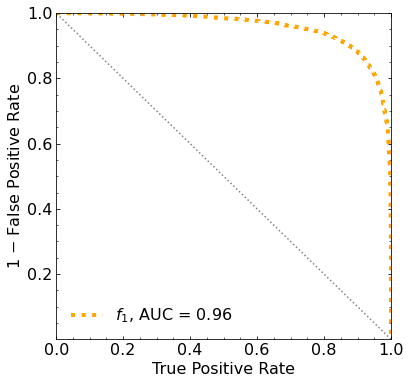

Classification score:


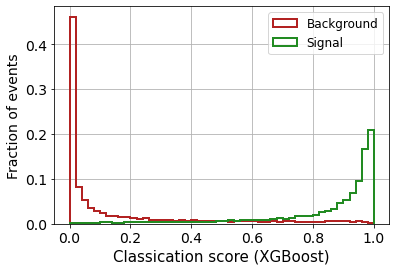


 ROC-AUC =  0.9570753870728206
At least 5 B events per bin, range = [[0, 1]]:
# bins:  22 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  22
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


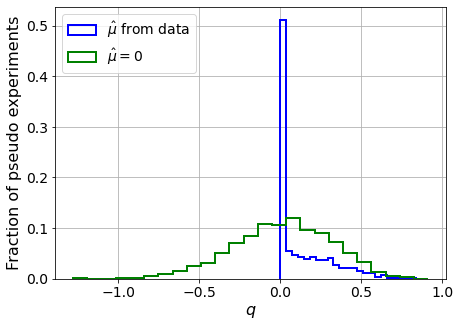

muhat mean:  0.26430314144264333
Z_bins:  0.1745518699333341
std Z_bins:  0.49577725775384585
Z_bins mu=0:  0.1745518699333341
std Z_bins mu=0:  0.8844394995121299

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


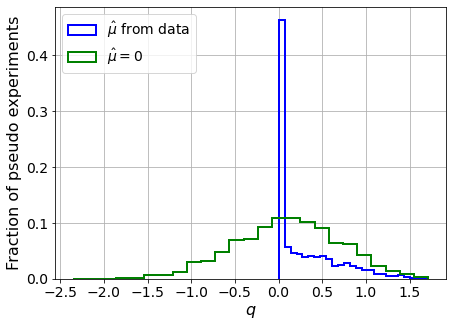

muhat mean:  -0.003564759154915967
Z_bins:  0.32701930856305883
std Z_bins:  0.5690799434186238
Z_bins mu=0:  0.32701930856305883
std Z_bins mu=0:  0.9176451385013185

--------

B_expected:  643
S_expected:  4

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


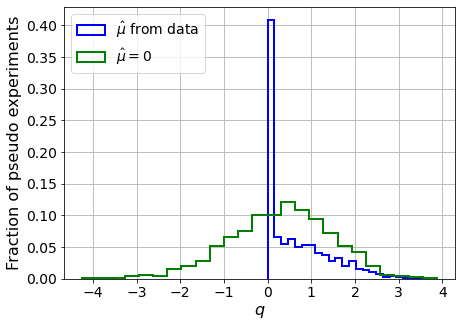

muhat mean:  0.07742950022243787
Z_bins:  0.60725072069319
std Z_bins:  0.6182528256808307
Z_bins mu=0:  0.60725072069319
std Z_bins mu=0:  0.9598223424912168

--------

B_expected:  643
S_expected:  8

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


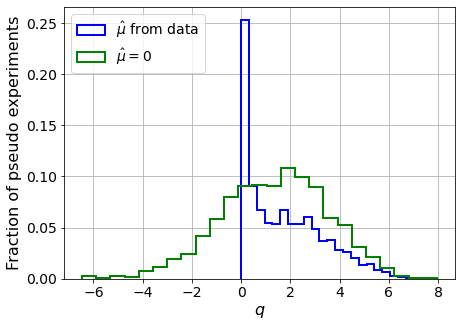

muhat mean:  0.011704092600041448
Z_bins:  1.21439601455185
std Z_bins:  0.6545682719947242
Z_bins mu=0:  1.21439601455185
std Z_bins mu=0:  0.8886956718036161

--------

B_expected:  643
S_expected:  17

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


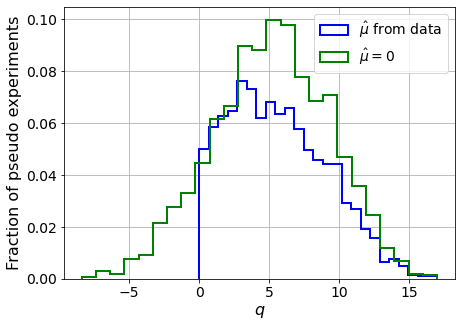

muhat mean:  0.017684223950395487
Z_bins:  2.3023919971143103
std Z_bins:  0.7524390297508912
Z_bins mu=0:  2.3019321161914363
std Z_bins mu=0:  0.9033914883317402

--------

B_expected:  643
S_expected:  37

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


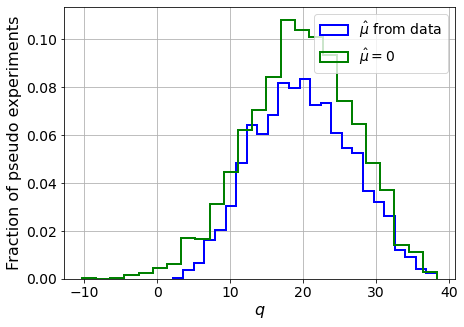

muhat mean:  -0.005383882493272662
Z_bins:  4.459453340537027
std Z_bins:  0.7447114658542073
Z_bins mu=0:  4.458047334623079
std Z_bins mu=0:  0.8207943470235574

--------

B_expected:  643
S_expected:  79

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


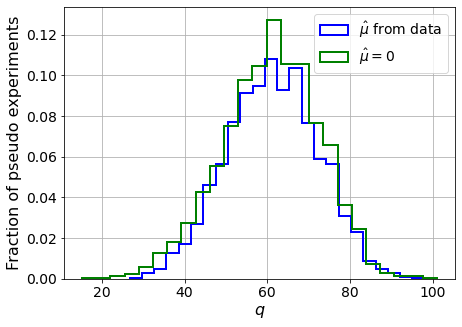

muhat mean:  0.0006864575749798552
Z_bins:  7.820569800115505
std Z_bins:  0.7054798090973496
Z_bins mu=0:  7.820527385252175
std Z_bins mu=0:  0.7524980199072963

--------

B_expected:  643
S_expected:  170

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


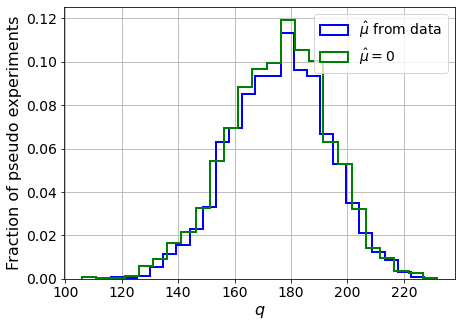

muhat mean:  0.00010191991795475755
Z_bins:  13.289570556359
std Z_bins:  0.6458638328143843
Z_bins mu=0:  13.289570556359
std Z_bins mu=0:  0.6711829280047822

--------

B_expected:  643
S_expected:  366

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0025


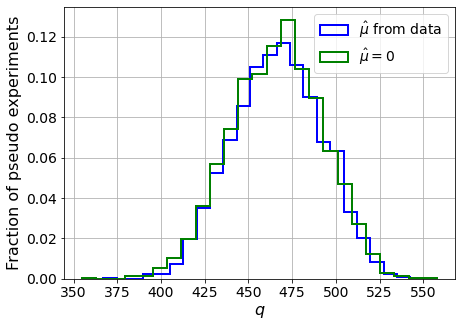

muhat mean:  -0.00015179562846132652
Z_bins:  21.60989558170949
std Z_bins:  0.5889459764712043
Z_bins mu=0:  21.60970962176495
std Z_bins mu=0:  0.6039839108793931

--------

B_expected:  643
S_expected:  788

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.001


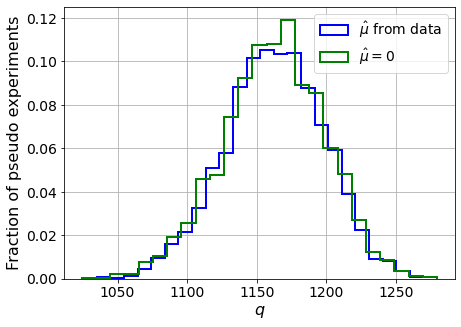

muhat mean:  1.7602061883731844e-05
Z_bins:  34.102092690753274
std Z_bins:  0.5251740602671464
Z_bins mu=0:  34.09937514652176
std Z_bins mu=0:  0.534846339275096

--------


 FINAL RESULT:

[[0.1745518699333341, 0.49577725775384585, 0.26430314144264333, 0.1745518699333341, 0.8844394995121299], [0.32701930856305883, 0.5690799434186238, -0.003564759154915967, 0.32701930856305883, 0.9176451385013185], [0.60725072069319, 0.6182528256808307, 0.07742950022243787, 0.60725072069319, 0.9598223424912168], [1.21439601455185, 0.6545682719947242, 0.011704092600041448, 1.21439601455185, 0.8886956718036161], [2.3023919971143103, 0.7524390297508912, 0.017684223950395487, 2.3019321161914363, 0.9033914883317402], [4.459453340537027, 0.7447114658542073, -0.005383882493272662, 4.458047334623079, 0.8207943470235574], [7.820569800115505, 0.7054798090973496, 0.0006864575749798552, 7.820527385252175, 0.7524980199072963], [13.289570556359, 0.6458638328143843, 0.00010191991795475755, 13.289570556359, 0.671182

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  257.79319436  237.4989826   209.41340834  180.31196467  147.92660821
  106.84887096   59.91374216    7.44745981  -48.87543186 -105.20736911]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf 182.51851841 172.69880407 156.928606

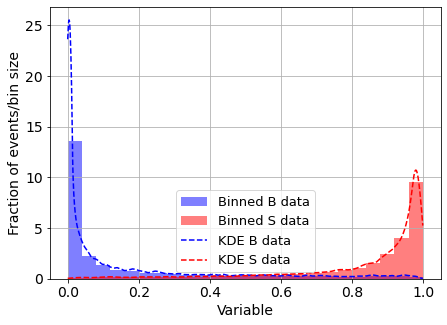

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.022117541055781564
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



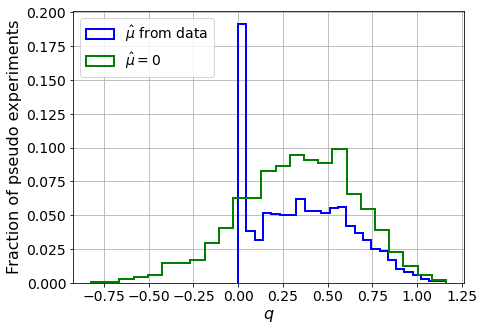

muhat mean:  -6.8996116234086164
Z_bins:  0.5942486038449915
std Z_bins:  0.2279860165901565
Z_bins mu=0:  0.5942486038449915
std Z_bins mu=0:  0.2704745861762234

--------

B_expected:  643
S_expected:  2



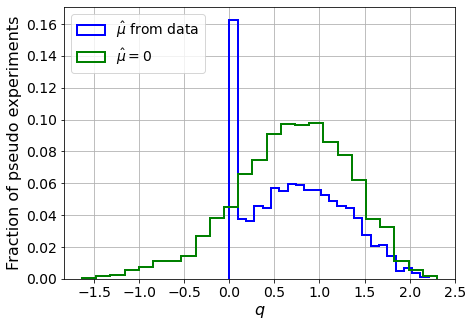

muhat mean:  -3.2611091594231643
Z_bins:  0.8625736498972154
std Z_bins:  0.31010779090767254
Z_bins mu=0:  0.8625736498972154
std Z_bins mu=0:  0.3688957070411296

--------

B_expected:  643
S_expected:  4



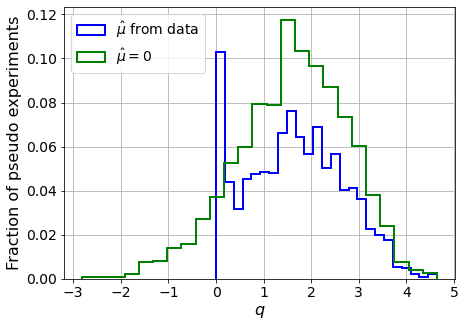

muhat mean:  -1.6731061666176403
Z_bins:  1.2851278169126696
std Z_bins:  0.3982005578484857
Z_bins mu=0:  1.2851278169126696
std Z_bins mu=0:  0.4483959980498206

--------

B_expected:  643
S_expected:  8



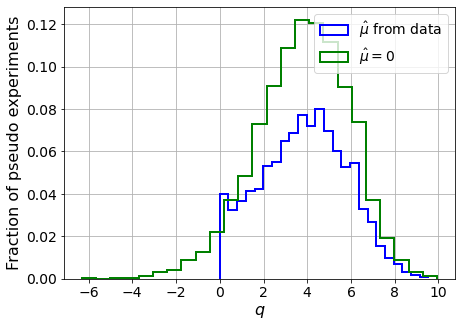

muhat mean:  -0.9105394972415203
Z_bins:  1.970871033238619
std Z_bins:  0.497160499304611
Z_bins mu=0:  1.970871033238619
std Z_bins mu=0:  0.5402828752609152

--------

B_expected:  643
S_expected:  17



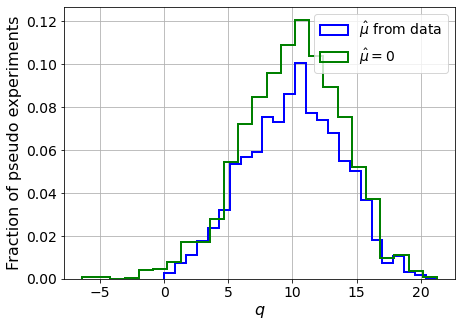

muhat mean:  -0.4052190280998892
Z_bins:  3.2014972066991407
std Z_bins:  0.5791618046827115
Z_bins mu=0:  3.2014972066991407
std Z_bins mu=0:  0.6066360911554817

--------

B_expected:  643
S_expected:  37



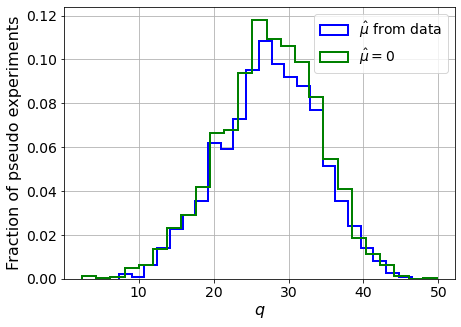

muhat mean:  -0.17090975103537762
Z_bins:  5.249405273294101
std Z_bins:  0.6229322745729335
Z_bins mu=0:  5.249405273294101
std Z_bins mu=0:  0.6394766081755571

--------

B_expected:  643
S_expected:  79



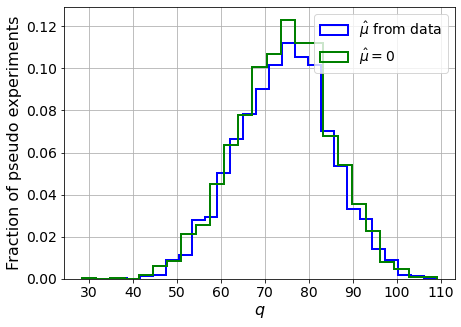

muhat mean:  -0.0836026070755563
Z_bins:  8.647295502862443
std Z_bins:  0.6165830910315576
Z_bins mu=0:  8.647295502862443
std Z_bins mu=0:  0.6251650803183099

--------

B_expected:  643
S_expected:  170



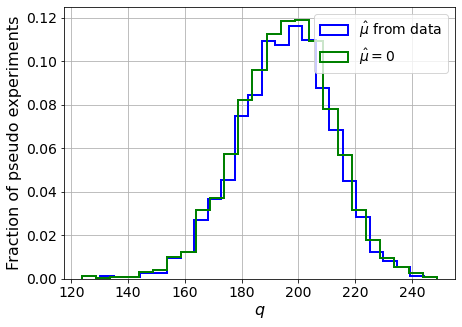

muhat mean:  -0.03900210557067486
Z_bins:  14.001196791057025
std Z_bins:  0.5943289049098737
Z_bins mu=0:  14.001196791057025
std Z_bins mu=0:  0.6012511605765615

--------

B_expected:  643
S_expected:  366



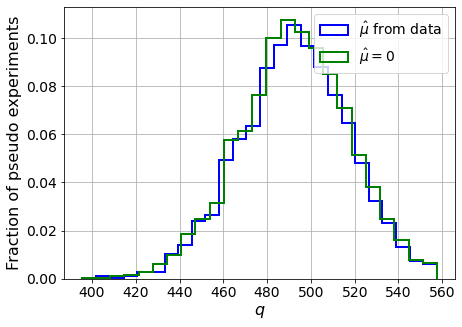

muhat mean:  -0.018197396626461186
Z_bins:  22.195666323262557
std Z_bins:  0.5567604862903147
Z_bins mu=0:  22.195666323262557
std Z_bins mu=0:  0.5601748898714671

--------

B_expected:  643
S_expected:  788



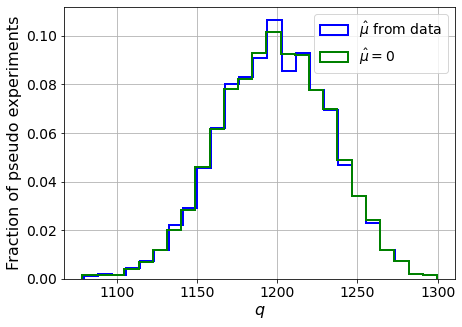

muhat mean:  -0.00825695452274206
Z_bins:  34.62440711628529
std Z_bins:  0.4966974769051376
Z_bins mu=0:  34.62440711628529
std Z_bins mu=0:  0.4986719021407969

--------


 FINAL RESULT:

[[0.5942486038449915, 0.2279860165901565, -6.8996116234086164, 0.5942486038449915, 0.2704745861762234], [0.8625736498972154, 0.31010779090767254, -3.2611091594231643, 0.8625736498972154, 0.3688957070411296], [1.2851278169126696, 0.3982005578484857, -1.6731061666176403, 1.2851278169126696, 0.4483959980498206], [1.970871033238619, 0.497160499304611, -0.9105394972415203, 1.970871033238619, 0.5402828752609152], [3.2014972066991407, 0.5791618046827115, -0.4052190280998892, 3.2014972066991407, 0.6066360911554817], [5.249405273294101, 0.6229322745729335, -0.17090975103537762, 5.249405273294101, 0.6394766081755571], [8.647295502862443, 0.6165830910315576, -0.0836026070755563, 8.647295502862443, 0.6251650803183099], [14.001196791057025, 0.5943289049098737, -0.03900210557067486, 14.001196791057025, 0.60125116

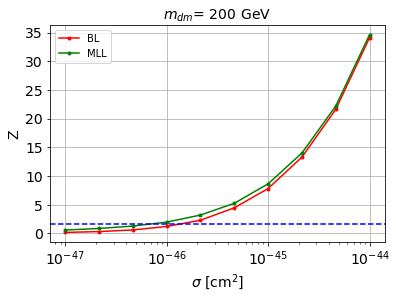


cross_BL_164:  1.444868321973895e-46
cross_BL_164_up:  8.026250253220933e-47
cross_BL_164_down:  2.2515785111718198e-46

cross_MLL_164:  7.310149643115859e-47
cross_MLL_164_up:  4.397034900026333e-47
cross_MLL_164_down:  1.1551389450124364e-46

#########################


#########################

mDM =  500 GeV


S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)
 NUM_DAT:  32015 

NUM_DAT_ER:  31605
NUM_DAT_AC:  113
NUM_DAT_CNNS:  1
NUM_DAT_RN:  30
NUM_DAT_WALL:  266

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 8)
B_ppeakS2.shape:  (32015, 8)

S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 8)
S_ppeakS2.shape:  (32015, 8)


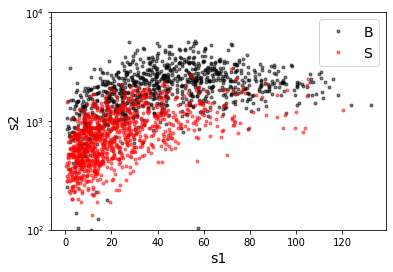

B_pdiffT.shape:  (32015,)
S_pdiffT.shape:  (32015,)


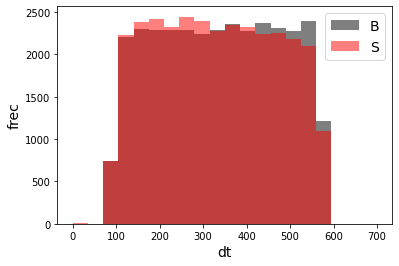

B_pbot.shape:  (32015,)
B_ptop.shape:  (32015,)
B_ppeakS1.shape : (32015, 7)
B_ppeakS2.shape:  (32015, 7)
S_pbot.shape:  (32015,)
S_ptop.shape:  (32015,)
S_ppeakS1.shape : (32015, 7)
S_ppeakS2.shape:  (32015, 7)
X_mon_B.shape:  (32015, 14)
X_mon_S.shape:  (32015, 14)
X_mon.shape:  (64030, 14)

X_mon_train :  (40818, 14)
y_mon_train :  (40818,)
X_mon_val :  (7204, 14)
y_mon_val :  (7204,)
X_mon_test :  (16008, 14)
y_mon_test :  (16008,)



/home/andres/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-logloss:0.68743	validation_1-logloss:0.68739
[1]	validation_0-logloss:0.68183	validation_1-logloss:0.68174
[2]	validation_0-logloss:0.67630	validation_1-logloss:0.67620
[3]	validation_0-logloss:0.67089	validation_1-logloss:0.67077
[4]	validation_0-logloss:0.66558	validation_1-logloss:0.66546
[5]	validation_0-logloss:0.66038	validation_1-logloss:0.66022
[6]	validation_0-logloss:0.65526	validation_1-logloss:0.65511
[7]	validation_0-logloss:0.65024	validation_1-logloss:0.65005
[8]	validation_0-logloss:0.64530	validation_1-logloss:0.64513
[9]	validation_0-logloss:0.64047	validation_1-logloss:0.64025
[10]	validation_0-logloss:0.63572	validation_1-logloss:0.63552
[11]	validation_0-logloss:0.63103	validation_1-logloss:0.63078
[12]	validation_0-logloss:0.62645	validation_1-logloss:0.62619
[13]	validation_0-logloss:0.62194	validation_1-logloss:0.62165
[14]	validation_0-logloss:0.61752	validation_1-logloss:0.61724
[15]	validation_0-logloss:0.61313	validation_1-logloss:0.61281
[1

[130]	validation_0-logloss:0.36908	validation_1-logloss:0.37033
[131]	validation_0-logloss:0.36810	validation_1-logloss:0.36938
[132]	validation_0-logloss:0.36715	validation_1-logloss:0.36847
[133]	validation_0-logloss:0.36619	validation_1-logloss:0.36755
[134]	validation_0-logloss:0.36525	validation_1-logloss:0.36664
[135]	validation_0-logloss:0.36435	validation_1-logloss:0.36577
[136]	validation_0-logloss:0.36347	validation_1-logloss:0.36492
[137]	validation_0-logloss:0.36257	validation_1-logloss:0.36406
[138]	validation_0-logloss:0.36164	validation_1-logloss:0.36318
[139]	validation_0-logloss:0.36076	validation_1-logloss:0.36233
[140]	validation_0-logloss:0.35992	validation_1-logloss:0.36153
[141]	validation_0-logloss:0.35904	validation_1-logloss:0.36069
[142]	validation_0-logloss:0.35821	validation_1-logloss:0.35989
[143]	validation_0-logloss:0.35734	validation_1-logloss:0.35907
[144]	validation_0-logloss:0.35648	validation_1-logloss:0.35825
[145]	validation_0-logloss:0.35563	valid

[259]	validation_0-logloss:0.29820	validation_1-logloss:0.30426
[260]	validation_0-logloss:0.29795	validation_1-logloss:0.30405
[261]	validation_0-logloss:0.29764	validation_1-logloss:0.30380
[262]	validation_0-logloss:0.29735	validation_1-logloss:0.30356
[263]	validation_0-logloss:0.29705	validation_1-logloss:0.30332
[264]	validation_0-logloss:0.29678	validation_1-logloss:0.30307
[265]	validation_0-logloss:0.29652	validation_1-logloss:0.30286
[266]	validation_0-logloss:0.29626	validation_1-logloss:0.30264
[267]	validation_0-logloss:0.29598	validation_1-logloss:0.30239
[268]	validation_0-logloss:0.29570	validation_1-logloss:0.30213
[269]	validation_0-logloss:0.29542	validation_1-logloss:0.30188
[270]	validation_0-logloss:0.29514	validation_1-logloss:0.30164
[271]	validation_0-logloss:0.29490	validation_1-logloss:0.30145
[272]	validation_0-logloss:0.29463	validation_1-logloss:0.30121
[273]	validation_0-logloss:0.29434	validation_1-logloss:0.30096
[274]	validation_0-logloss:0.29409	valid

[388]	validation_0-logloss:0.27257	validation_1-logloss:0.28315
[389]	validation_0-logloss:0.27244	validation_1-logloss:0.28305
[390]	validation_0-logloss:0.27232	validation_1-logloss:0.28297
[391]	validation_0-logloss:0.27219	validation_1-logloss:0.28288
[392]	validation_0-logloss:0.27203	validation_1-logloss:0.28277
[393]	validation_0-logloss:0.27189	validation_1-logloss:0.28267
[394]	validation_0-logloss:0.27174	validation_1-logloss:0.28254
[395]	validation_0-logloss:0.27159	validation_1-logloss:0.28244
[396]	validation_0-logloss:0.27146	validation_1-logloss:0.28234
[397]	validation_0-logloss:0.27135	validation_1-logloss:0.28225
[398]	validation_0-logloss:0.27122	validation_1-logloss:0.28215
[399]	validation_0-logloss:0.27111	validation_1-logloss:0.28208
[400]	validation_0-logloss:0.27097	validation_1-logloss:0.28197
[401]	validation_0-logloss:0.27084	validation_1-logloss:0.28189
[402]	validation_0-logloss:0.27069	validation_1-logloss:0.28177
[403]	validation_0-logloss:0.27057	valid

[517]	validation_0-logloss:0.25873	validation_1-logloss:0.27425
[518]	validation_0-logloss:0.25866	validation_1-logloss:0.27420
[519]	validation_0-logloss:0.25858	validation_1-logloss:0.27417
[520]	validation_0-logloss:0.25848	validation_1-logloss:0.27410
[521]	validation_0-logloss:0.25841	validation_1-logloss:0.27406
[522]	validation_0-logloss:0.25832	validation_1-logloss:0.27401
[523]	validation_0-logloss:0.25825	validation_1-logloss:0.27397
[524]	validation_0-logloss:0.25817	validation_1-logloss:0.27392
[525]	validation_0-logloss:0.25810	validation_1-logloss:0.27389
[526]	validation_0-logloss:0.25803	validation_1-logloss:0.27384
[527]	validation_0-logloss:0.25794	validation_1-logloss:0.27379
[528]	validation_0-logloss:0.25787	validation_1-logloss:0.27375
[529]	validation_0-logloss:0.25779	validation_1-logloss:0.27370
[530]	validation_0-logloss:0.25771	validation_1-logloss:0.27366
[531]	validation_0-logloss:0.25765	validation_1-logloss:0.27362
[532]	validation_0-logloss:0.25756	valid

[646]	validation_0-logloss:0.24961	validation_1-logloss:0.26940
[647]	validation_0-logloss:0.24956	validation_1-logloss:0.26937
[648]	validation_0-logloss:0.24950	validation_1-logloss:0.26933
[649]	validation_0-logloss:0.24942	validation_1-logloss:0.26931
[650]	validation_0-logloss:0.24936	validation_1-logloss:0.26929
[651]	validation_0-logloss:0.24929	validation_1-logloss:0.26928
[652]	validation_0-logloss:0.24923	validation_1-logloss:0.26925
[653]	validation_0-logloss:0.24917	validation_1-logloss:0.26922
[654]	validation_0-logloss:0.24912	validation_1-logloss:0.26919
[655]	validation_0-logloss:0.24905	validation_1-logloss:0.26916
[656]	validation_0-logloss:0.24899	validation_1-logloss:0.26913
[657]	validation_0-logloss:0.24892	validation_1-logloss:0.26910
[658]	validation_0-logloss:0.24885	validation_1-logloss:0.26907
[659]	validation_0-logloss:0.24876	validation_1-logloss:0.26903
[660]	validation_0-logloss:0.24871	validation_1-logloss:0.26900
[661]	validation_0-logloss:0.24863	valid

[775]	validation_0-logloss:0.24260	validation_1-logloss:0.26624
[776]	validation_0-logloss:0.24254	validation_1-logloss:0.26621
[777]	validation_0-logloss:0.24252	validation_1-logloss:0.26620
[778]	validation_0-logloss:0.24246	validation_1-logloss:0.26619
[779]	validation_0-logloss:0.24241	validation_1-logloss:0.26617
[780]	validation_0-logloss:0.24238	validation_1-logloss:0.26615
[781]	validation_0-logloss:0.24233	validation_1-logloss:0.26613
[782]	validation_0-logloss:0.24228	validation_1-logloss:0.26610
[783]	validation_0-logloss:0.24223	validation_1-logloss:0.26607
[784]	validation_0-logloss:0.24218	validation_1-logloss:0.26605
[785]	validation_0-logloss:0.24212	validation_1-logloss:0.26603
[786]	validation_0-logloss:0.24208	validation_1-logloss:0.26603
[787]	validation_0-logloss:0.24203	validation_1-logloss:0.26599
[788]	validation_0-logloss:0.24199	validation_1-logloss:0.26597
[789]	validation_0-logloss:0.24196	validation_1-logloss:0.26597
[790]	validation_0-logloss:0.24189	valid

[904]	validation_0-logloss:0.23720	validation_1-logloss:0.26427
[905]	validation_0-logloss:0.23715	validation_1-logloss:0.26425
[906]	validation_0-logloss:0.23712	validation_1-logloss:0.26423
[907]	validation_0-logloss:0.23709	validation_1-logloss:0.26421
[908]	validation_0-logloss:0.23705	validation_1-logloss:0.26420
[909]	validation_0-logloss:0.23702	validation_1-logloss:0.26419
[910]	validation_0-logloss:0.23700	validation_1-logloss:0.26419
[911]	validation_0-logloss:0.23697	validation_1-logloss:0.26418
[912]	validation_0-logloss:0.23692	validation_1-logloss:0.26416
[913]	validation_0-logloss:0.23688	validation_1-logloss:0.26415
[914]	validation_0-logloss:0.23686	validation_1-logloss:0.26415
[915]	validation_0-logloss:0.23681	validation_1-logloss:0.26413
[916]	validation_0-logloss:0.23678	validation_1-logloss:0.26411
[917]	validation_0-logloss:0.23673	validation_1-logloss:0.26409
[918]	validation_0-logloss:0.23670	validation_1-logloss:0.26408
[919]	validation_0-logloss:0.23668	valid

[1032]	validation_0-logloss:0.23231	validation_1-logloss:0.26272
[1033]	validation_0-logloss:0.23226	validation_1-logloss:0.26271
[1034]	validation_0-logloss:0.23224	validation_1-logloss:0.26271
[1035]	validation_0-logloss:0.23221	validation_1-logloss:0.26270
[1036]	validation_0-logloss:0.23217	validation_1-logloss:0.26269
[1037]	validation_0-logloss:0.23214	validation_1-logloss:0.26268
[1038]	validation_0-logloss:0.23209	validation_1-logloss:0.26266
[1039]	validation_0-logloss:0.23205	validation_1-logloss:0.26266
[1040]	validation_0-logloss:0.23201	validation_1-logloss:0.26266
[1041]	validation_0-logloss:0.23196	validation_1-logloss:0.26263
[1042]	validation_0-logloss:0.23193	validation_1-logloss:0.26262
[1043]	validation_0-logloss:0.23189	validation_1-logloss:0.26261
[1044]	validation_0-logloss:0.23186	validation_1-logloss:0.26261
[1045]	validation_0-logloss:0.23183	validation_1-logloss:0.26261
[1046]	validation_0-logloss:0.23180	validation_1-logloss:0.26260
[1047]	validation_0-loglo

[1159]	validation_0-logloss:0.22808	validation_1-logloss:0.26185
[1160]	validation_0-logloss:0.22805	validation_1-logloss:0.26184
[1161]	validation_0-logloss:0.22801	validation_1-logloss:0.26182
[1162]	validation_0-logloss:0.22798	validation_1-logloss:0.26181
[1163]	validation_0-logloss:0.22794	validation_1-logloss:0.26181
[1164]	validation_0-logloss:0.22792	validation_1-logloss:0.26181
[1165]	validation_0-logloss:0.22789	validation_1-logloss:0.26181
[1166]	validation_0-logloss:0.22787	validation_1-logloss:0.26180
[1167]	validation_0-logloss:0.22784	validation_1-logloss:0.26179
[1168]	validation_0-logloss:0.22780	validation_1-logloss:0.26178
[1169]	validation_0-logloss:0.22778	validation_1-logloss:0.26177
[1170]	validation_0-logloss:0.22776	validation_1-logloss:0.26177
[1171]	validation_0-logloss:0.22773	validation_1-logloss:0.26175
[1172]	validation_0-logloss:0.22769	validation_1-logloss:0.26175
[1173]	validation_0-logloss:0.22766	validation_1-logloss:0.26173
[1174]	validation_0-loglo

[1286]	validation_0-logloss:0.22438	validation_1-logloss:0.26127
[1287]	validation_0-logloss:0.22435	validation_1-logloss:0.26127
[1288]	validation_0-logloss:0.22431	validation_1-logloss:0.26127
[1289]	validation_0-logloss:0.22427	validation_1-logloss:0.26126
[1290]	validation_0-logloss:0.22426	validation_1-logloss:0.26127
[1291]	validation_0-logloss:0.22423	validation_1-logloss:0.26128
[1292]	validation_0-logloss:0.22419	validation_1-logloss:0.26127
[1293]	validation_0-logloss:0.22417	validation_1-logloss:0.26126
[1294]	validation_0-logloss:0.22414	validation_1-logloss:0.26127
[1295]	validation_0-logloss:0.22412	validation_1-logloss:0.26126
[1296]	validation_0-logloss:0.22409	validation_1-logloss:0.26126
[1297]	validation_0-logloss:0.22405	validation_1-logloss:0.26125
[1298]	validation_0-logloss:0.22403	validation_1-logloss:0.26125
[1299]	validation_0-logloss:0.22401	validation_1-logloss:0.26124
[1300]	validation_0-logloss:0.22399	validation_1-logloss:0.26124
[1301]	validation_0-loglo

[1413]	validation_0-logloss:0.22067	validation_1-logloss:0.26090
[1414]	validation_0-logloss:0.22065	validation_1-logloss:0.26090
[1415]	validation_0-logloss:0.22062	validation_1-logloss:0.26091
[1416]	validation_0-logloss:0.22060	validation_1-logloss:0.26090
[1417]	validation_0-logloss:0.22056	validation_1-logloss:0.26090
[1418]	validation_0-logloss:0.22054	validation_1-logloss:0.26091
[1419]	validation_0-logloss:0.22052	validation_1-logloss:0.26091
[1420]	validation_0-logloss:0.22048	validation_1-logloss:0.26090
[1421]	validation_0-logloss:0.22045	validation_1-logloss:0.26089
[1422]	validation_0-logloss:0.22041	validation_1-logloss:0.26088
[1423]	validation_0-logloss:0.22038	validation_1-logloss:0.26087
[1424]	validation_0-logloss:0.22034	validation_1-logloss:0.26088
[1425]	validation_0-logloss:0.22032	validation_1-logloss:0.26088
[1426]	validation_0-logloss:0.22029	validation_1-logloss:0.26086
[1427]	validation_0-logloss:0.22026	validation_1-logloss:0.26085
[1428]	validation_0-loglo

[1540]	validation_0-logloss:0.21719	validation_1-logloss:0.26051
[1541]	validation_0-logloss:0.21717	validation_1-logloss:0.26051
[1542]	validation_0-logloss:0.21716	validation_1-logloss:0.26051
[1543]	validation_0-logloss:0.21713	validation_1-logloss:0.26051
[1544]	validation_0-logloss:0.21712	validation_1-logloss:0.26050
[1545]	validation_0-logloss:0.21710	validation_1-logloss:0.26050
[1546]	validation_0-logloss:0.21709	validation_1-logloss:0.26049
[1547]	validation_0-logloss:0.21706	validation_1-logloss:0.26049
[1548]	validation_0-logloss:0.21704	validation_1-logloss:0.26048
[1549]	validation_0-logloss:0.21701	validation_1-logloss:0.26048
[1550]	validation_0-logloss:0.21697	validation_1-logloss:0.26047
[1551]	validation_0-logloss:0.21695	validation_1-logloss:0.26047
[1552]	validation_0-logloss:0.21692	validation_1-logloss:0.26048
[1553]	validation_0-logloss:0.21691	validation_1-logloss:0.26049
[1554]	validation_0-logloss:0.21688	validation_1-logloss:0.26050
[1555]	validation_0-loglo

[1667]	validation_0-logloss:0.21396	validation_1-logloss:0.26027
[1668]	validation_0-logloss:0.21395	validation_1-logloss:0.26026
[1669]	validation_0-logloss:0.21391	validation_1-logloss:0.26024
[1670]	validation_0-logloss:0.21389	validation_1-logloss:0.26026
[1671]	validation_0-logloss:0.21386	validation_1-logloss:0.26025
[1672]	validation_0-logloss:0.21385	validation_1-logloss:0.26025
[1673]	validation_0-logloss:0.21383	validation_1-logloss:0.26025
[1674]	validation_0-logloss:0.21382	validation_1-logloss:0.26025
[1675]	validation_0-logloss:0.21381	validation_1-logloss:0.26025
[1676]	validation_0-logloss:0.21377	validation_1-logloss:0.26025
[1677]	validation_0-logloss:0.21372	validation_1-logloss:0.26024
[1678]	validation_0-logloss:0.21369	validation_1-logloss:0.26025
[1679]	validation_0-logloss:0.21365	validation_1-logloss:0.26025
[1680]	validation_0-logloss:0.21362	validation_1-logloss:0.26026
[1681]	validation_0-logloss:0.21359	validation_1-logloss:0.26024
[1682]	validation_0-loglo

[1794]	validation_0-logloss:0.21087	validation_1-logloss:0.25995
[1795]	validation_0-logloss:0.21084	validation_1-logloss:0.25995
[1796]	validation_0-logloss:0.21081	validation_1-logloss:0.25994
[1797]	validation_0-logloss:0.21079	validation_1-logloss:0.25994
[1798]	validation_0-logloss:0.21077	validation_1-logloss:0.25995
[1799]	validation_0-logloss:0.21075	validation_1-logloss:0.25994
[1800]	validation_0-logloss:0.21071	validation_1-logloss:0.25994
[1801]	validation_0-logloss:0.21069	validation_1-logloss:0.25994
[1802]	validation_0-logloss:0.21066	validation_1-logloss:0.25993
[1803]	validation_0-logloss:0.21064	validation_1-logloss:0.25993
[1804]	validation_0-logloss:0.21062	validation_1-logloss:0.25993
[1805]	validation_0-logloss:0.21059	validation_1-logloss:0.25993
[1806]	validation_0-logloss:0.21057	validation_1-logloss:0.25993
[1807]	validation_0-logloss:0.21054	validation_1-logloss:0.25993
[1808]	validation_0-logloss:0.21051	validation_1-logloss:0.25993
[1809]	validation_0-loglo

[1921]	validation_0-logloss:0.20776	validation_1-logloss:0.25967
[1922]	validation_0-logloss:0.20773	validation_1-logloss:0.25968
[1923]	validation_0-logloss:0.20772	validation_1-logloss:0.25968
[1924]	validation_0-logloss:0.20770	validation_1-logloss:0.25967
[1925]	validation_0-logloss:0.20766	validation_1-logloss:0.25967
[1926]	validation_0-logloss:0.20763	validation_1-logloss:0.25966
[1927]	validation_0-logloss:0.20762	validation_1-logloss:0.25966
[1928]	validation_0-logloss:0.20760	validation_1-logloss:0.25966
[1929]	validation_0-logloss:0.20757	validation_1-logloss:0.25965
[1930]	validation_0-logloss:0.20754	validation_1-logloss:0.25965
[1931]	validation_0-logloss:0.20752	validation_1-logloss:0.25964
[1932]	validation_0-logloss:0.20750	validation_1-logloss:0.25965
[1933]	validation_0-logloss:0.20747	validation_1-logloss:0.25965
[1934]	validation_0-logloss:0.20746	validation_1-logloss:0.25966
[1935]	validation_0-logloss:0.20744	validation_1-logloss:0.25964
[1936]	validation_0-loglo

[2048]	validation_0-logloss:0.20490	validation_1-logloss:0.25952
[2049]	validation_0-logloss:0.20486	validation_1-logloss:0.25953
[2050]	validation_0-logloss:0.20484	validation_1-logloss:0.25953
[2051]	validation_0-logloss:0.20483	validation_1-logloss:0.25953
[2052]	validation_0-logloss:0.20480	validation_1-logloss:0.25954
[2053]	validation_0-logloss:0.20479	validation_1-logloss:0.25954
[2054]	validation_0-logloss:0.20476	validation_1-logloss:0.25954
[2055]	validation_0-logloss:0.20473	validation_1-logloss:0.25954
[2056]	validation_0-logloss:0.20471	validation_1-logloss:0.25954
[2057]	validation_0-logloss:0.20469	validation_1-logloss:0.25954
[2058]	validation_0-logloss:0.20468	validation_1-logloss:0.25955
[2059]	validation_0-logloss:0.20466	validation_1-logloss:0.25955
[2060]	validation_0-logloss:0.20465	validation_1-logloss:0.25955
[2061]	validation_0-logloss:0.20464	validation_1-logloss:0.25954
[2062]	validation_0-logloss:0.20462	validation_1-logloss:0.25955
[2063]	validation_0-loglo

[2175]	validation_0-logloss:0.20214	validation_1-logloss:0.25950
[2176]	validation_0-logloss:0.20213	validation_1-logloss:0.25950
[2177]	validation_0-logloss:0.20211	validation_1-logloss:0.25950
[2178]	validation_0-logloss:0.20209	validation_1-logloss:0.25950
[2179]	validation_0-logloss:0.20207	validation_1-logloss:0.25950
[2180]	validation_0-logloss:0.20204	validation_1-logloss:0.25950
[2181]	validation_0-logloss:0.20202	validation_1-logloss:0.25950
[2182]	validation_0-logloss:0.20200	validation_1-logloss:0.25950
[2183]	validation_0-logloss:0.20197	validation_1-logloss:0.25950
[2184]	validation_0-logloss:0.20195	validation_1-logloss:0.25950
[2185]	validation_0-logloss:0.20193	validation_1-logloss:0.25950
[2186]	validation_0-logloss:0.20190	validation_1-logloss:0.25950
[2187]	validation_0-logloss:0.20190	validation_1-logloss:0.25951
[2188]	validation_0-logloss:0.20189	validation_1-logloss:0.25951
[2189]	validation_0-logloss:0.20186	validation_1-logloss:0.25952
[2190]	validation_0-loglo

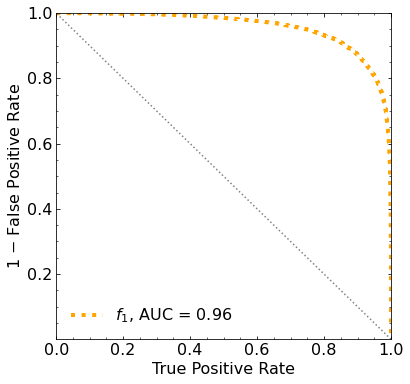

Classification score:


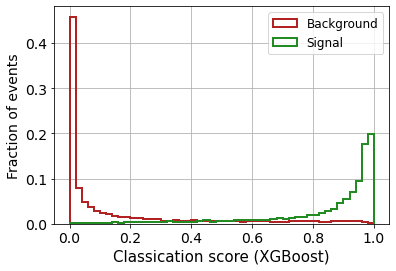


 ROC-AUC =  0.9562283961483824
At least 5 B events per bin, range = [[0, 1]]:
# bins:  23 OK

 FOR BIN LIKELIHOOD WE ARE SETTING:
min number of Background events allowed per bin:  5
max number of bins allowed:  23
range of our data:  [[0, 1]]
number of bins we are going to use:  10
B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


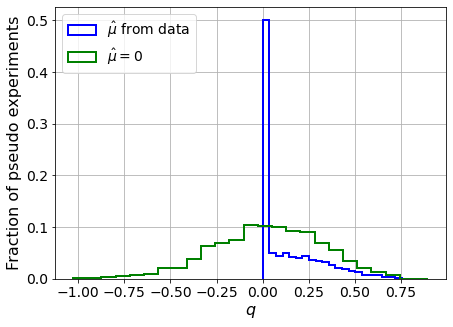

muhat mean:  -0.02291990613488612
Z_bins:  0.18870237111694924
std Z_bins:  0.4543165538644535
Z_bins mu=0:  0.18870237111694924
std Z_bins mu=0:  0.7799732748559449

--------

B_expected:  643
S_expected:  1

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


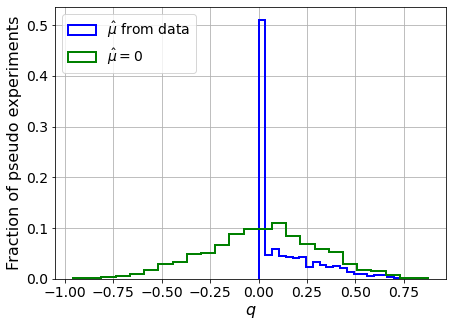

muhat mean:  0.17365638623402552
Z_bins:  0.16738764007356724
std Z_bins:  0.5118125216388236
Z_bins mu=0:  0.16738764007356724
std Z_bins mu=0:  0.8805547753445397

--------

B_expected:  643
S_expected:  2

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


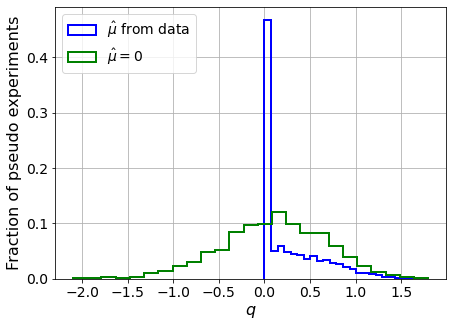

muhat mean:  0.013275358217487534
Z_bins:  0.34841120136692344
std Z_bins:  0.5055785198446123
Z_bins mu=0:  0.34841120136692344
std Z_bins mu=0:  0.8317060279657243

--------

B_expected:  643
S_expected:  3

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0


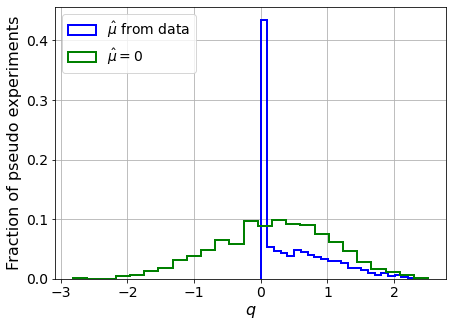

muhat mean:  0.05293667869365566
Z_bins:  0.4723286704561532
std Z_bins:  0.5727126943139297
Z_bins mu=0:  0.4723286704561532
std Z_bins mu=0:  0.9125875032438838

--------

B_expected:  643
S_expected:  7

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


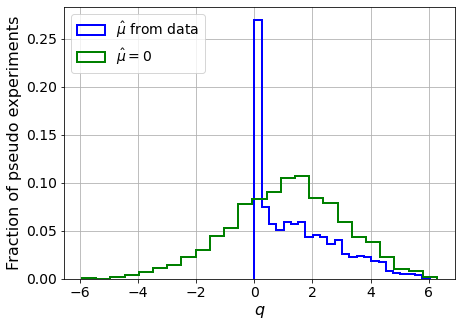

muhat mean:  -0.023053496449192485
Z_bins:  1.0994312415702672
std Z_bins:  0.6414252525551813
Z_bins mu=0:  1.0994312415702672
std Z_bins mu=0:  0.8819748016464419

--------

B_expected:  643
S_expected:  15

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.002


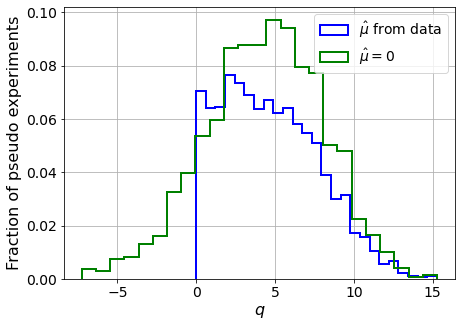

muhat mean:  -0.006743825507003571
Z_bins:  2.1135340161258025
std Z_bins:  0.7194908444934259
Z_bins mu=0:  2.1134909995961992
std Z_bins mu=0:  0.8723159463413833

--------

B_expected:  643
S_expected:  33

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


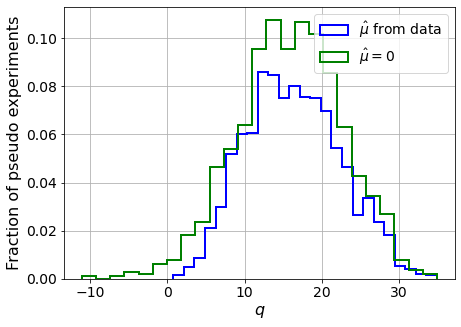

muhat mean:  0.002752931937114147
Z_bins:  4.009636217340456
std Z_bins:  0.7585006825969164
Z_bins mu=0:  4.009636217340456
std Z_bins mu=0:  0.847559819831808

--------

B_expected:  643
S_expected:  72

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.003


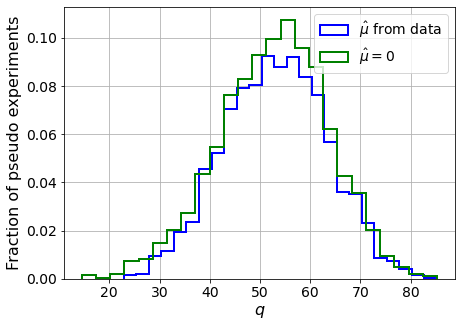

muhat mean:  0.0004992643597055002
Z_bins:  7.293697394996611
std Z_bins:  0.7005637145169624
Z_bins mu=0:  7.292006425030781
std Z_bins mu=0:  0.7478793655939002

--------

B_expected:  643
S_expected:  154

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0015


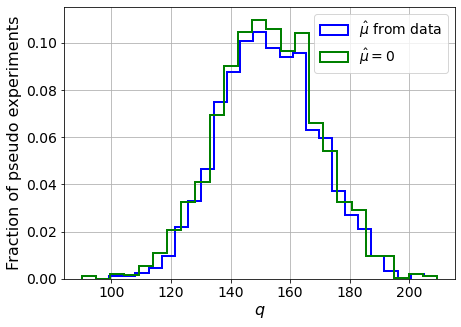

muhat mean:  -0.0015899907210993151
Z_bins:  12.355478195544068
std Z_bins:  0.6548533561500138
Z_bins mu=0:  12.354839062291783
std Z_bins mu=0:  0.6787133932385243

--------

B_expected:  643
S_expected:  333

Ratio of pseudo experiments that do not satisfied the MIN_EVS condition:  0.0005


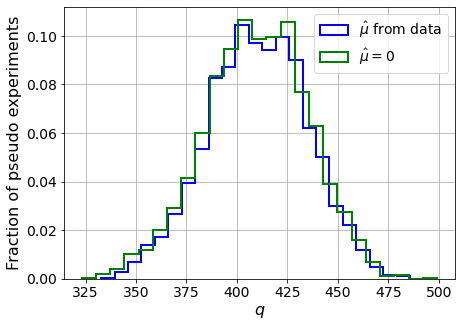

muhat mean:  0.0006871884612996938
Z_bins:  20.24802532147405
std Z_bins:  0.6112049853985742
Z_bins mu=0:  20.247936199613754
std Z_bins mu=0:  0.6291298106419526

--------


 FINAL RESULT:

[[0.18870237111694924, 0.4543165538644535, -0.02291990613488612, 0.18870237111694924, 0.7799732748559449], [0.16738764007356724, 0.5118125216388236, 0.17365638623402552, 0.16738764007356724, 0.8805547753445397], [0.34841120136692344, 0.5055785198446123, 0.013275358217487534, 0.34841120136692344, 0.8317060279657243], [0.4723286704561532, 0.5727126943139297, 0.05293667869365566, 0.4723286704561532, 0.9125875032438838], [1.0994312415702672, 0.6414252525551813, -0.023053496449192485, 1.0994312415702672, 0.8819748016464419], [2.1135340161258025, 0.7194908444934259, -0.006743825507003571, 2.1134909995961992, 0.8723159463413833], [4.009636217340456, 0.7585006825969164, 0.002752931937114147, 4.009636217340456, 0.847559819831808], [7.293697394996611, 0.7005637145169624, 0.0004992643597055002, 7.29200642503

/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [         -inf          -inf          -inf          -inf          -inf
          -inf          -inf          -inf          -inf          -inf
  229.37289353  210.36726226  188.82448826  163.61804873  131.22976267
   93.48908625   51.45528714    2.22078664  -50.46389786 -105.96906502]
  warnings.warn(
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:990: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [        -inf         -inf         -inf         -inf         -inf
         -inf         -inf         -inf         -inf         -inf
         -inf         -inf 175.90691734 160.63705 

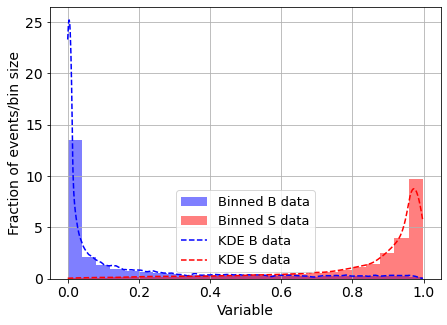

KDE Kernel:  epanechnikov
Background bandwidth:  0.013538761800225447
Signal bandwidth:  0.03613222756796251
This may take a while...
1 done
2 done
B_expected:  643
S_expected:  1



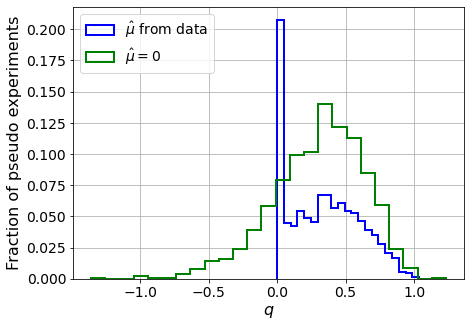

muhat mean:  -7.068747054800075
Z_bins:  0.5835747601254924
std Z_bins:  0.22340927592526458
Z_bins mu=0:  0.5835747601254924
std Z_bins mu=0:  0.2863369754191234

--------

B_expected:  643
S_expected:  1



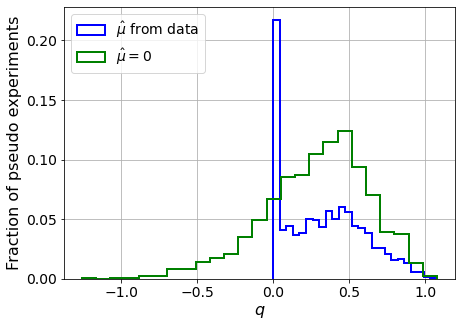

muhat mean:  -6.660640045510959
Z_bins:  0.5695486902569784
std Z_bins:  0.23086142041521493
Z_bins mu=0:  0.5695486902569784
std Z_bins mu=0:  0.30045530357311934

--------

B_expected:  643
S_expected:  2



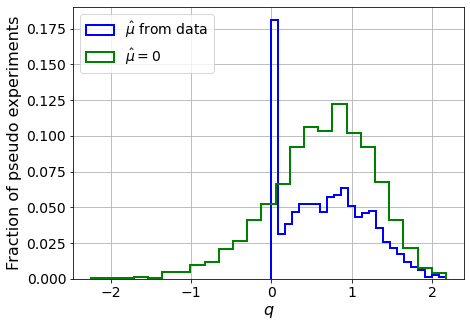

muhat mean:  -3.271205086458767
Z_bins:  0.8336107313748136
std Z_bins:  0.3050414378499537
Z_bins mu=0:  0.8336107313748136
std Z_bins mu=0:  0.3782789378478267

--------

B_expected:  643
S_expected:  3



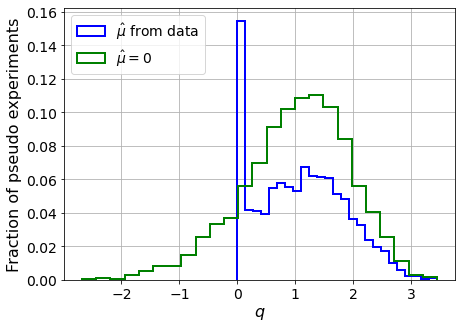

muhat mean:  -2.161952793690629
Z_bins:  1.0513875290035632
std Z_bins:  0.3618611844984381
Z_bins mu=0:  1.0513875290035632
std Z_bins mu=0:  0.43680521982485326

--------

B_expected:  643
S_expected:  7



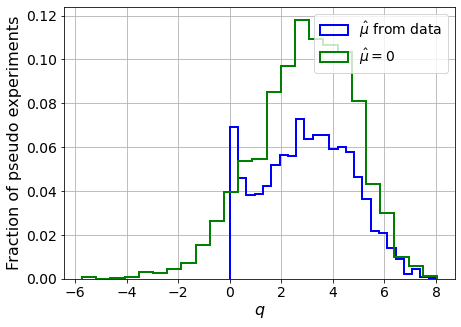

muhat mean:  -0.9763558833092539
Z_bins:  1.7425969019311947
std Z_bins:  0.49091766141759385
Z_bins mu=0:  1.7425969019311947
std Z_bins mu=0:  0.5523759527497012

--------

B_expected:  643
S_expected:  15



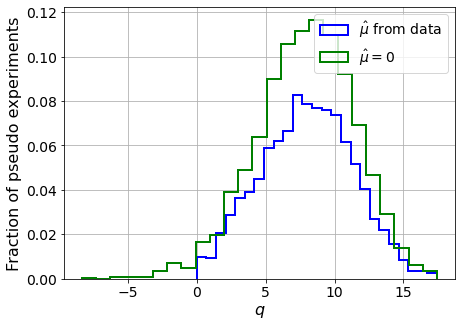

muhat mean:  -0.46038098194267874
Z_bins:  2.829954461154991
std Z_bins:  0.5873454315908676
Z_bins mu=0:  2.829954461154991
std Z_bins mu=0:  0.6322158750342983

--------

B_expected:  643
S_expected:  33



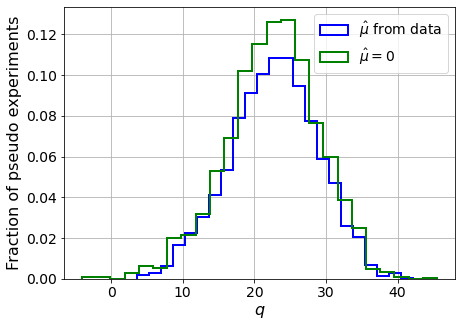

muhat mean:  -0.20727576950052923
Z_bins:  4.7792719308390215
std Z_bins:  0.6469830189070996
Z_bins mu=0:  4.7792719308390215
std Z_bins mu=0:  0.675416522309917

--------

B_expected:  643
S_expected:  72



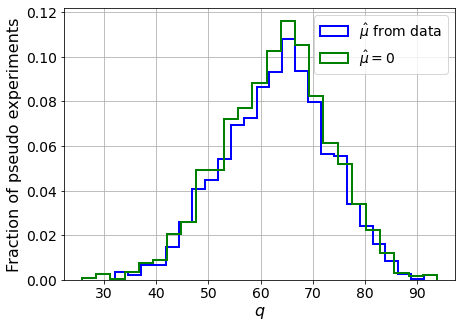

muhat mean:  -0.09083793757111233
Z_bins:  7.978479361427302
std Z_bins:  0.6322890498046839
Z_bins mu=0:  7.977196255480515
std Z_bins mu=0:  0.6449268378637306

--------

B_expected:  643
S_expected:  154



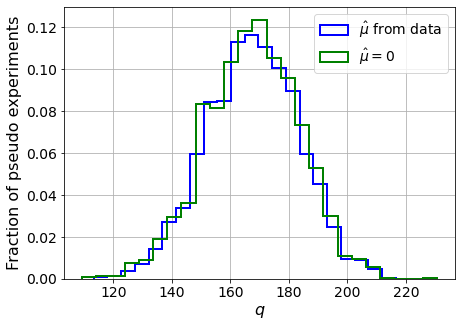

muhat mean:  -0.043338179540674746
Z_bins:  12.95614915453373
std Z_bins:  0.6111706525437236
Z_bins mu=0:  12.95543428438724
std Z_bins mu=0:  0.618917908481729

--------

B_expected:  643
S_expected:  333



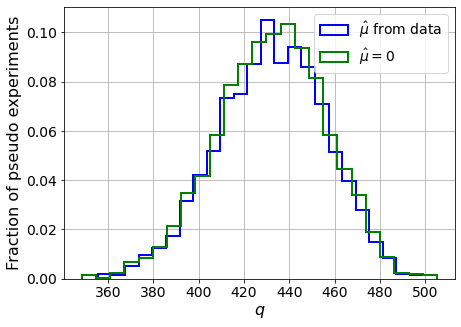

muhat mean:  -0.02079927905733757
Z_bins:  20.799467109456145
std Z_bins:  0.574189854849159
Z_bins mu=0:  20.799387368482343
std Z_bins mu=0:  0.5785865249454525

--------


 FINAL RESULT:

[[0.5835747601254924, 0.22340927592526458, -7.068747054800075, 0.5835747601254924, 0.2863369754191234], [0.5695486902569784, 0.23086142041521493, -6.660640045510959, 0.5695486902569784, 0.30045530357311934], [0.8336107313748136, 0.3050414378499537, -3.271205086458767, 0.8336107313748136, 0.3782789378478267], [1.0513875290035632, 0.3618611844984381, -2.161952793690629, 1.0513875290035632, 0.43680521982485326], [1.7425969019311947, 0.49091766141759385, -0.9763558833092539, 1.7425969019311947, 0.5523759527497012], [2.829954461154991, 0.5873454315908676, -0.46038098194267874, 2.829954461154991, 0.6322158750342983], [4.7792719308390215, 0.6469830189070996, -0.20727576950052923, 4.7792719308390215, 0.675416522309917], [7.978479361427302, 0.6322890498046839, -0.09083793757111233, 7.977196255480515, 0.6449

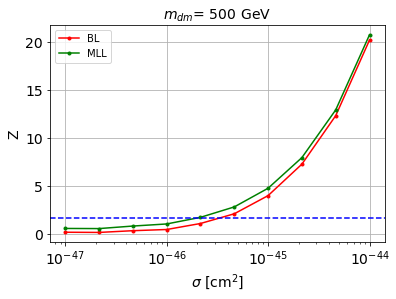


cross_BL_164:  3.4338821455663324e-46
cross_BL_164_up:  1.9698876427158772e-46
cross_BL_164_down:  5.313888305573119e-46

cross_MLL_164:  1.9650271894832156e-46
cross_MLL_164_up:  1.3091993225724096e-46
cross_MLL_164_down:  3.086617538393632e-46

#########################



In [13]:
store_cross_BL_164 = []
store_cross_BL_164_up = []
store_cross_BL_164_down = []

store_cross_MLL_164 = []
store_cross_MLL_164_up = []
store_cross_MLL_164_down = []


for m_it in range(len(mDM_mDM)):
    
    # set the parameters
    mDM = mDM_mDM[m_it]
    S_cross1045 = S_cross1045_mDM[m_it]
    S_expected = S_expected_mDM[m_it]
    
    print('\n#########################\n')
    print('mDM = ', mDM, 'GeV\n')
    
    
    ##########
    # SIGNAL #
    ##########

    S_pbot = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/pbot.txt')
    S_ptop = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ptop.txt')
    S_ppeakS1 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS1.txt')
    S_ppeakS2 = np.loadtxt(filefolder + 'mDM' + str(mDM) + 'GeV/ppeakS2.txt')

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    
    # set events per classs
    NUM_DAT = min(len(B_pbot_ER), len(S_pbot))
    print(' NUM_DAT: ', NUM_DAT, '\n')

    NUM_DAT_AC = round(NUM_DAT*f_AC)
    NUM_DAT_CNNS = max(1, round(NUM_DAT*f_CNNS))
    NUM_DAT_RN = round(NUM_DAT*f_RN)
    NUM_DAT_WALL = round(NUM_DAT*f_WALL)

    NUM_DAT_ER = NUM_DAT - ( NUM_DAT_AC + NUM_DAT_CNNS + NUM_DAT_RN + NUM_DAT_WALL )

    print('NUM_DAT_ER: ', NUM_DAT_ER)
    print('NUM_DAT_AC: ', NUM_DAT_AC)
    print('NUM_DAT_CNNS: ', NUM_DAT_CNNS)
    print('NUM_DAT_RN: ', NUM_DAT_RN)
    print('NUM_DAT_WALL: ', NUM_DAT_WALL)



    # CONCATENATE THE BACKGROUNDS
    B_pbot = np.concatenate([B_pbot_ER[:NUM_DAT_ER], B_pbot_AC[:NUM_DAT_AC], B_pbot_CNNS[:NUM_DAT_CNNS], B_pbot_RN[:NUM_DAT_RN], B_pbot_WALL[:NUM_DAT_WALL]])
    B_ptop = np.concatenate([B_ptop_ER[:NUM_DAT_ER], B_ptop_AC[:NUM_DAT_AC], B_ptop_CNNS[:NUM_DAT_CNNS], B_ptop_RN[:NUM_DAT_RN], B_ptop_WALL[:NUM_DAT_WALL]])
    B_ppeakS1 = np.concatenate([B_ppeakS1_ER[:NUM_DAT_ER], B_ppeakS1_AC[:NUM_DAT_AC], B_ppeakS1_CNNS[:NUM_DAT_CNNS], B_ppeakS1_RN[:NUM_DAT_RN], B_ppeakS1_WALL[:NUM_DAT_WALL]])
    B_ppeakS2 = np.concatenate([B_ppeakS2_ER[:NUM_DAT_ER], B_ppeakS2_AC[:NUM_DAT_AC], B_ppeakS2_CNNS[:NUM_DAT_CNNS], B_ppeakS2_RN[:NUM_DAT_RN], B_ppeakS2_WALL[:NUM_DAT_WALL]])

    print('\nB_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot[:NUM_DAT]
    S_ptop = S_ptop[:NUM_DAT]
    S_ppeakS1 = S_ppeakS1[:NUM_DAT]
    S_ppeakS2 = S_ppeakS2[:NUM_DAT]

    print('\nS_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)
    
    rnd = 100

    B_pbot_plot, B_ptop_plot = shuffle(B_pbot, B_ptop, random_state=rnd)
    S_pbot_plot, S_ptop_plot = shuffle(S_pbot, S_ptop, random_state=rnd)

    plt.plot(B_pbot_plot[:1000], B_ptop_plot[:1000], '.', color='black', alpha=0.5, label='B')
    plt.plot(S_pbot_plot[:1000], S_ptop_plot[:1000], '.', color='red', alpha=0.5, label='S')
    plt.yscale('log')
    # plt.xlim([0,100])
    plt.ylim([100,10000])
    plt.xlabel('s1',fontsize=14)
    plt.ylabel('s2',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()    
    
    
    # construct time diff
    B_pdiffT = B_ppeakS2[:,0] - B_ppeakS1[:,0]
    S_pdiffT = S_ppeakS2[:,0] - S_ppeakS1[:,0]

    print('B_pdiffT.shape: ', B_pdiffT.shape)
    print('S_pdiffT.shape: ', S_pdiffT.shape)


    plt.hist(B_pdiffT, range=[0,700], bins=20, color='black', alpha=0.5, label='B')
    plt.hist(S_pdiffT, range=[0,700], bins=20, color='red', alpha=0.5, label='S')
    # plt.yscale('log')
    # plt.xlim([0,100])
    # plt.ylim([100,10000])
    plt.xlabel('dt',fontsize=14)
    plt.ylabel('frec',fontsize=14)
    plt.legend(fontsize=14)
    plt.show()
    
    
    # remove variables
    remove_col = [0]

    B_pbot = B_pbot
    B_ptop = B_ptop
    B_ppeakS1 = np.delete(B_ppeakS1, remove_col, axis=1)
    B_ppeakS2 = np.delete(B_ppeakS2, remove_col, axis=1)

    print('B_pbot.shape: ', B_pbot.shape)
    print('B_ptop.shape: ', B_ptop.shape)
    print('B_ppeakS1.shape :', B_ppeakS1.shape)
    print('B_ppeakS2.shape: ', B_ppeakS2.shape)


    S_pbot = S_pbot
    S_ptop = S_ptop
    S_ppeakS1 = np.delete(S_ppeakS1, remove_col, axis=1)
    S_ppeakS2 = np.delete(S_ppeakS2, remove_col, axis=1)

    print('S_pbot.shape: ', S_pbot.shape)
    print('S_ptop.shape: ', S_ptop.shape)
    print('S_ppeakS1.shape :', S_ppeakS1.shape)
    print('S_ppeakS2.shape: ', S_ppeakS2.shape)


    
    
    ############
    # DATASETS #
    ############
    
    # concatenate the data
    X_mon_B = np.concatenate([B_ppeakS1, B_ppeakS2 ],axis=1)
    X_mon_S = np.concatenate([S_ppeakS1, S_ppeakS2 ],axis=1)

    print('X_mon_B.shape: ', X_mon_B.shape)
    print('X_mon_S.shape: ', X_mon_S.shape)

    # del B_ppeakS1
    # del B_ppeakS2
    # del B_pbot
    # del B_ptop

    # del S_ppeakS1
    # del S_ppeakS2
    # del S_pbot
    # del S_ptop

    X_mon = np.concatenate([X_mon_B, X_mon_S])

    # X_mon = np.concatenate([np.reshape(B_pbot,(len(B_pbot),1)), np.reshape(S_pbot,(len(S_pbot),1))])

    print('X_mon.shape: ', X_mon.shape)
    # del X_mon_B
    # del X_mon_S


    # labels
    y_mon = np.concatenate([np.zeros(NUM_DAT),np.ones(NUM_DAT)])


    # divide into train-val and test data samples
    test_ratio = 0.25
    val_ratio = 0.15


    X_mon_aux, X_mon_test, y_mon_aux, y_mon_test = train_test_split(X_mon,
                                                                    y_mon,
                                                                    test_size=test_ratio,
                                                                    random_state=42,
                                                                    #stratify = y_mon,
                                                                    shuffle=True)

    del X_mon
    del y_mon

    X_mon_train, X_mon_val, y_mon_train, y_mon_val = train_test_split(X_mon_aux,
                                                                      y_mon_aux,
                                                                      test_size=val_ratio,
                                                                      random_state=42,
                                                                      #stratify = y_mon_aux,
                                                                      shuffle=True)

    del X_mon_aux
    del y_mon_aux

    print('')
    print('X_mon_train : ', X_mon_train.shape)
    print('y_mon_train : ', y_mon_train.shape)
    print('X_mon_val : ', X_mon_val.shape)
    print('y_mon_val : ', y_mon_val.shape)
    print('X_mon_test : ', X_mon_test.shape)
    print('y_mon_test : ', y_mon_test.shape)
    print('')
    
    
    
    ###########
    # XGBOOST #
    ###########
    
    # XGBoost with only the kinematic variables of the leptons

    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=2500,
        learning_rate=0.01,
        reg_lambda=0.01,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        #eval_metric=["error", "logloss", "map"]
        eval_metric='logloss')

    # FIT
    classifier.fit(X_mon_train,y_mon_train,eval_set=[(X_mon_train, y_mon_train), (X_mon_val, y_mon_val)],
            early_stopping_rounds=50,#early stopping
            verbose=True)


    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_mon_test).T[1]


    # ROC
    fpr_mon_xg, tpr_mon_xg, _ = roc_curve(y_mon_test, y_pred_xg)
    roc_auc_xg = auc(fpr_mon_xg, tpr_mon_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_mon_xg,1-fpr_mon_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()



    # XGBoost with the kinematic variables of the leptons

    ########################
    # CLASSIFICATION SCORE #
    ########################

    # Outputs for validation data set

    pred_XG_SM = []
    pred_XG_NP = []

    for i in range(len(y_mon_test)):
        if y_mon_test[i] == 0:
            pred_XG_SM.append(y_pred_xg[i])
        else:
            pred_XG_NP.append(y_pred_xg[i])


    print('Classification score:')

    weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
    nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

    weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
    nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel("Classication score (XGBoost)",fontsize=15)
    plt.ylabel("Fraction of events",fontsize=14)
    plt.grid()
    plt.legend(fontsize=12)

    plt.show()




    print('\n ROC-AUC = ', roc_auc_xg)
    
    
    
    #######################
    # BIN LIKELIHOOD TEST #
    #######################
    
    MIN_EVS = 5 # min number of background events that we allow per bin
    range_dat = [[0,1]] # range of our data (between 0 and 1 if its the ML output)

    bins_to_test=range(1,500) # number of bins we are testing to see if condition holds

    # FIND THE NUMBER OF BINS:
    num_binsX = max_num_bins(pred_XG_SM, B_expected, range_dat, MIN_EVS, bins_to_test)

    print('\n FOR BIN LIKELIHOOD WE ARE SETTING:')
    print('min number of Background events allowed per bin: ', MIN_EVS)
    print('max number of bins allowed: ', num_binsX)
    print('range of our data: ', range_dat)




    num_bins = min(10, num_binsX)
    print('number of bins we are going to use: ', num_bins)


    # OPTION 2 (mu_hat with more precision) (slower, not so bad for bin likelihood)
    store_Z_BL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_BL = BL_test_fsolve(D_or_E, pred_XG_SM, pred_XG_NP, B_expected, S_expected[s_it], num_pseudo, num_bins, range_dat, MIN_EVS, linear_bins=True) 

        store_Z_BL.append( list(Z_BL) )

        print('muhat mean: ', Z_BL[2])
        print('Z_bins: ', Z_BL[0])
        print('std Z_bins: ', Z_BL[1])
        print('Z_bins mu=0: ', Z_BL[3])
        print('std Z_bins mu=0: ', Z_BL[4])
        print('')
        print('--------\n')



    print('\n FINAL RESULT:\n')
    print(store_Z_BL)
    
    
    
    
    #######
    # MLL #
    #######
    
    # USE KDE TO ESTIMATE THE CLASSIFIER OUTPUT PDFs

    # outputs:
    # 1st -> background PDF
    # 2nd -> signal PDF
    # 3rd -> (normalization factor of the background PDF)**-1
    # 4th -> (normalization factor of the signal PDF)**-1
    # 5th -> background bandwidth
    # 6th -> signal bandwidth
    kde_bkg, kde_sig, norm_factor_SM, norm_factor_NP, B_bandwidth, S_bandwidth = KDE_fitter(pred_XG_SM, pred_XG_NP, 
                                                                                            1000, 
                                                                                            np.logspace(-4.0, 0.05, 20), 
                                                                                            set_kernel='epanechnikov')




    # FOR EXCLUSION:
    # we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

    print('This may take a while...')

    pB_B_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
    print('1 done')
    pS_B_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )
    print('2 done')

    # Normalize
    pB_B_data = pB_B_data / norm_factor_SM
    pS_B_data = pS_B_data / norm_factor_NP


    if D_or_E == "discovery":

        # FOR DISCOVERY:
        # we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

        pB_S_data = np.exp(kde_bkg.score_samples(np.c_[pred_XG_NP, np.zeros(len(pred_XG_NP)) ]) )
        print('3 done')
        pS_S_data = np.exp(kde_sig.score_samples(np.c_[pred_XG_NP, np.ones(len(pred_XG_NP)) ]) )
        print('4 done')

        # Normalize
        pB_S_data = pB_S_data / norm_factor_SM
        pS_S_data = pS_S_data / norm_factor_NP

    else:
        # dummies
        pB_S_data = 1
        pS_S_data = 1





    # OPTION 2 (mu_hat with more precision) (slower,
    store_Z_MLL = []


    for s_it in range(len(S_expected)):

        print('B_expected: ', B_expected)
        print('S_expected: ', S_expected[s_it])
        print('')

        Z_MLL = MLL_test_fsolve(D_or_E, pB_B_data, pS_B_data, pB_S_data, pS_S_data, B_expected, S_expected[s_it], num_pseudo)

        store_Z_MLL.append( list(Z_MLL) )

        print('muhat mean: ', Z_MLL[2])
        print('Z_bins: ', Z_MLL[0])
        print('std Z_bins: ', Z_MLL[1])
        print('Z_bins mu=0: ', Z_MLL[3])
        print('std Z_bins mu=0: ', Z_MLL[4])
        print('')
        print('--------\n')


    print('\n FINAL RESULT:\n')
    print(store_Z_MLL)
    
    store_Z_MLL = np.array(store_Z_MLL)

    for hd in range(len(store_Z_MLL[:,0])):
        if store_Z_MLL[:,0][hd] == 0:
            store_Z_MLL[:,0][hd] = store_Z_MLL[:,3][hd]
            store_Z_MLL[:,1][hd] = store_Z_MLL[:,4][hd]



    # plot
    plt.plot(cross_factor*1e-45, np.array(store_Z_BL)[:,0], '.-', c='red', label='BL')
    plt.plot(cross_factor*1e-45, np.array(store_Z_MLL)[:,0], '.-', c='green', label = "MLL")

    plt.axhline(y=1.64, c='blue', linestyle='--')
    plt.title('$m_{dm}$= %0.2d GeV' % mDM, fontsize=14)
    plt.xscale('log')
    plt.xlabel(r'$\sigma$ [cm$^2$]', fontsize=14)
    plt.ylabel(r'Z', fontsize=14)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


    # interpolate
    f_Z = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0], kind='quadratic')
    f_Z_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] + np.array(store_Z_BL)[:,1], kind='quadratic')
    f_Z_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_BL)[:,0] - np.array(store_Z_BL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_BL_164 = 10**solvecross(f_Z, 1.64)
    cross_BL_164_up = 10**solvecross(f_Z_up, 1.64)
    cross_BL_164_down = 10**solvecross(f_Z_down, 1.64)
    
    store_cross_BL_164.append(cross_BL_164)
    store_cross_BL_164_up.append(cross_BL_164_up)
    store_cross_BL_164_down.append(cross_BL_164_down)
    
    
    # interpolate
    f_Z_MLL = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0], kind='quadratic')
    f_Z_MLL_up = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] + np.array(store_Z_MLL)[:,1], kind='quadratic')
    f_Z_MLL_down = interp1d(np.log10(cross_factor*1e-45), np.array(store_Z_MLL)[:,0] - np.array(store_Z_MLL)[:,1], kind='quadratic')

    # compute the cross section with Z=1.64
    cross_MLL_164 = 10**solvecross(f_Z_MLL, 1.64)
    cross_MLL_164_up = 10**solvecross(f_Z_MLL_up, 1.64)
    cross_MLL_164_down = 10**solvecross(f_Z_MLL_down, 1.64)
    
    store_cross_MLL_164.append(cross_MLL_164)
    store_cross_MLL_164_up.append(cross_MLL_164_up)
    store_cross_MLL_164_down.append(cross_MLL_164_down)
    

    print('\ncross_BL_164: ', cross_BL_164)
    print('cross_BL_164_up: ', cross_BL_164_up)
    print('cross_BL_164_down: ', cross_BL_164_down)
    
    print('\ncross_MLL_164: ', cross_MLL_164)
    print('cross_MLL_164_up: ', cross_MLL_164_up)
    print('cross_MLL_164_down: ', cross_MLL_164_down)
    print('\n#########################\n')

In [14]:
cross_14feats = store_cross_BL_164
cross_14feats_up = store_cross_BL_164_up
cross_14feats_down = store_cross_BL_164_down

print(cross_14feats)
print(cross_14feats_up)
print(cross_14feats_down)

cross_14feats_MLL = store_cross_MLL_164
cross_14feats_MLL_up = store_cross_MLL_164_up
cross_14feats_MLL_down = store_cross_MLL_164_down

print(cross_14feats_MLL)
print(cross_14feats_MLL_up)
print(cross_14feats_MLL_down)

[1.4143880331339923e-45, 8.242200225546716e-47, 5.165751842601693e-47, 5.092710098153243e-47, 7.792783830258615e-47, 1.444868321973895e-46, 3.4338821455663324e-46]
[8.04456885247962e-46, 5.032219388584696e-47, 2.9373431735573033e-47, 3.0917522290731407e-47, 4.687531695239136e-47, 8.026250253220933e-47, 1.9698876427158772e-46]
[2.2313889741792652e-45, 1.3537994025069718e-46, 7.620126802173282e-47, 7.864838641085505e-47, 1.1642965887383582e-46, 2.2515785111718198e-46, 5.313888305573119e-46]
[7.865233864866333e-46, 4.3406553112486633e-47, 2.1914699751325177e-47, 2.4770008111143274e-47, 4.0721825845865663e-47, 7.310149643115859e-47, 1.9650271894832156e-46]
[5.300399417355181e-46, 2.7333824331080293e-47, 1.3790681534775115e-47, 1.6519200881573136e-47, 2.4258784570097545e-47, 4.397034900026333e-47, 1.3091993225724096e-46]
[1.2290945852010476e-45, 6.310130738131882e-47, 3.573630046901417e-47, 3.707726787205134e-47, 6.034494847120956e-47, 1.1551389450124364e-46, 3.086617538393632e-46]


In [16]:
np.savetxt('results/14feats.txt', [cross_14feats, cross_14feats_up, cross_14feats_down])
np.savetxt('results/14feats_MLL.txt', [cross_14feats_MLL, cross_14feats_MLL_up, cross_14feats_MLL_down])

In [17]:
cross_14feats = np.loadtxt('results/14feats.txt')[0]
cross_14feats_up = np.loadtxt('results/14feats.txt')[1]
cross_14feats_down =np.loadtxt('results/14feats.txt')[2]

cross_14feats_MLL = np.loadtxt('results/14feats_MLL.txt')[0]
cross_14feats_MLL_up = np.loadtxt('results/14feats_MLL.txt')[1]
cross_14feats_MLL_down = np.loadtxt('results/14feats_MLL.txt')[2]

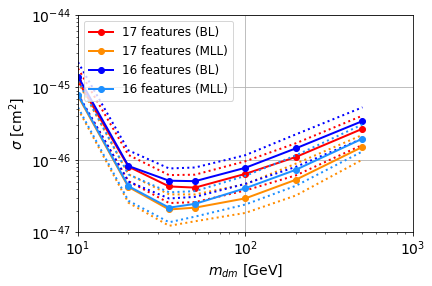

In [18]:
# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_15feats, '-o', color='red', lw=lw, label=r'17 features (BL)')
plt.plot(mDM_mDM, cross_15feats_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_15feats_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_15feats_MLL, '-o', color='darkorange', lw=lw, label=r'17 features (MLL)')
plt.plot(mDM_mDM, cross_15feats_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_15feats_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_14feats, '-o', color='blue', lw=lw, label=r'16 features (BL)')
plt.plot(mDM_mDM, cross_14feats_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_14feats_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_14feats_MLL, '-o', color='dodgerblue', lw=lw, label=r'16 features (MLL)')
plt.plot(mDM_mDM, cross_14feats_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_14feats_MLL_down, ':', color='dodgerblue', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlim(10,1000)
plt.ylim(1e-47, 1e-44)
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper left", fontsize=12)
plt.show()

In [19]:
x_XENON1T_1tonyr_down = [6.055606916561549, 6.823778108538652, 7.726215280067716, 8.582423845905856, 9.904912022713336, 11.596190805697788, 14.105146244789573, 17.91067828986308, 22.419318490487267, 28.741287837312296, 37.55681861498598, 46.12118051468561, 57.18227249733948, 70.55823652254493, 95.79168238706818, 141.05146244789574, 199.9078624971397, 281.97296360054435, 435.5160347143599, 663.0965425825532, 1004.7885762566482]
y_XENON1T_1tonyr_down = [2.122997019253291e-44, 6.830827595149092e-45, 2.5565879564232304e-45, 1.0450855592138182e-45, 3.814128748283239e-46, 1.6397373222443297e-46, 7.13879927716957e-47, 3.4375712618817914e-47, 2.296937143881235e-47, 1.807931378879487e-47, 1.5939048066202329e-47, 1.57394815950498e-47, 1.6141144911444228e-47, 1.7629420229546865e-47, 2.1840435093891482e-47, 2.99267938153686e-47, 4.3126768942716094e-47, 5.984360998261109e-47, 9.301141506038491e-47, 1.4275218465524083e-46, 2.218713527075558e-46]

x_XENON1T_1tonyr_up = [5.998025375267653, 6.694623244123534, 7.837740338641554, 9.176046414544945, 10.340054351159923, 12.047941859795849, 14.240556819126223, 17.57167968977445, 22.419318490487267, 28.604313898938127, 36.495613101538225, 45.03259469748133, 54.77586085235927, 70.22197324875098, 93.0849924905222, 139.0444078719906, 196.1241707554598, 274.00553519070826, 411.25186818001043, 650.5459961419798, 995.2342449249492]
y_XENON1T_1tonyr_up = [8.70579590515474e-44, 3.137473218474891e-44, 8.046532229280133e-45, 2.7573536821266015e-45, 1.2156689420722025e-45, 5.6367138959821105e-46, 2.7486819276573736e-46, 1.4639514554724662e-46, 8.956129880675696e-47, 6.702940894624926e-47, 5.909433198208975e-47, 5.909433198208975e-47, 6.293693784124586e-47, 6.873996431179536e-47, 8.409314634569101e-47, 1.1236099983376527e-46, 1.5013107289081836e-46, 2.057166738834862e-46, 3.0401858742608336e-46, 4.785094961345878e-46, 7.252122247218222e-46]

x_XENON1T_1tonyr_dat = [5.940991365202825, 6.5679129168455805, 7.616277137894846, 8.874272903135752, 10.340054351159923, 11.990524319733609, 14.308748811391741, 17.156940060795215, 20.76956429087212, 25.142875087521656, 30.147625520495286, 36.14858369857204, 45.901378264580416, 60.267473771664314, 83.39918867052648, 123.98267316495033, 183.43638249062232, 276.63601106438455, 407.34135734995056, 638.2329961306843, 990.4912022713337]
y_XENON1T_1tonyr_dat = [2.4080691095438086e-44, 9.84373819664703e-45, 2.936650461687786e-45, 1.0320004592606233e-45, 4.492941663683521e-46, 2.362985258610077e-46, 1.2744862586397517e-46, 7.699400454191772e-47, 5.479161357412966e-47, 4.422734147010833e-47, 4.1007103760403667e-47, 4.2586795849318555e-47, 4.830527157087775e-47, 5.984360998261109e-47, 7.797023884122048e-47, 1.1095417251641934e-46, 1.5989333808583735e-46, 2.3333992615362496e-46, 3.448416377736618e-46, 5.427628610945291e-46, 8.542806062673913e-46]

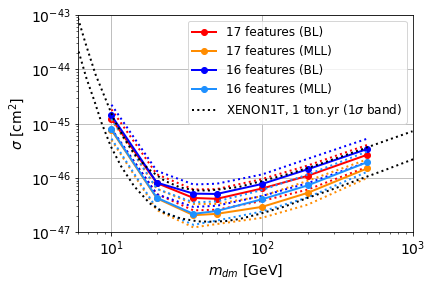

In [20]:

# plot
plt.figure()
lw = 2

plt.plot(mDM_mDM, cross_15feats, '-o', color='red', lw=lw, label=r'17 features (BL)')
plt.plot(mDM_mDM, cross_15feats_up, ':', color='red', lw=lw) 
plt.plot(mDM_mDM, cross_15feats_down, ':', color='red', lw=lw)
plt.plot(mDM_mDM, cross_15feats_MLL, '-o', color='darkorange', lw=lw, label=r'17 features (MLL)')
plt.plot(mDM_mDM, cross_15feats_MLL_up, ':', color='darkorange', lw=lw) 
plt.plot(mDM_mDM, cross_15feats_MLL_down, ':', color='darkorange', lw=lw)
plt.plot(mDM_mDM, cross_14feats, '-o', color='blue', lw=lw, label=r'16 features (BL)')
plt.plot(mDM_mDM, cross_14feats_up, ':', color='blue', lw=lw) 
plt.plot(mDM_mDM, cross_14feats_down, ':', color='blue', lw=lw)
plt.plot(mDM_mDM, cross_14feats_MLL, '-o', color='dodgerblue', lw=lw, label=r'16 features (MLL)')
plt.plot(mDM_mDM, cross_14feats_MLL_up, ':', color='dodgerblue', lw=lw) 
plt.plot(mDM_mDM, cross_14feats_MLL_down, ':', color='dodgerblue', lw=lw)
#plt.plot(x_XENON1T_1tonyr_dat, y_XENON1T_1tonyr_dat, '--', color='green', lw=lw, label='XENON1T')
plt.plot(x_XENON1T_1tonyr_up, y_XENON1T_1tonyr_up, ':', color='black', lw=lw, label='XENON1T, 1 ton.yr (1$\sigma$ band)')
plt.plot(x_XENON1T_1tonyr_down, y_XENON1T_1tonyr_down, ':', color='black', lw=lw)

plt.xscale('log')
plt.yscale('log')
plt.xlim(6,1000)
plt.ylim(1e-47, 1e-43)
plt.xlabel(r'$m_{dm}$ [GeV]', fontsize=14)
plt.ylabel(r'$\sigma$ [cm$^2$]', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid()
plt.legend(loc="upper right", fontsize=12)
plt.show()